The purpose of this notebook is to perform dimensionality reduction on different object feature representations. 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns
import pandas as pd
import itertools
import pickle
import sys
from sklearn.manifold import TSNE
from sklearn.manifold import MDS
from sklearn.preprocessing import MinMaxScaler

from scipy.stats import pearsonr
from scipy.stats import spearmanr

import visual_search_load
import visual_search_preproc
import visual_search_objects
import visual_search_rsa

UTILS_DIR = 'FC_geodesic/utils/distance_FC'
sys.path.insert(0, UTILS_DIR)
from distance_FC import distance_FC

## Preliminaries

In [15]:
## Set directories.
data_direc = '/Users/angelaradulescu/Dropbox/NYU/Research/TaskVR/VisualSearchGazeData/'

## Choose representational space. Options: 'color', 'shape', 'vgg'
z = 'shape'

In [30]:
if (z == 'color'):
    
    lab_all_objects = pickle.load(open(data_direc + 'color/lab_all_objects.pickle', "rb"))
    all_objects = lab_all_objects['unique_objects']
    
    ## Make color features for each channel, treating each pixel as a feature. 
    # A_B is the combined channel, so it has double the number of pixels.
    L = []
    A = []
    B = []
    for i in np.arange(len(all_objects)):
        
        A.append(lab_all_objects['A'][i])
        B.append(lab_all_objects['B'][i])

    A = np.vstack(A)
    B = np.vstack(B)
    A_B = np.hstack((A,B))
    Z = A_B

    print('N color features: ' + str(Z.shape[1]))
    
elif (z == 'shape'):
    
    d2_all_objects = pickle.load(open(data_direc + "shape/d2_all_objects.pickle", "rb"))
    all_objects = d2_all_objects['unique_objects']

    Z = []
    for i in np.arange(len(d2_all_objects['D2'])):
        
            # Histogram representation.
            bins = np.arange(0, 1, 0.01)
            h = np.histogram(d2_all_objects['D2'][i], bins=bins)[0]
        
            # Z.append(d2_all_objects['D2'][i])
            Z.append(np.expand_dims(h, axis=1))
                
    Z = np.hstack(Z).T
    
    print('N shape features: ' + str(Z.shape[1]))
    
elif (z == 'vgg'):
    
    layer = 'block5_pool'
    
    embeddings_all_objects = pickle.load(open(data_direc + 'vgg/embeddings/' + layer + '.pickle', "rb"))
    all_objects = embeddings_all_objects['unique_objects']
    
    Z = embeddings_all_objects['embeddings']
    
    print('N vgg features: ' + str(Z.shape[1]))

N shape features: 99


## Run dimensionality reduction

In [31]:
## PCA -- 95% variance
pca = visual_search_objects.pca_wrapper(Z, var_explained=0.95)
Z_pca = pca.transform(Z)
n_components = Z_pca.shape[1]

## MDS
scaler = MinMaxScaler()
Z_scaled = scaler.fit_transform(Z)
mds = MDS(2,random_state=0)
Z_2d_mds = mds.fit_transform(Z_scaled)

## t-SNE
tsne = TSNE(n_components = 2, n_iter=2000)
Z_2d_tsne = tsne.fit_transform(Z_scaled)

n_components

7

In [91]:
## Save result.
Z_pca_df = pd.DataFrame(Z_pca) 
Z_mds_df = pd.DataFrame(Z_2d_mds)
Z_tsne_df = pd.DataFrame(Z_2d_tsne)

Z_pca_df.insert(0,'object', all_objects)
Z_mds_df.insert(0,'object', all_objects)
Z_tsne_df.insert(0,'object', all_objects)

if (z == 'vgg'):
    Z_pca_df.to_csv(data_direc + z + '/pca/' + layer + '_pca_all_objects.csv', index=False)
    Z_mds_df.to_csv(data_direc + z + '/pca/' + layer + '_mds_all_objects.csv', index=False)
    Z_tsne_df.to_csv(data_direc + z + '/pca/' + layer + '_tsne_all_objects.csv', index=False)
else: 
    Z_pca_df.to_csv(data_direc + z + '/pca/' + 'pca_all_objects.csv', index=False)
    Z_mds_df.to_csv(data_direc + z + '/' + 'mds_all_objects.csv', index=False)
    Z_tsne_df.to_csv(data_direc + z + '/' + 'tsne_all_objects.csv', index=False)

## Visualize results

#### PCA

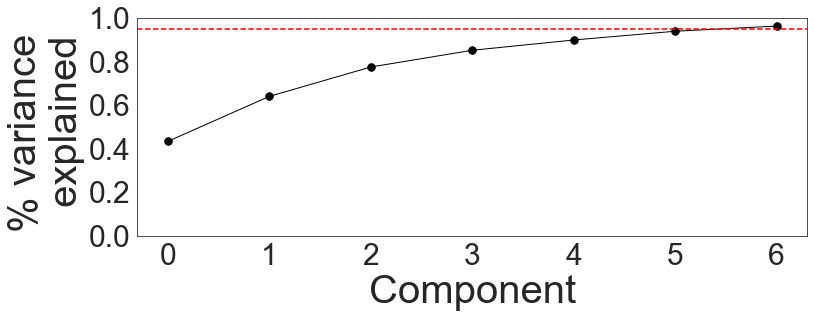

In [32]:
## Scree plot. 
fig, ax = plt.subplots(figsize=(12,4))
sns.set_style('white')
plt.plot(pca.explained_variance_ratio_.cumsum(), '.-', color='k', linewidth=1, markersize=15)
plt.axhline(0.95, color='r', linestyle='--')
plt.xlabel('Component',  fontsize=40)
plt.ylabel('% variance \n explained',  fontsize=40)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.ylim([0,1]);

In [79]:
## List objects in order based on different PCs.
# Can be used to render in Unity and visualize.
pc = 2
list(zip(all_objects[np.argsort(Z_pca[:,pc])],np.sort(Z_pca[:,pc])))

[('Allergy Pills', -7415.263968208477),
 ('Paint Can', -6825.508227880474),
 ('Cup', -6639.046547870245),
 ('Juice Box', -5944.693131029366),
 ('Pencil 2', -4982.776926723138),
 ('Train', -4203.640539424416),
 ('Crayon 2', -4080.055099121955),
 ('Soda Can', -3812.1253493444806),
 ('Pills', -3415.2733464691623),
 ('Coconut', -3094.319547562702),
 ('Marker 4', -2845.7089269783787),
 ('Crayon 3', -2489.3629924062498),
 ('Apple', -2394.136582183479),
 ('Cylinder 2', -1970.4829819686777),
 ('Bread', -1853.3332143032164),
 ('Banana', -1342.5948053000966),
 ('Cylinder 1', -1279.903801176594),
 ('Crayon 1', -1130.339893575287),
 ('Paper Box', -1105.681468815377),
 ('Water Bottle', -1041.044250365979),
 ('Book 5', -1027.4377025649942),
 ('Bacon', -899.177576774974),
 ('Book 6', -824.4968925107448),
 ('Paper Bag', -697.9685277058956),
 ('Donut 1', -673.894294346495),
 ('Pear', -659.998186198003),
 ('Yogurt', -608.4064520812678),
 ('Rubber Duck', -606.2317996712035),
 ('Oil Bottle 2', -589.581326

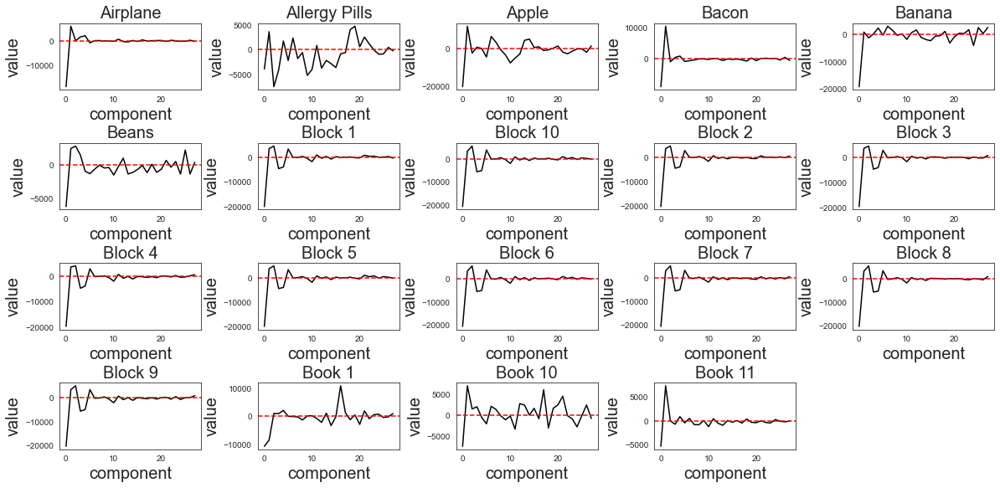

In [80]:
## Plot sample objects as a function of the components. 
fig = plt.figure(figsize=(20,12))
fig.subplots_adjust(hspace=0.8, wspace=0.4)

for i in range(1, 20):
    
    obj_no = i-1
    obj_name = all_objects[obj_no]
    
    ax = fig.add_subplot(5, 5, i)
    
    ax.plot(Z_pca[obj_no,:], color='k');
    ax.axhline(0, color='r', linestyle='--');
    ax.set_xlabel('component',fontsize=20)
    ax.set_ylabel('value',fontsize=20)
    ax.set_title(obj_name,fontsize=20);

#### MDS

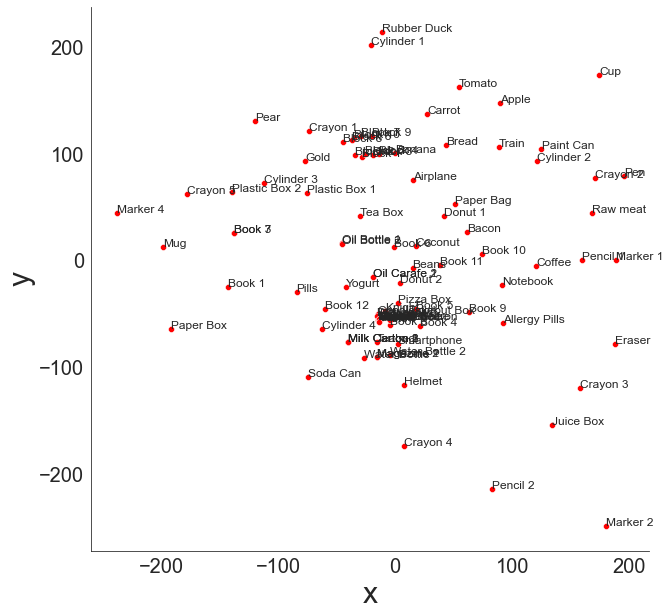

In [81]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x=Z_2d_mds[:,0], y=Z_2d_mds[:,1], color='r')
plt.xlabel('x',  fontsize=30);
plt.ylabel('y',  fontsize=30);
plt.xticks(fontsize=20);
plt.yticks(fontsize=20);
# plt.xlim([-1000,1000]);
# plt.ylim([-1000,1000]);
sns.despine()

d = {'object': all_objects, 'x': Z_2d_mds[:,0], 'y': Z_2d_mds[:,1]}
df = pd.DataFrame(data=d)

def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.01, point['y']+.01, str(point['val']), fontsize=12)

label_point(df.x, df.y, df.object, plt.gca())

#### t-SNE

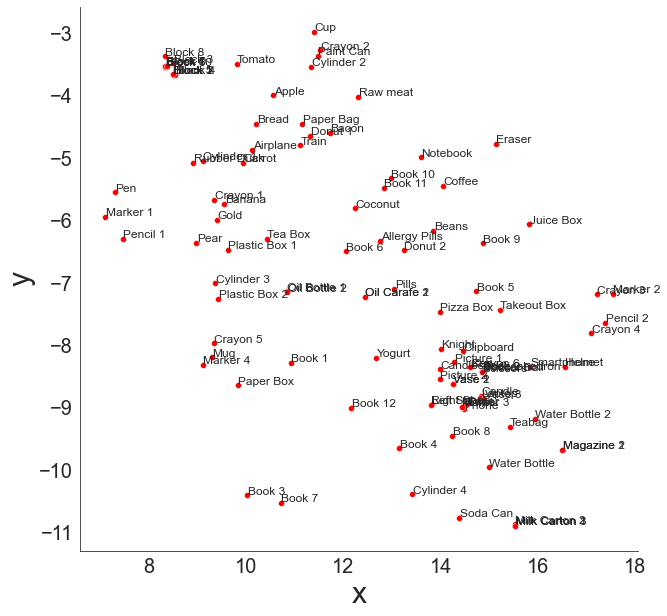

In [82]:
fig, ax = plt.subplots(figsize=(10,10))
sns.scatterplot(x=Z_2d_tsne[:,0], y=Z_2d_tsne[:,1], color='r')
plt.xlabel('x',  fontsize=30);
plt.ylabel('y',  fontsize=30);
plt.xticks(fontsize=20);
plt.yticks(fontsize=20);
# plt.xlim([-1000,1000]);
# plt.ylim([-1000,1000]);
sns.despine()

d = {'object': all_objects, 'x': Z_2d_tsne[:,0], 'y': Z_2d_tsne[:,1]}
df = pd.DataFrame(data=d)

def label_point(x, y, val, ax):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.01, point['y']+.01, str(point['val']), fontsize=12)

label_point(df.x, df.y, df.object, plt.gca())

## Compute and store similarity matrix along the first *n* components of PCA

In [92]:
feature = 'color'
layer = 'block5_pool'
if feature == 'color': 
    feature_pca = pd.read_csv(data_direc + 'color/pca/pca_all_objects.csv')
elif feature == 'shape':
    feature_pca = pd.read_csv(data_direc + 'shape/pca/pca_all_objects.csv')
elif feature == 'vgg': 
    feature_pca = pd.read_csv(data_direc + 'vgg/pca/' + layer + '_pca_all_objects.csv')
    
n_components = len(feature_pca.columns)-1
n_components

28

In [94]:
unique_objects = feature_pca['object'].values
n_objects = unique_objects.shape[0]
object_pairs = list(itertools.combinations(np.arange(n_objects), 2))

for n_comp in np.arange(n_components)+1:

    print('Computing similarity matrix for ' + str(n_comp) + ' components')

    similarity_matrix = np.zeros((n_objects, n_objects))

    for p in object_pairs:

        object_1_idx = p[0]
        object_2_idx = p[1]

        print("Computing distance between " + unique_objects[object_1_idx] + " and " + unique_objects[object_2_idx])

        cols = [str(i) for i in np.arange(n_comp)] 
        F_1 = feature_pca[feature_pca['object'] == unique_objects[object_1_idx]][cols].values.flatten()
        F_2 = feature_pca[feature_pca['object'] == unique_objects[object_2_idx]][cols].values.flatten()

        distance = np.linalg.norm(F_1-F_2)
        # distance = (1-spearmanr(F_1,F_2)[0])/2
        similarity_matrix[object_1_idx,object_2_idx] = distance

        print("Distance: " + str(distance))
        
    similarity_all_objects = {"unique_objects": unique_objects, "similarity_matrix": similarity_matrix}
    
    if feature == 'vgg':
        filename = data_direc + feature + "/pca/similarity_95_spearman/" + layer + "_" + str(n_comp) + "_similarity_spearman.pickle"
        # filename = data_direc + feature + "/pca/similarity_95_euclidean/" + layer + "_" + str(n_comp) + "_similarity_euclidean.pickle"
    else: 
        filename = data_direc + feature + "/pca/similarity_95_l2/" + str(n_comp) + "_similarity_l2.pickle" 
        # filename = data_direc + feature + "/pca/similarity_95_spearman/" + str(n_comp) + "_similarity_spearman.pickle" 
    
    pickle_out = open(filename,"wb")
    pickle.dump(similarity_all_objects, pickle_out)
    pickle_out.close()

Computing similarity matrix for 1 components
Computing distance between Airplane and Allergy Pills
Distance: 14636.179643697076
Computing distance between Airplane and Apple
Distance: 1970.736273013954
Computing distance between Airplane and Bacon
Distance: 9655.53549635157
Computing distance between Airplane and Banana
Distance: 710.8169868300683
Computing distance between Airplane and Beans
Distance: 12315.14613360876
Computing distance between Airplane and Block 1
Distance: 1399.8419844632408
Computing distance between Airplane and Block 10
Distance: 2148.8821199712766
Computing distance between Airplane and Block 2
Distance: 1640.5539766469374
Computing distance between Airplane and Block 3
Distance: 1129.493988094633
Computing distance between Airplane and Block 4
Distance: 1278.8791110044913
Computing distance between Airplane and Block 5
Distance: 1513.7976280531911
Computing distance between Airplane and Block 6
Distance: 2094.2817110567557
Computing distance between Airplane a

Distance: 3559.5419718947223
Computing distance between Allergy Pills and Book 11
Distance: 1417.8545619870256
Computing distance between Allergy Pills and Book 12
Distance: 691.664479053406
Computing distance between Allergy Pills and Book 2
Distance: 3869.5497582153307
Computing distance between Allergy Pills and Book 3
Distance: 8632.668543111165
Computing distance between Allergy Pills and Book 4
Distance: 2481.0132469402197
Computing distance between Allergy Pills and Book 5
Distance: 3010.9728905047855
Computing distance between Allergy Pills and Book 6
Distance: 3360.541355102503
Computing distance between Allergy Pills and Book 7
Distance: 8632.668543111165
Computing distance between Allergy Pills and Book 8
Distance: 3805.9247128871157
Computing distance between Allergy Pills and Book 9
Distance: 1616.941862171987
Computing distance between Allergy Pills and Bread
Distance: 16704.547359719938
Computing distance between Allergy Pills and Candle
Distance: 3894.7746928603565
Comp

Distance: 20476.465674926363
Computing distance between Apple and Book 3
Distance: 7974.2473735998665
Computing distance between Apple and Book 4
Distance: 19087.92916365125
Computing distance between Apple and Book 5
Distance: 19617.888807215815
Computing distance between Apple and Book 6
Distance: 13246.374561608529
Computing distance between Apple and Book 7
Distance: 7974.2473735998665
Computing distance between Apple and Book 8
Distance: 20412.840629598148
Computing distance between Apple and Book 9
Distance: 18223.85777888302
Computing distance between Apple and Bread
Distance: 97.63144300890781
Computing distance between Apple and Candle
Distance: 20501.69060957139
Computing distance between Apple and Candlestick
Distance: 19819.921722708536
Computing distance between Apple and Carrot
Distance: 577.2534247309486
Computing distance between Apple and Clipboard
Distance: 20337.35002237617
Computing distance between Apple and Coconut
Distance: 13197.629461067423
Computing distance b

Distance: 10767.888115977072
Computing distance between Bacon and Tomato
Distance: 12476.173135681578
Computing distance between Bacon and Towel
Distance: 8859.099618894354
Computing distance between Bacon and Train
Distance: 7333.829823465396
Computing distance between Bacon and Vase 1
Distance: 8765.769736332342
Computing distance between Bacon and Vase 2
Distance: 8765.769736332342
Computing distance between Bacon and Vase 3
Distance: 9046.023058056566
Computing distance between Bacon and Water Bottle
Distance: 12674.81351957925
Computing distance between Bacon and Water Bottle 2
Distance: 10582.858703376281
Computing distance between Bacon and Yogurt
Distance: 5450.052712735471
Computing distance between Banana and Beans
Distance: 13025.963120438828
Computing distance between Banana and Block 1
Distance: 689.0249976331725
Computing distance between Banana and Block 10
Distance: 1438.0651331412082
Computing distance between Banana and Block 2
Distance: 929.736989816869
Computing dis

Distance: 5534.039316085823
Computing distance between Beans and Carrot
Distance: 13708.628981891765
Computing distance between Beans and Clipboard
Distance: 6051.467615753457
Computing distance between Beans and Coconut
Distance: 1088.2529455552904
Computing distance between Beans and Coffee
Distance: 2000.6666939158586
Computing distance between Beans and Crayon 1
Distance: 18281.439215980605
Computing distance between Beans and Crayon 2
Distance: 4230.206986149844
Computing distance between Beans and Crayon 3
Distance: 17060.046457014025
Computing distance between Beans and Crayon 4
Distance: 21836.557068431684
Computing distance between Beans and Crayon 5
Distance: 13426.509590001642
Computing distance between Beans and Crayon 6
Distance: 6200.44866647816
Computing distance between Beans and Cup
Distance: 16296.985070130908
Computing distance between Beans and Cylinder 1
Distance: 27375.828524374858
Computing distance between Beans and Cylinder 2
Distance: 9916.679669725914
Computi

Distance: 24701.75371891883
Computing distance between Block 1 and Juice Box
Distance: 27617.42092111181
Computing distance between Block 1 and Key
Distance: 19914.96024045973
Computing distance between Block 1 and Knight
Distance: 19278.713561343007
Computing distance between Block 1 and Laptop
Distance: 19945.04580686267
Computing distance between Block 1 and Left Shoe
Distance: 19804.468565752897
Computing distance between Block 1 and Magazine 1
Distance: 21367.677630364044
Computing distance between Block 1 and Magazine 2
Distance: 21367.677630364044
Computing distance between Block 1 and Marker 1
Distance: 10459.141725941941
Computing distance between Block 1 and Marker 2
Distance: 46652.020906431346
Computing distance between Block 1 and Marker 3
Distance: 19915.55184255994
Computing distance between Block 1 and Marker 4
Distance: 773.3354710451749
Computing distance between Block 1 and Milk Carton 1
Distance: 20720.775648298575
Computing distance between Block 1 and Milk Carton 

Distance: 8258.013897739902
Computing distance between Block 2 and Donut 2
Distance: 15904.6248565661
Computing distance between Block 2 and Eraser
Distance: 21378.972804035926
Computing distance between Block 2 and Gold
Distance: 2722.605770455404
Computing distance between Block 2 and Helmet
Distance: 24942.465711102526
Computing distance between Block 2 and Juice Box
Distance: 27858.132913295507
Computing distance between Block 2 and Key
Distance: 20155.67223264343
Computing distance between Block 2 and Knight
Distance: 19519.425553526704
Computing distance between Block 2 and Laptop
Distance: 20185.757799046365
Computing distance between Block 2 and Left Shoe
Distance: 20045.180557936594
Computing distance between Block 2 and Magazine 1
Distance: 21608.38962254774
Computing distance between Block 2 and Magazine 2
Distance: 21608.38962254774
Computing distance between Block 2 and Marker 1
Distance: 10699.853718125638
Computing distance between Block 2 and Marker 2
Distance: 46892.73

Distance: 13781.803279761607
Computing distance between Block 4 and Cylinder 2
Distance: 3677.3455748873366
Computing distance between Block 4 and Cylinder 3
Distance: 63.456680270181096
Computing distance between Block 4 and Cylinder 4
Distance: 18756.528608344535
Computing distance between Block 4 and Dodecahedron
Distance: 19793.788416015672
Computing distance between Block 4 and Donut 1
Distance: 7896.339032097456
Computing distance between Block 4 and Donut 2
Distance: 15542.949990923655
Computing distance between Block 4 and Eraser
Distance: 21017.29793839348
Computing distance between Block 4 and Gold
Distance: 3084.28063609785
Computing distance between Block 4 and Helmet
Distance: 24580.79084546008
Computing distance between Block 4 and Juice Box
Distance: 27496.45804765306
Computing distance between Block 4 and Key
Distance: 19793.997367000982
Computing distance between Block 4 and Knight
Distance: 19157.750687884258
Computing distance between Block 4 and Laptop
Distance: 198

Distance: 20028.19710630967
Computing distance between Block 5 and Paper Bag
Distance: 6700.443300225306
Computing distance between Block 5 and Paper Box
Distance: 10540.434251683317
Computing distance between Block 5 and Pear
Distance: 5851.973109208935
Computing distance between Block 5 and Pen
Distance: 4943.855542400459
Computing distance between Block 5 and Pencil 1
Distance: 10146.706285494123
Computing distance between Block 5 and Pencil 2
Distance: 34505.749778711426
Computing distance between Block 5 and Phone
Distance: 20021.690123679877
Computing distance between Block 5 and Picture 1
Distance: 19790.96347642762
Computing distance between Block 5 and Picture 2
Distance: 19505.915710990186
Computing distance between Block 5 and Pills
Distance: 15755.234806805702
Computing distance between Block 5 and Pizza Box
Distance: 18721.205152561353
Computing distance between Block 5 and Plastic Box 1
Distance: 1249.2233874486374
Computing distance between Block 5 and Plastic Box 2
Dist

Distance: 20515.586943740665
Computing distance between Block 6 and Vase 2
Distance: 20515.586943740665
Computing distance between Block 6 and Vase 3
Distance: 20795.84026546489
Computing distance between Block 6 and Water Bottle
Distance: 24424.630726987576
Computing distance between Block 6 and Water Bottle 2
Distance: 22332.67591078461
Computing distance between Block 6 and Yogurt
Distance: 17199.869920143796
Computing distance between Block 7 and Block 8
Distance: 328.94578076895414
Computing distance between Block 7 and Block 9
Distance: 84.85708165439064
Computing distance between Block 7 and Book 1
Distance: 9772.983588850839
Computing distance between Block 7 and Book 10
Distance: 13128.096085850715
Computing distance between Block 7 and Book 11
Distance: 15269.783495758413
Computing distance between Block 7 and Book 12
Distance: 17379.302536798845
Computing distance between Block 7 and Book 2
Distance: 20557.18781596077
Computing distance between Block 7 and Book 3
Distance: 8

Distance: 31097.705223902194
Computing distance between Block 8 and Crayon 4
Distance: 35874.21583531985
Computing distance between Block 8 and Crayon 5
Distance: 611.1491768865235
Computing distance between Block 8 and Crayon 6
Distance: 20238.107433366324
Computing distance between Block 8 and Cup
Distance: 2259.326303242742
Computing distance between Block 8 and Cylinder 1
Distance: 13338.169757486692
Computing distance between Block 8 and Cylinder 2
Distance: 4120.9790971622515
Computing distance between Block 8 and Cylinder 3
Distance: 380.17684200473377
Computing distance between Block 8 and Cylinder 4
Distance: 19200.16213061945
Computing distance between Block 8 and Dodecahedron
Distance: 20237.421938290587
Computing distance between Block 8 and Donut 1
Distance: 8339.97255437237
Computing distance between Block 8 and Donut 2
Distance: 15986.58351319857
Computing distance between Block 8 and Eraser
Distance: 21460.931460668395
Computing distance between Block 8 and Gold
Distanc

Distance: 7153.247004566085
Computing distance between Block 9 and Paper Box
Distance: 10993.237956024095
Computing distance between Block 9 and Pear
Distance: 5399.169404868157
Computing distance between Block 9 and Pen
Distance: 5396.659246741237
Computing distance between Block 9 and Pencil 1
Distance: 10599.509989834902
Computing distance between Block 9 and Pencil 2
Distance: 34958.5534830522
Computing distance between Block 9 and Phone
Distance: 20474.493828020655
Computing distance between Block 9 and Picture 1
Distance: 20243.7671807684
Computing distance between Block 9 and Picture 2
Distance: 19958.719415330965
Computing distance between Block 9 and Pills
Distance: 16208.03851114648
Computing distance between Block 9 and Pizza Box
Distance: 19174.00885690213
Computing distance between Block 9 and Plastic Box 1
Distance: 1702.0270917894159
Computing distance between Block 9 and Plastic Box 2
Distance: 2069.0228109948403
Computing distance between Block 9 and Raw meat
Distance:

Distance: 2141.6874099076967
Computing distance between Book 10 and Book 12
Distance: 4251.206450948128
Computing distance between Book 10 and Book 2
Distance: 7429.0917301100535
Computing distance between Book 10 and Book 3
Distance: 5073.126571216442
Computing distance between Book 10 and Book 4
Distance: 6040.555218834942
Computing distance between Book 10 and Book 5
Distance: 6570.514862399508
Computing distance between Book 10 and Book 6
Distance: 199.00061679221926
Computing distance between Book 10 and Book 7
Distance: 5073.126571216442
Computing distance between Book 10 and Book 8
Distance: 7365.466684781838
Computing distance between Book 10 and Book 9
Distance: 5176.483834066709
Computing distance between Book 10 and Bread
Distance: 13145.005387825217
Computing distance between Book 10 and Candle
Distance: 7454.316664755079
Computing distance between Book 10 and Candlestick
Distance: 6772.547777892228
Computing distance between Book 10 and Carrot
Distance: 12470.12052008536
C

Distance: 14560.660872984725
Computing distance between Book 11 and Cylinder 4
Distance: 4259.324415629992
Computing distance between Book 11 and Dodecahedron
Distance: 5296.58422330113
Computing distance between Book 11 and Donut 1
Distance: 6600.865160617087
Computing distance between Book 11 and Donut 2
Distance: 1045.7457982091128
Computing distance between Book 11 and Eraser
Distance: 6520.093745678935
Computing distance between Book 11 and Gold
Distance: 17581.484828812394
Computing distance between Book 11 and Helmet
Distance: 10083.586652745536
Computing distance between Book 11 and Juice Box
Distance: 12999.253854938517
Computing distance between Book 11 and Key
Distance: 5296.793174286438
Computing distance between Book 11 and Knight
Distance: 4660.546495169716
Computing distance between Book 11 and Laptop
Distance: 5326.878740689376
Computing distance between Book 11 and Left Shoe
Distance: 5186.301499579605
Computing distance between Book 11 and Magazine 1
Distance: 6749.51

Distance: 6944.967457770594
Computing distance between Book 12 and Right Shoe
Distance: 3076.782458539173
Computing distance between Book 12 and Rubber Duck
Distance: 28322.178712631754
Computing distance between Book 12 and Scissors
Distance: 3187.276464718661
Computing distance between Book 12 and Smartphone
Distance: 5690.789343269477
Computing distance between Book 12 and Soccer Ball
Distance: 3187.355671863443
Computing distance between Book 12 and Soda Can
Distance: 7162.210588372356
Computing distance between Book 12 and Takeout Box
Distance: 2259.4074590154505
Computing distance between Book 12 and Tea Box
Distance: 10641.705893385571
Computing distance between Book 12 and Teabag
Distance: 5095.579489578158
Computing distance between Book 12 and Tomato
Distance: 18148.481762080493
Computing distance between Book 12 and Towel
Distance: 3186.79099249544
Computing distance between Book 12 and Train
Distance: 13006.13844986431
Computing distance between Book 12 and Vase 1
Distance:

Distance: 7345.846891860585
Computing distance between Book 3 and Cylinder 4
Distance: 11474.138396754131
Computing distance between Book 3 and Dodecahedron
Distance: 12511.398204425268
Computing distance between Book 3 and Donut 1
Distance: 613.948820507052
Computing distance between Book 3 and Donut 2
Distance: 8260.559779333253
Computing distance between Book 3 and Eraser
Distance: 13734.907726803074
Computing distance between Book 3 and Gold
Distance: 10366.670847688254
Computing distance between Book 3 and Helmet
Distance: 17298.400633869678
Computing distance between Book 3 and Juice Box
Distance: 20214.067836062655
Computing distance between Book 3 and Key
Distance: 12511.607155410578
Computing distance between Book 3 and Knight
Distance: 11875.360476293856
Computing distance between Book 3 and Laptop
Distance: 12541.692721813515
Computing distance between Book 3 and Left Shoe
Distance: 12401.115480703744
Computing distance between Book 3 and Magazine 1
Distance: 13964.324545314

Distance: 17381.76713124185
Computing distance between Book 4 and Plastic Box 2
Distance: 17014.771412036425
Computing distance between Book 4 and Raw meat
Distance: 8734.316225657407
Computing distance between Book 4 and Right Shoe
Distance: 1287.4336906523595
Computing distance between Book 4 and Rubber Duck
Distance: 30111.527480518565
Computing distance between Book 4 and Scissors
Distance: 1397.9276968318475
Computing distance between Book 4 and Smartphone
Distance: 3901.4405753826636
Computing distance between Book 4 and Soccer Ball
Distance: 1398.0069039766295
Computing distance between Book 4 and Soda Can
Distance: 5372.861820485543
Computing distance between Book 4 and Takeout Box
Distance: 470.05869112863684
Computing distance between Book 4 and Tea Box
Distance: 12431.054661272385
Computing distance between Book 4 and Teabag
Distance: 3306.230721691345
Computing distance between Book 4 and Tomato
Distance: 19937.830529967305
Computing distance between Book 4 and Towel
Distan

Distance: 6202.011208745469
Computing distance between Book 6 and Dodecahedron
Distance: 7239.271016416607
Computing distance between Book 6 and Donut 1
Distance: 4658.1783675016095
Computing distance between Book 6 and Donut 2
Distance: 2988.4325913245902
Computing distance between Book 6 and Eraser
Distance: 8462.780538794414
Computing distance between Book 6 and Gold
Distance: 15638.798035696916
Computing distance between Book 6 and Helmet
Distance: 12026.273445861014
Computing distance between Book 6 and Juice Box
Distance: 14941.940648053995
Computing distance between Book 6 and Key
Distance: 7239.479967401916
Computing distance between Book 6 and Knight
Distance: 6603.233288285193
Computing distance between Book 6 and Laptop
Distance: 7269.565533804854
Computing distance between Book 6 and Left Shoe
Distance: 7128.988292695082
Computing distance between Book 6 and Magazine 1
Distance: 8692.19735730623
Computing distance between Book 6 and Magazine 2
Distance: 8692.19735730623
Com

Distance: 12511.12401466001
Computing distance between Book 7 and Train
Distance: 3681.805427699739
Computing distance between Book 7 and Vase 1
Distance: 12417.794132097999
Computing distance between Book 7 and Vase 2
Distance: 12417.794132097999
Computing distance between Book 7 and Vase 3
Distance: 12698.047453822222
Computing distance between Book 7 and Water Bottle
Distance: 16326.837915344906
Computing distance between Book 7 and Water Bottle 2
Distance: 14234.883099141938
Computing distance between Book 7 and Yogurt
Distance: 9102.077108501127
Computing distance between Book 8 and Book 9
Distance: 2188.9828507151287
Computing distance between Book 8 and Bread
Distance: 20510.472072607055
Computing distance between Book 8 and Candle
Distance: 88.84997997324098
Computing distance between Book 8 and Candlestick
Distance: 592.91890688961
Computing distance between Book 8 and Carrot
Distance: 19835.5872048672
Computing distance between Book 8 and Clipboard
Distance: 75.49060722197636

Distance: 7226.484882238939
Computing distance between Book 9 and Pear
Distance: 23618.89224313119
Computing distance between Book 9 and Pen
Distance: 12823.063591521797
Computing distance between Book 9 and Pencil 1
Distance: 7620.212848428132
Computing distance between Book 9 and Pencil 2
Distance: 16738.83064478917
Computing distance between Book 9 and Phone
Distance: 2254.7709897576224
Computing distance between Book 9 and Picture 1
Distance: 2024.0443425053647
Computing distance between Book 9 and Picture 2
Distance: 1738.9965770679305
Computing distance between Book 9 and Pills
Distance: 2011.6843271165535
Computing distance between Book 9 and Pizza Box
Distance: 954.2860186390985
Computing distance between Book 9 and Plastic Box 1
Distance: 16517.69574647362
Computing distance between Book 9 and Plastic Box 2
Distance: 16150.700027268194
Computing distance between Book 9 and Raw meat
Distance: 7870.244840889175
Computing distance between Book 9 and Right Shoe
Distance: 2151.5050

Distance: 4770.957397898155
Computing distance between Candle and Juice Box
Distance: 7686.624600091136
Computing distance between Candle and Key
Distance: 15.836080560943305
Computing distance between Candle and Knight
Distance: 652.0827596776659
Computing distance between Candle and Laptop
Distance: 14.249485841994364
Computing distance between Candle and Left Shoe
Distance: 126.3277552677774
Computing distance between Candle and Magazine 1
Distance: 1436.88130934337
Computing distance between Candle and Magazine 2
Distance: 1436.88130934337
Computing distance between Candle and Marker 1
Distance: 9471.654595078733
Computing distance between Candle and Marker 2
Distance: 26721.22458541067
Computing distance between Candle and Marker 3
Distance: 15.244478460735886
Computing distance between Candle and Marker 4
Distance: 20704.13179206585
Computing distance between Candle and Milk Carton 1
Distance: 789.9793272778991
Computing distance between Candle and Milk Carton 2
Distance: 789.979

Distance: 2574.238162634059
Computing distance between Candlestick and Tomato
Distance: 20669.82308902459
Computing distance between Candlestick and Towel
Distance: 665.4496655513404
Computing distance between Candlestick and Train
Distance: 15527.47977680841
Computing distance between Candlestick and Vase 1
Distance: 572.119782989328
Computing distance between Candlestick and Vase 2
Distance: 572.119782989328
Computing distance between Candlestick and Vase 3
Distance: 852.3731047135523
Computing distance between Candlestick and Water Bottle
Distance: 4481.163566236237
Computing distance between Candlestick and Water Bottle 2
Distance: 2389.208750033268
Computing distance between Candlestick and Yogurt
Distance: 2743.5972406075434
Computing distance between Carrot and Clipboard
Distance: 19760.09659764522
Computing distance between Carrot and Coconut
Distance: 12620.376036336474
Computing distance between Carrot and Coffee
Distance: 11707.962287975906
Computing distance between Carrot 

Distance: 141.2787462644703
Computing distance between Clipboard and Picture 1
Distance: 89.44790098778742
Computing distance between Clipboard and Picture 2
Distance: 374.4956664252216
Computing distance between Clipboard and Pills
Distance: 4125.176570609706
Computing distance between Clipboard and Pizza Box
Distance: 1159.2062248540537
Computing distance between Clipboard and Plastic Box 1
Distance: 18631.18798996677
Computing distance between Clipboard and Plastic Box 2
Distance: 18264.192270761345
Computing distance between Clipboard and Raw meat
Distance: 9983.737084382326
Computing distance between Clipboard and Right Shoe
Distance: 38.01283192743993
Computing distance between Clipboard and Rubber Duck
Distance: 31360.948339243485
Computing distance between Clipboard and Scissors
Distance: 148.50683810692797
Computing distance between Clipboard and Smartphone
Distance: 2652.019716657744
Computing distance between Clipboard and Soccer Ball
Distance: 148.58604525171
Computing dist

Distance: 3616.8721729974104
Computing distance between Coffee and Oil Bottle 1
Distance: 2358.878550562642
Computing distance between Coffee and Oil Bottle 2
Distance: 2109.7321552296507
Computing distance between Coffee and Oil Carafe 1
Distance: 2676.8171097941586
Computing distance between Coffee and Oil Carafe 2
Distance: 2676.8171097941586
Computing distance between Coffee and Paint Can
Distance: 6540.622250947699
Computing distance between Coffee and Paper
Distance: 8199.92003856358
Computing distance between Coffee and Paper Bag
Distance: 5127.833767520786
Computing distance between Coffee and Paper Box
Distance: 1287.8428160627755
Computing distance between Coffee and Pear
Distance: 17680.25017695503
Computing distance between Coffee and Pen
Distance: 6884.421525345633
Computing distance between Coffee and Pencil 1
Distance: 1681.570782251969
Computing distance between Coffee and Pencil 2
Distance: 22677.472710965332
Computing distance between Coffee and Phone
Distance: 8193.4

Distance: 10460.264674940512
Computing distance between Crayon 2 and Left Shoe
Distance: 10319.68743383074
Computing distance between Crayon 2 and Magazine 1
Distance: 11882.896498441889
Computing distance between Crayon 2 and Magazine 2
Distance: 11882.896498441889
Computing distance between Crayon 2 and Marker 1
Distance: 974.3605940197849
Computing distance between Crayon 2 and Marker 2
Distance: 37167.23977450919
Computing distance between Crayon 2 and Marker 3
Distance: 10430.770710637782
Computing distance between Crayon 2 and Marker 4
Distance: 10258.116602967331
Computing distance between Crayon 2 and Milk Carton 1
Distance: 11235.994516376417
Computing distance between Crayon 2 and Milk Carton 2
Distance: 11235.994516376417
Computing distance between Crayon 2 and Milk Carton 3
Distance: 11235.994516376417
Computing distance between Crayon 2 and Mug
Distance: 6864.008224924413
Computing distance between Crayon 2 and Notebook
Distance: 5846.412465231396
Computing distance betwee

Distance: 15636.793897029263
Computing distance between Crayon 4 and Donut 1
Distance: 27534.243280947478
Computing distance between Crayon 4 and Donut 2
Distance: 19887.63232212128
Computing distance between Crayon 4 and Eraser
Distance: 14413.284374651457
Computing distance between Crayon 4 and Gold
Distance: 38514.862949142786
Computing distance between Crayon 4 and Helmet
Distance: 10849.791467584855
Computing distance between Crayon 4 and Juice Box
Distance: 7934.124265391874
Computing distance between Crayon 4 and Key
Distance: 15636.584946043953
Computing distance between Crayon 4 and Knight
Distance: 16272.831625160676
Computing distance between Crayon 4 and Laptop
Distance: 15606.499379641016
Computing distance between Crayon 4 and Left Shoe
Distance: 15747.076620750788
Computing distance between Crayon 4 and Magazine 1
Distance: 14183.867556139641
Computing distance between Crayon 4 and Magazine 2
Distance: 14183.867556139641
Computing distance between Crayon 4 and Marker 1
D

Distance: 4786.3169343686695
Computing distance between Crayon 6 and Juice Box
Distance: 7701.98413656165
Computing distance between Crayon 6 and Key
Distance: 0.4765440904287179
Computing distance between Crayon 6 and Knight
Distance: 636.7232232071512
Computing distance between Crayon 6 and Laptop
Distance: 29.60902231250895
Computing distance between Crayon 6 and Left Shoe
Distance: 110.96821879726282
Computing distance between Crayon 6 and Magazine 1
Distance: 1452.2408458138846
Computing distance between Crayon 6 and Magazine 2
Distance: 1452.2408458138846
Computing distance between Crayon 6 and Marker 1
Distance: 9456.295058608219
Computing distance between Crayon 6 and Marker 2
Distance: 26736.584121881187
Computing distance between Crayon 6 and Marker 3
Distance: 0.11505800977870173
Computing distance between Crayon 6 and Marker 4
Distance: 20688.772255595333
Computing distance between Crayon 6 and Milk Carton 1
Distance: 805.3388637484137
Computing distance between Crayon 6 an

Distance: 60312.8613127342
Computing distance between Cylinder 1 and Marker 3
Distance: 33576.392248862794
Computing distance between Cylinder 1 and Marker 4
Distance: 12887.504935257683
Computing distance between Cylinder 1 and Milk Carton 1
Distance: 34381.61605460143
Computing distance between Cylinder 1 and Milk Carton 2
Distance: 34381.61605460143
Computing distance between Cylinder 1 and Milk Carton 3
Distance: 34381.61605460143
Computing distance between Cylinder 1 and Mug
Distance: 16281.6133133006
Computing distance between Cylinder 1 and Notebook
Distance: 28992.03400345641
Computing distance between Cylinder 1 and Oil Bottle 1
Distance: 23016.283279896357
Computing distance between Cylinder 1 and Oil Bottle 2
Distance: 23265.42967522935
Computing distance between Cylinder 1 and Oil Carafe 1
Distance: 28051.978940253157
Computing distance between Cylinder 1 and Oil Carafe 2
Distance: 28051.978940253157
Computing distance between Cylinder 1 and Paint Can
Distance: 18834.539579

Distance: 19858.045649371372
Computing distance between Cylinder 3 and Marker 4
Distance: 830.8416642337434
Computing distance between Cylinder 3 and Milk Carton 1
Distance: 20663.269455110007
Computing distance between Cylinder 3 and Milk Carton 2
Distance: 20663.269455110007
Computing distance between Cylinder 3 and Milk Carton 3
Distance: 20663.269455110007
Computing distance between Cylinder 3 and Mug
Distance: 2563.2667138091747
Computing distance between Cylinder 3 and Notebook
Distance: 15273.687403964985
Computing distance between Cylinder 3 and Oil Bottle 1
Distance: 9297.936680404931
Computing distance between Cylinder 3 and Oil Bottle 2
Distance: 9547.083075737923
Computing distance between Cylinder 3 and Oil Carafe 1
Distance: 14333.632340761731
Computing distance between Cylinder 3 and Oil Carafe 2
Distance: 14333.632340761731
Computing distance between Cylinder 3 and Paint Can
Distance: 5116.192980019874
Computing distance between Cylinder 3 and Paper
Distance: 19856.7352

Distance: 17293.97838247668
Computing distance between Dodecahedron and Notebook
Distance: 4583.55769232087
Computing distance between Dodecahedron and Oil Bottle 1
Distance: 10559.308415880922
Computing distance between Dodecahedron and Oil Bottle 2
Distance: 10310.16202054793
Computing distance between Dodecahedron and Oil Carafe 1
Distance: 5523.612755524122
Computing distance between Dodecahedron and Oil Carafe 2
Distance: 5523.612755524122
Computing distance between Dodecahedron and Paint Can
Distance: 14741.052116265979
Computing distance between Dodecahedron and Paper
Distance: 0.5098267547012656
Computing distance between Dodecahedron and Paper Bag
Distance: 13328.263632839065
Computing distance between Dodecahedron and Paper Box
Distance: 9488.272681381055
Computing distance between Dodecahedron and Pear
Distance: 25880.680042273307
Computing distance between Dodecahedron and Pen
Distance: 15084.851390663913
Computing distance between Dodecahedron and Pencil 1
Distance: 9882.0

Distance: 22.633701166653736
Computing distance between Donut 2 and Pizza Box
Distance: 2943.3366445889983
Computing distance between Donut 2 and Plastic Box 1
Distance: 14528.645120523717
Computing distance between Donut 2 and Plastic Box 2
Distance: 14161.649401318293
Computing distance between Donut 2 and Raw meat
Distance: 5881.194214939275
Computing distance between Donut 2 and Right Shoe
Distance: 4140.555701370492
Computing distance between Donut 2 and Rubber Duck
Distance: 27258.405469800433
Computing distance between Donut 2 and Scissors
Distance: 4251.04970754998
Computing distance between Donut 2 and Smartphone
Distance: 6754.562586100796
Computing distance between Donut 2 and Soccer Ball
Distance: 4251.128914694762
Computing distance between Donut 2 and Soda Can
Distance: 8225.983831203675
Computing distance between Donut 2 and Takeout Box
Distance: 3323.1807018467694
Computing distance between Donut 2 and Tea Box
Distance: 9577.932650554252
Computing distance between Donut

Distance: 2915.6672021929808
Computing distance between Helmet and Key
Distance: 4786.793478459099
Computing distance between Helmet and Knight
Distance: 5423.0401575758215
Computing distance between Helmet and Laptop
Distance: 4756.707912056161
Computing distance between Helmet and Left Shoe
Distance: 4897.285153165933
Computing distance between Helmet and Magazine 1
Distance: 3334.076088554785
Computing distance between Helmet and Magazine 2
Distance: 3334.076088554785
Computing distance between Helmet and Marker 1
Distance: 14242.611992976888
Computing distance between Helmet and Marker 2
Distance: 21950.267187512516
Computing distance between Helmet and Marker 3
Distance: 4786.201876358891
Computing distance between Helmet and Marker 4
Distance: 25475.089189964005
Computing distance between Helmet and Milk Carton 1
Distance: 3980.9780706202564
Computing distance between Helmet and Milk Carton 2
Distance: 3980.9780706202564
Computing distance between Helmet and Milk Carton 3
Distanc

Distance: 805.8154078388424
Computing distance between Key and Milk Carton 3
Distance: 805.8154078388424
Computing distance between Key and Mug
Distance: 17294.18733346199
Computing distance between Key and Notebook
Distance: 4583.766643306179
Computing distance between Key and Oil Bottle 1
Distance: 10559.517366866232
Computing distance between Key and Oil Bottle 2
Distance: 10310.37097153324
Computing distance between Key and Oil Carafe 1
Distance: 5523.82170650943
Computing distance between Key and Oil Carafe 2
Distance: 5523.82170650943
Computing distance between Key and Paint Can
Distance: 14741.26106725129
Computing distance between Key and Paper
Distance: 0.718777740010325
Computing distance between Key and Paper Bag
Distance: 13328.472583824376
Computing distance between Key and Paper Box
Distance: 9488.481632366365
Computing distance between Key and Pear
Distance: 25880.888993258617
Computing distance between Key and Pen
Distance: 15085.060341649223
Computing distance between 

Distance: 1337.7962978912653
Computing distance between Laptop and Plastic Box 1
Distance: 18809.77806300398
Computing distance between Laptop and Plastic Box 2
Distance: 18442.782343798557
Computing distance between Laptop and Raw meat
Distance: 10162.327157419539
Computing distance between Laptop and Right Shoe
Distance: 140.57724110977176
Computing distance between Laptop and Rubber Duck
Distance: 31539.538412280697
Computing distance between Laptop and Scissors
Distance: 30.08323493028374
Computing distance between Laptop and Smartphone
Distance: 2473.4296436205323
Computing distance between Laptop and Soccer Ball
Distance: 30.0040277855017
Computing distance between Laptop and Soda Can
Distance: 3944.8508887234116
Computing distance between Laptop and Takeout Box
Distance: 957.9522406334943
Computing distance between Laptop and Tea Box
Distance: 13859.065593034516
Computing distance between Laptop and Teabag
Distance: 1878.2197899292137
Computing distance between Laptop and Tomato

Distance: 14781.189973728688
Computing distance between Magazine 2 and Paper Box
Distance: 10941.199022270677
Computing distance between Magazine 2 and Pear
Distance: 27333.60638316293
Computing distance between Magazine 2 and Pen
Distance: 16537.777731553535
Computing distance between Magazine 2 and Pencil 1
Distance: 11334.926988459873
Computing distance between Magazine 2 and Pencil 2
Distance: 13024.116504757429
Computing distance between Magazine 2 and Phone
Distance: 1459.943150274117
Computing distance between Magazine 2 and Picture 1
Distance: 1690.6697975263749
Computing distance between Magazine 2 and Picture 2
Distance: 1975.717562963809
Computing distance between Magazine 2 and Pills
Distance: 5726.398467148293
Computing distance between Magazine 2 and Pizza Box
Distance: 2760.428121392641
Computing distance between Magazine 2 and Plastic Box 1
Distance: 20232.409886505357
Computing distance between Magazine 2 and Plastic Box 2
Distance: 19865.414167299932
Computing distanc

Distance: 14741.852669351496
Computing distance between Marker 3 and Paper
Distance: 1.3103798402177447
Computing distance between Marker 3 and Paper Bag
Distance: 13329.064185924582
Computing distance between Marker 3 and Paper Box
Distance: 9489.073234466572
Computing distance between Marker 3 and Pear
Distance: 25881.480595358826
Computing distance between Marker 3 and Pen
Distance: 15085.65194374943
Computing distance between Marker 3 and Pencil 1
Distance: 9882.801200655766
Computing distance between Marker 3 and Pencil 2
Distance: 14476.242292561536
Computing distance between Marker 3 and Phone
Distance: 7.817362470011161
Computing distance between Marker 3 and Picture 1
Distance: 238.54400972226887
Computing distance between Marker 3 and Picture 2
Distance: 523.591775159703
Computing distance between Marker 3 and Pills
Distance: 4274.272679344187
Computing distance between Marker 3 and Pizza Box
Distance: 1308.3023335885352
Computing distance between Marker 3 and Plastic Box 1
D

Distance: 10294.297040205207
Computing distance between Milk Carton 2 and Pear
Distance: 26686.70440109746
Computing distance between Milk Carton 2 and Pen
Distance: 15890.875749488065
Computing distance between Milk Carton 2 and Pencil 1
Distance: 10688.0250063944
Computing distance between Milk Carton 2 and Pencil 2
Distance: 13671.0184868229
Computing distance between Milk Carton 2 and Phone
Distance: 813.0411682086461
Computing distance between Milk Carton 2 and Picture 1
Distance: 1043.7678154609039
Computing distance between Milk Carton 2 and Picture 2
Distance: 1328.8155808983379
Computing distance between Milk Carton 2 and Pills
Distance: 5079.496485082822
Computing distance between Milk Carton 2 and Pizza Box
Distance: 2113.5261393271703
Computing distance between Milk Carton 2 and Plastic Box 1
Distance: 19585.507904439888
Computing distance between Milk Carton 2 and Plastic Box 2
Distance: 19218.512185234464
Computing distance between Milk Carton 2 and Raw meat
Distance: 109

Distance: 3276.055911817851
Computing distance between Notebook and Plastic Box 1
Distance: 14195.925853294866
Computing distance between Notebook and Plastic Box 2
Distance: 13828.930134089442
Computing distance between Notebook and Raw meat
Distance: 5548.474947710422
Computing distance between Notebook and Right Shoe
Distance: 4473.274968599345
Computing distance between Notebook and Rubber Duck
Distance: 26925.68620257158
Computing distance between Notebook and Scissors
Distance: 4583.768974778833
Computing distance between Notebook and Smartphone
Distance: 7087.281853329649
Computing distance between Notebook and Soccer Ball
Distance: 4583.848181923615
Computing distance between Notebook and Soda Can
Distance: 8558.703098432528
Computing distance between Notebook and Takeout Box
Distance: 3655.8999690756223
Computing distance between Notebook and Tea Box
Distance: 9245.213383325401
Computing distance between Notebook and Teabag
Distance: 6492.07199963833
Computing distance between

Distance: 9217.439360741857
Computing distance between Oil Carafe 2 and Paper
Distance: 5523.10292876942
Computing distance between Oil Carafe 2 and Paper Bag
Distance: 7804.650877314944
Computing distance between Oil Carafe 2 and Paper Box
Distance: 3964.659925856934
Computing distance between Oil Carafe 2 and Pear
Distance: 20357.067286749185
Computing distance between Oil Carafe 2 and Pen
Distance: 9561.23863513979
Computing distance between Oil Carafe 2 and Pencil 1
Distance: 4358.3878920461275
Computing distance between Oil Carafe 2 and Pencil 2
Distance: 20000.655601171173
Computing distance between Oil Carafe 2 and Phone
Distance: 5516.595946139627
Computing distance between Oil Carafe 2 and Picture 1
Distance: 5285.869298887369
Computing distance between Oil Carafe 2 and Picture 2
Distance: 5000.8215334499355
Computing distance between Oil Carafe 2 and Pills
Distance: 1250.140629265451
Computing distance between Oil Carafe 2 and Pizza Box
Distance: 4216.1109750211035
Computing 

Distance: 12400.605909593818
Computing distance between Paper Bag and Tea Box
Distance: 500.5074428072039
Computing distance between Paper Bag and Teabag
Distance: 15236.777940156526
Computing distance between Paper Bag and Tomato
Distance: 8007.283311502124
Computing distance between Paper Bag and Towel
Distance: 13327.989443073808
Computing distance between Paper Bag and Train
Distance: 2864.9399992859417
Computing distance between Paper Bag and Vase 1
Distance: 13234.659560511796
Computing distance between Paper Bag and Vase 2
Distance: 13234.659560511796
Computing distance between Paper Bag and Vase 3
Distance: 13514.91288223602
Computing distance between Paper Bag and Water Bottle
Distance: 17143.703343758705
Computing distance between Paper Bag and Water Bottle 2
Distance: 15051.748527555736
Computing distance between Paper Bag and Yogurt
Distance: 9918.942536914925
Computing distance between Paper Box and Pear
Distance: 16392.40736089225
Computing distance between Paper Box and 

Distance: 14484.059655031546
Computing distance between Pencil 2 and Picture 1
Distance: 14714.786302283805
Computing distance between Pencil 2 and Picture 2
Distance: 14999.834067721238
Computing distance between Pencil 2 and Pills
Distance: 18750.514971905723
Computing distance between Pencil 2 and Pizza Box
Distance: 15784.544626150071
Computing distance between Pencil 2 and Plastic Box 1
Distance: 33256.526391262785
Computing distance between Pencil 2 and Plastic Box 2
Distance: 32889.530672057364
Computing distance between Pencil 2 and Raw meat
Distance: 24609.075485678346
Computing distance between Pencil 2 and Right Shoe
Distance: 14587.325569368577
Computing distance between Pencil 2 and Rubber Duck
Distance: 45986.2867405395
Computing distance between Pencil 2 and Scissors
Distance: 14476.83156318909
Computing distance between Pencil 2 and Smartphone
Distance: 11973.318684638272
Computing distance between Pencil 2 and Soccer Ball
Distance: 14476.752356044308
Computing distance

Distance: 1197.2190567814937
Computing distance between Pizza Box and Rubber Duck
Distance: 30201.74211438943
Computing distance between Pizza Box and Scissors
Distance: 1307.7130629609817
Computing distance between Pizza Box and Smartphone
Distance: 3811.225941511798
Computing distance between Pizza Box and Soccer Ball
Distance: 1307.7922701057637
Computing distance between Pizza Box and Soda Can
Distance: 5282.647186614677
Computing distance between Pizza Box and Takeout Box
Distance: 379.84405725777106
Computing distance between Pizza Box and Tea Box
Distance: 12521.269295143251
Computing distance between Pizza Box and Teabag
Distance: 3216.016087820479
Computing distance between Pizza Box and Tomato
Distance: 20028.04516383817
Computing distance between Pizza Box and Towel
Distance: 1307.2275907377605
Computing distance between Pizza Box and Train
Distance: 14885.701851621989
Computing distance between Pizza Box and Vase 1
Distance: 1213.897708175748
Computing distance between Pizz

Distance: 3409.5323783821045
Computing distance between Smartphone and Soccer Ball
Distance: 2503.433671406034
Computing distance between Smartphone and Soda Can
Distance: 1471.4212451028793
Computing distance between Smartphone and Takeout Box
Distance: 3431.3818842540268
Computing distance between Smartphone and Tea Box
Distance: 16332.49523665505
Computing distance between Smartphone and Teabag
Distance: 595.2098536913188
Computing distance between Smartphone and Tomato
Distance: 23839.27110534997
Computing distance between Smartphone and Towel
Distance: 2503.998350774037
Computing distance between Smartphone and Train
Distance: 18696.927793133786
Computing distance between Smartphone and Vase 1
Distance: 2597.32823333605
Computing distance between Smartphone and Vase 2
Distance: 2597.32823333605
Computing distance between Smartphone and Vase 3
Distance: 2317.0749116118254
Computing distance between Smartphone and Water Bottle
Distance: 1311.715549910859
Computing distance between S

Distance: 19394.295535405283
Computing distance between Airplane and Book 3
Distance: 9601.221680954523
Computing distance between Airplane and Book 4
Distance: 17932.734554584462
Computing distance between Airplane and Book 5
Distance: 18184.105223787676
Computing distance between Airplane and Book 6
Distance: 11637.37789879
Computing distance between Airplane and Book 7
Distance: 9601.221680954523
Computing distance between Airplane and Book 8
Distance: 19292.64847529491
Computing distance between Airplane and Book 9
Distance: 16253.303472844305
Computing distance between Airplane and Bread
Distance: 4291.191924676944
Computing distance between Airplane and Candle
Distance: 19417.986853063754
Computing distance between Airplane and Candlestick
Distance: 18771.15583907538
Computing distance between Airplane and Carrot
Distance: 1398.9317526374264
Computing distance between Airplane and Clipboard
Distance: 19154.215720614357
Computing distance between Airplane and Coconut
Distance: 112

Distance: 20753.770741815042
Computing distance between Allergy Pills and Crayon 2
Distance: 20327.52004648857
Computing distance between Allergy Pills and Crayon 3
Distance: 20520.81662953733
Computing distance between Allergy Pills and Crayon 4
Distance: 19571.254466504277
Computing distance between Allergy Pills and Crayon 5
Distance: 23702.089268272015
Computing distance between Allergy Pills and Crayon 6
Distance: 5293.248038598405
Computing distance between Allergy Pills and Cup
Distance: 27520.73862487746
Computing distance between Allergy Pills and Cylinder 1
Distance: 29948.13608015824
Computing distance between Allergy Pills and Cylinder 2
Distance: 18803.45481727136
Computing distance between Allergy Pills and Cylinder 3
Distance: 18681.67763484788
Computing distance between Allergy Pills and Cylinder 4
Distance: 5575.315309175424
Computing distance between Allergy Pills and Dodecahedron
Distance: 5292.754948776508
Computing distance between Allergy Pills and Donut 1
Distanc

Distance: 23806.905462653813
Computing distance between Apple and Left Shoe
Distance: 23532.233535889183
Computing distance between Apple and Magazine 1
Distance: 25406.009398906554
Computing distance between Apple and Magazine 2
Distance: 25406.009398906554
Computing distance between Apple and Marker 1
Distance: 11860.752372481173
Computing distance between Apple and Marker 2
Distance: 47395.691872098745
Computing distance between Apple and Marker 3
Distance: 23776.38533851093
Computing distance between Apple and Marker 4
Distance: 29783.55339105602
Computing distance between Apple and Milk Carton 1
Distance: 24782.988206913044
Computing distance between Apple and Milk Carton 2
Distance: 24782.988206913044
Computing distance between Apple and Milk Carton 3
Distance: 24782.988206913044
Computing distance between Apple and Mug
Distance: 28429.065697026996
Computing distance between Apple and Notebook
Distance: 16470.225861641287
Computing distance between Apple and Oil Bottle 1
Distance

Distance: 13373.488796407046
Computing distance between Bacon and Picture 2
Distance: 13511.07191792599
Computing distance between Bacon and Pills
Distance: 9416.967956557364
Computing distance between Bacon and Pizza Box
Distance: 11754.32963924868
Computing distance between Bacon and Plastic Box 1
Distance: 15160.37667324222
Computing distance between Bacon and Plastic Box 2
Distance: 20527.573456781683
Computing distance between Bacon and Raw meat
Distance: 6563.721766519988
Computing distance between Bacon and Right Shoe
Distance: 13397.982892878277
Computing distance between Bacon and Rubber Duck
Distance: 23042.05335663045
Computing distance between Bacon and Scissors
Distance: 13693.491175957723
Computing distance between Bacon and Smartphone
Distance: 15019.79324291773
Computing distance between Bacon and Soccer Ball
Distance: 13693.5300808557
Computing distance between Bacon and Soda Can
Distance: 21258.488995073483
Computing distance between Bacon and Takeout Box
Distance: 12

Distance: 14001.251207482142
Computing distance between Beans and Block 3
Distance: 13497.779636824689
Computing distance between Beans and Block 4
Distance: 13659.476416150352
Computing distance between Beans and Block 5
Distance: 13881.025078828243
Computing distance between Beans and Block 6
Distance: 14429.111577232543
Computing distance between Beans and Block 7
Distance: 14385.02476160922
Computing distance between Beans and Block 8
Distance: 14061.059197741666
Computing distance between Beans and Block 9
Distance: 14319.02731998669
Computing distance between Beans and Book 1
Distance: 11896.221372927508
Computing distance between Beans and Book 10
Distance: 4811.038419391518
Computing distance between Beans and Book 11
Distance: 4892.75283249943
Computing distance between Beans and Book 12
Distance: 8118.909195123089
Computing distance between Beans and Book 2
Distance: 6652.080549772078
Computing distance between Beans and Book 3
Distance: 7539.559682112123
Computing distance b

Distance: 9513.903627983624
Computing distance between Block 10 and Book 4
Distance: 19462.49394585901
Computing distance between Block 10 and Book 5
Distance: 19877.51313351104
Computing distance between Block 10 and Book 6
Distance: 13427.665407202763
Computing distance between Block 10 and Book 7
Distance: 9513.903627983624
Computing distance between Block 10 and Book 8
Distance: 20819.602738803274
Computing distance between Block 10 and Book 9
Distance: 18572.593329137526
Computing distance between Block 10 and Bread
Distance: 6348.7025937100425
Computing distance between Block 10 and Candle
Distance: 20928.026401100124
Computing distance between Block 10 and Candlestick
Distance: 20255.9940095153
Computing distance between Block 10 and Carrot
Distance: 2578.176803412272
Computing distance between Block 10 and Clipboard
Distance: 20712.200088074816
Computing distance between Block 10 and Coconut
Distance: 13512.441348261922
Computing distance between Block 10 and Coffee
Distance: 1

Distance: 20466.32606187033
Computing distance between Block 2 and Donut 1
Distance: 9668.386999422437
Computing distance between Block 2 and Donut 2
Distance: 15905.629108274325
Computing distance between Block 2 and Eraser
Distance: 24456.9115361043
Computing distance between Block 2 and Gold
Distance: 5180.534150451003
Computing distance between Block 2 and Helmet
Distance: 25073.99834571727
Computing distance between Block 2 and Juice Box
Distance: 28843.66813948642
Computing distance between Block 2 and Key
Distance: 20466.567727462396
Computing distance between Block 2 and Knight
Distance: 19762.720611115255
Computing distance between Block 2 and Laptop
Distance: 20497.89936618046
Computing distance between Block 2 and Left Shoe
Distance: 20308.448276217434
Computing distance between Block 2 and Magazine 1
Distance: 22031.84134940543
Computing distance between Block 2 and Magazine 2
Distance: 22031.84134940543
Computing distance between Block 2 and Marker 1
Distance: 16740.426404

Distance: 15435.05391401411
Computing distance between Block 3 and Pizza Box
Distance: 18466.97882491618
Computing distance between Block 3 and Plastic Box 1
Distance: 4724.655529937494
Computing distance between Block 3 and Plastic Box 2
Distance: 11416.433968273379
Computing distance between Block 3 and Raw meat
Distance: 16317.932731448218
Computing distance between Block 3 and Right Shoe
Distance: 19815.49817886945
Computing distance between Block 3 and Rubber Duck
Distance: 12143.44116949016
Computing distance between Block 3 and Scissors
Distance: 19975.697892543747
Computing distance between Block 3 and Smartphone
Distance: 22350.746114881254
Computing distance between Block 3 and Soccer Ball
Distance: 19975.772852212212
Computing distance between Block 3 and Soda Can
Distance: 25699.21639110397
Computing distance between Block 3 and Takeout Box
Distance: 18860.82780869283
Computing distance between Block 3 and Tea Box
Distance: 6293.309883490585
Computing distance between Block

Distance: 12809.220342623636
Computing distance between Block 5 and Book 7
Distance: 9212.495126309845
Computing distance between Block 5 and Book 8
Distance: 20260.14554740759
Computing distance between Block 5 and Book 9
Distance: 17889.47345749131
Computing distance between Block 5 and Bread
Distance: 5953.026199708782
Computing distance between Block 5 and Candle
Distance: 20371.601301483046
Computing distance between Block 5 and Candlestick
Distance: 19702.751696336145
Computing distance between Block 5 and Carrot
Distance: 2047.513559692395
Computing distance between Block 5 and Clipboard
Distance: 20147.35245180642
Computing distance between Block 5 and Coconut
Distance: 12828.20782992877
Computing distance between Block 5 and Coffee
Distance: 12598.740808954919
Computing distance between Block 5 and Crayon 1
Distance: 5119.423694227919
Computing distance between Block 5 and Crayon 2
Distance: 21481.53096500817
Computing distance between Block 5 and Crayon 3
Distance: 34018.7650

Distance: 25445.570341344992
Computing distance between Block 7 and Juice Box
Distance: 29345.73273468376
Computing distance between Block 7 and Key
Distance: 20806.86623115649
Computing distance between Block 7 and Knight
Distance: 20111.14282473776
Computing distance between Block 7 and Laptop
Distance: 20838.090890717558
Computing distance between Block 7 and Left Shoe
Distance: 20654.86553962857
Computing distance between Block 7 and Magazine 1
Distance: 22361.665129721117
Computing distance between Block 7 and Magazine 2
Distance: 22361.665129721117
Computing distance between Block 7 and Marker 1
Distance: 17311.360403371036
Computing distance between Block 7 and Marker 2
Distance: 49046.31019202551
Computing distance between Block 7 and Marker 3
Distance: 20807.41226302208
Computing distance between Block 7 and Marker 4
Distance: 20868.600903658207
Computing distance between Block 7 and Milk Carton 1
Distance: 21702.089048255173
Computing distance between Block 7 and Milk Carton 

Distance: 22489.022738815107
Computing distance between Block 8 and Tomato
Distance: 7444.5244937925045
Computing distance between Block 8 and Towel
Distance: 20494.299843066256
Computing distance between Block 8 and Train
Distance: 6893.828789627185
Computing distance between Block 8 and Vase 1
Distance: 20397.94700882493
Computing distance between Block 8 and Vase 2
Distance: 20397.94700882493
Computing distance between Block 8 and Vase 3
Distance: 20687.18696612782
Computing distance between Block 8 and Water Bottle
Distance: 24556.675463925447
Computing distance between Block 8 and Water Bottle 2
Distance: 22306.65814631992
Computing distance between Block 8 and Yogurt
Distance: 17192.12434202624
Computing distance between Block 9 and Book 1
Distance: 15427.475712380134
Computing distance between Block 9 and Book 10
Distance: 13535.27796214051
Computing distance between Block 9 and Book 11
Distance: 15647.38948186341
Computing distance between Block 9 and Book 12
Distance: 19302.18

Distance: 12216.602007816333
Computing distance between Book 1 and Dodecahedron
Distance: 13768.566125211482
Computing distance between Book 1 and Donut 1
Distance: 17165.7820884288
Computing distance between Book 1 and Donut 2
Distance: 13600.36274555569
Computing distance between Book 1 and Eraser
Distance: 26822.26064695662
Computing distance between Book 1 and Gold
Distance: 14326.4301356014
Computing distance between Book 1 and Helmet
Distance: 18267.592580835255
Computing distance between Book 1 and Juice Box
Distance: 26932.87464683519
Computing distance between Book 1 and Key
Distance: 13768.601600269923
Computing distance between Book 1 and Knight
Distance: 13577.994794812383
Computing distance between Book 1 and Laptop
Distance: 13786.123969675464
Computing distance between Book 1 and Left Shoe
Distance: 13867.963137202916
Computing distance between Book 1 and Magazine 1
Distance: 14521.114286690821
Computing distance between Book 1 and Magazine 2
Distance: 14521.114286690821

Distance: 10030.491088571307
Computing distance between Book 10 and Pills
Distance: 5797.796823849411
Computing distance between Book 10 and Pizza Box
Distance: 8330.66127986819
Computing distance between Book 10 and Plastic Box 1
Distance: 13935.10498606651
Computing distance between Book 10 and Plastic Box 2
Distance: 18426.51102234992
Computing distance between Book 10 and Raw meat
Distance: 10169.479490381591
Computing distance between Book 10 and Right Shoe
Distance: 9983.260527964389
Computing distance between Book 10 and Rubber Duck
Distance: 24086.548662998688
Computing distance between Book 10 and Scissors
Distance: 10265.233313812481
Computing distance between Book 10 and Smartphone
Distance: 11853.740854191192
Computing distance between Book 10 and Soccer Ball
Distance: 10265.279555440648
Computing distance between Book 10 and Soda Can
Distance: 17739.193016417492
Computing distance between Book 10 and Takeout Box
Distance: 8705.592235063334
Computing distance between Book 1

Distance: 8993.54711573925
Computing distance between Book 12 and Book 7
Distance: 9930.077457267495
Computing distance between Book 12 and Book 8
Distance: 6097.867901840027
Computing distance between Book 12 and Book 9
Distance: 10870.442116532668
Computing distance between Book 12 and Bread
Distance: 22754.55951963869
Computing distance between Book 12 and Candle
Distance: 6027.540816165351
Computing distance between Book 12 and Candlestick
Distance: 5686.8107839488275
Computing distance between Book 12 and Carrot
Distance: 19897.469263737883
Computing distance between Book 12 and Clipboard
Distance: 6258.947924912466
Computing distance between Book 12 and Coconut
Distance: 11027.38296434707
Computing distance between Book 12 and Coffee
Distance: 14006.734510093267
Computing distance between Book 12 and Crayon 1
Distance: 22182.280428875507
Computing distance between Book 12 and Crayon 2
Distance: 28881.22885704961
Computing distance between Book 12 and Crayon 3
Distance: 26944.9487

Distance: 21075.073136320938
Computing distance between Book 2 and Paper
Distance: 12.426198550186836
Computing distance between Book 2 and Paper Bag
Distance: 16906.016325742363
Computing distance between Book 2 and Paper Box
Distance: 17792.857374284973
Computing distance between Book 2 and Pear
Distance: 26190.742557361475
Computing distance between Book 2 and Pen
Distance: 27304.600337324537
Computing distance between Book 2 and Pencil 1
Distance: 16558.40284605858
Computing distance between Book 2 and Pencil 2
Distance: 17056.458041579524
Computing distance between Book 2 and Phone
Distance: 19.28758594794881
Computing distance between Book 2 and Picture 1
Distance: 322.1870363665751
Computing distance between Book 2 and Picture 2
Distance: 544.9222304597452
Computing distance between Book 2 and Pills
Distance: 4810.132829718048
Computing distance between Book 2 and Pizza Box
Distance: 1941.1433003719012
Computing distance between Book 2 and Plastic Box 1
Distance: 18797.659631556

Distance: 21310.47398137832
Computing distance between Book 4 and Crayon 4
Distance: 17116.95963645967
Computing distance between Book 4 and Crayon 5
Distance: 23330.031477389282
Computing distance between Book 4 and Crayon 6
Distance: 1468.1830410275343
Computing distance between Book 4 and Cup
Distance: 31523.330711423925
Computing distance between Book 4 and Cylinder 1
Distance: 32935.85015459106
Computing distance between Book 4 and Cylinder 2
Distance: 22813.349380572396
Computing distance between Book 4 and Cylinder 3
Distance: 19578.985314023335
Computing distance between Book 4 and Cylinder 4
Distance: 1682.0255198470209
Computing distance between Book 4 and Dodecahedron
Distance: 1467.5343020240946
Computing distance between Book 4 and Donut 1
Distance: 13282.116863354382
Computing distance between Book 4 and Donut 2
Distance: 4087.901292309077
Computing distance between Book 4 and Eraser
Distance: 15211.55344827593
Computing distance between Book 4 and Gold
Distance: 21519.72

Distance: 1635.6979606571604
Computing distance between Book 5 and Pills
Distance: 3500.418380097006
Computing distance between Book 5 and Pizza Box
Distance: 440.5246694037819
Computing distance between Book 5 and Plastic Box 1
Distance: 18075.891097502405
Computing distance between Book 5 and Plastic Box 2
Distance: 19780.705343508736
Computing distance between Book 5 and Raw meat
Distance: 18034.22988963131
Computing distance between Book 5 and Right Shoe
Distance: 1346.5342994629425
Computing distance between Book 5 and Rubber Duck
Distance: 31015.239829214675
Computing distance between Book 5 and Scissors
Distance: 1653.7179422709605
Computing distance between Book 5 and Smartphone
Distance: 3462.4619309784625
Computing distance between Book 5 and Soccer Ball
Distance: 1653.745739276488
Computing distance between Book 5 and Soda Can
Distance: 9277.625665763891
Computing distance between Book 5 and Takeout Box
Distance: 127.59252750669292
Computing distance between Book 5 and Tea B

Distance: 9694.370052156773
Computing distance between Book 7 and Eraser
Distance: 21956.655735076667
Computing distance between Book 7 and Gold
Distance: 10401.065636710915
Computing distance between Book 7 and Helmet
Distance: 17505.948133741473
Computing distance between Book 7 and Juice Box
Distance: 23887.44738895187
Computing distance between Book 7 and Key
Distance: 12626.412281067882
Computing distance between Book 7 and Knight
Distance: 12070.40281734029
Computing distance between Book 7 and Laptop
Distance: 12654.912504078706
Computing distance between Book 7 and Left Shoe
Distance: 12560.269675972202
Computing distance between Book 7 and Magazine 1
Distance: 13996.860260207144
Computing distance between Book 7 and Magazine 2
Distance: 13996.860260207144
Computing distance between Book 7 and Marker 1
Distance: 18382.932114947118
Computing distance between Book 7 and Marker 2
Distance: 43100.39433178568
Computing distance between Book 7 and Marker 3
Distance: 12627.03290174281

Distance: 1968.3200292601543
Computing distance between Book 8 and Yogurt
Distance: 3361.8122664293815
Computing distance between Book 9 and Bread
Distance: 18718.904807481802
Computing distance between Book 9 and Candle
Distance: 6161.4883995302425
Computing distance between Book 9 and Candlestick
Distance: 5951.67418943871
Computing distance between Book 9 and Carrot
Distance: 17646.665466294136
Computing distance between Book 9 and Clipboard
Distance: 5760.9081243218325
Computing distance between Book 9 and Coconut
Distance: 5061.266970148207
Computing distance between Book 9 and Coffee
Distance: 6349.809048993119
Computing distance between Book 9 and Crayon 1
Distance: 22694.038267628388
Computing distance between Book 9 and Crayon 2
Distance: 18975.336508025906
Computing distance between Book 9 and Crayon 3
Distance: 17891.786214074822
Computing distance between Book 9 and Crayon 4
Distance: 18255.36397287761
Computing distance between Book 9 and Crayon 5
Distance: 26358.282069489

Distance: 14301.673637868987
Computing distance between Bread and Pencil 1
Distance: 11332.767405627259
Computing distance between Bread and Pencil 2
Distance: 35064.775397497826
Computing distance between Bread and Phone
Distance: 22698.014538734402
Computing distance between Bread and Picture 1
Distance: 22385.256662754546
Computing distance between Bread and Picture 2
Distance: 22302.211433341818
Computing distance between Bread and Pills
Distance: 17884.27023455734
Computing distance between Bread and Pizza Box
Distance: 20916.22889087329
Computing distance between Bread and Plastic Box 1
Distance: 10729.442630813188
Computing distance between Bread and Plastic Box 2
Distance: 17417.497976281524
Computing distance between Bread and Raw meat
Distance: 12763.555222140889
Computing distance between Bread and Right Shoe
Distance: 22469.533175205084
Computing distance between Bread and Rubber Duck
Distance: 11426.73258590418
Computing distance between Bread and Scissors
Distance: 22692.

Distance: 666.140851945069
Computing distance between Candlestick and Knight
Distance: 479.870637243665
Computing distance between Candlestick and Laptop
Distance: 696.0519988913602
Computing distance between Candlestick and Left Shoe
Distance: 636.5801973901362
Computing distance between Candlestick and Magazine 1
Distance: 2240.3563517838666
Computing distance between Candlestick and Magazine 2
Distance: 2240.3563517838666
Computing distance between Candlestick and Marker 1
Distance: 18646.72174880401
Computing distance between Candlestick and Marker 2
Distance: 31796.57102282544
Computing distance between Candlestick and Marker 3
Distance: 666.7387016477659
Computing distance between Candlestick and Marker 4
Distance: 26723.291376399153
Computing distance between Candlestick and Milk Carton 1
Distance: 1588.905076595961
Computing distance between Candlestick and Milk Carton 2
Distance: 1588.905076595961
Computing distance between Candlestick and Milk Carton 3
Distance: 1588.90507659

Distance: 24265.17339273766
Computing distance between Clipboard and Crayon 6
Distance: 387.38141114941453
Computing distance between Clipboard and Cup
Distance: 32437.82749677993
Computing distance between Clipboard and Cylinder 1
Distance: 34176.11087798399
Computing distance between Clipboard and Cylinder 2
Distance: 23704.924582735053
Computing distance between Clipboard and Cylinder 3
Distance: 20733.13767172887
Computing distance between Clipboard and Cylinder 4
Distance: 1789.6796607716333
Computing distance between Clipboard and Dodecahedron
Distance: 387.1309068932132
Computing distance between Clipboard and Donut 1
Distance: 14341.534979677224
Computing distance between Clipboard and Donut 2
Distance: 5092.5945860454
Computing distance between Clipboard and Eraser
Distance: 15135.965583030613
Computing distance between Clipboard and Gold
Distance: 22762.03500363997
Computing distance between Clipboard and Helmet
Distance: 4975.478127620572
Computing distance between Clipboard

Distance: 10872.517204603033
Computing distance between Coconut and Tomato
Distance: 15077.39586388378
Computing distance between Coconut and Towel
Distance: 8908.058212830234
Computing distance between Coconut and Train
Distance: 9641.94838133267
Computing distance between Coconut and Vase 1
Distance: 8816.477537567462
Computing distance between Coconut and Vase 2
Distance: 8816.477537567462
Computing distance between Coconut and Vase 3
Distance: 9091.424742949928
Computing distance between Coconut and Water Bottle
Distance: 13038.606532111577
Computing distance between Coconut and Water Bottle 2
Distance: 10715.905441833698
Computing distance between Coconut and Yogurt
Distance: 6653.06176313908
Computing distance between Coffee and Crayon 1
Distance: 17668.884500931203
Computing distance between Coffee and Crayon 2
Distance: 15045.603405930058
Computing distance between Coffee and Crayon 3
Distance: 21485.1753335652
Computing distance between Coffee and Crayon 4
Distance: 24542.0254

Distance: 10712.693784736437
Computing distance between Crayon 1 and Raw meat
Distance: 21328.85092795731
Computing distance between Crayon 1 and Right Shoe
Distance: 24384.232320025265
Computing distance between Crayon 1 and Rubber Duck
Distance: 8688.265106158908
Computing distance between Crayon 1 and Scissors
Distance: 24506.113489717187
Computing distance between Crayon 1 and Smartphone
Distance: 26989.210961271514
Computing distance between Crayon 1 and Soccer Ball
Distance: 24506.191890508147
Computing distance between Crayon 1 and Soda Can
Distance: 29455.223271080926
Computing distance between Crayon 1 and Takeout Box
Distance: 23554.351666271406
Computing distance between Crayon 1 and Tea Box
Distance: 10653.071664470566
Computing distance between Crayon 1 and Teabag
Distance: 26449.4841599506
Computing distance between Crayon 1 and Tomato
Distance: 10006.5519410538
Computing distance between Crayon 1 and Towel
Distance: 24505.638359805354
Computing distance between Crayon 1 

Distance: 20859.104669688215
Computing distance between Crayon 3 and Picture 2
Distance: 21357.19242318716
Computing distance between Crayon 3 and Pills
Distance: 21779.96130465589
Computing distance between Crayon 3 and Pizza Box
Distance: 20457.692931002523
Computing distance between Crayon 3 and Plastic Box 1
Distance: 35154.26061788559
Computing distance between Crayon 3 and Plastic Box 2
Distance: 38892.66692910745
Computing distance between Crayon 3 and Raw meat
Distance: 21016.080801397704
Computing distance between Crayon 3 and Right Shoe
Distance: 20726.6242330434
Computing distance between Crayon 3 and Rubber Duck
Distance: 43947.6987518569
Computing distance between Crayon 3 and Scissors
Distance: 20919.364946357367
Computing distance between Crayon 3 and Smartphone
Distance: 19176.944580189687
Computing distance between Crayon 3 and Soccer Ball
Distance: 20919.309992934188
Computing distance between Crayon 3 and Soda Can
Distance: 25338.620415716352
Computing distance betwe

Distance: 25312.17266974159
Computing distance between Crayon 5 and Paper Box
Distance: 10182.766178944246
Computing distance between Crayon 5 and Pear
Distance: 11817.753389232917
Computing distance between Crayon 5 and Pen
Distance: 37147.95558795687
Computing distance between Crayon 5 and Pencil 1
Distance: 29078.309611228655
Computing distance between Crayon 5 and Pencil 2
Distance: 41194.781375953506
Computing distance between Crayon 5 and Phone
Distance: 24151.481924325217
Computing distance between Crayon 5 and Picture 1
Distance: 24109.978161968185
Computing distance between Crayon 5 and Picture 2
Distance: 23638.103860840067
Computing distance between Crayon 5 and Pills
Distance: 22413.372922376868
Computing distance between Crayon 5 and Pizza Box
Distance: 24026.737655333538
Computing distance between Crayon 5 and Plastic Box 1
Distance: 13117.47024008968
Computing distance between Crayon 5 and Plastic Box 2
Distance: 6499.492652742639
Computing distance between Crayon 5 and 

Distance: 32799.51658792306
Computing distance between Cup and Paper Bag
Distance: 16290.592278598577
Computing distance between Cup and Paper Box
Distance: 41051.1186330587
Computing distance between Cup and Pear
Distance: 28158.758318645272
Computing distance between Cup and Pen
Distance: 7494.912089179684
Computing distance between Cup and Pencil 1
Distance: 16467.176055884636
Computing distance between Cup and Pencil 2
Distance: 39853.394018364954
Computing distance between Cup and Phone
Distance: 32815.487846348966
Computing distance between Cup and Picture 1
Distance: 32478.043089578976
Computing distance between Cup and Picture 2
Distance: 32584.26960503193
Computing distance between Cup and Pills
Distance: 28300.344942986485
Computing distance between Cup and Pizza Box
Distance: 30859.441841897882
Computing distance between Cup and Plastic Box 1
Distance: 25167.661408260556
Computing distance between Cup and Plastic Box 2
Distance: 31859.465828213368
Computing distance between 

Distance: 31856.94842342868
Computing distance between Cylinder 2 and Phone
Distance: 24086.02764224117
Computing distance between Cylinder 2 and Picture 1
Distance: 23748.652238311726
Computing distance between Cylinder 2 and Picture 2
Distance: 23867.236031322303
Computing distance between Cylinder 2 and Pills
Distance: 19634.903919495246
Computing distance between Cylinder 2 and Pizza Box
Distance: 22129.192169703732
Computing distance between Cylinder 2 and Plastic Box 1
Distance: 19087.231907709775
Computing distance between Cylinder 2 and Plastic Box 2
Distance: 25708.243472166796
Computing distance between Cylinder 2 and Raw meat
Distance: 6066.918172215398
Computing distance between Cylinder 2 and Right Shoe
Distance: 23777.435527460177
Computing distance between Cylinder 2 and Rubber Duck
Distance: 19316.185503897115
Computing distance between Cylinder 2 and Scissors
Distance: 24069.766789675923
Computing distance between Cylinder 2 and Smartphone
Distance: 25388.278528107225


Distance: 20234.92538542749
Computing distance between Cylinder 4 and Right Shoe
Distance: 1754.6717893289483
Computing distance between Cylinder 4 and Rubber Duck
Distance: 31358.48408690884
Computing distance between Cylinder 4 and Scissors
Distance: 1582.8817828686686
Computing distance between Cylinder 4 and Smartphone
Distance: 3978.8565583240347
Computing distance between Cylinder 4 and Soccer Ball
Distance: 1582.9459230053467
Computing distance between Cylinder 4 and Soda Can
Distance: 7302.231511490394
Computing distance between Cylinder 4 and Takeout Box
Distance: 2492.85859923411
Computing distance between Cylinder 4 and Tea Box
Distance: 13016.982243630278
Computing distance between Cylinder 4 and Teabag
Distance: 2991.0364278878783
Computing distance between Cylinder 4 and Tomato
Distance: 23476.288536351665
Computing distance between Cylinder 4 and Towel
Distance: 1582.3978390430145
Computing distance between Cylinder 4 and Train
Distance: 18165.748218338034
Computing dist

Distance: 14669.856869160749
Computing distance between Donut 1 and Smartphone
Distance: 16456.034884620625
Computing distance between Donut 1 and Soccer Ball
Distance: 14669.911639582147
Computing distance between Donut 1 and Soda Can
Distance: 21899.249379516143
Computing distance between Donut 1 and Takeout Box
Distance: 13169.54214837215
Computing distance between Donut 1 and Tea Box
Distance: 7614.192976213941
Computing distance between Donut 1 and Teabag
Distance: 16623.33382099905
Computing distance between Donut 1 and Tomato
Distance: 9651.273175703493
Computing distance between Donut 1 and Towel
Distance: 14669.591544310826
Computing distance between Donut 1 and Train
Distance: 4302.293645859691
Computing distance between Donut 1 and Vase 1
Distance: 14578.388005632498
Computing distance between Donut 1 and Vase 2
Distance: 14578.388005632498
Computing distance between Donut 1 and Vase 3
Distance: 14852.076175410506
Computing distance between Donut 1 and Water Bottle
Distance:

Distance: 22894.79923031693
Computing distance between Gold and Marker 4
Distance: 17003.18599662235
Computing distance between Gold and Milk Carton 1
Distance: 23685.29113035818
Computing distance between Gold and Milk Carton 2
Distance: 23685.29113035818
Computing distance between Gold and Milk Carton 3
Distance: 23685.29113035818
Computing distance between Gold and Mug
Distance: 16313.513298369555
Computing distance between Gold and Notebook
Distance: 20229.013669262997
Computing distance between Gold and Oil Bottle 1
Distance: 12322.84717170947
Computing distance between Gold and Oil Bottle 2
Distance: 12571.276927832627
Computing distance between Gold and Oil Carafe 1
Distance: 17392.508958485952
Computing distance between Gold and Oil Carafe 2
Distance: 17392.508958485952
Computing distance between Gold and Paint Can
Distance: 17874.763833225774
Computing distance between Gold and Paper
Distance: 22893.468146710667
Computing distance between Gold and Paper Bag
Distance: 14761.843

Distance: 13276.994145148892
Computing distance between Juice Box and Rubber Duck
Distance: 39507.17704176979
Computing distance between Juice Box and Scissors
Distance: 13452.525024207314
Computing distance between Juice Box and Smartphone
Distance: 11636.07974864001
Computing distance between Juice Box and Soccer Ball
Distance: 13452.466402836448
Computing distance between Juice Box and Soda Can
Distance: 17926.678828489312
Computing distance between Juice Box and Takeout Box
Distance: 13009.119230594006
Computing distance between Juice Box and Tea Box
Distance: 23661.901966057612
Computing distance between Juice Box and Teabag
Distance: 13061.738718327326
Computing distance between Juice Box and Tomato
Distance: 29041.398906219583
Computing distance between Juice Box and Towel
Distance: 13452.982936966682
Computing distance between Juice Box and Train
Distance: 23997.857491674793
Computing distance between Juice Box and Vase 1
Distance: 13484.943332359946
Computing distance between 

Distance: 27253.12523072637
Computing distance between Laptop and Milk Carton 1
Distance: 984.1615860064961
Computing distance between Laptop and Milk Carton 2
Distance: 984.1615860064961
Computing distance between Laptop and Milk Carton 3
Distance: 984.1615860064961
Computing distance between Laptop and Mug
Distance: 23699.370368853295
Computing distance between Laptop and Notebook
Distance: 9052.855070959049
Computing distance between Laptop and Oil Bottle 1
Distance: 10653.075690774425
Computing distance between Laptop and Oil Bottle 2
Distance: 10402.550408952093
Computing distance between Laptop and Oil Carafe 1
Distance: 5562.332270991253
Computing distance between Laptop and Oil Carafe 2
Distance: 5562.332270991253
Computing distance between Laptop and Paint Can
Distance: 21103.099414382643
Computing distance between Laptop and Paper
Distance: 32.23050206745825
Computing distance between Laptop and Paper Bag
Distance: 16937.48935469618
Computing distance between Laptop and Paper

Distance: 21056.97083608361
Computing distance between Magazine 1 and Raw meat
Distance: 21091.857653316027
Computing distance between Magazine 1 and Right Shoe
Distance: 1877.205508667011
Computing distance between Magazine 1 and Rubber Duck
Distance: 33687.538146704945
Computing distance between Magazine 1 and Scissors
Distance: 1632.6139053148424
Computing distance between Magazine 1 and Smartphone
Distance: 1721.9214689007879
Computing distance between Magazine 1 and Soccer Ball
Distance: 1632.5508130054484
Computing distance between Magazine 1 and Soda Can
Distance: 6288.640638803541
Computing distance between Magazine 1 and Takeout Box
Distance: 3135.078526228842
Computing distance between Magazine 1 and Tea Box
Distance: 15407.107991695748
Computing distance between Magazine 1 and Teabag
Distance: 460.62187961306086
Computing distance between Magazine 1 and Tomato
Distance: 25455.979726707534
Computing distance between Magazine 1 and Towel
Distance: 1632.9457789411615
Computing 

Distance: 31653.211514826467
Computing distance between Marker 2 and Plastic Box 1
Distance: 48634.81214703591
Computing distance between Marker 2 and Plastic Box 2
Distance: 51056.74605922275
Computing distance between Marker 2 and Raw meat
Distance: 36877.33142794452
Computing distance between Marker 2 and Right Shoe
Distance: 31160.141293402
Computing distance between Marker 2 and Rubber Duck
Distance: 59082.33386803622
Computing distance between Marker 2 and Scissors
Distance: 31215.884622681126
Computing distance between Marker 2 and Smartphone
Distance: 28762.133713615818
Computing distance between Marker 2 and Soccer Ball
Distance: 31215.808426362164
Computing distance between Marker 2 and Soda Can
Distance: 32087.765064113504
Computing distance between Marker 2 and Takeout Box
Distance: 31382.480084371302
Computing distance between Marker 2 and Tea Box
Distance: 43213.86421211833
Computing distance between Marker 2 and Teabag
Distance: 29971.722975619352
Computing distance betw

Distance: 33027.8261929375
Computing distance between Milk Carton 1 and Scissors
Distance: 1013.965854641909
Computing distance between Milk Carton 1 and Smartphone
Distance: 2099.130908160208
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 1013.9127340222743
Computing distance between Milk Carton 1 and Soda Can
Distance: 6688.659240712925
Computing distance between Milk Carton 1 and Takeout Box
Distance: 2579.805869428211
Computing distance between Milk Carton 1 and Tea Box
Distance: 14749.047478649378
Computing distance between Milk Carton 1 and Teabag
Distance: 1104.2118232180324
Computing distance between Milk Carton 1 and Tomato
Distance: 24819.729302398726
Computing distance between Milk Carton 1 and Towel
Distance: 1014.2185521178286
Computing distance between Milk Carton 1 and Train
Distance: 19441.828267337787
Computing distance between Milk Carton 1 and Vase 1
Distance: 1105.108436157855
Computing distance between Milk Carton 1 and Vase 2
Distance: 1105.108

Distance: 17740.204816410896
Computing distance between Mug and Teabag
Distance: 24680.516147475526
Computing distance between Mug and Tomato
Distance: 27084.183089449427
Computing distance between Mug and Towel
Distance: 23683.58290901696
Computing distance between Mug and Train
Distance: 25025.008503354853
Computing distance between Mug and Vase 1
Distance: 23633.739683294858
Computing distance between Mug and Vase 2
Distance: 23633.739683294858
Computing distance between Mug and Vase 3
Distance: 23784.75623663642
Computing distance between Mug and Water Bottle
Distance: 25592.231787533517
Computing distance between Mug and Water Bottle 2
Distance: 24537.483391915655
Computing distance between Mug and Yogurt
Distance: 21108.13951046936
Computing distance between Notebook and Oil Bottle 1
Distance: 10761.644782685662
Computing distance between Notebook and Oil Bottle 2
Distance: 10603.200264134584
Computing distance between Notebook and Oil Carafe 1
Distance: 7541.661233911305
Computi

Distance: 6954.44042897657
Computing distance between Oil Carafe 1 and Oil Carafe 2
Distance: 0.0
Computing distance between Oil Carafe 1 and Paint Can
Distance: 17406.273220763353
Computing distance between Oil Carafe 1 and Paper
Distance: 5531.058393287256
Computing distance between Oil Carafe 1 and Paper Bag
Distance: 12769.511027682373
Computing distance between Oil Carafe 1 and Paper Box
Distance: 15866.414835230476
Computing distance between Oil Carafe 1 and Pear
Distance: 20823.41221516244
Computing distance between Oil Carafe 1 and Pen
Distance: 24410.417807935282
Computing distance between Oil Carafe 1 and Pencil 1
Distance: 13699.49503974967
Computing distance between Oil Carafe 1 and Pencil 2
Distance: 21810.34355666707
Computing distance between Oil Carafe 1 and Phone
Distance: 5526.138472766846
Computing distance between Oil Carafe 1 and Picture 1
Distance: 5286.450308465446
Computing distance between Oil Carafe 1 and Picture 2
Distance: 5024.527468979555
Computing distanc

Distance: 3420.5074312350216
Computing distance between Paper Bag and Paper Box
Distance: 25757.756232991796
Computing distance between Paper Bag and Pear
Distance: 19170.210788349264
Computing distance between Paper Bag and Pen
Distance: 12477.436120367136
Computing distance between Paper Bag and Pencil 1
Distance: 4491.798099375607
Computing distance between Paper Bag and Pencil 2
Distance: 27840.946138727628
Computing distance between Paper Bag and Phone
Distance: 16919.530198130476
Computing distance between Paper Bag and Picture 1
Distance: 16586.136955734266
Computing distance between Paper Bag and Picture 2
Distance: 16619.86325923529
Computing distance between Paper Bag and Pills
Distance: 12207.015495262973
Computing distance between Paper Bag and Pizza Box
Distance: 14998.187290527812
Computing distance between Paper Bag and Plastic Box 1
Distance: 12659.77831257494
Computing distance between Paper Bag and Plastic Box 2
Distance: 18830.353031283965
Computing distance between 

Distance: 16254.715453134137
Computing distance between Pencil 1 and Rubber Duck
Distance: 22755.33618071439
Computing distance between Pencil 1 and Scissors
Distance: 16556.60016430263
Computing distance between Pencil 1 and Smartphone
Distance: 17714.511900985945
Computing distance between Pencil 1 and Soccer Ball
Distance: 16556.634454660532
Computing distance between Pencil 1 and Soda Can
Distance: 24158.84562573686
Computing distance between Pencil 1 and Takeout Box
Distance: 14963.806904782037
Computing distance between Pencil 1 and Tea Box
Distance: 12696.173332274811
Computing distance between Pencil 1 and Teabag
Distance: 18273.663278843625
Computing distance between Pencil 1 and Tomato
Distance: 11763.980586466067
Computing distance between Pencil 1 and Towel
Distance: 16556.486505404442
Computing distance between Pencil 1 and Train
Distance: 7730.84895872599
Computing distance between Pencil 1 and Vase 1
Distance: 16479.562586483746
Computing distance between Pencil 1 and Va

Distance: 13626.309470697839
Computing distance between Pills and Vase 1
Distance: 4718.8296626267675
Computing distance between Pills and Vase 2
Distance: 4718.8296626267675
Computing distance between Pills and Vase 3
Distance: 5004.15240309511
Computing distance between Pills and Water Bottle
Distance: 8992.611084320224
Computing distance between Pills and Water Bottle 2
Distance: 6658.046314149582
Computing distance between Pills and Yogurt
Distance: 2644.4762543958336
Computing distance between Pizza Box and Plastic Box 1
Distance: 17643.8677221207
Computing distance between Pizza Box and Plastic Box 2
Distance: 19404.08743156569
Computing distance between Pizza Box and Raw meat
Distance: 17789.574886390747
Computing distance between Pizza Box and Right Shoe
Distance: 1652.796944689647
Computing distance between Pizza Box and Rubber Duck
Distance: 30576.76832781348
Computing distance between Pizza Box and Scissors
Distance: 1940.609951415596
Computing distance between Pizza Box and

Distance: 2578.8481344051625
Computing distance between Smartphone and Soda Can
Distance: 7275.156495084204
Computing distance between Smartphone and Takeout Box
Distance: 3497.3086088515925
Computing distance between Smartphone and Tea Box
Distance: 16343.427685073739
Computing distance between Smartphone and Teabag
Distance: 1426.3386032041956
Computing distance between Smartphone and Tomato
Distance: 25844.0336188231
Computing distance between Smartphone and Towel
Distance: 2579.452878429634
Computing distance between Smartphone and Train
Distance: 20416.04604295207
Computing distance between Smartphone and Vase 1
Distance: 2664.1072602424074
Computing distance between Smartphone and Vase 2
Distance: 2664.1072602424074
Computing distance between Smartphone and Vase 3
Distance: 2412.518602214551
Computing distance between Smartphone and Water Bottle
Distance: 2675.3355249607876
Computing distance between Smartphone and Water Bottle 2
Distance: 1512.039599090698
Computing distance bet

Distance: 11661.964652617733
Computing distance between Airplane and Book 7
Distance: 10330.36176924833
Computing distance between Airplane and Book 8
Distance: 19293.273760403998
Computing distance between Airplane and Book 9
Distance: 16311.282695603304
Computing distance between Airplane and Bread
Distance: 4647.911604860653
Computing distance between Airplane and Candle
Distance: 19418.119291695806
Computing distance between Airplane and Candlestick
Distance: 18771.56581282684
Computing distance between Airplane and Carrot
Distance: 1597.8648979051393
Computing distance between Airplane and Clipboard
Distance: 19158.10719266114
Computing distance between Airplane and Coconut
Distance: 11647.095211206439
Computing distance between Airplane and Coffee
Distance: 13363.952514489743
Computing distance between Airplane and Crayon 1
Distance: 7665.4490028157425
Computing distance between Airplane and Crayon 2
Distance: 19292.004458013264
Computing distance between Airplane and Crayon 3
Di

Distance: 21103.753589504053
Computing distance between Allergy Pills and Crayon 4
Distance: 20992.52489063062
Computing distance between Allergy Pills and Crayon 5
Distance: 25302.353771908103
Computing distance between Allergy Pills and Crayon 6
Distance: 9110.712322499898
Computing distance between Allergy Pills and Cup
Distance: 27531.68298419947
Computing distance between Allergy Pills and Cylinder 1
Distance: 30570.140644996667
Computing distance between Allergy Pills and Cylinder 2
Distance: 19575.892139396456
Computing distance between Allergy Pills and Cylinder 3
Distance: 20258.098779398613
Computing distance between Allergy Pills and Cylinder 4
Distance: 9855.93377188452
Computing distance between Allergy Pills and Dodecahedron
Distance: 9110.529389242263
Computing distance between Allergy Pills and Donut 1
Distance: 11599.652970185256
Computing distance between Allergy Pills and Donut 2
Distance: 7153.344118364005
Computing distance between Allergy Pills and Eraser
Distance

Distance: 29306.729710194068
Computing distance between Apple and Pear
Distance: 17118.866880472153
Computing distance between Apple and Pen
Distance: 15010.848346945919
Computing distance between Apple and Pencil 1
Distance: 14463.880471805154
Computing distance between Apple and Pencil 2
Distance: 35192.80009016164
Computing distance between Apple and Phone
Distance: 23903.909971133933
Computing distance between Apple and Picture 1
Distance: 23569.68170894397
Computing distance between Apple and Picture 2
Distance: 23548.761139754035
Computing distance between Apple and Pills
Distance: 18998.036876761405
Computing distance between Apple and Pizza Box
Distance: 22037.220997857403
Computing distance between Apple and Plastic Box 1
Distance: 13450.660025169516
Computing distance between Apple and Plastic Box 2
Distance: 20089.01041813381
Computing distance between Apple and Raw meat
Distance: 13872.240312498157
Computing distance between Apple and Right Shoe
Distance: 23664.372774095038

Distance: 6586.191224894562
Computing distance between Banana and Block 3
Distance: 6533.34655329232
Computing distance between Banana and Block 4
Distance: 6289.285784188095
Computing distance between Banana and Block 5
Distance: 6752.416621836506
Computing distance between Banana and Block 6
Distance: 7337.952361284126
Computing distance between Banana and Block 7
Distance: 7062.584435517132
Computing distance between Banana and Block 8
Distance: 7278.137301520654
Computing distance between Banana and Block 9
Distance: 7076.491281381677
Computing distance between Banana and Book 1
Distance: 12817.267037472535
Computing distance between Banana and Book 10
Distance: 13654.907436023936
Computing distance between Banana and Book 11
Distance: 15395.851893209532
Computing distance between Banana and Book 12
Distance: 17159.415744729973
Computing distance between Banana and Book 2
Distance: 19280.109549856337
Computing distance between Banana and Book 3
Distance: 8787.241723288547
Computing

Distance: 6567.245449290615
Computing distance between Beans and Coffee
Distance: 7959.613657207119
Computing distance between Beans and Crayon 1
Distance: 18744.757841282655
Computing distance between Beans and Crayon 2
Distance: 21956.33822056755
Computing distance between Beans and Crayon 3
Distance: 23617.60133447259
Computing distance between Beans and Crayon 4
Distance: 21994.75368187616
Computing distance between Beans and Crayon 5
Distance: 21345.286275611525
Computing distance between Beans and Crayon 6
Distance: 7220.208237041687
Computing distance between Beans and Cup
Distance: 28537.465380844093
Computing distance between Beans and Cylinder 1
Distance: 28133.74457947858
Computing distance between Beans and Cylinder 2
Distance: 18968.691097915376
Computing distance between Beans and Cylinder 3
Distance: 16262.536742659293
Computing distance between Beans and Cylinder 4
Distance: 6640.3575491349875
Computing distance between Beans and Dodecahedron
Distance: 7219.574929448810

Distance: 20013.363082860214
Computing distance between Block 1 and Laptop
Distance: 20749.2931545491
Computing distance between Block 1 and Left Shoe
Distance: 20542.0880923766
Computing distance between Block 1 and Magazine 1
Distance: 22052.41548295465
Computing distance between Block 1 and Magazine 2
Distance: 22052.41548295465
Computing distance between Block 1 and Marker 1
Distance: 17504.956104112534
Computing distance between Block 1 and Marker 2
Distance: 48397.52155742621
Computing distance between Block 1 and Marker 3
Distance: 20719.223946785227
Computing distance between Block 1 and Marker 4
Distance: 22471.12367676285
Computing distance between Block 1 and Milk Carton 1
Distance: 21715.517631512455
Computing distance between Block 1 and Milk Carton 2
Distance: 21715.517631512455
Computing distance between Block 1 and Milk Carton 3
Distance: 21715.517631512455
Computing distance between Block 1 and Mug
Distance: 20121.43965350317
Computing distance between Block 1 and Note

Distance: 14881.735775025314
Computing distance between Block 10 and Pencil 2
Distance: 37113.41402675124
Computing distance between Block 10 and Phone
Distance: 21610.30497005105
Computing distance between Block 10 and Picture 1
Distance: 21385.89373154477
Computing distance between Block 10 and Picture 2
Distance: 21141.296943551253
Computing distance between Block 10 and Pills
Distance: 18664.35227190014
Computing distance between Block 10 and Pizza Box
Distance: 20247.480055527005
Computing distance between Block 10 and Plastic Box 1
Distance: 7017.982804598618
Computing distance between Block 10 and Plastic Box 2
Distance: 12285.677995548029
Computing distance between Block 10 and Raw meat
Distance: 17260.3599629198
Computing distance between Block 10 and Right Shoe
Distance: 21438.21968016746
Computing distance between Block 10 and Rubber Duck
Distance: 12783.398298521091
Computing distance between Block 10 and Scissors
Distance: 21611.737980783873
Computing distance between Bloc

Distance: 15445.571861703165
Computing distance between Block 3 and Book 10
Distance: 13039.485490636904
Computing distance between Block 3 and Book 11
Distance: 15493.374364970914
Computing distance between Block 3 and Book 12
Distance: 19142.952358055743
Computing distance between Block 3 and Book 2
Distance: 20477.99162495933
Computing distance between Block 3 and Book 3
Distance: 8933.943159251214
Computing distance between Block 3 and Book 4
Distance: 19032.36224842406
Computing distance between Block 3 and Book 5
Distance: 19708.296973994868
Computing distance between Block 3 and Book 6
Distance: 13532.254267146
Computing distance between Block 3 and Book 7
Distance: 8933.943159251214
Computing distance between Block 3 and Book 8
Distance: 20372.453040272037
Computing distance between Block 3 and Book 9
Distance: 17803.797366336414
Computing distance between Block 3 and Bread
Distance: 8768.850266353944
Computing distance between Block 3 and Candle
Distance: 20499.920456196014
Co

Distance: 16172.925323651887
Computing distance between Block 4 and Eraser
Distance: 25226.11720735408
Computing distance between Block 4 and Gold
Distance: 7021.818293188205
Computing distance between Block 4 and Helmet
Distance: 24986.620555277714
Computing distance between Block 4 and Juice Box
Distance: 30188.628920521263
Computing distance between Block 4 and Key
Distance: 20576.74082839503
Computing distance between Block 4 and Knight
Distance: 19865.735252242415
Computing distance between Block 4 and Laptop
Distance: 20607.55300154324
Computing distance between Block 4 and Left Shoe
Distance: 20397.5928753016
Computing distance between Block 4 and Magazine 1
Distance: 21936.841337748967
Computing distance between Block 4 and Magazine 2
Distance: 21936.841337748967
Computing distance between Block 4 and Marker 1
Distance: 17351.87071141028
Computing distance between Block 4 and Marker 2
Distance: 48196.647640961346
Computing distance between Block 4 and Marker 3
Distance: 20577.3

Distance: 20663.49893491194
Computing distance between Block 5 and Picture 2
Distance: 20432.180839697736
Computing distance between Block 5 and Pills
Distance: 17795.780755663323
Computing distance between Block 5 and Pizza Box
Distance: 19488.395465364938
Computing distance between Block 5 and Plastic Box 1
Distance: 6627.287269888822
Computing distance between Block 5 and Plastic Box 2
Distance: 12287.943049570253
Computing distance between Block 5 and Raw meat
Distance: 16557.934798840353
Computing distance between Block 5 and Right Shoe
Distance: 20720.23011198441
Computing distance between Block 5 and Rubber Duck
Distance: 12923.85566640812
Computing distance between Block 5 and Scissors
Distance: 20898.728480147933
Computing distance between Block 5 and Smartphone
Distance: 23110.710359691006
Computing distance between Block 5 and Soccer Ball
Distance: 20898.87320480589
Computing distance between Block 5 and Soda Can
Distance: 27421.718801013154
Computing distance between Block 

Distance: 21457.549606329576
Computing distance between Block 7 and Candlestick
Distance: 20792.838933610376
Computing distance between Block 7 and Carrot
Distance: 5177.726341522055
Computing distance between Block 7 and Clipboard
Distance: 21364.91772751565
Computing distance between Block 7 and Coconut
Distance: 15769.336886020312
Computing distance between Block 7 and Coffee
Distance: 13596.794468400598
Computing distance between Block 7 and Crayon 1
Distance: 7705.328583149515
Computing distance between Block 7 and Crayon 2
Distance: 24005.371436086265
Computing distance between Block 7 and Crayon 3
Distance: 35543.45688035124
Computing distance between Block 7 and Crayon 4
Distance: 36561.687185763876
Computing distance between Block 7 and Crayon 5
Distance: 17691.66644920538
Computing distance between Block 7 and Crayon 6
Distance: 21442.594028171246
Computing distance between Block 7 and Cup
Distance: 23928.49753163505
Computing distance between Block 7 and Cylinder 1
Distance:

Distance: 12170.958205779212
Computing distance between Block 8 and Oil Bottle 2
Distance: 12414.318329896936
Computing distance between Block 8 and Oil Carafe 1
Distance: 16101.687396261737
Computing distance between Block 8 and Oil Carafe 2
Distance: 16101.687396261737
Computing distance between Block 8 and Paint Can
Distance: 17903.315059172663
Computing distance between Block 8 and Paper
Distance: 21204.14401270886
Computing distance between Block 8 and Paper Bag
Distance: 11695.831975471912
Computing distance between Block 8 and Paper Box
Distance: 22212.822062570125
Computing distance between Block 8 and Pear
Distance: 11076.470809631406
Computing distance between Block 8 and Pen
Distance: 20225.17032374229
Computing distance between Block 8 and Pencil 1
Distance: 14556.848310385438
Computing distance between Block 8 and Pencil 2
Distance: 36700.39721526431
Computing distance between Block 8 and Phone
Distance: 21203.509999041893
Computing distance between Block 8 and Picture 1
D

Distance: 11558.633161319725
Computing distance between Block 9 and Vase 1
Distance: 21292.060877787117
Computing distance between Block 9 and Vase 2
Distance: 21292.060877787117
Computing distance between Block 9 and Vase 3
Distance: 21574.22760446776
Computing distance between Block 9 and Water Bottle
Distance: 25587.687768500273
Computing distance between Block 9 and Water Bottle 2
Distance: 23079.11054770284
Computing distance between Block 9 and Yogurt
Distance: 18384.37599992298
Computing distance between Book 1 and Book 10
Distance: 15985.291024855927
Computing distance between Book 1 and Book 11
Distance: 16749.352572347874
Computing distance between Book 1 and Book 12
Distance: 8395.370316211684
Computing distance between Book 1 and Book 2
Distance: 13796.338270148091
Computing distance between Book 1 and Book 3
Distance: 7556.309964895244
Computing distance between Book 1 and Book 4
Distance: 13039.041208833565
Computing distance between Book 1 and Book 5
Distance: 14211.8347

Distance: 10404.898998370787
Computing distance between Book 10 and Left Shoe
Distance: 10082.75103201808
Computing distance between Book 10 and Magazine 1
Distance: 11847.770732334433
Computing distance between Book 10 and Magazine 2
Distance: 11847.770732334433
Computing distance between Book 10 and Marker 1
Distance: 12779.939889419049
Computing distance between Book 10 and Marker 2
Distance: 35352.04008133766
Computing distance between Book 10 and Marker 3
Distance: 10376.875799254583
Computing distance between Book 10 and Marker 4
Distance: 28444.630002932256
Computing distance between Book 10 and Milk Carton 1
Distance: 11454.454093884304
Computing distance between Book 10 and Milk Carton 2
Distance: 11454.454093884304
Computing distance between Book 10 and Milk Carton 3
Distance: 11454.454093884304
Computing distance between Book 10 and Mug
Distance: 25259.317185174852
Computing distance between Book 10 and Notebook
Distance: 4292.289180113219
Computing distance between Book 10 

Distance: 8889.594001865515
Computing distance between Book 11 and Vase 3
Distance: 9119.539654185433
Computing distance between Book 11 and Water Bottle
Distance: 12807.384402054882
Computing distance between Book 11 and Water Bottle 2
Distance: 10584.009825537922
Computing distance between Book 11 and Yogurt
Distance: 7769.472679612058
Computing distance between Book 12 and Book 2
Distance: 6014.930532356611
Computing distance between Book 12 and Book 3
Distance: 10562.890169465476
Computing distance between Book 12 and Book 4
Distance: 5842.2118113055785
Computing distance between Book 12 and Book 5
Distance: 7020.066638773574
Computing distance between Book 12 and Book 6
Distance: 9045.484721721654
Computing distance between Book 12 and Book 7
Distance: 10562.890169465476
Computing distance between Book 12 and Book 8
Distance: 6098.122623793357
Computing distance between Book 12 and Book 9
Distance: 10932.478710692207
Computing distance between Book 12 and Bread
Distance: 22842.002

Distance: 337.7900529543503
Computing distance between Book 2 and Magazine 1
Distance: 1972.6922414765413
Computing distance between Book 2 and Magazine 2
Distance: 1972.6922414765413
Computing distance between Book 2 and Marker 1
Distance: 21430.62520502003
Computing distance between Book 2 and Marker 2
Distance: 31285.889270146785
Computing distance between Book 2 and Marker 3
Distance: 14.589443795010718
Computing distance between Book 2 and Marker 4
Distance: 27371.30400730221
Computing distance between Book 2 and Milk Carton 1
Distance: 1134.5141204164731
Computing distance between Book 2 and Milk Carton 2
Distance: 1134.5141204164731
Computing distance between Book 2 and Milk Carton 3
Distance: 1134.5141204164731
Computing distance between Book 2 and Mug
Distance: 23704.9909425293
Computing distance between Book 2 and Notebook
Distance: 10158.1130656248
Computing distance between Book 2 and Oil Bottle 1
Distance: 10624.44594486274
Computing distance between Book 2 and Oil Bottle 

Distance: 4187.296422104526
Computing distance between Book 3 and Teabag
Distance: 14948.13248985001
Computing distance between Book 3 and Tomato
Distance: 15532.484003885096
Computing distance between Book 3 and Towel
Distance: 13169.47396884908
Computing distance between Book 3 and Train
Distance: 13687.822334262926
Computing distance between Book 3 and Vase 1
Distance: 13082.874489054582
Computing distance between Book 3 and Vase 2
Distance: 13082.874489054582
Computing distance between Book 3 and Vase 3
Distance: 13340.281949023483
Computing distance between Book 3 and Water Bottle
Distance: 17013.760264540488
Computing distance between Book 3 and Water Bottle 2
Distance: 14669.160863145895
Computing distance between Book 3 and Yogurt
Distance: 10188.276991336916
Computing distance between Book 4 and Book 5
Distance: 1611.1022673083664
Computing distance between Book 4 and Book 6
Distance: 6416.172716191122
Computing distance between Book 4 and Book 7
Distance: 11875.250406701942
C

Distance: 20510.77399022843
Computing distance between Book 5 and Marker 2
Distance: 31411.958024307904
Computing distance between Book 5 and Marker 3
Distance: 1946.8343481021757
Computing distance between Book 5 and Marker 4
Distance: 27601.35338467345
Computing distance between Book 5 and Milk Carton 1
Distance: 2676.199896349811
Computing distance between Book 5 and Milk Carton 2
Distance: 2676.199896349811
Computing distance between Book 5 and Milk Carton 3
Distance: 2676.199896349811
Computing distance between Book 5 and Mug
Distance: 24175.633986805995
Computing distance between Book 5 and Notebook
Distance: 9303.560715477593
Computing distance between Book 5 and Oil Bottle 1
Distance: 10043.749565829183
Computing distance between Book 5 and Oil Bottle 2
Distance: 9791.076421133706
Computing distance between Book 5 and Oil Carafe 1
Distance: 4827.584620238282
Computing distance between Book 5 and Oil Carafe 2
Distance: 4827.584620238282
Computing distance between Book 5 and Pain

Distance: 11461.202118979252
Computing distance between Book 7 and Crayon 1
Distance: 13224.008420675535
Computing distance between Book 7 and Crayon 2
Distance: 25844.201337057923
Computing distance between Book 7 and Crayon 3
Distance: 31119.29264531504
Computing distance between Book 7 and Crayon 4
Distance: 28629.8652988215
Computing distance between Book 7 and Crayon 5
Distance: 14492.954977805006
Computing distance between Book 7 and Crayon 6
Distance: 13170.444774188814
Computing distance between Book 7 and Cup
Distance: 29346.581098206505
Computing distance between Book 7 and Cylinder 1
Distance: 23517.298877329053
Computing distance between Book 7 and Cylinder 2
Distance: 20709.727049719528
Computing distance between Book 7 and Cylinder 3
Distance: 9175.757275486434
Computing distance between Book 7 and Cylinder 4
Distance: 11878.749080343621
Computing distance between Book 7 and Dodecahedron
Distance: 13169.75561791976
Computing distance between Book 7 and Donut 1
Distance: 1

Distance: 1821.5309346269564
Computing distance between Book 8 and Plastic Box 1
Distance: 18742.34122909084
Computing distance between Book 8 and Plastic Box 2
Distance: 19953.142029443316
Computing distance between Book 8 and Raw meat
Distance: 20271.599112659904
Computing distance between Book 8 and Right Shoe
Distance: 170.55489438216628
Computing distance between Book 8 and Rubber Duck
Distance: 32026.400602492016
Computing distance between Book 8 and Scissors
Distance: 171.98040228805272
Computing distance between Book 8 and Smartphone
Distance: 2667.2340228066987
Computing distance between Book 8 and Soccer Ball
Distance: 172.163183935282
Computing distance between Book 8 and Soda Can
Distance: 8695.373471178313
Computing distance between Book 8 and Takeout Box
Distance: 1463.534020938516
Computing distance between Book 8 and Tea Box
Distance: 13831.979685953744
Computing distance between Book 8 and Teabag
Distance: 2143.9454732909685
Computing distance between Book 8 and Tomato

Distance: 22768.156312736974
Computing distance between Bread and Knight
Distance: 22006.963510920912
Computing distance between Bread and Laptop
Distance: 22799.438950078278
Computing distance between Bread and Left Shoe
Distance: 22554.551934454947
Computing distance between Bread and Magazine 1
Distance: 24502.187068203235
Computing distance between Bread and Magazine 2
Distance: 24502.187068203235
Computing distance between Bread and Marker 1
Distance: 17643.10890128018
Computing distance between Bread and Marker 2
Distance: 47918.80671718888
Computing distance between Bread and Marker 3
Distance: 22768.55924724409
Computing distance between Bread and Marker 4
Distance: 27287.214176897072
Computing distance between Bread and Milk Carton 1
Distance: 23721.7031669084
Computing distance between Bread and Milk Carton 2
Distance: 23721.7031669084
Computing distance between Bread and Milk Carton 3
Distance: 23721.7031669084
Computing distance between Bread and Mug
Distance: 26131.5467022

Distance: 13636.224119142864
Computing distance between Candlestick and Crayon 1
Distance: 23871.161364175034
Computing distance between Candlestick and Crayon 2
Distance: 25200.692033443138
Computing distance between Candlestick and Crayon 3
Distance: 21438.381721514303
Computing distance between Candlestick and Crayon 4
Distance: 16443.10039085403
Computing distance between Candlestick and Crayon 5
Distance: 23667.00630901236
Computing distance between Candlestick and Crayon 6
Distance: 669.0049465671532
Computing distance between Candlestick and Cup
Distance: 33044.36690150675
Computing distance between Candlestick and Cylinder 1
Distance: 33777.7487760054
Computing distance between Candlestick and Cylinder 2
Distance: 23728.375300586227
Computing distance between Candlestick and Cylinder 3
Distance: 20129.258049975284
Computing distance between Candlestick and Cylinder 4
Distance: 1399.1686372084328
Computing distance between Candlestick and Dodecahedron
Distance: 668.3110450938452

Distance: 19482.485195133533
Computing distance between Carrot and Tea Box
Distance: 7544.055324744694
Computing distance between Carrot and Teabag
Distance: 22734.418052058976
Computing distance between Carrot and Tomato
Distance: 8301.461123374682
Computing distance between Carrot and Towel
Distance: 20712.011259326206
Computing distance between Carrot and Train
Distance: 6914.154668125488
Computing distance between Carrot and Vase 1
Distance: 20614.854809570872
Computing distance between Carrot and Vase 2
Distance: 20614.854809570872
Computing distance between Carrot and Vase 3
Distance: 20906.028292066134
Computing distance between Carrot and Water Bottle
Distance: 24907.39486207788
Computing distance between Carrot and Water Bottle 2
Distance: 22546.44123987686
Computing distance between Carrot and Yogurt
Distance: 17589.417163304402
Computing distance between Clipboard and Coconut
Distance: 8980.56696793533
Computing distance between Clipboard and Coffee
Distance: 14024.657733991

Distance: 21605.882463159593
Computing distance between Coconut and Pencil 1
Distance: 13519.793359591418
Computing distance between Coconut and Pencil 2
Distance: 22187.35126548752
Computing distance between Coconut and Phone
Distance: 9438.707509938717
Computing distance between Coconut and Picture 1
Distance: 9086.25359616284
Computing distance between Coconut and Picture 2
Distance: 9143.261095736592
Computing distance between Coconut and Pills
Distance: 4199.551576465305
Computing distance between Coconut and Pizza Box
Distance: 7594.602512044912
Computing distance between Coconut and Plastic Box 1
Distance: 13437.461973195643
Computing distance between Coconut and Plastic Box 2
Distance: 17337.635284370568
Computing distance between Coconut and Raw meat
Distance: 14830.355563812294
Computing distance between Coconut and Right Shoe
Distance: 9222.519920527986
Computing distance between Coconut and Rubber Duck
Distance: 24372.872852503962
Computing distance between Coconut and Scis

Distance: 26094.81896666969
Computing distance between Crayon 1 and Magazine 2
Distance: 26094.81896666969
Computing distance between Crayon 1 and Marker 1
Distance: 24172.772449086515
Computing distance between Crayon 1 and Marker 2
Distance: 53457.99079912957
Computing distance between Crayon 1 and Marker 3
Distance: 24532.732217249453
Computing distance between Crayon 1 and Marker 4
Distance: 19270.242984658653
Computing distance between Crayon 1 and Milk Carton 1
Distance: 25352.93450964474
Computing distance between Crayon 1 and Milk Carton 2
Distance: 25352.93450964474
Computing distance between Crayon 1 and Milk Carton 3
Distance: 25352.93450964474
Computing distance between Crayon 1 and Mug
Distance: 18869.33000234776
Computing distance between Crayon 1 and Notebook
Distance: 21768.27308746452
Computing distance between Crayon 1 and Oil Bottle 1
Distance: 14120.961575592377
Computing distance between Crayon 1 and Oil Bottle 2
Distance: 14357.907517116095
Computing distance betw

Distance: 23885.177949025114
Computing distance between Crayon 3 and Marker 2
Distance: 16563.498142328044
Computing distance between Crayon 3 and Marker 3
Distance: 21066.407140379975
Computing distance between Crayon 3 and Marker 4
Distance: 47564.84713070006
Computing distance between Crayon 3 and Milk Carton 1
Distance: 21144.061094462908
Computing distance between Crayon 3 and Milk Carton 2
Distance: 21144.061094462908
Computing distance between Crayon 3 and Milk Carton 3
Distance: 21144.061094462908
Computing distance between Crayon 3 and Mug
Distance: 44350.065717048135
Computing distance between Crayon 3 and Notebook
Distance: 19783.900622642395
Computing distance between Crayon 3 and Oil Bottle 1
Distance: 28736.14950071373
Computing distance between Crayon 3 and Oil Bottle 2
Distance: 28525.77606267229
Computing distance between Crayon 3 and Oil Carafe 1
Distance: 24124.057532209354
Computing distance between Crayon 3 and Oil Carafe 2
Distance: 24124.057532209354
Computing di

Distance: 5698.432178626139
Computing distance between Crayon 5 and Milk Carton 1
Distance: 24565.603148766462
Computing distance between Crayon 5 and Milk Carton 2
Distance: 24565.603148766462
Computing distance between Crayon 5 and Milk Carton 3
Distance: 24565.603148766462
Computing distance between Crayon 5 and Mug
Distance: 3122.3836685573556
Computing distance between Crayon 5 and Notebook
Distance: 26754.582738419755
Computing distance between Crayon 5 and Oil Bottle 1
Distance: 15918.201376256035
Computing distance between Crayon 5 and Oil Bottle 2
Distance: 16096.244160477907
Computing distance between Crayon 5 and Oil Carafe 1
Distance: 20246.0108056249
Computing distance between Crayon 5 and Oil Carafe 2
Distance: 20246.0108056249
Computing distance between Crayon 5 and Paint Can
Distance: 30714.04554784668
Computing distance between Crayon 5 and Paper
Distance: 24216.007936881786
Computing distance between Crayon 5 and Paper Bag
Distance: 25402.323712418918
Computing distan

Distance: 34351.91692939275
Computing distance between Cup and Milk Carton 2
Distance: 34351.91692939275
Computing distance between Cup and Milk Carton 3
Distance: 34351.91692939275
Computing distance between Cup and Mug
Distance: 41153.07940393387
Computing distance between Cup and Notebook
Distance: 26590.247644084946
Computing distance between Cup and Oil Bottle 1
Distance: 28415.479436551694
Computing distance between Cup and Oil Bottle 2
Distance: 28474.142915681343
Computing distance between Cup and Oil Carafe 1
Distance: 29709.74153337201
Computing distance between Cup and Oil Carafe 2
Distance: 29709.74153337201
Computing distance between Cup and Paint Can
Distance: 11736.655334625211
Computing distance between Cup and Paper
Distance: 33464.69672489828
Computing distance between Cup and Paper Bag
Distance: 17340.12124609328
Computing distance between Cup and Paper Box
Distance: 41422.36678563362
Computing distance between Cup and Pear
Distance: 28786.536598887506
Computing dist

Distance: 13764.042358474899
Computing distance between Cylinder 2 and Marker 2
Distance: 43063.13009919206
Computing distance between Cylinder 2 and Marker 3
Distance: 24150.472091352607
Computing distance between Cylinder 2 and Marker 4
Distance: 35895.84355255597
Computing distance between Cylinder 2 and Milk Carton 1
Distance: 25109.646664443357
Computing distance between Cylinder 2 and Milk Carton 2
Distance: 25109.646664443357
Computing distance between Cylinder 2 and Milk Carton 3
Distance: 25109.646664443357
Computing distance between Cylinder 2 and Mug
Distance: 34232.864526932826
Computing distance between Cylinder 2 and Notebook
Distance: 16695.06186283746
Computing distance between Cylinder 2 and Oil Bottle 1
Distance: 19898.6228017943
Computing distance between Cylinder 2 and Oil Bottle 2
Distance: 19936.565621481943
Computing distance between Cylinder 2 and Oil Carafe 1
Distance: 20585.845776610586
Computing distance between Cylinder 2 and Oil Carafe 2
Distance: 20585.845

Distance: 25917.470303056256
Computing distance between Cylinder 4 and Milk Carton 1
Distance: 2286.5097246834152
Computing distance between Cylinder 4 and Milk Carton 2
Distance: 2286.5097246834152
Computing distance between Cylinder 4 and Milk Carton 3
Distance: 2286.5097246834152
Computing distance between Cylinder 4 and Mug
Distance: 22117.26186760959
Computing distance between Cylinder 4 and Notebook
Distance: 10419.69471582739
Computing distance between Cylinder 4 and Oil Bottle 1
Distance: 9596.215748799686
Computing distance between Cylinder 4 and Oil Bottle 2
Distance: 9363.966369173044
Computing distance between Cylinder 4 and Oil Carafe 1
Distance: 4856.957680619457
Computing distance between Cylinder 4 and Oil Carafe 2
Distance: 4856.957680619457
Computing distance between Cylinder 4 and Paint Can
Distance: 22558.903093599434
Computing distance between Cylinder 4 and Paper
Distance: 1735.0396152482476
Computing distance between Cylinder 4 and Paper Bag
Distance: 16958.27296

Distance: 14695.864795207104
Computing distance between Donut 1 and Picture 1
Distance: 14359.847950570502
Computing distance between Donut 1 and Picture 2
Distance: 14380.938688900123
Computing distance between Donut 1 and Pills
Distance: 10303.467003209664
Computing distance between Donut 1 and Pizza Box
Distance: 12784.991939997471
Computing distance between Donut 1 and Plastic Box 1
Distance: 11847.066643456286
Computing distance between Donut 1 and Plastic Box 2
Distance: 17591.510988791546
Computing distance between Donut 1 and Raw meat
Distance: 10483.853591881058
Computing distance between Donut 1 and Right Shoe
Distance: 14430.035835259187
Computing distance between Donut 1 and Rubber Duck
Distance: 19755.06137397754
Computing distance between Donut 1 and Scissors
Distance: 14685.328613687321
Computing distance between Donut 1 and Smartphone
Distance: 16503.175842133754
Computing distance between Donut 1 and Soccer Ball
Distance: 14685.368831832113
Computing distance between D

Distance: 19508.058527391317
Computing distance between Eraser and Water Bottle
Distance: 21589.117431155908
Computing distance between Eraser and Water Bottle 2
Distance: 19780.00280470569
Computing distance between Eraser and Yogurt
Distance: 20564.933212613974
Computing distance between Gold and Helmet
Distance: 27737.19417514218
Computing distance between Gold and Juice Box
Distance: 33320.7842166132
Computing distance between Gold and Key
Distance: 22894.52930990766
Computing distance between Gold and Knight
Distance: 22281.904305158998
Computing distance between Gold and Laptop
Distance: 22924.2284624373
Computing distance between Gold and Left Shoe
Distance: 22797.83261569486
Computing distance between Gold and Magazine 1
Distance: 24361.755791060474
Computing distance between Gold and Magazine 2
Distance: 24361.755791060474
Computing distance between Gold and Marker 1
Distance: 24104.846124145843
Computing distance between Gold and Marker 2
Distance: 52473.93297524457
Computing

Distance: 17912.885636721905
Computing distance between Juice Box and Oil Carafe 2
Distance: 17912.885636721905
Computing distance between Juice Box and Paint Can
Distance: 22820.105274732054
Computing distance between Juice Box and Paper
Distance: 14708.117167882543
Computing distance between Juice Box and Paper Bag
Distance: 21684.56373565156
Computing distance between Juice Box and Paper Box
Distance: 31621.949505521618
Computing distance between Juice Box and Pear
Distance: 37205.3648253674
Computing distance between Juice Box and Pen
Distance: 28558.38534314384
Computing distance between Juice Box and Pencil 1
Distance: 22170.157523886923
Computing distance between Juice Box and Pencil 2
Distance: 7138.35827274137
Computing distance between Juice Box and Phone
Distance: 14730.5813596596
Computing distance between Juice Box and Picture 1
Distance: 14620.760880298018
Computing distance between Juice Box and Picture 2
Distance: 15130.569059689511
Computing distance between Juice Box 

Distance: 3181.160224193612
Computing distance between Knight and Soccer Ball
Distance: 791.2093366601487
Computing distance between Knight and Soda Can
Distance: 9220.023792055477
Computing distance between Knight and Takeout Box
Distance: 911.1691866563269
Computing distance between Knight and Tea Box
Distance: 13248.94037291791
Computing distance between Knight and Teabag
Distance: 2791.770829846431
Computing distance between Knight and Tomato
Distance: 24130.32386147
Computing distance between Knight and Towel
Distance: 790.8578601082428
Computing distance between Knight and Train
Distance: 18173.04864601325
Computing distance between Knight and Vase 1
Distance: 700.5531342592864
Computing distance between Knight and Vase 2
Distance: 700.5531342592864
Computing distance between Knight and Vase 3
Distance: 974.2932609434371
Computing distance between Knight and Water Bottle
Distance: 5080.876663300768
Computing distance between Knight and Water Bottle 2
Distance: 2633.3290572895344


Distance: 24285.09727296514
Computing distance between Magazine 1 and Notebook
Distance: 11030.8861444977
Computing distance between Magazine 1 and Oil Bottle 1
Distance: 12122.447514311347
Computing distance between Magazine 1 and Oil Bottle 2
Distance: 11889.958697259477
Computing distance between Magazine 1 and Oil Carafe 1
Distance: 7210.754799367636
Computing distance between Magazine 1 and Oil Carafe 2
Distance: 7210.754799367636
Computing distance between Magazine 1 and Paint Can
Distance: 23975.921909182103
Computing distance between Magazine 1 and Paper
Distance: 1966.7466952634059
Computing distance between Magazine 1 and Paper Bag
Distance: 18600.565977885828
Computing distance between Magazine 1 and Paper Box
Distance: 18156.889354615796
Computing distance between Magazine 1 and Pear
Distance: 27592.97007109584
Computing distance between Magazine 1 and Pen
Distance: 29269.844260118494
Computing distance between Magazine 1 and Pencil 1
Distance: 19095.08964755425
Computing d

Distance: 30950.62914041443
Computing distance between Marker 2 and Milk Carton 2
Distance: 30950.62914041443
Computing distance between Marker 2 and Milk Carton 3
Distance: 30950.62914041443
Computing distance between Marker 2 and Mug
Distance: 54607.20871934913
Computing distance between Marker 2 and Notebook
Distance: 32527.14963545093
Computing distance between Marker 2 and Oil Bottle 1
Distance: 41173.872679580556
Computing distance between Marker 2 and Oil Bottle 2
Distance: 40943.81869336156
Computing distance between Marker 2 and Oil Carafe 1
Distance: 36001.31846151678
Computing distance between Marker 2 and Oil Carafe 2
Distance: 36001.31846151678
Computing distance between Marker 2 and Paint Can
Distance: 42396.22841341315
Computing distance between Marker 2 and Paper
Distance: 31273.579530011153
Computing distance between Marker 2 and Paper Bag
Distance: 40552.469567425615
Computing distance between Marker 2 and Paper Box
Distance: 47888.335094112066
Computing distance betw

Distance: 28334.421468034423
Computing distance between Marker 4 and Yogurt
Distance: 24646.40241740954
Computing distance between Milk Carton 1 and Milk Carton 2
Distance: 0.0
Computing distance between Milk Carton 1 and Milk Carton 3
Distance: 0.0
Computing distance between Milk Carton 1 and Mug
Distance: 23938.870835893074
Computing distance between Milk Carton 1 and Notebook
Distance: 11228.103332560004
Computing distance between Milk Carton 1 and Oil Bottle 1
Distance: 11378.945631208115
Computing distance between Milk Carton 1 and Oil Bottle 2
Distance: 11129.062037931186
Computing distance between Milk Carton 1 and Oil Carafe 1
Distance: 6395.900636307551
Computing distance between Milk Carton 1 and Oil Carafe 2
Distance: 6395.900636307551
Computing distance between Milk Carton 1 and Paint Can
Distance: 22964.468455496844
Computing distance between Milk Carton 1 and Paper
Distance: 1135.4144823360461
Computing distance between Milk Carton 1 and Paper Bag
Distance: 17922.63510335

Distance: 16544.402047852403
Computing distance between Mug and Oil Bottle 2
Distance: 16683.068444303015
Computing distance between Mug and Oil Carafe 1
Distance: 20318.391590850795
Computing distance between Mug and Oil Carafe 2
Distance: 20318.391590850795
Computing distance between Mug and Paint Can
Distance: 32374.727124953064
Computing distance between Mug and Paper
Distance: 23717.11044191831
Computing distance between Mug and Paper Bag
Distance: 26950.495273409935
Computing distance between Mug and Paper Box
Distance: 8233.669161689078
Computing distance between Mug and Pear
Distance: 14958.028071994768
Computing distance between Mug and Pen
Distance: 39371.36358489265
Computing distance between Mug and Pencil 1
Distance: 30990.254675973687
Computing distance between Mug and Pencil 2
Distance: 41015.73353470726
Computing distance between Mug and Phone
Distance: 23693.486949484373
Computing distance between Mug and Picture 1
Distance: 23702.355157205297
Computing distance betwee

Distance: 9736.467430136034
Computing distance between Oil Bottle 2 and Tea Box
Distance: 4541.307670314929
Computing distance between Oil Bottle 2 and Teabag
Distance: 12239.117480139028
Computing distance between Oil Bottle 2 and Tomato
Distance: 17906.13856032307
Computing distance between Oil Bottle 2 and Towel
Distance: 10389.961818025587
Computing distance between Oil Bottle 2 and Train
Distance: 12122.259443954692
Computing distance between Oil Bottle 2 and Vase 1
Distance: 10300.636247059589
Computing distance between Oil Bottle 2 and Vase 2
Distance: 10300.636247059589
Computing distance between Oil Bottle 2 and Vase 3
Distance: 10569.975522810368
Computing distance between Oil Bottle 2 and Water Bottle
Distance: 14144.21881987747
Computing distance between Oil Bottle 2 and Water Bottle 2
Distance: 12079.559552543951
Computing distance between Oil Bottle 2 and Yogurt
Distance: 6954.465907999117
Computing distance between Oil Carafe 1 and Oil Carafe 2
Distance: 0.0
Computing di

Distance: 8523.98660978262
Computing distance between Paper and Takeout Box
Distance: 1623.4445210300053
Computing distance between Paper and Tea Box
Distance: 13920.863994847163
Computing distance between Paper and Teabag
Distance: 2026.3054011431918
Computing distance between Paper and Tomato
Distance: 24895.99931483064
Computing distance between Paper and Towel
Distance: 0.2584951736455937
Computing distance between Paper and Train
Distance: 18911.811731982663
Computing distance between Paper and Vase 1
Distance: 96.97433046366633
Computing distance between Paper and Vase 2
Distance: 96.97433046366633
Computing distance between Paper and Vase 3
Distance: 194.36867404522656
Computing distance between Paper and Water Bottle
Distance: 4310.127864068475
Computing distance between Paper and Water Bottle 2
Distance: 1884.9379545271734
Computing distance between Paper and Yogurt
Distance: 3474.2040233951157
Computing distance between Paper Bag and Paper Box
Distance: 25760.982822877235
Com

Distance: 29518.318196030177
Computing distance between Pen and Yogurt
Distance: 26830.915269392844
Computing distance between Pencil 1 and Pencil 2
Distance: 27645.72711917985
Computing distance between Pencil 1 and Phone
Distance: 18140.6699915732
Computing distance between Pencil 1 and Picture 1
Distance: 17886.242603440474
Computing distance between Pencil 1 and Picture 2
Distance: 17983.530237902574
Computing distance between Pencil 1 and Pills
Distance: 16438.145442217297
Computing distance between Pencil 1 and Pizza Box
Distance: 16474.259268991198
Computing distance between Pencil 1 and Plastic Box 1
Distance: 18315.579913261052
Computing distance between Pencil 1 and Plastic Box 2
Distance: 23745.20962983543
Computing distance between Pencil 1 and Raw meat
Distance: 4067.039042659422
Computing distance between Pencil 1 and Right Shoe
Distance: 17804.060476469647
Computing distance between Pencil 1 and Rubber Duck
Distance: 24111.9018268272
Computing distance between Pencil 1 a

Distance: 481.21975002723565
Computing distance between Picture 2 and Vase 2
Distance: 481.21975002723565
Computing distance between Picture 2 and Vase 3
Distance: 722.8401621287851
Computing distance between Picture 2 and Water Bottle
Distance: 4714.347476667796
Computing distance between Picture 2 and Water Bottle 2
Distance: 2324.3861951161184
Computing distance between Picture 2 and Yogurt
Distance: 2952.03655090084
Computing distance between Pills and Pizza Box
Distance: 4434.781085409259
Computing distance between Pills and Plastic Box 1
Distance: 15292.784286839691
Computing distance between Pills and Plastic Box 2
Distance: 17686.310356882394
Computing distance between Pills and Raw meat
Distance: 18126.503345027057
Computing distance between Pills and Right Shoe
Distance: 5779.762193653487
Computing distance between Pills and Rubber Duck
Distance: 27669.692959125823
Computing distance between Pills and Scissors
Distance: 5902.6165535675655
Computing distance between Pills and 

Distance: 32120.487983229676
Computing distance between Rubber Duck and Train
Distance: 15948.035971606107
Computing distance between Rubber Duck and Vase 1
Distance: 32023.894857251344
Computing distance between Rubber Duck and Vase 2
Distance: 32023.894857251344
Computing distance between Rubber Duck and Vase 3
Distance: 32314.0327541261
Computing distance between Rubber Duck and Water Bottle
Distance: 36204.41091707638
Computing distance between Rubber Duck and Water Bottle 2
Distance: 33951.80303318863
Computing distance between Rubber Duck and Yogurt
Distance: 28839.888429276045
Computing distance between Scissors and Smartphone
Distance: 2641.7229606764963
Computing distance between Scissors and Soccer Ball
Distance: 0.3261021997565062
Computing distance between Scissors and Soda Can
Distance: 8523.888870891511
Computing distance between Scissors and Takeout Box
Distance: 1623.6013106822327
Computing distance between Scissors and Tea Box
Distance: 13921.553485981101
Computing dis

Distance: 8132.1477836744
Computing distance between Airplane and Block 6
Distance: 9548.08656484508
Computing distance between Airplane and Block 7
Distance: 9337.64430680663
Computing distance between Airplane and Block 8
Distance: 9519.128752378212
Computing distance between Airplane and Block 9
Distance: 9294.030993220671
Computing distance between Airplane and Book 1
Distance: 16335.766544686181
Computing distance between Airplane and Book 10
Distance: 11276.842841329833
Computing distance between Airplane and Book 11
Distance: 13478.522212796883
Computing distance between Airplane and Book 12
Distance: 18831.749680621306
Computing distance between Airplane and Book 2
Distance: 19450.59081372825
Computing distance between Airplane and Book 3
Distance: 12032.969835849251
Computing distance between Airplane and Book 4
Distance: 17938.355669691475
Computing distance between Airplane and Book 5
Distance: 18387.327118237863
Computing distance between Airplane and Book 6
Distance: 12005

Distance: 18942.90375368384
Computing distance between Allergy Pills and Clipboard
Distance: 9347.804818607345
Computing distance between Allergy Pills and Coconut
Distance: 5966.3876080044465
Computing distance between Allergy Pills and Coffee
Distance: 19659.97340382052
Computing distance between Allergy Pills and Crayon 1
Distance: 22459.93366425055
Computing distance between Allergy Pills and Crayon 2
Distance: 21116.165200407508
Computing distance between Allergy Pills and Crayon 3
Distance: 21365.87509279078
Computing distance between Allergy Pills and Crayon 4
Distance: 21205.26729934161
Computing distance between Allergy Pills and Crayon 5
Distance: 25882.49995322438
Computing distance between Allergy Pills and Crayon 6
Distance: 9983.256991892109
Computing distance between Allergy Pills and Cup
Distance: 29294.81611255229
Computing distance between Allergy Pills and Cylinder 1
Distance: 31174.7435080268
Computing distance between Allergy Pills and Cylinder 2
Distance: 19966.48

Distance: 27779.67509945699
Computing distance between Apple and Juice Box
Distance: 29155.467620740892
Computing distance between Apple and Key
Distance: 23908.75318729639
Computing distance between Apple and Knight
Distance: 23140.28781006555
Computing distance between Apple and Laptop
Distance: 23939.47858027669
Computing distance between Apple and Left Shoe
Distance: 23688.36526558552
Computing distance between Apple and Magazine 1
Distance: 25661.756890068835
Computing distance between Apple and Magazine 2
Distance: 25661.756890068835
Computing distance between Apple and Marker 1
Distance: 18687.948561490215
Computing distance between Apple and Marker 2
Distance: 48047.73675332968
Computing distance between Apple and Marker 3
Distance: 23909.104445375408
Computing distance between Apple and Marker 4
Distance: 30093.916142518883
Computing distance between Apple and Milk Carton 1
Distance: 24904.827010017307
Computing distance between Apple and Milk Carton 2
Distance: 24904.82701001

Distance: 13749.213323040769
Computing distance between Bacon and Picture 1
Distance: 13409.147755459115
Computing distance between Bacon and Picture 2
Distance: 13548.433761571778
Computing distance between Bacon and Pills
Distance: 10433.577095433518
Computing distance between Bacon and Pizza Box
Distance: 11792.857825426863
Computing distance between Bacon and Plastic Box 1
Distance: 15306.872435824405
Computing distance between Bacon and Plastic Box 2
Distance: 20568.08639557019
Computing distance between Bacon and Raw meat
Distance: 9807.290965263144
Computing distance between Bacon and Right Shoe
Distance: 13458.395882963474
Computing distance between Bacon and Rubber Duck
Distance: 24155.99527152499
Computing distance between Bacon and Scissors
Distance: 13731.850996637582
Computing distance between Bacon and Smartphone
Distance: 15181.862166518624
Computing distance between Bacon and Soccer Ball
Distance: 13731.861321238173
Computing distance between Bacon and Soda Can
Distance

Distance: 16348.438117388323
Computing distance between Beans and Block 2
Distance: 15314.227453791751
Computing distance between Beans and Block 3
Distance: 14939.959984997227
Computing distance between Beans and Block 4
Distance: 15031.963756576788
Computing distance between Beans and Block 5
Distance: 15244.229604026885
Computing distance between Beans and Block 6
Distance: 16264.78585769936
Computing distance between Beans and Block 7
Distance: 16153.7342668144
Computing distance between Beans and Block 8
Distance: 15979.016148089928
Computing distance between Beans and Block 9
Distance: 16142.528012549443
Computing distance between Beans and Book 1
Distance: 12033.547601256061
Computing distance between Beans and Book 10
Distance: 5011.858711419757
Computing distance between Beans and Book 11
Distance: 6076.027872983645
Computing distance between Beans and Book 12
Distance: 8578.400306834408
Computing distance between Beans and Book 2
Distance: 7364.488740887036
Computing distance

Distance: 7543.488080127356
Computing distance between Block 1 and Clipboard
Distance: 21069.387735858247
Computing distance between Block 1 and Coconut
Distance: 14999.760815258374
Computing distance between Block 1 and Coffee
Distance: 16962.138574819128
Computing distance between Block 1 and Crayon 1
Distance: 9947.842812701361
Computing distance between Block 1 and Crayon 2
Distance: 23760.194312408228
Computing distance between Block 1 and Crayon 3
Distance: 34895.50105511429
Computing distance between Block 1 and Crayon 4
Distance: 36012.798045416595
Computing distance between Block 1 and Crayon 5
Distance: 18850.4356558697
Computing distance between Block 1 and Crayon 6
Distance: 21221.76568750792
Computing distance between Block 1 and Cup
Distance: 25623.75320107407
Computing distance between Block 1 and Cylinder 1
Distance: 16727.345576873806
Computing distance between Block 1 and Cylinder 2
Distance: 16819.05234393797
Computing distance between Block 1 and Cylinder 3
Distance

Distance: 26553.245848860268
Computing distance between Block 10 and Juice Box
Distance: 31557.759919711698
Computing distance between Block 10 and Key
Distance: 22333.906754736294
Computing distance between Block 10 and Knight
Distance: 21656.147304573482
Computing distance between Block 10 and Laptop
Distance: 22362.975125554844
Computing distance between Block 10 and Left Shoe
Distance: 22093.49781381976
Computing distance between Block 10 and Magazine 1
Distance: 23530.70096983292
Computing distance between Block 10 and Magazine 2
Distance: 23530.70096983292
Computing distance between Block 10 and Marker 1
Distance: 22639.6328935988
Computing distance between Block 10 and Marker 2
Distance: 49256.65389687476
Computing distance between Block 10 and Marker 3
Distance: 22334.462641328148
Computing distance between Block 10 and Marker 4
Distance: 24919.74322928996
Computing distance between Block 10 and Milk Carton 1
Distance: 23118.100320255748
Computing distance between Block 10 and 

Distance: 21438.68346677112
Computing distance between Block 2 and Picture 1
Distance: 21190.65426175055
Computing distance between Block 2 and Picture 2
Distance: 20996.393383379047
Computing distance between Block 2 and Pills
Distance: 17870.083307620724
Computing distance between Block 2 and Pizza Box
Distance: 20030.504552496437
Computing distance between Block 2 and Plastic Box 1
Distance: 9389.741341152334
Computing distance between Block 2 and Plastic Box 2
Distance: 13312.38972121215
Computing distance between Block 2 and Raw meat
Distance: 16764.42086611469
Computing distance between Block 2 and Right Shoe
Distance: 21211.429661844748
Computing distance between Block 2 and Rubber Duck
Distance: 17665.599017168708
Computing distance between Block 2 and Scissors
Distance: 21443.903937056526
Computing distance between Block 2 and Smartphone
Distance: 23432.141259843083
Computing distance between Block 2 and Soccer Ball
Distance: 21444.088322194213
Computing distance between Block

Distance: 19963.560447643405
Computing distance between Block 4 and Book 5
Distance: 20090.85530889723
Computing distance between Block 4 and Book 6
Distance: 13932.00989968706
Computing distance between Block 4 and Book 7
Distance: 9112.123141713177
Computing distance between Block 4 and Book 8
Distance: 20945.730418672032
Computing distance between Block 4 and Book 9
Distance: 19738.911955286327
Computing distance between Block 4 and Bread
Distance: 9754.832856433477
Computing distance between Block 4 and Candle
Distance: 21112.535075937216
Computing distance between Block 4 and Candlestick
Distance: 20458.96711954547
Computing distance between Block 4 and Carrot
Distance: 7363.080924127432
Computing distance between Block 4 and Clipboard
Distance: 20932.72265423997
Computing distance between Block 4 and Coconut
Distance: 14712.267987029049
Computing distance between Block 4 and Coffee
Distance: 16930.91769593741
Computing distance between Block 4 and Crayon 1
Distance: 9926.46836570

Distance: 22647.315094910024
Computing distance between Block 5 and Marker 1
Distance: 21575.46879007759
Computing distance between Block 5 and Marker 2
Distance: 48505.64038311511
Computing distance between Block 5 and Marker 3
Distance: 21384.815957167742
Computing distance between Block 5 and Marker 4
Distance: 24605.181678773635
Computing distance between Block 5 and Milk Carton 1
Distance: 22214.276077765502
Computing distance between Block 5 and Milk Carton 2
Distance: 22214.276077765502
Computing distance between Block 5 and Milk Carton 3
Distance: 22214.276077765502
Computing distance between Block 5 and Mug
Distance: 20918.63758333262
Computing distance between Block 5 and Notebook
Distance: 16661.125689906137
Computing distance between Block 5 and Oil Bottle 1
Distance: 12822.758138277486
Computing distance between Block 5 and Oil Bottle 2
Distance: 13019.481226758944
Computing distance between Block 5 and Oil Carafe 1
Distance: 16378.43209220136
Computing distance between Bl

Distance: 23435.976854477263
Computing distance between Block 6 and Pencil 2
Distance: 38310.582595505584
Computing distance between Block 6 and Phone
Distance: 22253.729221967107
Computing distance between Block 6 and Picture 1
Distance: 22015.08714211677
Computing distance between Block 6 and Picture 2
Distance: 21817.546049925884
Computing distance between Block 6 and Pills
Distance: 18760.902518410803
Computing distance between Block 6 and Pizza Box
Distance: 20899.891105851722
Computing distance between Block 6 and Plastic Box 1
Distance: 10519.054799557736
Computing distance between Block 6 and Plastic Box 2
Distance: 13846.408075088882
Computing distance between Block 6 and Raw meat
Distance: 17433.536790478807
Computing distance between Block 6 and Right Shoe
Distance: 22020.61982545136
Computing distance between Block 6 and Rubber Duck
Distance: 18479.15880360035
Computing distance between Block 6 and Scissors
Distance: 22260.156932212136
Computing distance between Block 6 and

Distance: 21937.75782643831
Computing distance between Block 8 and Book 3
Distance: 9371.990062418294
Computing distance between Block 8 and Book 4
Distance: 20880.96571472607
Computing distance between Block 8 and Book 5
Distance: 21006.71932823075
Computing distance between Block 8 and Book 6
Distance: 15051.816847470835
Computing distance between Block 8 and Book 7
Distance: 9371.990062418294
Computing distance between Block 8 and Book 8
Distance: 21786.597612757076
Computing distance between Block 8 and Book 9
Distance: 20837.045301791495
Computing distance between Block 8 and Bread
Distance: 11343.733399547124
Computing distance between Block 8 and Candle
Distance: 21959.291067926482
Computing distance between Block 8 and Candlestick
Distance: 21312.905275499383
Computing distance between Block 8 and Carrot
Distance: 8959.399051035578
Computing distance between Block 8 and Clipboard
Distance: 21805.940814491714
Computing distance between Block 8 and Coconut
Distance: 15968.2297349

Distance: 17459.45634909324
Computing distance between Block 9 and Oil Bottle 1
Distance: 13693.61137968129
Computing distance between Block 9 and Oil Bottle 2
Distance: 13884.350447081395
Computing distance between Block 9 and Oil Carafe 1
Distance: 17186.653066996656
Computing distance between Block 9 and Oil Carafe 2
Distance: 17186.653066996656
Computing distance between Block 9 and Paint Can
Distance: 18763.04679052747
Computing distance between Block 9 and Paper
Distance: 22114.34807605206
Computing distance between Block 9 and Paper Bag
Distance: 13223.435141511189
Computing distance between Block 9 and Paper Box
Distance: 25573.46616090479
Computing distance between Block 9 and Pear
Distance: 13598.275071454165
Computing distance between Block 9 and Pen
Distance: 22926.89361246139
Computing distance between Block 9 and Pencil 1
Distance: 23347.46877276017
Computing distance between Block 9 and Pencil 2
Distance: 38072.223774694765
Computing distance between Block 9 and Phone
Di

Distance: 9120.829746548696
Computing distance between Book 10 and Book 5
Distance: 9566.24566312443
Computing distance between Book 10 and Book 6
Distance: 5878.404120861218
Computing distance between Book 10 and Book 7
Distance: 12375.015796688765
Computing distance between Book 10 and Book 8
Distance: 10467.570742357864
Computing distance between Book 10 and Book 9
Distance: 5610.906955060019
Computing distance between Book 10 and Bread
Distance: 13904.493849309109
Computing distance between Book 10 and Candle
Distance: 10592.513851089823
Computing distance between Book 10 and Candlestick
Distance: 10128.303154899513
Computing distance between Book 10 and Carrot
Distance: 12585.017677245844
Computing distance between Book 10 and Clipboard
Distance: 10369.502661068715
Computing distance between Book 10 and Coconut
Distance: 6665.907698897229
Computing distance between Book 10 and Coffee
Distance: 7934.983298343465
Computing distance between Book 10 and Crayon 1
Distance: 18254.665919

Distance: 15574.216203758424
Computing distance between Book 11 and Key
Distance: 8996.05690303395
Computing distance between Book 11 and Knight
Distance: 8252.573771163548
Computing distance between Book 11 and Laptop
Distance: 9021.584719162216
Computing distance between Book 11 and Left Shoe
Distance: 8676.29200243146
Computing distance between Book 11 and Magazine 1
Distance: 10530.15845215103
Computing distance between Book 11 and Magazine 2
Distance: 10530.15845215103
Computing distance between Book 11 and Marker 1
Distance: 16815.601047788146
Computing distance between Book 11 and Marker 2
Distance: 33689.27866228369
Computing distance between Book 11 and Marker 3
Distance: 8996.18831018856
Computing distance between Book 11 and Marker 4
Distance: 30011.49507639157
Computing distance between Book 11 and Milk Carton 1
Distance: 9952.990852112196
Computing distance between Book 11 and Milk Carton 2
Distance: 9952.990852112196
Computing distance between Book 11 and Milk Carton 3
Di

Distance: 23959.149353963785
Computing distance between Book 12 and Right Shoe
Distance: 6294.521216238887
Computing distance between Book 12 and Rubber Duck
Distance: 31321.46327862323
Computing distance between Book 12 and Scissors
Distance: 6063.368181013331
Computing distance between Book 12 and Smartphone
Distance: 8290.69251517053
Computing distance between Book 12 and Soccer Ball
Distance: 6063.4074412726295
Computing distance between Book 12 and Soda Can
Distance: 9806.43953228944
Computing distance between Book 12 and Takeout Box
Distance: 6797.72260135073
Computing distance between Book 12 and Tea Box
Distance: 12478.773118049017
Computing distance between Book 12 and Teabag
Distance: 6786.507688321781
Computing distance between Book 12 and Tomato
Distance: 25272.611619570427
Computing distance between Book 12 and Towel
Distance: 6062.922502620013
Computing distance between Book 12 and Train
Distance: 19844.685541433515
Computing distance between Book 12 and Vase 1
Distance: 

Distance: 14008.090265648189
Computing distance between Book 3 and Left Shoe
Distance: 13799.368168682613
Computing distance between Book 3 and Magazine 1
Distance: 14949.04225317707
Computing distance between Book 3 and Magazine 2
Distance: 14949.04225317707
Computing distance between Book 3 and Marker 1
Distance: 23311.778648818086
Computing distance between Book 3 and Marker 2
Distance: 43155.94397135701
Computing distance between Book 3 and Marker 3
Distance: 13983.211550511265
Computing distance between Book 3 and Marker 4
Distance: 21494.905692759974
Computing distance between Book 3 and Milk Carton 1
Distance: 14551.552922566934
Computing distance between Book 3 and Milk Carton 2
Distance: 14551.552922566934
Computing distance between Book 3 and Milk Carton 3
Distance: 14551.552922566934
Computing distance between Book 3 and Mug
Distance: 16314.748578783523
Computing distance between Book 3 and Notebook
Distance: 13298.783644255416
Computing distance between Book 3 and Oil Bottl

Distance: 13457.087995767513
Computing distance between Book 5 and Book 8
Distance: 2069.9486476543693
Computing distance between Book 5 and Book 9
Distance: 6998.638342992425
Computing distance between Book 5 and Bread
Distance: 21392.707577374465
Computing distance between Book 5 and Candle
Distance: 2238.0986257605655
Computing distance between Book 5 and Candlestick
Distance: 2084.687070117073
Computing distance between Book 5 and Carrot
Distance: 19763.751521439935
Computing distance between Book 5 and Clipboard
Distance: 1610.0705358198054
Computing distance between Book 5 and Coconut
Distance: 7804.826617396775
Computing distance between Book 5 and Coffee
Distance: 15314.867945611162
Computing distance between Book 5 and Crayon 1
Distance: 23786.698071196002
Computing distance between Book 5 and Crayon 2
Distance: 23727.11252047791
Computing distance between Book 5 and Crayon 3
Distance: 20276.087603221426
Computing distance between Book 5 and Crayon 4
Distance: 16564.0506799692

Distance: 3440.2991332617426
Computing distance between Book 6 and Paint Can
Distance: 15650.73465011987
Computing distance between Book 6 and Paper
Distance: 7967.646277829591
Computing distance between Book 6 and Paper Bag
Distance: 9905.623278811056
Computing distance between Book 6 and Paper Box
Distance: 19837.123400743192
Computing distance between Book 6 and Pear
Distance: 20284.327618665036
Computing distance between Book 6 and Pen
Distance: 23605.37014303225
Computing distance between Book 6 and Pencil 1
Distance: 19395.157856713686
Computing distance between Book 6 and Pencil 2
Distance: 23584.103765356216
Computing distance between Book 6 and Phone
Distance: 7968.070732761556
Computing distance between Book 6 and Picture 1
Distance: 7642.077420534394
Computing distance between Book 6 and Picture 2
Distance: 7582.212210004475
Computing distance between Book 6 and Pills
Distance: 4405.780224808586
Computing distance between Book 6 and Pizza Box
Distance: 6263.135874253261
Comp

Distance: 24537.096755586856
Computing distance between Book 8 and Crayon 2
Distance: 25322.31478001405
Computing distance between Book 8 and Crayon 3
Distance: 21013.46650079559
Computing distance between Book 8 and Crayon 4
Distance: 15861.04936426962
Computing distance between Book 8 and Crayon 5
Distance: 24278.58363541617
Computing distance between Book 8 and Crayon 6
Distance: 262.9727156444874
Computing distance between Book 8 and Cup
Distance: 33899.94182362677
Computing distance between Book 8 and Cylinder 1
Distance: 34397.71028985073
Computing distance between Book 8 and Cylinder 2
Distance: 24013.731384559138
Computing distance between Book 8 and Cylinder 3
Distance: 20869.16958092543
Computing distance between Book 8 and Cylinder 4
Distance: 1934.6089658475164
Computing distance between Book 8 and Dodecahedron
Distance: 262.7449416812175
Computing distance between Book 8 and Donut 1
Distance: 14599.934738641936
Computing distance between Book 8 and Donut 2
Distance: 5318.3

Distance: 9320.098217421517
Computing distance between Book 9 and Pizza Box
Distance: 6055.172522592588
Computing distance between Book 9 and Plastic Box 1
Distance: 17930.878243670377
Computing distance between Book 9 and Plastic Box 2
Distance: 21226.13053025942
Computing distance between Book 9 and Raw meat
Distance: 15793.706756733542
Computing distance between Book 9 and Right Shoe
Distance: 7181.819112725054
Computing distance between Book 9 and Rubber Duck
Distance: 29588.263609418504
Computing distance between Book 9 and Scissors
Distance: 7303.556154476383
Computing distance between Book 9 and Smartphone
Distance: 8545.826093086878
Computing distance between Book 9 and Soccer Ball
Distance: 7303.5141380314235
Computing distance between Book 9 and Soda Can
Distance: 16826.799378841028
Computing distance between Book 9 and Takeout Box
Distance: 5644.926940347886
Computing distance between Book 9 and Tea Box
Distance: 12544.54845899794
Computing distance between Book 9 and Teabag

Distance: 1382.0726096408687
Computing distance between Candle and Milk Carton 3
Distance: 1382.0726096408687
Computing distance between Candle and Mug
Distance: 23729.870945786795
Computing distance between Candle and Notebook
Distance: 10165.26549743808
Computing distance between Candle and Oil Bottle 1
Distance: 10658.441780467872
Computing distance between Candle and Oil Bottle 2
Distance: 10411.768526075844
Computing distance between Candle and Oil Carafe 1
Distance: 5562.74381925125
Computing distance between Candle and Oil Carafe 2
Distance: 5562.74381925125
Computing distance between Candle and Paint Can
Distance: 22187.544735742656
Computing distance between Candle and Paper
Distance: 18.72736438950702
Computing distance between Candle and Paper Bag
Distance: 16960.876027224516
Computing distance between Candle and Paper Box
Distance: 19053.268749217223
Computing distance between Candle and Pear
Distance: 26341.52343257702
Computing distance between Candle and Pen
Distance: 28

Distance: 11767.134820211466
Computing distance between Carrot and Cylinder 4
Distance: 20102.778158514346
Computing distance between Carrot and Dodecahedron
Distance: 20769.776425729393
Computing distance between Carrot and Donut 1
Distance: 8655.541609185235
Computing distance between Carrot and Donut 2
Distance: 15912.396634814915
Computing distance between Carrot and Eraser
Distance: 27346.003828508517
Computing distance between Carrot and Gold
Distance: 7220.898488662182
Computing distance between Carrot and Helmet
Distance: 25197.175921580565
Computing distance between Carrot and Juice Box
Distance: 29793.58218911981
Computing distance between Carrot and Key
Distance: 20770.033184538726
Computing distance between Carrot and Knight
Distance: 20034.750838845077
Computing distance between Carrot and Laptop
Distance: 20801.64135734856
Computing distance between Carrot and Left Shoe
Distance: 20606.09067923035
Computing distance between Carrot and Magazine 1
Distance: 22372.8633193300

Distance: 9684.528685400377
Computing distance between Clipboard and Takeout Box
Distance: 1701.6326757651298
Computing distance between Clipboard and Tea Box
Distance: 13962.242014613217
Computing distance between Clipboard and Teabag
Distance: 2359.2266200362374
Computing distance between Clipboard and Tomato
Distance: 24887.46101224503
Computing distance between Clipboard and Towel
Distance: 657.5554375165665
Computing distance between Clipboard and Train
Distance: 19025.226536634545
Computing distance between Clipboard and Vase 1
Distance: 648.1087879362993
Computing distance between Clipboard and Vase 2
Distance: 648.1087879362993
Computing distance between Clipboard and Vase 3
Distance: 746.6148794601265
Computing distance between Clipboard and Water Bottle
Distance: 4814.776221250567
Computing distance between Clipboard and Water Bottle 2
Distance: 2352.962155134231
Computing distance between Clipboard and Yogurt
Distance: 3504.630647034601
Computing distance between Coconut and

Distance: 15221.994624795283
Computing distance between Coffee and Rubber Duck
Distance: 25005.179324301025
Computing distance between Coffee and Scissors
Distance: 15363.69213854741
Computing distance between Coffee and Smartphone
Distance: 16753.95648520179
Computing distance between Coffee and Soccer Ball
Distance: 15363.805493647325
Computing distance between Coffee and Soda Can
Distance: 24849.56260514703
Computing distance between Coffee and Takeout Box
Distance: 13793.386438487192
Computing distance between Coffee and Tea Box
Distance: 12099.562158571724
Computing distance between Coffee and Teabag
Distance: 16808.661590497326
Computing distance between Coffee and Tomato
Distance: 16209.257648559733
Computing distance between Coffee and Towel
Distance: 15363.52287241755
Computing distance between Coffee and Train
Distance: 14896.4851606837
Computing distance between Coffee and Vase 1
Distance: 15283.341715942628
Computing distance between Coffee and Vase 2
Distance: 15283.341715

Distance: 25701.93162734706
Computing distance between Crayon 2 and Plastic Box 2
Distance: 31904.82015941317
Computing distance between Crayon 2 and Raw meat
Distance: 11831.030982051487
Computing distance between Crayon 2 and Right Shoe
Distance: 25163.98244972004
Computing distance between Crayon 2 and Rubber Duck
Distance: 28012.039157316052
Computing distance between Crayon 2 and Scissors
Distance: 25448.26254704752
Computing distance between Crayon 2 and Smartphone
Distance: 26188.661729782067
Computing distance between Crayon 2 and Soccer Ball
Distance: 25448.22504867832
Computing distance between Crayon 2 and Soda Can
Distance: 33095.22296696372
Computing distance between Crayon 2 and Takeout Box
Distance: 23957.784139643278
Computing distance between Crayon 2 and Tea Box
Distance: 22525.243933903126
Computing distance between Crayon 2 and Teabag
Distance: 26868.581588429304
Computing distance between Crayon 2 and Tomato
Distance: 20207.519549178527
Computing distance between C

Distance: 15828.342889385096
Computing distance between Crayon 4 and Picture 1
Distance: 16021.578049275653
Computing distance between Crayon 4 and Picture 2
Distance: 16365.185777333023
Computing distance between Crayon 4 and Pills
Distance: 20345.18019214363
Computing distance between Crayon 4 and Pizza Box
Distance: 16987.76484448572
Computing distance between Crayon 4 and Plastic Box 1
Distance: 34726.15873081063
Computing distance between Crayon 4 and Plastic Box 2
Distance: 35501.959625997406
Computing distance between Crayon 4 and Raw meat
Distance: 30226.623215844967
Computing distance between Crayon 4 and Right Shoe
Distance: 15873.180848624366
Computing distance between Crayon 4 and Rubber Duck
Distance: 48144.50384454243
Computing distance between Crayon 4 and Scissors
Distance: 15818.672948906771
Computing distance between Crayon 4 and Smartphone
Distance: 13225.279609901354
Computing distance between Crayon 4 and Soccer Ball
Distance: 15818.610906929227
Computing distance 

Distance: 1.3175283499565678
Computing distance between Crayon 6 and Paper Bag
Distance: 16943.538111348156
Computing distance between Crayon 6 and Paper Box
Distance: 19051.370481664882
Computing distance between Crayon 6 and Pear
Distance: 26327.462642839182
Computing distance between Crayon 6 and Pen
Distance: 28616.715337370366
Computing distance between Crayon 6 and Pencil 1
Distance: 22053.818950138866
Computing distance between Crayon 6 and Pencil 2
Distance: 18230.42208828613
Computing distance between Crayon 6 and Phone
Distance: 36.14439064066035
Computing distance between Crayon 6 and Picture 1
Distance: 363.463069262225
Computing distance between Crayon 6 and Picture 2
Distance: 559.6470014680718
Computing distance between Crayon 6 and Pills
Distance: 6727.862214542128
Computing distance between Crayon 6 and Pizza Box
Distance: 1959.4601844733222
Computing distance between Crayon 6 and Plastic Box 1
Distance: 18949.941817946863
Computing distance between Crayon 6 and Plasti

Distance: 34480.20467260467
Computing distance between Cylinder 1 and Paper Bag
Distance: 20500.6323718306
Computing distance between Cylinder 1 and Paper Box
Distance: 33315.75086992833
Computing distance between Cylinder 1 and Pear
Distance: 13907.088476555837
Computing distance between Cylinder 1 and Pen
Distance: 25492.55911476648
Computing distance between Cylinder 1 and Pencil 1
Distance: 27946.92131708041
Computing distance between Cylinder 1 and Pencil 2
Distance: 48264.8836561323
Computing distance between Cylinder 1 and Phone
Distance: 34480.97439873894
Computing distance between Cylinder 1 and Picture 1
Distance: 34204.26139166691
Computing distance between Cylinder 1 and Picture 2
Distance: 34011.54064732
Computing distance between Cylinder 1 and Pills
Distance: 30305.64046612012
Computing distance between Cylinder 1 and Pizza Box
Distance: 32918.91251018771
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 17126.649922403296
Computing distance between Cylin

Distance: 18845.671490438504
Computing distance between Cylinder 3 and Pizza Box
Distance: 20155.27642768433
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 5176.825544319583
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 2522.7961067002166
Computing distance between Cylinder 3 and Raw meat
Distance: 25960.33412348565
Computing distance between Cylinder 3 and Right Shoe
Distance: 20894.043456648207
Computing distance between Cylinder 3 and Rubber Duck
Distance: 17864.153542972064
Computing distance between Cylinder 3 and Scissors
Distance: 20880.880792540906
Computing distance between Cylinder 3 and Smartphone
Distance: 23574.545608205226
Computing distance between Cylinder 3 and Soccer Ball
Distance: 20880.944977935374
Computing distance between Cylinder 3 and Soda Can
Distance: 25120.205984761244
Computing distance between Cylinder 3 and Takeout Box
Distance: 20371.009618773183
Computing distance between Cylinder 3 and Tea Box
Distance: 9486.59182

Distance: 9670.015460621384
Computing distance between Dodecahedron and Takeout Box
Distance: 1741.279833267423
Computing distance between Dodecahedron and Tea Box
Distance: 14052.673227145075
Computing distance between Dodecahedron and Teabag
Distance: 2026.7145144660071
Computing distance between Dodecahedron and Tomato
Distance: 25057.242173471604
Computing distance between Dodecahedron and Towel
Distance: 0.5297010967218921
Computing distance between Dodecahedron and Train
Distance: 19344.415044460537
Computing distance between Dodecahedron and Vase 1
Distance: 103.30508187684657
Computing distance between Dodecahedron and Vase 2
Distance: 103.30508187684657
Computing distance between Dodecahedron and Vase 3
Distance: 194.40155963236847
Computing distance between Dodecahedron and Water Bottle
Distance: 4735.188401669635
Computing distance between Dodecahedron and Water Bottle 2
Distance: 1905.934619121545
Computing distance between Dodecahedron and Yogurt
Distance: 3737.99358941731

Distance: 5348.046812917036
Computing distance between Donut 2 and Vase 2
Distance: 5348.046812917036
Computing distance between Donut 2 and Vase 3
Distance: 5617.988248055007
Computing distance between Donut 2 and Water Bottle
Distance: 9808.145618373537
Computing distance between Donut 2 and Water Bottle 2
Distance: 7246.053320036081
Computing distance between Donut 2 and Yogurt
Distance: 4084.711417413141
Computing distance between Eraser and Gold
Distance: 32655.029640403227
Computing distance between Eraser and Helmet
Distance: 21530.70330011169
Computing distance between Eraser and Juice Box
Distance: 25359.367872447703
Computing distance between Eraser and Key
Distance: 22185.84568050293
Computing distance between Eraser and Knight
Distance: 21876.204705611603
Computing distance between Eraser and Laptop
Distance: 22191.74892517793
Computing distance between Eraser and Left Shoe
Distance: 22076.45546397801
Computing distance between Eraser and Magazine 1
Distance: 22206.48532250

Distance: 4936.7803396286
Computing distance between Helmet and Paper Bag
Distance: 20487.7321374391
Computing distance between Helmet and Paper Box
Distance: 22634.12415444087
Computing distance between Helmet and Pear
Distance: 31229.35246637263
Computing distance between Helmet and Pen
Distance: 30600.1593392624
Computing distance between Helmet and Pencil 1
Distance: 23978.174563750556
Computing distance between Helmet and Pencil 2
Distance: 14444.721622322279
Computing distance between Helmet and Phone
Distance: 4948.588137223423
Computing distance between Helmet and Picture 1
Distance: 5144.30610448742
Computing distance between Helmet and Picture 2
Distance: 5484.511285746204
Computing distance between Helmet and Pills
Distance: 10449.878520333692
Computing distance between Helmet and Pizza Box
Distance: 6171.812797928939
Computing distance between Helmet and Plastic Box 1
Distance: 23791.33582329175
Computing distance between Helmet and Plastic Box 2
Distance: 24810.17789989260

Distance: 103.5340212739036
Computing distance between Key and Vase 2
Distance: 103.5340212739036
Computing distance between Key and Vase 3
Distance: 194.14891002494494
Computing distance between Key and Water Bottle
Distance: 4734.941125178213
Computing distance between Key and Water Bottle 2
Distance: 1905.6870859230312
Computing distance between Key and Yogurt
Distance: 3738.1689462776094
Computing distance between Knight and Laptop
Distance: 821.4150947480963
Computing distance between Knight and Left Shoe
Distance: 614.9528816223943
Computing distance between Knight and Magazine 1
Distance: 2619.6233576467525
Computing distance between Knight and Magazine 2
Distance: 2619.6233576467525
Computing distance between Knight and Marker 1
Distance: 22326.265651446152
Computing distance between Knight and Marker 2
Distance: 32115.798386921004
Computing distance between Knight and Marker 3
Distance: 791.7802072751234
Computing distance between Knight and Marker 4
Distance: 27693.5196596914

Distance: 18273.171667116072
Computing distance between Left Shoe and Phone
Distance: 448.0180257907292
Computing distance between Left Shoe and Picture 1
Distance: 331.7007100199979
Computing distance between Left Shoe and Picture 2
Distance: 730.2601693445449
Computing distance between Left Shoe and Pills
Distance: 6482.501633567549
Computing distance between Left Shoe and Pizza Box
Distance: 1687.3722622474354
Computing distance between Left Shoe and Plastic Box 1
Distance: 18895.54000090326
Computing distance between Left Shoe and Plastic Box 2
Distance: 20019.705305987296
Computing distance between Left Shoe and Raw meat
Distance: 20296.166463532136
Computing distance between Left Shoe and Right Shoe
Distance: 0.0
Computing distance between Left Shoe and Rubber Duck
Distance: 32952.4975060659
Computing distance between Left Shoe and Scissors
Distance: 441.6897326076538
Computing distance between Left Shoe and Smartphone
Distance: 2812.222262536107
Computing distance between Left S

Distance: 912.1253873963391
Computing distance between Magazine 2 and Yogurt
Distance: 5313.403019427191
Computing distance between Marker 1 and Marker 2
Distance: 39665.72440089896
Computing distance between Marker 1 and Marker 3
Distance: 22943.81993475298
Computing distance between Marker 1 and Marker 4
Distance: 38295.3711218295
Computing distance between Marker 1 and Milk Carton 1
Distance: 24233.98458194365
Computing distance between Marker 1 and Milk Carton 2
Distance: 24233.98458194365
Computing distance between Marker 1 and Milk Carton 3
Distance: 24233.98458194365
Computing distance between Marker 1 and Mug
Distance: 35493.152537029455
Computing distance between Marker 1 and Notebook
Distance: 13865.179898676968
Computing distance between Marker 1 and Oil Bottle 1
Distance: 21934.01848754399
Computing distance between Marker 1 and Oil Bottle 2
Distance: 21977.535063018135
Computing distance between Marker 1 and Oil Carafe 1
Distance: 21243.08814331797
Computing distance betwe

Distance: 0.6524624611337396
Computing distance between Marker 3 and Soda Can
Distance: 9669.52347801965
Computing distance between Marker 3 and Takeout Box
Distance: 1741.7678739832054
Computing distance between Marker 3 and Tea Box
Distance: 14053.496400106627
Computing distance between Marker 3 and Teabag
Distance: 2025.966061784145
Computing distance between Marker 3 and Tomato
Distance: 25058.020093122777
Computing distance between Marker 3 and Towel
Distance: 1.225302446914153
Computing distance between Marker 3 and Train
Distance: 19344.981966419375
Computing distance between Marker 3 and Vase 1
Distance: 104.05906766749617
Computing distance between Marker 3 and Vase 2
Distance: 104.05906766749617
Computing distance between Marker 3 and Vase 3
Distance: 193.6455430168188
Computing distance between Marker 3 and Water Bottle
Distance: 4734.443170090299
Computing distance between Marker 3 and Water Bottle 2
Distance: 1905.3158691804083
Computing distance between Marker 3 and Yogur

Distance: 1482.8229739092603
Computing distance between Milk Carton 2 and Vase 2
Distance: 1482.8229739092603
Computing distance between Milk Carton 2 and Vase 3
Distance: 1263.6832372309418
Computing distance between Milk Carton 2 and Water Bottle
Distance: 3445.2205187257264
Computing distance between Milk Carton 2 and Water Bottle 2
Distance: 1668.7419571180649
Computing distance between Milk Carton 2 and Yogurt
Distance: 4267.647607180379
Computing distance between Milk Carton 3 and Mug
Distance: 23976.68680805083
Computing distance between Milk Carton 3 and Notebook
Distance: 11267.888346045553
Computing distance between Milk Carton 3 and Oil Bottle 1
Distance: 11445.315990018797
Computing distance between Milk Carton 3 and Oil Bottle 2
Distance: 11190.182704731666
Computing distance between Milk Carton 3 and Oil Carafe 1
Distance: 6444.607155195375
Computing distance between Milk Carton 3 and Oil Carafe 2
Distance: 6444.607155195375
Computing distance between Milk Carton 3 and Pa

Distance: 11910.248277181723
Computing distance between Oil Bottle 1 and Paper Box
Distance: 15292.235714199953
Computing distance between Oil Bottle 1 and Pear
Distance: 15732.685464541311
Computing distance between Oil Bottle 1 and Pen
Distance: 25859.569401828594
Computing distance between Oil Bottle 1 and Pencil 1
Distance: 20457.434478136165
Computing distance between Oil Bottle 1 and Pencil 2
Distance: 27644.16596119769
Computing distance between Oil Bottle 1 and Phone
Distance: 10633.703265732756
Computing distance between Oil Bottle 1 and Picture 1
Distance: 10433.870856493813
Computing distance between Oil Bottle 1 and Picture 2
Distance: 10102.550624636217
Computing distance between Oil Bottle 1 and Pills
Distance: 8539.98160522199
Computing distance between Oil Bottle 1 and Pizza Box
Distance: 9633.15279947992
Computing distance between Oil Bottle 1 and Plastic Box 1
Distance: 8460.975532218868
Computing distance between Oil Bottle 1 and Plastic Box 2
Distance: 10273.2191000

Distance: 14752.509221439586
Computing distance between Oil Carafe 2 and Vase 1
Distance: 5452.058036554178
Computing distance between Oil Carafe 2 and Vase 2
Distance: 5452.058036554178
Computing distance between Oil Carafe 2 and Vase 3
Distance: 5734.98489915035
Computing distance between Oil Carafe 2 and Water Bottle
Distance: 9769.284935152926
Computing distance between Oil Carafe 2 and Water Bottle 2
Distance: 7356.890880006337
Computing distance between Oil Carafe 2 and Yogurt
Distance: 2587.93596360558
Computing distance between Paint Can and Paper
Distance: 22170.050398055067
Computing distance between Paint Can and Paper Bag
Distance: 7826.003464401582
Computing distance between Paint Can and Paper Box
Distance: 31649.682963977455
Computing distance between Paint Can and Pear
Distance: 23049.89794102201
Computing distance between Paint Can and Pen
Distance: 16172.101795274575
Computing distance between Paint Can and Pencil 1
Distance: 19099.63515486525
Computing distance betwe

Distance: 26904.73903000852
Computing distance between Pear and Pencil 2
Distance: 42676.18511079856
Computing distance between Pear and Phone
Distance: 26317.24368332845
Computing distance between Pear and Picture 1
Distance: 26135.534900274095
Computing distance between Pear and Picture 2
Distance: 25778.735171339948
Computing distance between Pear and Pills
Distance: 23383.325983219485
Computing distance between Pear and Pizza Box
Distance: 25328.280557380716
Computing distance between Pear and Plastic Box 1
Distance: 7781.459813274765
Computing distance between Pear and Plastic Box 2
Distance: 8516.309672209116
Computing distance between Pear and Raw meat
Distance: 27488.82662786666
Computing distance between Pear and Right Shoe
Distance: 26297.869530753
Computing distance between Pear and Rubber Duck
Distance: 12856.526586981272
Computing distance between Pear and Scissors
Distance: 26326.957393207027
Computing distance between Pear and Smartphone
Distance: 29027.224904469957
Comp

Distance: 116.59596936586641
Computing distance between Phone and Vase 2
Distance: 116.59596936586641
Computing distance between Phone and Vase 3
Distance: 195.4488795083848
Computing distance between Phone and Water Bottle
Distance: 4721.175428248477
Computing distance between Phone and Water Bottle 2
Distance: 1906.404319339197
Computing distance between Phone and Yogurt
Distance: 3721.3302048724395
Computing distance between Picture 1 and Picture 2
Distance: 539.0200366845429
Computing distance between Picture 1 and Pills
Distance: 6389.577076649425
Computing distance between Picture 1 and Pizza Box
Distance: 1622.8467294505945
Computing distance between Picture 1 and Plastic Box 1
Distance: 18742.02063667744
Computing distance between Picture 1 and Plastic Box 2
Distance: 19866.26680129543
Computing distance between Picture 1 and Raw meat
Distance: 20384.533837147672
Computing distance between Picture 1 and Right Shoe
Distance: 331.7007100199979
Computing distance between Picture 1

Distance: 19677.468303306705
Computing distance between Plastic Box 2 and Tea Box
Distance: 10127.976308475148
Computing distance between Plastic Box 2 and Teabag
Distance: 21529.39622601494
Computing distance between Plastic Box 2 and Tomato
Distance: 20149.69507579424
Computing distance between Plastic Box 2 and Towel
Distance: 19990.882603861955
Computing distance between Plastic Box 2 and Train
Distance: 17587.454730924444
Computing distance between Plastic Box 2 and Vase 1
Distance: 19913.68415078149
Computing distance between Plastic Box 2 and Vase 2
Distance: 19913.68415078149
Computing distance between Plastic Box 2 and Vase 3
Distance: 20143.6280797176
Computing distance between Plastic Box 2 and Water Bottle
Distance: 23244.269760744002
Computing distance between Plastic Box 2 and Water Bottle 2
Distance: 21343.860824724085
Computing distance between Plastic Box 2 and Yogurt
Distance: 16928.222022047783
Computing distance between Raw meat and Right Shoe
Distance: 20296.166463

Distance: 11153.383316679385
Computing distance between Teabag and Tomato
Distance: 26998.73451975781
Computing distance between Teabag and Towel
Distance: 2026.824484846946
Computing distance between Teabag and Train
Distance: 21239.93580797507
Computing distance between Teabag and Vase 1
Distance: 2123.1653326019923
Computing distance between Teabag and Vase 2
Distance: 2123.1653326019923
Computing distance between Teabag and Vase 3
Distance: 1833.7369480937919
Computing distance between Teabag and Water Bottle
Distance: 3119.674922445228
Computing distance between Teabag and Water Bottle 2
Distance: 506.81045396320997
Computing distance between Teabag and Yogurt
Distance: 5548.470433654529
Computing distance between Tomato and Towel
Distance: 25057.234394150408
Computing distance between Tomato and Train
Distance: 14422.44639536812
Computing distance between Tomato and Vase 1
Distance: 24969.035880661402
Computing distance between Tomato and Vase 2
Distance: 24969.035880661402
Compu

Distance: 13542.37098172104
Computing distance between Airplane and Raw meat
Distance: 15635.070913372852
Computing distance between Airplane and Right Shoe
Distance: 19377.813315501844
Computing distance between Airplane and Rubber Duck
Distance: 14441.95584852449
Computing distance between Airplane and Scissors
Distance: 19554.46199747701
Computing distance between Airplane and Smartphone
Distance: 21862.364941653548
Computing distance between Airplane and Soccer Ball
Distance: 19554.473132983807
Computing distance between Airplane and Soda Can
Distance: 26644.54334041574
Computing distance between Airplane and Takeout Box
Distance: 18259.91373877118
Computing distance between Airplane and Tea Box
Distance: 6659.94428641224
Computing distance between Airplane and Teabag
Distance: 21579.385268052178
Computing distance between Airplane and Tomato
Distance: 10263.904232417128
Computing distance between Airplane and Towel
Distance: 19554.057078020203
Computing distance between Airplane a

Distance: 11607.314992401785
Computing distance between Allergy Pills and Yogurt
Distance: 8316.931424803857
Computing distance between Apple and Bacon
Distance: 11865.691363546508
Computing distance between Apple and Banana
Distance: 11615.99207016416
Computing distance between Apple and Beans
Distance: 18042.544881491667
Computing distance between Apple and Block 1
Distance: 12901.588366977552
Computing distance between Apple and Block 10
Distance: 14452.395541194443
Computing distance between Apple and Block 2
Distance: 12853.378790550405
Computing distance between Apple and Block 3
Distance: 12938.148919432408
Computing distance between Apple and Block 4
Distance: 12547.609781351355
Computing distance between Apple and Block 5
Distance: 12954.081903244458
Computing distance between Apple and Block 6
Distance: 14426.37241271569
Computing distance between Apple and Block 7
Distance: 14198.731097305877
Computing distance between Apple and Block 8
Distance: 14471.511880757782
Computing

Distance: 16700.886527682967
Computing distance between Bacon and Book 8
Distance: 13625.48562910319
Computing distance between Bacon and Book 9
Distance: 9006.65408689459
Computing distance between Bacon and Bread
Distance: 12015.742442058401
Computing distance between Bacon and Candle
Distance: 13779.396358851442
Computing distance between Bacon and Candlestick
Distance: 13355.656675541828
Computing distance between Bacon and Carrot
Distance: 12849.707231542929
Computing distance between Bacon and Clipboard
Distance: 13394.007435200278
Computing distance between Bacon and Coconut
Distance: 6677.314945813739
Computing distance between Bacon and Coffee
Distance: 11353.916687477005
Computing distance between Bacon and Crayon 1
Distance: 18586.53000085835
Computing distance between Bacon and Crayon 2
Distance: 12919.394961470127
Computing distance between Bacon and Crayon 3
Distance: 21632.705015885815
Computing distance between Bacon and Crayon 4
Distance: 26251.821197236382
Computing d

Distance: 19426.463181003135
Computing distance between Banana and Donut 1
Distance: 10783.036383773991
Computing distance between Banana and Donut 2
Distance: 15335.88298676648
Computing distance between Banana and Eraser
Distance: 31331.986496480073
Computing distance between Banana and Gold
Distance: 4581.433033217236
Computing distance between Banana and Helmet
Distance: 24338.556244338393
Computing distance between Banana and Juice Box
Distance: 30015.809086817466
Computing distance between Banana and Key
Distance: 19426.674301035477
Computing distance between Banana and Knight
Distance: 18784.54321702023
Computing distance between Banana and Laptop
Distance: 19457.55821440139
Computing distance between Banana and Left Shoe
Distance: 19304.90011379096
Computing distance between Banana and Magazine 1
Distance: 21236.702537953952
Computing distance between Banana and Magazine 2
Distance: 21236.702537953952
Computing distance between Banana and Marker 1
Distance: 23114.37590291967
Co

Distance: 7437.832336919489
Computing distance between Beans and Picture 1
Distance: 7238.314554827771
Computing distance between Beans and Picture 2
Distance: 7063.210987287664
Computing distance between Beans and Pills
Distance: 8364.583533089386
Computing distance between Beans and Pizza Box
Distance: 6142.911113469564
Computing distance between Beans and Plastic Box 1
Distance: 13681.852255584745
Computing distance between Beans and Plastic Box 2
Distance: 16302.217555885336
Computing distance between Beans and Raw meat
Distance: 16227.670769340353
Computing distance between Beans and Right Shoe
Distance: 7285.059312362343
Computing distance between Beans and Rubber Duck
Distance: 26719.55068381576
Computing distance between Beans and Scissors
Distance: 7426.9234543858865
Computing distance between Beans and Smartphone
Distance: 9641.426729930952
Computing distance between Beans and Soccer Ball
Distance: 7427.113460577706
Computing distance between Beans and Soda Can
Distance: 1628

Distance: 1870.7002442468868
Computing distance between Block 10 and Block 6
Distance: 102.72442049322716
Computing distance between Block 10 and Block 7
Distance: 387.4643680277472
Computing distance between Block 10 and Block 8
Distance: 440.5535273482745
Computing distance between Block 10 and Block 9
Distance: 503.3817245714487
Computing distance between Block 10 and Book 1
Distance: 18735.58926018544
Computing distance between Block 10 and Book 10
Distance: 16915.13398593423
Computing distance between Block 10 and Book 11
Distance: 18518.436884799925
Computing distance between Block 10 and Book 12
Distance: 21752.888903958534
Computing distance between Block 10 and Book 2
Distance: 22918.052174665194
Computing distance between Block 10 and Book 3
Distance: 17383.81050298313
Computing distance between Block 10 and Book 4
Distance: 21774.75619947983
Computing distance between Block 10 and Book 5
Distance: 22095.42071992484
Computing distance between Block 10 and Book 6
Distance: 170

Distance: 25769.79209356587
Computing distance between Block 2 and Cylinder 1
Distance: 18484.130390502396
Computing distance between Block 2 and Cylinder 2
Distance: 17645.077991296406
Computing distance between Block 2 and Cylinder 3
Distance: 14288.92092784895
Computing distance between Block 2 and Cylinder 4
Distance: 21114.596402566578
Computing distance between Block 2 and Dodecahedron
Distance: 21807.802260875018
Computing distance between Block 2 and Donut 1
Distance: 13369.127121379674
Computing distance between Block 2 and Donut 2
Distance: 17847.117740439317
Computing distance between Block 2 and Eraser
Distance: 29702.129955764984
Computing distance between Block 2 and Gold
Distance: 11709.124790607613
Computing distance between Block 2 and Helmet
Distance: 25892.10769198386
Computing distance between Block 2 and Juice Box
Distance: 32414.246042962397
Computing distance between Block 2 and Key
Distance: 21808.0596243897
Computing distance between Block 2 and Knight
Distance

Distance: 22982.65113421699
Computing distance between Block 3 and Pencil 1
Distance: 22360.952982411472
Computing distance between Block 3 and Pencil 2
Distance: 38119.05614950055
Computing distance between Block 3 and Phone
Distance: 21404.938281137696
Computing distance between Block 3 and Picture 1
Distance: 21165.534708115552
Computing distance between Block 3 and Picture 2
Distance: 20986.89465158577
Computing distance between Block 3 and Pills
Distance: 18274.244215526378
Computing distance between Block 3 and Pizza Box
Distance: 20041.83137414424
Computing distance between Block 3 and Plastic Box 1
Distance: 11357.234798626137
Computing distance between Block 3 and Plastic Box 2
Distance: 14592.522351503056
Computing distance between Block 3 and Raw meat
Distance: 17682.267121139463
Computing distance between Block 3 and Right Shoe
Distance: 21196.416934778
Computing distance between Block 3 and Rubber Duck
Distance: 19087.300844357746
Computing distance between Block 3 and Sci

Distance: 17754.407286196063
Computing distance between Block 5 and Book 10
Distance: 15388.515086136025
Computing distance between Block 5 and Book 11
Distance: 17078.952742123594
Computing distance between Block 5 and Book 12
Distance: 20685.829989361748
Computing distance between Block 5 and Book 2
Distance: 21763.897539138638
Computing distance between Block 5 and Book 3
Distance: 16234.356746719515
Computing distance between Block 5 and Book 4
Distance: 20562.24591159559
Computing distance between Block 5 and Book 5
Distance: 20897.651897460768
Computing distance between Block 5 and Book 6
Distance: 15572.591973038749
Computing distance between Block 5 and Book 7
Distance: 16234.356746719515
Computing distance between Block 5 and Book 8
Distance: 21640.331323310515
Computing distance between Block 5 and Book 9
Distance: 20598.727537197432
Computing distance between Block 5 and Bread
Distance: 12447.675968304247
Computing distance between Block 5 and Candle
Distance: 21780.59636798

Distance: 13157.416436604663
Computing distance between Block 6 and Helmet
Distance: 26787.404549193052
Computing distance between Block 6 and Juice Box
Distance: 33548.50406967067
Computing distance between Block 6 and Key
Distance: 22844.88815671854
Computing distance between Block 6 and Knight
Distance: 22194.668194490652
Computing distance between Block 6 and Laptop
Distance: 22871.85903534152
Computing distance between Block 6 and Left Shoe
Distance: 22638.5423198563
Computing distance between Block 6 and Magazine 1
Distance: 23726.733712639474
Computing distance between Block 6 and Magazine 2
Distance: 23726.733712639474
Computing distance between Block 6 and Marker 1
Distance: 24022.2617936191
Computing distance between Block 6 and Marker 2
Distance: 54066.627805910975
Computing distance between Block 6 and Marker 3
Distance: 22845.54808283325
Computing distance between Block 6 and Marker 4
Distance: 24960.980001298605
Computing distance between Block 6 and Milk Carton 1
Distanc

Distance: 15230.78534935803
Computing distance between Block 7 and Raw meat
Distance: 18934.5493319829
Computing distance between Block 7 and Right Shoe
Distance: 22475.90821063547
Computing distance between Block 7 and Rubber Duck
Distance: 19610.98068532075
Computing distance between Block 7 and Scissors
Distance: 22681.995675247552
Computing distance between Block 7 and Smartphone
Distance: 24670.271417157237
Computing distance between Block 7 and Soccer Ball
Distance: 22682.28092281685
Computing distance between Block 7 and Soda Can
Distance: 28394.193053255054
Computing distance between Block 7 and Takeout Box
Distance: 21841.613634304056
Computing distance between Block 7 and Tea Box
Distance: 13059.079288164696
Computing distance between Block 7 and Teabag
Distance: 24506.32885568337
Computing distance between Block 7 and Tomato
Distance: 11800.624142395982
Computing distance between Block 7 and Towel
Distance: 22681.61027029016
Computing distance between Block 7 and Train
Dista

Distance: 22075.12807184312
Computing distance between Block 9 and Carrot
Distance: 13253.568836795212
Computing distance between Block 9 and Clipboard
Distance: 22502.151009365127
Computing distance between Block 9 and Coconut
Distance: 17371.51577898467
Computing distance between Block 9 and Coffee
Distance: 18205.732969053868
Computing distance between Block 9 and Crayon 1
Distance: 14289.803695620656
Computing distance between Block 9 and Crayon 2
Distance: 25030.859171777083
Computing distance between Block 9 and Crayon 3
Distance: 35690.43514914808
Computing distance between Block 9 and Crayon 4
Distance: 36805.22453189697
Computing distance between Block 9 and Crayon 5
Distance: 21700.337684397506
Computing distance between Block 9 and Crayon 6
Distance: 22673.658849558604
Computing distance between Block 9 and Cup
Distance: 26682.76016812943
Computing distance between Block 9 and Cylinder 1
Distance: 19357.334458645102
Computing distance between Block 9 and Cylinder 2
Distance:

Distance: 7707.24911050327
Computing distance between Book 1 and Oil Carafe 1
Distance: 10461.447106701626
Computing distance between Book 1 and Oil Carafe 2
Distance: 10461.447106701626
Computing distance between Book 1 and Paint Can
Distance: 25402.920397632617
Computing distance between Book 1 and Paper
Distance: 13999.769732140116
Computing distance between Book 1 and Paper Bag
Distance: 19212.025955199962
Computing distance between Book 1 and Paper Box
Distance: 9114.81559458434
Computing distance between Book 1 and Pear
Distance: 15900.8234656682
Computing distance between Book 1 and Pen
Distance: 32398.901466964424
Computing distance between Book 1 and Pencil 1
Distance: 25838.60455382435
Computing distance between Book 1 and Pencil 2
Distance: 31691.695790734644
Computing distance between Book 1 and Phone
Distance: 13977.33956158629
Computing distance between Book 1 and Picture 1
Distance: 13965.558350961814
Computing distance between Book 1 and Picture 2
Distance: 13467.540025

Distance: 8666.752038637062
Computing distance between Book 11 and Carrot
Distance: 15454.56291601139
Computing distance between Book 11 and Clipboard
Distance: 8664.631749170318
Computing distance between Book 11 and Coconut
Distance: 4612.406262167552
Computing distance between Book 11 and Coffee
Distance: 11495.293052584086
Computing distance between Book 11 and Crayon 1
Distance: 20639.926975221853
Computing distance between Book 11 and Crayon 2
Distance: 16978.35910334032
Computing distance between Book 11 and Crayon 3
Distance: 19985.85237312381
Computing distance between Book 11 and Crayon 4
Distance: 21915.167541582832
Computing distance between Book 11 and Crayon 5
Distance: 26164.67116327414
Computing distance between Book 11 and Crayon 6
Distance: 9036.124696120698
Computing distance between Book 11 and Cup
Distance: 25730.636274326036
Computing distance between Book 11 and Cylinder 1
Distance: 28658.468505453293
Computing distance between Book 11 and Cylinder 2
Distance: 15

Distance: 31389.589120908437
Computing distance between Book 12 and Pencil 1
Distance: 24127.887772243896
Computing distance between Book 12 and Pencil 2
Distance: 23988.17205013258
Computing distance between Book 12 and Phone
Distance: 6049.3094182034165
Computing distance between Book 12 and Picture 1
Distance: 6156.518151078492
Computing distance between Book 12 and Picture 2
Distance: 5640.782702617959
Computing distance between Book 12 and Pills
Distance: 9153.051768038062
Computing distance between Book 12 and Pizza Box
Distance: 6876.3455161151405
Computing distance between Book 12 and Plastic Box 1
Distance: 16299.454423020097
Computing distance between Book 12 and Plastic Box 2
Distance: 15508.987344496692
Computing distance between Book 12 and Raw meat
Distance: 24048.84385962229
Computing distance between Book 12 and Right Shoe
Distance: 6300.1519884607205
Computing distance between Book 12 and Rubber Duck
Distance: 31358.27057689641
Computing distance between Book 12 and Sc

Distance: 15487.970403117624
Computing distance between Book 3 and Crayon 2
Distance: 27881.61246216654
Computing distance between Book 3 and Crayon 3
Distance: 33875.9330092209
Computing distance between Book 3 and Crayon 4
Distance: 31402.075013787
Computing distance between Book 3 and Crayon 5
Distance: 16289.154896506234
Computing distance between Book 3 and Crayon 6
Distance: 16770.997925919535
Computing distance between Book 3 and Cup
Distance: 32705.616677095815
Computing distance between Book 3 and Cylinder 1
Distance: 24943.045687918282
Computing distance between Book 3 and Cylinder 2
Distance: 22627.877174902005
Computing distance between Book 3 and Cylinder 3
Distance: 12984.892092728025
Computing distance between Book 3 and Cylinder 4
Distance: 15892.064439235724
Computing distance between Book 3 and Dodecahedron
Distance: 16770.401383778215
Computing distance between Book 3 and Donut 1
Distance: 14826.146062290298
Computing distance between Book 3 and Donut 2
Distance: 145

Distance: 25090.56964671391
Computing distance between Book 4 and Pen
Distance: 27407.428383330145
Computing distance between Book 4 and Pencil 1
Distance: 20556.53272204869
Computing distance between Book 4 and Pencil 2
Distance: 19900.414938435257
Computing distance between Book 4 and Phone
Distance: 1902.885891238469
Computing distance between Book 4 and Picture 1
Distance: 1771.6066861746497
Computing distance between Book 4 and Picture 2
Distance: 1593.2701284766272
Computing distance between Book 4 and Pills
Distance: 6802.711239047002
Computing distance between Book 4 and Pizza Box
Distance: 1732.352902991619
Computing distance between Book 4 and Plastic Box 1
Distance: 17678.76952632774
Computing distance between Book 4 and Plastic Box 2
Distance: 19004.019750458792
Computing distance between Book 4 and Raw meat
Distance: 20002.146161141867
Computing distance between Book 4 and Right Shoe
Distance: 1975.3643952099062
Computing distance between Book 4 and Rubber Duck
Distance: 3

Distance: 3318.2348721936023
Computing distance between Book 6 and Coffee
Distance: 13418.535795253249
Computing distance between Book 6 and Crayon 1
Distance: 17784.129471316952
Computing distance between Book 6 and Crayon 2
Distance: 20618.68191003465
Computing distance between Book 6 and Crayon 3
Distance: 24206.10455123107
Computing distance between Book 6 and Crayon 4
Distance: 23492.604214319243
Computing distance between Book 6 and Crayon 5
Distance: 21551.61365665534
Computing distance between Book 6 and Crayon 6
Distance: 8230.26285797119
Computing distance between Book 6 and Cup
Distance: 27671.091552073547
Computing distance between Book 6 and Cylinder 1
Distance: 27047.419180321704
Computing distance between Book 6 and Cylinder 2
Distance: 17492.865789132105
Computing distance between Book 6 and Cylinder 3
Distance: 15973.262512366056
Computing distance between Book 6 and Cylinder 4
Distance: 8087.416403240294
Computing distance between Book 6 and Dodecahedron
Distance: 822

Distance: 16552.90691587657
Computing distance between Book 7 and Rubber Duck
Distance: 25517.408800191537
Computing distance between Book 7 and Scissors
Distance: 16770.60189346543
Computing distance between Book 7 and Smartphone
Distance: 18161.203803144694
Computing distance between Book 7 and Soccer Ball
Distance: 16770.563903684902
Computing distance between Book 7 and Soda Can
Distance: 20740.467971663995
Computing distance between Book 7 and Takeout Box
Distance: 16280.101043934084
Computing distance between Book 7 and Tea Box
Distance: 10626.791455031469
Computing distance between Book 7 and Teabag
Distance: 18318.97953929483
Computing distance between Book 7 and Tomato
Distance: 16661.144437304913
Computing distance between Book 7 and Towel
Distance: 16770.191795196195
Computing distance between Book 7 and Train
Distance: 19672.39492811409
Computing distance between Book 7 and Vase 1
Distance: 16717.19992337709
Computing distance between Book 7 and Vase 2
Distance: 16717.19992

Distance: 8754.596703732466
Computing distance between Book 9 and Marker 1
Distance: 16333.516175488523
Computing distance between Book 9 and Marker 2
Distance: 36185.26340459537
Computing distance between Book 9 and Marker 3
Distance: 7355.574451283792
Computing distance between Book 9 and Marker 4
Distance: 31224.647372917672
Computing distance between Book 9 and Milk Carton 1
Distance: 8596.630364633897
Computing distance between Book 9 and Milk Carton 2
Distance: 8596.630364633897
Computing distance between Book 9 and Milk Carton 3
Distance: 8596.630364633897
Computing distance between Book 9 and Mug
Distance: 26776.012637421325
Computing distance between Book 9 and Notebook
Distance: 5938.673142555523
Computing distance between Book 9 and Oil Bottle 1
Distance: 11620.752750206762
Computing distance between Book 9 and Oil Bottle 2
Distance: 11505.486976266024
Computing distance between Book 9 and Oil Carafe 1
Distance: 7567.968146631213
Computing distance between Book 9 and Oil Car

Distance: 21379.507674825247
Computing distance between Candle and Clipboard
Distance: 675.4928808807842
Computing distance between Candle and Coconut
Distance: 9915.821144744192
Computing distance between Candle and Coffee
Distance: 15480.330178069291
Computing distance between Candle and Crayon 1
Distance: 25012.328440537676
Computing distance between Candle and Crayon 2
Distance: 25463.58957700999
Computing distance between Candle and Crayon 3
Distance: 21370.59538202015
Computing distance between Candle and Crayon 4
Distance: 16107.64652292253
Computing distance between Candle and Crayon 5
Distance: 24767.04330912343
Computing distance between Candle and Crayon 6
Distance: 21.438517615578302
Computing distance between Candle and Cup
Distance: 34006.739010234756
Computing distance between Candle and Cylinder 1
Distance: 34776.010401534586
Computing distance between Candle and Cylinder 2
Distance: 24206.230902834912
Computing distance between Candle and Cylinder 3
Distance: 21127.258

Distance: 2676.9940491205175
Computing distance between Candlestick and Tomato
Distance: 24721.11073437293
Computing distance between Candlestick and Towel
Distance: 673.9192883172809
Computing distance between Candlestick and Train
Distance: 18913.909830940633
Computing distance between Candlestick and Vase 1
Distance: 586.9797770311762
Computing distance between Candlestick and Vase 2
Distance: 586.9797770311762
Computing distance between Candlestick and Vase 3
Distance: 862.4446139538217
Computing distance between Candlestick and Water Bottle
Distance: 5281.820707729859
Computing distance between Candlestick and Water Bottle 2
Distance: 2618.2014724947567
Computing distance between Candlestick and Yogurt
Distance: 3355.8448481891337
Computing distance between Carrot and Clipboard
Distance: 21197.732942805796
Computing distance between Carrot and Coconut
Distance: 14104.440832643662
Computing distance between Carrot and Coffee
Distance: 16311.700307418243
Computing distance between C

Distance: 20544.673832549648
Computing distance between Clipboard and Right Shoe
Distance: 607.6484615224529
Computing distance between Clipboard and Rubber Duck
Distance: 32955.40116021338
Computing distance between Clipboard and Scissors
Distance: 667.2253965664298
Computing distance between Clipboard and Smartphone
Distance: 3054.764140293442
Computing distance between Clipboard and Soccer Ball
Distance: 667.1802877530804
Computing distance between Clipboard and Soda Can
Distance: 9699.219767466157
Computing distance between Clipboard and Takeout Box
Distance: 1733.6894358814225
Computing distance between Clipboard and Tea Box
Distance: 14132.39072955973
Computing distance between Clipboard and Teabag
Distance: 2360.9817644611194
Computing distance between Clipboard and Tomato
Distance: 25152.166547327815
Computing distance between Clipboard and Towel
Distance: 667.2722731255585
Computing distance between Clipboard and Train
Distance: 19101.91353814183
Computing distance between Cli

Distance: 23780.59068611163
Computing distance between Coffee and Pen
Distance: 16802.60864100473
Computing distance between Coffee and Pencil 1
Distance: 8470.523886240517
Computing distance between Coffee and Pencil 2
Distance: 27304.42998260686
Computing distance between Coffee and Phone
Distance: 15493.96139299782
Computing distance between Coffee and Picture 1
Distance: 15351.950106763397
Computing distance between Coffee and Picture 2
Distance: 15287.70140889566
Computing distance between Coffee and Pills
Distance: 16805.576679190322
Computing distance between Coffee and Pizza Box
Distance: 14313.438866809147
Computing distance between Coffee and Plastic Box 1
Distance: 16949.36387129894
Computing distance between Coffee and Plastic Box 2
Distance: 21280.00768393491
Computing distance between Coffee and Raw meat
Distance: 13942.296964125686
Computing distance between Coffee and Right Shoe
Distance: 15344.468346101026
Computing distance between Coffee and Rubber Duck
Distance: 252

Distance: 26291.506759358446
Computing distance between Crayon 2 and Milk Carton 2
Distance: 26291.506759358446
Computing distance between Crayon 2 and Milk Carton 3
Distance: 26291.506759358446
Computing distance between Crayon 2 and Mug
Distance: 39986.88743724735
Computing distance between Crayon 2 and Notebook
Distance: 18379.624871249605
Computing distance between Crayon 2 and Oil Bottle 1
Distance: 24448.156430529114
Computing distance between Crayon 2 and Oil Bottle 2
Distance: 24431.42747383443
Computing distance between Crayon 2 and Oil Carafe 1
Distance: 23408.547863231724
Computing distance between Crayon 2 and Oil Carafe 2
Distance: 23408.547863231724
Computing distance between Crayon 2 and Paint Can
Distance: 9406.94088937207
Computing distance between Crayon 2 and Paper
Distance: 25449.16802136558
Computing distance between Crayon 2 and Paper Bag
Distance: 13274.36741050654
Computing distance between Crayon 2 and Paper Box
Distance: 38648.394952037575
Computing distance b

Distance: 37102.44092896941
Computing distance between Crayon 4 and Cylinder 4
Distance: 17403.917398005706
Computing distance between Crayon 4 and Dodecahedron
Distance: 16124.558107199315
Computing distance between Crayon 4 and Donut 1
Distance: 28718.361444058744
Computing distance between Crayon 4 and Donut 2
Distance: 20303.428712337507
Computing distance between Crayon 4 and Eraser
Distance: 25779.159679761688
Computing distance between Crayon 4 and Gold
Distance: 39221.50171298235
Computing distance between Crayon 4 and Helmet
Distance: 11137.883058158843
Computing distance between Crayon 4 and Juice Box
Distance: 17056.5760525301
Computing distance between Crayon 4 and Key
Distance: 16124.380129862118
Computing distance between Crayon 4 and Knight
Distance: 16695.491565777953
Computing distance between Crayon 4 and Laptop
Distance: 16095.252817132647
Computing distance between Crayon 4 and Left Shoe
Distance: 16200.977520428753
Computing distance between Crayon 4 and Magazine 1

Distance: 23162.348456456813
Computing distance between Crayon 6 and Helmet
Distance: 5058.461690148025
Computing distance between Crayon 6 and Juice Box
Distance: 17004.709059219247
Computing distance between Crayon 6 and Key
Distance: 0.5311894146619852
Computing distance between Crayon 6 and Knight
Distance: 792.7862275735481
Computing distance between Crayon 6 and Laptop
Distance: 31.85721835574545
Computing distance between Crayon 6 and Left Shoe
Distance: 457.02605737455093
Computing distance between Crayon 6 and Magazine 1
Distance: 2519.8612867620072
Computing distance between Crayon 6 and Magazine 2
Distance: 2519.8612867620072
Computing distance between Crayon 6 and Marker 1
Distance: 23147.44055738057
Computing distance between Crayon 6 and Marker 2
Distance: 36193.992288925045
Computing distance between Crayon 6 and Marker 3
Distance: 0.6673069245977207
Computing distance between Crayon 6 and Marker 4
Distance: 28798.33816336717
Computing distance between Crayon 6 and Milk 

Distance: 62851.68106630897
Computing distance between Cylinder 1 and Marker 3
Distance: 34757.726760649864
Computing distance between Cylinder 1 and Marker 4
Distance: 30809.900558356643
Computing distance between Cylinder 1 and Milk Carton 1
Distance: 35697.968900953885
Computing distance between Cylinder 1 and Milk Carton 2
Distance: 35697.968900953885
Computing distance between Cylinder 1 and Milk Carton 3
Distance: 35697.968900953885
Computing distance between Cylinder 1 and Mug
Distance: 29238.535883171233
Computing distance between Cylinder 1 and Notebook
Distance: 30037.122859216917
Computing distance between Cylinder 1 and Oil Bottle 1
Distance: 24687.542912967187
Computing distance between Cylinder 1 and Oil Bottle 2
Distance: 24901.42211756257
Computing distance between Cylinder 1 and Oil Carafe 1
Distance: 29185.164505021807
Computing distance between Cylinder 1 and Oil Carafe 2
Distance: 29185.164505021807
Computing distance between Cylinder 1 and Paint Can
Distance: 21776

Distance: 23341.83538998505
Computing distance between Cylinder 3 and Paper
Distance: 21112.04540784662
Computing distance between Cylinder 3 and Paper Bag
Distance: 17888.392608613813
Computing distance between Cylinder 3 and Paper Box
Distance: 14536.748658816598
Computing distance between Cylinder 3 and Pear
Distance: 6512.947013743245
Computing distance between Cylinder 3 and Pen
Distance: 30090.611009254037
Computing distance between Cylinder 3 and Pencil 1
Distance: 25607.06787222218
Computing distance between Cylinder 3 and Pencil 2
Distance: 38010.15727923862
Computing distance between Cylinder 3 and Phone
Distance: 21098.001321814067
Computing distance between Cylinder 3 and Picture 1
Distance: 20961.671655798746
Computing distance between Cylinder 3 and Picture 2
Distance: 20550.36360019374
Computing distance between Cylinder 3 and Pills
Distance: 18921.092967898603
Computing distance between Cylinder 3 and Pizza Box
Distance: 20378.0479973155
Computing distance between Cylin

Distance: 26416.886601237784
Computing distance between Dodecahedron and Pen
Distance: 28674.06071412611
Computing distance between Dodecahedron and Pencil 1
Distance: 22127.314612458387
Computing distance between Dodecahedron and Pencil 2
Distance: 19038.289327668655
Computing distance between Dodecahedron and Phone
Distance: 38.544656255811965
Computing distance between Dodecahedron and Picture 1
Distance: 365.39944693347957
Computing distance between Dodecahedron and Picture 2
Distance: 563.4211746322374
Computing distance between Dodecahedron and Pills
Distance: 6878.478340510382
Computing distance between Dodecahedron and Pizza Box
Distance: 1962.4611933384228
Computing distance between Dodecahedron and Plastic Box 1
Distance: 19069.867765725117
Computing distance between Dodecahedron and Plastic Box 2
Distance: 20065.379038718234
Computing distance between Dodecahedron and Raw meat
Distance: 20804.995841053456
Computing distance between Dodecahedron and Right Shoe
Distance: 456.8

Distance: 4875.986816048674
Computing distance between Donut 2 and Pizza Box
Distance: 3568.339768529084
Computing distance between Donut 2 and Plastic Box 1
Distance: 15417.752109287163
Computing distance between Donut 2 and Plastic Box 2
Distance: 18058.772033065026
Computing distance between Donut 2 and Raw meat
Distance: 16256.5005222171
Computing distance between Donut 2 and Right Shoe
Distance: 5213.653070202141
Computing distance between Donut 2 and Rubber Duck
Distance: 28459.030279769737
Computing distance between Donut 2 and Scissors
Distance: 5463.455437124719
Computing distance between Donut 2 and Smartphone
Distance: 7468.533052696137
Computing distance between Donut 2 and Soccer Ball
Distance: 5463.443551721701
Computing distance between Donut 2 and Soda Can
Distance: 14160.310815879653
Computing distance between Donut 2 and Takeout Box
Distance: 3999.344965094511
Computing distance between Donut 2 and Tea Box
Distance: 10173.170019834712
Computing distance between Donut 

Distance: 23348.780345254476
Computing distance between Gold and Water Bottle
Distance: 27141.928010491698
Computing distance between Gold and Water Bottle 2
Distance: 24922.287244291354
Computing distance between Gold and Yogurt
Distance: 19819.07546649021
Computing distance between Helmet and Juice Box
Distance: 15446.215192981996
Computing distance between Helmet and Key
Distance: 5058.97077110825
Computing distance between Helmet and Knight
Distance: 5600.86169435132
Computing distance between Helmet and Laptop
Distance: 5031.11276475329
Computing distance between Helmet and Left Shoe
Distance: 5126.013437199692
Computing distance between Helmet and Magazine 1
Distance: 3812.21229464956
Computing distance between Helmet and Magazine 2
Distance: 3812.21229464956
Computing distance between Helmet and Marker 1
Distance: 24835.207240214982
Computing distance between Helmet and Marker 2
Distance: 32879.141867845174
Computing distance between Helmet and Marker 3
Distance: 5058.5093665032

Distance: 26417.05421253327
Computing distance between Key and Pen
Distance: 28674.35565796734
Computing distance between Key and Pencil 1
Distance: 22127.538369303544
Computing distance between Key and Pencil 2
Distance: 19038.19459422891
Computing distance between Key and Phone
Distance: 38.45794149693599
Computing distance between Key and Picture 1
Distance: 365.6356428361385
Computing distance between Key and Picture 2
Distance: 563.5455751488694
Computing distance between Key and Pills
Distance: 6878.647407132544
Computing distance between Key and Pizza Box
Distance: 1962.7449979286616
Computing distance between Key and Plastic Box 1
Distance: 19070.06131984202
Computing distance between Key and Plastic Box 2
Distance: 20065.494137909864
Computing distance between Key and Raw meat
Distance: 20805.311279907488
Computing distance between Key and Right Shoe
Distance: 457.07185800894956
Computing distance between Key and Rubber Duck
Distance: 33094.66861765044
Computing distance betwe

Distance: 2713.995913780356
Computing distance between Left Shoe and Magazine 2
Distance: 2713.995913780356
Computing distance between Left Shoe and Marker 1
Distance: 22940.59675228661
Computing distance between Left Shoe and Marker 2
Distance: 36038.82564690955
Computing distance between Left Shoe and Marker 3
Distance: 456.9123320937709
Computing distance between Left Shoe and Marker 4
Distance: 28994.064751025675
Computing distance between Left Shoe and Milk Carton 1
Distance: 1520.021095259438
Computing distance between Left Shoe and Milk Carton 2
Distance: 1520.021095259438
Computing distance between Left Shoe and Milk Carton 3
Distance: 1520.021095259438
Computing distance between Left Shoe and Mug
Distance: 23852.193318987574
Computing distance between Left Shoe and Notebook
Distance: 9854.375733530738
Computing distance between Left Shoe and Oil Bottle 1
Distance: 10986.624778766967
Computing distance between Left Shoe and Oil Bottle 2
Distance: 10807.148311873669
Computing di

Distance: 20739.523734077367
Computing distance between Magazine 2 and Plastic Box 2
Distance: 21352.648759030333
Computing distance between Magazine 2 and Raw meat
Distance: 22101.947904130975
Computing distance between Magazine 2 and Right Shoe
Distance: 2713.995913780356
Computing distance between Magazine 2 and Rubber Duck
Distance: 34817.35111572795
Computing distance between Magazine 2 and Scissors
Distance: 2520.112499223015
Computing distance between Magazine 2 and Smartphone
Distance: 2928.490198745304
Computing distance between Magazine 2 and Soccer Ball
Distance: 2520.4823133924565
Computing distance between Magazine 2 and Soda Can
Distance: 9325.246890095445
Computing distance between Magazine 2 and Takeout Box
Distance: 3776.568057197073
Computing distance between Magazine 2 and Tea Box
Distance: 15967.713677134461
Computing distance between Magazine 2 and Teabag
Distance: 1858.0874459694503
Computing distance between Magazine 2 and Tomato
Distance: 26808.981777397956
Comp

Distance: 22197.089504136882
Computing distance between Marker 3 and Paper
Distance: 1.5281741998601377
Computing distance between Marker 3 and Paper Bag
Distance: 17004.7411284906
Computing distance between Marker 3 and Paper Box
Distance: 19326.95833321234
Computing distance between Marker 3 and Pear
Distance: 26417.633499377574
Computing distance between Marker 3 and Pen
Distance: 28674.522699121295
Computing distance between Marker 3 and Pencil 1
Distance: 22127.857167916813
Computing distance between Marker 3 and Pencil 2
Distance: 19037.419322328682
Computing distance between Marker 3 and Phone
Distance: 38.48270720140801
Computing distance between Marker 3 and Picture 1
Distance: 365.67108766990685
Computing distance between Marker 3 and Picture 2
Distance: 564.1284038114591
Computing distance between Marker 3 and Pills
Distance: 6878.620302494659
Computing distance between Marker 3 and Pizza Box
Distance: 1962.879330146494
Computing distance between Marker 3 and Plastic Box 1
D

Distance: 21727.632954673074
Computing distance between Milk Carton 2 and Right Shoe
Distance: 1520.021095259438
Computing distance between Milk Carton 2 and Rubber Duck
Distance: 34163.158135166355
Computing distance between Milk Carton 2 and Scissors
Distance: 1398.3549808169391
Computing distance between Milk Carton 2 and Smartphone
Distance: 2422.119003713769
Computing distance between Milk Carton 2 and Soccer Ball
Distance: 1398.2938974372794
Computing distance between Milk Carton 2 and Soda Can
Distance: 8357.648185295979
Computing distance between Milk Carton 2 and Takeout Box
Distance: 3068.6528096401457
Computing distance between Milk Carton 2 and Tea Box
Distance: 15206.276197412444
Computing distance between Milk Carton 2 and Teabag
Distance: 1505.3379071527488
Computing distance between Milk Carton 2 and Tomato
Distance: 26300.374438170955
Computing distance between Milk Carton 2 and Towel
Distance: 1398.5636475155895
Computing distance between Milk Carton 2 and Train
Dista

Distance: 15217.107517744449
Computing distance between Notebook and Vase 1
Distance: 10096.977022841236
Computing distance between Notebook and Vase 2
Distance: 10096.977022841236
Computing distance between Notebook and Vase 3
Distance: 10286.41780809378
Computing distance between Notebook and Water Bottle
Distance: 14058.188413394682
Computing distance between Notebook and Water Bottle 2
Distance: 11390.77804741656
Computing distance between Notebook and Yogurt
Distance: 9953.740354367337
Computing distance between Oil Bottle 1 and Oil Bottle 2
Distance: 349.3390674613533
Computing distance between Oil Bottle 1 and Oil Carafe 1
Distance: 5490.503213418626
Computing distance between Oil Bottle 1 and Oil Carafe 2
Distance: 5490.503213418626
Computing distance between Oil Bottle 1 and Paint Can
Distance: 18398.291180376327
Computing distance between Oil Bottle 1 and Paper
Distance: 11067.673372850397
Computing distance between Oil Bottle 1 and Paper Bag
Distance: 12016.794368093308
Comp

Distance: 23020.79686463647
Computing distance between Oil Carafe 2 and Phone
Distance: 5730.345407432022
Computing distance between Oil Carafe 2 and Picture 1
Distance: 5485.536322094981
Computing distance between Oil Carafe 2 and Picture 2
Distance: 5233.823805456884
Computing distance between Oil Carafe 2 and Pills
Distance: 4964.289360042749
Computing distance between Oil Carafe 2 and Pizza Box
Distance: 4580.422750018574
Computing distance between Oil Carafe 2 and Plastic Box 1
Distance: 13551.74982886051
Computing distance between Oil Carafe 2 and Plastic Box 2
Distance: 15229.375207465606
Computing distance between Oil Carafe 2 and Raw meat
Distance: 18462.9491719654
Computing distance between Oil Carafe 2 and Right Shoe
Distance: 5610.886356072683
Computing distance between Oil Carafe 2 and Rubber Duck
Distance: 27759.581914577047
Computing distance between Oil Carafe 2 and Scissors
Distance: 5739.671411457829
Computing distance between Oil Carafe 2 and Smartphone
Distance: 822

Distance: 21486.102071151952
Computing distance between Paper Box and Soccer Ball
Distance: 19326.424149243874
Computing distance between Paper Box and Soda Can
Distance: 19911.293911769513
Computing distance between Paper Box and Takeout Box
Distance: 19719.53643694206
Computing distance between Paper Box and Tea Box
Distance: 17684.180048472914
Computing distance between Paper Box and Teabag
Distance: 19848.32890672125
Computing distance between Paper Box and Tomato
Distance: 30972.706389601506
Computing distance between Paper Box and Towel
Distance: 19326.099008875783
Computing distance between Paper Box and Train
Distance: 25645.680652254443
Computing distance between Paper Box and Vase 1
Distance: 19291.152225313625
Computing distance between Paper Box and Vase 2
Distance: 19291.152225313625
Computing distance between Paper Box and Vase 3
Distance: 19386.888587373032
Computing distance between Paper Box and Water Bottle
Distance: 20973.07982394325
Computing distance between Paper 

Distance: 2933.6696317021874
Computing distance between Phone and Soccer Ball
Distance: 38.41149388215358
Computing distance between Phone and Soda Can
Distance: 9650.76311210155
Computing distance between Phone and Takeout Box
Distance: 1778.9836814707119
Computing distance between Phone and Tea Box
Distance: 14201.492763665516
Computing distance between Phone and Teabag
Distance: 2036.1911699914363
Computing distance between Phone and Tomato
Distance: 25307.487364332897
Computing distance between Phone and Towel
Distance: 38.208325351591945
Computing distance between Phone and Train
Distance: 19441.726767223594
Computing distance between Phone and Vase 1
Distance: 118.8523381490559
Computing distance between Phone and Vase 2
Distance: 118.8523381490559
Computing distance between Phone and Vase 3
Distance: 199.93011840998582
Computing distance between Phone and Water Bottle
Distance: 4722.404967172517
Computing distance between Phone and Water Bottle 2
Distance: 2015.8402014499063
Com

Distance: 10134.035091437274
Computing distance between Plastic Box 2 and Teabag
Distance: 21615.465108445216
Computing distance between Plastic Box 2 and Tomato
Distance: 20230.24235119728
Computing distance between Plastic Box 2 and Towel
Distance: 20064.958339458262
Computing distance between Plastic Box 2 and Train
Distance: 17941.354958996788
Computing distance between Plastic Box 2 and Vase 1
Distance: 19988.85259077676
Computing distance between Plastic Box 2 and Vase 2
Distance: 19988.85259077676
Computing distance between Plastic Box 2 and Vase 3
Distance: 20219.58181318458
Computing distance between Plastic Box 2 and Water Bottle
Distance: 23299.345960409504
Computing distance between Plastic Box 2 and Water Bottle 2
Distance: 21474.376619366027
Computing distance between Plastic Box 2 and Yogurt
Distance: 16934.329773771005
Computing distance between Raw meat and Right Shoe
Distance: 20430.774825461773
Computing distance between Raw meat and Rubber Duck
Distance: 26907.95892

Distance: 3431.3397079844717
Computing distance between Takeout Box and Yogurt
Distance: 3825.08552413978
Computing distance between Tea Box and Teabag
Distance: 16159.29922815226
Computing distance between Tea Box and Tomato
Distance: 14400.263764159872
Computing distance between Tea Box and Towel
Distance: 14204.504058999519
Computing distance between Tea Box and Train
Distance: 10522.365357577757
Computing distance between Tea Box and Vase 1
Distance: 14107.742096621461
Computing distance between Tea Box and Vase 2
Distance: 14107.742096621461
Computing distance between Tea Box and Vase 3
Distance: 14396.753515815102
Computing distance between Tea Box and Water Bottle
Distance: 18522.754560784062
Computing distance between Tea Box and Water Bottle 2
Distance: 15998.958663207291
Computing distance between Tea Box and Yogurt
Distance: 11182.407330654858
Computing distance between Teabag and Tomato
Distance: 27255.242554729113
Computing distance between Teabag and Towel
Distance: 2037.

Distance: 21406.21416535013
Computing distance between Airplane and Marker 1
Distance: 18546.689987811507
Computing distance between Airplane and Marker 2
Distance: 51309.93450386929
Computing distance between Airplane and Marker 3
Distance: 19575.274553510728
Computing distance between Airplane and Marker 4
Distance: 25776.75223054561
Computing distance between Airplane and Milk Carton 1
Distance: 20580.262096162016
Computing distance between Airplane and Milk Carton 2
Distance: 20580.262096162016
Computing distance between Airplane and Milk Carton 3
Distance: 20580.262096162016
Computing distance between Airplane and Mug
Distance: 22208.6517350189
Computing distance between Airplane and Notebook
Distance: 15086.974507775556
Computing distance between Airplane and Oil Bottle 1
Distance: 10843.079463449189
Computing distance between Airplane and Oil Bottle 2
Distance: 11068.599186396284
Computing distance between Airplane and Oil Carafe 1
Distance: 14262.948528558622
Computing distance

Distance: 20646.349797570638
Computing distance between Allergy Pills and Raw meat
Distance: 19923.618043356397
Computing distance between Allergy Pills and Right Shoe
Distance: 10138.263484050418
Computing distance between Allergy Pills and Rubber Duck
Distance: 31648.26725592041
Computing distance between Allergy Pills and Scissors
Distance: 10361.601946788056
Computing distance between Allergy Pills and Smartphone
Distance: 11361.352623590334
Computing distance between Allergy Pills and Soccer Ball
Distance: 10361.563685633908
Computing distance between Allergy Pills and Soda Can
Distance: 13500.440648499052
Computing distance between Allergy Pills and Takeout Box
Distance: 10089.564969009447
Computing distance between Allergy Pills and Tea Box
Distance: 14751.33447269986
Computing distance between Allergy Pills and Teabag
Distance: 11530.750844762444
Computing distance between Allergy Pills and Tomato
Distance: 23938.593889092146
Computing distance between Allergy Pills and Towel
D

Distance: 18036.63815977302
Computing distance between Bacon and Block 7
Distance: 17730.57028992788
Computing distance between Bacon and Block 8
Distance: 17755.71068514449
Computing distance between Bacon and Block 9
Distance: 17624.236279981968
Computing distance between Bacon and Book 1
Distance: 19247.075537114997
Computing distance between Bacon and Book 10
Distance: 5012.496075685166
Computing distance between Bacon and Book 11
Distance: 5032.169263401396
Computing distance between Bacon and Book 12
Distance: 16645.576012839476
Computing distance between Bacon and Book 2
Distance: 13785.182023412835
Computing distance between Bacon and Book 3
Distance: 16999.64560683872
Computing distance between Bacon and Book 4
Distance: 12609.98082103099
Computing distance between Bacon and Book 5
Distance: 12177.125527446142
Computing distance between Bacon and Book 6
Distance: 8126.913332403584
Computing distance between Bacon and Book 7
Distance: 16999.64560683872
Computing distance betwee

Distance: 35367.48806277432
Computing distance between Banana and Crayon 5
Distance: 15460.632604371807
Computing distance between Banana and Crayon 6
Distance: 19430.185106583587
Computing distance between Banana and Cup
Distance: 25055.66345897761
Computing distance between Banana and Cylinder 1
Distance: 16076.050452960839
Computing distance between Banana and Cylinder 2
Distance: 17401.25531846448
Computing distance between Banana and Cylinder 3
Distance: 7468.671940800472
Computing distance between Banana and Cylinder 4
Distance: 18582.208962760276
Computing distance between Banana and Dodecahedron
Distance: 19429.504822310086
Computing distance between Banana and Donut 1
Distance: 10794.006706027381
Computing distance between Banana and Donut 2
Distance: 15336.923442121364
Computing distance between Banana and Eraser
Distance: 31420.076895294485
Computing distance between Banana and Gold
Distance: 4596.582613078321
Computing distance between Banana and Helmet
Distance: 24339.1772

Distance: 7541.953755460165
Computing distance between Beans and Marker 4
Distance: 26478.43309797867
Computing distance between Beans and Milk Carton 1
Distance: 8749.275408161266
Computing distance between Beans and Milk Carton 2
Distance: 8749.275408161266
Computing distance between Beans and Milk Carton 3
Distance: 8749.275408161266
Computing distance between Beans and Mug
Distance: 21758.137513324862
Computing distance between Beans and Notebook
Distance: 6078.60083863114
Computing distance between Beans and Oil Bottle 1
Distance: 8037.825616340166
Computing distance between Beans and Oil Bottle 2
Distance: 8096.076065107113
Computing distance between Beans and Oil Carafe 1
Distance: 5141.355092639576
Computing distance between Beans and Oil Carafe 2
Distance: 5141.355092639576
Computing distance between Beans and Paint Can
Distance: 18111.29644825136
Computing distance between Beans and Paper
Distance: 7540.762074860122
Computing distance between Beans and Paper Bag
Distance: 115

Distance: 39746.60724109204
Computing distance between Block 1 and Phone
Distance: 21837.8096774429
Computing distance between Block 1 and Picture 1
Distance: 21599.027461740392
Computing distance between Block 1 and Picture 2
Distance: 21420.854248164957
Computing distance between Block 1 and Pills
Distance: 18859.88961729068
Computing distance between Block 1 and Pizza Box
Distance: 20568.649342796107
Computing distance between Block 1 and Plastic Box 1
Distance: 12467.859404455463
Computing distance between Block 1 and Plastic Box 2
Distance: 15986.093787941341
Computing distance between Block 1 and Raw meat
Distance: 20070.629550696707
Computing distance between Block 1 and Right Shoe
Distance: 21651.807049501163
Computing distance between Block 1 and Rubber Duck
Distance: 18857.25225218811
Computing distance between Block 1 and Scissors
Distance: 21837.387471871643
Computing distance between Block 1 and Smartphone
Distance: 23828.12965238397
Computing distance between Block 1 and 

Distance: 15711.320579970485
Computing distance between Block 2 and Book 7
Distance: 17512.498791499085
Computing distance between Block 2 and Book 8
Distance: 21862.1150213237
Computing distance between Block 2 and Book 9
Distance: 20675.221748892072
Computing distance between Block 2 and Bread
Distance: 12449.938794247879
Computing distance between Block 2 and Candle
Distance: 21992.059045503604
Computing distance between Block 2 and Candlestick
Distance: 21360.546515146598
Computing distance between Block 2 and Carrot
Distance: 11912.449504677214
Computing distance between Block 2 and Clipboard
Distance: 21817.429209004848
Computing distance between Block 2 and Coconut
Distance: 16512.36892669384
Computing distance between Block 2 and Coffee
Distance: 18238.57911249122
Computing distance between Block 2 and Crayon 1
Distance: 13323.521895112592
Computing distance between Block 2 and Crayon 2
Distance: 24343.82677913549
Computing distance between Block 2 and Crayon 3
Distance: 35162.

Distance: 53560.50852341367
Computing distance between Block 3 and Marker 3
Distance: 21599.410466456822
Computing distance between Block 3 and Marker 4
Distance: 25183.991810837208
Computing distance between Block 3 and Milk Carton 1
Distance: 22455.922012554136
Computing distance between Block 3 and Milk Carton 2
Distance: 22455.922012554136
Computing distance between Block 3 and Milk Carton 3
Distance: 22455.922012554136
Computing distance between Block 3 and Mug
Distance: 21769.31823870264
Computing distance between Block 3 and Notebook
Distance: 17166.46463090581
Computing distance between Block 3 and Oil Bottle 1
Distance: 14532.793761328947
Computing distance between Block 3 and Oil Bottle 2
Distance: 14781.02558815171
Computing distance between Block 3 and Oil Carafe 1
Distance: 17125.30317987598
Computing distance between Block 3 and Oil Carafe 2
Distance: 17125.30317987598
Computing distance between Block 3 and Paint Can
Distance: 18187.925388339016
Computing distance between

Distance: 27630.296896987602
Computing distance between Block 4 and Takeout Box
Distance: 20793.15174896387
Computing distance between Block 4 and Tea Box
Distance: 11761.790612739725
Computing distance between Block 4 and Teabag
Distance: 23481.11628841378
Computing distance between Block 4 and Tomato
Distance: 12096.321209005064
Computing distance between Block 4 and Towel
Distance: 21656.21883949468
Computing distance between Block 4 and Train
Distance: 15230.932970355227
Computing distance between Block 4 and Vase 1
Distance: 21573.607360854454
Computing distance between Block 4 and Vase 2
Distance: 21573.607360854454
Computing distance between Block 4 and Vase 3
Distance: 21827.855338801535
Computing distance between Block 4 and Water Bottle
Distance: 25396.294518968367
Computing distance between Block 4 and Water Bottle 2
Distance: 23298.545228057108
Computing distance between Block 4 and Yogurt
Distance: 18694.720533483243
Computing distance between Block 5 and Block 6
Distance:

Distance: 17251.969234233115
Computing distance between Block 6 and Book 7
Distance: 18981.716043269153
Computing distance between Block 6 and Book 8
Distance: 23041.156582153886
Computing distance between Block 6 and Book 9
Distance: 22070.433001706126
Computing distance between Block 6 and Bread
Distance: 14357.860966329376
Computing distance between Block 6 and Candle
Distance: 23167.407795897223
Computing distance between Block 6 and Candlestick
Distance: 22552.698319215328
Computing distance between Block 6 and Carrot
Distance: 13937.515075413898
Computing distance between Block 6 and Clipboard
Distance: 23005.99875362525
Computing distance between Block 6 and Coconut
Distance: 18104.134373804536
Computing distance between Block 6 and Coffee
Distance: 19647.054268771088
Computing distance between Block 6 and Crayon 1
Distance: 15048.073739845164
Computing distance between Block 6 and Crayon 2
Distance: 25741.650678113037
Computing distance between Block 6 and Crayon 3
Distance: 36

Distance: 26930.306947542766
Computing distance between Block 7 and Juice Box
Distance: 33403.12083962033
Computing distance between Block 7 and Key
Distance: 22922.50958304587
Computing distance between Block 7 and Knight
Distance: 22287.049609920665
Computing distance between Block 7 and Laptop
Distance: 22948.6993486858
Computing distance between Block 7 and Left Shoe
Distance: 22737.80795788232
Computing distance between Block 7 and Magazine 1
Distance: 23872.35826456306
Computing distance between Block 7 and Magazine 2
Distance: 23872.35826456306
Computing distance between Block 7 and Marker 1
Distance: 24546.185343762347
Computing distance between Block 7 and Marker 2
Distance: 54768.94928997772
Computing distance between Block 7 and Marker 3
Distance: 22923.07775757916
Computing distance between Block 7 and Marker 4
Distance: 25263.308909925054
Computing distance between Block 7 and Milk Carton 1
Distance: 23747.523037463507
Computing distance between Block 7 and Milk Carton 2
D

Distance: 22822.821038672777
Computing distance between Block 8 and Train
Distance: 17164.306261128837
Computing distance between Block 8 and Vase 1
Distance: 22744.133047025374
Computing distance between Block 8 and Vase 2
Distance: 22744.133047025374
Computing distance between Block 8 and Vase 3
Distance: 22985.70066443822
Computing distance between Block 8 and Water Bottle
Distance: 26406.966190801708
Computing distance between Block 8 and Water Bottle 2
Distance: 24362.392966292093
Computing distance between Block 8 and Yogurt
Distance: 19999.83825163972
Computing distance between Block 9 and Book 1
Distance: 18977.85326980641
Computing distance between Block 9 and Book 10
Distance: 17487.171045011175
Computing distance between Block 9 and Book 11
Distance: 18575.627762528366
Computing distance between Block 9 and Book 12
Distance: 21791.870537321847
Computing distance between Block 9 and Book 2
Distance: 22937.04397970874
Computing distance between Block 9 and Book 3
Distance: 187

Distance: 31599.822206275774
Computing distance between Book 1 and Gold
Distance: 14446.706348440948
Computing distance between Book 1 and Helmet
Distance: 18596.207445652282
Computing distance between Book 1 and Juice Box
Distance: 28973.499279507938
Computing distance between Book 1 and Key
Distance: 14000.545945627924
Computing distance between Book 1 and Knight
Distance: 13802.227998199238
Computing distance between Book 1 and Laptop
Distance: 14018.79776422515
Computing distance between Book 1 and Left Shoe
Distance: 14097.180028083232
Computing distance between Book 1 and Magazine 1
Distance: 15023.278854292259
Computing distance between Book 1 and Magazine 2
Distance: 15023.278854292259
Computing distance between Book 1 and Marker 1
Distance: 27619.76866198004
Computing distance between Book 1 and Marker 2
Distance: 49562.65015111869
Computing distance between Book 1 and Marker 3
Distance: 14001.110371847704
Computing distance between Book 1 and Marker 4
Distance: 17460.13172030

Distance: 25818.56917274687
Computing distance between Book 10 and Scissors
Distance: 10785.19765875146
Computing distance between Book 10 and Smartphone
Distance: 12561.725528548617
Computing distance between Book 10 and Soccer Ball
Distance: 10785.399138048391
Computing distance between Book 10 and Soda Can
Distance: 19766.123143049754
Computing distance between Book 10 and Takeout Box
Distance: 9103.726887371833
Computing distance between Book 10 and Tea Box
Distance: 9314.412646121757
Computing distance between Book 10 and Teabag
Distance: 12634.135540733923
Computing distance between Book 10 and Tomato
Distance: 16685.804157544422
Computing distance between Book 10 and Towel
Distance: 10784.997853481062
Computing distance between Book 10 and Train
Distance: 10970.668639900721
Computing distance between Book 10 and Vase 1
Distance: 10692.38985959962
Computing distance between Book 10 and Vase 2
Distance: 10692.38985959962
Computing distance between Book 10 and Vase 3
Distance: 1095

Distance: 19369.146524916727
Computing distance between Book 12 and Crayon 6
Distance: 6091.222037402782
Computing distance between Book 12 and Cup
Distance: 36015.41475316367
Computing distance between Book 12 and Cylinder 1
Distance: 33204.317506606145
Computing distance between Book 12 and Cylinder 2
Distance: 26520.896371601757
Computing distance between Book 12 and Cylinder 3
Distance: 17025.320383321956
Computing distance between Book 12 and Cylinder 4
Distance: 4904.690562477662
Computing distance between Book 12 and Dodecahedron
Distance: 6090.84104221249
Computing distance between Book 12 and Donut 1
Distance: 16332.087859119403
Computing distance between Book 12 and Donut 2
Distance: 8599.725008231864
Computing distance between Book 12 and Eraser
Distance: 26928.851708523114
Computing distance between Book 12 and Gold
Distance: 20383.180096237513
Computing distance between Book 12 and Helmet
Distance: 10246.173946552386
Computing distance between Book 12 and Juice Box
Distanc

Distance: 17014.511101931686
Computing distance between Book 2 and Paper Box
Distance: 20195.791221888707
Computing distance between Book 2 and Pear
Distance: 26491.077115371412
Computing distance between Book 2 and Pen
Distance: 28836.973619942797
Computing distance between Book 2 and Pencil 1
Distance: 22213.150763351554
Computing distance between Book 2 and Pencil 2
Distance: 23586.22073660175
Computing distance between Book 2 and Phone
Distance: 27.022256582282225
Computing distance between Book 2 and Picture 1
Distance: 360.9880914391193
Computing distance between Book 2 and Picture 2
Distance: 550.7507103294604
Computing distance between Book 2 and Pills
Distance: 6898.353268770165
Computing distance between Book 2 and Pizza Box
Distance: 2009.4890041556112
Computing distance between Book 2 and Plastic Box 1
Distance: 19183.489121619223
Computing distance between Book 2 and Plastic Box 2
Distance: 20365.900638660027
Computing distance between Book 2 and Raw meat
Distance: 21606.4

Distance: 21811.832459847843
Computing distance between Book 4 and Helmet
Distance: 6396.554237881406
Computing distance between Book 4 and Juice Box
Distance: 18135.59367471807
Computing distance between Book 4 and Key
Distance: 1936.9733504690316
Computing distance between Book 4 and Knight
Distance: 1480.827964195429
Computing distance between Book 4 and Laptop
Distance: 1961.325504820596
Computing distance between Book 4 and Left Shoe
Distance: 1999.9553268372802
Computing distance between Book 4 and Magazine 1
Distance: 3638.3327642801223
Computing distance between Book 4 and Magazine 2
Distance: 3638.3327642801223
Computing distance between Book 4 and Marker 1
Distance: 21966.01610123687
Computing distance between Book 4 and Marker 2
Distance: 39705.641569215615
Computing distance between Book 4 and Marker 3
Distance: 1937.6801032079952
Computing distance between Book 4 and Marker 4
Distance: 27836.538649498292
Computing distance between Book 4 and Milk Carton 1
Distance: 3216.47

Distance: 5799.403096322026
Computing distance between Book 5 and Water Bottle 2
Distance: 4005.7947090962416
Computing distance between Book 5 and Yogurt
Distance: 3580.7502449343533
Computing distance between Book 6 and Book 7
Distance: 12396.369395081598
Computing distance between Book 6 and Book 8
Distance: 8099.985930812606
Computing distance between Book 6 and Book 9
Distance: 8100.445473744765
Computing distance between Book 6 and Bread
Distance: 15079.208499352995
Computing distance between Book 6 and Candle
Distance: 8271.771384375765
Computing distance between Book 6 and Candlestick
Distance: 7653.648696993486
Computing distance between Book 6 and Carrot
Distance: 13698.54293251633
Computing distance between Book 6 and Clipboard
Distance: 7956.649239809726
Computing distance between Book 6 and Coconut
Distance: 3366.9291166609
Computing distance between Book 6 and Coffee
Distance: 14005.341295978016
Computing distance between Book 6 and Crayon 1
Distance: 17817.919219326166
C

Distance: 13127.40261185838
Computing distance between Book 7 and Paint Can
Distance: 23535.284370338893
Computing distance between Book 7 and Paper
Distance: 17236.788998297317
Computing distance between Book 7 and Paper Bag
Distance: 16421.86941198748
Computing distance between Book 7 and Paper Box
Distance: 21784.54283974925
Computing distance between Book 7 and Pear
Distance: 17575.579584065425
Computing distance between Book 7 and Pen
Distance: 27774.993352354446
Computing distance between Book 7 and Pencil 1
Distance: 26443.27885076916
Computing distance between Book 7 and Pencil 2
Distance: 36483.19576653449
Computing distance between Book 7 and Phone
Distance: 17212.79505419807
Computing distance between Book 7 and Picture 1
Distance: 17065.084041605747
Computing distance between Book 7 and Picture 2
Distance: 16812.03319986903
Computing distance between Book 7 and Pills
Distance: 14455.319423032923
Computing distance between Book 7 and Pizza Box
Distance: 16359.865764959817
Co

Distance: 7527.773619252523
Computing distance between Book 9 and Cup
Distance: 28506.68324920429
Computing distance between Book 9 and Cylinder 1
Distance: 31776.171847975955
Computing distance between Book 9 and Cylinder 2
Distance: 19275.417501731776
Computing distance between Book 9 and Cylinder 3
Distance: 21502.32542959532
Computing distance between Book 9 and Cylinder 4
Distance: 8327.539168625372
Computing distance between Book 9 and Dodecahedron
Distance: 7527.539988319267
Computing distance between Book 9 and Donut 1
Distance: 10901.66202884644
Computing distance between Book 9 and Donut 2
Distance: 5251.984368078639
Computing distance between Book 9 and Eraser
Distance: 18100.298301358336
Computing distance between Book 9 and Gold
Distance: 21995.19658501136
Computing distance between Book 9 and Helmet
Distance: 9817.960614056823
Computing distance between Book 9 and Juice Box
Distance: 17285.08840882933
Computing distance between Book 9 and Key
Distance: 7527.7647707315555


Distance: 22614.713586831105
Computing distance between Bread and Pills
Distance: 18442.89978740894
Computing distance between Bread and Pizza Box
Distance: 21250.21161985446
Computing distance between Bread and Plastic Box 1
Distance: 11563.993907294658
Computing distance between Bread and Plastic Box 2
Distance: 18174.18947541499
Computing distance between Bread and Raw meat
Distance: 16528.226822838526
Computing distance between Bread and Right Shoe
Distance: 22792.346307987114
Computing distance between Bread and Rubber Duck
Distance: 14239.484473929522
Computing distance between Bread and Scissors
Distance: 23008.826967580193
Computing distance between Bread and Smartphone
Distance: 25068.54322189183
Computing distance between Bread and Soccer Ball
Distance: 23008.778419205864
Computing distance between Bread and Soda Can
Distance: 29959.687308094748
Computing distance between Bread and Takeout Box
Distance: 21668.08889071043
Computing distance between Bread and Tea Box
Distance: 

Distance: 9912.580367249971
Computing distance between Candlestick and Oil Bottle 1
Distance: 10448.999113419126
Computing distance between Candlestick and Oil Bottle 2
Distance: 10289.409759944443
Computing distance between Candlestick and Oil Carafe 1
Distance: 5100.62459837561
Computing distance between Candlestick and Oil Carafe 2
Distance: 5100.62459837561
Computing distance between Candlestick and Paint Can
Distance: 21796.197546852287
Computing distance between Candlestick and Paper
Distance: 676.6653383015703
Computing distance between Candlestick and Paper Bag
Distance: 16511.53930741116
Computing distance between Candlestick and Paper Box
Distance: 19869.17690836706
Computing distance between Candlestick and Pear
Distance: 25853.549458974532
Computing distance between Candlestick and Pen
Distance: 28499.129695891806
Computing distance between Candlestick and Pencil 1
Distance: 21926.929698288484
Computing distance between Candlestick and Pencil 2
Distance: 23956.32210111235
C

Distance: 792.8617478865085
Computing distance between Clipboard and Laptop
Distance: 681.0839896953398
Computing distance between Clipboard and Left Shoe
Distance: 611.7240694793385
Computing distance between Clipboard and Magazine 1
Distance: 2896.001758992858
Computing distance between Clipboard and Magazine 2
Distance: 2896.001758992858
Computing distance between Clipboard and Marker 1
Distance: 23229.02397433913
Computing distance between Clipboard and Marker 2
Distance: 38393.65068533768
Computing distance between Clipboard and Marker 3
Distance: 669.6890786344014
Computing distance between Clipboard and Marker 4
Distance: 28920.924969318257
Computing distance between Clipboard and Milk Carton 1
Distance: 1499.961347738039
Computing distance between Clipboard and Milk Carton 2
Distance: 1499.961347738039
Computing distance between Clipboard and Milk Carton 3
Distance: 1499.961347738039
Computing distance between Clipboard and Mug
Distance: 23977.07386647136
Computing distance bet

Distance: 26950.581475928077
Computing distance between Coffee and Cylinder 1
Distance: 28247.144310720847
Computing distance between Coffee and Cylinder 2
Distance: 17921.564752604645
Computing distance between Coffee and Cylinder 3
Distance: 21011.692044710937
Computing distance between Coffee and Cylinder 4
Distance: 15156.285371994549
Computing distance between Coffee and Dodecahedron
Distance: 15845.917594990637
Computing distance between Coffee and Donut 1
Distance: 11696.90818383461
Computing distance between Coffee and Donut 2
Distance: 12659.506000712434
Computing distance between Coffee and Eraser
Distance: 13913.394127281668
Computing distance between Coffee and Gold
Distance: 20293.077657088357
Computing distance between Coffee and Helmet
Distance: 18006.75521432677
Computing distance between Coffee and Juice Box
Distance: 26390.489708508205
Computing distance between Coffee and Key
Distance: 15846.160539757662
Computing distance between Coffee and Knight
Distance: 15248.30

Distance: 24001.989309714303
Computing distance between Crayon 1 and Tea Box
Distance: 11147.668793626952
Computing distance between Crayon 1 and Teabag
Distance: 26943.82797662547
Computing distance between Crayon 1 and Tomato
Distance: 13997.909312700604
Computing distance between Crayon 1 and Towel
Distance: 24998.88148607926
Computing distance between Crayon 1 and Train
Distance: 13827.995843223684
Computing distance between Crayon 1 and Vase 1
Distance: 24905.455408992722
Computing distance between Crayon 1 and Vase 2
Distance: 24905.455408992722
Computing distance between Crayon 1 and Vase 3
Distance: 25190.348662156917
Computing distance between Crayon 1 and Water Bottle
Distance: 29015.11233086852
Computing distance between Crayon 1 and Water Bottle 2
Distance: 26835.946339208444
Computing distance between Crayon 1 and Yogurt
Distance: 21630.28926942238
Computing distance between Crayon 2 and Crayon 3
Distance: 22282.374146248003
Computing distance between Crayon 2 and Crayon 4

Distance: 27033.04352247601
Computing distance between Crayon 3 and Pencil 2
Distance: 19614.97176508478
Computing distance between Crayon 3 and Phone
Distance: 21406.71655418826
Computing distance between Crayon 3 and Picture 1
Distance: 21307.753142151938
Computing distance between Crayon 3 and Picture 2
Distance: 21820.644062543903
Computing distance between Crayon 3 and Pills
Distance: 22520.917869696175
Computing distance between Crayon 3 and Pizza Box
Distance: 20930.708725634748
Computing distance between Crayon 3 and Plastic Box 1
Distance: 35934.82349640335
Computing distance between Crayon 3 and Plastic Box 2
Distance: 39583.53324063094
Computing distance between Crayon 3 and Raw meat
Distance: 24197.756148436056
Computing distance between Crayon 3 and Right Shoe
Distance: 21216.301686571747
Computing distance between Crayon 3 and Rubber Duck
Distance: 45315.49808491843
Computing distance between Crayon 3 and Scissors
Distance: 21377.857549350225
Computing distance between Cr

Distance: 32517.102948715783
Computing distance between Crayon 5 and Pencil 2
Distance: 44193.014589829545
Computing distance between Crayon 5 and Phone
Distance: 24737.798367363383
Computing distance between Crayon 5 and Picture 1
Distance: 24704.69467120088
Computing distance between Crayon 5 and Picture 2
Distance: 24220.854229002325
Computing distance between Crayon 5 and Pills
Distance: 23653.869199060075
Computing distance between Crayon 5 and Pizza Box
Distance: 24613.198584264574
Computing distance between Crayon 5 and Plastic Box 1
Distance: 13615.746333831356
Computing distance between Crayon 5 and Plastic Box 2
Distance: 7982.867100985408
Computing distance between Crayon 5 and Raw meat
Distance: 33485.043954811226
Computing distance between Crayon 5 and Right Shoe
Distance: 24830.211017540536
Computing distance between Crayon 5 and Rubber Duck
Distance: 25173.111776336842
Computing distance between Crayon 5 and Scissors
Distance: 24761.442532970243
Computing distance betwee

Distance: 16790.212029404403
Computing distance between Cup and Pencil 1
Distance: 22714.20297034781
Computing distance between Cup and Pencil 2
Distance: 41685.20115931733
Computing distance between Cup and Phone
Distance: 34193.706436226596
Computing distance between Cup and Picture 1
Distance: 33859.99186896632
Computing distance between Cup and Picture 2
Distance: 33962.714600187326
Computing distance between Cup and Pills
Distance: 30274.141935265456
Computing distance between Cup and Pizza Box
Distance: 32358.083411008112
Computing distance between Cup and Plastic Box 1
Distance: 27073.24047334667
Computing distance between Cup and Plastic Box 2
Distance: 33829.74009234337
Computing distance between Cup and Raw meat
Distance: 22923.20089489968
Computing distance between Cup and Right Shoe
Distance: 33984.12043962297
Computing distance between Cup and Rubber Duck
Distance: 20968.63759913835
Computing distance between Cup and Scissors
Distance: 34173.72211972766
Computing distance 

Distance: 18056.495885384687
Computing distance between Cylinder 2 and Pencil 2
Distance: 35713.26882891699
Computing distance between Cylinder 2 and Phone
Distance: 24216.17437828541
Computing distance between Cylinder 2 and Picture 1
Distance: 23869.55325193155
Computing distance between Cylinder 2 and Picture 2
Distance: 23996.45494765811
Computing distance between Cylinder 2 and Pills
Distance: 19927.55340936451
Computing distance between Cylinder 2 and Pizza Box
Distance: 22236.294683627366
Computing distance between Cylinder 2 and Plastic Box 1
Distance: 19431.033414818354
Computing distance between Cylinder 2 and Plastic Box 2
Distance: 25982.865028860608
Computing distance between Cylinder 2 and Raw meat
Distance: 11277.46303490842
Computing distance between Cylinder 2 and Right Shoe
Distance: 23909.560328799373
Computing distance between Cylinder 2 and Rubber Duck
Distance: 21593.23786994083
Computing distance between Cylinder 2 and Scissors
Distance: 24201.962127491963
Comput

Distance: 10108.115772741003
Computing distance between Cylinder 4 and Takeout Box
Distance: 2799.2906742392965
Computing distance between Cylinder 4 and Tea Box
Distance: 13326.89530907721
Computing distance between Cylinder 4 and Teabag
Distance: 3642.2930075516147
Computing distance between Cylinder 4 and Tomato
Distance: 24859.826365007462
Computing distance between Cylinder 4 and Towel
Distance: 2374.234347998023
Computing distance between Cylinder 4 and Train
Distance: 19337.656386418552
Computing distance between Cylinder 4 and Vase 1
Distance: 2328.1059781450667
Computing distance between Cylinder 4 and Vase 2
Distance: 2328.1059781450667
Computing distance between Cylinder 4 and Vase 3
Distance: 2444.1684250435706
Computing distance between Cylinder 4 and Water Bottle
Distance: 6062.575898681861
Computing distance between Cylinder 4 and Water Bottle 2
Distance: 3203.086931527504
Computing distance between Cylinder 4 and Yogurt
Distance: 4314.910557244672
Computing distance bet

Distance: 5465.948839547086
Computing distance between Donut 2 and Knight
Distance: 4687.15423946751
Computing distance between Donut 2 and Laptop
Distance: 5496.157302883795
Computing distance between Donut 2 and Left Shoe
Distance: 5213.7763909153955
Computing distance between Donut 2 and Magazine 1
Distance: 7477.545548917557
Computing distance between Donut 2 and Magazine 2
Distance: 7477.545548917557
Computing distance between Donut 2 and Marker 1
Distance: 19406.876829356886
Computing distance between Donut 2 and Marker 2
Distance: 40141.61876174631
Computing distance between Donut 2 and Marker 3
Distance: 5466.207363617043
Computing distance between Donut 2 and Marker 4
Distance: 28429.641983113714
Computing distance between Donut 2 and Milk Carton 1
Distance: 6538.474255901169
Computing distance between Donut 2 and Milk Carton 2
Distance: 6538.474255901169
Computing distance between Donut 2 and Milk Carton 3
Distance: 6538.474255901169
Computing distance between Donut 2 and Mug

Distance: 23172.19880484987
Computing distance between Gold and Paper Bag
Distance: 14886.953305147234
Computing distance between Gold and Paper Box
Distance: 21207.054786009987
Computing distance between Gold and Pear
Distance: 4784.883879086723
Computing distance between Gold and Pen
Distance: 26149.333869703416
Computing distance between Gold and Pencil 1
Distance: 23881.06522720508
Computing distance between Gold and Pencil 2
Distance: 41728.585709870415
Computing distance between Gold and Phone
Distance: 23163.926220651956
Computing distance between Gold and Picture 1
Distance: 22950.12840308521
Computing distance between Gold and Picture 2
Distance: 22636.3812169062
Computing distance between Gold and Pills
Distance: 19856.706477376687
Computing distance between Gold and Pizza Box
Distance: 21974.15429572695
Computing distance between Gold and Plastic Box 1
Distance: 4480.853517703798
Computing distance between Gold and Plastic Box 2
Distance: 8833.363356268952
Computing distance

Distance: 17089.43996546833
Computing distance between Juice Box and Smartphone
Distance: 15323.035892435179
Computing distance between Juice Box and Soccer Ball
Distance: 17089.130661205985
Computing distance between Juice Box and Soda Can
Distance: 19143.555668707417
Computing distance between Juice Box and Takeout Box
Distance: 17029.956717077614
Computing distance between Juice Box and Tea Box
Distance: 26219.006826381992
Computing distance between Juice Box and Teabag
Distance: 16830.132158188466
Computing distance between Juice Box and Tomato
Distance: 32412.9291487823
Computing distance between Juice Box and Towel
Distance: 17089.79519600203
Computing distance between Juice Box and Train
Distance: 27715.897916745605
Computing distance between Juice Box and Vase 1
Distance: 17133.397644439152
Computing distance between Juice Box and Vase 2
Distance: 17133.397644439152
Computing distance between Juice Box and Vase 3
Distance: 17046.912506137072
Computing distance between Juice Box

Distance: 2519.6356775037766
Computing distance between Laptop and Magazine 2
Distance: 2519.6356775037766
Computing distance between Laptop and Marker 1
Distance: 23251.083370036307
Computing distance between Laptop and Marker 2
Distance: 38368.074307143026
Computing distance between Laptop and Marker 3
Distance: 32.1319073811256
Computing distance between Laptop and Marker 4
Distance: 28842.195433365174
Computing distance between Laptop and Milk Carton 1
Distance: 1408.3331904840009
Computing distance between Laptop and Milk Carton 2
Distance: 1408.3331904840009
Computing distance between Laptop and Milk Carton 3
Distance: 1408.3331904840009
Computing distance between Laptop and Mug
Distance: 23824.34892630526
Computing distance between Laptop and Notebook
Distance: 10218.67430097458
Computing distance between Laptop and Oil Bottle 1
Distance: 11136.38131722343
Computing distance between Laptop and Oil Bottle 2
Distance: 10973.033718355313
Computing distance between Laptop and Oil Ca

Distance: 21422.725261921467
Computing distance between Magazine 1 and Vase 1
Distance: 2597.649840607211
Computing distance between Magazine 1 and Vase 2
Distance: 2597.649840607211
Computing distance between Magazine 1 and Vase 3
Distance: 2406.5244673789725
Computing distance between Magazine 1 and Water Bottle
Distance: 4191.926662201608
Computing distance between Magazine 1 and Water Bottle 2
Distance: 1302.3245671467514
Computing distance between Magazine 1 and Yogurt
Distance: 6125.23670770325
Computing distance between Magazine 2 and Marker 1
Distance: 24231.22903440968
Computing distance between Magazine 2 and Marker 2
Distance: 38506.90983713678
Computing distance between Magazine 2 and Marker 3
Distance: 2542.8990856600917
Computing distance between Magazine 2 and Marker 4
Distance: 29244.558992366055
Computing distance between Magazine 2 and Milk Carton 1
Distance: 2499.6016977652343
Computing distance between Magazine 2 and Milk Carton 2
Distance: 2499.6016977652343
Comput

Distance: 38964.699993711365
Computing distance between Marker 2 and Takeout Box
Distance: 38604.32855128514
Computing distance between Marker 2 and Tea Box
Distance: 48156.32847329896
Computing distance between Marker 2 and Teabag
Distance: 37376.741286299155
Computing distance between Marker 2 and Tomato
Distance: 52918.089740133124
Computing distance between Marker 2 and Towel
Distance: 38384.25498753241
Computing distance between Marker 2 and Train
Distance: 51582.972300413414
Computing distance between Marker 2 and Vase 1
Distance: 38453.04807321636
Computing distance between Marker 2 and Vase 2
Distance: 38453.04807321636
Computing distance between Marker 2 and Vase 3
Distance: 38285.665269082485
Computing distance between Marker 2 and Water Bottle
Distance: 36278.4814360884
Computing distance between Marker 2 and Water Bottle 2
Distance: 37918.545608420616
Computing distance between Marker 2 and Yogurt
Distance: 40043.10911538512
Computing distance between Marker 3 and Marker 4


Distance: 22422.755449228313
Computing distance between Milk Carton 1 and Right Shoe
Distance: 1528.7655344204627
Computing distance between Milk Carton 1 and Rubber Duck
Distance: 34506.49645768123
Computing distance between Milk Carton 1 and Scissors
Distance: 1428.6260103788027
Computing distance between Milk Carton 1 and Smartphone
Distance: 2472.6779578165933
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 1428.7115808961207
Computing distance between Milk Carton 1 and Soda Can
Distance: 8357.651539203991
Computing distance between Milk Carton 1 and Takeout Box
Distance: 3068.6635843445542
Computing distance between Milk Carton 1 and Tea Box
Distance: 15212.156589074195
Computing distance between Milk Carton 1 and Teabag
Distance: 1625.933977901181
Computing distance between Milk Carton 1 and Tomato
Distance: 26391.04733210955
Computing distance between Milk Carton 1 and Towel
Distance: 1428.8283241174934
Computing distance between Milk Carton 1 and Train
Distan

Distance: 25921.367198715612
Computing distance between Mug and Water Bottle 2
Distance: 24619.514161514042
Computing distance between Mug and Yogurt
Distance: 21511.845809465933
Computing distance between Notebook and Oil Bottle 1
Distance: 12537.635668059662
Computing distance between Notebook and Oil Bottle 2
Distance: 12527.411595936315
Computing distance between Notebook and Oil Carafe 1
Distance: 9362.421650428018
Computing distance between Notebook and Oil Carafe 2
Distance: 9362.421650428018
Computing distance between Notebook and Paint Can
Distance: 17029.14985750949
Computing distance between Notebook and Paper
Distance: 10197.234634131484
Computing distance between Notebook and Paper Bag
Distance: 10763.709853426126
Computing distance between Notebook and Paper Box
Distance: 26091.155073133184
Computing distance between Notebook and Pear
Distance: 25226.3902884901
Computing distance between Notebook and Pen
Distance: 19395.24503939446
Computing distance between Notebook and 

Distance: 5759.287121676563
Computing distance between Oil Carafe 1 and Smartphone
Distance: 8232.997067056045
Computing distance between Oil Carafe 1 and Soccer Ball
Distance: 5759.175734995565
Computing distance between Oil Carafe 1 and Soda Can
Distance: 13058.779336483862
Computing distance between Oil Carafe 1 and Takeout Box
Distance: 5021.121905055122
Computing distance between Oil Carafe 1 and Tea Box
Distance: 8724.985621565133
Computing distance between Oil Carafe 1 and Teabag
Distance: 7691.387356657311
Computing distance between Oil Carafe 1 and Tomato
Distance: 20862.76566778251
Computing distance between Oil Carafe 1 and Towel
Distance: 5758.81707032719
Computing distance between Oil Carafe 1 and Train
Distance: 15631.802375785757
Computing distance between Oil Carafe 1 and Vase 1
Distance: 5672.49746335614
Computing distance between Oil Carafe 1 and Vase 2
Distance: 5672.49746335614
Computing distance between Oil Carafe 1 and Vase 3
Distance: 5947.964571685119
Computing 

Distance: 17017.858268891432
Computing distance between Paper Bag and Soda Can
Distance: 25009.75443562949
Computing distance between Paper Bag and Takeout Box
Distance: 15474.132128511837
Computing distance between Paper Bag and Tea Box
Distance: 9479.523083446888
Computing distance between Paper Bag and Teabag
Distance: 18964.860816226534
Computing distance between Paper Bag and Tomato
Distance: 12172.868497681067
Computing distance between Paper Bag and Towel
Distance: 17017.582905543062
Computing distance between Paper Bag and Train
Distance: 7213.73767167782
Computing distance between Paper Bag and Vase 1
Distance: 16926.929672766808
Computing distance between Paper Bag and Vase 2
Distance: 16926.929672766808
Computing distance between Paper Bag and Vase 3
Distance: 17199.517416513958
Computing distance between Paper Bag and Water Bottle
Distance: 21245.844927354345
Computing distance between Paper Bag and Water Bottle 2
Distance: 18847.577589223507
Computing distance between Pape

Distance: 22127.631415944834
Computing distance between Pencil 1 and Vase 2
Distance: 22127.631415944834
Computing distance between Pencil 1 and Vase 3
Distance: 22324.543016655305
Computing distance between Pencil 1 and Water Bottle
Distance: 26466.718896154707
Computing distance between Pencil 1 and Water Bottle 2
Distance: 23141.655239912165
Computing distance between Pencil 1 and Yogurt
Distance: 22241.683771274224
Computing distance between Pencil 2 and Phone
Distance: 23601.228092504774
Computing distance between Pencil 2 and Picture 1
Distance: 23623.81958696105
Computing distance between Pencil 2 and Picture 2
Distance: 23962.83895412486
Computing distance between Pencil 2 and Pills
Distance: 26123.765253718782
Computing distance between Pencil 2 and Pizza Box
Distance: 24130.487104760028
Computing distance between Pencil 2 and Plastic Box 1
Distance: 38814.09476558926
Computing distance between Pencil 2 and Plastic Box 2
Distance: 41466.942929172925
Computing distance between 

Distance: 6909.445682384913
Computing distance between Pills and Train
Distance: 16069.797185317848
Computing distance between Pills and Vase 1
Distance: 6862.818935855027
Computing distance between Pills and Vase 2
Distance: 6862.818935855027
Computing distance between Pills and Vase 3
Distance: 7044.566191398199
Computing distance between Pills and Water Bottle
Distance: 9525.669529927747
Computing distance between Pills and Water Bottle 2
Distance: 8678.755915704747
Computing distance between Pills and Yogurt
Distance: 4513.847363798252
Computing distance between Pizza Box and Plastic Box 1
Distance: 18020.127314124737
Computing distance between Pizza Box and Plastic Box 2
Distance: 19755.368074719743
Computing distance between Pizza Box and Raw meat
Distance: 19788.021063056425
Computing distance between Pizza Box and Right Shoe
Distance: 1716.966516005324
Computing distance between Pizza Box and Rubber Duck
Distance: 32029.256959558345
Computing distance between Pizza Box and Scis

Distance: 2938.307098660514
Computing distance between Smartphone and Train
Distance: 22049.070712271445
Computing distance between Smartphone and Vase 1
Distance: 3028.2072609459024
Computing distance between Smartphone and Vase 2
Distance: 3028.2072609459024
Computing distance between Smartphone and Vase 3
Distance: 2792.666579870766
Computing distance between Smartphone and Water Bottle
Distance: 3251.446939015153
Computing distance between Smartphone and Water Bottle 2
Distance: 2444.318290786864
Computing distance between Smartphone and Yogurt
Distance: 6173.527299194767
Computing distance between Soccer Ball and Soda Can
Distance: 9683.502531456934
Computing distance between Soccer Ball and Takeout Box
Distance: 1778.1594258235452
Computing distance between Soccer Ball and Tea Box
Distance: 14205.575674721262
Computing distance between Soccer Ball and Teabag
Distance: 2061.86590271355
Computing distance between Soccer Ball and Tomato
Distance: 25425.68902204284
Computing distance

Distance: 19366.746249407814
Computing distance between Airplane and Coconut
Distance: 12358.33001786512
Computing distance between Airplane and Coffee
Distance: 14991.22819709546
Computing distance between Airplane and Crayon 1
Distance: 8091.0398695488775
Computing distance between Airplane and Crayon 2
Distance: 19483.277574438373
Computing distance between Airplane and Crayon 3
Distance: 32445.57451759802
Computing distance between Airplane and Crayon 4
Distance: 34840.6439900129
Computing distance between Airplane and Crayon 5
Distance: 20229.136848635037
Computing distance between Airplane and Crayon 6
Distance: 19575.223851299408
Computing distance between Airplane and Cup
Distance: 21410.79432677517
Computing distance between Airplane and Cylinder 1
Distance: 15455.245348894752
Computing distance between Airplane and Cylinder 2
Distance: 12589.473079863958
Computing distance between Airplane and Cylinder 3
Distance: 12116.28435606081
Computing distance between Airplane and Cyli

Distance: 15737.907063801518
Computing distance between Allergy Pills and Key
Distance: 10621.276121509443
Computing distance between Allergy Pills and Knight
Distance: 10318.745319852867
Computing distance between Allergy Pills and Laptop
Distance: 10636.01813765257
Computing distance between Allergy Pills and Left Shoe
Distance: 10342.057758900104
Computing distance between Allergy Pills and Magazine 1
Distance: 12233.550311946068
Computing distance between Allergy Pills and Magazine 2
Distance: 12233.550311946068
Computing distance between Allergy Pills and Marker 1
Distance: 25540.847569807123
Computing distance between Allergy Pills and Marker 2
Distance: 40838.36104674759
Computing distance between Allergy Pills and Marker 3
Distance: 10621.076122955457
Computing distance between Allergy Pills and Marker 4
Distance: 30694.8204407027
Computing distance between Allergy Pills and Milk Carton 1
Distance: 10609.770930386729
Computing distance between Allergy Pills and Milk Carton 2
Di

Distance: 25198.82824822916
Computing distance between Apple and Paper Bag
Distance: 10684.29420835336
Computing distance between Apple and Paper Box
Distance: 32174.379137991597
Computing distance between Apple and Pear
Distance: 17968.322393582243
Computing distance between Apple and Pen
Distance: 16603.36180380061
Computing distance between Apple and Pencil 1
Distance: 22186.48738518711
Computing distance between Apple and Pencil 2
Distance: 40469.21328210854
Computing distance between Apple and Phone
Distance: 25210.11232283065
Computing distance between Apple and Picture 1
Distance: 24886.651531530602
Computing distance between Apple and Picture 2
Distance: 24857.286597770813
Computing distance between Apple and Pills
Distance: 20247.16306931692
Computing distance between Apple and Pizza Box
Distance: 23375.039652667885
Computing distance between Apple and Plastic Box 1
Distance: 15380.740953437768
Computing distance between Apple and Plastic Box 2
Distance: 21538.341397041357
Com

Distance: 24770.658638756882
Computing distance between Bacon and Scissors
Distance: 13797.805327915361
Computing distance between Bacon and Smartphone
Distance: 15260.796585345812
Computing distance between Bacon and Soccer Ball
Distance: 13797.853686251145
Computing distance between Bacon and Soda Can
Distance: 22092.03883374451
Computing distance between Bacon and Takeout Box
Distance: 12218.038431960747
Computing distance between Bacon and Tea Box
Distance: 10932.029645686494
Computing distance between Bacon and Teabag
Distance: 15588.956941904307
Computing distance between Bacon and Tomato
Distance: 16786.274509681978
Computing distance between Bacon and Towel
Distance: 13797.654223659869
Computing distance between Bacon and Train
Distance: 9818.11911269197
Computing distance between Bacon and Vase 1
Distance: 13716.610617125087
Computing distance between Bacon and Vase 2
Distance: 13716.610617125087
Computing distance between Bacon and Vase 3
Distance: 13960.252871324457
Computin

Distance: 17325.690426925456
Computing distance between Beans and Book 1
Distance: 12494.54019250898
Computing distance between Beans and Book 10
Distance: 5799.999776900765
Computing distance between Beans and Book 11
Distance: 6491.9829479231275
Computing distance between Beans and Book 12
Distance: 8864.263922796617
Computing distance between Beans and Book 2
Distance: 7566.147723454083
Computing distance between Beans and Book 3
Distance: 16483.38149898896
Computing distance between Beans and Book 4
Distance: 6144.376586231197
Computing distance between Beans and Book 5
Distance: 7347.2800248681015
Computing distance between Beans and Book 6
Distance: 6113.871638694396
Computing distance between Beans and Book 7
Distance: 16483.38149898896
Computing distance between Beans and Book 8
Distance: 7479.412494658735
Computing distance between Beans and Book 9
Distance: 6841.640791783017
Computing distance between Beans and Bread
Distance: 17454.768312957574
Computing distance between Bea

Distance: 17981.113213513087
Computing distance between Block 1 and Eraser
Distance: 30643.60136267284
Computing distance between Block 1 and Gold
Distance: 12454.251464017514
Computing distance between Block 1 and Helmet
Distance: 25983.53538872052
Computing distance between Block 1 and Juice Box
Distance: 32886.27511737207
Computing distance between Block 1 and Key
Distance: 21837.446146152794
Computing distance between Block 1 and Knight
Distance: 21183.137107220904
Computing distance between Block 1 and Laptop
Distance: 21864.5208832648
Computing distance between Block 1 and Left Shoe
Distance: 21654.51730262419
Computing distance between Block 1 and Magazine 1
Distance: 22984.427463384825
Computing distance between Block 1 and Magazine 2
Distance: 22984.427463384825
Computing distance between Block 1 and Marker 1
Distance: 23636.60832907702
Computing distance between Block 1 and Marker 2
Distance: 53726.838654339386
Computing distance between Block 1 and Marker 3
Distance: 21837.9

Distance: 25204.544846207995
Computing distance between Block 10 and Pencil 1
Distance: 24051.602263447025
Computing distance between Block 10 and Pencil 2
Distance: 42591.248026885885
Computing distance between Block 10 and Phone
Distance: 23233.810856016313
Computing distance between Block 10 and Picture 1
Distance: 23007.702703400875
Computing distance between Block 10 and Picture 2
Distance: 22829.652460917314
Computing distance between Block 10 and Pills
Distance: 20601.820576169437
Computing distance between Block 10 and Pizza Box
Distance: 22037.243625813917
Computing distance between Block 10 and Plastic Box 1
Distance: 14190.810361113838
Computing distance between Block 10 and Plastic Box 2
Distance: 17198.036411103665
Computing distance between Block 10 and Raw meat
Distance: 23233.65277476618
Computing distance between Block 10 and Right Shoe
Distance: 23054.71471396594
Computing distance between Block 10 and Rubber Duck
Distance: 19835.458118759834
Computing distance betwee

Distance: 21893.308042758574
Computing distance between Block 2 and Vase 3
Distance: 22148.36155665685
Computing distance between Block 2 and Water Bottle
Distance: 25743.96799056715
Computing distance between Block 2 and Water Bottle 2
Distance: 23604.84882496392
Computing distance between Block 2 and Yogurt
Distance: 19057.329011047543
Computing distance between Block 3 and Block 4
Distance: 540.0876433534946
Computing distance between Block 3 and Block 5
Distance: 584.4931771770227
Computing distance between Block 3 and Block 6
Distance: 2154.6804836513543
Computing distance between Block 3 and Block 7
Distance: 1762.3509149438842
Computing distance between Block 3 and Block 8
Distance: 1986.7655710252848
Computing distance between Block 3 and Block 9
Distance: 1770.8908822592925
Computing distance between Block 3 and Book 1
Distance: 17800.655423766842
Computing distance between Block 3 and Book 10
Distance: 16062.077813078855
Computing distance between Block 3 and Book 11
Distance

Distance: 13406.22687573051
Computing distance between Block 4 and Crayon 2
Distance: 24012.770375817377
Computing distance between Block 4 and Crayon 3
Distance: 34739.405790625526
Computing distance between Block 4 and Crayon 4
Distance: 35978.50826982094
Computing distance between Block 4 and Crayon 5
Distance: 21284.231396102805
Computing distance between Block 4 and Crayon 6
Distance: 21657.077050141685
Computing distance between Block 4 and Cup
Distance: 26047.71830871806
Computing distance between Block 4 and Cylinder 1
Distance: 18952.40239751531
Computing distance between Block 4 and Cylinder 2
Distance: 17680.49394424678
Computing distance between Block 4 and Cylinder 3
Distance: 14880.608003634336
Computing distance between Block 4 and Cylinder 4
Distance: 21273.892256967432
Computing distance between Block 4 and Dodecahedron
Distance: 21656.442130474356
Computing distance between Block 4 and Donut 1
Distance: 13510.409159334033
Computing distance between Block 4 and Donut 2

Distance: 14841.509566196004
Computing distance between Block 5 and Oil Bottle 2
Distance: 15091.373791025779
Computing distance between Block 5 and Oil Carafe 1
Distance: 17515.620706177368
Computing distance between Block 5 and Oil Carafe 2
Distance: 17515.620706177368
Computing distance between Block 5 and Paint Can
Distance: 18977.50819693896
Computing distance between Block 5 and Paper
Distance: 22003.854874396828
Computing distance between Block 5 and Paper Bag
Distance: 13959.119937648024
Computing distance between Block 5 and Paper Box
Distance: 26166.103999264982
Computing distance between Block 5 and Pear
Distance: 15694.429469360059
Computing distance between Block 5 and Pen
Distance: 23869.56707130988
Computing distance between Block 5 and Pencil 1
Distance: 22659.131945724177
Computing distance between Block 5 and Pencil 2
Distance: 41467.29495784621
Computing distance between Block 5 and Phone
Distance: 22004.9335806873
Computing distance between Block 5 and Picture 1
Dis

Distance: 23074.471852983923
Computing distance between Block 6 and Vase 3
Distance: 23316.78172626247
Computing distance between Block 6 and Water Bottle
Distance: 26745.925855363013
Computing distance between Block 6 and Water Bottle 2
Distance: 24708.370918356555
Computing distance between Block 6 and Yogurt
Distance: 20313.763007583715
Computing distance between Block 7 and Block 8
Distance: 614.4436535206472
Computing distance between Block 7 and Block 9
Distance: 422.2751217247958
Computing distance between Block 7 and Book 1
Distance: 18754.48231889513
Computing distance between Block 7 and Book 10
Distance: 17647.52458656231
Computing distance between Block 7 and Book 11
Distance: 18656.846884669354
Computing distance between Block 7 and Book 12
Distance: 21688.500923944746
Computing distance between Block 7 and Book 2
Distance: 22920.167778170642
Computing distance between Block 7 and Book 3
Distance: 20518.73934226074
Computing distance between Block 7 and Book 4
Distance: 21

Distance: 19443.283677959495
Computing distance between Block 8 and Cylinder 3
Distance: 16211.51763335606
Computing distance between Block 8 and Cylinder 4
Distance: 22431.978708870258
Computing distance between Block 8 and Dodecahedron
Distance: 22825.04478650196
Computing distance between Block 8 and Donut 1
Distance: 15531.259252126876
Computing distance between Block 8 and Donut 2
Distance: 19206.344328242387
Computing distance between Block 8 and Eraser
Distance: 31227.700108141857
Computing distance between Block 8 and Gold
Distance: 14016.981685860777
Computing distance between Block 8 and Helmet
Distance: 26788.34468982587
Computing distance between Block 8 and Juice Box
Distance: 33991.320194316846
Computing distance between Block 8 and Key
Distance: 22825.298237352243
Computing distance between Block 8 and Knight
Distance: 22192.993504554903
Computing distance between Block 8 and Laptop
Distance: 22851.15170905662
Computing distance between Block 8 and Left Shoe
Distance: 22

Distance: 23840.308168656546
Computing distance between Block 9 and Pencil 2
Distance: 42366.20100726041
Computing distance between Block 9 and Phone
Distance: 22940.033244730592
Computing distance between Block 9 and Picture 1
Distance: 22708.3361701377
Computing distance between Block 9 and Picture 2
Distance: 22536.352656581006
Computing distance between Block 9 and Pills
Distance: 20205.849328966036
Computing distance between Block 9 and Pizza Box
Distance: 21711.013010074843
Computing distance between Block 9 and Plastic Box 1
Distance: 13901.477149769
Computing distance between Block 9 and Plastic Box 2
Distance: 17035.535623640506
Computing distance between Block 9 and Raw meat
Distance: 22846.343488997005
Computing distance between Block 9 and Right Shoe
Distance: 22756.177842528632
Computing distance between Block 9 and Rubber Duck
Distance: 19743.386067301428
Computing distance between Block 9 and Scissors
Distance: 22940.07145128591
Computing distance between Block 9 and Sma

Distance: 19165.54059308244
Computing distance between Book 10 and Crayon 2
Distance: 17622.667576301472
Computing distance between Book 10 and Crayon 3
Distance: 22389.2172869132
Computing distance between Book 10 and Crayon 4
Distance: 24194.95206915644
Computing distance between Book 10 and Crayon 5
Distance: 25160.08484591832
Computing distance between Book 10 and Crayon 6
Distance: 10996.683183558082
Computing distance between Book 10 and Cup
Distance: 26001.89098829768
Computing distance between Book 10 and Cylinder 1
Distance: 26802.22757504307
Computing distance between Book 10 and Cylinder 2
Distance: 14839.259684510782
Computing distance between Book 10 and Cylinder 3
Distance: 18545.39256126059
Computing distance between Book 10 and Cylinder 4
Distance: 10860.081591591845
Computing distance between Book 10 and Dodecahedron
Distance: 10996.210722413576
Computing distance between Book 10 and Donut 1
Distance: 6026.966600254832
Computing distance between Book 10 and Donut 2
Dis

Distance: 8829.030489832192
Computing distance between Book 11 and Paper Box
Distance: 24871.46159388829
Computing distance between Book 11 and Pear
Distance: 23895.71939789497
Computing distance between Book 11 and Pen
Distance: 20703.15895400387
Computing distance between Book 11 and Pencil 1
Distance: 17818.07258879773
Computing distance between Book 11 and Pencil 2
Distance: 27953.672751720973
Computing distance between Book 11 and Phone
Distance: 9076.345676412264
Computing distance between Book 11 and Picture 1
Distance: 8734.077735539375
Computing distance between Book 11 and Picture 2
Distance: 8918.717859453305
Computing distance between Book 11 and Pills
Distance: 6940.826318540059
Computing distance between Book 11 and Pizza Box
Distance: 7120.288098368282
Computing distance between Book 11 and Plastic Box 1
Distance: 16256.10948961935
Computing distance between Book 11 and Plastic Box 2
Distance: 20280.788313900062
Computing distance between Book 11 and Raw meat
Distance: 1

Distance: 8287.729591607811
Computing distance between Book 2 and Book 7
Distance: 19284.261716110494
Computing distance between Book 2 and Book 8
Distance: 291.0910660363941
Computing distance between Book 2 and Book 9
Distance: 7751.46635650651
Computing distance between Book 2 and Bread
Distance: 23017.87656226189
Computing distance between Book 2 and Candle
Distance: 47.823845847295495
Computing distance between Book 2 and Candlestick
Distance: 668.3753414637888
Computing distance between Book 2 and Carrot
Distance: 21385.62022710059
Computing distance between Book 2 and Clipboard
Distance: 674.0803649666321
Computing distance between Book 2 and Coconut
Distance: 9967.67213880737
Computing distance between Book 2 and Coffee
Distance: 15933.26951517394
Computing distance between Book 2 and Crayon 1
Distance: 24994.018013710887
Computing distance between Book 2 and Crayon 2
Distance: 25513.284932634368
Computing distance between Book 2 and Crayon 3
Distance: 21419.85365274411
Computi

Distance: 24146.74001595737
Computing distance between Book 3 and Pear
Distance: 20805.163785745848
Computing distance between Book 3 and Pen
Distance: 29649.246446214474
Computing distance between Book 3 and Pencil 1
Distance: 26961.387773775212
Computing distance between Book 3 and Pencil 2
Distance: 41486.63410085776
Computing distance between Book 3 and Phone
Distance: 19268.541200945587
Computing distance between Book 3 and Picture 1
Distance: 19158.859993290294
Computing distance between Book 3 and Picture 2
Distance: 18934.28950211791
Computing distance between Book 3 and Pills
Distance: 18285.60499087469
Computing distance between Book 3 and Pizza Box
Distance: 18511.040078259626
Computing distance between Book 3 and Plastic Box 1
Distance: 15164.66170258968
Computing distance between Book 3 and Plastic Box 2
Distance: 15186.541378048041
Computing distance between Book 3 and Raw meat
Distance: 26842.624260020828
Computing distance between Book 3 and Right Shoe
Distance: 19220.9

Distance: 13356.982061883953
Computing distance between Book 5 and Donut 2
Distance: 4259.53015480612
Computing distance between Book 5 and Eraser
Distance: 24011.394860355456
Computing distance between Book 5 and Gold
Distance: 22490.564739964044
Computing distance between Book 5 and Helmet
Distance: 6470.327237035115
Computing distance between Book 5 and Juice Box
Distance: 16991.225869784026
Computing distance between Book 5 and Key
Distance: 2449.449216353724
Computing distance between Book 5 and Knight
Distance: 2097.084941329678
Computing distance between Book 5 and Laptop
Distance: 2466.6337375506473
Computing distance between Book 5 and Left Shoe
Distance: 2061.951441719943
Computing distance between Book 5 and Magazine 1
Distance: 4542.861646509627
Computing distance between Book 5 and Magazine 2
Distance: 4542.861646509627
Computing distance between Book 5 and Marker 1
Distance: 22877.55093258568
Computing distance between Book 5 and Marker 2
Distance: 38554.34120867928
Compu

Distance: 15397.74831813959
Computing distance between Book 6 and Takeout Box
Distance: 7246.458687710656
Computing distance between Book 6 and Tea Box
Distance: 7803.16517008199
Computing distance between Book 6 and Teabag
Distance: 10299.86037911204
Computing distance between Book 6 and Tomato
Distance: 18962.720787065577
Computing distance between Book 6 and Towel
Distance: 8295.919842259167
Computing distance between Book 6 and Train
Distance: 13708.562586468448
Computing distance between Book 6 and Vase 1
Distance: 8214.867026921953
Computing distance between Book 6 and Vase 2
Distance: 8214.867026921953
Computing distance between Book 6 and Vase 3
Distance: 8483.244050803109
Computing distance between Book 6 and Water Bottle
Distance: 12189.247922921597
Computing distance between Book 6 and Water Bottle 2
Distance: 10276.457801541665
Computing distance between Book 6 and Yogurt
Distance: 5066.472518140063
Computing distance between Book 7 and Book 8
Distance: 19145.090361494804
C

Distance: 313.2865441975936
Computing distance between Book 8 and Left Shoe
Distance: 331.9378329000768
Computing distance between Book 8 and Magazine 1
Distance: 3170.764122568766
Computing distance between Book 8 and Magazine 2
Distance: 3170.764122568766
Computing distance between Book 8 and Marker 1
Distance: 23359.63266163984
Computing distance between Book 8 and Marker 2
Distance: 38389.751537444296
Computing distance between Book 8 and Marker 3
Distance: 297.6832887441389
Computing distance between Book 8 and Marker 4
Distance: 29649.66913714468
Computing distance between Book 8 and Milk Carton 1
Distance: 1557.7363929692835
Computing distance between Book 8 and Milk Carton 2
Distance: 1557.7363929692835
Computing distance between Book 8 and Milk Carton 3
Distance: 1557.7363929692835
Computing distance between Book 8 and Mug
Distance: 23885.98944827225
Computing distance between Book 8 and Notebook
Distance: 10220.732813091978
Computing distance between Book 8 and Oil Bottle 1
D

Distance: 23365.08713401277
Computing distance between Book 9 and Towel
Distance: 7744.853270691346
Computing distance between Book 9 and Train
Distance: 16545.69884161063
Computing distance between Book 9 and Vase 1
Distance: 7686.245732327619
Computing distance between Book 9 and Vase 2
Distance: 7686.245732327619
Computing distance between Book 9 and Vase 3
Distance: 7846.2141079317935
Computing distance between Book 9 and Water Bottle
Distance: 11641.653953249166
Computing distance between Book 9 and Water Bottle 2
Distance: 8952.19793573442
Computing distance between Book 9 and Yogurt
Distance: 8587.893162556184
Computing distance between Bread and Candle
Distance: 23043.556901648717
Computing distance between Bread and Candlestick
Distance: 22430.2541236391
Computing distance between Bread and Carrot
Distance: 5595.065362156079
Computing distance between Bread and Clipboard
Distance: 22739.217932864456
Computing distance between Bread and Coconut
Distance: 14409.26053651064
Compu

Distance: 577.4044805695663
Computing distance between Candle and Pills
Distance: 7357.735278670247
Computing distance between Candle and Pizza Box
Distance: 2026.2943605408661
Computing distance between Candle and Plastic Box 1
Distance: 19209.830263093292
Computing distance between Candle and Plastic Box 2
Distance: 20413.76104079777
Computing distance between Candle and Raw meat
Distance: 23420.484360664163
Computing distance between Candle and Right Shoe
Distance: 549.669611067106
Computing distance between Candle and Rubber Duck
Distance: 33444.42181085677
Computing distance between Candle and Scissors
Distance: 37.855120646593214
Computing distance between Candle and Smartphone
Distance: 3385.0762633925638
Computing distance between Candle and Soccer Ball
Distance: 38.01290593848838
Computing distance between Candle and Soda Can
Distance: 9694.346919470507
Computing distance between Candle and Takeout Box
Distance: 1792.6030537055785
Computing distance between Candle and Tea Box


Distance: 15948.119402108938
Computing distance between Carrot and Oil Carafe 2
Distance: 15948.119402108938
Computing distance between Carrot and Paint Can
Distance: 14870.411040399624
Computing distance between Carrot and Paper
Distance: 21394.233650881954
Computing distance between Carrot and Paper Bag
Distance: 9137.58834919273
Computing distance between Carrot and Paper Box
Distance: 24723.699363923588
Computing distance between Carrot and Pear
Distance: 12671.337253331822
Computing distance between Carrot and Pen
Distance: 19870.40099942654
Computing distance between Carrot and Pencil 1
Distance: 19441.857713446836
Computing distance between Carrot and Pencil 2
Distance: 39601.30093656404
Computing distance between Carrot and Phone
Distance: 21392.972229540625
Computing distance between Carrot and Picture 1
Distance: 21120.738918709576
Computing distance between Carrot and Picture 2
Distance: 20943.121742159
Computing distance between Carrot and Pills
Distance: 17981.791108773836

Distance: 9974.535388313172
Computing distance between Coconut and Knight
Distance: 9313.105293803019
Computing distance between Coconut and Laptop
Distance: 10001.839421940567
Computing distance between Coconut and Left Shoe
Distance: 9658.06009414926
Computing distance between Coconut and Magazine 1
Distance: 12057.233828677681
Computing distance between Coconut and Magazine 2
Distance: 12057.233828677681
Computing distance between Coconut and Marker 1
Distance: 20613.451483802204
Computing distance between Coconut and Marker 2
Distance: 41555.66492932709
Computing distance between Coconut and Marker 3
Distance: 9974.558628005301
Computing distance between Coconut and Marker 4
Distance: 29507.72504289892
Computing distance between Coconut and Milk Carton 1
Distance: 10671.089864365167
Computing distance between Coconut and Milk Carton 2
Distance: 10671.089864365167
Computing distance between Coconut and Milk Carton 3
Distance: 10671.089864365167
Computing distance between Coconut and

Distance: 13229.027917463554
Computing distance between Coffee and Teabag
Distance: 17418.229882710715
Computing distance between Coffee and Tomato
Distance: 17571.944947051008
Computing distance between Coffee and Towel
Distance: 15929.218662929941
Computing distance between Coffee and Train
Distance: 14926.698554250108
Computing distance between Coffee and Vase 1
Distance: 15846.883231880538
Computing distance between Coffee and Vase 2
Distance: 15846.883231880538
Computing distance between Coffee and Vase 3
Distance: 16055.235790336144
Computing distance between Coffee and Water Bottle
Distance: 20249.351473022212
Computing distance between Coffee and Water Bottle 2
Distance: 16803.451821013536
Computing distance between Coffee and Yogurt
Distance: 15935.986948044205
Computing distance between Crayon 1 and Crayon 2
Distance: 26455.076535964505
Computing distance between Crayon 1 and Crayon 3
Distance: 40043.59383219774
Computing distance between Crayon 1 and Crayon 4
Distance: 40974

Distance: 25201.512358599175
Computing distance between Crayon 2 and Picture 2
Distance: 25474.05776110145
Computing distance between Crayon 2 and Pills
Distance: 22320.1745416308
Computing distance between Crayon 2 and Pizza Box
Distance: 23668.94034370325
Computing distance between Crayon 2 and Plastic Box 1
Distance: 25911.792108589605
Computing distance between Crayon 2 and Plastic Box 2
Distance: 32133.882984550528
Computing distance between Crayon 2 and Raw meat
Distance: 17145.37404643672
Computing distance between Crayon 2 and Right Shoe
Distance: 25247.28877143667
Computing distance between Crayon 2 and Rubber Duck
Distance: 28463.252644476783
Computing distance between Crayon 2 and Scissors
Distance: 25510.03369679465
Computing distance between Crayon 2 and Smartphone
Distance: 26192.787386047974
Computing distance between Crayon 2 and Soccer Ball
Distance: 25510.036283379803
Computing distance between Crayon 2 and Soda Can
Distance: 33185.26673963381
Computing distance betwe

Distance: 16679.703698221725
Computing distance between Crayon 4 and Pills
Distance: 21009.30598123687
Computing distance between Crayon 4 and Pizza Box
Distance: 17314.952789592615
Computing distance between Crayon 4 and Plastic Box 1
Distance: 35217.95679655287
Computing distance between Crayon 4 and Plastic Box 2
Distance: 36066.18530365376
Computing distance between Crayon 4 and Raw meat
Distance: 32597.42586315997
Computing distance between Crayon 4 and Right Shoe
Distance: 16209.780557325566
Computing distance between Crayon 4 and Rubber Duck
Distance: 48600.4471604651
Computing distance between Crayon 4 and Scissors
Distance: 16129.606337760677
Computing distance between Crayon 4 and Smartphone
Distance: 13839.007758923086
Computing distance between Crayon 4 and Soccer Ball
Distance: 16129.604166997626
Computing distance between Crayon 4 and Soda Can
Distance: 15869.428494268861
Computing distance between Crayon 4 and Takeout Box
Distance: 17019.369236450995
Computing distance b

Distance: 20279.59899268636
Computing distance between Crayon 6 and Pear
Distance: 26616.717345203728
Computing distance between Crayon 6 and Pen
Distance: 28884.113849404333
Computing distance between Crayon 6 and Pencil 1
Distance: 22468.39988170863
Computing distance between Crayon 6 and Pencil 2
Distance: 26042.05696818783
Computing distance between Crayon 6 and Phone
Distance: 50.80574660693882
Computing distance between Crayon 6 and Picture 1
Distance: 366.5529258855957
Computing distance between Crayon 6 and Picture 2
Distance: 565.1829105158631
Computing distance between Crayon 6 and Pills
Distance: 7352.621239972574
Computing distance between Crayon 6 and Pizza Box
Distance: 2013.228129395936
Computing distance between Crayon 6 and Plastic Box 1
Distance: 19195.94044458233
Computing distance between Crayon 6 and Plastic Box 2
Distance: 20404.253796120036
Computing distance between Crayon 6 and Raw meat
Distance: 23421.964013251254
Computing distance between Crayon 6 and Right 

Distance: 29080.481815003757
Computing distance between Cylinder 1 and Pencil 2
Distance: 51335.71119055415
Computing distance between Cylinder 1 and Phone
Distance: 34778.74115551678
Computing distance between Cylinder 1 and Picture 1
Distance: 34499.548932309255
Computing distance between Cylinder 1 and Picture 2
Distance: 34304.46995047391
Computing distance between Cylinder 1 and Pills
Distance: 30478.714118942
Computing distance between Cylinder 1 and Pizza Box
Distance: 33214.38576432093
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 17399.509101403168
Computing distance between Cylinder 1 and Plastic Box 2
Distance: 22046.584699300478
Computing distance between Cylinder 1 and Raw meat
Distance: 28353.22192932188
Computing distance between Cylinder 1 and Right Shoe
Distance: 34608.49781068237
Computing distance between Cylinder 1 and Rubber Duck
Distance: 8666.914857919817
Computing distance between Cylinder 1 and Scissors
Distance: 34779.74539733358
Computing 

Distance: 41854.269681953985
Computing distance between Cylinder 3 and Phone
Distance: 21155.668572001814
Computing distance between Cylinder 3 and Picture 1
Distance: 21017.093022091027
Computing distance between Cylinder 3 and Picture 2
Distance: 20606.055579839325
Computing distance between Cylinder 3 and Pills
Distance: 18954.991642892517
Computing distance between Cylinder 3 and Pizza Box
Distance: 20427.993247585837
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 5659.448899141692
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 4700.582350249076
Computing distance between Cylinder 3 and Raw meat
Distance: 27557.04228499718
Computing distance between Cylinder 3 and Right Shoe
Distance: 21144.559301075467
Computing distance between Cylinder 3 and Rubber Duck
Distance: 18817.19870298226
Computing distance between Cylinder 3 and Scissors
Distance: 21169.45476362453
Computing distance between Cylinder 3 and Smartphone
Distance: 23930.803657844805
Co

Distance: 50.717901109663025
Computing distance between Dodecahedron and Picture 1
Distance: 366.1455024379028
Computing distance between Dodecahedron and Picture 2
Distance: 564.529521434091
Computing distance between Dodecahedron and Pills
Distance: 7352.251572593679
Computing distance between Dodecahedron and Pizza Box
Distance: 2012.806108757318
Computing distance between Dodecahedron and Plastic Box 1
Distance: 19195.259909657896
Computing distance between Dodecahedron and Plastic Box 2
Distance: 20403.626278058633
Computing distance between Dodecahedron and Raw meat
Distance: 23421.62439025729
Computing distance between Dodecahedron and Right Shoe
Distance: 556.9670085911118
Computing distance between Dodecahedron and Rubber Duck
Distance: 33423.29673355697
Computing distance between Dodecahedron and Scissors
Distance: 0.3292665732838822
Computing distance between Dodecahedron and Smartphone
Distance: 3381.477262992649
Computing distance between Dodecahedron and Soccer Ball
Dista

Distance: 14172.77086835224
Computing distance between Donut 2 and Takeout Box
Distance: 4001.160928523058
Computing distance between Donut 2 and Tea Box
Distance: 10197.133381545398
Computing distance between Donut 2 and Teabag
Distance: 7446.9009145508235
Computing distance between Donut 2 and Tomato
Distance: 21339.94552746134
Computing distance between Donut 2 and Towel
Distance: 5466.518424756126
Computing distance between Donut 2 and Train
Distance: 14820.176470133103
Computing distance between Donut 2 and Vase 1
Distance: 5377.1445138472345
Computing distance between Donut 2 and Vase 2
Distance: 5377.1445138472345
Computing distance between Donut 2 and Vase 3
Distance: 5648.3077668055985
Computing distance between Donut 2 and Water Bottle
Distance: 9827.639518559548
Computing distance between Donut 2 and Water Bottle 2
Distance: 7345.633328519107
Computing distance between Donut 2 and Yogurt
Distance: 4290.432716003715
Computing distance between Eraser and Gold
Distance: 34341.1

Distance: 35473.40774658897
Computing distance between Helmet and Marker 3
Distance: 5277.330615460674
Computing distance between Helmet and Marker 4
Distance: 33789.3408699646
Computing distance between Helmet and Milk Carton 1
Distance: 4733.447134275958
Computing distance between Helmet and Milk Carton 2
Distance: 4733.447134275958
Computing distance between Helmet and Milk Carton 3
Distance: 4733.447134275958
Computing distance between Helmet and Mug
Distance: 28039.6297849802
Computing distance between Helmet and Notebook
Distance: 12734.301370821328
Computing distance between Helmet and Oil Bottle 1
Distance: 16242.586161499728
Computing distance between Helmet and Oil Bottle 2
Distance: 16084.872818827453
Computing distance between Helmet and Oil Carafe 1
Distance: 10904.0371822605
Computing distance between Helmet and Oil Carafe 2
Distance: 10904.0371822605
Computing distance between Helmet and Paint Can
Distance: 25452.95533343446
Computing distance between Helmet and Paper
Di

Distance: 23421.906212297494
Computing distance between Key and Right Shoe
Distance: 557.1843505469689
Computing distance between Key and Rubber Duck
Distance: 33423.522498777784
Computing distance between Key and Scissors
Distance: 0.009634599003421918
Computing distance between Key and Smartphone
Distance: 3381.397065040206
Computing distance between Key and Soccer Ball
Distance: 1.086350463244025
Computing distance between Key and Soda Can
Distance: 9706.920780194594
Computing distance between Key and Takeout Box
Distance: 1781.6051549703102
Computing distance between Key and Tea Box
Distance: 14224.198706216932
Computing distance between Key and Teabag
Distance: 2104.7939597374802
Computing distance between Key and Tomato
Distance: 26056.113155967603
Computing distance between Key and Towel
Distance: 0.5374323821321538
Computing distance between Key and Train
Distance: 19755.270842063197
Computing distance between Key and Vase 1
Distance: 105.35769780680512
Computing distance betwe

Distance: 3102.8865104390707
Computing distance between Left Shoe and Marker 1
Distance: 23215.469159951725
Computing distance between Left Shoe and Marker 2
Distance: 38358.268431595585
Computing distance between Left Shoe and Marker 3
Distance: 556.9373952794724
Computing distance between Left Shoe and Marker 4
Distance: 29685.92756740672
Computing distance between Left Shoe and Milk Carton 1
Distance: 1743.4249740005932
Computing distance between Left Shoe and Milk Carton 2
Distance: 1743.4249740005932
Computing distance between Left Shoe and Milk Carton 3
Distance: 1743.4249740005932
Computing distance between Left Shoe and Mug
Distance: 23989.71430278909
Computing distance between Left Shoe and Notebook
Distance: 10026.186118418605
Computing distance between Left Shoe and Oil Bottle 1
Distance: 11037.862329955482
Computing distance between Left Shoe and Oil Bottle 2
Distance: 10874.103526703153
Computing distance between Left Shoe and Oil Carafe 1
Distance: 5644.414075736677
Compu

Distance: 20902.348726086788
Computing distance between Magazine 2 and Plastic Box 2
Distance: 21770.47448696854
Computing distance between Magazine 2 and Raw meat
Distance: 23903.39799360468
Computing distance between Magazine 2 and Right Shoe
Distance: 3102.8865104390707
Computing distance between Magazine 2 and Rubber Duck
Distance: 35272.441758957066
Computing distance between Magazine 2 and Scissors
Distance: 3104.2247554564565
Computing distance between Magazine 2 and Smartphone
Distance: 4561.512142065652
Computing distance between Magazine 2 and Soccer Ball
Distance: 3104.2718363359622
Computing distance between Magazine 2 and Soda Can
Distance: 9390.859564071585
Computing distance between Magazine 2 and Takeout Box
Distance: 4129.215397855688
Computing distance between Magazine 2 and Tea Box
Distance: 16009.247228787746
Computing distance between Magazine 2 and Teabag
Distance: 2956.473381157198
Computing distance between Magazine 2 and Tomato
Distance: 27178.052648971112
Comp

Distance: 7352.27841415708
Computing distance between Marker 3 and Pizza Box
Distance: 2013.3374387978267
Computing distance between Marker 3 and Plastic Box 1
Distance: 19196.064947294006
Computing distance between Marker 3 and Plastic Box 2
Distance: 20404.45046952576
Computing distance between Marker 3 and Raw meat
Distance: 23421.93709256073
Computing distance between Marker 3 and Right Shoe
Distance: 556.9373952794724
Computing distance between Marker 3 and Rubber Duck
Distance: 33423.96166951652
Computing distance between Marker 3 and Scissors
Distance: 1.1451332699700096
Computing distance between Marker 3 and Smartphone
Distance: 3381.0447214097667
Computing distance between Marker 3 and Soccer Ball
Distance: 0.6861787566651247
Computing distance between Marker 3 and Soda Can
Distance: 9706.639499888466
Computing distance between Marker 3 and Takeout Box
Distance: 1781.8175810719963
Computing distance between Marker 3 and Tea Box
Distance: 14224.68430608731
Computing distance b

Distance: 7704.148956948094
Computing distance between Milk Carton 2 and Pizza Box
Distance: 3076.4529443471456
Computing distance between Milk Carton 2 and Plastic Box 1
Distance: 20048.0878671999
Computing distance between Milk Carton 2 and Plastic Box 2
Distance: 20906.130529040303
Computing distance between Milk Carton 2 and Raw meat
Distance: 24385.918530444284
Computing distance between Milk Carton 2 and Right Shoe
Distance: 1743.4249740005932
Computing distance between Milk Carton 2 and Rubber Duck
Distance: 34509.82577371157
Computing distance between Milk Carton 2 and Scissors
Distance: 1529.7066796669492
Computing distance between Milk Carton 2 and Smartphone
Distance: 2717.548849552587
Computing distance between Milk Carton 2 and Soccer Ball
Distance: 1529.9925998663969
Computing distance between Milk Carton 2 and Soda Can
Distance: 8446.240425366623
Computing distance between Milk Carton 2 and Takeout Box
Distance: 3138.573908088405
Computing distance between Milk Carton 2 

Distance: 29266.68805433347
Computing distance between Notebook and Scissors
Distance: 10390.730924024965
Computing distance between Notebook and Smartphone
Distance: 11626.57651534683
Computing distance between Notebook and Soccer Ball
Distance: 10390.85571761274
Computing distance between Notebook and Soda Can
Distance: 19330.081558299484
Computing distance between Notebook and Takeout Box
Distance: 8869.036861040002
Computing distance between Notebook and Tea Box
Distance: 12385.83598338199
Computing distance between Notebook and Teabag
Distance: 11959.13815188605
Computing distance between Notebook and Tomato
Distance: 18330.919692950647
Computing distance between Notebook and Towel
Distance: 10390.675483796193
Computing distance between Notebook and Train
Distance: 15503.504695971678
Computing distance between Notebook and Vase 1
Distance: 10324.917496665095
Computing distance between Notebook and Vase 2
Distance: 10324.917496665095
Computing distance between Notebook and Vase 3
D

Distance: 5519.312192846829
Computing distance between Oil Carafe 2 and Picture 2
Distance: 5271.2841150577815
Computing distance between Oil Carafe 2 and Pills
Distance: 5511.191511005954
Computing distance between Oil Carafe 2 and Pizza Box
Distance: 4691.678909482689
Computing distance between Oil Carafe 2 and Plastic Box 1
Distance: 13818.656815283428
Computing distance between Oil Carafe 2 and Plastic Box 2
Distance: 15817.12838356844
Computing distance between Oil Carafe 2 and Raw meat
Distance: 21336.824963530158
Computing distance between Oil Carafe 2 and Right Shoe
Distance: 5644.414075736677
Computing distance between Oil Carafe 2 and Rubber Duck
Distance: 28095.33400691338
Computing distance between Oil Carafe 2 and Scissors
Distance: 5773.318866946669
Computing distance between Oil Carafe 2 and Smartphone
Distance: 8490.81575540583
Computing distance between Oil Carafe 2 and Soccer Ball
Distance: 5773.167641993115
Computing distance between Oil Carafe 2 and Soda Can
Distanc

Distance: 20977.14246666368
Computing distance between Paper Box and Plastic Box 1
Distance: 19342.13262485906
Computing distance between Paper Box and Plastic Box 2
Distance: 16378.782562447266
Computing distance between Paper Box and Raw meat
Distance: 36744.90960561951
Computing distance between Paper Box and Right Shoe
Distance: 20547.959756391065
Computing distance between Paper Box and Rubber Duck
Distance: 30823.684247895333
Computing distance between Paper Box and Scissors
Distance: 20279.183718119177
Computing distance between Paper Box and Smartphone
Distance: 22485.70512158066
Computing distance between Paper Box and Soccer Ball
Distance: 20278.82213160563
Computing distance between Paper Box and Soda Can
Distance: 20879.160779713897
Computing distance between Paper Box and Takeout Box
Distance: 20727.97167122034
Computing distance between Paper Box and Tea Box
Distance: 18626.627605830996
Computing distance between Paper Box and Teabag
Distance: 20727.62413185899
Computing 

Distance: 37490.7608323576
Computing distance between Pencil 2 and Vase 1
Distance: 26090.826341801552
Computing distance between Pencil 2 and Vase 2
Distance: 26090.826341801552
Computing distance between Pencil 2 and Vase 3
Distance: 25966.14333513624
Computing distance between Pencil 2 and Water Bottle
Distance: 24839.381142174494
Computing distance between Pencil 2 and Water Bottle 2
Distance: 25521.408587685575
Computing distance between Pencil 2 and Yogurt
Distance: 27470.665093576783
Computing distance between Phone and Picture 1
Distance: 374.2900913317752
Computing distance between Phone and Picture 2
Distance: 550.6866897116894
Computing distance between Phone and Pills
Distance: 7350.029332853472
Computing distance between Phone and Pizza Box
Distance: 2021.3341277250063
Computing distance between Phone and Plastic Box 1
Distance: 19185.435980064824
Computing distance between Phone and Plastic Box 2
Distance: 20381.470063993696
Computing distance between Phone and Raw meat
D

Distance: 21099.841543394723
Computing distance between Plastic Box 1 and Tomato
Distance: 15898.410407657531
Computing distance between Plastic Box 1 and Towel
Distance: 19194.950528822177
Computing distance between Plastic Box 1 and Train
Distance: 11994.721434701049
Computing distance between Plastic Box 1 and Vase 1
Distance: 19100.024186745934
Computing distance between Plastic Box 1 and Vase 2
Distance: 19100.024186745934
Computing distance between Plastic Box 1 and Vase 3
Distance: 19380.313887644697
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23259.60358267264
Computing distance between Plastic Box 1 and Water Bottle 2
Distance: 20887.484137642172
Computing distance between Plastic Box 1 and Yogurt
Distance: 16156.186171362177
Computing distance between Plastic Box 2 and Raw meat
Distance: 28669.162457026545
Computing distance between Plastic Box 2 and Right Shoe
Distance: 20415.6057555231
Computing distance between Plastic Box 2 and Rubber Duck
Distance

Distance: 9781.236034935755
Computing distance between Soda Can and Vase 2
Distance: 9781.236034935755
Computing distance between Soda Can and Vase 3
Distance: 9593.117330665216
Computing distance between Soda Can and Water Bottle
Distance: 6192.685066955054
Computing distance between Soda Can and Water Bottle 2
Distance: 9006.951392856385
Computing distance between Soda Can and Yogurt
Distance: 10750.115212286877
Computing distance between Takeout Box and Tea Box
Distance: 13138.64864566055
Computing distance between Takeout Box and Teabag
Distance: 3638.1100383776734
Computing distance between Takeout Box and Tomato
Distance: 24695.493382323624
Computing distance between Takeout Box and Towel
Distance: 1781.4845749974506
Computing distance between Takeout Box and Train
Distance: 18349.80539077302
Computing distance between Takeout Box and Vase 1
Distance: 1699.9525637452182
Computing distance between Takeout Box and Vase 2
Distance: 1699.9525637452182
Computing distance between Takeo

Distance: 19574.584071235015
Computing distance between Airplane and Donut 1
Distance: 7262.360342978693
Computing distance between Airplane and Donut 2
Distance: 14614.493370213897
Computing distance between Airplane and Eraser
Distance: 28263.913159900574
Computing distance between Airplane and Gold
Distance: 8050.931580912195
Computing distance between Airplane and Helmet
Distance: 24102.140343408897
Computing distance between Airplane and Juice Box
Distance: 29484.90228118225
Computing distance between Airplane and Key
Distance: 19574.84078354321
Computing distance between Airplane and Knight
Distance: 18837.152741696933
Computing distance between Airplane and Laptop
Distance: 19607.103368366024
Computing distance between Airplane and Left Shoe
Distance: 19396.720411085695
Computing distance between Airplane and Magazine 1
Distance: 21484.842015237806
Computing distance between Airplane and Magazine 2
Distance: 21484.842015237806
Computing distance between Airplane and Marker 1
Dis

Distance: 18454.53632215844
Computing distance between Allergy Pills and Paper
Distance: 10768.774371147281
Computing distance between Allergy Pills and Paper Bag
Distance: 14652.052775571965
Computing distance between Allergy Pills and Paper Box
Distance: 24568.063162718274
Computing distance between Allergy Pills and Pear
Distance: 25207.434300991652
Computing distance between Allergy Pills and Pen
Distance: 27966.861440442524
Computing distance between Allergy Pills and Pencil 1
Distance: 26226.2240485349
Computing distance between Allergy Pills and Pencil 2
Distance: 28321.733670565576
Computing distance between Allergy Pills and Phone
Distance: 10769.6505796188
Computing distance between Allergy Pills and Picture 1
Distance: 10463.033978069972
Computing distance between Allergy Pills and Picture 2
Distance: 10657.744866501178
Computing distance between Allergy Pills and Pills
Distance: 4617.661180644695
Computing distance between Allergy Pills and Pizza Box
Distance: 9500.96264458

Distance: 25426.62768979681
Computing distance between Apple and Train
Distance: 11611.787007823583
Computing distance between Apple and Vase 1
Distance: 25331.17438177116
Computing distance between Apple and Vase 2
Distance: 25331.17438177116
Computing distance between Apple and Vase 3
Distance: 25605.851192069553
Computing distance between Apple and Water Bottle
Distance: 29426.558982682534
Computing distance between Apple and Water Bottle 2
Distance: 26957.049087170883
Computing distance between Apple and Yogurt
Distance: 23030.040133896833
Computing distance between Bacon and Banana
Distance: 14776.83355442152
Computing distance between Bacon and Beans
Distance: 9470.371484224344
Computing distance between Bacon and Block 1
Distance: 16324.067545642794
Computing distance between Bacon and Block 10
Distance: 18107.89748445217
Computing distance between Bacon and Block 2
Distance: 16319.787875160533
Computing distance between Bacon and Block 3
Distance: 16061.67440728942
Computing di

Distance: 12766.859577999176
Computing distance between Banana and Book 1
Distance: 13310.142820058283
Computing distance between Banana and Book 10
Distance: 14200.35362119714
Computing distance between Banana and Book 11
Distance: 15838.777583627672
Computing distance between Banana and Book 12
Distance: 17605.336529972108
Computing distance between Banana and Book 2
Distance: 19693.524391279167
Computing distance between Banana and Book 3
Distance: 19128.884080384258
Computing distance between Banana and Book 4
Distance: 18271.925501372047
Computing distance between Banana and Book 5
Distance: 18756.472809247236
Computing distance between Banana and Book 6
Distance: 12725.42638740308
Computing distance between Banana and Book 7
Distance: 19128.884080384258
Computing distance between Banana and Book 8
Distance: 19642.92232853825
Computing distance between Banana and Book 9
Distance: 19191.263473566753
Computing distance between Banana and Bread
Distance: 9458.693035562897
Computing d

Distance: 19210.4996958595
Computing distance between Beans and Cylinder 3
Distance: 16948.37582111952
Computing distance between Beans and Cylinder 4
Distance: 6927.016841849938
Computing distance between Beans and Dodecahedron
Distance: 7568.326778778143
Computing distance between Beans and Donut 1
Distance: 9444.210973067047
Computing distance between Beans and Donut 2
Distance: 4440.394606056265
Computing distance between Beans and Eraser
Distance: 20906.553565815677
Computing distance between Beans and Gold
Distance: 17746.247655866242
Computing distance between Beans and Helmet
Distance: 11464.601616213768
Computing distance between Beans and Juice Box
Distance: 22544.000643420386
Computing distance between Beans and Key
Distance: 7568.58710224781
Computing distance between Beans and Knight
Distance: 6871.832594519158
Computing distance between Beans and Laptop
Distance: 7597.13291005324
Computing distance between Beans and Left Shoe
Distance: 7443.996634700702
Computing distance

Distance: 14892.540987613882
Computing distance between Block 1 and Oil Carafe 1
Distance: 17331.398930652384
Computing distance between Block 1 and Oil Carafe 2
Distance: 17331.398930652384
Computing distance between Block 1 and Paint Can
Distance: 18917.51228835022
Computing distance between Block 1 and Paper
Distance: 21837.005588184074
Computing distance between Block 1 and Paper Bag
Distance: 13881.573709782251
Computing distance between Block 1 and Paper Box
Distance: 26051.760342579593
Computing distance between Block 1 and Pear
Distance: 15603.147820551554
Computing distance between Block 1 and Pen
Distance: 24102.152660411783
Computing distance between Block 1 and Pencil 1
Distance: 22852.47338083503
Computing distance between Block 1 and Pencil 2
Distance: 41634.20573924055
Computing distance between Block 1 and Phone
Distance: 21838.096879584948
Computing distance between Block 1 and Picture 1
Distance: 21599.171241155378
Computing distance between Block 1 and Picture 2
Dist

Distance: 14667.368173564615
Computing distance between Block 10 and Towel
Distance: 23233.694663189308
Computing distance between Block 10 and Train
Distance: 17826.18240540777
Computing distance between Block 10 and Vase 1
Distance: 23155.18337918879
Computing distance between Block 10 and Vase 2
Distance: 23155.18337918879
Computing distance between Block 10 and Vase 3
Distance: 23397.051444770925
Computing distance between Block 10 and Water Bottle
Distance: 26820.686065216756
Computing distance between Block 10 and Water Bottle 2
Distance: 24805.815288541933
Computing distance between Block 10 and Yogurt
Distance: 20391.041013086277
Computing distance between Block 2 and Block 3
Distance: 626.3481134911892
Computing distance between Block 2 and Block 4
Distance: 721.9242081505893
Computing distance between Block 2 and Block 5
Distance: 566.8666865255983
Computing distance between Block 2 and Block 6
Distance: 2184.8100079046417
Computing distance between Block 2 and Block 7
Distan

Distance: 20589.57153085136
Computing distance between Block 3 and Book 8
Distance: 21485.730426530565
Computing distance between Block 3 and Book 9
Distance: 20831.875255702347
Computing distance between Block 3 and Bread
Distance: 12652.881447868622
Computing distance between Block 3 and Candle
Distance: 21614.857126958486
Computing distance between Block 3 and Candlestick
Distance: 20987.932963744497
Computing distance between Block 3 and Carrot
Distance: 15400.082391919956
Computing distance between Block 3 and Clipboard
Distance: 21435.715859152675
Computing distance between Block 3 and Coconut
Distance: 16253.359216539502
Computing distance between Block 3 and Coffee
Distance: 18184.380429622466
Computing distance between Block 3 and Crayon 1
Distance: 13705.703765286085
Computing distance between Block 3 and Crayon 2
Distance: 24215.233971331763
Computing distance between Block 3 and Crayon 3
Distance: 34728.216411881614
Computing distance between Block 3 and Crayon 4
Distance: 

Distance: 20998.37154158844
Computing distance between Block 4 and Laptop
Distance: 21684.048386807368
Computing distance between Block 4 and Left Shoe
Distance: 21469.09562302029
Computing distance between Block 4 and Magazine 1
Distance: 22836.964300798445
Computing distance between Block 4 and Magazine 2
Distance: 22836.964300798445
Computing distance between Block 4 and Marker 1
Distance: 24813.659896801964
Computing distance between Block 4 and Marker 2
Distance: 53573.690058681714
Computing distance between Block 4 and Marker 3
Distance: 21657.262465334472
Computing distance between Block 4 and Marker 4
Distance: 26318.35576407144
Computing distance between Block 4 and Milk Carton 1
Distance: 22528.25695916534
Computing distance between Block 4 and Milk Carton 2
Distance: 22528.25695916534
Computing distance between Block 4 and Milk Carton 3
Distance: 22528.25695916534
Computing distance between Block 4 and Mug
Distance: 21947.3368125667
Computing distance between Block 4 and Not

Distance: 28044.86446981816
Computing distance between Block 5 and Takeout Box
Distance: 21152.808039662326
Computing distance between Block 5 and Tea Box
Distance: 12141.935911449287
Computing distance between Block 5 and Teabag
Distance: 23821.61905569353
Computing distance between Block 5 and Tomato
Distance: 13542.641127694045
Computing distance between Block 5 and Towel
Distance: 22004.09795722154
Computing distance between Block 5 and Train
Distance: 16147.537466669242
Computing distance between Block 5 and Vase 1
Distance: 21921.727634090264
Computing distance between Block 5 and Vase 2
Distance: 21921.727634090264
Computing distance between Block 5 and Vase 3
Distance: 22174.341902094748
Computing distance between Block 5 and Water Bottle
Distance: 25752.55539384961
Computing distance between Block 5 and Water Bottle 2
Distance: 23641.305377526365
Computing distance between Block 5 and Yogurt
Distance: 19106.249301696404
Computing distance between Block 6 and Block 7
Distance: 

Distance: 22937.573244003863
Computing distance between Block 7 and Candlestick
Distance: 22318.93153099384
Computing distance between Block 7 and Carrot
Distance: 16680.502079080037
Computing distance between Block 7 and Clipboard
Distance: 22771.445576772156
Computing distance between Block 7 and Coconut
Distance: 17825.887116952432
Computing distance between Block 7 and Coffee
Distance: 19509.0020414503
Computing distance between Block 7 and Crayon 1
Distance: 14677.804530930463
Computing distance between Block 7 and Crayon 2
Distance: 25582.837998425493
Computing distance between Block 7 and Crayon 3
Distance: 36018.35729504027
Computing distance between Block 7 and Crayon 4
Distance: 36988.024607719555
Computing distance between Block 7 and Crayon 5
Distance: 21755.086104036178
Computing distance between Block 7 and Crayon 6
Distance: 22923.49478015174
Computing distance between Block 7 and Cup
Distance: 27396.364910415083
Computing distance between Block 7 and Cylinder 1
Distance

Distance: 22825.873237451582
Computing distance between Block 8 and Marker 4
Distance: 26601.268498265385
Computing distance between Block 8 and Milk Carton 1
Distance: 23654.588927471406
Computing distance between Block 8 and Milk Carton 2
Distance: 23654.588927471406
Computing distance between Block 8 and Milk Carton 3
Distance: 23654.588927471406
Computing distance between Block 8 and Mug
Distance: 22342.06146405804
Computing distance between Block 8 and Notebook
Distance: 20070.93234695113
Computing distance between Block 8 and Oil Bottle 1
Distance: 16153.582027407549
Computing distance between Block 8 and Oil Bottle 2
Distance: 16408.428988064763
Computing distance between Block 8 and Oil Carafe 1
Distance: 18599.63903986804
Computing distance between Block 8 and Oil Carafe 2
Distance: 18599.63903986804
Computing distance between Block 8 and Paint Can
Distance: 20238.9254631393
Computing distance between Block 8 and Paper
Distance: 22824.747561368386
Computing distance between Bl

Distance: 22860.553224222316
Computing distance between Block 9 and Vase 2
Distance: 22860.553224222316
Computing distance between Block 9 and Vase 3
Distance: 23104.588092801303
Computing distance between Block 9 and Water Bottle
Distance: 26545.175071191137
Computing distance between Block 9 and Water Bottle 2
Distance: 24529.545384117624
Computing distance between Block 9 and Yogurt
Distance: 20084.11061173723
Computing distance between Book 1 and Book 10
Distance: 16594.904355375555
Computing distance between Book 1 and Book 11
Distance: 16906.273951074072
Computing distance between Book 1 and Book 12
Distance: 8611.888308563308
Computing distance between Book 1 and Book 2
Distance: 13988.397509219447
Computing distance between Book 1 and Book 3
Distance: 16548.435879086817
Computing distance between Book 1 and Book 4
Distance: 13351.185271256425
Computing distance between Book 1 and Book 5
Distance: 14500.247378650403
Computing distance between Book 1 and Book 6
Distance: 12447.49

Distance: 21050.90852263258
Computing distance between Book 10 and Key
Distance: 11085.28258930623
Computing distance between Book 10 and Knight
Distance: 10432.068482770757
Computing distance between Book 10 and Laptop
Distance: 11111.435140183272
Computing distance between Book 10 and Left Shoe
Distance: 10769.427084971943
Computing distance between Book 10 and Magazine 1
Distance: 12271.472074332012
Computing distance between Book 10 and Magazine 2
Distance: 12271.472074332012
Computing distance between Book 10 and Marker 1
Distance: 16128.256528253845
Computing distance between Book 10 and Marker 2
Distance: 43309.22680358208
Computing distance between Book 10 and Marker 3
Distance: 11085.635778056258
Computing distance between Book 10 and Marker 4
Distance: 30126.470816496825
Computing distance between Book 10 and Milk Carton 1
Distance: 12275.060938704346
Computing distance between Book 10 and Milk Carton 2
Distance: 12275.060938704346
Computing distance between Book 10 and Milk 

Distance: 9096.125479406399
Computing distance between Book 11 and Smartphone
Distance: 10511.739248877107
Computing distance between Book 11 and Soccer Ball
Distance: 9096.11707509905
Computing distance between Book 11 and Soda Can
Distance: 17536.795652916313
Computing distance between Book 11 and Takeout Box
Distance: 7650.583898058677
Computing distance between Book 11 and Tea Box
Distance: 10940.958957522009
Computing distance between Book 11 and Teabag
Distance: 10922.14072969001
Computing distance between Book 11 and Tomato
Distance: 19123.636784754915
Computing distance between Book 11 and Towel
Distance: 9096.013980297781
Computing distance between Book 11 and Train
Distance: 13681.491047665584
Computing distance between Book 11 and Vase 1
Distance: 9025.872837577434
Computing distance between Book 11 and Vase 2
Distance: 9025.872837577434
Computing distance between Book 11 and Vase 3
Distance: 9249.632230817831
Computing distance between Book 11 and Water Bottle
Distance: 129

Distance: 34772.66234066563
Computing distance between Book 2 and Cylinder 2
Distance: 24221.918736973777
Computing distance between Book 2 and Cylinder 3
Distance: 21189.899909596843
Computing distance between Book 2 and Cylinder 4
Distance: 2721.4685068458716
Computing distance between Book 2 and Dodecahedron
Distance: 23.43572604234858
Computing distance between Book 2 and Donut 1
Distance: 14801.984929551056
Computing distance between Book 2 and Donut 2
Distance: 5463.513103489725
Computing distance between Book 2 and Eraser
Distance: 23703.262375057046
Computing distance between Book 2 and Gold
Distance: 23168.388004254866
Computing distance between Book 2 and Helmet
Distance: 5290.71320803007
Computing distance between Book 2 and Juice Box
Distance: 18287.7644556501
Computing distance between Book 2 and Key
Distance: 23.425428627227994
Computing distance between Book 2 and Knight
Distance: 878.9107810039387
Computing distance between Book 2 and Laptop
Distance: 48.03277909602729


Distance: 18892.3400782681
Computing distance between Book 3 and Pizza Box
Distance: 19418.924482394694
Computing distance between Book 3 and Plastic Box 1
Distance: 17018.037550652873
Computing distance between Book 3 and Plastic Box 2
Distance: 17782.780757133212
Computing distance between Book 3 and Raw meat
Distance: 27155.272447009796
Computing distance between Book 3 and Right Shoe
Distance: 20493.427255266746
Computing distance between Book 3 and Rubber Duck
Distance: 28332.17645540979
Computing distance between Book 3 and Scissors
Distance: 20486.11598645377
Computing distance between Book 3 and Smartphone
Distance: 20909.286876581136
Computing distance between Book 3 and Soccer Ball
Distance: 20486.381973177136
Computing distance between Book 3 and Soda Can
Distance: 24402.44246265353
Computing distance between Book 3 and Takeout Box
Distance: 20243.10256716064
Computing distance between Book 3 and Tea Box
Distance: 16271.955089673376
Computing distance between Book 3 and Teab

Distance: 16991.94272387174
Computing distance between Book 5 and Key
Distance: 2482.1955837716005
Computing distance between Book 5 and Knight
Distance: 2097.5525352285504
Computing distance between Book 5 and Laptop
Distance: 2499.641456011379
Computing distance between Book 5 and Left Shoe
Distance: 2161.0262335189277
Computing distance between Book 5 and Magazine 1
Distance: 4603.956550710178
Computing distance between Book 5 and Magazine 2
Distance: 4603.956550710178
Computing distance between Book 5 and Marker 1
Distance: 24401.11756315089
Computing distance between Book 5 and Marker 2
Distance: 38577.9740431793
Computing distance between Book 5 and Marker 3
Distance: 2482.046540360377
Computing distance between Book 5 and Marker 4
Distance: 30052.974748313147
Computing distance between Book 5 and Milk Carton 1
Distance: 3136.869009901031
Computing distance between Book 5 and Milk Carton 2
Distance: 3136.869009901031
Computing distance between Book 5 and Milk Carton 3
Distance: 3

Distance: 10412.189972783714
Computing distance between Book 6 and Tomato
Distance: 19007.58256797733
Computing distance between Book 6 and Towel
Distance: 8362.13143781964
Computing distance between Book 6 and Train
Distance: 13990.375981753165
Computing distance between Book 6 and Vase 1
Distance: 8285.01133589342
Computing distance between Book 6 and Vase 2
Distance: 8285.01133589342
Computing distance between Book 6 and Vase 3
Distance: 8547.807341409318
Computing distance between Book 6 and Water Bottle
Distance: 12253.819344972275
Computing distance between Book 6 and Water Bottle 2
Distance: 10443.731888997068
Computing distance between Book 6 and Yogurt
Distance: 5118.450334454306
Computing distance between Book 7 and Book 8
Distance: 20237.541141251102
Computing distance between Book 7 and Book 9
Distance: 22523.783914635744
Computing distance between Book 7 and Bread
Distance: 20942.225282175823
Computing distance between Book 7 and Candle
Distance: 20508.226714175882
Computi

Distance: 38417.02790189779
Computing distance between Book 8 and Marker 3
Distance: 425.774220213002
Computing distance between Book 8 and Marker 4
Distance: 29807.321167214435
Computing distance between Book 8 and Milk Carton 1
Distance: 1812.5510292749334
Computing distance between Book 8 and Milk Carton 2
Distance: 1812.5510292749334
Computing distance between Book 8 and Milk Carton 3
Distance: 1812.5510292749334
Computing distance between Book 8 and Mug
Distance: 23954.765235744166
Computing distance between Book 8 and Notebook
Distance: 12491.923738977002
Computing distance between Book 8 and Oil Bottle 1
Distance: 11056.72242869165
Computing distance between Book 8 and Oil Bottle 2
Distance: 10900.673878460702
Computing distance between Book 8 and Oil Carafe 1
Distance: 5697.090068549705
Computing distance between Book 8 and Oil Carafe 2
Distance: 5697.090068549705
Computing distance between Book 8 and Paint Can
Distance: 22603.839505614633
Computing distance between Book 8 and 

Distance: 18316.066076276424
Computing distance between Bread and Crayon 1
Distance: 9764.552279156485
Computing distance between Bread and Crayon 2
Distance: 17360.86846442384
Computing distance between Bread and Crayon 3
Distance: 33296.047128257036
Computing distance between Bread and Crayon 4
Distance: 37602.528956489994
Computing distance between Bread and Crayon 5
Distance: 24065.395248596407
Computing distance between Bread and Crayon 6
Distance: 23032.18209399135
Computing distance between Bread and Cup
Distance: 17972.941008402875
Computing distance between Bread and Cylinder 1
Distance: 13438.805220924605
Computing distance between Bread and Cylinder 2
Distance: 9968.210213653458
Computing distance between Bread and Cylinder 3
Distance: 16016.233419120636
Computing distance between Bread and Cylinder 4
Distance: 22817.861753425765
Computing distance between Bread and Dodecahedron
Distance: 23031.56891782094
Computing distance between Bread and Donut 1
Distance: 9212.884405129

Distance: 33531.56596792307
Computing distance between Candle and Scissors
Distance: 38.526178035948426
Computing distance between Candle and Smartphone
Distance: 3421.0206303117557
Computing distance between Candle and Soccer Ball
Distance: 38.729018489646336
Computing distance between Candle and Soda Can
Distance: 9760.9462003392
Computing distance between Candle and Takeout Box
Distance: 1849.1870206168255
Computing distance between Candle and Tea Box
Distance: 14241.033258947442
Computing distance between Candle and Teabag
Distance: 2146.6322302616886
Computing distance between Candle and Tomato
Distance: 26066.72483299388
Computing distance between Candle and Towel
Distance: 38.689861900658826
Computing distance between Candle and Train
Distance: 20139.276544311324
Computing distance between Candle and Vase 1
Distance: 123.68912168648201
Computing distance between Candle and Vase 2
Distance: 123.68912168648201
Computing distance between Candle and Vase 3
Distance: 182.121020936513

Distance: 24048.63769783553
Computing distance between Carrot and Mug
Distance: 24121.740277697012
Computing distance between Carrot and Notebook
Distance: 24181.459302384654
Computing distance between Carrot and Oil Bottle 1
Distance: 15747.103601846971
Computing distance between Carrot and Oil Bottle 2
Distance: 15969.614794510702
Computing distance between Carrot and Oil Carafe 1
Distance: 18878.42082182839
Computing distance between Carrot and Oil Carafe 2
Distance: 18878.42082182839
Computing distance between Carrot and Paint Can
Distance: 17637.847380645562
Computing distance between Carrot and Paper
Distance: 23394.597447181655
Computing distance between Carrot and Paper Bag
Distance: 13241.202771074813
Computing distance between Carrot and Paper Box
Distance: 27392.688212125428
Computing distance between Carrot and Pear
Distance: 15790.511885895643
Computing distance between Carrot and Pen
Distance: 23184.733218571586
Computing distance between Carrot and Pencil 1
Distance: 227

Distance: 23941.280033489995
Computing distance between Coconut and Crayon 5
Distance: 23814.504033437373
Computing distance between Coconut and Crayon 6
Distance: 9976.73465949497
Computing distance between Coconut and Cup
Distance: 26913.247747016445
Computing distance between Coconut and Cylinder 1
Distance: 26936.940795275947
Computing distance between Coconut and Cylinder 2
Distance: 15834.428255474759
Computing distance between Coconut and Cylinder 3
Distance: 17888.21019188884
Computing distance between Coconut and Cylinder 4
Distance: 10574.59388567436
Computing distance between Coconut and Dodecahedron
Distance: 9976.255326377855
Computing distance between Coconut and Donut 1
Distance: 7195.67908240406
Computing distance between Coconut and Donut 2
Distance: 5471.075490463696
Computing distance between Coconut and Eraser
Distance: 26049.570683554703
Computing distance between Coconut and Gold
Distance: 17529.124472459804
Computing distance between Coconut and Helmet
Distance: 

Distance: 13229.488653635883
Computing distance between Coffee and Teabag
Distance: 17430.151439279314
Computing distance between Coffee and Tomato
Distance: 17577.069029256232
Computing distance between Coffee and Towel
Distance: 15930.119990761796
Computing distance between Coffee and Train
Distance: 15372.362489177547
Computing distance between Coffee and Vase 1
Distance: 15848.083594285497
Computing distance between Coffee and Vase 2
Distance: 15848.083594285497
Computing distance between Coffee and Vase 3
Distance: 16056.11315107619
Computing distance between Coffee and Water Bottle
Distance: 20252.833763189537
Computing distance between Coffee and Water Bottle 2
Distance: 16832.060147533204
Computing distance between Coffee and Yogurt
Distance: 15936.72301597397
Computing distance between Crayon 1 and Crayon 2
Distance: 26461.183864244776
Computing distance between Crayon 1 and Crayon 3
Distance: 40047.93918529514
Computing distance between Crayon 1 and Crayon 4
Distance: 40975.9

Distance: 22741.901050131004
Computing distance between Crayon 2 and Teabag
Distance: 26923.06132978231
Computing distance between Crayon 2 and Tomato
Distance: 21926.381451505833
Computing distance between Crayon 2 and Towel
Distance: 25513.15852063502
Computing distance between Crayon 2 and Train
Distance: 16598.133684776032
Computing distance between Crayon 2 and Vase 1
Distance: 25451.995063436792
Computing distance between Crayon 2 and Vase 2
Distance: 25451.995063436792
Computing distance between Crayon 2 and Vase 3
Distance: 25637.26180386268
Computing distance between Crayon 2 and Water Bottle
Distance: 28727.37325819496
Computing distance between Crayon 2 and Water Bottle 2
Distance: 26972.045858975074
Computing distance between Crayon 2 and Yogurt
Distance: 24648.910833770417
Computing distance between Crayon 3 and Crayon 4
Distance: 16733.935309274464
Computing distance between Crayon 3 and Crayon 5
Distance: 45263.68152602249
Computing distance between Crayon 3 and Crayon 6

Distance: 16213.736305187927
Computing distance between Crayon 4 and Rubber Duck
Distance: 48654.63111978665
Computing distance between Crayon 4 and Scissors
Distance: 16130.003308323494
Computing distance between Crayon 4 and Smartphone
Distance: 13844.068315559707
Computing distance between Crayon 4 and Soccer Ball
Distance: 16129.999358482617
Computing distance between Crayon 4 and Soda Can
Distance: 15919.261083181307
Computing distance between Crayon 4 and Takeout Box
Distance: 17029.055010768494
Computing distance between Crayon 4 and Tea Box
Distance: 30103.735462390563
Computing distance between Crayon 4 and Teabag
Distance: 14383.128556423348
Computing distance between Crayon 4 and Tomato
Distance: 39685.87716267196
Computing distance between Crayon 4 and Towel
Distance: 16130.519101607952
Computing distance between Crayon 4 and Train
Distance: 33685.432008753356
Computing distance between Crayon 4 and Vase 1
Distance: 16218.631973154746
Computing distance between Crayon 4 and

Distance: 26627.931918278762
Computing distance between Crayon 6 and Phone
Distance: 60.875388031580236
Computing distance between Crayon 6 and Picture 1
Distance: 369.9429678455481
Computing distance between Crayon 6 and Picture 2
Distance: 565.185778338191
Computing distance between Crayon 6 and Pills
Distance: 7650.599392729053
Computing distance between Crayon 6 and Pizza Box
Distance: 2245.955074203251
Computing distance between Crayon 6 and Plastic Box 1
Distance: 19215.163889377505
Computing distance between Crayon 6 and Plastic Box 2
Distance: 20543.51753627637
Computing distance between Crayon 6 and Raw meat
Distance: 23583.436773905487
Computing distance between Crayon 6 and Right Shoe
Distance: 608.632369677736
Computing distance between Crayon 6 and Rubber Duck
Distance: 33510.62798376074
Computing distance between Crayon 6 and Scissors
Distance: 0.5298352828545266
Computing distance between Crayon 6 and Smartphone
Distance: 3415.9419932449596
Computing distance between Cra

Distance: 29206.561758761556
Computing distance between Cylinder 1 and Pencil 2
Distance: 51674.045338472075
Computing distance between Cylinder 1 and Phone
Distance: 34780.16763791769
Computing distance between Cylinder 1 and Picture 1
Distance: 34501.850387174556
Computing distance between Cylinder 1 and Picture 2
Distance: 34306.25880155746
Computing distance between Cylinder 1 and Pills
Distance: 30578.06394556302
Computing distance between Cylinder 1 and Pizza Box
Distance: 33241.572290281496
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 17407.004252532985
Computing distance between Cylinder 1 and Plastic Box 2
Distance: 22140.71620535005
Computing distance between Cylinder 1 and Raw meat
Distance: 28522.57340321492
Computing distance between Cylinder 1 and Right Shoe
Distance: 34608.652797002
Computing distance between Cylinder 1 and Rubber Duck
Distance: 9094.944842927434
Computing distance between Cylinder 1 and Scissors
Distance: 34781.491809962325
Computin

Distance: 18977.434245435998
Computing distance between Cylinder 3 and Pizza Box
Distance: 20428.934682274106
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 6019.6399125682065
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 5908.460830291184
Computing distance between Cylinder 3 and Raw meat
Distance: 27601.34854846632
Computing distance between Cylinder 3 and Right Shoe
Distance: 21193.311552358748
Computing distance between Cylinder 3 and Rubber Duck
Distance: 18856.51373052157
Computing distance between Cylinder 3 and Scissors
Distance: 21202.97159589867
Computing distance between Cylinder 3 and Smartphone
Distance: 23941.164389050908
Computing distance between Cylinder 3 and Soccer Ball
Distance: 21202.945090222984
Computing distance between Cylinder 3 and Soda Can
Distance: 25385.830412047722
Computing distance between Cylinder 3 and Takeout Box
Distance: 20686.125047163667
Computing distance between Cylinder 3 and Tea Box
Distance: 9669.013632

Distance: 1.1759237539300258
Computing distance between Dodecahedron and Soda Can
Distance: 9774.512365452301
Computing distance between Dodecahedron and Takeout Box
Distance: 1840.0519571837722
Computing distance between Dodecahedron and Tea Box
Distance: 14224.091525108175
Computing distance between Dodecahedron and Teabag
Distance: 2158.0043894955134
Computing distance between Dodecahedron and Tomato
Distance: 26057.056352455733
Computing distance between Dodecahedron and Towel
Distance: 0.5316858481137704
Computing distance between Dodecahedron and Train
Distance: 20125.593341227122
Computing distance between Dodecahedron and Vase 1
Distance: 108.20996813397832
Computing distance between Dodecahedron and Vase 2
Distance: 108.20996813397832
Computing distance between Dodecahedron and Vase 3
Distance: 196.66107825368002
Computing distance between Dodecahedron and Water Bottle
Distance: 4750.685481483516
Computing distance between Dodecahedron and Water Bottle 2
Distance: 2219.8837780

Distance: 15307.122327065
Computing distance between Donut 2 and Vase 1
Distance: 5377.28982337148
Computing distance between Donut 2 and Vase 2
Distance: 5377.28982337148
Computing distance between Donut 2 and Vase 3
Distance: 5648.3212196992845
Computing distance between Donut 2 and Water Bottle
Distance: 9830.102375007951
Computing distance between Donut 2 and Water Bottle 2
Distance: 7391.864158600283
Computing distance between Donut 2 and Yogurt
Distance: 4301.523214643613
Computing distance between Eraser and Gold
Distance: 34382.368714477736
Computing distance between Eraser and Helmet
Distance: 22488.94833590109
Computing distance between Eraser and Juice Box
Distance: 30755.17006216528
Computing distance between Eraser and Key
Distance: 23690.80794823593
Computing distance between Eraser and Knight
Distance: 23354.498457767048
Computing distance between Eraser and Laptop
Distance: 23696.420456427477
Computing distance between Eraser and Left Shoe
Distance: 23684.838932442566
C

Distance: 5253.961413324848
Computing distance between Helmet and Left Shoe
Distance: 5427.896290142491
Computing distance between Helmet and Magazine 1
Distance: 4997.579799881062
Computing distance between Helmet and Magazine 2
Distance: 4997.579799881062
Computing distance between Helmet and Marker 1
Distance: 26625.300004607278
Computing distance between Helmet and Marker 2
Distance: 35510.730133975754
Computing distance between Helmet and Marker 3
Distance: 5278.791050618032
Computing distance between Helmet and Marker 4
Distance: 33944.5030148242
Computing distance between Helmet and Milk Carton 1
Distance: 4791.944064003747
Computing distance between Helmet and Milk Carton 2
Distance: 4791.944064003747
Computing distance between Helmet and Milk Carton 3
Distance: 4791.944064003747
Computing distance between Helmet and Mug
Distance: 28087.180230029066
Computing distance between Helmet and Notebook
Distance: 14709.484178828321
Computing distance between Helmet and Oil Bottle 1
Dis

Distance: 20543.001285105922
Computing distance between Key and Raw meat
Distance: 23583.37829172654
Computing distance between Key and Right Shoe
Distance: 608.6576104681372
Computing distance between Key and Rubber Duck
Distance: 33510.20563585699
Computing distance between Key and Scissors
Distance: 0.009635973175934825
Computing distance between Key and Smartphone
Distance: 3416.3512957845396
Computing distance between Key and Soccer Ball
Distance: 1.1156580293587945
Computing distance between Key and Soda Can
Distance: 9774.270780926367
Computing distance between Key and Takeout Box
Distance: 1840.3083643035504
Computing distance between Key and Tea Box
Distance: 14224.321248101704
Computing distance between Key and Teabag
Distance: 2157.7478610522667
Computing distance between Key and Tomato
Distance: 26057.360286281917
Computing distance between Key and Towel
Distance: 0.5374435962355014
Computing distance between Key and Train
Distance: 20125.804620707877
Computing distance bet

Distance: 3104.520578498496
Computing distance between Left Shoe and Marker 1
Distance: 24503.653936942355
Computing distance between Left Shoe and Marker 2
Distance: 38410.21501440988
Computing distance between Left Shoe and Marker 3
Distance: 608.497776983541
Computing distance between Left Shoe and Marker 4
Distance: 29904.762620679423
Computing distance between Left Shoe and Milk Carton 1
Distance: 1783.7558003519584
Computing distance between Left Shoe and Milk Carton 2
Distance: 1783.7558003519584
Computing distance between Left Shoe and Milk Carton 3
Distance: 1783.7558003519584
Computing distance between Left Shoe and Mug
Distance: 24023.010113829198
Computing distance between Left Shoe and Notebook
Distance: 12661.168074046633
Computing distance between Left Shoe and Oil Bottle 1
Distance: 11085.035899232213
Computing distance between Left Shoe and Oil Bottle 2
Distance: 10934.756738381824
Computing distance between Left Shoe and Oil Carafe 1
Distance: 5712.854789062046
Comput

Distance: 35379.82461046744
Computing distance between Magazine 2 and Scissors
Distance: 3123.4128865533908
Computing distance between Magazine 2 and Smartphone
Distance: 4636.97182484232
Computing distance between Magazine 2 and Soccer Ball
Distance: 3123.487785604655
Computing distance between Magazine 2 and Soda Can
Distance: 9424.85398705416
Computing distance between Magazine 2 and Takeout Box
Distance: 4130.828259828832
Computing distance between Magazine 2 and Tea Box
Distance: 16014.362311140694
Computing distance between Magazine 2 and Teabag
Distance: 2959.304507985065
Computing distance between Magazine 2 and Tomato
Distance: 27178.204149682893
Computing distance between Magazine 2 and Towel
Distance: 3123.6091071880155
Computing distance between Magazine 2 and Train
Distance: 21856.346501034604
Computing distance between Magazine 2 and Vase 1
Distance: 3164.035125077618
Computing distance between Magazine 2 and Vase 2
Distance: 3164.035125077618
Computing distance between M

Distance: 7650.221923699457
Computing distance between Marker 3 and Pizza Box
Distance: 2245.9760819285675
Computing distance between Marker 3 and Plastic Box 1
Distance: 19215.29603460695
Computing distance between Marker 3 and Plastic Box 2
Distance: 20543.73306417499
Computing distance between Marker 3 and Raw meat
Distance: 23583.38975043999
Computing distance between Marker 3 and Right Shoe
Distance: 608.497776983541
Computing distance between Marker 3 and Rubber Duck
Distance: 33510.63185051933
Computing distance between Marker 3 and Scissors
Distance: 1.1568576823469106
Computing distance between Marker 3 and Smartphone
Distance: 3415.9790952541343
Computing distance between Marker 3 and Soccer Ball
Distance: 0.6920027548311546
Computing distance between Marker 3 and Soda Can
Distance: 9774.010712441443
Computing distance between Marker 3 and Takeout Box
Distance: 1840.5552211109737
Computing distance between Marker 3 and Tea Box
Distance: 14224.806162160132
Computing distance b

Distance: 2935.3459192031237
Computing distance between Milk Carton 2 and Soccer Ball
Distance: 1651.740000183808
Computing distance between Milk Carton 2 and Soda Can
Distance: 8462.43685090536
Computing distance between Milk Carton 2 and Takeout Box
Distance: 3142.70213013558
Computing distance between Milk Carton 2 and Tea Box
Distance: 15280.647414503092
Computing distance between Milk Carton 2 and Teabag
Distance: 1637.321367489591
Computing distance between Milk Carton 2 and Tomato
Distance: 27122.271489914994
Computing distance between Milk Carton 2 and Towel
Distance: 1651.5584321204017
Computing distance between Milk Carton 2 and Train
Distance: 21234.44207299529
Computing distance between Milk Carton 2 and Vase 1
Distance: 1716.7056583006183
Computing distance between Milk Carton 2 and Vase 2
Distance: 1716.7056583006183
Computing distance between Milk Carton 2 and Vase 3
Distance: 1544.2757334812798
Computing distance between Milk Carton 2 and Water Bottle
Distance: 3564.307

Distance: 14367.092378791789
Computing distance between Notebook and Tomato
Distance: 19898.683689246656
Computing distance between Notebook and Towel
Distance: 12806.985114116453
Computing distance between Notebook and Train
Distance: 15925.702348561701
Computing distance between Notebook and Vase 1
Distance: 12768.733810753243
Computing distance between Notebook and Vase 2
Distance: 12768.733810753243
Computing distance between Notebook and Vase 3
Distance: 12906.251765521189
Computing distance between Notebook and Water Bottle
Distance: 16188.282783975756
Computing distance between Notebook and Water Bottle 2
Distance: 14195.318737130585
Computing distance between Notebook and Yogurt
Distance: 12447.156589182674
Computing distance between Oil Bottle 1 and Oil Bottle 2
Distance: 404.34005516434627
Computing distance between Oil Bottle 1 and Oil Carafe 1
Distance: 5514.113938233752
Computing distance between Oil Bottle 1 and Oil Carafe 2
Distance: 5514.113938233752
Computing distance 

Distance: 18283.874608935737
Computing distance between Oil Carafe 2 and Pear
Distance: 21257.855327557554
Computing distance between Oil Carafe 2 and Pen
Distance: 26316.521775642454
Computing distance between Oil Carafe 2 and Pencil 1
Distance: 20899.138645767736
Computing distance between Oil Carafe 2 and Pencil 2
Distance: 29123.480144609097
Computing distance between Oil Carafe 2 and Phone
Distance: 5806.444093425151
Computing distance between Oil Carafe 2 and Picture 1
Distance: 5550.4095495286
Computing distance between Oil Carafe 2 and Picture 2
Distance: 5309.3800386909215
Computing distance between Oil Carafe 2 and Pills
Distance: 5705.859319256901
Computing distance between Oil Carafe 2 and Pizza Box
Distance: 4705.38761298783
Computing distance between Oil Carafe 2 and Plastic Box 1
Distance: 13899.397353103863
Computing distance between Oil Carafe 2 and Plastic Box 2
Distance: 16103.734751040269
Computing distance between Oil Carafe 2 and Raw meat
Distance: 21441.721090315

Distance: 36627.1844679999
Computing distance between Paper Box and Phone
Distance: 20404.31891449219
Computing distance between Paper Box and Picture 1
Distance: 20480.48597768198
Computing distance between Paper Box and Picture 2
Distance: 20009.740079300533
Computing distance between Paper Box and Pills
Distance: 21824.8050871377
Computing distance between Paper Box and Pizza Box
Distance: 21019.451179964934
Computing distance between Paper Box and Plastic Box 1
Distance: 19603.07765552297
Computing distance between Paper Box and Plastic Box 2
Distance: 17044.372167283298
Computing distance between Paper Box and Raw meat
Distance: 36747.383955486584
Computing distance between Paper Box and Right Shoe
Distance: 20708.494587531746
Computing distance between Paper Box and Rubber Duck
Distance: 30823.788506028664
Computing distance between Paper Box and Scissors
Distance: 20412.435581610538
Computing distance between Paper Box and Smartphone
Distance: 22560.953998302368
Computing distan

Distance: 26680.970771354452
Computing distance between Pencil 2 and Vase 2
Distance: 26680.970771354452
Computing distance between Pencil 2 and Vase 3
Distance: 26553.35568102087
Computing distance between Pencil 2 and Water Bottle
Distance: 25498.72589275004
Computing distance between Pencil 2 and Water Bottle 2
Distance: 26303.505673216474
Computing distance between Pencil 2 and Yogurt
Distance: 27964.533397524523
Computing distance between Phone and Picture 1
Distance: 383.491490757468
Computing distance between Phone and Picture 2
Distance: 551.8191896959529
Computing distance between Phone and Pills
Distance: 7657.4473047476595
Computing distance between Phone and Pizza Box
Distance: 2268.241138674525
Computing distance between Phone and Plastic Box 1
Distance: 19203.198668962996
Computing distance between Phone and Plastic Box 2
Distance: 20517.013032124465
Computing distance between Phone and Raw meat
Distance: 23606.409464499637
Computing distance between Phone and Right Shoe


Distance: 21923.959118877377
Computing distance between Plastic Box 1 and Soccer Ball
Distance: 19214.7784017271
Computing distance between Plastic Box 1 and Soda Can
Distance: 24863.250485116103
Computing distance between Plastic Box 1 and Takeout Box
Distance: 18286.73444759084
Computing distance between Plastic Box 1 and Tea Box
Distance: 6103.58170943805
Computing distance between Plastic Box 1 and Teabag
Distance: 21103.339311610256
Computing distance between Plastic Box 1 and Tomato
Distance: 15909.893736806853
Computing distance between Plastic Box 1 and Towel
Distance: 19214.175221043475
Computing distance between Plastic Box 1 and Train
Distance: 12883.928233864672
Computing distance between Plastic Box 1 and Vase 1
Distance: 19118.21106551518
Computing distance between Plastic Box 1 and Vase 2
Distance: 19118.21106551518
Computing distance between Plastic Box 1 and Vase 3
Distance: 19399.4261910038
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23268.7739

Distance: 196.41289952586894
Computing distance between Soccer Ball and Water Bottle
Distance: 4750.356278788032
Computing distance between Soccer Ball and Water Bottle 2
Distance: 2219.8226620007085
Computing distance between Soccer Ball and Yogurt
Distance: 4083.2366582031577
Computing distance between Soda Can and Takeout Box
Distance: 11389.900797695995
Computing distance between Soda Can and Tea Box
Distance: 21132.63238019746
Computing distance between Soda Can and Teabag
Distance: 8723.171591455804
Computing distance between Soda Can and Tomato
Distance: 33144.616228338105
Computing distance between Soda Can and Towel
Distance: 9774.34116404897
Computing distance between Soda Can and Train
Distance: 27504.1931073226
Computing distance between Soda Can and Vase 1
Distance: 9845.133193846916
Computing distance between Soda Can and Vase 2
Distance: 9845.133193846916
Computing distance between Soda Can and Vase 3
Distance: 9661.451099464073
Computing distance between Soda Can and Wa

Distance: 28325.408620973776
Computing distance between Airplane and Gold
Distance: 8050.984755996623
Computing distance between Airplane and Helmet
Distance: 24102.375049498056
Computing distance between Airplane and Juice Box
Distance: 33538.66364226301
Computing distance between Airplane and Key
Distance: 19575.430699618795
Computing distance between Airplane and Knight
Distance: 18839.15794665918
Computing distance between Airplane and Laptop
Distance: 19607.624992894205
Computing distance between Airplane and Left Shoe
Distance: 19396.923077849788
Computing distance between Airplane and Magazine 1
Distance: 21485.149636581806
Computing distance between Airplane and Magazine 2
Distance: 21485.149636581806
Computing distance between Airplane and Marker 1
Distance: 20503.13559129454
Computing distance between Airplane and Marker 2
Distance: 51589.541383938755
Computing distance between Airplane and Marker 3
Distance: 19575.898349492076
Computing distance between Airplane and Marker 4

Distance: 9561.40557207976
Computing distance between Allergy Pills and Oil Carafe 2
Distance: 9561.40557207976
Computing distance between Allergy Pills and Paint Can
Distance: 18455.55843207449
Computing distance between Allergy Pills and Paper
Distance: 10783.994082459603
Computing distance between Allergy Pills and Paper Bag
Distance: 14654.839961414622
Computing distance between Allergy Pills and Paper Box
Distance: 24630.429077590423
Computing distance between Allergy Pills and Pear
Distance: 25209.336259755146
Computing distance between Allergy Pills and Pen
Distance: 28001.150446546268
Computing distance between Allergy Pills and Pencil 1
Distance: 26348.248582990916
Computing distance between Allergy Pills and Pencil 2
Distance: 30105.293395858782
Computing distance between Allergy Pills and Phone
Distance: 10784.656164675138
Computing distance between Allergy Pills and Picture 1
Distance: 10476.692083630445
Computing distance between Allergy Pills and Picture 2
Distance: 10675

Distance: 32121.934301208265
Computing distance between Apple and Takeout Box
Distance: 23967.976246183443
Computing distance between Apple and Tea Box
Distance: 15701.919800602049
Computing distance between Apple and Teabag
Distance: 27426.529188214394
Computing distance between Apple and Tomato
Distance: 11750.355968271142
Computing distance between Apple and Towel
Distance: 25435.422115621837
Computing distance between Apple and Train
Distance: 12683.896033614641
Computing distance between Apple and Vase 1
Distance: 25340.111619372885
Computing distance between Apple and Vase 2
Distance: 25340.111619372885
Computing distance between Apple and Vase 3
Distance: 25614.664096435634
Computing distance between Apple and Water Bottle
Distance: 29426.67488636942
Computing distance between Apple and Water Bottle 2
Distance: 26974.63685762614
Computing distance between Apple and Yogurt
Distance: 23064.82491109673
Computing distance between Bacon and Banana
Distance: 14781.93688634799
Computin

Distance: 11167.041419742554
Computing distance between Banana and Block 3
Distance: 11361.841564017179
Computing distance between Banana and Block 4
Distance: 11076.033381965502
Computing distance between Banana and Block 5
Distance: 11509.51046595204
Computing distance between Banana and Block 6
Distance: 13082.910344087632
Computing distance between Banana and Block 7
Distance: 12622.751979394745
Computing distance between Banana and Block 8
Distance: 13066.77638174187
Computing distance between Banana and Block 9
Distance: 12791.774395494262
Computing distance between Banana and Book 1
Distance: 13343.12445209345
Computing distance between Banana and Book 10
Distance: 14202.767245418792
Computing distance between Banana and Book 11
Distance: 15845.090447506742
Computing distance between Banana and Book 12
Distance: 17608.520267001295
Computing distance between Banana and Book 2
Distance: 19697.397396263987
Computing distance between Banana and Book 3
Distance: 19158.083131945186
Co

Distance: 17867.178765382487
Computing distance between Beans and Book 4
Distance: 6220.375054059226
Computing distance between Beans and Book 5
Distance: 7374.244543499119
Computing distance between Beans and Book 6
Distance: 6203.63485595408
Computing distance between Beans and Book 7
Distance: 17867.178765382487
Computing distance between Beans and Book 8
Distance: 7492.208849351901
Computing distance between Beans and Book 9
Distance: 8074.047456674119
Computing distance between Beans and Bread
Distance: 17472.88664409659
Computing distance between Beans and Candle
Distance: 7594.845871102238
Computing distance between Beans and Candlestick
Distance: 7063.468327386758
Computing distance between Beans and Carrot
Distance: 18258.572344450353
Computing distance between Beans and Clipboard
Distance: 7561.888446306176
Computing distance between Beans and Coconut
Distance: 8498.783190013342
Computing distance between Beans and Coffee
Distance: 10066.047509888822
Computing distance betwee

Distance: 25009.558711205853
Computing distance between Block 1 and Marker 2
Distance: 53909.29386312838
Computing distance between Block 1 and Marker 3
Distance: 21840.78664439216
Computing distance between Block 1 and Marker 4
Distance: 26254.19255109642
Computing distance between Block 1 and Milk Carton 1
Distance: 22779.95606702725
Computing distance between Block 1 and Milk Carton 2
Distance: 22779.95606702725
Computing distance between Block 1 and Milk Carton 3
Distance: 22779.95606702725
Computing distance between Block 1 and Mug
Distance: 21877.158160932424
Computing distance between Block 1 and Notebook
Distance: 19094.996588756574
Computing distance between Block 1 and Oil Bottle 1
Distance: 14657.762907526741
Computing distance between Block 1 and Oil Bottle 2
Distance: 14912.120674603244
Computing distance between Block 1 and Oil Carafe 1
Distance: 17354.03555861145
Computing distance between Block 1 and Oil Carafe 2
Distance: 17354.03555861145
Computing distance between Bl

Distance: 18267.274817277117
Computing distance between Block 10 and Vase 1
Distance: 23159.37643738184
Computing distance between Block 10 and Vase 2
Distance: 23159.37643738184
Computing distance between Block 10 and Vase 3
Distance: 23401.221631919198
Computing distance between Block 10 and Water Bottle
Distance: 26847.34898686912
Computing distance between Block 10 and Water Bottle 2
Distance: 24806.20867057497
Computing distance between Block 10 and Yogurt
Distance: 20391.612186103335
Computing distance between Block 2 and Block 3
Distance: 628.8648692654066
Computing distance between Block 2 and Block 4
Distance: 722.0790330820532
Computing distance between Block 2 and Block 5
Distance: 574.1303217556092
Computing distance between Block 2 and Block 6
Distance: 2195.9943567342425
Computing distance between Block 2 and Block 7
Distance: 1749.589938905413
Computing distance between Block 2 and Block 8
Distance: 2125.43743271947
Computing distance between Block 2 and Block 9
Distance

Distance: 13728.744195502546
Computing distance between Block 3 and Crayon 2
Distance: 24224.913053873788
Computing distance between Block 3 and Crayon 3
Distance: 34763.118318879846
Computing distance between Block 3 and Crayon 4
Distance: 35881.75162207371
Computing distance between Block 3 and Crayon 5
Distance: 21353.873450918152
Computing distance between Block 3 and Crayon 6
Distance: 21602.54422781058
Computing distance between Block 3 and Cup
Distance: 26368.268211234186
Computing distance between Block 3 and Cylinder 1
Distance: 19316.306651902443
Computing distance between Block 3 and Cylinder 2
Distance: 18019.476446279037
Computing distance between Block 3 and Cylinder 3
Distance: 15040.632080496476
Computing distance between Block 3 and Cylinder 4
Distance: 21236.16614511656
Computing distance between Block 3 and Dodecahedron
Distance: 21601.912518565954
Computing distance between Block 3 and Donut 1
Distance: 13691.196307241014
Computing distance between Block 3 and Donut

Distance: 21658.788536868346
Computing distance between Block 4 and Marker 4
Distance: 26393.40448685743
Computing distance between Block 4 and Milk Carton 1
Distance: 22598.685711939288
Computing distance between Block 4 and Milk Carton 2
Distance: 22598.685711939288
Computing distance between Block 4 and Milk Carton 3
Distance: 22598.685711939288
Computing distance between Block 4 and Mug
Distance: 21979.353767348923
Computing distance between Block 4 and Notebook
Distance: 18926.347279088186
Computing distance between Block 4 and Oil Bottle 1
Distance: 14480.83797848316
Computing distance between Block 4 and Oil Bottle 2
Distance: 14734.590981419
Computing distance between Block 4 and Oil Carafe 1
Distance: 17149.482181304083
Computing distance between Block 4 and Oil Carafe 2
Distance: 17149.482181304083
Computing distance between Block 4 and Paint Can
Distance: 18509.072170090632
Computing distance between Block 4 and Paper
Distance: 21657.67846162116
Computing distance between Bl

Distance: 19028.844018852506
Computing distance between Block 5 and Scissors
Distance: 22007.481010468953
Computing distance between Block 5 and Smartphone
Distance: 24062.62871083113
Computing distance between Block 5 and Soccer Ball
Distance: 22007.646478766088
Computing distance between Block 5 and Soda Can
Distance: 28097.36416331316
Computing distance between Block 5 and Takeout Box
Distance: 21155.358328283794
Computing distance between Block 5 and Tea Box
Distance: 12181.586986362341
Computing distance between Block 5 and Teabag
Distance: 23822.807771881748
Computing distance between Block 5 and Tomato
Distance: 13825.45894716189
Computing distance between Block 5 and Towel
Distance: 22007.09732678299
Computing distance between Block 5 and Train
Distance: 16652.94326343025
Computing distance between Block 5 and Vase 1
Distance: 21924.670008925546
Computing distance between Block 5 and Vase 2
Distance: 21924.670008925546
Computing distance between Block 5 and Vase 3
Distance: 221

Distance: 17007.274481427634
Computing distance between Block 7 and Book 7
Distance: 21663.40598108228
Computing distance between Block 7 and Book 8
Distance: 22814.895039001553
Computing distance between Block 7 and Book 9
Distance: 22366.461690176257
Computing distance between Block 7 and Bread
Distance: 14119.057072783164
Computing distance between Block 7 and Candle
Distance: 22940.547795824124
Computing distance between Block 7 and Candlestick
Distance: 22321.16396950065
Computing distance between Block 7 and Carrot
Distance: 16840.906140915784
Computing distance between Block 7 and Clipboard
Distance: 22776.58379899803
Computing distance between Block 7 and Coconut
Distance: 17935.47363296595
Computing distance between Block 7 and Coffee
Distance: 19554.219061291195
Computing distance between Block 7 and Crayon 1
Distance: 14696.613486858256
Computing distance between Block 7 and Crayon 2
Distance: 25593.436540548446
Computing distance between Block 7 and Crayon 3
Distance: 36054

Distance: 26662.03455612454
Computing distance between Block 8 and Milk Carton 1
Distance: 23708.15843650915
Computing distance between Block 8 and Milk Carton 2
Distance: 23708.15843650915
Computing distance between Block 8 and Milk Carton 3
Distance: 23708.15843650915
Computing distance between Block 8 and Mug
Distance: 22364.25176695044
Computing distance between Block 8 and Notebook
Distance: 20072.259783651487
Computing distance between Block 8 and Oil Bottle 1
Distance: 16175.196535493358
Computing distance between Block 8 and Oil Bottle 2
Distance: 16431.46577869602
Computing distance between Block 8 and Oil Carafe 1
Distance: 18626.07214579084
Computing distance between Block 8 and Oil Carafe 2
Distance: 18626.07214579084
Computing distance between Block 8 and Paint Can
Distance: 20275.31258322054
Computing distance between Block 8 and Paper
Distance: 22829.128011815592
Computing distance between Block 8 and Paper Bag
Distance: 15537.647593403353
Computing distance between Bloc

Distance: 22943.444825544666
Computing distance between Block 9 and Train
Distance: 17824.624923744243
Computing distance between Block 9 and Vase 1
Distance: 22864.15274271871
Computing distance between Block 9 and Vase 2
Distance: 22864.15274271871
Computing distance between Block 9 and Vase 3
Distance: 23108.16868156533
Computing distance between Block 9 and Water Bottle
Distance: 26570.562359622432
Computing distance between Block 9 and Water Bottle 2
Distance: 24529.768888007555
Computing distance between Block 9 and Yogurt
Distance: 20084.98685751825
Computing distance between Book 1 and Book 10
Distance: 16638.19245057893
Computing distance between Book 1 and Book 11
Distance: 16913.383662351906
Computing distance between Book 1 and Book 12
Distance: 8705.381424536665
Computing distance between Book 1 and Book 2
Distance: 14051.310250677026
Computing distance between Book 1 and Book 3
Distance: 16548.869090269094
Computing distance between Book 1 and Book 4
Distance: 13351.25129

Distance: 25241.007374193618
Computing distance between Book 10 and Crayon 6
Distance: 11086.19419147071
Computing distance between Book 10 and Cup
Distance: 26007.816267408678
Computing distance between Book 10 and Cylinder 1
Distance: 26825.5431138474
Computing distance between Book 10 and Cylinder 2
Distance: 14881.134151048716
Computing distance between Book 10 and Cylinder 3
Distance: 18733.24473010001
Computing distance between Book 10 and Cylinder 4
Distance: 11204.56446065577
Computing distance between Book 10 and Dodecahedron
Distance: 11085.725187107082
Computing distance between Book 10 and Donut 1
Distance: 6219.055501841774
Computing distance between Book 10 and Donut 2
Distance: 6424.292646647568
Computing distance between Book 10 and Eraser
Distance: 20430.34070656777
Computing distance between Book 10 and Gold
Distance: 17949.128046368623
Computing distance between Book 10 and Helmet
Distance: 14494.335531055127
Computing distance between Book 10 and Juice Box
Distance:

Distance: 20836.057989761022
Computing distance between Book 11 and Pencil 1
Distance: 18103.103262212044
Computing distance between Book 11 and Pencil 2
Distance: 30047.94176289595
Computing distance between Book 11 and Phone
Distance: 9152.88899399615
Computing distance between Book 11 and Picture 1
Distance: 8802.898166697143
Computing distance between Book 11 and Picture 2
Distance: 8997.09028728166
Computing distance between Book 11 and Pills
Distance: 7145.252011523736
Computing distance between Book 11 and Pizza Box
Distance: 7181.132747703226
Computing distance between Book 11 and Plastic Box 1
Distance: 16344.602092557052
Computing distance between Book 11 and Plastic Box 2
Distance: 20568.824018745614
Computing distance between Book 11 and Raw meat
Distance: 16197.184954911976
Computing distance between Book 11 and Right Shoe
Distance: 8812.180902744918
Computing distance between Book 11 and Rubber Duck
Distance: 28202.34060111957
Computing distance between Book 11 and Scisso

Distance: 10097.495162081315
Computing distance between Book 2 and Coffee
Distance: 16025.329506576469
Computing distance between Book 2 and Crayon 1
Distance: 25019.718175686517
Computing distance between Book 2 and Crayon 2
Distance: 25518.936679698305
Computing distance between Book 2 and Crayon 3
Distance: 21459.348242471886
Computing distance between Book 2 and Crayon 4
Distance: 16162.447931937466
Computing distance between Book 2 and Crayon 5
Distance: 24808.280214423674
Computing distance between Book 2 and Crayon 6
Distance: 23.853447499045163
Computing distance between Book 2 and Cup
Distance: 34583.297748709476
Computing distance between Book 2 and Cylinder 1
Distance: 34776.381271468184
Computing distance between Book 2 and Cylinder 2
Distance: 24249.175457538237
Computing distance between Book 2 and Cylinder 3
Distance: 21193.763435203113
Computing distance between Book 2 and Cylinder 4
Distance: 2723.4059693972163
Computing distance between Book 2 and Dodecahedron
Distanc

Distance: 30056.487427463824
Computing distance between Book 3 and Pencil 1
Distance: 27545.929866887876
Computing distance between Book 3 and Pencil 2
Distance: 42544.14681319446
Computing distance between Book 3 and Phone
Distance: 20516.534367486667
Computing distance between Book 3 and Picture 1
Distance: 20383.126346305216
Computing distance between Book 3 and Picture 2
Distance: 20193.74579361405
Computing distance between Book 3 and Pills
Distance: 18898.184745703114
Computing distance between Book 3 and Pizza Box
Distance: 19478.584556019345
Computing distance between Book 3 and Plastic Box 1
Distance: 17044.336314080683
Computing distance between Book 3 and Plastic Box 2
Distance: 17879.999009970667
Computing distance between Book 3 and Raw meat
Distance: 27161.673411269647
Computing distance between Book 3 and Right Shoe
Distance: 20539.985267663265
Computing distance between Book 3 and Rubber Duck
Distance: 28452.652570608945
Computing distance between Book 3 and Scissors
Di

Distance: 15817.26232843331
Computing distance between Book 5 and Crayon 1
Distance: 24195.943676450937
Computing distance between Book 5 and Crayon 2
Distance: 23854.305338778184
Computing distance between Book 5 and Crayon 3
Distance: 20785.030049371428
Computing distance between Book 5 and Crayon 4
Distance: 16991.59728161706
Computing distance between Book 5 and Crayon 5
Distance: 25088.548590244092
Computing distance between Book 5 and Crayon 6
Distance: 2482.8381680416214
Computing distance between Book 5 and Cup
Distance: 33280.51249749616
Computing distance between Book 5 and Cylinder 1
Distance: 33672.62240573315
Computing distance between Book 5 and Cylinder 2
Distance: 22598.25315362314
Computing distance between Book 5 and Cylinder 3
Distance: 20932.645476875336
Computing distance between Book 5 and Cylinder 4
Distance: 3832.2585528135824
Computing distance between Book 5 and Dodecahedron
Distance: 2482.6413503302606
Computing distance between Book 5 and Donut 1
Distance: 1

Distance: 5311.673292007815
Computing distance between Book 6 and Pizza Box
Distance: 6702.71007139381
Computing distance between Book 6 and Plastic Box 1
Distance: 13251.225363030633
Computing distance between Book 6 and Plastic Box 2
Distance: 16659.173655281054
Computing distance between Book 6 and Raw meat
Distance: 18982.64822402583
Computing distance between Book 6 and Right Shoe
Distance: 8126.108240051367
Computing distance between Book 6 and Rubber Duck
Distance: 26573.9141304567
Computing distance between Book 6 and Scissors
Distance: 8364.192114629033
Computing distance between Book 6 and Smartphone
Distance: 10565.992476941328
Computing distance between Book 6 and Soccer Ball
Distance: 8364.006874419285
Computing distance between Book 6 and Soda Can
Distance: 15598.54168944327
Computing distance between Book 6 and Takeout Box
Distance: 7405.188742280426
Computing distance between Book 6 and Tea Box
Distance: 7878.707444166378
Computing distance between Book 6 and Teabag
Dis

Distance: 3237.626797519591
Computing distance between Book 8 and Marker 1
Distance: 24820.617901310776
Computing distance between Book 8 and Marker 2
Distance: 38686.201079109735
Computing distance between Book 8 and Marker 3
Distance: 440.344195374216
Computing distance between Book 8 and Marker 4
Distance: 29900.47557059281
Computing distance between Book 8 and Milk Carton 1
Distance: 2813.772218510093
Computing distance between Book 8 and Milk Carton 2
Distance: 2813.772218510093
Computing distance between Book 8 and Milk Carton 3
Distance: 2813.772218510093
Computing distance between Book 8 and Mug
Distance: 24005.206048144377
Computing distance between Book 8 and Notebook
Distance: 12496.242328919609
Computing distance between Book 8 and Oil Bottle 1
Distance: 11060.18121188647
Computing distance between Book 8 and Oil Bottle 2
Distance: 10905.093540828982
Computing distance between Book 8 and Oil Carafe 1
Distance: 5713.492408239585
Computing distance between Book 8 and Oil Cara

Distance: 14441.957061629668
Computing distance between Bread and Coffee
Distance: 18520.34518829969
Computing distance between Bread and Crayon 1
Distance: 10000.04949947826
Computing distance between Bread and Crayon 2
Distance: 17374.0889364985
Computing distance between Bread and Crayon 3
Distance: 33296.6180213136
Computing distance between Bread and Crayon 4
Distance: 37603.34116371186
Computing distance between Bread and Crayon 5
Distance: 24213.8333881491
Computing distance between Bread and Crayon 6
Distance: 23055.376725079343
Computing distance between Bread and Cup
Distance: 18002.935856275668
Computing distance between Bread and Cylinder 1
Distance: 13449.163782188143
Computing distance between Bread and Cylinder 2
Distance: 9968.8517388019
Computing distance between Bread and Cylinder 3
Distance: 16080.925763970758
Computing distance between Bread and Cylinder 4
Distance: 22846.273544974523
Computing distance between Bread and Dodecahedron
Distance: 23054.762455658027
Com

Distance: 73.62771236037821
Computing distance between Candle and Picture 1
Distance: 390.9073776836545
Computing distance between Candle and Picture 2
Distance: 577.9916313000834
Computing distance between Candle and Pills
Distance: 7896.057977138261
Computing distance between Candle and Pizza Box
Distance: 2261.831129936982
Computing distance between Candle and Plastic Box 1
Distance: 19235.47951907528
Computing distance between Candle and Plastic Box 2
Distance: 20556.134764774546
Computing distance between Candle and Raw meat
Distance: 23671.386553593482
Computing distance between Candle and Right Shoe
Distance: 603.476647094194
Computing distance between Candle and Rubber Duck
Distance: 33551.59926551752
Computing distance between Candle and Scissors
Distance: 40.01607534433133
Computing distance between Candle and Smartphone
Distance: 3464.4605096544133
Computing distance between Candle and Soccer Ball
Distance: 40.33508818003341
Computing distance between Candle and Soda Can
Dis

Distance: 12253.81010577216
Computing distance between Carrot and Helmet
Distance: 27704.021531397175
Computing distance between Carrot and Juice Box
Distance: 36887.348896157186
Computing distance between Carrot and Key
Distance: 23475.34510564424
Computing distance between Carrot and Knight
Distance: 22974.016074164065
Computing distance between Carrot and Laptop
Distance: 23502.804039358893
Computing distance between Carrot and Left Shoe
Distance: 23220.658181698753
Computing distance between Carrot and Magazine 1
Distance: 25287.811339500357
Computing distance between Carrot and Magazine 2
Distance: 25287.811339500357
Computing distance between Carrot and Marker 1
Distance: 19751.862587288553
Computing distance between Carrot and Marker 2
Distance: 53057.39766196866
Computing distance between Carrot and Marker 3
Distance: 23475.793069343454
Computing distance between Carrot and Marker 4
Distance: 31126.10386315916
Computing distance between Carrot and Milk Carton 1
Distance: 24375.

Distance: 18628.881481376244
Computing distance between Coconut and Crayon 3
Distance: 23028.262024746997
Computing distance between Coconut and Crayon 4
Distance: 23955.06848521652
Computing distance between Coconut and Crayon 5
Distance: 24034.239341552795
Computing distance between Coconut and Crayon 6
Distance: 10104.128034731979
Computing distance between Coconut and Cup
Distance: 26961.021778309383
Computing distance between Coconut and Cylinder 1
Distance: 26959.117196870557
Computing distance between Coconut and Cylinder 2
Distance: 15840.890117638268
Computing distance between Coconut and Cylinder 3
Distance: 18000.39147872824
Computing distance between Coconut and Cylinder 4
Distance: 10711.092906976592
Computing distance between Coconut and Dodecahedron
Distance: 10103.648708684412
Computing distance between Coconut and Donut 1
Distance: 7312.4104414751755
Computing distance between Coconut and Donut 2
Distance: 5667.498768473528
Computing distance between Coconut and Eraser

Distance: 14483.84625573404
Computing distance between Coffee and Tea Box
Distance: 13432.758184500812
Computing distance between Coffee and Teabag
Distance: 17465.330046419345
Computing distance between Coffee and Tomato
Distance: 18055.310711021313
Computing distance between Coffee and Towel
Distance: 16021.558001244384
Computing distance between Coffee and Train
Distance: 15612.126351782108
Computing distance between Coffee and Vase 1
Distance: 15939.548484762356
Computing distance between Coffee and Vase 2
Distance: 15939.548484762356
Computing distance between Coffee and Vase 3
Distance: 16146.514325812279
Computing distance between Coffee and Water Bottle
Distance: 20401.768396036576
Computing distance between Coffee and Water Bottle 2
Distance: 16890.526168486536
Computing distance between Coffee and Yogurt
Distance: 15975.458869617054
Computing distance between Crayon 1 and Crayon 2
Distance: 26502.528122929445
Computing distance between Crayon 1 and Crayon 3
Distance: 40116.96

Distance: 19672.277137491434
Computing distance between Crayon 2 and Pencil 2
Distance: 36746.35293771446
Computing distance between Crayon 2 and Phone
Distance: 25536.30938732202
Computing distance between Crayon 2 and Picture 1
Distance: 25205.944627013512
Computing distance between Crayon 2 and Picture 2
Distance: 25480.168221167805
Computing distance between Crayon 2 and Pills
Distance: 22440.20084383638
Computing distance between Crayon 2 and Pizza Box
Distance: 23680.428206979002
Computing distance between Crayon 2 and Plastic Box 1
Distance: 25942.737275399868
Computing distance between Crayon 2 and Plastic Box 2
Distance: 32263.8041063668
Computing distance between Crayon 2 and Raw meat
Distance: 17387.68380569988
Computing distance between Crayon 2 and Right Shoe
Distance: 25257.208302769515
Computing distance between Crayon 2 and Rubber Duck
Distance: 28574.884067676183
Computing distance between Crayon 2 and Scissors
Distance: 25515.6465978204
Computing distance between Cray

Distance: 32728.64848885405
Computing distance between Crayon 4 and Pear
Distance: 42609.26113546816
Computing distance between Crayon 4 and Pen
Distance: 38732.57416039071
Computing distance between Crayon 4 and Pencil 1
Distance: 32297.272837514338
Computing distance between Crayon 4 and Pencil 2
Distance: 24658.13204292164
Computing distance between Crayon 4 and Phone
Distance: 16162.15286850426
Computing distance between Crayon 4 and Picture 1
Distance: 16353.742649350856
Computing distance between Crayon 4 and Picture 2
Distance: 16700.31857349915
Computing distance between Crayon 4 and Pills
Distance: 21134.563861650477
Computing distance between Crayon 4 and Pizza Box
Distance: 17358.969919368104
Computing distance between Crayon 4 and Plastic Box 1
Distance: 35232.55549901525
Computing distance between Crayon 4 and Plastic Box 2
Distance: 36172.82726457966
Computing distance between Crayon 4 and Raw meat
Distance: 32728.121803436865
Computing distance between Crayon 4 and Right

Distance: 7886.744763764107
Computing distance between Crayon 6 and Pizza Box
Distance: 2247.3039001416314
Computing distance between Crayon 6 and Plastic Box 1
Distance: 19221.643239201123
Computing distance between Crayon 6 and Plastic Box 2
Distance: 20547.739109449936
Computing distance between Crayon 6 and Raw meat
Distance: 23671.08675054545
Computing distance between Crayon 6 and Right Shoe
Distance: 611.9179513917371
Computing distance between Crayon 6 and Rubber Duck
Distance: 33531.048752356735
Computing distance between Crayon 6 and Scissors
Distance: 0.5303073190385823
Computing distance between Crayon 6 and Smartphone
Distance: 3457.75545961333
Computing distance between Crayon 6 and Soccer Ball
Distance: 1.3276439517388505
Computing distance between Crayon 6 and Soda Can
Distance: 9867.471996231952
Computing distance between Crayon 6 and Takeout Box
Distance: 1840.7492296574128
Computing distance between Crayon 6 and Tea Box
Distance: 14238.234712176883
Computing distance

Distance: 34310.53088889983
Computing distance between Cylinder 1 and Pills
Distance: 30610.523780339157
Computing distance between Cylinder 1 and Pizza Box
Distance: 33246.70214133975
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 17407.00570933765
Computing distance between Cylinder 1 and Plastic Box 2
Distance: 22159.93279485982
Computing distance between Cylinder 1 and Raw meat
Distance: 28563.525723825296
Computing distance between Cylinder 1 and Right Shoe
Distance: 34611.48589161091
Computing distance between Cylinder 1 and Rubber Duck
Distance: 9248.121922702208
Computing distance between Cylinder 1 and Scissors
Distance: 34785.17434355539
Computing distance between Cylinder 1 and Smartphone
Distance: 37233.49578909561
Computing distance between Cylinder 1 and Soccer Ball
Distance: 34785.15697400802
Computing distance between Cylinder 1 and Soda Can
Distance: 40897.50601161751
Computing distance between Cylinder 1 and Takeout Box
Distance: 33574.67150759331
C

Distance: 19119.028614166724
Computing distance between Cylinder 3 and Pizza Box
Distance: 20431.587248616353
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 6087.454872751012
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 5908.468352054749
Computing distance between Cylinder 3 and Raw meat
Distance: 27709.184450872126
Computing distance between Cylinder 3 and Right Shoe
Distance: 21198.531232659312
Computing distance between Cylinder 3 and Rubber Duck
Distance: 18871.94389850228
Computing distance between Cylinder 3 and Scissors
Distance: 21206.87926138839
Computing distance between Cylinder 3 and Smartphone
Distance: 23959.73576211044
Computing distance between Cylinder 3 and Soccer Ball
Distance: 21206.861424356048
Computing distance between Cylinder 3 and Soda Can
Distance: 25446.80816228921
Computing distance between Cylinder 3 and Takeout Box
Distance: 20689.47411731729
Computing distance between Cylinder 3 and Tea Box
Distance: 9723.279638683

Distance: 7886.390708408395
Computing distance between Dodecahedron and Pizza Box
Distance: 2246.926897555919
Computing distance between Dodecahedron and Plastic Box 1
Distance: 19220.96265131891
Computing distance between Dodecahedron and Plastic Box 2
Distance: 20547.11681692067
Computing distance between Dodecahedron and Raw meat
Distance: 23670.747352743703
Computing distance between Dodecahedron and Right Shoe
Distance: 611.7377742242726
Computing distance between Dodecahedron and Rubber Duck
Distance: 33530.40356710954
Computing distance between Dodecahedron and Scissors
Distance: 0.3297605298650538
Computing distance between Dodecahedron and Smartphone
Distance: 3458.233533558005
Computing distance between Dodecahedron and Soccer Ball
Distance: 1.2539112371183452
Computing distance between Dodecahedron and Soda Can
Distance: 9867.775544580867
Computing distance between Dodecahedron and Takeout Box
Distance: 1840.3820967059883
Computing distance between Dodecahedron and Tea Box
D

Distance: 5649.667067994077
Computing distance between Donut 2 and Water Bottle
Distance: 9850.342994475599
Computing distance between Donut 2 and Water Bottle 2
Distance: 7404.09344335642
Computing distance between Donut 2 and Yogurt
Distance: 4360.985592217449
Computing distance between Eraser and Gold
Distance: 34434.53634317905
Computing distance between Eraser and Helmet
Distance: 22575.228595613793
Computing distance between Eraser and Juice Box
Distance: 33840.92531366709
Computing distance between Eraser and Key
Distance: 23752.693855170965
Computing distance between Eraser and Knight
Distance: 23408.601863871998
Computing distance between Eraser and Laptop
Distance: 23758.93886916709
Computing distance between Eraser and Left Shoe
Distance: 23751.39206373461
Computing distance between Eraser and Magazine 1
Distance: 23880.726937224077
Computing distance between Eraser and Magazine 2
Distance: 23880.726937224077
Computing distance between Eraser and Marker 1
Distance: 19243.515

Distance: 16256.200808652959
Computing distance between Helmet and Oil Bottle 2
Distance: 16104.651059633092
Computing distance between Helmet and Oil Carafe 1
Distance: 10919.82366191125
Computing distance between Helmet and Oil Carafe 2
Distance: 10919.82366191125
Computing distance between Helmet and Paint Can
Distance: 25458.25171912194
Computing distance between Helmet and Paper
Distance: 5286.115578629747
Computing distance between Helmet and Paper Bag
Distance: 20707.411051405805
Computing distance between Helmet and Paper Box
Distance: 24273.864460090517
Computing distance between Helmet and Pear
Distance: 31686.306848301825
Computing distance between Helmet and Pen
Distance: 31106.060055260812
Computing distance between Helmet and Pencil 1
Distance: 24394.331796847513
Computing distance between Helmet and Pencil 2
Distance: 27495.172374060974
Computing distance between Helmet and Phone
Distance: 5291.971034688832
Computing distance between Helmet and Picture 1
Distance: 5492.1

Distance: 33530.62748533871
Computing distance between Key and Scissors
Distance: 0.009714609685014664
Computing distance between Key and Smartphone
Distance: 3458.156154030264
Computing distance between Key and Soccer Ball
Distance: 1.202934495556792
Computing distance between Key and Soda Can
Distance: 9867.53823649343
Computing distance between Key and Takeout Box
Distance: 1840.6381827155155
Computing distance between Key and Tea Box
Distance: 14237.772292584055
Computing distance between Key and Teabag
Distance: 2239.964822767007
Computing distance between Key and Tomato
Distance: 26169.38300137636
Computing distance between Key and Towel
Distance: 0.5374631267174133
Computing distance between Key and Train
Distance: 20608.64220482742
Computing distance between Key and Vase 1
Distance: 108.50192878208077
Computing distance between Key and Vase 2
Distance: 108.50192878208077
Computing distance between Key and Vase 3
Distance: 196.42908280615475
Computing distance between Key and Wa

Distance: 611.8050895542023
Computing distance between Left Shoe and Marker 4
Distance: 29993.81672406549
Computing distance between Left Shoe and Milk Carton 1
Distance: 2757.9077840390196
Computing distance between Left Shoe and Milk Carton 2
Distance: 2757.9077840390196
Computing distance between Left Shoe and Milk Carton 3
Distance: 2757.9077840390196
Computing distance between Left Shoe and Mug
Distance: 24070.203835072094
Computing distance between Left Shoe and Notebook
Distance: 12664.257042707583
Computing distance between Left Shoe and Oil Bottle 1
Distance: 11089.810582567308
Computing distance between Left Shoe and Oil Bottle 2
Distance: 10940.656494961002
Computing distance between Left Shoe and Oil Carafe 1
Distance: 5733.104033430448
Computing distance between Left Shoe and Oil Carafe 2
Distance: 5733.104033430448
Computing distance between Left Shoe and Paint Can
Distance: 22548.901898207812
Computing distance between Left Shoe and Paper
Distance: 611.9499381430182
Comp

Distance: 4663.753234244253
Computing distance between Magazine 2 and Soccer Ball
Distance: 3123.7016273832587
Computing distance between Magazine 2 and Soda Can
Distance: 9516.355653990215
Computing distance between Magazine 2 and Takeout Box
Distance: 4131.452957539401
Computing distance between Magazine 2 and Tea Box
Distance: 16024.925181727811
Computing distance between Magazine 2 and Teabag
Distance: 3027.361091600396
Computing distance between Magazine 2 and Tomato
Distance: 27282.37050955472
Computing distance between Magazine 2 and Towel
Distance: 3123.8281821395353
Computing distance between Magazine 2 and Train
Distance: 22309.13610136995
Computing distance between Magazine 2 and Vase 1
Distance: 3164.302550597846
Computing distance between Magazine 2 and Vase 2
Distance: 3164.302550597846
Computing distance between Magazine 2 and Vase 3
Distance: 3018.3958818016213
Computing distance between Magazine 2 and Water Bottle
Distance: 4608.086774098801
Computing distance between 

Distance: 19221.780601835246
Computing distance between Marker 3 and Plastic Box 2
Distance: 20547.950486771977
Computing distance between Marker 3 and Raw meat
Distance: 23671.057323855926
Computing distance between Marker 3 and Right Shoe
Distance: 611.8050895542023
Computing distance between Marker 3 and Rubber Duck
Distance: 33531.04554648447
Computing distance between Marker 3 and Scissors
Distance: 1.1785358087788012
Computing distance between Marker 3 and Smartphone
Distance: 3457.8235359290397
Computing distance between Marker 3 and Soccer Ball
Distance: 0.9674466158212164
Computing distance between Marker 3 and Soda Can
Distance: 9867.311661766504
Computing distance between Marker 3 and Takeout Box
Distance: 1840.8807271011137
Computing distance between Marker 3 and Tea Box
Distance: 14238.266581836839
Computing distance between Marker 3 and Teabag
Distance: 2239.5629890530013
Computing distance between Marker 3 and Tomato
Distance: 26169.73574518622
Computing distance between

Distance: 34653.58835730932
Computing distance between Milk Carton 2 and Scissors
Distance: 2624.695403275138
Computing distance between Milk Carton 2 and Smartphone
Distance: 3905.502352121908
Computing distance between Milk Carton 2 and Soccer Ball
Distance: 2625.2728279768367
Computing distance between Milk Carton 2 and Soda Can
Distance: 9117.524582543456
Computing distance between Milk Carton 2 and Takeout Box
Distance: 3727.948638690362
Computing distance between Milk Carton 2 and Tea Box
Distance: 15510.241754979452
Computing distance between Milk Carton 2 and Teabag
Distance: 2179.663497807062
Computing distance between Milk Carton 2 and Tomato
Distance: 27486.347698469766
Computing distance between Milk Carton 2 and Towel
Distance: 2624.812507310867
Computing distance between Milk Carton 2 and Train
Distance: 21369.055130916113
Computing distance between Milk Carton 2 and Vase 1
Distance: 2663.1160287840694
Computing distance between Milk Carton 2 and Vase 2
Distance: 2663.116

Distance: 16217.186161147885
Computing distance between Notebook and Water Bottle 2
Distance: 14195.596014892242
Computing distance between Notebook and Yogurt
Distance: 12452.987850668404
Computing distance between Oil Bottle 1 and Oil Bottle 2
Distance: 405.7553101582959
Computing distance between Oil Bottle 1 and Oil Carafe 1
Distance: 5516.321279983753
Computing distance between Oil Bottle 1 and Oil Carafe 2
Distance: 5516.321279983753
Computing distance between Oil Bottle 1 and Paint Can
Distance: 19071.49114942737
Computing distance between Oil Bottle 1 and Paper
Distance: 11142.86427918631
Computing distance between Oil Bottle 1 and Paper Bag
Distance: 12141.884396266301
Computing distance between Oil Bottle 1 and Paper Box
Distance: 16299.384481531431
Computing distance between Oil Bottle 1 and Pear
Distance: 16233.878679683368
Computing distance between Oil Bottle 1 and Pen
Distance: 26314.15242369306
Computing distance between Oil Bottle 1 and Pencil 1
Distance: 21544.6767249

Distance: 21493.457187776163
Computing distance between Oil Carafe 2 and Right Shoe
Distance: 5733.104033430448
Computing distance between Oil Carafe 2 and Rubber Duck
Distance: 28203.34351423361
Computing distance between Oil Carafe 2 and Scissors
Distance: 5833.806667141728
Computing distance between Oil Carafe 2 and Smartphone
Distance: 8492.131351267097
Computing distance between Oil Carafe 2 and Soccer Ball
Distance: 5833.5872048383335
Computing distance between Oil Carafe 2 and Soda Can
Distance: 13207.393052097603
Computing distance between Oil Carafe 2 and Takeout Box
Distance: 5180.444445306537
Computing distance between Oil Carafe 2 and Tea Box
Distance: 8750.452800325382
Computing distance between Oil Carafe 2 and Teabag
Distance: 7898.518325479425
Computing distance between Oil Carafe 2 and Tomato
Distance: 21624.167925745765
Computing distance between Oil Carafe 2 and Towel
Distance: 5833.3413751882135
Computing distance between Oil Carafe 2 and Train
Distance: 16718.68487

Distance: 20438.580928342486
Computing distance between Paper Box and Picture 1
Distance: 20516.60506735073
Computing distance between Paper Box and Picture 2
Distance: 20042.397680507747
Computing distance between Paper Box and Pills
Distance: 22043.083772109116
Computing distance between Paper Box and Pizza Box
Distance: 21048.271158037904
Computing distance between Paper Box and Plastic Box 1
Distance: 19674.762342086884
Computing distance between Paper Box and Plastic Box 2
Distance: 17061.41659260215
Computing distance between Paper Box and Raw meat
Distance: 36887.67562620857
Computing distance between Paper Box and Right Shoe
Distance: 20745.72158778888
Computing distance between Paper Box and Rubber Duck
Distance: 30823.789783789176
Computing distance between Paper Box and Scissors
Distance: 20446.453720066143
Computing distance between Paper Box and Smartphone
Distance: 22626.047516916504
Computing distance between Paper Box and Soccer Ball
Distance: 20446.092194682107
Computi

Distance: 384.9892680078131
Computing distance between Phone and Picture 2
Distance: 553.2143342511193
Computing distance between Phone and Pills
Distance: 7892.415845305881
Computing distance between Phone and Pizza Box
Distance: 2269.717780507365
Computing distance between Phone and Plastic Box 1
Distance: 19209.578316976666
Computing distance between Phone and Plastic Box 2
Distance: 20521.32182070934
Computing distance between Phone and Raw meat
Distance: 23693.630427513937
Computing distance between Phone and Right Shoe
Distance: 609.8400748307374
Computing distance between Phone and Rubber Duck
Distance: 33537.5099122343
Computing distance between Phone and Scissors
Distance: 60.865632308270435
Computing distance between Phone and Smartphone
Distance: 3453.941906449398
Computing distance between Phone and Soccer Ball
Distance: 61.437421873401775
Computing distance between Phone and Soda Can
Distance: 9836.726077974115
Computing distance between Phone and Takeout Box
Distance: 185

Distance: 16236.426378409873
Computing distance between Plastic Box 2 and Raw meat
Distance: 29229.814241562555
Computing distance between Plastic Box 2 and Right Shoe
Distance: 20533.382756654377
Computing distance between Plastic Box 2 and Rubber Duck
Distance: 22432.190078059914
Computing distance between Plastic Box 2 and Scissors
Distance: 20547.227058004584
Computing distance between Plastic Box 2 and Smartphone
Distance: 23169.22505536514
Computing distance between Plastic Box 2 and Soccer Ball
Distance: 20547.453874120944
Computing distance between Plastic Box 2 and Soda Can
Distance: 23862.61200110115
Computing distance between Plastic Box 2 and Takeout Box
Distance: 20131.866311783473
Computing distance between Plastic Box 2 and Tea Box
Distance: 11239.967175557838
Computing distance between Plastic Box 2 and Teabag
Distance: 22053.83439678897
Computing distance between Plastic Box 2 and Tomato
Distance: 21621.953583880193
Computing distance between Plastic Box 2 and Towel
Di

Distance: 1840.5206871843905
Computing distance between Takeout Box and Train
Distance: 19354.860826864402
Computing distance between Takeout Box and Vase 1
Distance: 1755.1203034108903
Computing distance between Takeout Box and Vase 2
Distance: 1755.1203034108903
Computing distance between Takeout Box and Vase 3
Distance: 1985.4253454870905
Computing distance between Takeout Box and Water Bottle
Distance: 6413.708294457332
Computing distance between Takeout Box and Water Bottle 2
Distance: 3471.6420490295004
Computing distance between Takeout Box and Yogurt
Distance: 4116.979053565819
Computing distance between Tea Box and Teabag
Distance: 16255.944163436614
Computing distance between Tea Box and Tomato
Distance: 15563.210393894142
Computing distance between Tea Box and Towel
Distance: 14237.303438975974
Computing distance between Tea Box and Train
Distance: 12797.961317587764
Computing distance between Tea Box and Vase 1
Distance: 14141.096530188643
Computing distance between Tea Box

Distance: 20607.87168375036
Computing distance between Airplane and Marker 2
Distance: 52422.20928522923
Computing distance between Airplane and Marker 3
Distance: 19576.2589224065
Computing distance between Airplane and Marker 4
Distance: 27030.581572163595
Computing distance between Airplane and Milk Carton 1
Distance: 20712.55512066502
Computing distance between Airplane and Milk Carton 2
Distance: 20712.55512066502
Computing distance between Airplane and Milk Carton 3
Distance: 20712.55512066502
Computing distance between Airplane and Mug
Distance: 22487.663604514357
Computing distance between Airplane and Notebook
Distance: 16991.945584607864
Computing distance between Airplane and Oil Bottle 1
Distance: 10884.951789447936
Computing distance between Airplane and Oil Bottle 2
Distance: 11118.636200421568
Computing distance between Airplane and Oil Carafe 1
Distance: 14291.600368455154
Computing distance between Airplane and Oil Carafe 2
Distance: 14291.600368455154
Computing distan

Distance: 12334.31974761873
Computing distance between Allergy Pills and Mug
Distance: 26617.75615126685
Computing distance between Allergy Pills and Notebook
Distance: 15928.525939959149
Computing distance between Allergy Pills and Oil Bottle 1
Distance: 13194.079002563536
Computing distance between Allergy Pills and Oil Bottle 2
Distance: 13057.278873384674
Computing distance between Allergy Pills and Oil Carafe 1
Distance: 10903.907867569018
Computing distance between Allergy Pills and Oil Carafe 2
Distance: 10903.907867569018
Computing distance between Allergy Pills and Paint Can
Distance: 19477.938942790108
Computing distance between Allergy Pills and Paper
Distance: 11949.457093979554
Computing distance between Allergy Pills and Paper Bag
Distance: 15493.858553605656
Computing distance between Allergy Pills and Paper Box
Distance: 24933.7650024829
Computing distance between Allergy Pills and Pear
Distance: 25714.465347091864
Computing distance between Allergy Pills and Pen
Distan

Distance: 16184.037225175667
Computing distance between Apple and Plastic Box 2
Distance: 21865.835240834513
Computing distance between Apple and Raw meat
Distance: 16221.302375866806
Computing distance between Apple and Right Shoe
Distance: 25326.940169918344
Computing distance between Apple and Rubber Duck
Distance: 19987.515804545113
Computing distance between Apple and Scissors
Distance: 25663.85578229932
Computing distance between Apple and Smartphone
Distance: 28055.685591167323
Computing distance between Apple and Soccer Ball
Distance: 25663.902325152278
Computing distance between Apple and Soda Can
Distance: 32322.6545552506
Computing distance between Apple and Takeout Box
Distance: 24203.896419022098
Computing distance between Apple and Tea Box
Distance: 16191.752291379109
Computing distance between Apple and Teabag
Distance: 27642.133907570165
Computing distance between Apple and Tomato
Distance: 12832.376757026002
Computing distance between Apple and Towel
Distance: 25663.56

Distance: 13964.093813133439
Computing distance between Bacon and Water Bottle
Distance: 17818.130353758927
Computing distance between Bacon and Water Bottle 2
Distance: 15573.442563865023
Computing distance between Bacon and Yogurt
Distance: 12364.122121394485
Computing distance between Banana and Beans
Distance: 14766.980744447437
Computing distance between Banana and Block 1
Distance: 11340.205120596529
Computing distance between Banana and Block 10
Distance: 13141.827724345974
Computing distance between Banana and Block 2
Distance: 11177.111120594172
Computing distance between Banana and Block 3
Distance: 11363.947796837376
Computing distance between Banana and Block 4
Distance: 11090.743922307254
Computing distance between Banana and Block 5
Distance: 11521.642323151395
Computing distance between Banana and Block 6
Distance: 13099.40880994286
Computing distance between Banana and Block 7
Distance: 12638.275987174331
Computing distance between Banana and Block 8
Distance: 13070.894

Distance: 8928.725161290553
Computing distance between Beans and Book 2
Distance: 7591.281752107934
Computing distance between Beans and Book 3
Distance: 18115.397787930284
Computing distance between Beans and Book 4
Distance: 6229.480183215649
Computing distance between Beans and Book 5
Distance: 7384.0831351068
Computing distance between Beans and Book 6
Distance: 6212.82132394
Computing distance between Beans and Book 7
Distance: 18115.397787930284
Computing distance between Beans and Book 8
Distance: 7517.539397761829
Computing distance between Beans and Book 9
Distance: 8233.914816133147
Computing distance between Beans and Bread
Distance: 17482.80517792876
Computing distance between Beans and Candle
Distance: 7604.18183129679
Computing distance between Beans and Candlestick
Distance: 7071.876485125826
Computing distance between Beans and Carrot
Distance: 18431.818671422534
Computing distance between Beans and Clipboard
Distance: 7568.390362194602
Computing distance between Beans 

Distance: 36184.443937060445
Computing distance between Block 1 and Crayon 5
Distance: 21252.452656561072
Computing distance between Block 1 and Crayon 6
Distance: 21845.933320800545
Computing distance between Block 1 and Cup
Distance: 26435.383434860163
Computing distance between Block 1 and Cylinder 1
Distance: 19119.529650401855
Computing distance between Block 1 and Cylinder 2
Distance: 18238.613917877323
Computing distance between Block 1 and Cylinder 3
Distance: 14945.550346344111
Computing distance between Block 1 and Cylinder 4
Distance: 21488.613121968545
Computing distance between Block 1 and Dodecahedron
Distance: 21845.29900867801
Computing distance between Block 1 and Donut 1
Distance: 13928.700272135813
Computing distance between Block 1 and Donut 2
Distance: 17992.543148499586
Computing distance between Block 1 and Eraser
Distance: 30714.494082097095
Computing distance between Block 1 and Gold
Distance: 12473.272295211675
Computing distance between Block 1 and Helmet
Dis

Distance: 22607.46860827395
Computing distance between Block 10 and Laptop
Distance: 23267.622568955918
Computing distance between Block 10 and Left Shoe
Distance: 23066.314231293883
Computing distance between Block 10 and Magazine 1
Distance: 24245.36952859307
Computing distance between Block 10 and Magazine 2
Distance: 24245.36952859307
Computing distance between Block 10 and Marker 1
Distance: 26432.8111880954
Computing distance between Block 10 and Marker 2
Distance: 55800.49842741558
Computing distance between Block 10 and Marker 3
Distance: 23242.12175655316
Computing distance between Block 10 and Marker 4
Distance: 26785.618728894657
Computing distance between Block 10 and Milk Carton 1
Distance: 24131.636354377064
Computing distance between Block 10 and Milk Carton 2
Distance: 24131.636354377064
Computing distance between Block 10 and Milk Carton 3
Distance: 24131.636354377064
Computing distance between Block 10 and Mug
Distance: 22584.323347900867
Computing distance between Bl

Distance: 16017.493644503258
Computing distance between Block 2 and Raw meat
Distance: 22167.45696645678
Computing distance between Block 2 and Right Shoe
Distance: 21799.05775950832
Computing distance between Block 2 and Rubber Duck
Distance: 18899.293851628576
Computing distance between Block 2 and Scissors
Distance: 21982.078436251486
Computing distance between Block 2 and Smartphone
Distance: 24063.98017095642
Computing distance between Block 2 and Soccer Ball
Distance: 21982.25409706148
Computing distance between Block 2 and Soda Can
Distance: 28055.47608511487
Computing distance between Block 2 and Takeout Box
Distance: 21121.527803296194
Computing distance between Block 2 and Tea Box
Distance: 12009.688566166298
Computing distance between Block 2 and Teabag
Distance: 23820.361896105376
Computing distance between Block 2 and Tomato
Distance: 13728.06860231989
Computing distance between Block 2 and Towel
Distance: 21981.690163131138
Computing distance between Block 2 and Train
Dis

Distance: 20890.641154666133
Computing distance between Block 4 and Book 6
Distance: 15395.250693577946
Computing distance between Block 4 and Book 7
Distance: 20916.82399248972
Computing distance between Block 4 and Book 8
Distance: 21556.998682664227
Computing distance between Block 4 and Book 9
Distance: 20899.761805725662
Computing distance between Block 4 and Bread
Distance: 12341.553684155593
Computing distance between Block 4 and Candle
Distance: 21678.06364806313
Computing distance between Block 4 and Candlestick
Distance: 21046.445789184087
Computing distance between Block 4 and Carrot
Distance: 15529.137915018822
Computing distance between Block 4 and Clipboard
Distance: 21491.367725736338
Computing distance between Block 4 and Coconut
Distance: 16250.83189252771
Computing distance between Block 4 and Coffee
Distance: 18544.823980973346
Computing distance between Block 4 and Crayon 1
Distance: 13460.00685438635
Computing distance between Block 4 and Crayon 2
Distance: 24024.4

Distance: 21831.192689284668
Computing distance between Block 5 and Magazine 1
Distance: 23145.39235980613
Computing distance between Block 5 and Magazine 2
Distance: 23145.39235980613
Computing distance between Block 5 and Marker 1
Distance: 25043.78377661526
Computing distance between Block 5 and Marker 2
Distance: 54807.69003287581
Computing distance between Block 5 and Marker 3
Distance: 22011.993575492488
Computing distance between Block 5 and Marker 4
Distance: 26509.99661203516
Computing distance between Block 5 and Milk Carton 1
Distance: 22954.531889558973
Computing distance between Block 5 and Milk Carton 2
Distance: 22954.531889558973
Computing distance between Block 5 and Milk Carton 3
Distance: 22954.531889558973
Computing distance between Block 5 and Mug
Distance: 22110.10886217852
Computing distance between Block 5 and Notebook
Distance: 19188.967409405184
Computing distance between Block 5 and Oil Bottle 1
Distance: 14878.585808581665
Computing distance between Block 5 

Distance: 23166.47478705348
Computing distance between Block 6 and Picture 1
Distance: 22941.29508585434
Computing distance between Block 6 and Picture 2
Distance: 22760.780215418414
Computing distance between Block 6 and Pills
Distance: 20813.468981572638
Computing distance between Block 6 and Pizza Box
Distance: 21977.501451472603
Computing distance between Block 6 and Plastic Box 1
Distance: 14258.375969712484
Computing distance between Block 6 and Plastic Box 2
Distance: 17322.48366135035
Computing distance between Block 6 and Raw meat
Distance: 23516.684264702482
Computing distance between Block 6 and Right Shoe
Distance: 22992.355363015053
Computing distance between Block 6 and Rubber Duck
Distance: 19954.35614150536
Computing distance between Block 6 and Scissors
Distance: 23165.96730449668
Computing distance between Block 6 and Smartphone
Distance: 25140.6129915608
Computing distance between Block 6 and Soccer Ball
Distance: 23166.156727455367
Computing distance between Block 6

Distance: 648.4432734760436
Computing distance between Block 8 and Book 1
Distance: 18976.743335714196
Computing distance between Block 8 and Book 10
Distance: 17743.156236760835
Computing distance between Block 8 and Book 11
Distance: 18679.704194041275
Computing distance between Block 8 and Book 12
Distance: 21679.024969408954
Computing distance between Block 8 and Book 2
Distance: 22828.694185577373
Computing distance between Block 8 and Book 3
Distance: 21958.101441132556
Computing distance between Block 8 and Book 4
Distance: 21887.38215181483
Computing distance between Block 8 and Book 5
Distance: 22165.70358056459
Computing distance between Block 8 and Book 6
Distance: 17067.634864369382
Computing distance between Block 8 and Book 7
Distance: 21958.101441132556
Computing distance between Block 8 and Book 8
Distance: 22724.718839626636
Computing distance between Block 8 and Book 9
Distance: 22289.684006012652
Computing distance between Block 8 and Bread
Distance: 14513.4459418748

Distance: 22949.98941897696
Computing distance between Block 9 and Knight
Distance: 22307.350782556274
Computing distance between Block 9 and Laptop
Distance: 22976.33922095314
Computing distance between Block 9 and Left Shoe
Distance: 22769.0297587818
Computing distance between Block 9 and Magazine 1
Distance: 23984.766004281173
Computing distance between Block 9 and Magazine 2
Distance: 23984.766004281173
Computing distance between Block 9 and Marker 1
Distance: 26175.945912767762
Computing distance between Block 9 and Marker 2
Distance: 55532.52898850933
Computing distance between Block 9 and Marker 3
Distance: 22950.549822499397
Computing distance between Block 9 and Marker 4
Distance: 26864.956542808053
Computing distance between Block 9 and Milk Carton 1
Distance: 23839.75971057351
Computing distance between Block 9 and Milk Carton 2
Distance: 23839.75971057351
Computing distance between Block 9 and Milk Carton 3
Distance: 23839.75971057351
Computing distance between Block 9 and 

Distance: 10338.749729573958
Computing distance between Book 1 and Teabag
Distance: 15332.944211084545
Computing distance between Book 1 and Tomato
Distance: 23998.675094005604
Computing distance between Book 1 and Towel
Distance: 14065.56909163949
Computing distance between Book 1 and Train
Distance: 22284.571514328123
Computing distance between Book 1 and Vase 1
Distance: 14009.83714445483
Computing distance between Book 1 and Vase 2
Distance: 14009.83714445483
Computing distance between Book 1 and Vase 3
Distance: 14183.138163727424
Computing distance between Book 1 and Water Bottle
Distance: 16660.067970973127
Computing distance between Book 1 and Water Bottle 2
Distance: 15219.106391465199
Computing distance between Book 1 and Yogurt
Distance: 11696.769693787004
Computing distance between Book 10 and Book 11
Distance: 5350.057580918613
Computing distance between Book 10 and Book 12
Distance: 13646.718169522885
Computing distance between Book 10 and Book 2
Distance: 11140.135384088

Distance: 9134.273264927026
Computing distance between Book 11 and Donut 1
Distance: 7055.8153840105715
Computing distance between Book 11 and Donut 2
Distance: 4288.424709441458
Computing distance between Book 11 and Eraser
Distance: 21640.28223506515
Computing distance between Book 11 and Gold
Distance: 19674.14793626236
Computing distance between Book 11 and Helmet
Distance: 12245.994640380522
Computing distance between Book 11 and Juice Box
Distance: 26121.055156790808
Computing distance between Book 11 and Key
Distance: 9134.565937423456
Computing distance between Book 11 and Knight
Distance: 8395.072824168928
Computing distance between Book 11 and Laptop
Distance: 9159.742644996642
Computing distance between Book 11 and Left Shoe
Distance: 8812.461100376619
Computing distance between Book 11 and Magazine 1
Distance: 10987.741143342191
Computing distance between Book 11 and Magazine 2
Distance: 10987.741143342191
Computing distance between Book 11 and Marker 1
Distance: 19527.9735

Distance: 6211.679318485267
Computing distance between Book 12 and Picture 2
Distance: 5700.345148336947
Computing distance between Book 12 and Pills
Distance: 10117.421984199744
Computing distance between Book 12 and Pizza Box
Distance: 7141.344480310304
Computing distance between Book 12 and Plastic Box 1
Distance: 16527.49104316899
Computing distance between Book 12 and Plastic Box 2
Distance: 16166.071594561156
Computing distance between Book 12 and Raw meat
Distance: 26860.74416077446
Computing distance between Book 12 and Right Shoe
Distance: 6365.412654348449
Computing distance between Book 12 and Rubber Duck
Distance: 31794.30912867119
Computing distance between Book 12 and Scissors
Distance: 6127.755029840685
Computing distance between Book 12 and Smartphone
Distance: 8523.754977629013
Computing distance between Book 12 and Soccer Ball
Distance: 6127.733787192655
Computing distance between Book 12 and Soda Can
Distance: 9987.079199798787
Computing distance between Book 12 and 

Distance: 20234.292652341195
Computing distance between Book 3 and Carrot
Distance: 22739.18130188777
Computing distance between Book 3 and Clipboard
Distance: 20718.233230959624
Computing distance between Book 3 and Coconut
Distance: 18696.734732019748
Computing distance between Book 3 and Coffee
Distance: 23783.82899454051
Computing distance between Book 3 and Crayon 1
Distance: 19723.61169619736
Computing distance between Book 3 and Crayon 2
Distance: 29880.834078060212
Computing distance between Book 3 and Crayon 3
Distance: 35632.41518458112
Computing distance between Book 3 and Crayon 4
Distance: 33647.87381565268
Computing distance between Book 3 and Crayon 5
Distance: 20943.900860047837
Computing distance between Book 3 and Crayon 6
Distance: 20699.839050747814
Computing distance between Book 3 and Cup
Distance: 34670.12684244019
Computing distance between Book 3 and Cylinder 1
Distance: 28172.130178711195
Computing distance between Book 3 and Cylinder 2
Distance: 25620.9363274

Distance: 2602.5836559123604
Computing distance between Book 4 and Picture 1
Distance: 2484.162020679445
Computing distance between Book 4 and Picture 2
Distance: 2390.8658050605914
Computing distance between Book 4 and Pills
Distance: 7446.045658645831
Computing distance between Book 4 and Pizza Box
Distance: 2821.9963379277056
Computing distance between Book 4 and Plastic Box 1
Distance: 17853.279143408912
Computing distance between Book 4 and Plastic Box 2
Distance: 19553.60275705932
Computing distance between Book 4 and Raw meat
Distance: 22498.134079494466
Computing distance between Book 4 and Right Shoe
Distance: 2489.972991169837
Computing distance between Book 4 and Rubber Duck
Distance: 32144.441323360104
Computing distance between Book 4 and Scissors
Distance: 2589.391496548034
Computing distance between Book 4 and Smartphone
Distance: 5504.688493986719
Computing distance between Book 4 and Soccer Ball
Distance: 2589.1300343540315
Computing distance between Book 4 and Soda Ca

Distance: 16552.730983357094
Computing distance between Book 6 and Helmet
Distance: 13009.976775780844
Computing distance between Book 6 and Juice Box
Distance: 27353.420022111488
Computing distance between Book 6 and Key
Distance: 8396.67659550316
Computing distance between Book 6 and Knight
Distance: 7657.248023704604
Computing distance between Book 6 and Laptop
Distance: 8426.863082266918
Computing distance between Book 6 and Left Shoe
Distance: 8158.090520352756
Computing distance between Book 6 and Magazine 1
Distance: 10533.224821044254
Computing distance between Book 6 and Magazine 2
Distance: 10533.224821044254
Computing distance between Book 6 and Marker 1
Distance: 22375.690466976273
Computing distance between Book 6 and Marker 2
Distance: 42917.72298087503
Computing distance between Book 6 and Marker 3
Distance: 8396.832663428582
Computing distance between Book 6 and Marker 4
Distance: 28220.032340752838
Computing distance between Book 6 and Milk Carton 1
Distance: 9616.6712

Distance: 23218.186445777614
Computing distance between Book 7 and Towel
Distance: 20699.19878555053
Computing distance between Book 7 and Train
Distance: 24788.044299480698
Computing distance between Book 7 and Vase 1
Distance: 20661.910631363957
Computing distance between Book 7 and Vase 2
Distance: 20661.910631363957
Computing distance between Book 7 and Vase 3
Distance: 20815.50216595759
Computing distance between Book 7 and Water Bottle
Distance: 23039.34481061997
Computing distance between Book 7 and Water Bottle 2
Distance: 22496.891624827178
Computing distance between Book 7 and Yogurt
Distance: 18539.62735551052
Computing distance between Book 8 and Book 9
Distance: 8997.436802960117
Computing distance between Book 8 and Bread
Distance: 22924.7495836695
Computing distance between Book 8 and Candle
Distance: 510.77487405957567
Computing distance between Book 8 and Candlestick
Distance: 768.2670339041343
Computing distance between Book 8 and Carrot
Distance: 23567.348353762514
C

Distance: 9798.378953992378
Computing distance between Book 9 and Milk Carton 3
Distance: 9798.378953992378
Computing distance between Book 9 and Mug
Distance: 27423.11797666923
Computing distance between Book 9 and Notebook
Distance: 13863.248578601433
Computing distance between Book 9 and Oil Bottle 1
Distance: 12948.504981449149
Computing distance between Book 9 and Oil Bottle 2
Distance: 12886.349717800265
Computing distance between Book 9 and Oil Carafe 1
Distance: 9415.210210263866
Computing distance between Book 9 and Oil Carafe 2
Distance: 9415.210210263866
Computing distance between Book 9 and Paint Can
Distance: 18704.243148125246
Computing distance between Book 9 and Paper
Distance: 8887.47902415207
Computing distance between Book 9 and Paper Bag
Distance: 13666.002450141643
Computing distance between Book 9 and Paper Box
Distance: 24179.96038060898
Computing distance between Book 9 and Pear
Distance: 26710.62905800847
Computing distance between Book 9 and Pen
Distance: 2378

Distance: 27187.390408720923
Computing distance between Bread and Water Bottle 2
Distance: 25050.481095090287
Computing distance between Bread and Yogurt
Distance: 20071.997765292097
Computing distance between Candle and Candlestick
Distance: 705.2708551540776
Computing distance between Candle and Carrot
Distance: 23590.346484276713
Computing distance between Candle and Clipboard
Distance: 706.7644498303031
Computing distance between Candle and Coconut
Distance: 10134.40859612947
Computing distance between Candle and Coffee
Distance: 16285.972947107963
Computing distance between Candle and Crayon 1
Distance: 25080.774338820287
Computing distance between Candle and Crayon 2
Distance: 25536.764696400765
Computing distance between Candle and Crayon 3
Distance: 21458.63199158266
Computing distance between Candle and Crayon 4
Distance: 16156.910496409035
Computing distance between Candle and Crayon 5
Distance: 24863.823327034304
Computing distance between Candle and Crayon 6
Distance: 46.24

Distance: 1971.5862045304689
Computing distance between Candlestick and Plastic Box 1
Distance: 18602.692842439486
Computing distance between Candlestick and Plastic Box 2
Distance: 19956.75747680254
Computing distance between Candlestick and Raw meat
Distance: 23460.851908226483
Computing distance between Candlestick and Right Shoe
Distance: 858.4348811353057
Computing distance between Candlestick and Rubber Duck
Distance: 32895.0514778372
Computing distance between Candlestick and Scissors
Distance: 686.9371141256046
Computing distance between Candlestick and Smartphone
Distance: 3935.3826026857614
Computing distance between Candlestick and Soccer Ball
Distance: 686.9975756639581
Computing distance between Candlestick and Soda Can
Distance: 10172.602720581564
Computing distance between Candlestick and Takeout Box
Distance: 1652.396563158834
Computing distance between Candlestick and Tea Box
Distance: 13598.023920208274
Computing distance between Candlestick and Teabag
Distance: 2823.

Distance: 10949.845743487203
Computing distance between Clipboard and Oil Carafe 1
Distance: 5728.939975521615
Computing distance between Clipboard and Oil Carafe 2
Distance: 5728.939975521615
Computing distance between Clipboard and Paint Can
Distance: 22251.62728192005
Computing distance between Clipboard and Paper
Distance: 699.0327132702618
Computing distance between Clipboard and Paper Bag
Distance: 16700.110417058208
Computing distance between Clipboard and Paper Box
Distance: 20811.566612670034
Computing distance between Clipboard and Pear
Distance: 26573.563759700628
Computing distance between Clipboard and Pen
Distance: 28885.948975401658
Computing distance between Clipboard and Pencil 1
Distance: 22721.52146209273
Computing distance between Clipboard and Pencil 2
Distance: 29131.12767242998
Computing distance between Clipboard and Phone
Distance: 694.908335306877
Computing distance between Clipboard and Picture 1
Distance: 493.9126386678591
Computing distance between Clipboar

Distance: 18532.34480660149
Computing distance between Coffee and Juice Box
Distance: 32802.76414319424
Computing distance between Coffee and Key
Distance: 16288.663274239787
Computing distance between Coffee and Knight
Distance: 15671.719865262594
Computing distance between Coffee and Laptop
Distance: 16310.269828285696
Computing distance between Coffee and Left Shoe
Distance: 16123.411606937392
Computing distance between Coffee and Magazine 1
Distance: 16688.40584593903
Computing distance between Coffee and Magazine 2
Distance: 16688.40584593903
Computing distance between Coffee and Marker 1
Distance: 14308.99774450516
Computing distance between Coffee and Marker 2
Distance: 46533.02111628691
Computing distance between Coffee and Marker 3
Distance: 16289.165903002448
Computing distance between Coffee and Marker 4
Distance: 32162.440091828055
Computing distance between Coffee and Milk Carton 1
Distance: 17531.034358562774
Computing distance between Coffee and Milk Carton 2
Distance: 1

Distance: 22345.756271640574
Computing distance between Crayon 2 and Crayon 4
Distance: 33864.10937463669
Computing distance between Crayon 2 and Crayon 5
Distance: 38913.341813502724
Computing distance between Crayon 2 and Crayon 6
Distance: 25521.021902171917
Computing distance between Crayon 2 and Cup
Distance: 14584.7731311479
Computing distance between Crayon 2 and Cylinder 1
Distance: 28434.026712757608
Computing distance between Crayon 2 and Cylinder 2
Distance: 8348.272206114403
Computing distance between Crayon 2 and Cylinder 3
Distance: 31115.077838934496
Computing distance between Crayon 2 and Cylinder 4
Distance: 26362.69602393427
Computing distance between Crayon 2 and Dodecahedron
Distance: 25520.776626421793
Computing distance between Crayon 2 and Donut 1
Distance: 14974.5951779336
Computing distance between Crayon 2 and Donut 2
Distance: 20875.807772269054
Computing distance between Crayon 2 and Eraser
Distance: 24584.47182250952
Computing distance between Crayon 2 and 

Distance: 21458.290440312358
Computing distance between Crayon 3 and Smartphone
Distance: 19891.199581846715
Computing distance between Crayon 3 and Soccer Ball
Distance: 21458.25272629204
Computing distance between Crayon 3 and Soda Can
Distance: 26085.157713749744
Computing distance between Crayon 3 and Takeout Box
Distance: 21041.96282791825
Computing distance between Crayon 3 and Tea Box
Distance: 30693.62490639324
Computing distance between Crayon 3 and Teabag
Distance: 21147.41085460941
Computing distance between Crayon 3 and Tomato
Distance: 35994.77068651597
Computing distance between Crayon 3 and Towel
Distance: 21458.733407940163
Computing distance between Crayon 3 and Train
Distance: 31122.74200917607
Computing distance between Crayon 3 and Vase 1
Distance: 21485.239815098863
Computing distance between Crayon 3 and Vase 2
Distance: 21485.239815098863
Computing distance between Crayon 3 and Vase 3
Distance: 21403.37530874649
Computing distance between Crayon 3 and Water Bottl

Distance: 24856.44673171331
Computing distance between Crayon 5 and Smartphone
Distance: 27296.896934534667
Computing distance between Crayon 5 and Soccer Ball
Distance: 24856.490782695688
Computing distance between Crayon 5 and Soda Can
Distance: 26645.670804197023
Computing distance between Crayon 5 and Takeout Box
Distance: 24810.89986146052
Computing distance between Crayon 5 and Tea Box
Distance: 16926.252046997834
Computing distance between Crayon 5 and Teabag
Distance: 26059.358934966414
Computing distance between Crayon 5 and Tomato
Distance: 26909.238429922145
Computing distance between Crayon 5 and Towel
Distance: 24855.922200107645
Computing distance between Crayon 5 and Train
Distance: 26326.587732727552
Computing distance between Crayon 5 and Vase 1
Distance: 24796.53083163555
Computing distance between Crayon 5 and Vase 2
Distance: 24796.53083163555
Computing distance between Crayon 5 and Vase 3
Distance: 24980.577692238683
Computing distance between Crayon 5 and Water Bo

Distance: 34602.12711953468
Computing distance between Cup and Soda Can
Distance: 42365.750878146704
Computing distance between Cup and Takeout Box
Distance: 33114.054364007665
Computing distance between Cup and Tea Box
Distance: 26810.73112254608
Computing distance between Cup and Teabag
Distance: 36211.69427184455
Computing distance between Cup and Tomato
Distance: 25003.844558579567
Computing distance between Cup and Towel
Distance: 34601.998368382556
Computing distance between Cup and Train
Distance: 21761.783045947854
Computing distance between Cup and Vase 1
Distance: 34519.18991103708
Computing distance between Cup and Vase 2
Distance: 34519.18991103708
Computing distance between Cup and Vase 3
Distance: 34760.21984974379
Computing distance between Cup and Water Bottle
Distance: 38480.075123177434
Computing distance between Cup and Water Bottle 2
Distance: 36316.66787391937
Computing distance between Cup and Yogurt
Distance: 32962.72669506114
Computing distance between Cylinder 

Distance: 17321.23974391761
Computing distance between Cylinder 2 and Teabag
Distance: 26082.968451122553
Computing distance between Cylinder 2 and Tomato
Distance: 14806.425984209929
Computing distance between Cylinder 2 and Towel
Distance: 24260.670917622414
Computing distance between Cylinder 2 and Train
Distance: 15497.587221861815
Computing distance between Cylinder 2 and Vase 1
Distance: 24178.74668837515
Computing distance between Cylinder 2 and Vase 2
Distance: 24178.74668837515
Computing distance between Cylinder 2 and Vase 3
Distance: 24425.60443963958
Computing distance between Cylinder 2 and Water Bottle
Distance: 28090.393344831682
Computing distance between Cylinder 2 and Water Bottle 2
Distance: 26011.56578530547
Computing distance between Cylinder 2 and Yogurt
Distance: 22448.15853992857
Computing distance between Cylinder 3 and Cylinder 4
Distance: 19834.403227162366
Computing distance between Cylinder 3 and Dodecahedron
Distance: 21230.504767428265
Computing distance 

Distance: 3342.657324641534
Computing distance between Cylinder 4 and Tea Box
Distance: 13445.828752021322
Computing distance between Cylinder 4 and Teabag
Distance: 4113.098773059861
Computing distance between Cylinder 4 and Tomato
Distance: 25765.735449956537
Computing distance between Cylinder 4 and Towel
Distance: 2734.9582247489056
Computing distance between Cylinder 4 and Train
Distance: 21254.55861164465
Computing distance between Cylinder 4 and Vase 1
Distance: 2707.8131488729746
Computing distance between Cylinder 4 and Vase 2
Distance: 2707.8131488729746
Computing distance between Cylinder 4 and Vase 3
Distance: 2794.648322551555
Computing distance between Cylinder 4 and Water Bottle
Distance: 6319.703341036886
Computing distance between Cylinder 4 and Water Bottle 2
Distance: 3942.52050112484
Computing distance between Cylinder 4 and Yogurt
Distance: 4542.446878316578
Computing distance between Dodecahedron and Donut 1
Distance: 14810.941309385764
Computing distance between 

Distance: 16825.21863684379
Computing distance between Donut 1 and Tomato
Distance: 14584.647960279428
Computing distance between Donut 1 and Towel
Distance: 14810.951271495545
Computing distance between Donut 1 and Train
Distance: 12247.892465010671
Computing distance between Donut 1 and Vase 1
Distance: 14718.702594387765
Computing distance between Donut 1 and Vase 2
Distance: 14718.702594387765
Computing distance between Donut 1 and Vase 3
Distance: 14995.595894961565
Computing distance between Donut 1 and Water Bottle
Distance: 19096.41353889061
Computing distance between Donut 1 and Water Bottle 2
Distance: 16700.688234067416
Computing distance between Donut 1 and Yogurt
Distance: 12646.408750054048
Computing distance between Donut 2 and Eraser
Distance: 22585.24600548512
Computing distance between Donut 2 and Gold
Distance: 19343.889678127245
Computing distance between Donut 2 and Helmet
Distance: 9678.402211421571
Computing distance between Donut 2 and Juice Box
Distance: 26338.

Distance: 24144.438506462284
Computing distance between Gold and Milk Carton 3
Distance: 24144.438506462284
Computing distance between Gold and Mug
Distance: 17215.790821130715
Computing distance between Gold and Notebook
Distance: 22523.396286233667
Computing distance between Gold and Oil Bottle 1
Distance: 12561.728008287871
Computing distance between Gold and Oil Bottle 2
Distance: 12843.53940517909
Computing distance between Gold and Oil Carafe 1
Distance: 17620.15946771718
Computing distance between Gold and Oil Carafe 2
Distance: 17620.15946771718
Computing distance between Gold and Paint Can
Distance: 20300.0717834155
Computing distance between Gold and Paper
Distance: 23179.899534447468
Computing distance between Gold and Paper Bag
Distance: 14894.11354837938
Computing distance between Gold and Paper Box
Distance: 21458.776460339006
Computing distance between Gold and Pear
Distance: 5197.70103770895
Computing distance between Gold and Pen
Distance: 26389.297926786574
Computing 

Distance: 32755.402615276438
Computing distance between Juice Box and Teabag
Distance: 25584.424218997287
Computing distance between Juice Box and Tomato
Distance: 38023.9211036494
Computing distance between Juice Box and Towel
Distance: 26010.11477753066
Computing distance between Juice Box and Train
Distance: 35014.54987620979
Computing distance between Juice Box and Vase 1
Distance: 26032.460003340133
Computing distance between Juice Box and Vase 2
Distance: 26032.460003340133
Computing distance between Juice Box and Vase 3
Distance: 25981.14265024601
Computing distance between Juice Box and Water Bottle
Distance: 25732.073807848137
Computing distance between Juice Box and Water Bottle 2
Distance: 26121.690524914586
Computing distance between Juice Box and Yogurt
Distance: 26284.881457868185
Computing distance between Key and Knight
Distance: 914.6304773242533
Computing distance between Key and Laptop
Distance: 34.161627924402964
Computing distance between Key and Left Shoe
Distance

Distance: 5863.918631713231
Computing distance between Laptop and Paint Can
Distance: 22752.241579427708
Computing distance between Laptop and Paper
Distance: 34.74116671712012
Computing distance between Laptop and Paper Bag
Distance: 17052.11958468875
Computing distance between Laptop and Paper Box
Distance: 20493.148734986713
Computing distance between Laptop and Pear
Distance: 26659.011690088926
Computing distance between Laptop and Pen
Distance: 29080.37624921419
Computing distance between Laptop and Pencil 1
Distance: 22702.048888933263
Computing distance between Laptop and Pencil 2
Distance: 29100.443141010226
Computing distance between Laptop and Phone
Distance: 70.6946353391852
Computing distance between Laptop and Picture 1
Distance: 397.08418034520906
Computing distance between Laptop and Picture 2
Distance: 592.1354325791053
Computing distance between Laptop and Pills
Distance: 7939.981791927858
Computing distance between Laptop and Pizza Box
Distance: 2318.728434895542
Comp

Distance: 27378.124678492797
Computing distance between Magazine 1 and Towel
Distance: 3170.9656854075815
Computing distance between Magazine 1 and Train
Distance: 23280.546150915856
Computing distance between Magazine 1 and Vase 1
Distance: 3212.402127322044
Computing distance between Magazine 1 and Vase 2
Distance: 3212.402127322044
Computing distance between Magazine 1 and Vase 3
Distance: 3067.5228383886383
Computing distance between Magazine 1 and Water Bottle
Distance: 4661.370411932675
Computing distance between Magazine 1 and Water Bottle 2
Distance: 1985.6663352101332
Computing distance between Magazine 1 and Yogurt
Distance: 6304.346682100034
Computing distance between Magazine 2 and Marker 1
Distance: 25607.940289591217
Computing distance between Magazine 2 and Marker 2
Distance: 40019.51373758467
Computing distance between Magazine 2 and Marker 3
Distance: 3170.7618827027827
Computing distance between Magazine 2 and Marker 4
Distance: 30081.733843876595
Computing distance b

Distance: 61987.389071243386
Computing distance between Marker 2 and Pen
Distance: 50842.18527688113
Computing distance between Marker 2 and Pencil 1
Distance: 47849.218518585185
Computing distance between Marker 2 and Pencil 2
Distance: 33307.60952595138
Computing distance between Marker 2 and Phone
Distance: 39885.287338252616
Computing distance between Marker 2 and Picture 1
Distance: 39922.15843261452
Computing distance between Marker 2 and Picture 2
Distance: 40282.1360681021
Computing distance between Marker 2 and Pills
Distance: 42266.87253436346
Computing distance between Marker 2 and Pizza Box
Distance: 40149.69539540257
Computing distance between Marker 2 and Plastic Box 1
Distance: 55048.1168956148
Computing distance between Marker 2 and Plastic Box 2
Distance: 57340.354454519875
Computing distance between Marker 2 and Raw meat
Distance: 46636.42185866725
Computing distance between Marker 2 and Right Shoe
Distance: 39801.76935639929
Computing distance between Marker 2 and Ru

Distance: 2758.194512112833
Computing distance between Milk Carton 1 and Picture 2
Distance: 2785.109376462821
Computing distance between Milk Carton 1 and Pills
Distance: 9110.001875455533
Computing distance between Milk Carton 1 and Pizza Box
Distance: 4022.737216512163
Computing distance between Milk Carton 1 and Plastic Box 1
Distance: 20229.01722955838
Computing distance between Milk Carton 1 and Plastic Box 2
Distance: 21043.303464127574
Computing distance between Milk Carton 1 and Raw meat
Distance: 25010.877906332535
Computing distance between Milk Carton 1 and Right Shoe
Distance: 2758.640974518617
Computing distance between Milk Carton 1 and Rubber Duck
Distance: 34653.59594854752
Computing distance between Milk Carton 1 and Scissors
Distance: 2625.123250138909
Computing distance between Milk Carton 1 and Smartphone
Distance: 3920.9465581003487
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 2625.6965613118155
Computing distance between Milk Carton 1 and So

Distance: 24074.167941395146
Computing distance between Mug and Train
Distance: 27161.720661127663
Computing distance between Mug and Vase 1
Distance: 24021.9005954016
Computing distance between Mug and Vase 2
Distance: 24021.9005954016
Computing distance between Mug and Vase 3
Distance: 24173.719998075343
Computing distance between Mug and Water Bottle
Distance: 26223.02072383969
Computing distance between Mug and Water Bottle 2
Distance: 24804.216520513834
Computing distance between Mug and Yogurt
Distance: 21809.79422935162
Computing distance between Notebook and Oil Bottle 1
Distance: 14385.096057647943
Computing distance between Notebook and Oil Bottle 2
Distance: 14302.442747461562
Computing distance between Notebook and Oil Carafe 1
Distance: 11744.722294238021
Computing distance between Notebook and Oil Carafe 2
Distance: 11744.722294238021
Computing distance between Notebook and Paint Can
Distance: 19788.547834637786
Computing distance between Notebook and Paper
Distance: 1282

Distance: 31218.91820225517
Computing distance between Oil Carafe 1 and Phone
Distance: 5832.273616496092
Computing distance between Oil Carafe 1 and Picture 1
Distance: 5574.114559730206
Computing distance between Oil Carafe 1 and Picture 2
Distance: 5341.766638482848
Computing distance between Oil Carafe 1 and Pills
Distance: 5905.480254477857
Computing distance between Oil Carafe 1 and Pizza Box
Distance: 4777.86308319442
Computing distance between Oil Carafe 1 and Plastic Box 1
Distance: 13924.741200008571
Computing distance between Oil Carafe 1 and Plastic Box 2
Distance: 16132.451095987393
Computing distance between Oil Carafe 1 and Raw meat
Distance: 21563.581127360707
Computing distance between Oil Carafe 1 and Right Shoe
Distance: 5734.1691204926265
Computing distance between Oil Carafe 1 and Rubber Duck
Distance: 28203.430023761928
Computing distance between Oil Carafe 1 and Scissors
Distance: 5834.568943234861
Computing distance between Oil Carafe 1 and Smartphone
Distance: 

Distance: 16210.587473215584
Computing distance between Paper Bag and Pencil 2
Distance: 36263.54420569646
Computing distance between Paper Bag and Phone
Distance: 17033.057616218186
Computing distance between Paper Bag and Picture 1
Distance: 16698.850491261346
Computing distance between Paper Bag and Picture 2
Distance: 16727.229498206914
Computing distance between Paper Bag and Pills
Distance: 13632.986708093249
Computing distance between Paper Bag and Pizza Box
Distance: 15135.139293104246
Computing distance between Paper Bag and Plastic Box 1
Distance: 12966.281507732569
Computing distance between Paper Bag and Plastic Box 2
Distance: 19293.036215254207
Computing distance between Paper Bag and Raw meat
Distance: 14962.388848079718
Computing distance between Paper Bag and Right Shoe
Distance: 16765.84938976371
Computing distance between Paper Bag and Rubber Duck
Distance: 20787.802410944685
Computing distance between Paper Bag and Scissors
Distance: 17021.989897489442
Computing dis

Distance: 37990.92300090783
Computing distance between Pencil 1 and Phone
Distance: 22710.776716869324
Computing distance between Pencil 1 and Picture 1
Distance: 22559.38028011132
Computing distance between Pencil 1 and Picture 2
Distance: 22551.980821521614
Computing distance between Pencil 1 and Pills
Distance: 24256.57580513098
Computing distance between Pencil 1 and Pizza Box
Distance: 21437.837218917866
Computing distance between Pencil 1 and Plastic Box 1
Distance: 22416.365810044295
Computing distance between Pencil 1 and Plastic Box 2
Distance: 27808.047651948353
Computing distance between Pencil 1 and Raw meat
Distance: 22579.01576450442
Computing distance between Pencil 1 and Right Shoe
Distance: 22692.58631508747
Computing distance between Pencil 1 and Rubber Duck
Distance: 25147.293187266747
Computing distance between Pencil 1 and Scissors
Distance: 22681.62318093689
Computing distance between Pencil 1 and Smartphone
Distance: 23861.746285092715
Computing distance between 

Distance: 7922.369752293497
Computing distance between Pills and Soda Can
Distance: 12722.78660546864
Computing distance between Pills and Takeout Box
Distance: 7699.684173063488
Computing distance between Pills and Tea Box
Distance: 12199.044069955546
Computing distance between Pills and Teabag
Distance: 9717.826002697564
Computing distance between Pills and Tomato
Distance: 22350.827026140385
Computing distance between Pills and Towel
Distance: 7922.581068652768
Computing distance between Pills and Train
Distance: 19189.093291291796
Computing distance between Pills and Vase 1
Distance: 7888.078944207506
Computing distance between Pills and Vase 2
Distance: 7888.078944207506
Computing distance between Pills and Vase 3
Distance: 8043.088378899094
Computing distance between Pills and Water Bottle
Distance: 10202.7591506565
Computing distance between Pills and Water Bottle 2
Distance: 9743.71643833467
Computing distance between Pills and Yogurt
Distance: 5897.1233167699165
Computing dist

Distance: 1841.1467287218923
Computing distance between Scissors and Tea Box
Distance: 14247.94189865184
Computing distance between Scissors and Teabag
Distance: 2240.182592225645
Computing distance between Scissors and Tomato
Distance: 26227.370415809884
Computing distance between Scissors and Towel
Distance: 0.539553871026699
Computing distance between Scissors and Train
Distance: 21830.007290073074
Computing distance between Scissors and Vase 1
Distance: 108.8866267776795
Computing distance between Scissors and Vase 2
Distance: 108.8866267776795
Computing distance between Scissors and Vase 3
Distance: 196.43850491738957
Computing distance between Scissors and Water Bottle
Distance: 4812.0959116776885
Computing distance between Scissors and Water Bottle 2
Distance: 2302.198446195182
Computing distance between Scissors and Yogurt
Distance: 4144.334038162776
Computing distance between Smartphone and Soccer Ball
Distance: 3471.3196654870153
Computing distance between Smartphone and Soda

Distance: 10636.063744363933
Computing distance between Airplane and Block 5
Distance: 11064.917876878615
Computing distance between Airplane and Block 6
Distance: 12912.455660843609
Computing distance between Airplane and Block 7
Distance: 12458.579550360644
Computing distance between Airplane and Block 8
Distance: 12804.55540019037
Computing distance between Airplane and Block 9
Distance: 12560.408909996342
Computing distance between Airplane and Book 1
Distance: 16414.521296734343
Computing distance between Airplane and Book 10
Distance: 11920.383278587997
Computing distance between Airplane and Book 11
Distance: 13617.215454620282
Computing distance between Airplane and Book 12
Distance: 18960.645310353335
Computing distance between Airplane and Book 2
Distance: 19570.21905132119
Computing distance between Airplane and Book 3
Distance: 18872.847975818513
Computing distance between Airplane and Book 4
Distance: 18178.636742393115
Computing distance between Airplane and Book 5
Distan

Distance: 14952.788214306474
Computing distance between Allergy Pills and Book 2
Distance: 12583.88256575164
Computing distance between Allergy Pills and Book 3
Distance: 22261.744734722284
Computing distance between Allergy Pills and Book 4
Distance: 12480.22285067739
Computing distance between Allergy Pills and Book 5
Distance: 10637.504236696863
Computing distance between Allergy Pills and Book 6
Distance: 10231.606628753258
Computing distance between Allergy Pills and Book 7
Distance: 22261.744734722284
Computing distance between Allergy Pills and Book 8
Distance: 12555.2590659081
Computing distance between Allergy Pills and Book 9
Distance: 15943.363232677986
Computing distance between Allergy Pills and Bread
Distance: 20555.749458451635
Computing distance between Allergy Pills and Candle
Distance: 12576.429699837028
Computing distance between Allergy Pills and Candlestick
Distance: 12404.526704480846
Computing distance between Allergy Pills and Carrot
Distance: 23975.023607808464

Distance: 29655.25175351359
Computing distance between Apple and Crayon 6
Distance: 26789.624216648896
Computing distance between Apple and Cup
Distance: 21450.33485304042
Computing distance between Apple and Cylinder 1
Distance: 18309.47576208442
Computing distance between Apple and Cylinder 2
Distance: 14148.915009901584
Computing distance between Apple and Cylinder 3
Distance: 21557.176620211696
Computing distance between Apple and Cylinder 4
Distance: 26304.12729461743
Computing distance between Apple and Dodecahedron
Distance: 26789.130207930164
Computing distance between Apple and Donut 1
Distance: 14882.644221164292
Computing distance between Apple and Donut 2
Distance: 22015.78659843287
Computing distance between Apple and Eraser
Distance: 32285.337661450707
Computing distance between Apple and Gold
Distance: 17707.335876266698
Computing distance between Apple and Helmet
Distance: 30644.8512944586
Computing distance between Apple and Juice Box
Distance: 37585.85099430057
Comput

Distance: 12116.260541289286
Computing distance between Bacon and Oil Bottle 2
Distance: 12122.401767180152
Computing distance between Bacon and Oil Carafe 1
Distance: 10857.422672933688
Computing distance between Bacon and Oil Carafe 2
Distance: 10857.422672933688
Computing distance between Bacon and Paint Can
Distance: 10742.954273298721
Computing distance between Bacon and Paper
Distance: 13802.720574498793
Computing distance between Bacon and Paper Bag
Distance: 4605.910939377037
Computing distance between Bacon and Paper Box
Distance: 28127.542708117075
Computing distance between Bacon and Pear
Distance: 22973.099868918598
Computing distance between Bacon and Pen
Distance: 17062.878878094634
Computing distance between Bacon and Pencil 1
Distance: 16036.193562691496
Computing distance between Bacon and Pencil 2
Distance: 33432.86330118307
Computing distance between Bacon and Phone
Distance: 13817.7565685431
Computing distance between Bacon and Picture 1
Distance: 13479.630817062456

Distance: 17610.910100246878
Computing distance between Banana and Scissors
Distance: 19795.61095447086
Computing distance between Banana and Smartphone
Distance: 22593.115108900947
Computing distance between Banana and Soccer Ball
Distance: 19795.54256608133
Computing distance between Banana and Soda Can
Distance: 25192.97898888479
Computing distance between Banana and Takeout Box
Distance: 18804.52935851236
Computing distance between Banana and Tea Box
Distance: 7092.227013603286
Computing distance between Banana and Teabag
Distance: 21802.16978031621
Computing distance between Banana and Tomato
Distance: 16343.49346212662
Computing distance between Banana and Towel
Distance: 19795.137197684504
Computing distance between Banana and Train
Distance: 15941.933453412472
Computing distance between Banana and Vase 1
Distance: 19702.39904729499
Computing distance between Banana and Vase 2
Distance: 19702.39904729499
Computing distance between Banana and Vase 3
Distance: 19983.740538961563
C

Distance: 2035.3149590821677
Computing distance between Block 1 and Block 7
Distance: 1691.1674343539255
Computing distance between Block 1 and Block 8
Distance: 2021.0079685580956
Computing distance between Block 1 and Block 9
Distance: 1740.003209034145
Computing distance between Block 1 and Book 1
Distance: 18049.162661091665
Computing distance between Block 1 and Book 10
Distance: 16506.9606968363
Computing distance between Block 1 and Book 11
Distance: 17418.04514958345
Computing distance between Block 1 and Book 12
Distance: 20793.407305704375
Computing distance between Block 1 and Book 2
Distance: 21916.406138655024
Computing distance between Block 1 and Book 3
Distance: 21215.08553577067
Computing distance between Block 1 and Book 4
Distance: 20907.152560051636
Computing distance between Block 1 and Book 5
Distance: 21178.57874329989
Computing distance between Block 1 and Book 6
Distance: 15721.467863967518
Computing distance between Block 1 and Book 7
Distance: 21215.085535770

Distance: 19706.750851655863
Computing distance between Block 10 and Eraser
Distance: 31725.734903680583
Computing distance between Block 10 and Gold
Distance: 14103.077291489106
Computing distance between Block 10 and Helmet
Distance: 27352.95289112373
Computing distance between Block 10 and Juice Box
Distance: 38898.265237575
Computing distance between Block 10 and Key
Distance: 23333.406365399325
Computing distance between Block 10 and Knight
Distance: 22713.977713516586
Computing distance between Block 10 and Laptop
Distance: 23359.84593278208
Computing distance between Block 10 and Left Shoe
Distance: 23169.50134456807
Computing distance between Block 10 and Magazine 1
Distance: 24304.122149067516
Computing distance between Block 10 and Magazine 2
Distance: 24304.122149067516
Computing distance between Block 10 and Marker 1
Distance: 26583.795836079535
Computing distance between Block 10 and Marker 2
Distance: 55952.511787929594
Computing distance between Block 10 and Marker 3
Dis

Distance: 21629.437687138874
Computing distance between Block 2 and Pills
Distance: 19399.605615424927
Computing distance between Block 2 and Pizza Box
Distance: 20761.975942052137
Computing distance between Block 2 and Plastic Box 1
Distance: 12593.854647744982
Computing distance between Block 2 and Plastic Box 2
Distance: 16428.518388901914
Computing distance between Block 2 and Raw meat
Distance: 22188.687230925327
Computing distance between Block 2 and Right Shoe
Distance: 21874.35302042515
Computing distance between Block 2 and Rubber Duck
Distance: 19236.61299935772
Computing distance between Block 2 and Scissors
Distance: 22047.514283671793
Computing distance between Block 2 and Smartphone
Distance: 24139.114876760545
Computing distance between Block 2 and Soccer Ball
Distance: 22047.68286425106
Computing distance between Block 2 and Soda Can
Distance: 28137.74616236051
Computing distance between Block 2 and Takeout Box
Distance: 21158.2720274082
Computing distance between Block

Distance: 2332.310282668607
Computing distance between Block 4 and Block 9
Distance: 2009.5774767145015
Computing distance between Block 4 and Book 1
Distance: 18039.102273752826
Computing distance between Block 4 and Book 10
Distance: 16220.991520256888
Computing distance between Block 4 and Book 11
Distance: 17104.144439818265
Computing distance between Block 4 and Book 12
Distance: 20697.65514028674
Computing distance between Block 4 and Book 2
Distance: 21742.301143186247
Computing distance between Block 4 and Book 3
Distance: 21069.88788875579
Computing distance between Block 4 and Book 4
Distance: 20723.762082977722
Computing distance between Block 4 and Book 5
Distance: 20956.1100818216
Computing distance between Block 4 and Book 6
Distance: 15461.082986435349
Computing distance between Block 4 and Book 7
Distance: 21069.88788875579
Computing distance between Block 4 and Book 8
Distance: 21645.756870605717
Computing distance between Block 4 and Book 9
Distance: 20921.03979848799

Distance: 21673.28050073386
Computing distance between Block 5 and Crayon 6
Distance: 22098.51523613509
Computing distance between Block 5 and Cup
Distance: 26408.3135529534
Computing distance between Block 5 and Cylinder 1
Distance: 19197.575164637165
Computing distance between Block 5 and Cylinder 2
Distance: 18352.355492836392
Computing distance between Block 5 and Cylinder 3
Distance: 15148.583762515906
Computing distance between Block 5 and Cylinder 4
Distance: 21650.495385038976
Computing distance between Block 5 and Dodecahedron
Distance: 22097.89056595519
Computing distance between Block 5 and Donut 1
Distance: 14114.616005554788
Computing distance between Block 5 and Donut 2
Distance: 18238.532209165212
Computing distance between Block 5 and Eraser
Distance: 30657.258409332808
Computing distance between Block 5 and Gold
Distance: 12688.60699856596
Computing distance between Block 5 and Helmet
Distance: 26236.279367159288
Computing distance between Block 5 and Juice Box
Distanc

Distance: 23253.316894583517
Computing distance between Block 6 and Marker 4
Distance: 26819.690594536325
Computing distance between Block 6 and Milk Carton 1
Distance: 24173.57974285183
Computing distance between Block 6 and Milk Carton 2
Distance: 24173.57974285183
Computing distance between Block 6 and Milk Carton 3
Distance: 24173.57974285183
Computing distance between Block 6 and Mug
Distance: 22558.46861716288
Computing distance between Block 6 and Notebook
Distance: 20579.298741410814
Computing distance between Block 6 and Oil Bottle 1
Distance: 16478.654608745695
Computing distance between Block 6 and Oil Bottle 2
Distance: 16730.425270615713
Computing distance between Block 6 and Oil Carafe 1
Distance: 18993.879135959935
Computing distance between Block 6 and Oil Carafe 2
Distance: 18993.879135959935
Computing distance between Block 6 and Paint Can
Distance: 20562.7539547014
Computing distance between Block 6 and Paper
Distance: 23252.200335264715
Computing distance between Bl

Distance: 28805.855165097288
Computing distance between Block 7 and Takeout Box
Distance: 22189.822079944315
Computing distance between Block 7 and Tea Box
Distance: 13683.935391160603
Computing distance between Block 7 and Teabag
Distance: 24792.826867697277
Computing distance between Block 7 and Tomato
Distance: 16727.62918406103
Computing distance between Block 7 and Towel
Distance: 22997.110385242842
Computing distance between Block 7 and Train
Distance: 19525.330552953106
Computing distance between Block 7 and Vase 1
Distance: 22918.11501068742
Computing distance between Block 7 and Vase 2
Distance: 22918.11501068742
Computing distance between Block 7 and Vase 3
Distance: 23161.74870607793
Computing distance between Block 7 and Water Bottle
Distance: 26654.101401607022
Computing distance between Block 7 and Water Bottle 2
Distance: 24559.933873250808
Computing distance between Block 7 and Yogurt
Distance: 20068.534363081602
Computing distance between Block 8 and Block 9
Distance: 

Distance: 35908.15590701421
Computing distance between Block 9 and Crayon 4
Distance: 37015.62482977438
Computing distance between Block 9 and Crayon 5
Distance: 22396.35948049157
Computing distance between Block 9 and Crayon 6
Distance: 23047.903075580205
Computing distance between Block 9 and Cup
Distance: 27236.13744655847
Computing distance between Block 9 and Cylinder 1
Distance: 19934.803775015367
Computing distance between Block 9 and Cylinder 2
Distance: 19375.203005460433
Computing distance between Block 9 and Cylinder 3
Distance: 16202.705481686933
Computing distance between Block 9 and Cylinder 4
Distance: 22619.600475772768
Computing distance between Block 9 and Dodecahedron
Distance: 23047.29303987094
Computing distance between Block 9 and Donut 1
Distance: 15483.162718305632
Computing distance between Block 9 and Donut 2
Distance: 19350.705281564224
Computing distance between Block 9 and Eraser
Distance: 31513.192918201552
Computing distance between Block 9 and Gold
Dista

Distance: 11414.056109309508
Computing distance between Book 1 and Notebook
Distance: 19647.69105820225
Computing distance between Book 1 and Oil Bottle 1
Distance: 7781.949719909795
Computing distance between Book 1 and Oil Bottle 2
Distance: 7891.628256943424
Computing distance between Book 1 and Oil Carafe 1
Distance: 10528.624904584225
Computing distance between Book 1 and Oil Carafe 2
Distance: 10528.624904584225
Computing distance between Book 1 and Paint Can
Distance: 25855.224556723173
Computing distance between Book 1 and Paper
Distance: 14066.819149668874
Computing distance between Book 1 and Paper Bag
Distance: 19267.320160933614
Computing distance between Book 1 and Paper Box
Distance: 13335.179628961996
Computing distance between Book 1 and Pear
Distance: 16623.101201064153
Computing distance between Book 1 and Pen
Distance: 32789.11220534558
Computing distance between Book 1 and Pencil 1
Distance: 26503.431803392046
Computing distance between Book 1 and Pencil 2
Distance:

Distance: 19572.356896070934
Computing distance between Book 11 and Book 4
Distance: 8336.580477997837
Computing distance between Book 11 and Book 5
Distance: 7545.815099859284
Computing distance between Book 11 and Book 6
Distance: 5275.733064119464
Computing distance between Book 11 and Book 7
Distance: 19572.356896070934
Computing distance between Book 11 and Book 8
Distance: 9026.703484073058
Computing distance between Book 11 and Book 9
Distance: 8532.69566404242
Computing distance between Book 11 and Bread
Distance: 15871.38881095005
Computing distance between Book 11 and Candle
Distance: 9230.189096491436
Computing distance between Book 11 and Candlestick
Distance: 8861.247545151915
Computing distance between Book 11 and Carrot
Distance: 18795.394659498317
Computing distance between Book 11 and Clipboard
Distance: 8853.336968235351
Computing distance between Book 11 and Coconut
Distance: 5160.93607532825
Computing distance between Book 11 and Coffee
Distance: 13039.97039912388
C

Distance: 6648.927983855277
Computing distance between Book 12 and Milk Carton 3
Distance: 6648.927983855277
Computing distance between Book 12 and Mug
Distance: 18521.703214047735
Computing distance between Book 12 and Notebook
Distance: 16113.882305378478
Computing distance between Book 12 and Oil Bottle 1
Distance: 8964.343696976912
Computing distance between Book 12 and Oil Bottle 2
Distance: 8868.714948198092
Computing distance between Book 12 and Oil Carafe 1
Distance: 6214.253030452377
Computing distance between Book 12 and Oil Carafe 2
Distance: 6214.253030452377
Computing distance between Book 12 and Paint Can
Distance: 24760.163806353794
Computing distance between Book 12 and Paper
Distance: 6127.122927880264
Computing distance between Book 12 and Paper Bag
Distance: 18648.775572572467
Computing distance between Book 12 and Paper Box
Distance: 16497.401705981774
Computing distance between Book 12 and Pear
Distance: 23427.812379735773
Computing distance between Book 12 and Pen

Distance: 21274.505808675076
Computing distance between Book 3 and Book 5
Distance: 20620.555419203934
Computing distance between Book 3 and Book 6
Distance: 17525.865786224324
Computing distance between Book 3 and Book 7
Distance: 0.0
Computing distance between Book 3 and Book 8
Distance: 20908.177727748156
Computing distance between Book 3 and Book 9
Distance: 22691.3554540106
Computing distance between Book 3 and Bread
Distance: 21505.84033173394
Computing distance between Book 3 and Candle
Distance: 21186.509629876728
Computing distance between Book 3 and Candlestick
Distance: 20710.59620088539
Computing distance between Book 3 and Carrot
Distance: 22922.062849580132
Computing distance between Book 3 and Clipboard
Distance: 21175.46423356509
Computing distance between Book 3 and Coconut
Distance: 19317.92738272324
Computing distance between Book 3 and Coffee
Distance: 23785.277253252098
Computing distance between Book 3 and Crayon 1
Distance: 20375.499513324223
Computing distance b

Distance: 4963.106826888271
Computing distance between Book 4 and Mug
Distance: 23551.717952555846
Computing distance between Book 4 and Notebook
Distance: 12284.22563158927
Computing distance between Book 4 and Oil Bottle 1
Distance: 10218.886692101241
Computing distance between Book 4 and Oil Bottle 2
Distance: 10101.309224981995
Computing distance between Book 4 and Oil Carafe 1
Distance: 5009.684942940476
Computing distance between Book 4 and Oil Carafe 2
Distance: 5009.684942940476
Computing distance between Book 4 and Paint Can
Distance: 21810.43092881657
Computing distance between Book 4 and Paper
Distance: 2589.5116646941688
Computing distance between Book 4 and Paper Bag
Distance: 15750.154970456566
Computing distance between Book 4 and Paper Box
Distance: 21192.515856239203
Computing distance between Book 4 and Pear
Distance: 25402.066241316596
Computing distance between Book 4 and Pen
Distance: 27831.8591779512
Computing distance between Book 4 and Pencil 1
Distance: 21662.3

Distance: 10479.47828552255
Computing distance between Book 6 and Bread
Distance: 15141.97579040325
Computing distance between Book 6 and Candle
Distance: 8425.539781222747
Computing distance between Book 6 and Candlestick
Distance: 7815.895605165059
Computing distance between Book 6 and Carrot
Distance: 17745.875686379462
Computing distance between Book 6 and Clipboard
Distance: 8135.849151085022
Computing distance between Book 6 and Coconut
Distance: 4172.078701236278
Computing distance between Book 6 and Coffee
Distance: 14956.364725090101
Computing distance between Book 6 and Crayon 1
Distance: 18008.248526752912
Computing distance between Book 6 and Crayon 2
Distance: 20810.32817397033
Computing distance between Book 6 and Crayon 3
Distance: 24371.381666313966
Computing distance between Book 6 and Crayon 4
Distance: 23585.008430446367
Computing distance between Book 6 and Crayon 5
Distance: 21793.449228057176
Computing distance between Book 6 and Crayon 6
Distance: 8409.8649293477

Distance: 27826.201773961813
Computing distance between Book 7 and Pencil 2
Distance: 42687.816907046945
Computing distance between Book 7 and Phone
Distance: 21144.144253283466
Computing distance between Book 7 and Picture 1
Distance: 21025.2757378213
Computing distance between Book 7 and Picture 2
Distance: 20836.745895098375
Computing distance between Book 7 and Pills
Distance: 19200.599191833488
Computing distance between Book 7 and Pizza Box
Distance: 20166.448572886788
Computing distance between Book 7 and Plastic Box 1
Distance: 17876.208225428363
Computing distance between Book 7 and Plastic Box 2
Distance: 19152.545170919497
Computing distance between Book 7 and Raw meat
Distance: 27545.450125522642
Computing distance between Book 7 and Right Shoe
Distance: 21196.595238294027
Computing distance between Book 7 and Rubber Duck
Distance: 29257.42403196518
Computing distance between Book 7 and Scissors
Distance: 21167.209163935764
Computing distance between Book 7 and Smartphone
D

Distance: 10303.427355324699
Computing distance between Book 9 and Dodecahedron
Distance: 9327.995241755254
Computing distance between Book 9 and Donut 1
Distance: 12215.464697971393
Computing distance between Book 9 and Donut 2
Distance: 7596.688681529263
Computing distance between Book 9 and Eraser
Distance: 19577.60709162863
Computing distance between Book 9 and Gold
Distance: 22666.356496181783
Computing distance between Book 9 and Helmet
Distance: 11340.238179274842
Computing distance between Book 9 and Juice Box
Distance: 26420.54058163378
Computing distance between Book 9 and Key
Distance: 9328.156502986678
Computing distance between Book 9 and Knight
Distance: 9134.34919545041
Computing distance between Book 9 and Laptop
Distance: 9343.045627786782
Computing distance between Book 9 and Left Shoe
Distance: 9241.604911320344
Computing distance between Book 9 and Magazine 1
Distance: 10829.565121609643
Computing distance between Book 9 and Magazine 2
Distance: 10829.565121609643
C

Distance: 18857.018197099245
Computing distance between Bread and Right Shoe
Distance: 22837.861948052163
Computing distance between Bread and Rubber Duck
Distance: 14789.63821957876
Computing distance between Bread and Scissors
Distance: 23056.529119346083
Computing distance between Bread and Smartphone
Distance: 25207.398897051025
Computing distance between Bread and Soccer Ball
Distance: 23056.430399129906
Computing distance between Bread and Soda Can
Distance: 30018.91365404033
Computing distance between Bread and Takeout Box
Distance: 21735.126707515425
Computing distance between Bread and Tea Box
Distance: 11343.638058285524
Computing distance between Bread and Teabag
Distance: 25126.84952077289
Computing distance between Bread and Tomato
Distance: 13153.101481024796
Computing distance between Bread and Towel
Distance: 23056.176958127915
Computing distance between Bread and Train
Distance: 13667.37687014477
Computing distance between Bread and Vase 1
Distance: 22964.476202575734


Distance: 2896.370781606451
Computing distance between Candlestick and Milk Carton 3
Distance: 2896.370781606451
Computing distance between Candlestick and Mug
Distance: 23590.573853513324
Computing distance between Candlestick and Notebook
Distance: 12607.272731871408
Computing distance between Candlestick and Oil Bottle 1
Distance: 10496.510396807918
Computing distance between Candlestick and Oil Bottle 2
Distance: 10346.275004920695
Computing distance between Candlestick and Oil Carafe 1
Distance: 5192.077011851302
Computing distance between Candlestick and Oil Carafe 2
Distance: 5192.077011851302
Computing distance between Candlestick and Paint Can
Distance: 22341.81097566422
Computing distance between Candlestick and Paper
Distance: 686.2731989303186
Computing distance between Candlestick and Paper Bag
Distance: 16522.926348847654
Computing distance between Candlestick and Paper Box
Distance: 21140.789277755735
Computing distance between Candlestick and Pear
Distance: 26194.714342

Distance: 14508.870191275164
Computing distance between Clipboard and Donut 2
Distance: 5164.422551571454
Computing distance between Clipboard and Eraser
Distance: 23873.897307982068
Computing distance between Clipboard and Gold
Distance: 23091.862721402926
Computing distance between Clipboard and Helmet
Distance: 5419.0376972590775
Computing distance between Clipboard and Juice Box
Distance: 25978.87634702005
Computing distance between Clipboard and Key
Distance: 700.6297133738475
Computing distance between Clipboard and Knight
Distance: 978.5905410691372
Computing distance between Clipboard and Laptop
Distance: 710.6473425460501
Computing distance between Clipboard and Left Shoe
Distance: 750.9304199912675
Computing distance between Clipboard and Magazine 1
Distance: 3498.3443409297074
Computing distance between Clipboard and Magazine 2
Distance: 3498.3443409297074
Computing distance between Clipboard and Marker 1
Distance: 25347.121003734996
Computing distance between Clipboard and 

Distance: 13410.894568621376
Computing distance between Coconut and Water Bottle 2
Distance: 12088.155843322664
Computing distance between Coconut and Yogurt
Distance: 7800.683146860815
Computing distance between Coffee and Crayon 1
Distance: 22424.21577896176
Computing distance between Coffee and Crayon 2
Distance: 21478.407175147626
Computing distance between Coffee and Crayon 3
Distance: 26151.60323969309
Computing distance between Coffee and Crayon 4
Distance: 27851.33029790486
Computing distance between Coffee and Crayon 5
Distance: 27976.87306334859
Computing distance between Coffee and Crayon 6
Distance: 16949.852532078177
Computing distance between Coffee and Cup
Distance: 28377.994410226664
Computing distance between Coffee and Cylinder 1
Distance: 28824.19228002959
Computing distance between Coffee and Cylinder 2
Distance: 19245.72383768802
Computing distance between Coffee and Cylinder 3
Distance: 21512.623844272308
Computing distance between Coffee and Cylinder 4
Distance: 

Distance: 24554.657816598938
Computing distance between Crayon 1 and Pills
Distance: 21954.21495200971
Computing distance between Crayon 1 and Pizza Box
Distance: 23761.883873583836
Computing distance between Crayon 1 and Plastic Box 1
Distance: 7443.940524314185
Computing distance between Crayon 1 and Plastic Box 2
Distance: 11973.876951809805
Computing distance between Crayon 1 and Raw meat
Distance: 25997.300794663475
Computing distance between Crayon 1 and Right Shoe
Distance: 24965.74082409996
Computing distance between Crayon 1 and Rubber Duck
Distance: 12395.331430287977
Computing distance between Crayon 1 and Scissors
Distance: 25073.57456541367
Computing distance between Crayon 1 and Smartphone
Distance: 27594.254022926238
Computing distance between Crayon 1 and Soccer Ball
Distance: 25073.610869081647
Computing distance between Crayon 1 and Soda Can
Distance: 30691.480126435603
Computing distance between Crayon 1 and Takeout Box
Distance: 24096.541881526722
Computing distance

Distance: 43630.13832361217
Computing distance between Crayon 3 and Pen
Distance: 29603.904065826726
Computing distance between Crayon 3 and Pencil 1
Distance: 27427.962092303267
Computing distance between Crayon 3 and Pencil 2
Distance: 25815.93283014065
Computing distance between Crayon 3 and Phone
Distance: 21514.09073418223
Computing distance between Crayon 3 and Picture 1
Distance: 21417.181545841035
Computing distance between Crayon 3 and Picture 2
Distance: 21931.357613322347
Computing distance between Crayon 3 and Pills
Distance: 22885.324464787882
Computing distance between Crayon 3 and Pizza Box
Distance: 21061.56506315617
Computing distance between Crayon 3 and Plastic Box 1
Distance: 36026.32766957118
Computing distance between Crayon 3 and Plastic Box 2
Distance: 39841.5534762967
Computing distance between Crayon 3 and Raw meat
Distance: 26503.610885282
Computing distance between Crayon 3 and Right Shoe
Distance: 21352.785632260307
Computing distance between Crayon 3 and R

Distance: 25822.159751028554
Computing distance between Crayon 5 and Paper Box
Distance: 15888.408476460409
Computing distance between Crayon 5 and Pear
Distance: 13765.613365607214
Computing distance between Crayon 5 and Pen
Distance: 38262.43133341401
Computing distance between Crayon 5 and Pencil 1
Distance: 33043.25133925142
Computing distance between Crayon 5 and Pencil 2
Distance: 47975.091209723316
Computing distance between Crayon 5 and Phone
Distance: 24872.52427727099
Computing distance between Crayon 5 and Picture 1
Distance: 24839.857221143473
Computing distance between Crayon 5 and Picture 2
Distance: 24353.94818148215
Computing distance between Crayon 5 and Pills
Distance: 24407.990585270112
Computing distance between Crayon 5 and Pizza Box
Distance: 24771.56637577301
Computing distance between Crayon 5 and Plastic Box 1
Distance: 13991.40061424916
Computing distance between Crayon 5 and Plastic Box 2
Distance: 8554.491938119827
Computing distance between Crayon 5 and Raw

Distance: 13278.550462669231
Computing distance between Cup and Paper
Distance: 34628.062510142656
Computing distance between Cup and Paper Bag
Distance: 19514.509950432344
Computing distance between Cup and Paper Box
Distance: 42753.87707595882
Computing distance between Cup and Pear
Distance: 30753.11104083105
Computing distance between Cup and Pen
Distance: 18505.733711520465
Computing distance between Cup and Pencil 1
Distance: 23159.674937527587
Computing distance between Cup and Pencil 2
Distance: 46623.32128493112
Computing distance between Cup and Phone
Distance: 34642.726790569366
Computing distance between Cup and Picture 1
Distance: 34324.86040345788
Computing distance between Cup and Picture 2
Distance: 34424.27169573379
Computing distance between Cup and Pills
Distance: 31452.50264780847
Computing distance between Cup and Pizza Box
Distance: 32887.41846179431
Computing distance between Cup and Plastic Box 1
Distance: 27646.428329256214
Computing distance between Cup and Pl

Distance: 20186.395645146917
Computing distance between Cylinder 2 and Oil Bottle 2
Distance: 20258.87328566578
Computing distance between Cylinder 2 and Oil Carafe 1
Distance: 20720.027705745317
Computing distance between Cylinder 2 and Oil Carafe 2
Distance: 20720.027705745317
Computing distance between Cylinder 2 and Paint Can
Distance: 7888.1649177146
Computing distance between Cylinder 2 and Paper
Distance: 24260.670650031934
Computing distance between Cylinder 2 and Paper Bag
Distance: 8330.771684555033
Computing distance between Cylinder 2 and Paper Box
Distance: 35939.522685201635
Computing distance between Cylinder 2 and Pear
Distance: 24684.59376895829
Computing distance between Cylinder 2 and Pen
Distance: 12519.061642115541
Computing distance between Cylinder 2 and Pencil 1
Distance: 19013.407968284522
Computing distance between Cylinder 2 and Pencil 2
Distance: 39495.974137359
Computing distance between Cylinder 2 and Phone
Distance: 24273.196458165752
Computing distance b

Distance: 20013.045400690044
Computing distance between Cylinder 4 and Pear
Distance: 25466.01314465275
Computing distance between Cylinder 4 and Pen
Distance: 29037.42056348647
Computing distance between Cylinder 4 and Pencil 1
Distance: 22490.016998064406
Computing distance between Cylinder 4 and Pencil 2
Distance: 30640.24857810338
Computing distance between Cylinder 4 and Phone
Distance: 3069.6104808476784
Computing distance between Cylinder 4 and Picture 1
Distance: 3153.956275447612
Computing distance between Cylinder 4 and Picture 2
Distance: 2851.7535320302327
Computing distance between Cylinder 4 and Pills
Distance: 8279.2669422837
Computing distance between Cylinder 4 and Pizza Box
Distance: 3382.44459038956
Computing distance between Cylinder 4 and Plastic Box 1
Distance: 18248.49848624707
Computing distance between Cylinder 4 and Plastic Box 2
Distance: 19435.61013862955
Computing distance between Cylinder 4 and Raw meat
Distance: 23763.32942990599
Computing distance betwee

Distance: 16838.264195742555
Computing distance between Donut 1 and Soccer Ball
Distance: 14816.89129733089
Computing distance between Donut 1 and Soda Can
Distance: 22901.551375639916
Computing distance between Donut 1 and Takeout Box
Distance: 13293.188783234791
Computing distance between Donut 1 and Tea Box
Distance: 8003.068442690982
Computing distance between Donut 1 and Teabag
Distance: 16841.91141321859
Computing distance between Donut 1 and Tomato
Distance: 15958.35422289796
Computing distance between Donut 1 and Towel
Distance: 14816.622046717475
Computing distance between Donut 1 and Train
Distance: 12622.075892901697
Computing distance between Donut 1 and Vase 1
Distance: 14724.459701304771
Computing distance between Donut 1 and Vase 2
Distance: 14724.459701304771
Computing distance between Donut 1 and Vase 3
Distance: 15001.217590660353
Computing distance between Donut 1 and Water Bottle
Distance: 19112.015945028394
Computing distance between Donut 1 and Water Bottle 2
Dist

Distance: 28196.394253776656
Computing distance between Gold and Juice Box
Distance: 39649.17736064142
Computing distance between Gold and Key
Distance: 23183.37495350978
Computing distance between Gold and Knight
Distance: 22585.334981735454
Computing distance between Gold and Laptop
Distance: 23213.631342470675
Computing distance between Gold and Left Shoe
Distance: 23090.48895478147
Computing distance between Gold and Magazine 1
Distance: 24904.78982462735
Computing distance between Gold and Magazine 2
Distance: 24904.78982462735
Computing distance between Gold and Marker 1
Distance: 26819.381483291218
Computing distance between Gold and Marker 2
Distance: 57643.53473581889
Computing distance between Gold and Marker 3
Distance: 23183.918469896238
Computing distance between Gold and Marker 4
Distance: 21775.521572722202
Computing distance between Gold and Milk Carton 1
Distance: 24155.767531245783
Computing distance between Gold and Milk Carton 2
Distance: 24155.767531245783
Computin

Distance: 27698.10693447444
Computing distance between Juice Box and Oil Bottle 1
Distance: 31153.98632307831
Computing distance between Juice Box and Oil Bottle 2
Distance: 30913.455049512733
Computing distance between Juice Box and Oil Carafe 1
Distance: 27881.464275732218
Computing distance between Juice Box and Oil Carafe 2
Distance: 27881.464275732218
Computing distance between Juice Box and Paint Can
Distance: 33107.90363720961
Computing distance between Juice Box and Paper
Distance: 26096.955288560443
Computing distance between Juice Box and Paper Bag
Distance: 30645.68455628746
Computing distance between Juice Box and Paper Box
Distance: 39472.72054071254
Computing distance between Juice Box and Pear
Distance: 43282.58646742318
Computing distance between Juice Box and Pen
Distance: 36032.486372710526
Computing distance between Juice Box and Pencil 1
Distance: 35882.22798781804
Computing distance between Juice Box and Pencil 2
Distance: 32831.75634856011
Computing distance betwe

Distance: 20268.494492690228
Computing distance between Knight and Raw meat
Distance: 23267.51271286576
Computing distance between Knight and Right Shoe
Distance: 1001.3867602795816
Computing distance between Knight and Rubber Duck
Distance: 32878.84627861216
Computing distance between Knight and Scissors
Distance: 923.6620961260963
Computing distance between Knight and Smartphone
Distance: 3814.6891508562016
Computing distance between Knight and Soccer Ball
Distance: 923.8826689882616
Computing distance between Knight and Soda Can
Distance: 10545.179164814988
Computing distance between Knight and Takeout Box
Distance: 1560.6354737199745
Computing distance between Knight and Tea Box
Distance: 13616.37230423228
Computing distance between Knight and Teabag
Distance: 3019.7156135902546
Computing distance between Knight and Tomato
Distance: 26230.96644985622
Computing distance between Knight and Towel
Distance: 923.4402529313307
Computing distance between Knight and Train
Distance: 21186.4

Distance: 8094.14982032304
Computing distance between Magazine 1 and Paint Can
Distance: 24934.90750156344
Computing distance between Magazine 1 and Paper
Distance: 3193.683280991027
Computing distance between Magazine 1 and Paper Bag
Distance: 18952.756911429264
Computing distance between Magazine 1 and Paper Box
Distance: 22008.664510200702
Computing distance between Magazine 1 and Pear
Distance: 28205.15638444056
Computing distance between Magazine 1 and Pen
Distance: 30341.884485867035
Computing distance between Magazine 1 and Pencil 1
Distance: 23926.340146824314
Computing distance between Magazine 1 and Pencil 2
Distance: 28958.29262655576
Computing distance between Magazine 1 and Phone
Distance: 3205.5491055804914
Computing distance between Magazine 1 and Picture 1
Distance: 3423.4838928076642
Computing distance between Magazine 1 and Picture 2
Distance: 3448.8494014305143
Computing distance between Magazine 1 and Pills
Distance: 9676.002517790794
Computing distance between Maga

Distance: 39921.550848413906
Computing distance between Marker 2 and Marker 4
Distance: 67545.05124889832
Computing distance between Marker 2 and Milk Carton 1
Distance: 39429.85527629561
Computing distance between Marker 2 and Milk Carton 2
Distance: 39429.85527629561
Computing distance between Marker 2 and Milk Carton 3
Distance: 39429.85527629561
Computing distance between Marker 2 and Mug
Distance: 60187.25862116987
Computing distance between Marker 2 and Notebook
Distance: 41963.244896604556
Computing distance between Marker 2 and Oil Bottle 1
Distance: 46801.182561676476
Computing distance between Marker 2 and Oil Bottle 2
Distance: 46516.576468562926
Computing distance between Marker 2 and Oil Carafe 1
Distance: 43113.714292625235
Computing distance between Marker 2 and Oil Carafe 2
Distance: 43113.714292625235
Computing distance between Marker 2 and Paint Can
Distance: 49901.43999977075
Computing distance between Marker 2 and Paper
Distance: 39922.99340786836
Computing distance

Distance: 29868.53124854745
Computing distance between Marker 4 and Vase 2
Distance: 29868.53124854745
Computing distance between Marker 4 and Vase 3
Distance: 30019.410104120518
Computing distance between Marker 4 and Water Bottle
Distance: 32192.96002800949
Computing distance between Marker 4 and Water Bottle 2
Distance: 30634.575110643287
Computing distance between Marker 4 and Yogurt
Distance: 27973.395061121773
Computing distance between Milk Carton 1 and Milk Carton 2
Distance: 0.0
Computing distance between Milk Carton 1 and Milk Carton 3
Distance: 0.0
Computing distance between Milk Carton 1 and Mug
Distance: 24229.021445916333
Computing distance between Milk Carton 1 and Notebook
Distance: 14276.054521899154
Computing distance between Milk Carton 1 and Oil Bottle 1
Distance: 12243.080756153282
Computing distance between Milk Carton 1 and Oil Bottle 2
Distance: 12094.736241279092
Computing distance between Milk Carton 1 and Oil Carafe 1
Distance: 7313.877213692371
Computing dis

Distance: 5227.780902232692
Computing distance between Mug and Notebook
Distance: 29235.643679130782
Computing distance between Mug and Oil Bottle 1
Distance: 17575.414129795554
Computing distance between Mug and Oil Bottle 2
Distance: 17809.94200160549
Computing distance between Mug and Oil Carafe 1
Distance: 21002.22195382339
Computing distance between Mug and Oil Carafe 2
Distance: 21002.22195382339
Computing distance between Mug and Paint Can
Distance: 32929.67750731758
Computing distance between Mug and Paper
Distance: 24078.177071089805
Computing distance between Mug and Paper Bag
Distance: 27296.027812633336
Computing distance between Mug and Paper Box
Distance: 15569.104834930384
Computing distance between Mug and Pear
Distance: 16440.577106096567
Computing distance between Mug and Pen
Distance: 40295.77546708957
Computing distance between Mug and Pencil 1
Distance: 33877.949132188805
Computing distance between Mug and Pencil 2
Distance: 48901.63681464189
Computing distance bet

Distance: 22660.96795161369
Computing distance between Oil Bottle 2 and Right Shoe
Distance: 10947.397170465187
Computing distance between Oil Bottle 2 and Rubber Duck
Distance: 24119.37715887248
Computing distance between Oil Bottle 2 and Scissors
Distance: 11001.386788445378
Computing distance between Oil Bottle 2 and Smartphone
Distance: 13535.161226410642
Computing distance between Oil Bottle 2 and Soccer Ball
Distance: 11001.202422354916
Computing distance between Oil Bottle 2 and Soda Can
Distance: 16822.52940998111
Computing distance between Oil Bottle 2 and Takeout Box
Distance: 10413.136832513295
Computing distance between Oil Bottle 2 and Tea Box
Distance: 5211.8941940941595
Computing distance between Oil Bottle 2 and Teabag
Distance: 12885.982767904292
Computing distance between Oil Bottle 2 and Tomato
Distance: 20450.846637286468
Computing distance between Oil Bottle 2 and Towel
Distance: 11000.888773454722
Computing distance between Oil Bottle 2 and Train
Distance: 17098.5

Distance: 22890.879778851617
Computing distance between Paint Can and Water Bottle
Distance: 26320.858895109894
Computing distance between Paint Can and Water Bottle 2
Distance: 24529.167666463924
Computing distance between Paint Can and Yogurt
Distance: 21113.33796111789
Computing distance between Paper and Paper Bag
Distance: 17027.773169836197
Computing distance between Paper and Paper Box
Distance: 21470.149905637947
Computing distance between Paper and Pear
Distance: 26831.218883333786
Computing distance between Paper and Pen
Distance: 29063.027048790304
Computing distance between Paper and Pencil 1
Distance: 22763.09162806877
Computing distance between Paper and Pencil 2
Distance: 29166.14919311666
Computing distance between Paper and Phone
Distance: 62.10287016453188
Computing distance between Paper and Picture 1
Distance: 373.9511091923048
Computing distance between Paper and Picture 2
Distance: 565.1026649107345
Computing distance between Paper and Pills
Distance: 8076.0089439

Computing distance between Pear and Tomato
Distance: 20794.152995269793
Computing distance between Pear and Towel
Distance: 26831.46415595411
Computing distance between Pear and Train
Distance: 20631.18114300028
Computing distance between Pear and Vase 1
Distance: 26741.978286742982
Computing distance between Pear and Vase 2
Distance: 26741.978286742982
Computing distance between Pear and Vase 3
Distance: 27008.626110797526
Computing distance between Pear and Water Bottle
Distance: 30607.854071873568
Computing distance between Pear and Water Bottle 2
Distance: 28410.85356849314
Computing distance between Pear and Yogurt
Distance: 23543.44343843931
Computing distance between Pen and Pencil 1
Distance: 15485.455978192893
Computing distance between Pen and Pencil 2
Distance: 41742.58249809454
Computing distance between Pen and Phone
Distance: 29087.507130178317
Computing distance between Pen and Picture 1
Distance: 28812.525290340473
Computing distance between Pen and Picture 2
Distance: 

Distance: 11381.578406952503
Computing distance between Plastic Box 2 and Teabag
Distance: 22112.878240354577
Computing distance between Plastic Box 2 and Tomato
Distance: 22074.470790770876
Computing distance between Plastic Box 2 and Towel
Distance: 20639.51875617943
Computing distance between Plastic Box 2 and Train
Distance: 20800.885226879156
Computing distance between Plastic Box 2 and Vase 1
Distance: 20559.507774997626
Computing distance between Plastic Box 2 and Vase 2
Distance: 20559.507774997626
Computing distance between Plastic Box 2 and Vase 3
Distance: 20790.428223294286
Computing distance between Plastic Box 2 and Water Bottle
Distance: 23821.58905124601
Computing distance between Plastic Box 2 and Water Bottle 2
Distance: 21937.07792008845
Computing distance between Plastic Box 2 and Yogurt
Distance: 18025.774712072365
Computing distance between Raw meat and Right Shoe
Distance: 23446.844757838113
Computing distance between Raw meat and Rubber Duck
Distance: 31102.3830

Distance: 3766.662792449483
Computing distance between Takeout Box and Tomato
Distance: 25721.817768297682
Computing distance between Takeout Box and Towel
Distance: 1895.455920397773
Computing distance between Takeout Box and Train
Distance: 20865.802368025914
Computing distance between Takeout Box and Vase 1
Distance: 1813.3391003548275
Computing distance between Takeout Box and Vase 2
Distance: 1813.3391003548275
Computing distance between Takeout Box and Vase 3
Distance: 2036.6682984344648
Computing distance between Takeout Box and Water Bottle
Distance: 6468.185208428905
Computing distance between Takeout Box and Water Bottle 2
Distance: 3518.708482251161
Computing distance between Takeout Box and Yogurt
Distance: 4176.825932645309
Computing distance between Tea Box and Teabag
Distance: 16264.201801152498
Computing distance between Tea Box and Tomato
Distance: 16665.012611805076
Computing distance between Tea Box and Towel
Distance: 14249.354983292584
Computing distance between Te

Distance: 19585.195517977227
Computing distance between Airplane and Knight
Distance: 18856.07290095582
Computing distance between Airplane and Laptop
Distance: 19617.37647600367
Computing distance between Airplane and Left Shoe
Distance: 19403.16058496306
Computing distance between Airplane and Magazine 1
Distance: 21528.64084147286
Computing distance between Airplane and Magazine 2
Distance: 21528.64084147286
Computing distance between Airplane and Marker 1
Distance: 21797.447925555447
Computing distance between Airplane and Marker 2
Distance: 52500.317988336545
Computing distance between Airplane and Marker 3
Distance: 19585.666876728967
Computing distance between Airplane and Marker 4
Distance: 27130.686556414305
Computing distance between Airplane and Milk Carton 1
Distance: 20725.205975886332
Computing distance between Airplane and Milk Carton 2
Distance: 20725.205975886332
Computing distance between Airplane and Milk Carton 3
Distance: 20725.205975886332
Computing distance betwe

Distance: 13823.46989042125
Computing distance between Allergy Pills and Magazine 2
Distance: 13823.46989042125
Computing distance between Allergy Pills and Marker 1
Distance: 28759.23085828953
Computing distance between Allergy Pills and Marker 2
Distance: 41848.281833786605
Computing distance between Allergy Pills and Marker 3
Distance: 12618.494932200872
Computing distance between Allergy Pills and Marker 4
Distance: 32047.880561181493
Computing distance between Allergy Pills and Milk Carton 1
Distance: 13091.056185097581
Computing distance between Allergy Pills and Milk Carton 2
Distance: 13091.056185097581
Computing distance between Allergy Pills and Milk Carton 3
Distance: 13091.056185097581
Computing distance between Allergy Pills and Mug
Distance: 26860.36996336843
Computing distance between Allergy Pills and Notebook
Distance: 16712.820399189135
Computing distance between Allergy Pills and Oil Bottle 1
Distance: 13857.609769952589
Computing distance between Allergy Pills and O

Distance: 24375.334233090765
Computing distance between Apple and Oil Bottle 1
Distance: 21589.137772339527
Computing distance between Apple and Oil Bottle 2
Distance: 21759.83612944379
Computing distance between Apple and Oil Carafe 1
Distance: 23272.824729480584
Computing distance between Apple and Oil Carafe 2
Distance: 23272.824729480584
Computing distance between Apple and Paint Can
Distance: 17978.974843033415
Computing distance between Apple and Paper
Distance: 27276.731580021977
Computing distance between Apple and Paper Bag
Distance: 14857.106478078284
Computing distance between Apple and Paper Box
Distance: 33851.57478456443
Computing distance between Apple and Pear
Distance: 19598.322399262914
Computing distance between Apple and Pen
Distance: 22736.698821100334
Computing distance between Apple and Pencil 1
Distance: 24341.58935680215
Computing distance between Apple and Pencil 2
Distance: 44058.76882906942
Computing distance between Apple and Phone
Distance: 27283.393698917

Distance: 13803.472127315958
Computing distance between Bacon and Soda Can
Distance: 22202.11658066614
Computing distance between Bacon and Takeout Box
Distance: 12251.251545156538
Computing distance between Bacon and Tea Box
Distance: 11046.140051570901
Computing distance between Bacon and Teabag
Distance: 15630.16769282124
Computing distance between Bacon and Tomato
Distance: 18332.542541144816
Computing distance between Bacon and Towel
Distance: 13803.279350421944
Computing distance between Bacon and Train
Distance: 13905.268600301453
Computing distance between Bacon and Vase 1
Distance: 13722.76472982486
Computing distance between Bacon and Vase 2
Distance: 13722.76472982486
Computing distance between Bacon and Vase 3
Distance: 13965.802340000588
Computing distance between Bacon and Water Bottle
Distance: 17831.289715486648
Computing distance between Bacon and Water Bottle 2
Distance: 15581.472286908824
Computing distance between Bacon and Yogurt
Distance: 12397.533722750371
Comput

Distance: 16333.466568646345
Computing distance between Beans and Block 1
Distance: 16177.81447700738
Computing distance between Beans and Block 10
Distance: 17705.370473367024
Computing distance between Beans and Block 2
Distance: 16172.445695778797
Computing distance between Beans and Block 3
Distance: 15869.720707689068
Computing distance between Beans and Block 4
Distance: 15981.369186778378
Computing distance between Beans and Block 5
Distance: 16262.774212126
Computing distance between Beans and Block 6
Distance: 17618.98476988744
Computing distance between Beans and Block 7
Distance: 17325.236724022438
Computing distance between Beans and Block 8
Distance: 17257.444769894315
Computing distance between Beans and Block 9
Distance: 17385.9624530817
Computing distance between Beans and Book 1
Distance: 12667.065667657256
Computing distance between Beans and Book 10
Distance: 6909.429181828898
Computing distance between Beans and Book 11
Distance: 6598.904638472008
Computing distance

Distance: 21277.025801425458
Computing distance between Block 1 and Book 8
Distance: 21836.3663341513
Computing distance between Block 1 and Book 9
Distance: 21156.93981871139
Computing distance between Block 1 and Bread
Distance: 12830.20411949872
Computing distance between Block 1 and Candle
Distance: 21951.99329384568
Computing distance between Block 1 and Candlestick
Distance: 21323.649482712262
Computing distance between Block 1 and Carrot
Distance: 15819.660077516739
Computing distance between Block 1 and Clipboard
Distance: 21786.49443895736
Computing distance between Block 1 and Coconut
Distance: 16765.30485232119
Computing distance between Block 1 and Coffee
Distance: 20551.30884590837
Computing distance between Block 1 and Crayon 1
Distance: 13879.758936362481
Computing distance between Block 1 and Crayon 2
Distance: 24504.019194542438
Computing distance between Block 1 and Crayon 3
Distance: 35118.287870132044
Computing distance between Block 1 and Crayon 4
Distance: 36219.2

Distance: 16341.794986460176
Computing distance between Block 10 and Cylinder 4
Distance: 22930.951931051455
Computing distance between Block 10 and Dodecahedron
Distance: 23347.132977741818
Computing distance between Block 10 and Donut 1
Distance: 15948.785242790289
Computing distance between Block 10 and Donut 2
Distance: 19718.532914288895
Computing distance between Block 10 and Eraser
Distance: 31782.261030391826
Computing distance between Block 10 and Gold
Distance: 14109.405937445283
Computing distance between Block 10 and Helmet
Distance: 27353.50673874837
Computing distance between Block 10 and Juice Box
Distance: 39030.40496593871
Computing distance between Block 10 and Key
Distance: 23347.376327298618
Computing distance between Block 10 and Knight
Distance: 22733.76021080866
Computing distance between Block 10 and Laptop
Distance: 23373.692108907122
Computing distance between Block 10 and Left Shoe
Distance: 23175.58110277169
Computing distance between Block 10 and Magazine 1

Distance: 23202.73769626922
Computing distance between Block 2 and Marker 1
Distance: 25784.915405123604
Computing distance between Block 2 and Marker 2
Distance: 55145.98808693697
Computing distance between Block 2 and Marker 3
Distance: 22056.10977513297
Computing distance between Block 2 and Marker 4
Distance: 26431.082729492296
Computing distance between Block 2 and Milk Carton 1
Distance: 23028.757441474532
Computing distance between Block 2 and Milk Carton 2
Distance: 23028.757441474532
Computing distance between Block 2 and Milk Carton 3
Distance: 23028.757441474532
Computing distance between Block 2 and Mug
Distance: 21976.660838286578
Computing distance between Block 2 and Notebook
Distance: 19339.911211884475
Computing distance between Block 2 and Oil Bottle 1
Distance: 14874.608886524515
Computing distance between Block 2 and Oil Bottle 2
Distance: 15136.674856166406
Computing distance between Block 2 and Oil Carafe 1
Distance: 17552.77592295919
Computing distance between Bl

Distance: 23728.996645811505
Computing distance between Block 3 and Soccer Ball
Distance: 21676.338712056022
Computing distance between Block 3 and Soda Can
Distance: 27752.7671976803
Computing distance between Block 3 and Takeout Box
Distance: 20803.702215180278
Computing distance between Block 3 and Tea Box
Distance: 12154.560253938169
Computing distance between Block 3 and Teabag
Distance: 23515.482282122783
Computing distance between Block 3 and Tomato
Distance: 16211.478215212383
Computing distance between Block 3 and Towel
Distance: 21675.78324589397
Computing distance between Block 3 and Train
Distance: 18531.158415382117
Computing distance between Block 3 and Vase 1
Distance: 21593.499435858266
Computing distance between Block 3 and Vase 2
Distance: 21593.499435858266
Computing distance between Block 3 and Vase 3
Distance: 21845.322364506745
Computing distance between Block 3 and Water Bottle
Distance: 25442.486517147845
Computing distance between Block 3 and Water Bottle 2
Dis

Distance: 21339.111257908648
Computing distance between Block 5 and Book 8
Distance: 22005.71037175934
Computing distance between Block 5 and Book 9
Distance: 21242.616652658086
Computing distance between Block 5 and Bread
Distance: 12929.262191643931
Computing distance between Block 5 and Candle
Distance: 22119.250188400092
Computing distance between Block 5 and Candlestick
Distance: 21493.12079086299
Computing distance between Block 5 and Carrot
Distance: 15881.498637492732
Computing distance between Block 5 and Clipboard
Distance: 21953.81356859744
Computing distance between Block 5 and Coconut
Distance: 16991.383924868423
Computing distance between Block 5 and Coffee
Distance: 20365.536263776605
Computing distance between Block 5 and Crayon 1
Distance: 13991.764704203726
Computing distance between Block 5 and Crayon 2
Distance: 24514.14114187354
Computing distance between Block 5 and Crayon 3
Distance: 35189.947853079764
Computing distance between Block 5 and Crayon 4
Distance: 363

Distance: 27272.475948557785
Computing distance between Block 6 and Juice Box
Distance: 39020.812327511754
Computing distance between Block 6 and Key
Distance: 23268.742773074795
Computing distance between Block 6 and Knight
Distance: 22652.472631124987
Computing distance between Block 6 and Laptop
Distance: 23295.094908954914
Computing distance between Block 6 and Left Shoe
Distance: 23097.602480657006
Computing distance between Block 6 and Magazine 1
Distance: 24279.207385190708
Computing distance between Block 6 and Magazine 2
Distance: 24279.207385190708
Computing distance between Block 6 and Marker 1
Distance: 27039.251092033486
Computing distance between Block 6 and Marker 2
Distance: 55907.45834315153
Computing distance between Block 6 and Marker 3
Distance: 23269.308709008732
Computing distance between Block 6 and Marker 4
Distance: 26892.978480051093
Computing distance between Block 6 and Milk Carton 1
Distance: 24180.79978347068
Computing distance between Block 6 and Milk Car

Distance: 22906.909391296842
Computing distance between Block 8 and Paper Bag
Distance: 15596.414940915893
Computing distance between Block 8 and Paper Box
Distance: 27636.367038573455
Computing distance between Block 8 and Pear
Distance: 16972.65756325315
Computing distance between Block 8 and Pen
Distance: 25902.32962434625
Computing distance between Block 8 and Pencil 1
Distance: 24035.447638985468
Computing distance between Block 8 and Pencil 2
Distance: 44509.2812952451
Computing distance between Block 8 and Phone
Distance: 22905.935567684697
Computing distance between Block 8 and Picture 1
Distance: 22686.63086810097
Computing distance between Block 8 and Picture 2
Distance: 22507.91978276702
Computing distance between Block 8 and Pills
Distance: 20846.158919764435
Computing distance between Block 8 and Pizza Box
Distance: 21720.03975341076
Computing distance between Block 8 and Plastic Box 1
Distance: 14384.263291794574
Computing distance between Block 8 and Plastic Box 2
Distan

Distance: 24634.751067861085
Computing distance between Block 9 and Yogurt
Distance: 20117.451649723444
Computing distance between Book 1 and Book 10
Distance: 16879.299129528965
Computing distance between Book 1 and Book 11
Distance: 17016.697455239944
Computing distance between Book 1 and Book 12
Distance: 8734.327085765637
Computing distance between Book 1 and Book 2
Distance: 14075.641698999074
Computing distance between Book 1 and Book 3
Distance: 17358.133907027182
Computing distance between Book 1 and Book 4
Distance: 13413.83654849351
Computing distance between Book 1 and Book 5
Distance: 14651.758819078892
Computing distance between Book 1 and Book 6
Distance: 12555.585759085845
Computing distance between Book 1 and Book 7
Distance: 17358.133907027182
Computing distance between Book 1 and Book 8
Distance: 14100.956713920483
Computing distance between Book 1 and Book 9
Distance: 18017.905418304657
Computing distance between Book 1 and Bread
Distance: 20907.727060125373
Computin

Distance: 11653.369299290416
Computing distance between Book 10 and Left Shoe
Distance: 11411.370485984748
Computing distance between Book 10 and Magazine 1
Distance: 12550.767754249018
Computing distance between Book 10 and Magazine 2
Distance: 12550.767754249018
Computing distance between Book 10 and Marker 1
Distance: 19434.969917295046
Computing distance between Book 10 and Marker 2
Distance: 44451.8525323036
Computing distance between Book 10 and Marker 3
Distance: 11627.80022598913
Computing distance between Book 10 and Marker 4
Distance: 31026.651072936216
Computing distance between Book 10 and Milk Carton 1
Distance: 13035.69308599635
Computing distance between Book 10 and Milk Carton 2
Distance: 13035.69308599635
Computing distance between Book 10 and Milk Carton 3
Distance: 13035.69308599635
Computing distance between Book 10 and Mug
Distance: 26129.790999508532
Computing distance between Book 10 and Notebook
Distance: 10886.994214533073
Computing distance between Book 10 and

Distance: 10623.958212106145
Computing distance between Book 11 and Soccer Ball
Distance: 9226.395153040647
Computing distance between Book 11 and Soda Can
Distance: 17630.00412272982
Computing distance between Book 11 and Takeout Box
Distance: 7765.247768000743
Computing distance between Book 11 and Tea Box
Distance: 11094.96484389992
Computing distance between Book 11 and Teabag
Distance: 11133.790391517861
Computing distance between Book 11 and Tomato
Distance: 20781.819176706922
Computing distance between Book 11 and Towel
Distance: 9226.342664745252
Computing distance between Book 11 and Train
Distance: 16927.29410836707
Computing distance between Book 11 and Vase 1
Distance: 9156.831687909566
Computing distance between Book 11 and Vase 2
Distance: 9156.831687909566
Computing distance between Book 11 and Vase 3
Distance: 9378.27532762561
Computing distance between Book 11 and Water Bottle
Distance: 13056.341055283128
Computing distance between Book 11 and Water Bottle 2
Distance: 

Distance: 721.6048213079476
Computing distance between Book 2 and Coconut
Distance: 10183.617407455984
Computing distance between Book 2 and Coffee
Distance: 18399.39701597069
Computing distance between Book 2 and Crayon 1
Distance: 25062.465307412942
Computing distance between Book 2 and Crayon 2
Distance: 25534.758797140665
Computing distance between Book 2 and Crayon 3
Distance: 21502.14549411529
Computing distance between Book 2 and Crayon 4
Distance: 16193.555162567991
Computing distance between Book 2 and Crayon 5
Distance: 24880.675071016787
Computing distance between Book 2 and Crayon 6
Distance: 25.143851176275692
Computing distance between Book 2 and Cup
Distance: 34673.402665725946
Computing distance between Book 2 and Cylinder 1
Distance: 34790.82355321249
Computing distance between Book 2 and Cylinder 2
Distance: 24264.353112538687
Computing distance between Book 2 and Cylinder 3
Distance: 21235.4212194477
Computing distance between Book 2 and Cylinder 4
Distance: 3094.733

Distance: 23317.29539564815
Computing distance between Book 3 and Magazine 2
Distance: 23317.29539564815
Computing distance between Book 3 and Marker 1
Distance: 31630.930617859412
Computing distance between Book 3 and Marker 2
Distance: 49973.75811531458
Computing distance between Book 3 and Marker 3
Distance: 21178.746268077437
Computing distance between Book 3 and Marker 4
Distance: 32161.794214123078
Computing distance between Book 3 and Milk Carton 1
Distance: 21771.839076692184
Computing distance between Book 3 and Milk Carton 2
Distance: 21771.839076692184
Computing distance between Book 3 and Milk Carton 3
Distance: 21771.839076692184
Computing distance between Book 3 and Mug
Distance: 23203.624469897997
Computing distance between Book 3 and Notebook
Distance: 20783.94138932615
Computing distance between Book 3 and Oil Bottle 1
Distance: 16089.413320613023
Computing distance between Book 3 and Oil Bottle 2
Distance: 16060.824212408139
Computing distance between Book 3 and Oil C

Distance: 2748.840366890512
Computing distance between Book 4 and Water Bottle
Distance: 6707.452171535379
Computing distance between Book 4 and Water Bottle 2
Distance: 4012.241698966112
Computing distance between Book 4 and Yogurt
Distance: 4607.740957371077
Computing distance between Book 5 and Book 6
Distance: 7242.630658117912
Computing distance between Book 5 and Book 7
Distance: 20668.49023065768
Computing distance between Book 5 and Book 8
Distance: 2377.082570334111
Computing distance between Book 5 and Book 9
Distance: 9496.032720214838
Computing distance between Book 5 and Bread
Distance: 21675.144805085947
Computing distance between Book 5 and Candle
Distance: 2596.432814522655
Computing distance between Book 5 and Candlestick
Distance: 2479.851351651641
Computing distance between Book 5 and Carrot
Distance: 22901.89705213879
Computing distance between Book 5 and Clipboard
Distance: 2211.8595308635663
Computing distance between Book 5 and Coconut
Distance: 8261.669761764453

Distance: 3821.8147070625537
Computing distance between Book 6 and Oil Carafe 2
Distance: 3821.8147070625537
Computing distance between Book 6 and Paint Can
Distance: 17114.36021852076
Computing distance between Book 6 and Paper
Distance: 8489.989840500251
Computing distance between Book 6 and Paper Bag
Distance: 10217.870151867686
Computing distance between Book 6 and Paper Box
Distance: 21947.806554868825
Computing distance between Book 6 and Pear
Distance: 20775.273683487645
Computing distance between Book 6 and Pen
Distance: 25191.274980849634
Computing distance between Book 6 and Pencil 1
Distance: 20488.13799607144
Computing distance between Book 6 and Pencil 2
Distance: 31841.747206006356
Computing distance between Book 6 and Phone
Distance: 8497.663956426746
Computing distance between Book 6 and Picture 1
Distance: 8170.436676567521
Computing distance between Book 6 and Picture 2
Distance: 8114.276855142892
Computing distance between Book 6 and Pills
Distance: 7805.011754977054

Distance: 25411.95584727014
Computing distance between Book 8 and Crayon 3
Distance: 21433.053404665126
Computing distance between Book 8 and Crayon 4
Distance: 16234.148474614738
Computing distance between Book 8 and Crayon 5
Distance: 24917.738571715778
Computing distance between Book 8 and Crayon 6
Distance: 511.6926618364661
Computing distance between Book 8 and Cup
Distance: 34615.640752412946
Computing distance between Book 8 and Cylinder 1
Distance: 34705.59340058907
Computing distance between Book 8 and Cylinder 2
Distance: 24122.097064854916
Computing distance between Book 8 and Cylinder 3
Distance: 21218.030917814624
Computing distance between Book 8 and Cylinder 4
Distance: 3066.8131382209604
Computing distance between Book 8 and Dodecahedron
Distance: 511.54599407433926
Computing distance between Book 8 and Donut 1
Distance: 14699.018630345463
Computing distance between Book 8 and Donut 2
Distance: 5354.525360280678
Computing distance between Book 8 and Eraser
Distance: 238

Distance: 9243.219709891015
Computing distance between Book 9 and Picture 2
Distance: 9323.5739905031
Computing distance between Book 9 and Pills
Distance: 13173.482341476909
Computing distance between Book 9 and Pizza Box
Distance: 9022.03244460793
Computing distance between Book 9 and Plastic Box 1
Distance: 19102.835749907583
Computing distance between Book 9 and Plastic Box 2
Distance: 22499.825479411484
Computing distance between Book 9 and Raw meat
Distance: 22070.199503787368
Computing distance between Book 9 and Right Shoe
Distance: 9241.74054185333
Computing distance between Book 9 and Rubber Duck
Distance: 31012.187460664005
Computing distance between Book 9 and Scissors
Distance: 9330.91052871531
Computing distance between Book 9 and Smartphone
Distance: 10447.338044739563
Computing distance between Book 9 and Soccer Ball
Distance: 9330.905607803488
Computing distance between Book 9 and Soda Can
Distance: 17814.294168411758
Computing distance between Book 9 and Takeout Box
D

Distance: 23806.881179084634
Computing distance between Candle and Gold
Distance: 23202.02559877312
Computing distance between Candle and Helmet
Distance: 5347.813916923757
Computing distance between Candle and Juice Box
Distance: 26204.101037621505
Computing distance between Candle and Key
Distance: 53.95013929718363
Computing distance between Candle and Knight
Distance: 952.1073157977621
Computing distance between Candle and Laptop
Distance: 57.98866209202302
Computing distance between Candle and Left Shoe
Distance: 680.2227922216495
Computing distance between Candle and Magazine 1
Distance: 3244.669547533136
Computing distance between Candle and Magazine 2
Distance: 3244.669547533136
Computing distance between Candle and Marker 1
Distance: 26064.988086963764
Computing distance between Candle and Marker 2
Distance: 39937.67752173791
Computing distance between Candle and Marker 3
Distance: 54.027925639359424
Computing distance between Candle and Marker 4
Distance: 30059.70255570124
Co

Distance: 3724.635609297778
Computing distance between Carrot and Clipboard
Distance: 23474.06485601684
Computing distance between Carrot and Coconut
Distance: 17248.93880872049
Computing distance between Carrot and Coffee
Distance: 22430.534354904867
Computing distance between Carrot and Crayon 1
Distance: 12694.990125142936
Computing distance between Carrot and Crayon 2
Distance: 23300.664531330258
Computing distance between Carrot and Crayon 3
Distance: 35872.51807328766
Computing distance between Carrot and Crayon 4
Distance: 38060.77263730998
Computing distance between Carrot and Crayon 5
Distance: 22617.196415310078
Computing distance between Carrot and Crayon 6
Distance: 23664.46781424886
Computing distance between Carrot and Cup
Distance: 23604.297254448265
Computing distance between Carrot and Cylinder 1
Distance: 17175.16861751047
Computing distance between Carrot and Cylinder 2
Distance: 16342.249267688183
Computing distance between Carrot and Cylinder 3
Distance: 16743.7501

Distance: 2052.213469638497
Computing distance between Clipboard and Plastic Box 1
Distance: 19186.37473274301
Computing distance between Clipboard and Plastic Box 2
Distance: 20661.840159921758
Computing distance between Clipboard and Raw meat
Distance: 23663.052916018598
Computing distance between Clipboard and Right Shoe
Distance: 877.5686467866401
Computing distance between Clipboard and Rubber Duck
Distance: 33556.46952775089
Computing distance between Clipboard and Scissors
Distance: 722.7396497157331
Computing distance between Clipboard and Smartphone
Distance: 3561.795127277165
Computing distance between Clipboard and Soccer Ball
Distance: 722.8073232552509
Computing distance between Clipboard and Soda Can
Distance: 9926.89008406291
Computing distance between Clipboard and Takeout Box
Distance: 1842.736728067194
Computing distance between Clipboard and Tea Box
Distance: 14268.856313440632
Computing distance between Clipboard and Teabag
Distance: 2583.2558364686547
Computing dis

Distance: 19702.861864078273
Computing distance between Coffee and Milk Carton 3
Distance: 19702.861864078273
Computing distance between Coffee and Mug
Distance: 29295.398675616165
Computing distance between Coffee and Notebook
Distance: 14992.021767959142
Computing distance between Coffee and Oil Bottle 1
Distance: 17960.464120927263
Computing distance between Coffee and Oil Bottle 2
Distance: 18089.61101672263
Computing distance between Coffee and Oil Carafe 1
Distance: 17033.57573938483
Computing distance between Coffee and Oil Carafe 2
Distance: 17033.57573938483
Computing distance between Coffee and Paint Can
Distance: 22244.00324723732
Computing distance between Coffee and Paper
Distance: 18397.654868248872
Computing distance between Coffee and Paper Bag
Distance: 15726.524558090176
Computing distance between Coffee and Paper Box
Distance: 29106.237230771272
Computing distance between Coffee and Pear
Distance: 25021.132101393214
Computing distance between Coffee and Pen
Distance:

Distance: 25281.890737980455
Computing distance between Crayon 2 and Magazine 1
Distance: 27231.302786327247
Computing distance between Crayon 2 and Magazine 2
Distance: 27231.302786327247
Computing distance between Crayon 2 and Marker 1
Distance: 21742.700592380235
Computing distance between Crayon 2 and Marker 2
Distance: 45525.583163458905
Computing distance between Crayon 2 and Marker 3
Distance: 25531.50437852053
Computing distance between Crayon 2 and Marker 4
Distance: 43973.87552407999
Computing distance between Crayon 2 and Milk Carton 1
Distance: 26481.76867094662
Computing distance between Crayon 2 and Milk Carton 2
Distance: 26481.76867094662
Computing distance between Crayon 2 and Milk Carton 3
Distance: 26481.76867094662
Computing distance between Crayon 2 and Mug
Distance: 40217.27379756139
Computing distance between Crayon 2 and Notebook
Distance: 20177.17000230311
Computing distance between Crayon 2 and Oil Bottle 1
Distance: 24565.13657671978
Computing distance betwee

Distance: 20345.902347264986
Computing distance between Crayon 4 and Eraser
Distance: 26726.928787453835
Computing distance between Crayon 4 and Gold
Distance: 39258.42479914097
Computing distance between Crayon 4 and Helmet
Distance: 11429.260327503202
Computing distance between Crayon 4 and Juice Box
Distance: 26330.308208308397
Computing distance between Crayon 4 and Key
Distance: 16180.745582537198
Computing distance between Crayon 4 and Knight
Distance: 16777.658501119517
Computing distance between Crayon 4 and Laptop
Distance: 16151.3071205864
Computing distance between Crayon 4 and Left Shoe
Distance: 16269.484533570758
Computing distance between Crayon 4 and Magazine 1
Distance: 14832.54405626403
Computing distance between Crayon 4 and Magazine 2
Distance: 14832.54405626403
Computing distance between Crayon 4 and Marker 1
Distance: 34560.955767862106
Computing distance between Crayon 4 and Marker 2
Distance: 32591.85722132447
Computing distance between Crayon 4 and Marker 3
Dis

Distance: 25985.517118396772
Computing distance between Crayon 5 and Yogurt
Distance: 22130.02648751518
Computing distance between Crayon 6 and Cup
Distance: 34673.43162064404
Computing distance between Crayon 6 and Cylinder 1
Distance: 34799.85939273577
Computing distance between Crayon 6 and Cylinder 2
Distance: 24265.563190180703
Computing distance between Crayon 6 and Cylinder 3
Distance: 21248.863511166488
Computing distance between Crayon 6 and Cylinder 4
Distance: 3107.544792002287
Computing distance between Crayon 6 and Dodecahedron
Distance: 0.7126554434266206
Computing distance between Crayon 6 and Donut 1
Distance: 14835.796658969259
Computing distance between Crayon 6 and Donut 2
Distance: 5472.324262585992
Computing distance between Crayon 6 and Eraser
Distance: 23805.707905371648
Computing distance between Crayon 6 and Gold
Distance: 23187.062972042182
Computing distance between Crayon 6 and Helmet
Distance: 5357.372163872628
Computing distance between Crayon 6 and Juice 

Distance: 29970.007849325706
Computing distance between Cylinder 1 and Eraser
Distance: 40988.68909130355
Computing distance between Cylinder 1 and Gold
Distance: 13714.754542800876
Computing distance between Cylinder 1 and Helmet
Distance: 39493.548339739944
Computing distance between Cylinder 1 and Juice Box
Distance: 47094.977821612905
Computing distance between Cylinder 1 and Key
Distance: 34799.43461198417
Computing distance between Cylinder 1 and Knight
Distance: 34100.91011369628
Computing distance between Cylinder 1 and Laptop
Distance: 34831.098742373826
Computing distance between Cylinder 1 and Left Shoe
Distance: 34620.07137600322
Computing distance between Cylinder 1 and Magazine 1
Distance: 36656.956189304576
Computing distance between Cylinder 1 and Magazine 2
Distance: 36656.956189304576
Computing distance between Cylinder 1 and Marker 1
Distance: 30833.610168256204
Computing distance between Cylinder 1 and Marker 2
Distance: 65225.45315108167
Computing distance between 

Distance: 22682.804492183262
Computing distance between Cylinder 3 and Magazine 2
Distance: 22682.804492183262
Computing distance between Cylinder 3 and Marker 1
Distance: 29884.05836345936
Computing distance between Cylinder 3 and Marker 2
Distance: 56753.207825998106
Computing distance between Cylinder 3 and Marker 3
Distance: 21248.890920045487
Computing distance between Cylinder 3 and Marker 4
Distance: 17838.98791439561
Computing distance between Cylinder 3 and Milk Carton 1
Distance: 22088.163222459898
Computing distance between Cylinder 3 and Milk Carton 2
Distance: 22088.163222459898
Computing distance between Cylinder 3 and Milk Carton 3
Distance: 22088.163222459898
Computing distance between Cylinder 3 and Mug
Distance: 12086.340748132336
Computing distance between Cylinder 3 and Notebook
Distance: 22489.86373110857
Computing distance between Cylinder 3 and Oil Bottle 1
Distance: 10977.327452181167
Computing distance between Cylinder 3 and Oil Bottle 2
Distance: 11241.0083498

Distance: 24135.103325330045
Computing distance between Dodecahedron and Notebook
Distance: 12864.079342968435
Computing distance between Dodecahedron and Oil Bottle 1
Distance: 11159.69981713312
Computing distance between Dodecahedron and Oil Bottle 2
Distance: 11006.163913212125
Computing distance between Dodecahedron and Oil Carafe 1
Distance: 5838.589105649762
Computing distance between Dodecahedron and Oil Carafe 2
Distance: 5838.589105649762
Computing distance between Dodecahedron and Paint Can
Distance: 22739.378511416493
Computing distance between Dodecahedron and Paper
Distance: 0.7645451300932496
Computing distance between Dodecahedron and Paper Bag
Distance: 17033.40822065488
Computing distance between Dodecahedron and Paper Box
Distance: 21698.409135589423
Computing distance between Dodecahedron and Pear
Distance: 26841.770313106976
Computing distance between Dodecahedron and Pen
Distance: 29715.579478944812
Computing distance between Dodecahedron and Pencil 1
Distance: 227

Distance: 3636.3204590259584
Computing distance between Donut 2 and Paint Can
Distance: 17822.11268917873
Computing distance between Donut 2 and Paper
Distance: 5471.709629496756
Computing distance between Donut 2 and Paper Bag
Distance: 11564.202985158081
Computing distance between Donut 2 and Paper Box
Distance: 22671.843689784244
Computing distance between Donut 2 and Pear
Distance: 23496.663332190794
Computing distance between Donut 2 and Pen
Distance: 25058.21229202651
Computing distance between Donut 2 and Pencil 1
Distance: 19425.037346003483
Computing distance between Donut 2 and Pencil 2
Distance: 30551.62214271735
Computing distance between Donut 2 and Phone
Distance: 5482.538508372457
Computing distance between Donut 2 and Picture 1
Distance: 5149.329689685229
Computing distance between Donut 2 and Picture 2
Distance: 5197.474885262337
Computing distance between Donut 2 and Pills
Distance: 7551.564635098473
Computing distance between Donut 2 and Pizza Box
Distance: 3750.9556

Distance: 24516.338790656217
Computing distance between Gold and Pencil 2
Distance: 44982.22752828776
Computing distance between Gold and Phone
Distance: 23177.472423863946
Computing distance between Gold and Picture 1
Distance: 22964.03466555411
Computing distance between Gold and Picture 2
Distance: 22650.10268192523
Computing distance between Gold and Pills
Distance: 20573.69557277378
Computing distance between Gold and Pizza Box
Distance: 22022.26669624916
Computing distance between Gold and Plastic Box 1
Distance: 4827.270187482653
Computing distance between Gold and Plastic Box 2
Distance: 9551.292397553249
Computing distance between Gold and Raw meat
Distance: 25500.01967628351
Computing distance between Gold and Right Shoe
Distance: 23090.742785544593
Computing distance between Gold and Rubber Duck
Distance: 14615.672285310246
Computing distance between Gold and Scissors
Distance: 23186.57356644035
Computing distance between Gold and Smartphone
Distance: 25857.810689851925
Comp

Distance: 26017.744925439856
Computing distance between Juice Box and Water Bottle 2
Distance: 26274.232593554425
Computing distance between Juice Box and Yogurt
Distance: 26446.11108866865
Computing distance between Key and Knight
Distance: 934.3076681741805
Computing distance between Key and Laptop
Distance: 34.73393961041447
Computing distance between Key and Left Shoe
Distance: 681.7411971001386
Computing distance between Key and Magazine 1
Distance: 3283.633273939218
Computing distance between Key and Magazine 2
Distance: 3283.633273939218
Computing distance between Key and Marker 1
Distance: 26063.501539320863
Computing distance between Key and Marker 2
Distance: 39937.84600960113
Computing distance between Key and Marker 3
Distance: 1.2032356275105054
Computing distance between Key and Marker 4
Distance: 30059.854367327815
Computing distance between Key and Milk Carton 1
Distance: 2666.8933322137973
Computing distance between Key and Milk Carton 2
Distance: 2666.8933322137973
Co

Distance: 29739.450056918755
Computing distance between Laptop and Pencil 1
Distance: 22800.219681406375
Computing distance between Laptop and Pencil 2
Distance: 29161.49687606657
Computing distance between Laptop and Phone
Distance: 74.88246134850881
Computing distance between Laptop and Picture 1
Distance: 398.7576675181927
Computing distance between Laptop and Picture 2
Distance: 592.2363656501346
Computing distance between Laptop and Pills
Distance: 9135.508172700369
Computing distance between Laptop and Pizza Box
Distance: 2330.4474823888986
Computing distance between Laptop and Plastic Box 1
Distance: 19286.43076444735
Computing distance between Laptop and Plastic Box 2
Distance: 20664.100668762287
Computing distance between Laptop and Raw meat
Distance: 23898.156281984615
Computing distance between Laptop and Right Shoe
Distance: 687.4557323573463
Computing distance between Laptop and Rubber Duck
Distance: 33715.94525180218
Computing distance between Laptop and Scissors
Distance

Distance: 3329.2670287008687
Computing distance between Magazine 1 and Vase 3
Distance: 3183.640783041211
Computing distance between Magazine 1 and Water Bottle
Distance: 4894.200862185834
Computing distance between Magazine 1 and Water Bottle 2
Distance: 2035.312751417054
Computing distance between Magazine 1 and Yogurt
Distance: 6433.594035461533
Computing distance between Magazine 2 and Marker 1
Distance: 26853.590793133015
Computing distance between Magazine 2 and Marker 2
Distance: 40094.872137489125
Computing distance between Magazine 2 and Marker 3
Distance: 3283.611012125334
Computing distance between Magazine 2 and Marker 4
Distance: 30299.649420530863
Computing distance between Magazine 2 and Milk Carton 1
Distance: 4250.068330533651
Computing distance between Magazine 2 and Milk Carton 2
Distance: 4250.068330533651
Computing distance between Magazine 2 and Milk Carton 3
Distance: 4250.068330533651
Computing distance between Magazine 2 and Mug
Distance: 24867.8911915957
Compu

Distance: 40184.818576400015
Computing distance between Marker 2 and Tea Box
Distance: 49644.39439736046
Computing distance between Marker 2 and Teabag
Distance: 38902.90858188261
Computing distance between Marker 2 and Tomato
Distance: 55275.2802916779
Computing distance between Marker 2 and Towel
Distance: 39938.23643150511
Computing distance between Marker 2 and Train
Distance: 51871.573510703114
Computing distance between Marker 2 and Vase 1
Distance: 40007.85797007487
Computing distance between Marker 2 and Vase 2
Distance: 40007.85797007487
Computing distance between Marker 2 and Vase 3
Distance: 39843.081350692475
Computing distance between Marker 2 and Water Bottle
Distance: 38065.707051217294
Computing distance between Marker 2 and Water Bottle 2
Distance: 39401.802848263214
Computing distance between Marker 2 and Yogurt
Distance: 41491.87291679508
Computing distance between Marker 3 and Marker 4
Distance: 30060.410821255668
Computing distance between Marker 3 and Milk Carton 

Distance: 25199.82211238855
Computing distance between Milk Carton 1 and Right Shoe
Distance: 2771.609433715893
Computing distance between Milk Carton 1 and Rubber Duck
Distance: 34806.16274376587
Computing distance between Milk Carton 1 and Scissors
Distance: 2666.892217408833
Computing distance between Milk Carton 1 and Smartphone
Distance: 3927.8957831145694
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 2667.4750136133835
Computing distance between Milk Carton 1 and Soda Can
Distance: 9132.512296477058
Computing distance between Milk Carton 1 and Takeout Box
Distance: 3853.0208513545963
Computing distance between Milk Carton 1 and Tea Box
Distance: 15558.037114204337
Computing distance between Milk Carton 1 and Teabag
Distance: 2191.1223048981465
Computing distance between Milk Carton 1 and Tomato
Distance: 28239.47373317369
Computing distance between Milk Carton 1 and Towel
Distance: 2667.0081261324563
Computing distance between Milk Carton 1 and Train
Distance

Distance: 26429.25238662848
Computing distance between Mug and Soccer Ball
Distance: 24135.357013478962
Computing distance between Mug and Soda Can
Distance: 24948.68397571487
Computing distance between Mug and Takeout Box
Distance: 24339.710721906507
Computing distance between Mug and Tea Box
Distance: 18652.535298213104
Computing distance between Mug and Teabag
Distance: 25077.312876690918
Computing distance between Mug and Tomato
Distance: 30648.71812297215
Computing distance between Mug and Towel
Distance: 24134.61518538272
Computing distance between Mug and Train
Distance: 27347.140522486134
Computing distance between Mug and Vase 1
Distance: 24080.997115940692
Computing distance between Mug and Vase 2
Distance: 24080.997115940692
Computing distance between Mug and Vase 3
Distance: 24234.07365875312
Computing distance between Mug and Water Bottle
Distance: 26259.41556884631
Computing distance between Mug and Water Bottle 2
Distance: 24888.970517374633
Computing distance between Mu

Distance: 21492.825149689244
Computing distance between Oil Carafe 1 and Pen
Distance: 27150.79577628254
Computing distance between Oil Carafe 1 and Pencil 1
Distance: 21140.243258914415
Computing distance between Oil Carafe 1 and Pencil 2
Distance: 31262.896583058387
Computing distance between Oil Carafe 1 and Phone
Distance: 5836.495149097451
Computing distance between Oil Carafe 1 and Picture 1
Distance: 5580.307333228974
Computing distance between Oil Carafe 1 and Picture 2
Distance: 5347.108513784427
Computing distance between Oil Carafe 1 and Pills
Distance: 7461.498717001345
Computing distance between Oil Carafe 1 and Pizza Box
Distance: 4777.967215935894
Computing distance between Oil Carafe 1 and Plastic Box 1
Distance: 13955.11470058896
Computing distance between Oil Carafe 1 and Plastic Box 2
Distance: 16275.37620553655
Computing distance between Oil Carafe 1 and Raw meat
Distance: 21705.13191992049
Computing distance between Oil Carafe 1 and Right Shoe
Distance: 5755.504923

Distance: 197.07015296652085
Computing distance between Paper and Water Bottle
Distance: 4855.1644834896115
Computing distance between Paper and Water Bottle 2
Distance: 2338.926449398069
Computing distance between Paper and Yogurt
Distance: 4291.420285986692
Computing distance between Paper Bag and Paper Box
Distance: 28245.851784340353
Computing distance between Paper Bag and Pear
Distance: 19690.325552013812
Computing distance between Paper Bag and Pen
Distance: 16796.318263306635
Computing distance between Paper Bag and Pencil 1
Distance: 16327.925076627522
Computing distance between Paper Bag and Pencil 2
Distance: 36306.89813166996
Computing distance between Paper Bag and Phone
Distance: 17043.918863017483
Computing distance between Paper Bag and Picture 1
Distance: 16711.761141939383
Computing distance between Paper Bag and Picture 2
Distance: 16739.19507662439
Computing distance between Paper Bag and Pills
Distance: 14197.271977463794
Computing distance between Paper Bag and Pi

Distance: 37991.77045759731
Computing distance between Pencil 1 and Phone
Distance: 22807.981191396048
Computing distance between Pencil 1 and Picture 1
Distance: 22661.467529677753
Computing distance between Pencil 1 and Picture 2
Distance: 22651.729939557452
Computing distance between Pencil 1 and Pills
Distance: 24788.337209163656
Computing distance between Pencil 1 and Pizza Box
Distance: 21520.747542949543
Computing distance between Pencil 1 and Plastic Box 1
Distance: 22590.067117662707
Computing distance between Pencil 1 and Plastic Box 2
Distance: 28091.380702180548
Computing distance between Pencil 1 and Raw meat
Distance: 22602.316383096117
Computing distance between Pencil 1 and Right Shoe
Distance: 22812.374670455923
Computing distance between Pencil 1 and Rubber Duck
Distance: 25495.808731570472
Computing distance between Pencil 1 and Scissors
Distance: 22779.30358851649
Computing distance between Pencil 1 and Smartphone
Distance: 23976.630864628572
Computing distance betw

Distance: 2712.143482021546
Computing distance between Picture 2 and Yogurt
Distance: 3875.289415757357
Computing distance between Pills and Pizza Box
Distance: 8064.209069880409
Computing distance between Pills and Plastic Box 1
Distance: 17526.00337448359
Computing distance between Pills and Plastic Box 2
Distance: 20170.815945732877
Computing distance between Pills and Raw meat
Distance: 20632.62021642729
Computing distance between Pills and Right Shoe
Distance: 8780.13776834613
Computing distance between Pills and Rubber Duck
Distance: 31542.03963021055
Computing distance between Pills and Scissors
Distance: 9121.07704051953
Computing distance between Pills and Smartphone
Distance: 10655.803251764459
Computing distance between Pills and Soccer Ball
Distance: 9120.73697634562
Computing distance between Pills and Soda Can
Distance: 13340.422900324393
Computing distance between Pills and Takeout Box
Distance: 8968.039591070614
Computing distance between Pills and Tea Box
Distance: 126

Distance: 3479.343361928792
Computing distance between Scissors and Soccer Ball
Distance: 1.2206994882803905
Computing distance between Scissors and Soda Can
Distance: 9909.729052357097
Computing distance between Scissors and Takeout Box
Distance: 1908.473871332977
Computing distance between Scissors and Tea Box
Distance: 14316.158702411809
Computing distance between Scissors and Teabag
Distance: 2266.4161385933494
Computing distance between Scissors and Tomato
Distance: 27021.037565773462
Computing distance between Scissors and Towel
Distance: 0.5396280119665123
Computing distance between Scissors and Train
Distance: 22117.58902347707
Computing distance between Scissors and Vase 1
Distance: 111.16924747781695
Computing distance between Scissors and Vase 2
Distance: 111.16924747781695
Computing distance between Scissors and Vase 3
Distance: 196.45077896819683
Computing distance between Scissors and Water Bottle
Distance: 4854.685361961535
Computing distance between Scissors and Water B

Distance: 10967.164695712638
Computing distance between Airplane and Block 10
Distance: 12985.317958737734
Computing distance between Airplane and Block 2
Distance: 10726.672902315448
Computing distance between Airplane and Block 3
Distance: 10868.429921807956
Computing distance between Airplane and Block 4
Distance: 10644.73537026632
Computing distance between Airplane and Block 5
Distance: 11065.364922327373
Computing distance between Airplane and Block 6
Distance: 12916.952773811883
Computing distance between Airplane and Block 7
Distance: 12459.576335502219
Computing distance between Airplane and Block 8
Distance: 12804.914013880683
Computing distance between Airplane and Block 9
Distance: 12567.862544799238
Computing distance between Airplane and Book 1
Distance: 16565.122467799436
Computing distance between Airplane and Book 10
Distance: 12931.720037433239
Computing distance between Airplane and Book 11
Distance: 13618.58051043391
Computing distance between Airplane and Book 12
D

Distance: 11547.269673747362
Computing distance between Allergy Pills and Book 12
Distance: 15446.120188198935
Computing distance between Allergy Pills and Book 2
Distance: 13145.562903572798
Computing distance between Allergy Pills and Book 3
Distance: 22610.249235529012
Computing distance between Allergy Pills and Book 4
Distance: 12912.095249201679
Computing distance between Allergy Pills and Book 5
Distance: 11329.64494580928
Computing distance between Allergy Pills and Book 6
Distance: 11281.22433375736
Computing distance between Allergy Pills and Book 7
Distance: 22610.249235529012
Computing distance between Allergy Pills and Book 8
Distance: 13119.875614195968
Computing distance between Allergy Pills and Book 9
Distance: 16467.198082274164
Computing distance between Allergy Pills and Bread
Distance: 20775.396671986062
Computing distance between Allergy Pills and Candle
Distance: 13133.56762352974
Computing distance between Allergy Pills and Candlestick
Distance: 12999.2146288073

Distance: 40063.79846483736
Computing distance between Apple and Crayon 5
Distance: 30251.02594502843
Computing distance between Apple and Crayon 6
Distance: 27431.50213203838
Computing distance between Apple and Cup
Distance: 22063.735795785433
Computing distance between Apple and Cylinder 1
Distance: 19537.076408939472
Computing distance between Apple and Cylinder 2
Distance: 15787.346231926156
Computing distance between Apple and Cylinder 3
Distance: 22220.85252149183
Computing distance between Apple and Cylinder 4
Distance: 26727.89785008621
Computing distance between Apple and Dodecahedron
Distance: 27431.0092123148
Computing distance between Apple and Donut 1
Distance: 16217.74190356047
Computing distance between Apple and Donut 2
Distance: 22808.013968046165
Computing distance between Apple and Eraser
Distance: 32576.193525841383
Computing distance between Apple and Gold
Distance: 18721.16499135523
Computing distance between Apple and Helmet
Distance: 31345.719928259125
Computin

Distance: 10847.799900446289
Computing distance between Bacon and Oil Bottle 1
Distance: 12126.632224879279
Computing distance between Bacon and Oil Bottle 2
Distance: 12134.090595001368
Computing distance between Bacon and Oil Carafe 1
Distance: 10859.793187474084
Computing distance between Bacon and Oil Carafe 2
Distance: 10859.793187474084
Computing distance between Bacon and Paint Can
Distance: 11043.61718849318
Computing distance between Bacon and Paper
Distance: 13803.211139551526
Computing distance between Bacon and Paper Bag
Distance: 4631.890775637639
Computing distance between Bacon and Paper Box
Distance: 28686.576494975365
Computing distance between Bacon and Pear
Distance: 23009.613180613236
Computing distance between Bacon and Pen
Distance: 18121.088930968515
Computing distance between Bacon and Pencil 1
Distance: 16148.25647601292
Computing distance between Bacon and Pencil 2
Distance: 33472.76271217806
Computing distance between Bacon and Phone
Distance: 13818.098507210

Distance: 22673.296600997604
Computing distance between Banana and Soccer Ball
Distance: 19867.068495158004
Computing distance between Banana and Soda Can
Distance: 25215.162942979045
Computing distance between Banana and Takeout Box
Distance: 18876.959897149518
Computing distance between Banana and Tea Box
Distance: 7485.79933203711
Computing distance between Banana and Teabag
Distance: 21849.388499722976
Computing distance between Banana and Tomato
Distance: 16606.930913153774
Computing distance between Banana and Towel
Distance: 19866.657932840833
Computing distance between Banana and Train
Distance: 16058.7710380196
Computing distance between Banana and Vase 1
Distance: 19774.455204229456
Computing distance between Banana and Vase 2
Distance: 19774.455204229456
Computing distance between Banana and Vase 3
Distance: 20054.155745406795
Computing distance between Banana and Water Bottle
Distance: 23757.35516290129
Computing distance between Banana and Water Bottle 2
Distance: 21579.72

Distance: 504.33853938574106
Computing distance between Block 1 and Block 6
Distance: 2037.1078408226153
Computing distance between Block 1 and Block 7
Distance: 1733.6942680495788
Computing distance between Block 1 and Block 8
Distance: 2071.5353061779583
Computing distance between Block 1 and Block 9
Distance: 1782.4374483520758
Computing distance between Block 1 and Book 1
Distance: 18216.163764634097
Computing distance between Block 1 and Book 10
Distance: 17353.940578410984
Computing distance between Block 1 and Book 11
Distance: 17426.625384458257
Computing distance between Block 1 and Book 12
Distance: 20829.241496719107
Computing distance between Block 1 and Book 2
Distance: 21941.067130237956
Computing distance between Block 1 and Book 3
Distance: 21280.501224939686
Computing distance between Block 1 and Book 4
Distance: 20912.6015901964
Computing distance between Block 1 and Book 5
Distance: 21189.23731077659
Computing distance between Block 1 and Book 6
Distance: 15896.09094

Distance: 25916.451810286657
Computing distance between Block 10 and Crayon 3
Distance: 36297.24479750803
Computing distance between Block 10 and Crayon 4
Distance: 37278.82470534013
Computing distance between Block 10 and Crayon 5
Distance: 22409.091252719885
Computing distance between Block 10 and Crayon 6
Distance: 23354.59071894179
Computing distance between Block 10 and Cup
Distance: 27766.871356440228
Computing distance between Block 10 and Cylinder 1
Distance: 20141.34985581675
Computing distance between Block 10 and Cylinder 2
Distance: 19944.05217337195
Computing distance between Block 10 and Cylinder 3
Distance: 16413.92202409215
Computing distance between Block 10 and Cylinder 4
Distance: 23014.931411994312
Computing distance between Block 10 and Dodecahedron
Distance: 23353.982600571802
Computing distance between Block 10 and Donut 1
Distance: 15951.61504165288
Computing distance between Block 10 and Donut 2
Distance: 19723.894364827505
Computing distance between Block 10 a

Distance: 14895.389908401354
Computing distance between Block 2 and Oil Bottle 2
Distance: 15157.569608900278
Computing distance between Block 2 and Oil Carafe 1
Distance: 17560.78336324451
Computing distance between Block 2 and Oil Carafe 2
Distance: 17560.78336324451
Computing distance between Block 2 and Paint Can
Distance: 19235.412887586128
Computing distance between Block 2 and Paper
Distance: 22060.423808125284
Computing distance between Block 2 and Paper Bag
Distance: 13871.9576644279
Computing distance between Block 2 and Paper Box
Distance: 27307.893504022773
Computing distance between Block 2 and Pear
Distance: 15503.648041087697
Computing distance between Block 2 and Pen
Distance: 24676.324332081625
Computing distance between Block 2 and Pencil 1
Distance: 22960.112209526113
Computing distance between Block 2 and Pencil 2
Distance: 43729.26250712017
Computing distance between Block 2 and Phone
Distance: 22059.732130736942
Computing distance between Block 2 and Picture 1
Dis

Distance: 21677.716041294938
Computing distance between Block 3 and Train
Distance: 18563.92075563617
Computing distance between Block 3 and Vase 1
Distance: 21595.296638819484
Computing distance between Block 3 and Vase 2
Distance: 21595.296638819484
Computing distance between Block 3 and Vase 3
Distance: 21847.32489077066
Computing distance between Block 3 and Water Bottle
Distance: 25444.15162437208
Computing distance between Block 3 and Water Bottle 2
Distance: 23319.822741457814
Computing distance between Block 3 and Yogurt
Distance: 18731.10026335804
Computing distance between Block 4 and Block 5
Distance: 828.3013608900217
Computing distance between Block 4 and Block 6
Distance: 2423.5993259439992
Computing distance between Block 4 and Block 7
Distance: 2051.043698628782
Computing distance between Block 4 and Block 8
Distance: 2389.101350516284
Computing distance between Block 4 and Block 9
Distance: 2012.7462812580623
Computing distance between Block 4 and Book 1
Distance: 1817

Distance: 20966.536246911146
Computing distance between Block 5 and Crayon 1
Distance: 13994.606286544666
Computing distance between Block 5 and Crayon 2
Distance: 24521.641628955444
Computing distance between Block 5 and Crayon 3
Distance: 35191.50054452573
Computing distance between Block 5 and Crayon 4
Distance: 36351.12797976659
Computing distance between Block 5 and Crayon 5
Distance: 21679.609775603003
Computing distance between Block 5 and Crayon 6
Distance: 22110.016842107736
Computing distance between Block 5 and Cup
Distance: 26550.90301951955
Computing distance between Block 5 and Cylinder 1
Distance: 19210.388121848908
Computing distance between Block 5 and Cylinder 2
Distance: 18426.97538294128
Computing distance between Block 5 and Cylinder 3
Distance: 15255.551408833919
Computing distance between Block 5 and Cylinder 4
Distance: 21784.322405937746
Computing distance between Block 5 and Dodecahedron
Distance: 22109.3936075299
Computing distance between Block 5 and Donut 1

Distance: 24183.120585290726
Computing distance between Block 6 and Milk Carton 2
Distance: 24183.120585290726
Computing distance between Block 6 and Milk Carton 3
Distance: 24183.120585290726
Computing distance between Block 6 and Mug
Distance: 22656.864364067198
Computing distance between Block 6 and Notebook
Distance: 20599.72332618399
Computing distance between Block 6 and Oil Bottle 1
Distance: 16537.713448323124
Computing distance between Block 6 and Oil Bottle 2
Distance: 16791.210670587003
Computing distance between Block 6 and Oil Carafe 1
Distance: 19025.824060415296
Computing distance between Block 6 and Oil Carafe 2
Distance: 19025.824060415296
Computing distance between Block 6 and Paint Can
Distance: 20792.54615189105
Computing distance between Block 6 and Paper
Distance: 23273.11912003644
Computing distance between Block 6 and Paper Bag
Distance: 15829.405004930808
Computing distance between Block 6 and Paper Box
Distance: 28034.93124333757
Computing distance between Blo

Distance: 22930.97097372676
Computing distance between Block 7 and Vase 2
Distance: 22930.97097372676
Computing distance between Block 7 and Vase 3
Distance: 23175.465001381268
Computing distance between Block 7 and Water Bottle
Distance: 26659.792298335655
Computing distance between Block 7 and Water Bottle 2
Distance: 24597.204075772857
Computing distance between Block 7 and Yogurt
Distance: 20085.60843359212
Computing distance between Block 8 and Block 9
Distance: 892.4405280696149
Computing distance between Block 8 and Book 1
Distance: 19219.19827442671
Computing distance between Block 8 and Book 10
Distance: 18488.914324245903
Computing distance between Block 8 and Book 11
Distance: 18690.056114000727
Computing distance between Block 8 and Book 12
Distance: 21769.192852746535
Computing distance between Block 8 and Book 2
Distance: 22907.397971320734
Computing distance between Block 8 and Book 3
Distance: 22147.083098966028
Computing distance between Block 8 and Book 4
Distance: 21

Distance: 27409.702856192496
Computing distance between Block 9 and Cylinder 1
Distance: 19964.135237930994
Computing distance between Block 9 and Cylinder 2
Distance: 19487.544569855196
Computing distance between Block 9 and Cylinder 3
Distance: 16266.580011728898
Computing distance between Block 9 and Cylinder 4
Distance: 22717.187300098885
Computing distance between Block 9 and Dodecahedron
Distance: 23072.245109612995
Computing distance between Block 9 and Donut 1
Distance: 15491.448335107265
Computing distance between Block 9 and Donut 2
Distance: 19372.056922620657
Computing distance between Block 9 and Eraser
Distance: 31571.343766222035
Computing distance between Block 9 and Gold
Distance: 13898.343105207481
Computing distance between Block 9 and Helmet
Distance: 27093.928106328585
Computing distance between Block 9 and Juice Box
Distance: 38741.554437487415
Computing distance between Block 9 and Key
Distance: 23072.49075588253
Computing distance between Block 9 and Knight
Dist

Distance: 14257.85148162483
Computing distance between Book 1 and Paper Bag
Distance: 19392.804574274305
Computing distance between Book 1 and Paper Box
Distance: 15546.375785092932
Computing distance between Book 1 and Pear
Distance: 16667.908781663285
Computing distance between Book 1 and Pen
Distance: 33566.59983901139
Computing distance between Book 1 and Pencil 1
Distance: 26509.606568554293
Computing distance between Book 1 and Pencil 2
Distance: 38282.40628837841
Computing distance between Book 1 and Phone
Distance: 14236.930282321022
Computing distance between Book 1 and Picture 1
Distance: 14219.651801333872
Computing distance between Book 1 and Picture 2
Distance: 13739.679554623039
Computing distance between Book 1 and Pills
Distance: 15370.773571460626
Computing distance between Book 1 and Pizza Box
Distance: 14282.44122348536
Computing distance between Book 1 and Plastic Box 1
Distance: 11465.225045205882
Computing distance between Book 1 and Plastic Box 2
Distance: 9328.5

Distance: 15872.455052306388
Computing distance between Book 11 and Candle
Distance: 9253.806421757616
Computing distance between Book 11 and Candlestick
Distance: 8892.247922134176
Computing distance between Book 11 and Carrot
Distance: 19140.22508389271
Computing distance between Book 11 and Clipboard
Distance: 8887.591891692466
Computing distance between Book 11 and Coconut
Distance: 5224.025146263944
Computing distance between Book 11 and Coffee
Distance: 15930.665140333158
Computing distance between Book 11 and Crayon 1
Distance: 20924.333574017586
Computing distance between Book 11 and Crayon 2
Distance: 17198.27587843988
Computing distance between Book 11 and Crayon 3
Distance: 20104.476471264847
Computing distance between Book 11 and Crayon 4
Distance: 21981.134004425145
Computing distance between Book 11 and Crayon 5
Distance: 26478.807187002953
Computing distance between Book 11 and Crayon 6
Distance: 9241.977363264365
Computing distance between Book 11 and Cup
Distance: 2687

Distance: 6103.7004906658285
Computing distance between Book 12 and Picture 1
Distance: 6215.025026263481
Computing distance between Book 12 and Picture 2
Distance: 5704.045444737567
Computing distance between Book 12 and Pills
Distance: 11408.528732402703
Computing distance between Book 12 and Pizza Box
Distance: 7148.804600664013
Computing distance between Book 12 and Plastic Box 1
Distance: 16652.204450275087
Computing distance between Book 12 and Plastic Box 2
Distance: 16541.569767324872
Computing distance between Book 12 and Raw meat
Distance: 27287.77509258707
Computing distance between Book 12 and Right Shoe
Distance: 6383.339286227485
Computing distance between Book 12 and Rubber Duck
Distance: 32127.177195321867
Computing distance between Book 12 and Scissors
Distance: 6130.855002536472
Computing distance between Book 12 and Smartphone
Distance: 8536.96073537494
Computing distance between Book 12 and Soccer Ball
Distance: 6130.8324847092035
Computing distance between Book 12 

Distance: 20384.292913066118
Computing distance between Book 3 and Crayon 2
Distance: 30126.250626176643
Computing distance between Book 3 and Crayon 3
Distance: 35788.99438722637
Computing distance between Book 3 and Crayon 4
Distance: 33876.94601433261
Computing distance between Book 3 and Crayon 5
Distance: 21750.760337198775
Computing distance between Book 3 and Crayon 6
Distance: 21178.695744667973
Computing distance between Book 3 and Cup
Distance: 34839.597637332845
Computing distance between Book 3 and Cylinder 1
Distance: 28553.531206332515
Computing distance between Book 3 and Cylinder 2
Distance: 26071.433638055474
Computing distance between Book 3 and Cylinder 3
Distance: 18629.310111405834
Computing distance between Book 3 and Cylinder 4
Distance: 19663.590278673644
Computing distance between Book 3 and Dodecahedron
Distance: 21178.256793026718
Computing distance between Book 3 and Donut 1
Distance: 19540.422584244137
Computing distance between Book 3 and Donut 2
Distance:

Distance: 22011.897567611253
Computing distance between Book 4 and Paper
Distance: 2661.3629803645513
Computing distance between Book 4 and Paper Bag
Distance: 15750.253372568126
Computing distance between Book 4 and Paper Box
Distance: 21979.876209964794
Computing distance between Book 4 and Pear
Distance: 25436.101387415692
Computing distance between Book 4 and Pen
Distance: 28416.667603699654
Computing distance between Book 4 and Pencil 1
Distance: 21735.952099665003
Computing distance between Book 4 and Pencil 2
Distance: 29231.89291873727
Computing distance between Book 4 and Phone
Distance: 2670.7895228846455
Computing distance between Book 4 and Picture 1
Distance: 2558.7097114862213
Computing distance between Book 4 and Picture 2
Distance: 2467.121174085314
Computing distance between Book 4 and Pills
Distance: 8705.372862418468
Computing distance between Book 4 and Pizza Box
Distance: 2893.810677877814
Computing distance between Book 4 and Plastic Box 1
Distance: 17931.70708469

Distance: 8528.22164960331
Computing distance between Book 6 and Candlestick
Distance: 7920.949657709594
Computing distance between Book 6 and Carrot
Distance: 18085.487654437868
Computing distance between Book 6 and Clipboard
Distance: 8219.148057703718
Computing distance between Book 6 and Coconut
Distance: 4840.704787906782
Computing distance between Book 6 and Coffee
Distance: 16605.074647858954
Computing distance between Book 6 and Crayon 1
Distance: 18053.344162822843
Computing distance between Book 6 and Crayon 2
Distance: 20827.394141861834
Computing distance between Book 6 and Crayon 3
Distance: 24397.014753406616
Computing distance between Book 6 and Crayon 4
Distance: 23619.512360047003
Computing distance between Book 6 and Crayon 5
Distance: 21845.49857304321
Computing distance between Book 6 and Crayon 6
Distance: 8512.472967914384
Computing distance between Book 6 and Cup
Distance: 28640.190384310685
Computing distance between Book 6 and Cylinder 1
Distance: 27191.0569127

Distance: 21036.79236391162
Computing distance between Book 7 and Picture 2
Distance: 20848.482067017114
Computing distance between Book 7 and Pills
Distance: 19954.340854924267
Computing distance between Book 7 and Pizza Box
Distance: 20174.589246320713
Computing distance between Book 7 and Plastic Box 1
Distance: 17984.32042047509
Computing distance between Book 7 and Plastic Box 2
Distance: 19373.232533699567
Computing distance between Book 7 and Raw meat
Distance: 27850.3480693104
Computing distance between Book 7 and Right Shoe
Distance: 21218.675959326607
Computing distance between Book 7 and Rubber Duck
Distance: 29513.2734952098
Computing distance between Book 7 and Scissors
Distance: 21178.3914111489
Computing distance between Book 7 and Smartphone
Distance: 21645.13571775064
Computing distance between Book 7 and Soccer Ball
Distance: 21178.570711926717
Computing distance between Book 7 and Soda Can
Distance: 25050.613623563167
Computing distance between Book 7 and Takeout Box

Distance: 26612.03197553524
Computing distance between Book 9 and Key
Distance: 9338.52757652133
Computing distance between Book 9 and Knight
Distance: 9148.290066161364
Computing distance between Book 9 and Laptop
Distance: 9353.275264139344
Computing distance between Book 9 and Left Shoe
Distance: 9247.697849844733
Computing distance between Book 9 and Magazine 1
Distance: 10875.120322609358
Computing distance between Book 9 and Magazine 2
Distance: 10875.120322609358
Computing distance between Book 9 and Marker 1
Distance: 19182.160477701156
Computing distance between Book 9 and Marker 2
Distance: 40358.06314469721
Computing distance between Book 9 and Marker 3
Distance: 9338.6093733422
Computing distance between Book 9 and Marker 4
Distance: 33701.230344863005
Computing distance between Book 9 and Milk Carton 1
Distance: 10326.215553060565
Computing distance between Book 9 and Milk Carton 2
Distance: 10326.215553060565
Computing distance between Book 9 and Milk Carton 3
Distance: 1

Distance: 13680.674740046048
Computing distance between Bread and Towel
Distance: 23071.531689795498
Computing distance between Bread and Train
Distance: 13886.23177339511
Computing distance between Bread and Vase 1
Distance: 22979.12974883297
Computing distance between Bread and Vase 2
Distance: 22979.12974883297
Computing distance between Bread and Vase 3
Distance: 23264.657561191343
Computing distance between Bread and Water Bottle
Distance: 27202.24723196979
Computing distance between Bread and Water Bottle 2
Distance: 25089.532688591524
Computing distance between Bread and Yogurt
Distance: 20114.497574574987
Computing distance between Candle and Candlestick
Distance: 713.8519761638053
Computing distance between Candle and Carrot
Distance: 23863.738358280047
Computing distance between Candle and Clipboard
Distance: 728.4191638472007
Computing distance between Candle and Coconut
Distance: 10211.494214693728
Computing distance between Candle and Coffee
Distance: 18964.428680434205
Co

Distance: 29392.271168194933
Computing distance between Candlestick and Pencil 1
Distance: 22554.130210053543
Computing distance between Candlestick and Pencil 2
Distance: 29553.28109688498
Computing distance between Candlestick and Phone
Distance: 691.9597021619871
Computing distance between Candlestick and Picture 1
Distance: 562.2829786476071
Computing distance between Candlestick and Picture 2
Distance: 300.78253436262133
Computing distance between Candlestick and Pills
Distance: 9173.12319872259
Computing distance between Candlestick and Pizza Box
Distance: 2010.2666791466204
Computing distance between Candlestick and Plastic Box 1
Distance: 18719.29810638985
Computing distance between Candlestick and Plastic Box 2
Distance: 20272.97864975892
Computing distance between Candlestick and Raw meat
Distance: 23935.32717982111
Computing distance between Candlestick and Right Shoe
Distance: 908.648658128262
Computing distance between Candlestick and Rubber Duck
Distance: 33240.6449424275

Distance: 26203.16820517525
Computing distance between Clipboard and Marker 2
Distance: 40000.84984505934
Computing distance between Clipboard and Marker 3
Distance: 722.7910302486799
Computing distance between Clipboard and Marker 4
Distance: 30343.31640363009
Computing distance between Clipboard and Milk Carton 1
Distance: 2781.2104803808506
Computing distance between Clipboard and Milk Carton 2
Distance: 2781.2104803808506
Computing distance between Clipboard and Milk Carton 3
Distance: 2781.2104803808506
Computing distance between Clipboard and Mug
Distance: 24343.92137216086
Computing distance between Clipboard and Notebook
Distance: 12868.724451741857
Computing distance between Clipboard and Oil Bottle 1
Distance: 11109.361641145575
Computing distance between Clipboard and Oil Bottle 2
Distance: 10956.557742781926
Computing distance between Clipboard and Oil Carafe 1
Distance: 5731.366934790366
Computing distance between Clipboard and Oil Carafe 2
Distance: 5731.366934790366
Comp

Distance: 29111.3345837751
Computing distance between Coffee and Cylinder 1
Distance: 30235.05280285948
Computing distance between Coffee and Cylinder 2
Distance: 20966.7282555552
Computing distance between Coffee and Cylinder 3
Distance: 23710.496241439716
Computing distance between Coffee and Cylinder 4
Distance: 18789.2469168686
Computing distance between Coffee and Dodecahedron
Distance: 18972.19750003457
Computing distance between Coffee and Donut 1
Distance: 16042.741445815613
Computing distance between Coffee and Donut 2
Distance: 16441.548994814497
Computing distance between Coffee and Eraser
Distance: 18270.83957671295
Computing distance between Coffee and Gold
Distance: 22920.143476272948
Computing distance between Coffee and Helmet
Distance: 21185.02441951468
Computing distance between Coffee and Juice Box
Distance: 33791.7796948388
Computing distance between Coffee and Key
Distance: 18972.402939387433
Computing distance between Coffee and Knight
Distance: 18416.890484750864

Distance: 24097.820802167585
Computing distance between Crayon 1 and Tea Box
Distance: 11621.679756969625
Computing distance between Crayon 1 and Teabag
Distance: 26987.349104447883
Computing distance between Crayon 1 and Tomato
Distance: 17155.748354205665
Computing distance between Crayon 1 and Towel
Distance: 25073.342845240906
Computing distance between Crayon 1 and Train
Distance: 16294.953835703225
Computing distance between Crayon 1 and Vase 1
Distance: 24980.392757321286
Computing distance between Crayon 1 and Vase 2
Distance: 24980.392757321286
Computing distance between Crayon 1 and Vase 3
Distance: 25264.056117062846
Computing distance between Crayon 1 and Water Bottle
Distance: 29125.24613361848
Computing distance between Crayon 1 and Water Bottle 2
Distance: 26902.46288681948
Computing distance between Crayon 1 and Yogurt
Distance: 21770.08784565896
Computing distance between Crayon 2 and Crayon 3
Distance: 22353.625767677902
Computing distance between Crayon 2 and Crayon 

Distance: 26810.366461992195
Computing distance between Crayon 3 and Right Shoe
Distance: 21359.22372428251
Computing distance between Crayon 3 and Rubber Duck
Distance: 45715.24237723693
Computing distance between Crayon 3 and Scissors
Distance: 21488.39254445022
Computing distance between Crayon 3 and Smartphone
Distance: 19939.592810769358
Computing distance between Crayon 3 and Soccer Ball
Distance: 21488.34973104793
Computing distance between Crayon 3 and Soda Can
Distance: 26157.448775368
Computing distance between Crayon 3 and Takeout Box
Distance: 21052.91801573142
Computing distance between Crayon 3 and Tea Box
Distance: 30773.025053238096
Computing distance between Crayon 3 and Teabag
Distance: 21200.820273350757
Computing distance between Crayon 3 and Tomato
Distance: 36808.89770893061
Computing distance between Crayon 3 and Towel
Distance: 21488.834530509695
Computing distance between Crayon 3 and Train
Distance: 31468.613407755045
Computing distance between Crayon 3 and Va

Distance: 13819.792769038353
Computing distance between Crayon 5 and Pen
Distance: 38738.805712982146
Computing distance between Crayon 5 and Pencil 1
Distance: 33092.49063804426
Computing distance between Crayon 5 and Pencil 2
Distance: 48000.154603750605
Computing distance between Crayon 5 and Phone
Distance: 24873.15154184011
Computing distance between Crayon 5 and Picture 1
Distance: 24840.54402447182
Computing distance between Crayon 5 and Picture 2
Distance: 24354.640569548228
Computing distance between Crayon 5 and Pills
Distance: 24847.712747614984
Computing distance between Crayon 5 and Pizza Box
Distance: 24773.4551150271
Computing distance between Crayon 5 and Plastic Box 1
Distance: 14099.181005643663
Computing distance between Crayon 5 and Plastic Box 2
Distance: 8988.916211864262
Computing distance between Crayon 5 and Raw meat
Distance: 35391.46634952366
Computing distance between Crayon 5 and Right Shoe
Distance: 24954.98307307311
Computing distance between Crayon 5 and

Distance: 13536.090093280016
Computing distance between Cup and Paper
Distance: 34687.80392559748
Computing distance between Cup and Paper Bag
Distance: 19685.831423365493
Computing distance between Cup and Paper Box
Distance: 43197.74255615866
Computing distance between Cup and Pear
Distance: 30834.095841231683
Computing distance between Cup and Pen
Distance: 20202.990313495135
Computing distance between Cup and Pencil 1
Distance: 23326.31855786685
Computing distance between Cup and Pencil 2
Distance: 46689.30058330021
Computing distance between Cup and Phone
Distance: 34703.48776091539
Computing distance between Cup and Picture 1
Distance: 34385.61681964989
Computing distance between Cup and Picture 2
Distance: 34484.95657411381
Computing distance between Cup and Pills
Distance: 32195.846891740202
Computing distance between Cup and Pizza Box
Distance: 32950.66809961835
Computing distance between Cup and Plastic Box 1
Distance: 27857.221737673655
Computing distance between Cup and Pla

Distance: 20225.816727457826
Computing distance between Cylinder 2 and Oil Bottle 2
Distance: 20298.911218175177
Computing distance between Cylinder 2 and Oil Carafe 1
Distance: 20766.28077718056
Computing distance between Cylinder 2 and Oil Carafe 2
Distance: 20766.28077718056
Computing distance between Cylinder 2 and Paint Can
Distance: 7989.374493281559
Computing distance between Cylinder 2 and Paper
Distance: 24299.914384558873
Computing distance between Cylinder 2 and Paper Bag
Distance: 8494.030125723639
Computing distance between Cylinder 2 and Paper Box
Distance: 36205.425646273594
Computing distance between Cylinder 2 and Pear
Distance: 24817.319017370955
Computing distance between Cylinder 2 and Pen
Distance: 13886.599791380968
Computing distance between Cylinder 2 and Pencil 1
Distance: 19281.29550824929
Computing distance between Cylinder 2 and Pencil 2
Distance: 39603.43220099954
Computing distance between Cylinder 2 and Phone
Distance: 24312.132837799705
Computing distanc

Distance: 6249.630785651303
Computing distance between Cylinder 4 and Paint Can
Distance: 23769.746303143856
Computing distance between Cylinder 4 and Paper
Distance: 4006.6466727609945
Computing distance between Cylinder 4 and Paper Bag
Distance: 17266.341560068027
Computing distance between Cylinder 4 and Paper Box
Distance: 21596.607132574594
Computing distance between Cylinder 4 and Pear
Distance: 25515.948268258388
Computing distance between Cylinder 4 and Pen
Distance: 29846.487267194792
Computing distance between Cylinder 4 and Pencil 1
Distance: 22512.90900847631
Computing distance between Cylinder 4 and Pencil 2
Distance: 30668.31394936658
Computing distance between Cylinder 4 and Phone
Distance: 3999.9259125351105
Computing distance between Cylinder 4 and Picture 1
Distance: 4063.2204536867343
Computing distance between Cylinder 4 and Picture 2
Distance: 3835.2251015362226
Computing distance between Cylinder 4 and Pills
Distance: 9496.753404595946
Computing distance between C

Distance: 12268.237179449727
Computing distance between Donut 1 and Plastic Box 2
Distance: 18402.327278532426
Computing distance between Donut 1 and Raw meat
Distance: 16282.787693395152
Computing distance between Donut 1 and Right Shoe
Distance: 14582.095420030313
Computing distance between Donut 1 and Rubber Duck
Distance: 22398.28045238761
Computing distance between Donut 1 and Scissors
Distance: 14837.901395287636
Computing distance between Donut 1 and Smartphone
Distance: 16849.78297137354
Computing distance between Donut 1 and Soccer Ball
Distance: 14837.899820316408
Computing distance between Donut 1 and Soda Can
Distance: 22915.34085556806
Computing distance between Donut 1 and Takeout Box
Distance: 13334.345748562884
Computing distance between Donut 1 and Tea Box
Distance: 8039.509759332614
Computing distance between Donut 1 and Teabag
Distance: 16863.83009936797
Computing distance between Donut 1 and Tomato
Distance: 16385.36430360756
Computing distance between Donut 1 and T

Distance: 23843.149415790245
Computing distance between Eraser and Train
Distance: 27816.770763735796
Computing distance between Eraser and Vase 1
Distance: 23811.71147171654
Computing distance between Eraser and Vase 2
Distance: 23811.71147171654
Computing distance between Eraser and Vase 3
Distance: 23865.419144539555
Computing distance between Eraser and Water Bottle
Distance: 26647.080274744814
Computing distance between Eraser and Water Bottle 2
Distance: 23918.63077963847
Computing distance between Eraser and Yogurt
Distance: 25870.013455283875
Computing distance between Gold and Helmet
Distance: 28204.92159970341
Computing distance between Gold and Juice Box
Distance: 39761.171377008504
Computing distance between Gold and Key
Distance: 23189.405327894452
Computing distance between Gold and Knight
Distance: 22594.874062019087
Computing distance between Gold and Laptop
Distance: 23219.62140378958
Computing distance between Gold and Left Shoe
Distance: 23094.342791797186
Computing 

Distance: 26246.704286294094
Computing distance between Juice Box and Left Shoe
Distance: 26114.18630533771
Computing distance between Juice Box and Magazine 1
Distance: 26649.75002256217
Computing distance between Juice Box and Magazine 2
Distance: 26649.75002256217
Computing distance between Juice Box and Marker 1
Distance: 35557.300635675165
Computing distance between Juice Box and Marker 2
Distance: 35930.579200517284
Computing distance between Juice Box and Marker 3
Distance: 26244.77582217267
Computing distance between Juice Box and Marker 4
Distance: 47449.78521932239
Computing distance between Juice Box and Milk Carton 1
Distance: 25017.470764629492
Computing distance between Juice Box and Milk Carton 2
Distance: 25017.470764629492
Computing distance between Juice Box and Milk Carton 3
Distance: 25017.470764629492
Computing distance between Juice Box and Mug
Distance: 44274.63496137141
Computing distance between Juice Box and Notebook
Distance: 27845.682352784464
Computing dist

Distance: 18785.07490606636
Computing distance between Knight and Plastic Box 2
Distance: 20476.844360448915
Computing distance between Knight and Raw meat
Distance: 23607.544676166486
Computing distance between Knight and Right Shoe
Distance: 1084.9826294455952
Computing distance between Knight and Rubber Duck
Distance: 33151.38247374697
Computing distance between Knight and Scissors
Distance: 934.8155503269462
Computing distance between Knight and Smartphone
Distance: 3835.453593787799
Computing distance between Knight and Soccer Ball
Distance: 935.0264525052895
Computing distance between Knight and Soda Can
Distance: 10596.343209330455
Computing distance between Knight and Takeout Box
Distance: 1566.6016316173898
Computing distance between Knight and Tea Box
Distance: 13719.783929223488
Computing distance between Knight and Teabag
Distance: 3033.584457025568
Computing distance between Knight and Tomato
Distance: 26383.134726471657
Computing distance between Knight and Towel
Distance

Distance: 13084.58311181244
Computing distance between Magazine 1 and Oil Carafe 1
Distance: 8124.693537239007
Computing distance between Magazine 1 and Oil Carafe 2
Distance: 8124.693537239007
Computing distance between Magazine 1 and Paint Can
Distance: 25062.567906341563
Computing distance between Magazine 1 and Paper
Distance: 3297.4372849914325
Computing distance between Magazine 1 and Paper Bag
Distance: 19001.969340283435
Computing distance between Magazine 1 and Paper Box
Distance: 22794.893852304707
Computing distance between Magazine 1 and Pear
Distance: 28233.540366766698
Computing distance between Magazine 1 and Pen
Distance: 31140.3293038637
Computing distance between Magazine 1 and Pencil 1
Distance: 24003.12840584227
Computing distance between Magazine 1 and Pencil 2
Distance: 29002.376244144965
Computing distance between Magazine 1 and Phone
Distance: 3313.642475429457
Computing distance between Magazine 1 and Picture 1
Distance: 3522.4439188605984
Computing distance be

Distance: 29741.818513389957
Computing distance between Marker 1 and Water Bottle 2
Distance: 27006.086135304427
Computing distance between Marker 1 and Yogurt
Distance: 25866.796724879157
Computing distance between Marker 2 and Marker 3
Distance: 39999.73229313355
Computing distance between Marker 2 and Marker 4
Distance: 67663.14020730823
Computing distance between Marker 2 and Milk Carton 1
Distance: 39525.99448959245
Computing distance between Marker 2 and Milk Carton 2
Distance: 39525.99448959245
Computing distance between Marker 2 and Milk Carton 3
Distance: 39525.99448959245
Computing distance between Marker 2 and Mug
Distance: 60255.109357296446
Computing distance between Marker 2 and Notebook
Distance: 42039.79315870053
Computing distance between Marker 2 and Oil Bottle 1
Distance: 46848.54962314849
Computing distance between Marker 2 and Oil Bottle 2
Distance: 46563.322016673934
Computing distance between Marker 2 and Oil Carafe 1
Distance: 43181.395979653054
Computing distan

Computing distance between Marker 4 and Takeout Box
Distance: 30373.92614913642
Computing distance between Marker 4 and Tea Box
Distance: 24321.741355428232
Computing distance between Marker 4 and Teabag
Distance: 31189.864651956243
Computing distance between Marker 4 and Tomato
Distance: 34441.680266265495
Computing distance between Marker 4 and Towel
Distance: 30189.655371662717
Computing distance between Marker 4 and Train
Distance: 30045.36605775046
Computing distance between Marker 4 and Vase 1
Distance: 30133.270732838533
Computing distance between Marker 4 and Vase 2
Distance: 30133.270732838533
Computing distance between Marker 4 and Vase 3
Distance: 30283.524288004857
Computing distance between Marker 4 and Water Bottle
Distance: 32397.429147172406
Computing distance between Marker 4 and Water Bottle 2
Distance: 30896.89200685856
Computing distance between Marker 4 and Yogurt
Distance: 28204.104844253263
Computing distance between Milk Carton 1 and Milk Carton 2
Distance: 0.0


Distance: 2225.641834154824
Computing distance between Milk Carton 3 and Tomato
Distance: 28307.58693469221
Computing distance between Milk Carton 3 and Towel
Distance: 2670.890205905924
Computing distance between Milk Carton 3 and Train
Distance: 22794.94815319608
Computing distance between Milk Carton 3 and Vase 1
Distance: 2705.435759119892
Computing distance between Milk Carton 3 and Vase 2
Distance: 2705.435759119892
Computing distance between Milk Carton 3 and Vase 3
Distance: 2603.948397511007
Computing distance between Milk Carton 3 and Water Bottle
Distance: 4538.415369937602
Computing distance between Milk Carton 3 and Water Bottle 2
Distance: 2939.5396419672416
Computing distance between Milk Carton 3 and Yogurt
Distance: 5242.069066356311
Computing distance between Mug and Notebook
Distance: 29314.79699590223
Computing distance between Mug and Oil Bottle 1
Distance: 17722.281452571668
Computing distance between Mug and Oil Bottle 2
Distance: 17957.70889437288
Computing dist

Distance: 18443.674916711872
Computing distance between Oil Bottle 2 and Pear
Distance: 16918.299824595542
Computing distance between Oil Bottle 2 and Pen
Distance: 27303.448191184987
Computing distance between Oil Bottle 2 and Pencil 1
Distance: 21830.994656099436
Computing distance between Oil Bottle 2 and Pencil 2
Distance: 34611.88321039383
Computing distance between Oil Bottle 2 and Phone
Distance: 11003.560013897804
Computing distance between Oil Bottle 2 and Picture 1
Distance: 10793.482567096713
Computing distance between Oil Bottle 2 and Picture 2
Distance: 10484.052537715781
Computing distance between Oil Bottle 2 and Pills
Distance: 10750.323542071455
Computing distance between Oil Bottle 2 and Pizza Box
Distance: 10048.796339539484
Computing distance between Oil Bottle 2 and Plastic Box 1
Distance: 9911.769806137867
Computing distance between Oil Bottle 2 and Plastic Box 2
Distance: 12688.641660435247
Computing distance between Oil Bottle 2 and Raw meat
Distance: 22964.7025

Distance: 26445.661640087852
Computing distance between Paint Can and Water Bottle 2
Distance: 24634.334249205807
Computing distance between Paint Can and Yogurt
Distance: 21240.654674566365
Computing distance between Paper and Paper Bag
Distance: 17037.07146839502
Computing distance between Paper and Paper Box
Distance: 22216.507038174834
Computing distance between Paper and Pear
Distance: 26858.586918209174
Computing distance between Paper and Pen
Distance: 29720.26935855973
Computing distance between Paper and Pencil 1
Distance: 22836.557310329365
Computing distance between Paper and Pencil 2
Distance: 29207.624255007097
Computing distance between Paper and Phone
Distance: 65.1292168939535
Computing distance between Paper and Picture 1
Distance: 374.04640560566423
Computing distance between Paper and Picture 2
Distance: 565.2170923742384
Computing distance between Paper and Pills
Distance: 9417.152716603568
Computing distance between Paper and Pizza Box
Distance: 2313.8743028749764


Distance: 30649.11120204754
Computing distance between Pear and Water Bottle 2
Distance: 28446.42866858001
Computing distance between Pear and Yogurt
Distance: 23597.632842890067
Computing distance between Pen and Pencil 1
Distance: 17049.797895071108
Computing distance between Pen and Pencil 2
Distance: 42341.30597022561
Computing distance between Pen and Phone
Distance: 29740.114233440218
Computing distance between Pen and Picture 1
Distance: 29473.614716623404
Computing distance between Pen and Picture 2
Distance: 29585.077330201948
Computing distance between Pen and Pills
Distance: 27162.327466510233
Computing distance between Pen and Pizza Box
Distance: 27987.771552406586
Computing distance between Pen and Plastic Box 1
Distance: 26246.21021945932
Computing distance between Pen and Plastic Box 2
Distance: 32944.153539600855
Computing distance between Pen and Raw meat
Distance: 16684.49988114089
Computing distance between Pen and Right Shoe
Distance: 29407.140757588913
Computing di

Distance: 9243.283944979872
Computing distance between Picture 2 and Pizza Box
Distance: 2199.110778380974
Computing distance between Picture 2 and Plastic Box 1
Distance: 18813.28249824752
Computing distance between Picture 2 and Plastic Box 2
Distance: 20294.233250624235
Computing distance between Picture 2 and Raw meat
Distance: 24122.933493410877
Computing distance between Picture 2 and Right Shoe
Distance: 878.4136491837488
Computing distance between Picture 2 and Rubber Duck
Distance: 33395.75095502691
Computing distance between Picture 2 and Scissors
Distance: 566.0176449074921
Computing distance between Picture 2 and Smartphone
Distance: 3938.8744206747865
Computing distance between Picture 2 and Soccer Ball
Distance: 566.0655866370238
Computing distance between Picture 2 and Soda Can
Distance: 10045.631236276606
Computing distance between Picture 2 and Takeout Box
Distance: 1845.9386073470564
Computing distance between Picture 2 and Tea Box
Distance: 13828.944104077953
Computi

Distance: 3607.8028232574625
Computing distance between Right Shoe and Soccer Ball
Distance: 683.3008028821874
Computing distance between Right Shoe and Soda Can
Distance: 9994.843930665866
Computing distance between Right Shoe and Takeout Box
Distance: 1807.5012539572124
Computing distance between Right Shoe and Tea Box
Distance: 14190.56832050564
Computing distance between Right Shoe and Teabag
Distance: 2572.8137345120963
Computing distance between Right Shoe and Tomato
Distance: 26727.521867522806
Computing distance between Right Shoe and Towel
Distance: 683.2519045277136
Computing distance between Right Shoe and Train
Distance: 22002.89377245746
Computing distance between Right Shoe and Vase 1
Distance: 659.4271720629997
Computing distance between Right Shoe and Vase 2
Distance: 659.4271720629997
Computing distance between Right Shoe and Vase 3
Distance: 764.2931936184519
Computing distance between Right Shoe and Water Bottle
Distance: 4942.399725785219
Computing distance between 

Distance: 196.9680736594484
Computing distance between Towel and Water Bottle
Distance: 4855.008722192669
Computing distance between Towel and Water Bottle 2
Distance: 2374.791786289438
Computing distance between Towel and Yogurt
Distance: 4298.342877741355
Computing distance between Train and Vase 1
Distance: 22048.930088055968
Computing distance between Train and Vase 2
Distance: 22048.930088055968
Computing distance between Train and Vase 3
Distance: 22291.07569414837
Computing distance between Train and Water Bottle
Distance: 26134.317693195706
Computing distance between Train and Water Bottle 2
Distance: 23601.286432966674
Computing distance between Train and Yogurt
Distance: 20217.505864747265
Computing distance between Vase 1 and Vase 2
Distance: 0.0
Computing distance between Vase 1 and Vase 3
Distance: 299.39446426038825
Computing distance between Vase 1 and Water Bottle
Distance: 4951.069358844549
Computing distance between Vase 1 and Water Bottle 2
Distance: 2440.42167740031

Distance: 26744.01006844891
Computing distance between Airplane and Takeout Box
Distance: 18316.526171941332
Computing distance between Airplane and Tea Box
Distance: 6992.302500564765
Computing distance between Airplane and Teabag
Distance: 21680.707123044034
Computing distance between Airplane and Tomato
Distance: 14246.002577249254
Computing distance between Airplane and Towel
Distance: 19596.03653263184
Computing distance between Airplane and Train
Distance: 14482.780775723973
Computing distance between Airplane and Vase 1
Distance: 19497.286978889704
Computing distance between Airplane and Vase 2
Distance: 19497.286978889704
Computing distance between Airplane and Vase 3
Distance: 19792.448124342307
Computing distance between Airplane and Water Bottle
Distance: 23960.491660663403
Computing distance between Airplane and Water Bottle 2
Distance: 21535.70759530653
Computing distance between Airplane and Yogurt
Distance: 16708.483879343723
Computing distance between Allergy Pills and 

Distance: 14506.153491719195
Computing distance between Allergy Pills and Yogurt
Distance: 11515.961480834936
Computing distance between Apple and Bacon
Distance: 18665.857327410853
Computing distance between Apple and Banana
Distance: 17330.260050796467
Computing distance between Apple and Beans
Distance: 22802.7294711789
Computing distance between Apple and Block 1
Distance: 19692.27811330132
Computing distance between Apple and Block 10
Distance: 20852.26131102903
Computing distance between Apple and Block 2
Distance: 19437.165648830072
Computing distance between Apple and Block 3
Distance: 19585.305636915306
Computing distance between Apple and Block 4
Distance: 19327.568209020304
Computing distance between Apple and Block 5
Distance: 19604.651002201528
Computing distance between Apple and Block 6
Distance: 20846.284686549254
Computing distance between Apple and Block 7
Distance: 20523.36773116861
Computing distance between Apple and Block 8
Distance: 20862.62515541689
Computing di

Distance: 13829.880744630895
Computing distance between Bacon and Candlestick
Distance: 13408.217736706098
Computing distance between Bacon and Carrot
Distance: 16959.047814573172
Computing distance between Bacon and Clipboard
Distance: 13444.069265264083
Computing distance between Bacon and Coconut
Distance: 7326.595171510698
Computing distance between Bacon and Coffee
Distance: 15759.50208740954
Computing distance between Bacon and Crayon 1
Distance: 18699.26833206726
Computing distance between Bacon and Crayon 2
Distance: 13029.85260310458
Computing distance between Bacon and Crayon 3
Distance: 21746.66816540542
Computing distance between Bacon and Crayon 4
Distance: 26322.512823069912
Computing distance between Bacon and Crayon 5
Distance: 27396.537247518732
Computing distance between Bacon and Crayon 6
Distance: 13812.791079488057
Computing distance between Bacon and Cup
Distance: 21915.55409514752
Computing distance between Bacon and Cylinder 1
Distance: 25278.6829671087
Computin

Distance: 5934.270219019066
Computing distance between Banana and Helmet
Distance: 24964.185899720687
Computing distance between Banana and Juice Box
Distance: 35950.41326533966
Computing distance between Banana and Key
Distance: 19901.39086011403
Computing distance between Banana and Knight
Distance: 19328.003340117077
Computing distance between Banana and Laptop
Distance: 19931.407998126215
Computing distance between Banana and Left Shoe
Distance: 19729.208253959365
Computing distance between Banana and Magazine 1
Distance: 21473.705107563175
Computing distance between Banana and Magazine 2
Distance: 21473.705107563175
Computing distance between Banana and Marker 1
Distance: 25380.831511879293
Computing distance between Banana and Marker 2
Distance: 54389.40903974989
Computing distance between Banana and Marker 3
Distance: 19901.842576865933
Computing distance between Banana and Marker 4
Distance: 23251.315505722137
Computing distance between Banana and Milk Carton 1
Distance: 20964.

Distance: 8655.2905496793
Computing distance between Beans and Oil Carafe 1
Distance: 5710.817842688897
Computing distance between Beans and Oil Carafe 2
Distance: 5710.817842688897
Computing distance between Beans and Paint Can
Distance: 18733.461131987526
Computing distance between Beans and Paper
Distance: 7925.697796183941
Computing distance between Beans and Paper Bag
Distance: 11759.782912545987
Computing distance between Beans and Paper Box
Distance: 22201.606253121805
Computing distance between Beans and Pear
Distance: 21873.997620022037
Computing distance between Beans and Pen
Distance: 24453.101282805485
Computing distance between Beans and Pencil 1
Distance: 17692.06623654996
Computing distance between Beans and Pencil 2
Distance: 33807.66082322745
Computing distance between Beans and Phone
Distance: 7928.388563287122
Computing distance between Beans and Picture 1
Distance: 7757.291822576741
Computing distance between Beans and Picture 2
Distance: 7594.848665918065
Computing

Distance: 23785.275978078076
Computing distance between Block 1 and Tomato
Distance: 16641.551311635252
Computing distance between Block 1 and Towel
Distance: 21945.981480748193
Computing distance between Block 1 and Train
Distance: 19562.291926512255
Computing distance between Block 1 and Vase 1
Distance: 21863.261729564336
Computing distance between Block 1 and Vase 2
Distance: 21863.261729564336
Computing distance between Block 1 and Vase 3
Distance: 22115.801941735812
Computing distance between Block 1 and Water Bottle
Distance: 25698.86559781194
Computing distance between Block 1 and Water Bottle 2
Distance: 23593.246546893075
Computing distance between Block 1 and Yogurt
Distance: 18985.55869540304
Computing distance between Block 10 and Block 2
Distance: 2330.277525500059
Computing distance between Block 10 and Block 3
Distance: 2341.01990554751
Computing distance between Block 10 and Block 4
Distance: 2498.0121436484164
Computing distance between Block 10 and Block 5
Distance: 

Distance: 16167.053401298994
Computing distance between Block 2 and Clipboard
Distance: 21904.992349851625
Computing distance between Block 2 and Coconut
Distance: 16839.233594513047
Computing distance between Block 2 and Coffee
Distance: 21035.76583570122
Computing distance between Block 2 and Crayon 1
Distance: 13630.911117273296
Computing distance between Block 2 and Crayon 2
Distance: 24472.94855305548
Computing distance between Block 2 and Crayon 3
Distance: 35249.128932786414
Computing distance between Block 2 and Crayon 4
Distance: 36396.566815737075
Computing distance between Block 2 and Crayon 5
Distance: 21434.744054496066
Computing distance between Block 2 and Crayon 6
Distance: 22061.381911172593
Computing distance between Block 2 and Cup
Distance: 26535.924002988457
Computing distance between Block 2 and Cylinder 1
Distance: 18906.548336256474
Computing distance between Block 2 and Cylinder 2
Distance: 18314.691835336285
Computing distance between Block 2 and Cylinder 3
Di

Distance: 26971.377785811794
Computing distance between Block 3 and Milk Carton 1
Distance: 22638.523811813735
Computing distance between Block 3 and Milk Carton 2
Distance: 22638.523811813735
Computing distance between Block 3 and Milk Carton 3
Distance: 22638.523811813735
Computing distance between Block 3 and Mug
Distance: 22283.38472019762
Computing distance between Block 3 and Notebook
Distance: 19477.07977851087
Computing distance between Block 3 and Oil Bottle 1
Distance: 14746.168039266837
Computing distance between Block 3 and Oil Bottle 2
Distance: 15002.385159561209
Computing distance between Block 3 and Oil Carafe 1
Distance: 17251.740862372448
Computing distance between Block 3 and Oil Carafe 2
Distance: 17251.740862372448
Computing distance between Block 3 and Paint Can
Distance: 19054.922799397656
Computing distance between Block 3 and Paper
Distance: 21677.61592170656
Computing distance between Block 3 and Paper Bag
Distance: 13759.291646015412
Computing distance betwee

Distance: 12777.992187990783
Computing distance between Block 4 and Plastic Box 2
Distance: 16787.621686149225
Computing distance between Block 4 and Raw meat
Distance: 22712.597709117472
Computing distance between Block 4 and Right Shoe
Distance: 21589.832274609762
Computing distance between Block 4 and Rubber Duck
Distance: 19978.65642217796
Computing distance between Block 4 and Scissors
Distance: 21772.67230447646
Computing distance between Block 4 and Smartphone
Distance: 23831.643510097496
Computing distance between Block 4 and Soccer Ball
Distance: 21772.826720890094
Computing distance between Block 4 and Soda Can
Distance: 27843.35253642526
Computing distance between Block 4 and Takeout Box
Distance: 20898.30404667391
Computing distance between Block 4 and Tea Box
Distance: 12076.646828451712
Computing distance between Block 4 and Teabag
Distance: 23636.998438125385
Computing distance between Block 4 and Tomato
Distance: 16493.66389622697
Computing distance between Block 4 and 

Distance: 25889.644395725114
Computing distance between Block 5 and Water Bottle 2
Distance: 23745.03863062007
Computing distance between Block 5 and Yogurt
Distance: 19174.811286561733
Computing distance between Block 6 and Block 7
Distance: 794.0074966411655
Computing distance between Block 6 and Block 8
Distance: 913.823103149873
Computing distance between Block 6 and Block 9
Distance: 770.8886457002359
Computing distance between Block 6 and Book 1
Distance: 19415.178910143473
Computing distance between Block 6 and Book 10
Distance: 19015.275801165782
Computing distance between Block 6 and Book 11
Distance: 19076.95583925123
Computing distance between Block 6 and Book 12
Distance: 22088.93267251697
Computing distance between Block 6 and Book 2
Distance: 23275.727925700987
Computing distance between Block 6 and Book 3
Distance: 22405.109166472226
Computing distance between Block 6 and Book 4
Distance: 22310.471777004565
Computing distance between Block 6 and Book 5
Distance: 22595.21

Distance: 25650.895593076904
Computing distance between Block 7 and Crayon 3
Distance: 36096.857114095335
Computing distance between Block 7 and Crayon 4
Distance: 37060.07978332757
Computing distance between Block 7 and Crayon 5
Distance: 22035.581854381515
Computing distance between Block 7 and Crayon 6
Distance: 23011.68133857822
Computing distance between Block 7 and Cup
Distance: 27616.22644426302
Computing distance between Block 7 and Cylinder 1
Distance: 19843.373565616475
Computing distance between Block 7 and Cylinder 2
Distance: 19647.185033242225
Computing distance between Block 7 and Cylinder 3
Distance: 15957.513399398867
Computing distance between Block 7 and Cylinder 4
Distance: 22680.760221755045
Computing distance between Block 7 and Dodecahedron
Distance: 23011.066760714097
Computing distance between Block 7 and Donut 1
Distance: 15505.86098290227
Computing distance between Block 7 and Donut 2
Distance: 19336.330743947045
Computing distance between Block 7 and Eraser


Distance: 22909.481867173683
Computing distance between Block 8 and Knight
Distance: 22296.589175459816
Computing distance between Block 8 and Laptop
Distance: 22935.801492616087
Computing distance between Block 8 and Left Shoe
Distance: 22738.269491826937
Computing distance between Block 8 and Magazine 1
Distance: 23913.03021717614
Computing distance between Block 8 and Magazine 2
Distance: 23913.03021717614
Computing distance between Block 8 and Marker 1
Distance: 27017.99282854204
Computing distance between Block 8 and Marker 2
Distance: 55778.84045220181
Computing distance between Block 8 and Marker 3
Distance: 22910.05754600931
Computing distance between Block 8 and Marker 4
Distance: 27286.295743653118
Computing distance between Block 8 and Milk Carton 1
Distance: 23818.603782605278
Computing distance between Block 8 and Milk Carton 2
Distance: 23818.603782605278
Computing distance between Block 8 and Milk Carton 3
Distance: 23818.603782605278
Computing distance between Block 8 a

Distance: 22671.402325332412
Computing distance between Block 9 and Pills
Distance: 21270.967055408717
Computing distance between Block 9 and Pizza Box
Distance: 21846.742104559682
Computing distance between Block 9 and Plastic Box 1
Distance: 14375.774621064818
Computing distance between Block 9 and Plastic Box 2
Distance: 17860.85637846194
Computing distance between Block 9 and Raw meat
Distance: 23816.50547716154
Computing distance between Block 9 and Right Shoe
Distance: 22897.77430659092
Computing distance between Block 9 and Rubber Duck
Distance: 20826.592678743044
Computing distance between Block 9 and Scissors
Distance: 23072.602706120637
Computing distance between Block 9 and Smartphone
Distance: 25050.9586647166
Computing distance between Block 9 and Soccer Ball
Distance: 23072.785379617908
Computing distance between Block 9 and Soda Can
Distance: 28908.92951500006
Computing distance between Block 9 and Takeout Box
Distance: 22266.25692501675
Computing distance between Block 

Distance: 14418.00960136528
Computing distance between Book 1 and Water Bottle
Distance: 16881.02112508206
Computing distance between Book 1 and Water Bottle 2
Distance: 15464.525271716775
Computing distance between Book 1 and Yogurt
Distance: 12237.305640106684
Computing distance between Book 10 and Book 11
Distance: 8135.274044419139
Computing distance between Book 10 and Book 12
Distance: 14436.295557700407
Computing distance between Book 10 and Book 2
Distance: 12200.672842581465
Computing distance between Book 10 and Book 3
Distance: 22053.536840930752
Computing distance between Book 10 and Book 4
Distance: 10876.95694424944
Computing distance between Book 10 and Book 5
Distance: 11410.246729714097
Computing distance between Book 10 and Book 6
Distance: 8744.420543421742
Computing distance between Book 10 and Book 7
Distance: 22053.536840930752
Computing distance between Book 10 and Book 8
Distance: 12215.855686198185
Computing distance between Book 10 and Book 9
Distance: 10294.4

Distance: 15623.027311523208
Computing distance between Book 11 and Cylinder 3
Distance: 20248.966110962127
Computing distance between Book 11 and Cylinder 4
Distance: 9972.217196250465
Computing distance between Book 11 and Dodecahedron
Distance: 9289.758188090604
Computing distance between Book 11 and Donut 1
Distance: 7161.130802242062
Computing distance between Book 11 and Donut 2
Distance: 4530.053158011347
Computing distance between Book 11 and Eraser
Distance: 21726.683303173926
Computing distance between Book 11 and Gold
Distance: 19700.851844865974
Computing distance between Book 11 and Helmet
Distance: 12450.660757458354
Computing distance between Book 11 and Juice Box
Distance: 26318.701823864645
Computing distance between Book 11 and Key
Distance: 9290.046353117681
Computing distance between Book 11 and Knight
Distance: 8563.774731449339
Computing distance between Book 11 and Laptop
Distance: 9316.242236235988
Computing distance between Book 11 and Left Shoe
Distance: 8995.

Distance: 18846.71753132991
Computing distance between Book 12 and Notebook
Distance: 16639.668271170765
Computing distance between Book 12 and Oil Bottle 1
Distance: 8981.993074521544
Computing distance between Book 12 and Oil Bottle 2
Distance: 8889.144983017053
Computing distance between Book 12 and Oil Carafe 1
Distance: 6221.3373418945675
Computing distance between Book 12 and Oil Carafe 2
Distance: 6221.3373418945675
Computing distance between Book 12 and Paint Can
Distance: 24905.225013819334
Computing distance between Book 12 and Paper
Distance: 6136.451224135451
Computing distance between Book 12 and Paper Bag
Distance: 18674.215021984422
Computing distance between Book 12 and Paper Box
Distance: 17594.830682792108
Computing distance between Book 12 and Pear
Distance: 23884.126934115186
Computing distance between Book 12 and Pen
Distance: 32455.60780723011
Computing distance between Book 12 and Pencil 1
Distance: 24859.298466671866
Computing distance between Book 12 and Pencil

Distance: 21274.376749778454
Computing distance between Book 3 and Paper Bag
Distance: 20619.56232662463
Computing distance between Book 3 and Paper Box
Distance: 26098.768554881855
Computing distance between Book 3 and Pear
Distance: 23004.71057462542
Computing distance between Book 3 and Pen
Distance: 31127.47572172043
Computing distance between Book 3 and Pencil 1
Distance: 28111.23106910364
Computing distance between Book 3 and Pencil 2
Distance: 42740.00955324752
Computing distance between Book 3 and Phone
Distance: 21253.165912776996
Computing distance between Book 3 and Picture 1
Distance: 21134.501422166035
Computing distance between Book 3 and Picture 2
Distance: 20943.556530310067
Computing distance between Book 3 and Pills
Distance: 20891.138438300095
Computing distance between Book 3 and Pizza Box
Distance: 20298.823131448953
Computing distance between Book 3 and Plastic Box 1
Distance: 18077.001940907237
Computing distance between Book 3 and Plastic Box 2
Distance: 19590.2

Distance: 21811.71948984092
Computing distance between Book 4 and Vase 1
Distance: 2693.4620817946147
Computing distance between Book 4 and Vase 2
Distance: 2693.4620817946147
Computing distance between Book 4 and Vase 3
Distance: 2885.6002613213814
Computing distance between Book 4 and Water Bottle
Distance: 6745.01472382043
Computing distance between Book 4 and Water Bottle 2
Distance: 4110.591260797315
Computing distance between Book 4 and Yogurt
Distance: 4956.240159434647
Computing distance between Book 5 and Book 6
Distance: 7300.75797381419
Computing distance between Book 5 and Book 7
Distance: 20776.53998758284
Computing distance between Book 5 and Book 8
Distance: 2383.8361399268424
Computing distance between Book 5 and Book 9
Distance: 9503.826873401875
Computing distance between Book 5 and Bread
Distance: 21696.284795567928
Computing distance between Book 5 and Candle
Distance: 2606.1335851232525
Computing distance between Book 5 and Candlestick
Distance: 2482.431993004235
C

Distance: 50087.45959054924
Computing distance between Book 7 and Marker 3
Distance: 21275.268835091305
Computing distance between Book 7 and Marker 4
Distance: 32304.151737693293
Computing distance between Book 7 and Milk Carton 1
Distance: 21821.019041899854
Computing distance between Book 7 and Milk Carton 2
Distance: 21821.019041899854
Computing distance between Book 7 and Milk Carton 3
Distance: 21821.019041899854
Computing distance between Book 7 and Mug
Distance: 23654.107701150893
Computing distance between Book 7 and Notebook
Distance: 21601.83127911131
Computing distance between Book 7 and Oil Bottle 1
Distance: 16142.427348996533
Computing distance between Book 7 and Oil Bottle 2
Distance: 16111.561129047532
Computing distance between Book 7 and Oil Carafe 1
Distance: 17975.16415080436
Computing distance between Book 7 and Oil Carafe 2
Distance: 17975.16415080436
Computing distance between Book 7 and Paint Can
Distance: 25444.102285146408
Computing distance between Book 7 an

Distance: 9984.723698484164
Computing distance between Book 8 and Takeout Box
Distance: 2027.4923376975098
Computing distance between Book 8 and Tea Box
Distance: 14257.381048397272
Computing distance between Book 8 and Teabag
Distance: 2596.1077077820105
Computing distance between Book 8 and Tomato
Distance: 26887.486691574635
Computing distance between Book 8 and Towel
Distance: 538.2375441286316
Computing distance between Book 8 and Train
Distance: 23094.67568841065
Computing distance between Book 8 and Vase 1
Distance: 552.8664043571415
Computing distance between Book 8 and Vase 2
Distance: 552.8664043571415
Computing distance between Book 8 and Vase 3
Distance: 608.8829690480899
Computing distance between Book 8 and Water Bottle
Distance: 4907.91953058985
Computing distance between Book 8 and Water Bottle 2
Distance: 2768.072171634246
Computing distance between Book 8 and Yogurt
Distance: 4294.949012393528
Computing distance between Book 9 and Bread
Distance: 20478.183168194777
Co

Distance: 24273.528778911546
Computing distance between Bread and Milk Carton 3
Distance: 24273.528778911546
Computing distance between Bread and Mug
Distance: 27131.935667001402
Computing distance between Bread and Notebook
Distance: 19549.432330694894
Computing distance between Bread and Oil Bottle 1
Distance: 14890.157777913617
Computing distance between Bread and Oil Bottle 2
Distance: 15029.102293490443
Computing distance between Bread and Oil Carafe 1
Distance: 17867.60133431419
Computing distance between Bread and Oil Carafe 2
Distance: 17867.60133431419
Computing distance between Bread and Paint Can
Distance: 12283.629359266944
Computing distance between Bread and Paper
Distance: 23074.41081149239
Computing distance between Bread and Paper Bag
Distance: 7869.871441368729
Computing distance between Bread and Paper Box
Distance: 29743.644441772656
Computing distance between Bread and Pear
Distance: 16102.367485428389
Computing distance between Bread and Pen
Distance: 19076.001597

Distance: 21868.450652313375
Computing distance between Candlestick and Crayon 4
Distance: 16845.431671105616
Computing distance between Candlestick and Crayon 5
Distance: 24344.950384955773
Computing distance between Candlestick and Crayon 6
Distance: 695.2648748701772
Computing distance between Candlestick and Cup
Distance: 34290.75155014524
Computing distance between Candlestick and Cylinder 1
Distance: 34158.206508811614
Computing distance between Candlestick and Cylinder 2
Distance: 23899.827899723583
Computing distance between Candlestick and Cylinder 3
Distance: 20725.65432322319
Computing distance between Candlestick and Cylinder 4
Distance: 4038.9331835218663
Computing distance between Candlestick and Dodecahedron
Distance: 694.5907793591191
Computing distance between Candlestick and Donut 1
Distance: 14325.202684741202
Computing distance between Candlestick and Donut 2
Distance: 4989.896665798356
Computing distance between Candlestick and Eraser
Distance: 23899.385583619238
C

Distance: 25541.669319377204
Computing distance between Carrot and Tomato
Distance: 17606.123645416916
Computing distance between Carrot and Towel
Distance: 23901.917133448023
Computing distance between Carrot and Train
Distance: 21675.8754796086
Computing distance between Carrot and Vase 1
Distance: 23806.415954161563
Computing distance between Carrot and Vase 2
Distance: 23806.415954161563
Computing distance between Carrot and Vase 3
Distance: 24076.45368345593
Computing distance between Carrot and Water Bottle
Distance: 27638.623588296505
Computing distance between Carrot and Water Bottle 2
Distance: 25385.820806858697
Computing distance between Carrot and Yogurt
Distance: 21427.121976791947
Computing distance between Clipboard and Coconut
Distance: 9763.25580453576
Computing distance between Clipboard and Coffee
Distance: 19045.95701844169
Computing distance between Clipboard and Crayon 1
Distance: 24939.41910846435
Computing distance between Clipboard and Crayon 2
Distance: 25081.

Distance: 10195.516979148479
Computing distance between Coconut and Picture 1
Distance: 9833.471140907175
Computing distance between Coconut and Picture 2
Distance: 9928.814636145404
Computing distance between Coconut and Pills
Distance: 7977.793720032352
Computing distance between Coconut and Pizza Box
Distance: 8642.756313732643
Computing distance between Coconut and Plastic Box 1
Distance: 14648.891840732118
Computing distance between Coconut and Plastic Box 2
Distance: 18704.10752607034
Computing distance between Coconut and Raw meat
Distance: 19132.524696079214
Computing distance between Coconut and Right Shoe
Distance: 9840.841769905715
Computing distance between Coconut and Rubber Duck
Distance: 27689.746876889963
Computing distance between Coconut and Scissors
Distance: 10194.708420526415
Computing distance between Coconut and Smartphone
Distance: 12046.146629143288
Computing distance between Coconut and Soccer Ball
Distance: 10194.492374738546
Computing distance between Coconu

Distance: 19942.338051972944
Computing distance between Crayon 1 and Notebook
Distance: 24164.581129650527
Computing distance between Crayon 1 and Oil Bottle 1
Distance: 14523.485850702604
Computing distance between Crayon 1 and Oil Bottle 2
Distance: 14781.124198315278
Computing distance between Crayon 1 and Oil Carafe 1
Distance: 19508.579839554204
Computing distance between Crayon 1 and Oil Carafe 2
Distance: 19508.579839554204
Computing distance between Crayon 1 and Paint Can
Distance: 19737.92411363743
Computing distance between Crayon 1 and Paper
Distance: 25073.341492170857
Computing distance between Crayon 1 and Paper Bag
Distance: 15056.887500098957
Computing distance between Crayon 1 and Paper Box
Distance: 25519.657230134402
Computing distance between Crayon 1 and Pear
Distance: 9262.075222485895
Computing distance between Crayon 1 and Pen
Distance: 26598.251460923242
Computing distance between Crayon 1 and Pencil 1
Distance: 24966.451441242996
Computing distance between Cra

Distance: 18579.674353241913
Computing distance between Crayon 3 and Juice Box
Distance: 25038.150609331766
Computing distance between Crayon 3 and Key
Distance: 21490.09360898102
Computing distance between Crayon 3 and Knight
Distance: 21468.667547942165
Computing distance between Crayon 3 and Laptop
Distance: 21482.029350724428
Computing distance between Crayon 3 and Left Shoe
Distance: 21362.32056031132
Computing distance between Crayon 3 and Magazine 1
Distance: 21585.38297939508
Computing distance between Crayon 3 and Magazine 2
Distance: 21585.38297939508
Computing distance between Crayon 3 and Marker 1
Distance: 29241.936684666973
Computing distance between Crayon 3 and Marker 2
Distance: 32240.488997073327
Computing distance between Crayon 3 and Marker 3
Distance: 21489.648875870327
Computing distance between Crayon 3 and Marker 4
Distance: 49241.98045492132
Computing distance between Crayon 3 and Milk Carton 1
Distance: 21831.616047743766
Computing distance between Crayon 3 an

Distance: 19841.406244427628
Computing distance between Crayon 5 and Crayon 6
Distance: 24897.63555360332
Computing distance between Crayon 5 and Cup
Distance: 40471.831298039935
Computing distance between Crayon 5 and Cylinder 1
Distance: 26029.498248807606
Computing distance between Crayon 5 and Cylinder 2
Distance: 32876.45939312786
Computing distance between Crayon 5 and Cylinder 3
Distance: 9152.180957153527
Computing distance between Crayon 5 and Cylinder 4
Distance: 23678.022441736965
Computing distance between Crayon 5 and Dodecahedron
Distance: 24897.060099659477
Computing distance between Crayon 5 and Donut 1
Distance: 24550.99446684324
Computing distance between Crayon 5 and Donut 2
Distance: 23954.18936209488
Computing distance between Crayon 5 and Eraser
Distance: 40779.70561682283
Computing distance between Crayon 5 and Gold
Distance: 14191.383889809138
Computing distance between Crayon 5 and Helmet
Distance: 29553.839490277696
Computing distance between Crayon 5 and Juic

Distance: 34700.736108252306
Computing distance between Cup and Donut 1
Distance: 21716.12851687814
Computing distance between Cup and Donut 2
Distance: 29640.96338646062
Computing distance between Cup and Eraser
Distance: 32924.11857071219
Computing distance between Cup and Gold
Distance: 27284.750359549595
Computing distance between Cup and Helmet
Distance: 37482.34240623682
Computing distance between Cup and Juice Box
Distance: 41603.27513147548
Computing distance between Cup and Key
Distance: 34700.98271010761
Computing distance between Cup and Knight
Distance: 33988.70770578657
Computing distance between Cup and Laptop
Distance: 34727.82295751717
Computing distance between Cup and Left Shoe
Distance: 34576.35423697999
Computing distance between Cup and Magazine 1
Distance: 36718.1658358641
Computing distance between Cup and Magazine 2
Distance: 36718.1658358641
Computing distance between Cup and Marker 1
Distance: 27653.936856586348
Computing distance between Cup and Marker 2
Dist

Distance: 36699.040916035
Computing distance between Cylinder 1 and Yogurt
Distance: 31578.991837970072
Computing distance between Cylinder 2 and Cylinder 3
Distance: 25065.446339863352
Computing distance between Cylinder 2 and Cylinder 4
Distance: 25018.221403881336
Computing distance between Cylinder 2 and Dodecahedron
Distance: 24320.287707447973
Computing distance between Cylinder 2 and Donut 1
Distance: 10634.950402055492
Computing distance between Cylinder 2 and Donut 2
Distance: 18997.589553784303
Computing distance between Cylinder 2 and Eraser
Distance: 26791.26395492277
Computing distance between Cylinder 2 and Gold
Distance: 20318.69864676611
Computing distance between Cylinder 2 and Helmet
Distance: 27252.409521792735
Computing distance between Cylinder 2 and Juice Box
Distance: 33589.38263317058
Computing distance between Cylinder 2 and Key
Distance: 24320.572154152265
Computing distance between Cylinder 2 and Knight
Distance: 23581.897069816674
Computing distance between 

Distance: 24919.142307042148
Computing distance between Cylinder 3 and Water Bottle 2
Distance: 22918.819442743024
Computing distance between Cylinder 3 and Yogurt
Distance: 18200.846523996068
Computing distance between Cylinder 4 and Dodecahedron
Distance: 4110.080996004486
Computing distance between Cylinder 4 and Donut 1
Distance: 15082.629980393336
Computing distance between Cylinder 4 and Donut 2
Distance: 6675.525540979508
Computing distance between Cylinder 4 and Eraser
Distance: 23937.824225959783
Computing distance between Cylinder 4 and Gold
Distance: 22304.688810060718
Computing distance between Cylinder 4 and Helmet
Distance: 7700.092268536385
Computing distance between Cylinder 4 and Juice Box
Distance: 27367.50528937617
Computing distance between Cylinder 4 and Key
Distance: 4110.0979763225405
Computing distance between Cylinder 4 and Knight
Distance: 4019.2543421792807
Computing distance between Cylinder 4 and Laptop
Distance: 4123.07335395941
Computing distance between 

Distance: 18712.655996785234
Computing distance between Donut 1 and Juice Box
Distance: 29868.168670178347
Computing distance between Donut 1 and Key
Distance: 14838.71580168177
Computing distance between Donut 1 and Knight
Distance: 14086.92876760486
Computing distance between Donut 1 and Laptop
Distance: 14869.219413462175
Computing distance between Donut 1 and Left Shoe
Distance: 14584.221922516444
Computing distance between Donut 1 and Magazine 1
Distance: 16851.479597227397
Computing distance between Donut 1 and Magazine 2
Distance: 16851.479597227397
Computing distance between Donut 1 and Marker 1
Distance: 19261.90102002432
Computing distance between Donut 1 and Marker 2
Distance: 46701.84022058993
Computing distance between Donut 1 and Marker 3
Distance: 14839.015900756835
Computing distance between Donut 1 and Marker 4
Distance: 30820.913062108437
Computing distance between Donut 1 and Milk Carton 1
Distance: 16098.590962720746
Computing distance between Donut 1 and Milk Carto

Distance: 28322.26795255754
Computing distance between Eraser and Oil Carafe 1
Distance: 25306.646597944924
Computing distance between Eraser and Oil Carafe 2
Distance: 25306.646597944924
Computing distance between Eraser and Paint Can
Distance: 27549.10785015632
Computing distance between Eraser and Paper
Distance: 23845.297396761733
Computing distance between Eraser and Paper Bag
Distance: 24157.363980253416
Computing distance between Eraser and Paper Box
Distance: 39017.00880450667
Computing distance between Eraser and Pear
Distance: 38620.987526219404
Computing distance between Eraser and Pen
Distance: 23259.563269681166
Computing distance between Eraser and Pencil 1
Distance: 13996.72126729489
Computing distance between Eraser and Pencil 2
Distance: 37794.30609816717
Computing distance between Eraser and Phone
Distance: 23873.902552811538
Computing distance between Eraser and Picture 1
Distance: 23846.222846604112
Computing distance between Eraser and Picture 2
Distance: 23996.138

Distance: 38508.121731414525
Computing distance between Helmet and Scissors
Distance: 5376.925320796853
Computing distance between Helmet and Smartphone
Distance: 3295.2629145934097
Computing distance between Helmet and Soccer Ball
Distance: 5377.202153495843
Computing distance between Helmet and Soda Can
Distance: 10290.056588107947
Computing distance between Helmet and Takeout Box
Distance: 6309.292372999772
Computing distance between Helmet and Tea Box
Distance: 19213.285593963104
Computing distance between Helmet and Teabag
Distance: 3979.2499653647305
Computing distance between Helmet and Tomato
Distance: 30907.115773502228
Computing distance between Helmet and Towel
Distance: 5377.416648942667
Computing distance between Helmet and Train
Distance: 26177.16400867426
Computing distance between Helmet and Vase 1
Distance: 5452.744832850878
Computing distance between Helmet and Vase 2
Distance: 5452.744832850878
Computing distance between Helmet and Vase 3
Distance: 5213.872840167631


Distance: 1018.4512829663132
Computing distance between Knight and Left Shoe
Distance: 1161.694156170446
Computing distance between Knight and Magazine 1
Distance: 3827.077248403541
Computing distance between Knight and Magazine 2
Distance: 3827.077248403541
Computing distance between Knight and Marker 1
Distance: 25880.320635300555
Computing distance between Knight and Marker 2
Distance: 40148.59074575934
Computing distance between Knight and Marker 3
Distance: 988.9670614801084
Computing distance between Knight and Marker 4
Distance: 30252.527525354817
Computing distance between Knight and Milk Carton 1
Distance: 3192.366734451945
Computing distance between Knight and Milk Carton 2
Distance: 3192.366734451945
Computing distance between Knight and Milk Carton 3
Distance: 3192.366734451945
Computing distance between Knight and Mug
Distance: 24120.879660262657
Computing distance between Knight and Notebook
Distance: 12654.763247008053
Computing distance between Knight and Oil Bottle 1
D

Distance: 27156.32640519532
Computing distance between Left Shoe and Pen
Distance: 29407.595346382834
Computing distance between Left Shoe and Pencil 1
Distance: 22938.898061310174
Computing distance between Left Shoe and Pencil 2
Distance: 29434.18843496142
Computing distance between Left Shoe and Phone
Distance: 683.5381397999864
Computing distance between Left Shoe and Picture 1
Distance: 618.0837405436217
Computing distance between Left Shoe and Picture 2
Distance: 880.6670938236335
Computing distance between Left Shoe and Pills
Distance: 10045.23921470172
Computing distance between Left Shoe and Pizza Box
Distance: 2285.8865945073258
Computing distance between Left Shoe and Plastic Box 1
Distance: 19260.939192590657
Computing distance between Left Shoe and Plastic Box 2
Distance: 20846.27193818523
Computing distance between Left Shoe and Raw meat
Distance: 23929.001707423453
Computing distance between Left Shoe and Right Shoe
Distance: 0.0
Computing distance between Left Shoe and 

Distance: 23457.162350046194
Computing distance between Marker 1 and Oil Bottle 1
Distance: 25619.24528275026
Computing distance between Marker 1 and Oil Bottle 2
Distance: 25709.194075469535
Computing distance between Marker 1 and Oil Carafe 1
Distance: 24789.573368659876
Computing distance between Marker 1 and Oil Carafe 2
Distance: 24789.573368659876
Computing distance between Marker 1 and Paint Can
Distance: 24430.751921430387
Computing distance between Marker 1 and Paper
Distance: 26206.04223106723
Computing distance between Marker 1 and Paper Bag
Distance: 19028.335595538778
Computing distance between Marker 1 and Paper Box
Distance: 37055.350205989365
Computing distance between Marker 1 and Pear
Distance: 31356.098759940433
Computing distance between Marker 1 and Pen
Distance: 15209.22856769916
Computing distance between Marker 1 and Pencil 1
Distance: 17361.77607256972
Computing distance between Marker 1 and Pencil 2
Distance: 39503.15894155193
Computing distance between Marker

Distance: 2411.135238389536
Computing distance between Marker 3 and Yogurt
Distance: 4398.438415697082
Computing distance between Marker 4 and Milk Carton 1
Distance: 30719.16802580257
Computing distance between Marker 4 and Milk Carton 2
Distance: 30719.16802580257
Computing distance between Marker 4 and Milk Carton 3
Distance: 30719.16802580257
Computing distance between Marker 4 and Mug
Distance: 15654.697646908598
Computing distance between Marker 4 and Notebook
Distance: 33864.07572317759
Computing distance between Marker 4 and Oil Bottle 1
Distance: 24471.489869246485
Computing distance between Marker 4 and Oil Bottle 2
Distance: 24658.813578114903
Computing distance between Marker 4 and Oil Carafe 1
Distance: 27394.669969241062
Computing distance between Marker 4 and Oil Carafe 2
Distance: 27394.669969241062
Computing distance between Marker 4 and Paint Can
Distance: 36760.204182096895
Computing distance between Marker 4 and Paper
Distance: 30342.518644552005
Computing distance 

Distance: 23568.31276876301
Computing distance between Milk Carton 2 and Vase 1
Distance: 2760.5454211814176
Computing distance between Milk Carton 2 and Vase 2
Distance: 2760.5454211814176
Computing distance between Milk Carton 2 and Vase 3
Distance: 2663.57814184271
Computing distance between Milk Carton 2 and Water Bottle
Distance: 4553.278894577762
Computing distance between Milk Carton 2 and Water Bottle 2
Distance: 2943.013626962081
Computing distance between Milk Carton 2 and Yogurt
Distance: 5450.590878009766
Computing distance between Milk Carton 3 and Mug
Distance: 24491.037486321227
Computing distance between Milk Carton 3 and Notebook
Distance: 14948.440293126825
Computing distance between Milk Carton 3 and Oil Bottle 1
Distance: 12265.916508456441
Computing distance between Milk Carton 3 and Oil Bottle 2
Distance: 12120.293820347943
Computing distance between Milk Carton 3 and Oil Carafe 1
Distance: 7348.34503072187
Computing distance between Milk Carton 3 and Oil Carafe 2

Distance: 27227.143821127072
Computing distance between Oil Bottle 1 and Pencil 1
Distance: 21865.745080383207
Computing distance between Oil Bottle 1 and Pencil 2
Distance: 35061.75916470813
Computing distance between Oil Bottle 1 and Phone
Distance: 11182.810164815623
Computing distance between Oil Bottle 1 and Picture 1
Distance: 10975.466141722462
Computing distance between Oil Bottle 1 and Picture 2
Distance: 10658.119758792036
Computing distance between Oil Bottle 1 and Pills
Distance: 11984.982827483136
Computing distance between Oil Bottle 1 and Pizza Box
Distance: 10242.296403561988
Computing distance between Oil Bottle 1 and Plastic Box 1
Distance: 9614.800486656606
Computing distance between Oil Bottle 1 and Plastic Box 2
Distance: 12498.574155279453
Computing distance between Oil Bottle 1 and Raw meat
Distance: 23186.46252642913
Computing distance between Oil Bottle 1 and Right Shoe
Distance: 11138.740973545731
Computing distance between Oil Bottle 1 and Rubber Duck
Distanc

Distance: 3217.0717068945096
Computing distance between Paint Can and Paper
Distance: 22887.50244966906
Computing distance between Paint Can and Paper Bag
Distance: 10121.262417318883
Computing distance between Paint Can and Paper Box
Distance: 33984.79052779326
Computing distance between Paint Can and Pear
Distance: 25192.26597189455
Computing distance between Paint Can and Pen
Distance: 19355.480845175054
Computing distance between Paint Can and Pencil 1
Distance: 20164.647328228144
Computing distance between Paint Can and Pencil 2
Distance: 39503.41300471849
Computing distance between Paint Can and Phone
Distance: 22895.89169124579
Computing distance between Paint Can and Picture 1
Distance: 22563.96409742196
Computing distance between Paint Can and Picture 2
Distance: 22692.506252472394
Computing distance between Paint Can and Pills
Distance: 20534.15989207276
Computing distance between Paint Can and Pizza Box
Distance: 21142.48424301024
Computing distance between Paint Can and Pla

Distance: 31439.03463929076
Computing distance between Pear and Pencil 1
Distance: 28516.48233327438
Computing distance between Pear and Pencil 2
Distance: 48808.06993931813
Computing distance between Pear and Phone
Distance: 27178.037898209004
Computing distance between Pear and Picture 1
Distance: 27002.376372260424
Computing distance between Pear and Picture 2
Distance: 26657.58183363467
Computing distance between Pear and Pills
Distance: 24196.77775188793
Computing distance between Pear and Pizza Box
Distance: 26143.463482794377
Computing distance between Pear and Plastic Box 1
Distance: 10272.497930081652
Computing distance between Pear and Plastic Box 2
Distance: 11681.77074663741
Computing distance between Pear and Raw meat
Distance: 29205.384811936565
Computing distance between Pear and Right Shoe
Distance: 27156.32640519532
Computing distance between Pear and Rubber Duck
Distance: 16585.827020159744
Computing distance between Pear and Scissors
Distance: 27190.071586179212
Comp

Distance: 1939.4252749390562
Computing distance between Phone and Tea Box
Distance: 14340.26418370952
Computing distance between Phone and Teabag
Distance: 2314.1860513394668
Computing distance between Phone and Tomato
Distance: 27105.48974195831
Computing distance between Phone and Towel
Distance: 65.51948531355075
Computing distance between Phone and Train
Distance: 23097.592118202614
Computing distance between Phone and Vase 1
Distance: 125.81211728692254
Computing distance between Phone and Vase 2
Distance: 125.81211728692254
Computing distance between Phone and Vase 3
Distance: 207.46849913961822
Computing distance between Phone and Water Bottle
Distance: 4843.414665511351
Computing distance between Phone and Water Bottle 2
Distance: 2411.853630257469
Computing distance between Phone and Yogurt
Distance: 4385.157603182607
Computing distance between Picture 1 and Picture 2
Distance: 549.4504293155153
Computing distance between Picture 1 and Pills
Distance: 10048.37982764218
Computi

Distance: 19531.440887938792
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23363.839555123075
Computing distance between Plastic Box 1 and Water Bottle 2
Distance: 21100.532181898274
Computing distance between Plastic Box 1 and Yogurt
Distance: 16559.477426393543
Computing distance between Plastic Box 2 and Raw meat
Distance: 30478.8888333607
Computing distance between Plastic Box 2 and Right Shoe
Distance: 20846.27193818523
Computing distance between Plastic Box 2 and Rubber Duck
Distance: 22609.44698784767
Computing distance between Plastic Box 2 and Scissors
Distance: 20858.489710273345
Computing distance between Plastic Box 2 and Smartphone
Distance: 23389.205375963236
Computing distance between Plastic Box 2 and Soccer Ball
Distance: 20858.718798902883
Computing distance between Plastic Box 2 and Soda Can
Distance: 24176.609110276604
Computing distance between Plastic Box 2 and Takeout Box
Distance: 20530.055398403805
Computing distance between Plastic Box 2 

Distance: 9813.24594592994
Computing distance between Soda Can and Water Bottle
Distance: 6325.6988826093375
Computing distance between Soda Can and Water Bottle 2
Distance: 9297.792078990078
Computing distance between Soda Can and Yogurt
Distance: 11188.385979253644
Computing distance between Takeout Box and Tea Box
Distance: 13322.530175428552
Computing distance between Takeout Box and Teabag
Distance: 3783.617491098716
Computing distance between Takeout Box and Tomato
Distance: 25885.01401283163
Computing distance between Takeout Box and Towel
Distance: 1926.195060121721
Computing distance between Takeout Box and Train
Distance: 21969.831803507812
Computing distance between Takeout Box and Vase 1
Distance: 1847.5348385134394
Computing distance between Takeout Box and Vase 2
Distance: 1847.5348385134394
Computing distance between Takeout Box and Vase 3
Distance: 2064.438548298895
Computing distance between Takeout Box and Water Bottle
Distance: 6513.193489501003
Computing distance be

Distance: 20755.73059490436
Computing distance between Airplane and Milk Carton 2
Distance: 20755.73059490436
Computing distance between Airplane and Milk Carton 3
Distance: 20755.73059490436
Computing distance between Airplane and Mug
Distance: 22738.158913440267
Computing distance between Airplane and Notebook
Distance: 17545.389377109455
Computing distance between Airplane and Oil Bottle 1
Distance: 11028.610142671741
Computing distance between Airplane and Oil Bottle 2
Distance: 11265.86179572547
Computing distance between Airplane and Oil Carafe 1
Distance: 14323.393329840574
Computing distance between Airplane and Oil Carafe 2
Distance: 14323.393329840574
Computing distance between Airplane and Paint Can
Distance: 13799.47361665341
Computing distance between Airplane and Paper
Distance: 19595.91712735921
Computing distance between Airplane and Paper Bag
Distance: 7028.374078477941
Computing distance between Airplane and Paper Box
Distance: 26027.51367238538
Computing distance bet

Distance: 32463.74936709641
Computing distance between Allergy Pills and Phone
Distance: 13610.286504676458
Computing distance between Allergy Pills and Picture 1
Distance: 13387.263556830423
Computing distance between Allergy Pills and Picture 2
Distance: 13538.647239874881
Computing distance between Allergy Pills and Pills
Distance: 9045.245864533963
Computing distance between Allergy Pills and Pizza Box
Distance: 12350.481155834343
Computing distance between Allergy Pills and Plastic Box 1
Distance: 20730.235672499828
Computing distance between Allergy Pills and Plastic Box 2
Distance: 22965.233314065244
Computing distance between Allergy Pills and Raw meat
Distance: 22797.43106589653
Computing distance between Allergy Pills and Right Shoe
Distance: 13459.124061449857
Computing distance between Allergy Pills and Rubber Duck
Distance: 33212.669953907396
Computing distance between Allergy Pills and Scissors
Distance: 13612.340559517994
Computing distance between Allergy Pills and Smar

Distance: 28262.84009169198
Computing distance between Apple and Soda Can
Distance: 34657.00783870275
Computing distance between Apple and Takeout Box
Distance: 26821.860376172768
Computing distance between Apple and Tea Box
Distance: 20224.337699597567
Computing distance between Apple and Teabag
Distance: 30149.59350716108
Computing distance between Apple and Tomato
Distance: 20879.286575554932
Computing distance between Apple and Towel
Distance: 28262.583110107287
Computing distance between Apple and Train
Distance: 21279.50382563345
Computing distance between Apple and Vase 1
Distance: 28177.636446716355
Computing distance between Apple and Vase 2
Distance: 28177.636446716355
Computing distance between Apple and Vase 3
Distance: 28423.403656411418
Computing distance between Apple and Water Bottle
Distance: 32002.529921652414
Computing distance between Apple and Water Bottle 2
Distance: 29430.000995459086
Computing distance between Apple and Yogurt
Distance: 26095.034794054536
Comput

Distance: 11422.648122321374
Computing distance between Banana and Block 5
Distance: 11814.527800409154
Computing distance between Banana and Block 6
Distance: 13408.37662204849
Computing distance between Banana and Block 7
Distance: 12940.432352432574
Computing distance between Banana and Block 8
Distance: 13314.437144383997
Computing distance between Banana and Block 9
Distance: 13111.755885560593
Computing distance between Banana and Book 1
Distance: 14336.376264970186
Computing distance between Banana and Book 10
Distance: 15484.855074137833
Computing distance between Banana and Book 11
Distance: 16120.008598850387
Computing distance between Banana and Book 12
Distance: 17931.215241919766
Computing distance between Banana and Book 2
Distance: 19983.391645213218
Computing distance between Banana and Book 3
Distance: 19935.425839329364
Computing distance between Banana and Book 4
Distance: 18770.57700059556
Computing distance between Banana and Book 5
Distance: 18995.79762984706
Comp

Distance: 13580.097369729921
Computing distance between Beans and Crayon 1
Distance: 19828.57280634201
Computing distance between Beans and Crayon 2
Distance: 22166.514914914904
Computing distance between Beans and Crayon 3
Distance: 24056.321662999653
Computing distance between Beans and Crayon 4
Distance: 22478.29451869815
Computing distance between Beans and Crayon 5
Distance: 22615.390924785268
Computing distance between Beans and Crayon 6
Distance: 8005.488460803865
Computing distance between Beans and Cup
Distance: 29765.286925149638
Computing distance between Beans and Cylinder 1
Distance: 28807.601215472292
Computing distance between Beans and Cylinder 2
Distance: 19348.43435067339
Computing distance between Beans and Cylinder 3
Distance: 17403.32093562857
Computing distance between Beans and Cylinder 4
Distance: 8058.4820673433815
Computing distance between Beans and Dodecahedron
Distance: 8004.9460949936265
Computing distance between Beans and Donut 1
Distance: 9836.934178358

Distance: 54951.13355224005
Computing distance between Block 1 and Marker 3
Distance: 21959.365707404617
Computing distance between Block 1 and Marker 4
Distance: 27209.304052339507
Computing distance between Block 1 and Milk Carton 1
Distance: 22915.03979329653
Computing distance between Block 1 and Milk Carton 2
Distance: 22915.03979329653
Computing distance between Block 1 and Milk Carton 3
Distance: 22915.03979329653
Computing distance between Block 1 and Mug
Distance: 22419.238767225947
Computing distance between Block 1 and Notebook
Distance: 20070.27221799083
Computing distance between Block 1 and Oil Bottle 1
Distance: 14863.510249242112
Computing distance between Block 1 and Oil Bottle 2
Distance: 15118.495406009692
Computing distance between Block 1 and Oil Carafe 1
Distance: 17490.678542114794
Computing distance between Block 1 and Oil Carafe 2
Distance: 17490.678542114794
Computing distance between Block 1 and Paint Can
Distance: 19397.852975922477
Computing distance betwee

Distance: 23368.9880611727
Computing distance between Block 10 and Picture 1
Distance: 23149.849801646098
Computing distance between Block 10 and Picture 2
Distance: 22968.553614081473
Computing distance between Block 10 and Pills
Distance: 21881.072596480113
Computing distance between Block 10 and Pizza Box
Distance: 22188.21102410715
Computing distance between Block 10 and Plastic Box 1
Distance: 14670.671154565936
Computing distance between Block 10 and Plastic Box 2
Distance: 18064.33081774509
Computing distance between Block 10 and Raw meat
Distance: 24255.64472502963
Computing distance between Block 10 and Right Shoe
Distance: 23196.568344629326
Computing distance between Block 10 and Rubber Duck
Distance: 21020.82933216446
Computing distance between Block 10 and Scissors
Distance: 23369.892963545597
Computing distance between Block 10 and Smartphone
Distance: 25350.593657874633
Computing distance between Block 10 and Soccer Ball
Distance: 23370.06551260637
Computing distance bet

Distance: 17182.3525552684
Computing distance between Block 3 and Book 12
Distance: 20623.75837382151
Computing distance between Block 3 and Book 2
Distance: 21683.462280373245
Computing distance between Block 3 and Book 3
Distance: 21142.550591649415
Computing distance between Block 3 and Book 4
Distance: 20709.94292738064
Computing distance between Block 3 and Book 5
Distance: 20925.1582675706
Computing distance between Block 3 and Book 6
Distance: 15699.27443458361
Computing distance between Block 3 and Book 7
Distance: 21142.550591649415
Computing distance between Block 3 and Book 8
Distance: 21585.02105123649
Computing distance between Block 3 and Book 9
Distance: 20916.16499530112
Computing distance between Block 3 and Bread
Distance: 12853.468008821263
Computing distance between Block 3 and Candle
Distance: 21699.263893584248
Computing distance between Block 3 and Candlestick
Distance: 21077.008478644526
Computing distance between Block 3 and Carrot
Distance: 16409.60713073882
C

Distance: 21794.929669301106
Computing distance between Block 4 and Donut 1
Distance: 13688.157794981198
Computing distance between Block 4 and Donut 2
Distance: 17874.930641924046
Computing distance between Block 4 and Eraser
Distance: 30711.847086242025
Computing distance between Block 4 and Gold
Distance: 12491.463356087883
Computing distance between Block 4 and Helmet
Distance: 25949.832071601373
Computing distance between Block 4 and Juice Box
Distance: 37651.528289641756
Computing distance between Block 4 and Key
Distance: 21795.178405509127
Computing distance between Block 4 and Knight
Distance: 21152.985157401592
Computing distance between Block 4 and Laptop
Distance: 21823.06747911811
Computing distance between Block 4 and Left Shoe
Distance: 21610.303785874174
Computing distance between Block 4 and Magazine 1
Distance: 22999.77258299479
Computing distance between Block 4 and Magazine 2
Distance: 22999.77258299479
Computing distance between Block 4 and Marker 1
Distance: 25854

Distance: 27392.526961565047
Computing distance between Block 5 and Pear
Distance: 16488.585569089948
Computing distance between Block 5 and Pen
Distance: 24781.829702005685
Computing distance between Block 5 and Pencil 1
Distance: 23093.928237027936
Computing distance between Block 5 and Pencil 2
Distance: 43779.95788174629
Computing distance between Block 5 and Phone
Distance: 22126.404426969493
Computing distance between Block 5 and Picture 1
Distance: 21895.960578029735
Computing distance between Block 5 and Picture 2
Distance: 21715.24268340915
Computing distance between Block 5 and Pills
Distance: 20628.025546370212
Computing distance between Block 5 and Pizza Box
Distance: 20873.415384572338
Computing distance between Block 5 and Plastic Box 1
Distance: 13111.873448363196
Computing distance between Block 5 and Plastic Box 2
Distance: 17047.85069741948
Computing distance between Block 5 and Raw meat
Distance: 23026.32978904055
Computing distance between Block 5 and Right Shoe
Dis

Distance: 20414.5583759699
Computing distance between Block 7 and Block 8
Distance: 759.4959379606074
Computing distance between Block 7 and Block 9
Distance: 760.1976980224289
Computing distance between Block 7 and Book 1
Distance: 19274.091149398137
Computing distance between Block 7 and Book 10
Distance: 18688.4710947696
Computing distance between Block 7 and Book 11
Distance: 18765.664508107944
Computing distance between Block 7 and Book 12
Distance: 21818.94799418926
Computing distance between Block 7 and Book 2
Distance: 23018.30689915751
Computing distance between Block 7 and Book 3
Distance: 22180.619540402025
Computing distance between Block 7 and Book 4
Distance: 22070.184740766104
Computing distance between Block 7 and Book 5
Distance: 22310.081497374365
Computing distance between Block 7 and Book 6
Distance: 17235.39448384852
Computing distance between Block 7 and Book 7
Distance: 22180.619540402025
Computing distance between Block 7 and Book 8
Distance: 22923.410593214907


Distance: 24154.239418052864
Computing distance between Block 9 and Marker 1
Distance: 27047.4356896915
Computing distance between Block 9 and Marker 2
Distance: 55878.59294037099
Computing distance between Block 9 and Marker 3
Distance: 23097.38492501756
Computing distance between Block 9 and Marker 4
Distance: 27819.902463893977
Computing distance between Block 9 and Milk Carton 1
Distance: 24012.40754935655
Computing distance between Block 9 and Milk Carton 2
Distance: 24012.40754935655
Computing distance between Block 9 and Milk Carton 3
Distance: 24012.40754935655
Computing distance between Block 9 and Mug
Distance: 23085.087288318475
Computing distance between Block 9 and Notebook
Distance: 21090.581880854657
Computing distance between Block 9 and Oil Bottle 1
Distance: 16377.506051845012
Computing distance between Block 9 and Oil Bottle 2
Distance: 16631.333205134702
Computing distance between Block 9 and Oil Carafe 1
Distance: 18825.776785121885
Computing distance between Block

Distance: 25404.25376547746
Computing distance between Book 1 and Towel
Distance: 14681.282302088459
Computing distance between Book 1 and Train
Distance: 23516.23882347949
Computing distance between Book 1 and Vase 1
Distance: 14628.41900748993
Computing distance between Book 1 and Vase 2
Distance: 14628.41900748993
Computing distance between Book 1 and Vase 3
Distance: 14795.847847833418
Computing distance between Book 1 and Water Bottle
Distance: 17295.97210311992
Computing distance between Book 1 and Water Bottle 2
Distance: 15881.023110569582
Computing distance between Book 1 and Yogurt
Distance: 12656.18368854131
Computing distance between Book 10 and Book 11
Distance: 8135.277184470232
Computing distance between Book 10 and Book 12
Distance: 14439.54369767651
Computing distance between Book 10 and Book 2
Distance: 12200.726791550935
Computing distance between Book 10 and Book 3
Distance: 22054.214353811472
Computing distance between Book 10 and Book 4
Distance: 10892.72139403393

Distance: 4530.276820761626
Computing distance between Book 11 and Eraser
Distance: 21735.41944190838
Computing distance between Book 11 and Gold
Distance: 19703.266410606473
Computing distance between Book 11 and Helmet
Distance: 12451.423187513834
Computing distance between Book 11 and Juice Box
Distance: 26447.90542100172
Computing distance between Book 11 and Key
Distance: 9290.130096841953
Computing distance between Book 11 and Knight
Distance: 8565.118194515415
Computing distance between Book 11 and Laptop
Distance: 9316.307124856097
Computing distance between Book 11 and Left Shoe
Distance: 8995.793507925006
Computing distance between Book 11 and Magazine 1
Distance: 11155.654244546846
Computing distance between Book 11 and Magazine 2
Distance: 11155.654244546846
Computing distance between Book 11 and Marker 1
Distance: 20874.096929776046
Computing distance between Book 11 and Marker 2
Distance: 41581.35001731137
Computing distance between Book 11 and Marker 3
Distance: 9290.245

Distance: 6228.030634997402
Computing distance between Book 12 and Picture 2
Distance: 5716.906471355311
Computing distance between Book 12 and Pills
Distance: 12687.374632903826
Computing distance between Book 12 and Pizza Box
Distance: 7178.966676375595
Computing distance between Book 12 and Plastic Box 1
Distance: 16652.609119437984
Computing distance between Book 12 and Plastic Box 2
Distance: 16582.57947533011
Computing distance between Book 12 and Raw meat
Distance: 27530.06889039717
Computing distance between Book 12 and Right Shoe
Distance: 6389.908411736462
Computing distance between Book 12 and Rubber Duck
Distance: 32209.881643496265
Computing distance between Book 12 and Scissors
Distance: 6143.220607299955
Computing distance between Book 12 and Smartphone
Distance: 8565.917815228226
Computing distance between Book 12 and Soccer Ball
Distance: 6143.186174125365
Computing distance between Book 12 and Soda Can
Distance: 10081.075526287434
Computing distance between Book 12 an

Distance: 33939.30931302853
Computing distance between Book 3 and Crayon 5
Distance: 21822.14822157164
Computing distance between Book 3 and Crayon 6
Distance: 21275.640995580376
Computing distance between Book 3 and Cup
Distance: 34966.127859105916
Computing distance between Book 3 and Cylinder 1
Distance: 28642.47335283849
Computing distance between Book 3 and Cylinder 2
Distance: 26247.929004283476
Computing distance between Book 3 and Cylinder 3
Distance: 18753.072870970216
Computing distance between Book 3 and Cylinder 4
Distance: 19905.237402325427
Computing distance between Book 3 and Dodecahedron
Distance: 21275.210820599015
Computing distance between Book 3 and Donut 1
Distance: 19665.725271120944
Computing distance between Book 3 and Donut 2
Distance: 19521.720601814108
Computing distance between Book 3 and Eraser
Distance: 33125.62681570928
Computing distance between Book 3 and Gold
Distance: 19552.206824058514
Computing distance between Book 3 and Helmet
Distance: 24341.743

Distance: 17959.34578581217
Computing distance between Book 4 and Plastic Box 2
Distance: 19900.3875400449
Computing distance between Book 4 and Raw meat
Distance: 23543.888848198778
Computing distance between Book 4 and Right Shoe
Distance: 2716.1885572244605
Computing distance between Book 4 and Rubber Duck
Distance: 32585.70346424502
Computing distance between Book 4 and Scissors
Distance: 2840.6293638960497
Computing distance between Book 4 and Smartphone
Distance: 5680.331509862695
Computing distance between Book 4 and Soccer Ball
Distance: 2840.366573682872
Computing distance between Book 4 and Soda Can
Distance: 11336.593168266254
Computing distance between Book 4 and Takeout Box
Distance: 2559.1290355060773
Computing distance between Book 4 and Tea Box
Distance: 12865.8002547474
Computing distance between Book 4 and Teabag
Distance: 4609.0079990510685
Computing distance between Book 4 and Tomato
Distance: 25796.484921769734
Computing distance between Book 4 and Towel
Distance: 

Distance: 9117.202585534751
Computing distance between Book 6 and Dodecahedron
Distance: 8562.626683299097
Computing distance between Book 6 and Donut 1
Distance: 8296.465978942058
Computing distance between Book 6 and Donut 2
Distance: 4472.535923615873
Computing distance between Book 6 and Eraser
Distance: 25470.218386257195
Computing distance between Book 6 and Gold
Distance: 16667.79968680277
Computing distance between Book 6 and Helmet
Distance: 13229.766286171793
Computing distance between Book 6 and Juice Box
Distance: 27664.344964372827
Computing distance between Book 6 and Key
Distance: 8562.899604696358
Computing distance between Book 6 and Knight
Distance: 7799.356505182388
Computing distance between Book 6 and Laptop
Distance: 8593.821017507524
Computing distance between Book 6 and Left Shoe
Distance: 8388.607790540258
Computing distance between Book 6 and Magazine 1
Distance: 10584.5838582531
Computing distance between Book 6 and Magazine 2
Distance: 10584.5838582531
Compu

Distance: 21135.051182748823
Computing distance between Book 7 and Picture 2
Distance: 20944.168311014342
Computing distance between Book 7 and Pills
Distance: 21176.810565275784
Computing distance between Book 7 and Pizza Box
Distance: 20301.019149718326
Computing distance between Book 7 and Plastic Box 1
Distance: 18077.07264195802
Computing distance between Book 7 and Plastic Box 2
Distance: 19590.29558853883
Computing distance between Book 7 and Raw meat
Distance: 28326.558295488074
Computing distance between Book 7 and Right Shoe
Distance: 21306.49567646132
Computing distance between Book 7 and Rubber Duck
Distance: 29767.513892626463
Computing distance between Book 7 and Scissors
Distance: 21275.334723112224
Computing distance between Book 7 and Smartphone
Distance: 21778.8678146136
Computing distance between Book 7 and Soccer Ball
Distance: 21275.496730516395
Computing distance between Book 7 and Soda Can
Distance: 25143.53873648427
Computing distance between Book 7 and Takeout 

Distance: 7656.858146787124
Computing distance between Book 9 and Eraser
Distance: 19704.942630397556
Computing distance between Book 9 and Gold
Distance: 22695.10902235398
Computing distance between Book 9 and Helmet
Distance: 11366.4980773119
Computing distance between Book 9 and Juice Box
Distance: 26675.907744810054
Computing distance between Book 9 and Key
Distance: 9371.729780897727
Computing distance between Book 9 and Knight
Distance: 9188.700807737852
Computing distance between Book 9 and Laptop
Distance: 9386.583728882251
Computing distance between Book 9 and Left Shoe
Distance: 9275.173739283278
Computing distance between Book 9 and Magazine 1
Distance: 10923.346338755086
Computing distance between Book 9 and Magazine 2
Distance: 10923.346338755086
Computing distance between Book 9 and Marker 1
Distance: 19348.963482853775
Computing distance between Book 9 and Marker 2
Distance: 40446.65316483428
Computing distance between Book 9 and Marker 3
Distance: 9371.808700093186
Comp

Distance: 19747.906292837804
Computing distance between Bread and Right Shoe
Distance: 22855.9938116103
Computing distance between Bread and Rubber Duck
Distance: 15426.50768091488
Computing distance between Bread and Scissors
Distance: 23074.974300335598
Computing distance between Bread and Smartphone
Distance: 25213.52425567744
Computing distance between Bread and Soccer Ball
Distance: 23074.877766778885
Computing distance between Bread and Soda Can
Distance: 30049.25755499395
Computing distance between Bread and Takeout Box
Distance: 21773.501307589086
Computing distance between Bread and Tea Box
Distance: 11427.797981237445
Computing distance between Bread and Teabag
Distance: 25161.297098991745
Computing distance between Bread and Tomato
Distance: 13690.62833023088
Computing distance between Bread and Towel
Distance: 23074.622081305526
Computing distance between Bread and Train
Distance: 16222.415179599877
Computing distance between Bread and Vase 1
Distance: 22982.446004966154
Co

Distance: 30126.250387732445
Computing distance between Candlestick and Milk Carton 1
Distance: 2977.0603039012776
Computing distance between Candlestick and Milk Carton 2
Distance: 2977.0603039012776
Computing distance between Candlestick and Milk Carton 3
Distance: 2977.0603039012776
Computing distance between Candlestick and Mug
Distance: 23872.105506073178
Computing distance between Candlestick and Notebook
Distance: 13409.719088492651
Computing distance between Candlestick and Oil Bottle 1
Distance: 10537.346148992558
Computing distance between Candlestick and Oil Bottle 2
Distance: 10391.27999327443
Computing distance between Candlestick and Oil Carafe 1
Distance: 5194.91779036361
Computing distance between Candlestick and Oil Carafe 2
Distance: 5194.91779036361
Computing distance between Candlestick and Paint Can
Distance: 22512.801601315274
Computing distance between Candlestick and Paper
Distance: 694.1205441095212
Computing distance between Candlestick and Paper Bag
Distance:

Distance: 9790.014464003927
Computing distance between Clipboard and Coffee
Distance: 19335.49840715271
Computing distance between Clipboard and Crayon 1
Distance: 24939.422965342732
Computing distance between Clipboard and Crayon 2
Distance: 25082.78360101881
Computing distance between Clipboard and Crayon 3
Distance: 21189.4518013674
Computing distance between Clipboard and Crayon 4
Distance: 16258.609114789382
Computing distance between Clipboard and Crayon 5
Distance: 25061.83880805915
Computing distance between Clipboard and Crayon 6
Distance: 726.3143242343865
Computing distance between Clipboard and Cup
Distance: 34304.29993580183
Computing distance between Clipboard and Cylinder 1
Distance: 34605.974546432444
Computing distance between Clipboard and Cylinder 2
Distance: 23930.284539906505
Computing distance between Clipboard and Cylinder 3
Distance: 21394.91015079973
Computing distance between Clipboard and Cylinder 4
Distance: 4417.572548218265
Computing distance between Clipb

Distance: 9866.751007010205
Computing distance between Coconut and Rubber Duck
Distance: 27690.545854416305
Computing distance between Coconut and Scissors
Distance: 10216.355817389527
Computing distance between Coconut and Smartphone
Distance: 12066.223259727123
Computing distance between Coconut and Soccer Ball
Distance: 10216.14674765594
Computing distance between Coconut and Soda Can
Distance: 16490.67376880471
Computing distance between Coconut and Takeout Box
Distance: 9299.346237717946
Computing distance between Coconut and Tea Box
Distance: 9756.662200572931
Computing distance between Coconut and Teabag
Distance: 12145.917746798308
Computing distance between Coconut and Tomato
Distance: 20359.603263662582
Computing distance between Coconut and Towel
Distance: 10216.118365480297
Computing distance between Coconut and Train
Distance: 18697.04385045299
Computing distance between Coconut and Vase 1
Distance: 10143.45767158097
Computing distance between Coconut and Vase 2
Distance: 

Distance: 25141.803707193387
Computing distance between Crayon 1 and Pencil 2
Distance: 46692.37325270845
Computing distance between Crayon 1 and Phone
Distance: 25066.691497165026
Computing distance between Crayon 1 and Picture 1
Distance: 24830.25121809271
Computing distance between Crayon 1 and Picture 2
Distance: 24555.432554574814
Computing distance between Crayon 1 and Pills
Distance: 23130.129290113633
Computing distance between Crayon 1 and Pizza Box
Distance: 23763.538674051106
Computing distance between Crayon 1 and Plastic Box 1
Distance: 7665.903114754403
Computing distance between Crayon 1 and Plastic Box 2
Distance: 12324.72223983303
Computing distance between Crayon 1 and Raw meat
Distance: 26551.767908822814
Computing distance between Crayon 1 and Right Shoe
Distance: 24969.48116966886
Computing distance between Crayon 1 and Rubber Duck
Distance: 13216.76156283586
Computing distance between Crayon 1 and Scissors
Distance: 25074.09809504587
Computing distance between Cra

Distance: 44943.696366471064
Computing distance between Crayon 3 and Notebook
Distance: 22091.22058765575
Computing distance between Crayon 3 and Oil Bottle 1
Distance: 29623.745612945226
Computing distance between Crayon 3 and Oil Bottle 2
Distance: 29467.51252262861
Computing distance between Crayon 3 and Oil Carafe 1
Distance: 24733.68051910832
Computing distance between Crayon 3 and Oil Carafe 2
Distance: 24733.68051910832
Computing distance between Crayon 3 and Paint Can
Distance: 26690.176174960954
Computing distance between Crayon 3 and Paper
Distance: 21491.516653015082
Computing distance between Crayon 3 and Paper Bag
Distance: 26019.950745298458
Computing distance between Crayon 3 and Paper Box
Distance: 41461.8239409521
Computing distance between Crayon 3 and Pear
Distance: 43828.93467004587
Computing distance between Crayon 3 and Pen
Distance: 30304.963229299432
Computing distance between Crayon 3 and Pencil 1
Distance: 27699.93532350473
Computing distance between Crayon 3 

Distance: 29554.061775409733
Computing distance between Crayon 5 and Juice Box
Distance: 43282.58188403026
Computing distance between Crayon 5 and Key
Distance: 24897.125842406553
Computing distance between Crayon 5 and Knight
Distance: 24650.00320843072
Computing distance between Crayon 5 and Laptop
Distance: 24916.80267734905
Computing distance between Crayon 5 and Left Shoe
Distance: 24955.675028648362
Computing distance between Crayon 5 and Magazine 1
Distance: 26028.764586973535
Computing distance between Crayon 5 and Magazine 2
Distance: 26028.764586973535
Computing distance between Crayon 5 and Marker 1
Distance: 36397.081850881754
Computing distance between Crayon 5 and Marker 2
Distance: 59494.171342505135
Computing distance between Crayon 5 and Marker 3
Distance: 24897.652041391168
Computing distance between Crayon 5 and Marker 4
Distance: 17348.87907151634
Computing distance between Crayon 5 and Milk Carton 1
Distance: 25214.618707662506
Computing distance between Crayon 5 a

Distance: 29641.606385085724
Computing distance between Cup and Eraser
Distance: 32926.264751475
Computing distance between Cup and Gold
Distance: 27284.835589226375
Computing distance between Cup and Helmet
Distance: 37482.482462429696
Computing distance between Cup and Juice Box
Distance: 41670.77169820592
Computing distance between Cup and Key
Distance: 34701.56373718274
Computing distance between Cup and Knight
Distance: 33988.823077417495
Computing distance between Cup and Laptop
Distance: 34728.4308799133
Computing distance between Cup and Left Shoe
Distance: 34576.68376837002
Computing distance between Cup and Magazine 1
Distance: 36720.916283939674
Computing distance between Cup and Magazine 2
Distance: 36720.916283939674
Computing distance between Cup and Marker 1
Distance: 27721.148588635897
Computing distance between Cup and Marker 2
Distance: 57121.01506448332
Computing distance between Cup and Marker 3
Distance: 34701.755232947035
Computing distance between Cup and Marker 

Distance: 24352.599226709033
Computing distance between Cylinder 2 and Left Shoe
Distance: 24026.27755064972
Computing distance between Cylinder 2 and Magazine 1
Distance: 26183.633768118718
Computing distance between Cylinder 2 and Magazine 2
Distance: 26183.633768118718
Computing distance between Cylinder 2 and Marker 1
Distance: 20216.48620217599
Computing distance between Cylinder 2 and Marker 2
Distance: 49817.58542079611
Computing distance between Cylinder 2 and Marker 3
Distance: 24325.436336368763
Computing distance between Cylinder 2 and Marker 4
Distance: 38891.28614233638
Computing distance between Cylinder 2 and Milk Carton 1
Distance: 25463.40569919669
Computing distance between Cylinder 2 and Milk Carton 2
Distance: 25463.40569919669
Computing distance between Cylinder 2 and Milk Carton 3
Distance: 25463.40569919669
Computing distance between Cylinder 2 and Mug
Distance: 34699.905614145886
Computing distance between Cylinder 2 and Notebook
Distance: 19499.575196065718
Com

Distance: 4191.828683530524
Computing distance between Cylinder 4 and Marker 4
Distance: 29497.220786818565
Computing distance between Cylinder 4 and Milk Carton 1
Distance: 5360.743952775458
Computing distance between Cylinder 4 and Milk Carton 2
Distance: 5360.743952775458
Computing distance between Cylinder 4 and Milk Carton 3
Distance: 5360.743952775458
Computing distance between Cylinder 4 and Mug
Distance: 23065.02957116518
Computing distance between Cylinder 4 and Notebook
Distance: 13273.880873487895
Computing distance between Cylinder 4 and Oil Bottle 1
Distance: 11036.785829001441
Computing distance between Cylinder 4 and Oil Bottle 2
Distance: 10926.594360583815
Computing distance between Cylinder 4 and Oil Carafe 1
Distance: 6381.512526277072
Computing distance between Cylinder 4 and Oil Carafe 2
Distance: 6381.512526277072
Computing distance between Cylinder 4 and Paint Can
Distance: 23776.77611493822
Computing distance between Cylinder 4 and Paper
Distance: 4191.060490534

Distance: 16100.561181670579
Computing distance between Donut 1 and Milk Carton 2
Distance: 16100.561181670579
Computing distance between Donut 1 and Milk Carton 3
Distance: 16100.561181670579
Computing distance between Donut 1 and Mug
Distance: 26039.3297973592
Computing distance between Donut 1 and Notebook
Distance: 12835.94136368257
Computing distance between Donut 1 and Oil Bottle 1
Distance: 10345.845658694741
Computing distance between Donut 1 and Oil Bottle 2
Distance: 10426.603136323942
Computing distance between Donut 1 and Oil Carafe 1
Distance: 10647.285774168851
Computing distance between Donut 1 and Oil Carafe 2
Distance: 10647.285774168851
Computing distance between Donut 1 and Paint Can
Distance: 11423.051593188347
Computing distance between Donut 1 and Paper
Distance: 14840.64177076245
Computing distance between Donut 1 and Paper Bag
Distance: 2406.837416207324
Computing distance between Donut 1 and Paper Box
Distance: 26988.203389709142
Computing distance between Donu

Distance: 27603.370992939777
Computing distance between Eraser and Paper
Distance: 23852.270882486053
Computing distance between Eraser and Paper Bag
Distance: 24164.3703149393
Computing distance between Eraser and Paper Box
Distance: 39042.647424679795
Computing distance between Eraser and Pear
Distance: 38620.988742821944
Computing distance between Eraser and Pen
Distance: 23266.91633345216
Computing distance between Eraser and Pencil 1
Distance: 14206.47518177799
Computing distance between Eraser and Pencil 2
Distance: 37808.66463423643
Computing distance between Eraser and Phone
Distance: 23881.169837322384
Computing distance between Eraser and Picture 1
Distance: 23853.486359877505
Computing distance between Eraser and Picture 2
Distance: 24003.54571460666
Computing distance between Eraser and Pills
Distance: 28532.74748684788
Computing distance between Eraser and Pizza Box
Distance: 23135.130761006847
Computing distance between Eraser and Plastic Box 1
Distance: 31339.00535274151

Distance: 6313.4432720882605
Computing distance between Helmet and Tea Box
Distance: 19222.10200437334
Computing distance between Helmet and Teabag
Distance: 3979.250572977734
Computing distance between Helmet and Tomato
Distance: 30909.194109584918
Computing distance between Helmet and Towel
Distance: 5378.315690058839
Computing distance between Helmet and Train
Distance: 26576.285083581242
Computing distance between Helmet and Vase 1
Distance: 5453.795831708514
Computing distance between Helmet and Vase 2
Distance: 5453.795831708514
Computing distance between Helmet and Vase 3
Distance: 5214.9066550641155
Computing distance between Helmet and Water Bottle
Distance: 4416.688719848088
Computing distance between Helmet and Water Bottle 2
Distance: 4330.620050194288
Computing distance between Helmet and Yogurt
Distance: 9372.432653565791
Computing distance between Juice Box and Key
Distance: 26371.329652766395
Computing distance between Juice Box and Knight
Distance: 26411.135896129763
C

Distance: 3194.7470675033796
Computing distance between Knight and Milk Carton 3
Distance: 3194.7470675033796
Computing distance between Knight and Mug
Distance: 24204.581538640337
Computing distance between Knight and Notebook
Distance: 12918.29375411828
Computing distance between Knight and Oil Bottle 1
Distance: 10657.909062719695
Computing distance between Knight and Oil Bottle 2
Distance: 10514.055107804548
Computing distance between Knight and Oil Carafe 1
Distance: 5254.595356957875
Computing distance between Knight and Oil Carafe 2
Distance: 5254.595356957875
Computing distance between Knight and Paint Can
Distance: 22232.698585153714
Computing distance between Knight and Paper
Distance: 994.6563275162721
Computing distance between Knight and Paper Bag
Distance: 16272.004978006655
Computing distance between Knight and Paper Box
Distance: 22368.253149985863
Computing distance between Knight and Pear
Distance: 26644.886546711237
Computing distance between Knight and Pen
Distance:

Distance: 20846.638462725543
Computing distance between Left Shoe and Raw meat
Distance: 24065.375620791132
Computing distance between Left Shoe and Right Shoe
Distance: 0.0
Computing distance between Left Shoe and Rubber Duck
Distance: 33897.01722925951
Computing distance between Left Shoe and Scissors
Distance: 691.3996686669558
Computing distance between Left Shoe and Smartphone
Distance: 3639.2414280505222
Computing distance between Left Shoe and Soccer Ball
Distance: 691.4315398291741
Computing distance between Left Shoe and Soda Can
Distance: 10004.613697607905
Computing distance between Left Shoe and Takeout Box
Distance: 1833.061106041469
Computing distance between Left Shoe and Tea Box
Distance: 14208.172186416026
Computing distance between Left Shoe and Teabag
Distance: 2594.4193648033747
Computing distance between Left Shoe and Tomato
Distance: 26745.961630017227
Computing distance between Left Shoe and Towel
Distance: 691.413091217626
Computing distance between Left Shoe an

Distance: 31441.42827569488
Computing distance between Marker 1 and Pen
Distance: 15306.203533475249
Computing distance between Marker 1 and Pencil 1
Distance: 17996.498925668126
Computing distance between Marker 1 and Pencil 2
Distance: 39644.70023455239
Computing distance between Marker 1 and Phone
Distance: 26268.38467634655
Computing distance between Marker 1 and Picture 1
Distance: 26137.231093824106
Computing distance between Marker 1 and Picture 2
Distance: 26168.39835531687
Computing distance between Marker 1 and Pills
Distance: 26842.902706755925
Computing distance between Marker 1 and Pizza Box
Distance: 25386.25630287845
Computing distance between Marker 1 and Plastic Box 1
Distance: 25660.418579435052
Computing distance between Marker 1 and Plastic Box 2
Distance: 30958.763895537886
Computing distance between Marker 1 and Raw meat
Distance: 21093.338614166103
Computing distance between Marker 1 and Right Shoe
Distance: 25927.27668689595
Computing distance between Marker 1 a

Distance: 30557.50726282302
Computing distance between Marker 4 and Paper Bag
Distance: 32380.40010542162
Computing distance between Marker 4 and Paper Box
Distance: 20374.980077502765
Computing distance between Marker 4 and Pear
Distance: 21613.63610518058
Computing distance between Marker 4 and Pen
Distance: 43779.3656003041
Computing distance between Marker 4 and Pencil 1
Distance: 38597.94024955756
Computing distance between Marker 4 and Pencil 2
Distance: 51121.66586210082
Computing distance between Marker 4 and Phone
Distance: 30548.858713975183
Computing distance between Marker 4 and Picture 1
Distance: 30531.39260655967
Computing distance between Marker 4 and Picture 2
Distance: 30088.180753929755
Computing distance between Marker 4 and Pills
Distance: 31390.99938214905
Computing distance between Marker 4 and Pizza Box
Distance: 30568.736521850307
Computing distance between Marker 4 and Plastic Box 1
Distance: 22644.859266635518
Computing distance between Marker 4 and Plastic B

Distance: 12124.38157254937
Computing distance between Milk Carton 3 and Oil Carafe 1
Distance: 7349.1458853061995
Computing distance between Milk Carton 3 and Oil Carafe 2
Distance: 7349.1458853061995
Computing distance between Milk Carton 3 and Paint Can
Distance: 23859.24833303268
Computing distance between Milk Carton 3 and Paper
Distance: 2729.5205203433648
Computing distance between Milk Carton 3 and Paper Bag
Distance: 18276.277993211657
Computing distance between Milk Carton 3 and Paper Box
Distance: 22812.233687231907
Computing distance between Milk Carton 3 and Pear
Distance: 28266.94218093792
Computing distance between Milk Carton 3 and Pen
Distance: 30897.45289383526
Computing distance between Milk Carton 3 and Pencil 1
Distance: 24433.18269884305
Computing distance between Milk Carton 3 and Pencil 2
Distance: 30545.149290533896
Computing distance between Milk Carton 3 and Phone
Distance: 2707.3882438544792
Computing distance between Milk Carton 3 and Picture 1
Distance: 28

Distance: 27228.993181581216
Computing distance between Oil Bottle 1 and Pencil 1
Distance: 22031.787102561153
Computing distance between Oil Bottle 1 and Pencil 2
Distance: 35086.20274400731
Computing distance between Oil Bottle 1 and Phone
Distance: 11187.432199447758
Computing distance between Oil Bottle 1 and Picture 1
Distance: 10980.160990534248
Computing distance between Oil Bottle 1 and Picture 2
Distance: 10663.187136578383
Computing distance between Oil Bottle 1 and Pills
Distance: 12430.479094436167
Computing distance between Oil Bottle 1 and Pizza Box
Distance: 10252.946975524383
Computing distance between Oil Bottle 1 and Plastic Box 1
Distance: 9615.525280340242
Computing distance between Oil Bottle 1 and Plastic Box 2
Distance: 12499.310980753844
Computing distance between Oil Bottle 1 and Raw meat
Distance: 23300.161745126898
Computing distance between Oil Bottle 1 and Right Shoe
Distance: 11141.759520172642
Computing distance between Oil Bottle 1 and Rubber Duck
Distan

Distance: 8964.011655908644
Computing distance between Oil Carafe 2 and Teabag
Distance: 7932.922648923443
Computing distance between Oil Carafe 2 and Tomato
Distance: 22769.858142209367
Computing distance between Oil Carafe 2 and Towel
Distance: 5839.292012241048
Computing distance between Oil Carafe 2 and Train
Distance: 20288.618422799696
Computing distance between Oil Carafe 2 and Vase 1
Distance: 5757.926752092516
Computing distance between Oil Carafe 2 and Vase 2
Distance: 5757.926752092516
Computing distance between Oil Carafe 2 and Vase 3
Distance: 6026.52415348624
Computing distance between Oil Carafe 2 and Water Bottle
Distance: 9963.80645521627
Computing distance between Oil Carafe 2 and Water Bottle 2
Distance: 7931.851161359083
Computing distance between Oil Carafe 2 and Yogurt
Distance: 3217.0863417483597
Computing distance between Paint Can and Paper
Distance: 22916.537616653415
Computing distance between Paint Can and Paper Bag
Distance: 10186.17112988344
Computing dist

Distance: 22274.687712660427
Computing distance between Paper Box and Vase 2
Distance: 22274.687712660427
Computing distance between Paper Box and Vase 3
Distance: 22348.13849278355
Computing distance between Paper Box and Water Bottle
Distance: 23784.650575450374
Computing distance between Paper Box and Water Bottle 2
Distance: 22748.183888589967
Computing distance between Paper Box and Yogurt
Distance: 20393.33432410969
Computing distance between Pear and Pen
Distance: 31444.656863347547
Computing distance between Pear and Pencil 1
Distance: 28619.19694328871
Computing distance between Pear and Pencil 2
Distance: 48818.98332576828
Computing distance between Pear and Phone
Distance: 27184.633697465702
Computing distance between Pear and Picture 1
Distance: 27009.004113562693
Computing distance between Pear and Picture 2
Distance: 26664.46782445422
Computing distance between Pear and Pills
Distance: 24384.609020083353
Computing distance between Pear and Pizza Box
Distance: 26154.060983

Distance: 1968.935024614396
Computing distance between Phone and Tea Box
Distance: 14348.010465312982
Computing distance between Phone and Teabag
Distance: 2316.7286008904975
Computing distance between Phone and Tomato
Distance: 27106.6217392768
Computing distance between Phone and Towel
Distance: 66.67758103080739
Computing distance between Phone and Train
Distance: 23570.78744244339
Computing distance between Phone and Vase 1
Distance: 125.86488747452853
Computing distance between Phone and Vase 2
Distance: 125.86488747452853
Computing distance between Phone and Vase 3
Distance: 207.58237663092714
Computing distance between Phone and Water Bottle
Distance: 4863.055721882616
Computing distance between Phone and Water Bottle 2
Distance: 2428.5143326340053
Computing distance between Phone and Yogurt
Distance: 4386.299988142399
Computing distance between Picture 1 and Picture 2
Distance: 549.5035563893391
Computing distance between Picture 1 and Pills
Distance: 10680.249583172683
Computi

Distance: 16559.80019190262
Computing distance between Plastic Box 2 and Raw meat
Distance: 30575.98090349706
Computing distance between Plastic Box 2 and Right Shoe
Distance: 20846.638462725543
Computing distance between Plastic Box 2 and Rubber Duck
Distance: 22633.74749519616
Computing distance between Plastic Box 2 and Scissors
Distance: 20859.21104648608
Computing distance between Plastic Box 2 and Smartphone
Distance: 23389.638965083454
Computing distance between Plastic Box 2 and Soccer Ball
Distance: 20859.439294372532
Computing distance between Plastic Box 2 and Soda Can
Distance: 24182.444251859102
Computing distance between Plastic Box 2 and Takeout Box
Distance: 20530.631288855893
Computing distance between Plastic Box 2 and Tea Box
Distance: 11774.469188936846
Computing distance between Plastic Box 2 and Teabag
Distance: 22370.975527132927
Computing distance between Plastic Box 2 and Tomato
Distance: 22696.018254458304
Computing distance between Plastic Box 2 and Towel
Dis

Distance: 1877.8332472108436
Computing distance between Takeout Box and Vase 2
Distance: 1877.8332472108436
Computing distance between Takeout Box and Vase 3
Distance: 2091.080801611824
Computing distance between Takeout Box and Water Bottle
Distance: 6559.286296210082
Computing distance between Takeout Box and Water Bottle 2
Distance: 3592.9897118822864
Computing distance between Takeout Box and Yogurt
Distance: 4373.485827718118
Computing distance between Tea Box and Teabag
Distance: 16355.880981782413
Computing distance between Tea Box and Tomato
Distance: 17315.65012103686
Computing distance between Tea Box and Towel
Distance: 14351.480493813195
Computing distance between Tea Box and Train
Distance: 17187.067262039913
Computing distance between Tea Box and Vase 1
Distance: 14252.18600273617
Computing distance between Tea Box and Vase 2
Distance: 14252.18600273617
Computing distance between Tea Box and Vase 3
Distance: 14542.381671864518
Computing distance between Tea Box and Water 

Distance: 7028.395396631441
Computing distance between Airplane and Paper Box
Distance: 26176.897131194353
Computing distance between Airplane and Pear
Distance: 13660.832121970632
Computing distance between Airplane and Pen
Distance: 20435.15691198889
Computing distance between Airplane and Pencil 1
Distance: 19368.66678629369
Computing distance between Airplane and Pencil 2
Distance: 41054.92395507946
Computing distance between Airplane and Phone
Distance: 19599.316284861845
Computing distance between Airplane and Picture 1
Distance: 19315.19949055498
Computing distance between Airplane and Picture 2
Distance: 19153.23750930951
Computing distance between Airplane and Pills
Distance: 17667.241759111894
Computing distance between Airplane and Pizza Box
Distance: 17987.978615555734
Computing distance between Airplane and Plastic Box 1
Distance: 8402.675388732456
Computing distance between Airplane and Plastic Box 2
Distance: 16249.205563764415
Computing distance between Airplane and Raw

Distance: 14919.12536355503
Computing distance between Allergy Pills and Soccer Ball
Distance: 14073.10197818142
Computing distance between Allergy Pills and Soda Can
Distance: 16966.637152509644
Computing distance between Allergy Pills and Takeout Box
Distance: 13792.72751498653
Computing distance between Allergy Pills and Tea Box
Distance: 17529.042741257843
Computing distance between Allergy Pills and Teabag
Distance: 15246.99740422492
Computing distance between Allergy Pills and Tomato
Distance: 28197.672211210076
Computing distance between Allergy Pills and Towel
Distance: 14073.129795335872
Computing distance between Allergy Pills and Train
Distance: 21675.943335723714
Computing distance between Allergy Pills and Vase 1
Distance: 14054.749385667646
Computing distance between Allergy Pills and Vase 2
Distance: 14054.749385667646
Computing distance between Allergy Pills and Vase 3
Distance: 14147.900059647767
Computing distance between Allergy Pills and Water Bottle
Distance: 15559

Distance: 16483.184322926307
Computing distance between Bacon and Block 10
Distance: 18278.337590398434
Computing distance between Bacon and Block 2
Distance: 16430.49279785872
Computing distance between Bacon and Block 3
Distance: 16169.218999350704
Computing distance between Bacon and Block 4
Distance: 16113.230747371004
Computing distance between Bacon and Block 5
Distance: 16572.67126999148
Computing distance between Bacon and Block 6
Distance: 18218.05291702781
Computing distance between Bacon and Block 7
Distance: 17856.209773249237
Computing distance between Bacon and Block 8
Distance: 17871.11555240397
Computing distance between Bacon and Block 9
Distance: 17818.858707245436
Computing distance between Bacon and Book 1
Distance: 19793.002508004636
Computing distance between Bacon and Book 10
Distance: 8264.762890865042
Computing distance between Bacon and Book 11
Distance: 5392.862724853039
Computing distance between Bacon and Book 12
Distance: 16699.823966514417
Computing dista

Distance: 20075.581796202092
Computing distance between Banana and Book 9
Distance: 19443.834127036997
Computing distance between Banana and Bread
Distance: 10267.307083540009
Computing distance between Banana and Candle
Distance: 20147.23837164492
Computing distance between Banana and Candlestick
Distance: 19502.0418194013
Computing distance between Banana and Carrot
Distance: 11889.456429218446
Computing distance between Banana and Clipboard
Distance: 19967.44241485059
Computing distance between Banana and Coconut
Distance: 14166.495487956403
Computing distance between Banana and Coffee
Distance: 21096.398427341643
Computing distance between Banana and Crayon 1
Distance: 8331.14975615173
Computing distance between Banana and Crayon 2
Distance: 24738.897249004218
Computing distance between Banana and Crayon 3
Distance: 35624.523741736346
Computing distance between Banana and Crayon 4
Distance: 35785.76185414197
Computing distance between Banana and Crayon 5
Distance: 16573.71202274283

Distance: 22010.446218239966
Computing distance between Beans and Marker 2
Distance: 44645.31977366067
Computing distance between Beans and Marker 3
Distance: 8034.692777817652
Computing distance between Beans and Marker 4
Distance: 29041.26888532598
Computing distance between Beans and Milk Carton 1
Distance: 9771.387843888946
Computing distance between Beans and Milk Carton 2
Distance: 9771.387843888946
Computing distance between Beans and Milk Carton 3
Distance: 9771.387843888946
Computing distance between Beans and Mug
Distance: 22347.179168629274
Computing distance between Beans and Notebook
Distance: 11360.570834231732
Computing distance between Beans and Oil Bottle 1
Distance: 8667.95735909668
Computing distance between Beans and Oil Bottle 2
Distance: 8752.615265983994
Computing distance between Beans and Oil Carafe 1
Distance: 5885.946038443021
Computing distance between Beans and Oil Carafe 2
Distance: 5885.946038443021
Computing distance between Beans and Paint Can
Distance:

Distance: 23091.029722843025
Computing distance between Block 1 and Right Shoe
Distance: 21779.493218701475
Computing distance between Block 1 and Rubber Duck
Distance: 20171.340970201105
Computing distance between Block 1 and Scissors
Distance: 21960.04236394509
Computing distance between Block 1 and Smartphone
Distance: 24026.02938933758
Computing distance between Block 1 and Soccer Ball
Distance: 21960.18905471468
Computing distance between Block 1 and Soda Can
Distance: 28019.052597767262
Computing distance between Block 1 and Takeout Box
Distance: 21093.62179409723
Computing distance between Block 1 and Tea Box
Distance: 12363.041530745271
Computing distance between Block 1 and Teabag
Distance: 23802.33104378733
Computing distance between Block 1 and Tomato
Distance: 16782.18262086679
Computing distance between Block 1 and Towel
Distance: 21959.65780662182
Computing distance between Block 1 and Train
Distance: 19961.709614815027
Computing distance between Block 1 and Vase 1
Distan

Distance: 2324.4408165673035
Computing distance between Block 2 and Block 7
Distance: 1766.9233255793547
Computing distance between Block 2 and Block 8
Distance: 2150.5125484765513
Computing distance between Block 2 and Block 9
Distance: 1976.9930843545108
Computing distance between Block 2 and Book 1
Distance: 18436.553688148782
Computing distance between Block 2 and Book 10
Distance: 17507.05733006352
Computing distance between Block 2 and Book 11
Distance: 17517.709445801196
Computing distance between Block 2 and Book 12
Distance: 20939.231422355668
Computing distance between Block 2 and Book 2
Distance: 22067.5251311505
Computing distance between Block 2 and Book 3
Distance: 21286.74630662609
Computing distance between Block 2 and Book 4
Distance: 21076.766199402722
Computing distance between Block 2 and Book 5
Distance: 21322.241134863343
Computing distance between Block 2 and Book 6
Distance: 16039.513791293879
Computing distance between Block 2 and Book 7
Distance: 21286.7463066

Distance: 17828.196738388564
Computing distance between Block 3 and Eraser
Distance: 30510.289614671445
Computing distance between Block 3 and Gold
Distance: 12681.95150968995
Computing distance between Block 3 and Helmet
Distance: 25851.889546069808
Computing distance between Block 3 and Juice Box
Distance: 37634.81024847347
Computing distance between Block 3 and Key
Distance: 21687.020736968883
Computing distance between Block 3 and Knight
Distance: 21049.431772908414
Computing distance between Block 3 and Laptop
Distance: 21714.674114887977
Computing distance between Block 3 and Left Shoe
Distance: 21508.61085313115
Computing distance between Block 3 and Magazine 1
Distance: 22867.918063381836
Computing distance between Block 3 and Magazine 2
Distance: 22867.918063381836
Computing distance between Block 3 and Marker 1
Distance: 25993.5991053073
Computing distance between Block 3 and Marker 2
Distance: 54853.77054564325
Computing distance between Block 3 and Marker 3
Distance: 21687.

Distance: 43527.7478762323
Computing distance between Block 4 and Phone
Distance: 21794.22887435461
Computing distance between Block 4 and Picture 1
Distance: 21557.264068836903
Computing distance between Block 4 and Picture 2
Distance: 21383.964783248586
Computing distance between Block 4 and Pills
Distance: 20042.450148860287
Computing distance between Block 4 and Pizza Box
Distance: 20517.694889875555
Computing distance between Block 4 and Plastic Box 1
Distance: 13311.810700834463
Computing distance between Block 4 and Plastic Box 2
Distance: 18243.083888399997
Computing distance between Block 4 and Raw meat
Distance: 22770.290671970895
Computing distance between Block 4 and Right Shoe
Distance: 21610.353977379847
Computing distance between Block 4 and Rubber Duck
Distance: 20099.82395145629
Computing distance between Block 4 and Scissors
Distance: 21795.180899396626
Computing distance between Block 4 and Smartphone
Distance: 23851.24229801034
Computing distance between Block 4 and

Distance: 19077.890780627793
Computing distance between Block 6 and Book 11
Distance: 19106.413175970927
Computing distance between Block 6 and Book 12
Distance: 22096.549504523762
Computing distance between Block 6 and Book 2
Distance: 23291.263088836316
Computing distance between Block 6 and Book 3
Distance: 22435.050274731104
Computing distance between Block 6 and Book 4
Distance: 22362.251457414717
Computing distance between Block 6 and Book 5
Distance: 22610.125430882093
Computing distance between Block 6 and Book 6
Distance: 17632.02595482669
Computing distance between Block 6 and Book 7
Distance: 22435.050274731104
Computing distance between Block 6 and Book 8
Distance: 23200.72255698822
Computing distance between Block 6 and Book 9
Distance: 22700.558662946256
Computing distance between Block 6 and Bread
Distance: 14702.512337973129
Computing distance between Block 6 and Candle
Distance: 23305.272673185216
Computing distance between Block 6 and Candlestick
Distance: 22695.31662

Distance: 19873.702890496104
Computing distance between Block 7 and Cylinder 2
Distance: 19687.566919772584
Computing distance between Block 7 and Cylinder 3
Distance: 16000.577157325593
Computing distance between Block 7 and Cylinder 4
Distance: 22747.993820178457
Computing distance between Block 7 and Dodecahedron
Distance: 23020.6833143047
Computing distance between Block 7 and Donut 1
Distance: 15536.196747346801
Computing distance between Block 7 and Donut 2
Distance: 19349.227182492144
Computing distance between Block 7 and Eraser
Distance: 31627.35848452332
Computing distance between Block 7 and Gold
Distance: 13637.565233837237
Computing distance between Block 7 and Helmet
Distance: 27113.341982756516
Computing distance between Block 7 and Juice Box
Distance: 38897.104843242545
Computing distance between Block 7 and Key
Distance: 23020.92711111735
Computing distance between Block 7 and Knight
Distance: 22399.762757412907
Computing distance between Block 7 and Laptop
Distance: 2

Distance: 15623.857866207612
Computing distance between Block 8 and Paper Box
Distance: 28289.165251628197
Computing distance between Block 8 and Pear
Distance: 17505.98539702291
Computing distance between Block 8 and Pen
Distance: 25995.30276645956
Computing distance between Block 8 and Pencil 1
Distance: 24408.901092185046
Computing distance between Block 8 and Pencil 2
Distance: 44745.76436792865
Computing distance between Block 8 and Phone
Distance: 22919.26313677724
Computing distance between Block 8 and Picture 1
Distance: 22700.064266240297
Computing distance between Block 8 and Picture 2
Distance: 22522.090696220617
Computing distance between Block 8 and Pills
Distance: 21578.803115643605
Computing distance between Block 8 and Pizza Box
Distance: 21738.78398141697
Computing distance between Block 8 and Plastic Box 1
Distance: 14897.770022483759
Computing distance between Block 8 and Plastic Box 2
Distance: 19150.626985065657
Computing distance between Block 8 and Raw meat
Dista

Distance: 17803.493665422586
Computing distance between Book 1 and Book 8
Distance: 14735.170628018015
Computing distance between Book 1 and Book 9
Distance: 18416.37358555933
Computing distance between Book 1 and Bread
Distance: 21285.126181943815
Computing distance between Book 1 and Candle
Distance: 14693.23362494277
Computing distance between Book 1 and Candlestick
Distance: 14202.397738548425
Computing distance between Book 1 and Carrot
Distance: 20705.697416857685
Computing distance between Book 1 and Clipboard
Distance: 14838.256183008098
Computing distance between Book 1 and Coconut
Distance: 15936.320164553314
Computing distance between Book 1 and Coffee
Distance: 23046.39672836631
Computing distance between Book 1 and Crayon 1
Distance: 17837.478445015735
Computing distance between Book 1 and Crayon 2
Distance: 32273.863965740096
Computing distance between Book 1 and Crayon 3
Distance: 35170.98395306144
Computing distance between Book 1 and Crayon 4
Distance: 29411.3446752795

Distance: 29107.804571740904
Computing distance between Book 10 and Key
Distance: 12318.020288651365
Computing distance between Book 10 and Knight
Distance: 11763.091882615183
Computing distance between Book 10 and Laptop
Distance: 12340.598144114421
Computing distance between Book 10 and Left Shoe
Distance: 12092.976163948217
Computing distance between Book 10 and Magazine 1
Distance: 13281.179249240899
Computing distance between Book 10 and Magazine 2
Distance: 13281.179249240899
Computing distance between Book 10 and Marker 1
Distance: 20584.37488145673
Computing distance between Book 10 and Marker 2
Distance: 44597.4280065249
Computing distance between Book 10 and Marker 3
Distance: 12318.319667895965
Computing distance between Book 10 and Marker 4
Distance: 31674.556687425604
Computing distance between Book 10 and Milk Carton 1
Distance: 14001.439138875954
Computing distance between Book 10 and Milk Carton 2
Distance: 14001.439138875954
Computing distance between Book 10 and Milk 

Distance: 9774.572294455225
Computing distance between Book 11 and Pizza Box
Distance: 7363.746670272025
Computing distance between Book 11 and Plastic Box 1
Distance: 17045.375766365625
Computing distance between Book 11 and Plastic Box 2
Distance: 22221.068896195953
Computing distance between Book 11 and Raw meat
Distance: 17262.367251999643
Computing distance between Book 11 and Right Shoe
Distance: 8999.695810283944
Computing distance between Book 11 and Rubber Duck
Distance: 28715.328866955333
Computing distance between Book 11 and Scissors
Distance: 9295.532695169162
Computing distance between Book 11 and Smartphone
Distance: 10643.990525658433
Computing distance between Book 11 and Soccer Ball
Distance: 9295.49011388178
Computing distance between Book 11 and Soda Can
Distance: 17691.808271022044
Computing distance between Book 11 and Takeout Box
Distance: 7893.148880705492
Computing distance between Book 11 and Tea Box
Distance: 11224.192709256957
Computing distance between Book

Distance: 34808.63459454855
Computing distance between Book 2 and Cylinder 2
Distance: 24351.305130735953
Computing distance between Book 2 and Cylinder 3
Distance: 21349.43878154087
Computing distance between Book 2 and Cylinder 4
Distance: 4313.034279282322
Computing distance between Book 2 and Dodecahedron
Distance: 28.724904607756756
Computing distance between Book 2 and Donut 1
Distance: 14839.020062305572
Computing distance between Book 2 and Donut 2
Distance: 5474.026204513985
Computing distance between Book 2 and Eraser
Distance: 23866.04659049982
Computing distance between Book 2 and Gold
Distance: 23186.037732275963
Computing distance between Book 2 and Helmet
Distance: 5601.016622410764
Computing distance between Book 2 and Juice Box
Distance: 26381.052858115316
Computing distance between Book 2 and Key
Distance: 28.66616587705041
Computing distance between Book 2 and Knight
Distance: 1002.1843857968222
Computing distance between Book 2 and Laptop
Distance: 52.73068477428551

Distance: 21313.797798451586
Computing distance between Book 3 and Rubber Duck
Distance: 29772.949745393184
Computing distance between Book 3 and Scissors
Distance: 21284.0702399606
Computing distance between Book 3 and Smartphone
Distance: 21784.251138435277
Computing distance between Book 3 and Soccer Ball
Distance: 21284.234331786734
Computing distance between Book 3 and Soda Can
Distance: 25154.431146580144
Computing distance between Book 3 and Takeout Box
Distance: 20940.686757028474
Computing distance between Book 3 and Tea Box
Distance: 17282.19326216443
Computing distance between Book 3 and Teabag
Distance: 22648.2764143248
Computing distance between Book 3 and Tomato
Distance: 25787.15349614283
Computing distance between Book 3 and Towel
Distance: 21283.751476387682
Computing distance between Book 3 and Train
Distance: 26783.43004640716
Computing distance between Book 3 and Vase 1
Distance: 21246.89619785732
Computing distance between Book 3 and Vase 2
Distance: 21246.89619785

Distance: 33549.30193059199
Computing distance between Book 5 and Cylinder 1
Distance: 33729.46665046875
Computing distance between Book 5 and Cylinder 2
Distance: 22753.670128679558
Computing distance between Book 5 and Cylinder 3
Distance: 21112.696089400102
Computing distance between Book 5 and Cylinder 4
Distance: 5149.247852220041
Computing distance between Book 5 and Dodecahedron
Distance: 2762.2395884482517
Computing distance between Book 5 and Donut 1
Distance: 13429.87365055184
Computing distance between Book 5 and Donut 2
Distance: 4467.635726871052
Computing distance between Book 5 and Eraser
Distance: 24248.052850148804
Computing distance between Book 5 and Gold
Distance: 22542.868083017147
Computing distance between Book 5 and Helmet
Distance: 6574.917864981884
Computing distance between Book 5 and Juice Box
Distance: 25521.487102077655
Computing distance between Book 5 and Key
Distance: 2762.344788053099
Computing distance between Book 5 and Knight
Distance: 2538.62226717

Distance: 27135.41416381712
Computing distance between Book 6 and Scissors
Distance: 8619.438342984162
Computing distance between Book 6 and Smartphone
Distance: 10783.607024761155
Computing distance between Book 6 and Soccer Ball
Distance: 8619.280855829584
Computing distance between Book 6 and Soda Can
Distance: 15817.990532765669
Computing distance between Book 6 and Takeout Box
Distance: 7690.47022595289
Computing distance between Book 6 and Tea Box
Distance: 8849.652347552417
Computing distance between Book 6 and Teabag
Distance: 10754.22343197811
Computing distance between Book 6 and Tomato
Distance: 20619.69298559878
Computing distance between Book 6 and Towel
Distance: 8619.096806124911
Computing distance between Book 6 and Train
Distance: 18993.96751897361
Computing distance between Book 6 and Vase 1
Distance: 8552.161927808796
Computing distance between Book 6 and Vase 2
Distance: 8552.161927808796
Computing distance between Book 6 and Vase 3
Distance: 8798.103860729072
Compu

Distance: 3595.5493962395403
Computing distance between Book 8 and Milk Carton 2
Distance: 3595.5493962395403
Computing distance between Book 8 and Milk Carton 3
Distance: 3595.5493962395403
Computing distance between Book 8 and Mug
Distance: 24423.680109288
Computing distance between Book 8 and Notebook
Distance: 13300.018443956305
Computing distance between Book 8 and Oil Bottle 1
Distance: 11144.593755636472
Computing distance between Book 8 and Oil Bottle 2
Distance: 10989.404123196211
Computing distance between Book 8 and Oil Carafe 1
Distance: 5739.105402058486
Computing distance between Book 8 and Oil Carafe 2
Distance: 5739.105402058486
Computing distance between Book 8 and Paint Can
Distance: 22981.907513815262
Computing distance between Book 8 and Paper
Distance: 546.8697119574746
Computing distance between Book 8 and Paper Bag
Distance: 16911.819233481183
Computing distance between Book 8 and Paper Box
Distance: 22526.968261343576
Computing distance between Book 8 and Pear
D

Distance: 14534.3285357677
Computing distance between Bread and Coffee
Distance: 21927.95437111665
Computing distance between Bread and Crayon 1
Distance: 10190.184504732057
Computing distance between Bread and Crayon 2
Distance: 17453.69759817236
Computing distance between Bread and Crayon 3
Distance: 33335.84977223814
Computing distance between Bread and Crayon 4
Distance: 37644.32679103861
Computing distance between Bread and Crayon 5
Distance: 24326.27930121593
Computing distance between Bread and Crayon 6
Distance: 23084.656029241305
Computing distance between Bread and Cup
Distance: 18334.906859257866
Computing distance between Bread and Cylinder 1
Distance: 13521.819349633719
Computing distance between Bread and Cylinder 2
Distance: 10229.838681504658
Computing distance between Bread and Cylinder 3
Distance: 16245.633372010943
Computing distance between Bread and Cylinder 4
Distance: 23050.146554717106
Computing distance between Bread and Dodecahedron
Distance: 23084.03996297126

Distance: 2354.0749357206464
Computing distance between Candle and Plastic Box 1
Distance: 19704.5042015256
Computing distance between Candle and Plastic Box 2
Distance: 22043.051850303702
Computing distance between Candle and Raw meat
Distance: 24483.38093078706
Computing distance between Candle and Right Shoe
Distance: 691.8328620212468
Computing distance between Candle and Rubber Duck
Distance: 33954.82676200224
Computing distance between Candle and Scissors
Distance: 55.79501093992719
Computing distance between Candle and Smartphone
Distance: 3519.065159830277
Computing distance between Candle and Soccer Ball
Distance: 56.07296107997403
Computing distance between Candle and Soda Can
Distance: 9922.063844878912
Computing distance between Candle and Takeout Box
Distance: 1958.0325375580258
Computing distance between Candle and Tea Box
Distance: 14400.814692007281
Computing distance between Candle and Teabag
Distance: 2345.6966965640268
Computing distance between Candle and Tomato
Dis

Distance: 24168.928388338096
Computing distance between Carrot and Marker 4
Distance: 32118.422514649807
Computing distance between Carrot and Milk Carton 1
Distance: 25044.84682887672
Computing distance between Carrot and Milk Carton 2
Distance: 25044.84682887672
Computing distance between Carrot and Milk Carton 3
Distance: 25044.84682887672
Computing distance between Carrot and Mug
Distance: 25732.827740654237
Computing distance between Carrot and Notebook
Distance: 26009.628954434684
Computing distance between Carrot and Oil Bottle 1
Distance: 16797.35985331328
Computing distance between Carrot and Oil Bottle 2
Distance: 16990.942711061918
Computing distance between Carrot and Oil Carafe 1
Distance: 19763.178647839122
Computing distance between Carrot and Oil Carafe 2
Distance: 19763.178647839122
Computing distance between Carrot and Paint Can
Distance: 18852.347535223835
Computing distance between Carrot and Paper
Distance: 24167.9709993037
Computing distance between Carrot and Pap

Distance: 10218.167102625874
Computing distance between Coconut and Knight
Distance: 9660.08355778949
Computing distance between Coconut and Laptop
Distance: 10242.284305649098
Computing distance between Coconut and Left Shoe
Distance: 9869.772848101524
Computing distance between Coconut and Magazine 1
Distance: 12447.230326228664
Computing distance between Coconut and Magazine 2
Distance: 12447.230326228664
Computing distance between Coconut and Marker 1
Distance: 23531.416735852174
Computing distance between Coconut and Marker 2
Distance: 43374.56749961903
Computing distance between Coconut and Marker 3
Distance: 10218.224321783417
Computing distance between Coconut and Marker 4
Distance: 30728.969528685237
Computing distance between Coconut and Milk Carton 1
Distance: 11571.282086358136
Computing distance between Coconut and Milk Carton 2
Distance: 11571.282086358136
Computing distance between Coconut and Milk Carton 3
Distance: 11571.282086358136
Computing distance between Coconut 

Distance: 19419.166784912508
Computing distance between Coffee and Vase 2
Distance: 19419.166784912508
Computing distance between Coffee and Vase 3
Distance: 19570.959913419654
Computing distance between Coffee and Water Bottle
Distance: 23533.360689710124
Computing distance between Coffee and Water Bottle 2
Distance: 20030.406024023276
Computing distance between Coffee and Yogurt
Distance: 19443.07440418978
Computing distance between Crayon 1 and Crayon 2
Distance: 26550.869152864496
Computing distance between Crayon 1 and Crayon 3
Distance: 40223.410373747785
Computing distance between Crayon 1 and Crayon 4
Distance: 41127.64849274505
Computing distance between Crayon 1 and Crayon 5
Distance: 16254.18423913109
Computing distance between Crayon 1 and Crayon 6
Distance: 25095.68424991019
Computing distance between Crayon 1 and Cup
Distance: 25497.724495194194
Computing distance between Crayon 1 and Cylinder 1
Distance: 11467.17067341507
Computing distance between Crayon 1 and Cylinder 

Distance: 18354.31681650838
Computing distance between Crayon 2 and Right Shoe
Distance: 25314.438727924815
Computing distance between Crayon 2 and Rubber Duck
Distance: 29057.003516456272
Computing distance between Crayon 2 and Scissors
Distance: 25565.43993665511
Computing distance between Crayon 2 and Smartphone
Distance: 26243.89535425464
Computing distance between Crayon 2 and Soccer Ball
Distance: 25565.440079755266
Computing distance between Crayon 2 and Soda Can
Distance: 33312.780455717315
Computing distance between Crayon 2 and Takeout Box
Distance: 24093.351191725847
Computing distance between Crayon 2 and Tea Box
Distance: 22889.941107565333
Computing distance between Crayon 2 and Teabag
Distance: 26988.651046174054
Computing distance between Crayon 2 and Tomato
Distance: 23271.014014488206
Computing distance between Crayon 2 and Towel
Distance: 25565.43876628733
Computing distance between Crayon 2 and Train
Distance: 20840.998889732502
Computing distance between Crayon 2 a

Distance: 22415.210256081144
Computing distance between Crayon 4 and Pizza Box
Distance: 17418.120570370065
Computing distance between Crayon 4 and Plastic Box 1
Distance: 35435.18905729687
Computing distance between Crayon 4 and Plastic Box 2
Distance: 36964.186663478904
Computing distance between Crayon 4 and Raw meat
Distance: 33340.5333386128
Computing distance between Crayon 4 and Right Shoe
Distance: 16284.13879683583
Computing distance between Crayon 4 and Rubber Duck
Distance: 49019.11669537705
Computing distance between Crayon 4 and Scissors
Distance: 16192.724745293803
Computing distance between Crayon 4 and Smartphone
Distance: 13942.922379718826
Computing distance between Crayon 4 and Soccer Ball
Distance: 16192.681938617652
Computing distance between Crayon 4 and Soda Can
Distance: 16013.975162828323
Computing distance between Crayon 4 and Takeout Box
Distance: 17094.325469148276
Computing distance between Crayon 4 and Tea Box
Distance: 30207.001535258227
Computing distanc

Distance: 22031.131341875127
Computing distance between Crayon 6 and Raw meat
Distance: 24484.94733492019
Computing distance between Crayon 6 and Right Shoe
Distance: 693.3417016766713
Computing distance between Crayon 6 and Rubber Duck
Distance: 33934.13445756504
Computing distance between Crayon 6 and Scissors
Distance: 0.5338463906531111
Computing distance between Crayon 6 and Smartphone
Distance: 3512.820678725044
Computing distance between Crayon 6 and Soccer Ball
Distance: 1.3681179493928606
Computing distance between Crayon 6 and Soda Can
Distance: 9931.39182758267
Computing distance between Crayon 6 and Takeout Box
Distance: 1955.6892678453532
Computing distance between Crayon 6 and Tea Box
Distance: 14384.012858685768
Computing distance between Crayon 6 and Teabag
Distance: 2354.6379417608887
Computing distance between Crayon 6 and Tomato
Distance: 27149.826582771264
Computing distance between Crayon 6 and Towel
Distance: 1.0709532435186644
Computing distance between Crayon 6 

Distance: 18227.660715734826
Computing distance between Cylinder 1 and Plastic Box 2
Distance: 23907.76564820868
Computing distance between Cylinder 1 and Raw meat
Distance: 29159.07176315255
Computing distance between Cylinder 1 and Right Shoe
Distance: 34636.22490346269
Computing distance between Cylinder 1 and Rubber Duck
Distance: 10932.916768597117
Computing distance between Cylinder 1 and Scissors
Distance: 34817.09683741257
Computing distance between Cylinder 1 and Smartphone
Distance: 37258.59706788496
Computing distance between Cylinder 1 and Soccer Ball
Distance: 34817.08637515502
Computing distance between Cylinder 1 and Soda Can
Distance: 40928.4875427535
Computing distance between Cylinder 1 and Takeout Box
Distance: 33612.590415533385
Computing distance between Cylinder 1 and Tea Box
Distance: 21076.205329093507
Computing distance between Cylinder 1 and Teabag
Distance: 36853.53251236246
Computing distance between Cylinder 1 and Tomato
Distance: 18469.24820305211
Computin

Distance: 20488.43660083441
Computing distance between Cylinder 3 and Pizza Box
Distance: 20542.69882760401
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 7358.350371480681
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 9492.063348087135
Computing distance between Cylinder 3 and Raw meat
Distance: 28721.860557299926
Computing distance between Cylinder 3 and Right Shoe
Distance: 21363.72155091671
Computing distance between Cylinder 3 and Rubber Duck
Distance: 19489.89815415548
Computing distance between Cylinder 3 and Scissors
Distance: 21361.48163262942
Computing distance between Cylinder 3 and Smartphone
Distance: 24076.955650714164
Computing distance between Cylinder 3 and Soccer Ball
Distance: 21361.466299246647
Computing distance between Cylinder 3 and Soda Can
Distance: 25651.300480654198
Computing distance between Cylinder 3 and Takeout Box
Distance: 20863.728502511814
Computing distance between Cylinder 3 and Tea Box
Distance: 10183.27984265

Distance: 9931.692951733925
Computing distance between Dodecahedron and Takeout Box
Distance: 1955.369780324197
Computing distance between Dodecahedron and Tea Box
Distance: 14383.324849642211
Computing distance between Dodecahedron and Teabag
Distance: 2355.209345070637
Computing distance between Dodecahedron and Tomato
Distance: 27149.207662990644
Computing distance between Dodecahedron and Towel
Distance: 0.5554879197425571
Computing distance between Dodecahedron and Train
Distance: 23562.377628574708
Computing distance between Dodecahedron and Vase 1
Distance: 113.73924748795828
Computing distance between Dodecahedron and Vase 2
Distance: 113.73924748795828
Computing distance between Dodecahedron and Vase 3
Distance: 197.06068433890377
Computing distance between Dodecahedron and Water Bottle
Distance: 4887.812763338122
Computing distance between Dodecahedron and Water Bottle 2
Distance: 2505.9702154141833
Computing distance between Dodecahedron and Yogurt
Distance: 4819.4698115154


Distance: 23853.469511840787
Computing distance between Eraser and Knight
Distance: 23498.480945981726
Computing distance between Eraser and Laptop
Distance: 23860.268836959032
Computing distance between Eraser and Left Shoe
Distance: 23871.96302215802
Computing distance between Eraser and Magazine 1
Distance: 23988.850044478655
Computing distance between Eraser and Magazine 2
Distance: 23988.850044478655
Computing distance between Eraser and Marker 1
Distance: 21444.915699805762
Computing distance between Eraser and Marker 2
Distance: 43635.785447792376
Computing distance between Eraser and Marker 3
Distance: 23853.74864928741
Computing distance between Eraser and Marker 4
Distance: 45336.02135626891
Computing distance between Eraser and Milk Carton 1
Distance: 24863.85005232244
Computing distance between Eraser and Milk Carton 2
Distance: 24863.85005232244
Computing distance between Eraser and Milk Carton 3
Distance: 24863.85005232244
Computing distance between Eraser and Mug
Distanc

Distance: 16187.951992432725
Computing distance between Helmet and Oil Carafe 1
Distance: 11051.281878157715
Computing distance between Helmet and Oil Carafe 2
Distance: 11051.281878157715
Computing distance between Helmet and Paint Can
Distance: 25705.94239461775
Computing distance between Helmet and Paper
Distance: 5592.503940606228
Computing distance between Helmet and Paper Bag
Distance: 20835.76909136604
Computing distance between Helmet and Paper Box
Distance: 25859.558711094225
Computing distance between Helmet and Pear
Distance: 32314.290738058375
Computing distance between Helmet and Pen
Distance: 31712.810003289695
Computing distance between Helmet and Pencil 1
Distance: 25240.80510483413
Computing distance between Helmet and Pencil 2
Distance: 28402.581866611697
Computing distance between Helmet and Phone
Distance: 5593.8089300952515
Computing distance between Helmet and Picture 1
Distance: 5782.148709058924
Computing distance between Helmet and Picture 2
Distance: 6107.1972

Distance: 22030.665040993612
Computing distance between Key and Raw meat
Distance: 24484.892844976013
Computing distance between Key and Right Shoe
Distance: 693.3439590230281
Computing distance between Key and Rubber Duck
Distance: 33933.72148300952
Computing distance between Key and Scissors
Distance: 0.010397855852370349
Computing distance between Key and Smartphone
Distance: 3513.218050725253
Computing distance between Key and Soccer Ball
Distance: 1.2463843229711964
Computing distance between Key and Soda Can
Distance: 9931.45518658318
Computing distance between Key and Takeout Box
Distance: 1955.5838712121042
Computing distance between Key and Tea Box
Distance: 14383.549151479483
Computing distance between Key and Teabag
Distance: 2354.962843325861
Computing distance between Key and Tomato
Distance: 27149.527092060674
Computing distance between Key and Towel
Distance: 0.5376839032805026
Computing distance between Key and Train
Distance: 23562.51184108322
Computing distance betwee

Distance: 22947.85610965655
Computing distance between Left Shoe and Paper
Distance: 693.3492572327809
Computing distance between Left Shoe and Paper Bag
Distance: 16789.99545655056
Computing distance between Left Shoe and Paper Box
Distance: 22707.635622266884
Computing distance between Left Shoe and Pear
Distance: 27162.30675977303
Computing distance between Left Shoe and Pen
Distance: 29492.41156579541
Computing distance between Left Shoe and Pencil 1
Distance: 23286.015830338067
Computing distance between Left Shoe and Pencil 2
Distance: 29583.914688126944
Computing distance between Left Shoe and Phone
Distance: 689.5790723779244
Computing distance between Left Shoe and Picture 1
Distance: 624.5943885128813
Computing distance between Left Shoe and Picture 2
Distance: 883.4549245851277
Computing distance between Left Shoe and Pills
Distance: 10726.285933613131
Computing distance between Left Shoe and Pizza Box
Distance: 2319.019894842291
Computing distance between Left Shoe and Plas

Distance: 27332.24832782026
Computing distance between Marker 1 and Mug
Distance: 37753.33639317851
Computing distance between Marker 1 and Notebook
Distance: 23573.557207392663
Computing distance between Marker 1 and Oil Bottle 1
Distance: 25777.175895093587
Computing distance between Marker 1 and Oil Bottle 2
Distance: 25869.876709041757
Computing distance between Marker 1 and Oil Carafe 1
Distance: 24938.456174127907
Computing distance between Marker 1 and Oil Carafe 2
Distance: 24938.456174127907
Computing distance between Marker 1 and Paint Can
Distance: 24852.156486485826
Computing distance between Marker 1 and Paper
Distance: 26318.34195243328
Computing distance between Marker 1 and Paper Bag
Distance: 19154.664829549274
Computing distance between Marker 1 and Paper Box
Distance: 37300.04079807512
Computing distance between Marker 1 and Pear
Distance: 31495.600239533414
Computing distance between Marker 1 and Pen
Distance: 15792.45293057556
Computing distance between Marker 1 an

Distance: 196.38361010819412
Computing distance between Marker 3 and Water Bottle
Distance: 4887.083456339356
Computing distance between Marker 3 and Water Bottle 2
Distance: 2505.5889162328303
Computing distance between Marker 3 and Yogurt
Distance: 4819.673441741475
Computing distance between Marker 4 and Milk Carton 1
Distance: 30966.474226827875
Computing distance between Marker 4 and Milk Carton 2
Distance: 30966.474226827875
Computing distance between Marker 4 and Milk Carton 3
Distance: 30966.474226827875
Computing distance between Marker 4 and Mug
Distance: 16013.934465117805
Computing distance between Marker 4 and Notebook
Distance: 34126.76841788727
Computing distance between Marker 4 and Oil Bottle 1
Distance: 25081.592894157384
Computing distance between Marker 4 and Oil Bottle 2
Distance: 25270.88346666399
Computing distance between Marker 4 and Oil Carafe 1
Distance: 27915.65061296552
Computing distance between Marker 4 and Oil Carafe 2
Distance: 27915.65061296552
Computi

Distance: 15614.600967971981
Computing distance between Milk Carton 2 and Teabag
Distance: 2785.8959650026195
Computing distance between Milk Carton 2 and Tomato
Distance: 28346.357738409468
Computing distance between Milk Carton 2 and Towel
Distance: 3422.860219738143
Computing distance between Milk Carton 2 and Train
Distance: 24188.65765153573
Computing distance between Milk Carton 2 and Vase 1
Distance: 3438.40812420308
Computing distance between Milk Carton 2 and Vase 2
Distance: 3438.40812420308
Computing distance between Milk Carton 2 and Vase 3
Distance: 3375.4118196283807
Computing distance between Milk Carton 2 and Water Bottle
Distance: 5142.429425776665
Computing distance between Milk Carton 2 and Water Bottle 2
Distance: 3293.8830490120667
Computing distance between Milk Carton 2 and Yogurt
Distance: 5452.342438661759
Computing distance between Milk Carton 3 and Mug
Distance: 24603.802158562976
Computing distance between Milk Carton 3 and Notebook
Distance: 15368.586714604

Distance: 13669.167597808135
Computing distance between Notebook and Train
Distance: 22370.869903480954
Computing distance between Notebook and Vase 1
Distance: 13635.5306427525
Computing distance between Notebook and Vase 2
Distance: 13635.5306427525
Computing distance between Notebook and Vase 3
Distance: 13761.350157279638
Computing distance between Notebook and Water Bottle
Distance: 16867.128491000807
Computing distance between Notebook and Water Bottle 2
Distance: 15130.540966193248
Computing distance between Notebook and Yogurt
Distance: 13487.425684864924
Computing distance between Oil Bottle 1 and Oil Bottle 2
Distance: 425.7090117247101
Computing distance between Oil Bottle 1 and Oil Carafe 1
Distance: 5624.305837709855
Computing distance between Oil Bottle 1 and Oil Carafe 2
Distance: 5624.305837709855
Computing distance between Oil Bottle 1 and Paint Can
Distance: 19556.615199760487
Computing distance between Oil Bottle 1 and Paper
Distance: 11197.0435034807
Computing dista

Distance: 5847.813294134444
Computing distance between Oil Carafe 2 and Soda Can
Distance: 13271.120909771633
Computing distance between Oil Carafe 2 and Takeout Box
Distance: 5215.750037453458
Computing distance between Oil Carafe 2 and Tea Box
Distance: 9052.717149132455
Computing distance between Oil Carafe 2 and Teabag
Distance: 7964.6419454962825
Computing distance between Oil Carafe 2 and Tomato
Distance: 22857.813013672556
Computing distance between Oil Carafe 2 and Towel
Distance: 5847.58024975572
Computing distance between Oil Carafe 2 and Train
Distance: 20292.028980198305
Computing distance between Oil Carafe 2 and Vase 1
Distance: 5767.187766450058
Computing distance between Oil Carafe 2 and Vase 2
Distance: 5767.187766450058
Computing distance between Oil Carafe 2 and Vase 3
Distance: 6034.149062777445
Computing distance between Oil Carafe 2 and Water Bottle
Distance: 9963.843111424925
Computing distance between Oil Carafe 2 and Water Bottle 2
Distance: 7985.611592126287
C

Distance: 22997.728917574896
Computing distance between Paper Box and Tomato
Distance: 35874.01010247527
Computing distance between Paper Box and Towel
Distance: 22433.13673159096
Computing distance between Paper Box and Train
Distance: 31549.927814383387
Computing distance between Paper Box and Vase 1
Distance: 22412.404561225303
Computing distance between Paper Box and Vase 2
Distance: 22412.404561225303
Computing distance between Paper Box and Vase 3
Distance: 22482.830328775515
Computing distance between Paper Box and Water Bottle
Distance: 23884.445385931427
Computing distance between Paper Box and Water Bottle 2
Distance: 22955.626989050754
Computing distance between Paper Box and Yogurt
Distance: 20869.799902661747
Computing distance between Pear and Pen
Distance: 31510.903370081716
Computing distance between Pear and Pencil 1
Distance: 28764.943650481026
Computing distance between Pear and Pencil 2
Distance: 48874.68862330399
Computing distance between Pear and Phone
Distance: 

Distance: 24506.582750855116
Computing distance between Phone and Right Shoe
Distance: 689.5790723779244
Computing distance between Phone and Rubber Duck
Distance: 33942.476422499174
Computing distance between Phone and Scissors
Distance: 68.40724812966026
Computing distance between Phone and Smartphone
Distance: 3509.4309496058822
Computing distance between Phone and Soccer Ball
Distance: 68.92260154987892
Computing distance between Phone and Soda Can
Distance: 9899.284321247274
Computing distance between Phone and Takeout Box
Distance: 1971.256694757492
Computing distance between Phone and Tea Box
Distance: 14380.60052344193
Computing distance between Phone and Teabag
Distance: 2353.346012070893
Computing distance between Phone and Tomato
Distance: 27160.298106680784
Computing distance between Phone and Towel
Distance: 68.26706118808706
Computing distance between Phone and Train
Distance: 23580.268407199143
Computing distance between Phone and Vase 1
Distance: 129.41828822587152
Comp

Distance: 18491.38490173642
Computing distance between Plastic Box 1 and Vase 1
Distance: 19594.963715582693
Computing distance between Plastic Box 1 and Vase 2
Distance: 19594.963715582693
Computing distance between Plastic Box 1 and Vase 3
Distance: 19867.256575893305
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23612.296730416958
Computing distance between Plastic Box 1 and Water Bottle 2
Distance: 21530.57518056439
Computing distance between Plastic Box 1 and Yogurt
Distance: 17483.863747729072
Computing distance between Plastic Box 2 and Raw meat
Distance: 31370.204569586887
Computing distance between Plastic Box 2 and Right Shoe
Distance: 22035.51680109021
Computing distance between Plastic Box 2 and Rubber Duck
Distance: 24096.23383557547
Computing distance between Plastic Box 2 and Scissors
Distance: 22030.66885751077
Computing distance between Plastic Box 2 and Smartphone
Distance: 24476.79234730901
Computing distance between Plastic Box 2 and Soccer Bal

Distance: 9931.5242497535
Computing distance between Soda Can and Train
Distance: 30358.118335514013
Computing distance between Soda Can and Vase 1
Distance: 10000.424143819366
Computing distance between Soda Can and Vase 2
Distance: 10000.424143819366
Computing distance between Soda Can and Vase 3
Distance: 9820.329525843445
Computing distance between Soda Can and Water Bottle
Distance: 6328.225340619284
Computing distance between Soda Can and Water Bottle 2
Distance: 9327.73528095732
Computing distance between Soda Can and Yogurt
Distance: 11392.319308011434
Computing distance between Takeout Box and Tea Box
Distance: 13375.64524573874
Computing distance between Takeout Box and Teabag
Distance: 3803.9741231946823
Computing distance between Takeout Box and Tomato
Distance: 25941.750875818267
Computing distance between Takeout Box and Towel
Distance: 1955.4722948193482
Computing distance between Takeout Box and Train
Distance: 22411.2548027621
Computing distance between Takeout Box and

Distance: 21571.016152942106
Computing distance between Airplane and Magazine 2
Distance: 21571.016152942106
Computing distance between Airplane and Marker 1
Distance: 22068.500689338303
Computing distance between Airplane and Marker 2
Distance: 52610.445759738745
Computing distance between Airplane and Marker 3
Distance: 19601.766669874978
Computing distance between Airplane and Marker 4
Distance: 27974.030550349813
Computing distance between Airplane and Milk Carton 1
Distance: 20833.685040107033
Computing distance between Airplane and Milk Carton 2
Distance: 20833.685040107033
Computing distance between Airplane and Milk Carton 3
Distance: 20833.685040107033
Computing distance between Airplane and Mug
Distance: 22741.4682548395
Computing distance between Airplane and Notebook
Distance: 17583.446236573636
Computing distance between Airplane and Oil Bottle 1
Distance: 11045.826447241096
Computing distance between Airplane and Oil Bottle 2
Distance: 11285.200309152056
Computing distanc

Distance: 15357.486744569813
Computing distance between Allergy Pills and Oil Carafe 1
Distance: 13245.539796942498
Computing distance between Allergy Pills and Oil Carafe 2
Distance: 13245.539796942498
Computing distance between Allergy Pills and Paint Can
Distance: 22280.972981275758
Computing distance between Allergy Pills and Paper
Distance: 14097.198644107224
Computing distance between Allergy Pills and Paper Bag
Distance: 16918.015170542378
Computing distance between Allergy Pills and Paper Box
Distance: 27499.333303841147
Computing distance between Allergy Pills and Pear
Distance: 26451.58393096494
Computing distance between Allergy Pills and Pen
Distance: 30529.11089827013
Computing distance between Allergy Pills and Pencil 1
Distance: 27018.361760444524
Computing distance between Allergy Pills and Pencil 2
Distance: 33027.68492288681
Computing distance between Allergy Pills and Phone
Distance: 14098.640693202136
Computing distance between Allergy Pills and Picture 1
Distance: 

Distance: 21688.264400082237
Computing distance between Apple and Right Shoe
Distance: 28069.4612909305
Computing distance between Apple and Rubber Duck
Distance: 23810.068344121668
Computing distance between Apple and Scissors
Distance: 28287.209433478994
Computing distance between Apple and Smartphone
Distance: 30584.394039242594
Computing distance between Apple and Soccer Ball
Distance: 28287.20322842307
Computing distance between Apple and Soda Can
Distance: 34674.455995193515
Computing distance between Apple and Takeout Box
Distance: 26850.31506050023
Computing distance between Apple and Tea Box
Distance: 20295.492834986242
Computing distance between Apple and Teabag
Distance: 30171.860028990148
Computing distance between Apple and Tomato
Distance: 21079.670355145812
Computing distance between Apple and Towel
Distance: 28286.946097504897
Computing distance between Apple and Train
Distance: 21516.399054807174
Computing distance between Apple and Vase 1
Distance: 28202.229715908343


Distance: 12092.478552918556
Computing distance between Banana and Block 6
Distance: 13695.534228620287
Computing distance between Banana and Block 7
Distance: 13189.260192864005
Computing distance between Banana and Block 8
Distance: 13575.402640586151
Computing distance between Banana and Block 9
Distance: 13354.375915325887
Computing distance between Banana and Book 1
Distance: 18603.372602772954
Computing distance between Banana and Book 10
Distance: 16006.847946843169
Computing distance between Banana and Book 11
Distance: 16267.63283069518
Computing distance between Banana and Book 12
Distance: 18103.70400158095
Computing distance between Banana and Book 2
Distance: 20137.030412069562
Computing distance between Banana and Book 3
Distance: 20027.78378331706
Computing distance between Banana and Book 4
Distance: 19070.938342785186
Computing distance between Banana and Book 5
Distance: 19304.503408091277
Computing distance between Banana and Book 6
Distance: 13643.461767622215
Compu

Distance: 17451.140467139252
Computing distance between Beans and Cylinder 4
Distance: 8261.446218742289
Computing distance between Beans and Dodecahedron
Distance: 8034.246130537921
Computing distance between Beans and Donut 1
Distance: 9852.898708155175
Computing distance between Beans and Donut 2
Distance: 5122.46145866852
Computing distance between Beans and Eraser
Distance: 21251.28648539676
Computing distance between Beans and Gold
Distance: 17901.595154391132
Computing distance between Beans and Helmet
Distance: 12071.913063019843
Computing distance between Beans and Juice Box
Distance: 29836.82247454721
Computing distance between Beans and Key
Distance: 8034.492905158547
Computing distance between Beans and Knight
Distance: 7324.129264755861
Computing distance between Beans and Laptop
Distance: 8063.870597075702
Computing distance between Beans and Left Shoe
Distance: 7947.986934393945
Computing distance between Beans and Magazine 1
Distance: 9366.196673842634
Computing distanc

Distance: 15122.75519545355
Computing distance between Block 1 and Oil Carafe 1
Distance: 17490.904102691627
Computing distance between Block 1 and Oil Carafe 2
Distance: 17490.904102691627
Computing distance between Block 1 and Paint Can
Distance: 19670.51142610832
Computing distance between Block 1 and Paper
Distance: 21959.52748010546
Computing distance between Block 1 and Paper Bag
Distance: 14026.219122207594
Computing distance between Block 1 and Paper Box
Distance: 27300.77218391147
Computing distance between Block 1 and Pear
Distance: 16745.185466738018
Computing distance between Block 1 and Pen
Distance: 24917.656817631017
Computing distance between Block 1 and Pencil 1
Distance: 23402.36426270993
Computing distance between Block 1 and Pencil 2
Distance: 43675.94891411929
Computing distance between Block 1 and Phone
Distance: 21959.197931089322
Computing distance between Block 1 and Picture 1
Distance: 21727.382915972823
Computing distance between Block 1 and Picture 2
Distanc

Distance: 29175.985806108343
Computing distance between Block 10 and Takeout Box
Distance: 22574.461127237042
Computing distance between Block 10 and Tea Box
Distance: 14303.669102072708
Computing distance between Block 10 and Teabag
Distance: 25156.006415038217
Computing distance between Block 10 and Tomato
Distance: 17787.280673005116
Computing distance between Block 10 and Towel
Distance: 23371.218178426698
Computing distance between Block 10 and Train
Distance: 21561.694638554603
Computing distance between Block 10 and Vase 1
Distance: 23292.678879410272
Computing distance between Block 10 and Vase 2
Distance: 23292.678879410272
Computing distance between Block 10 and Vase 3
Distance: 23533.940753819348
Computing distance between Block 10 and Water Bottle
Distance: 26998.58407894139
Computing distance between Block 10 and Water Bottle 2
Distance: 24967.752146001716
Computing distance between Block 10 and Yogurt
Distance: 20611.29164841093
Computing distance between Block 2 and Bloc

Distance: 17226.238370779145
Computing distance between Block 3 and Book 11
Distance: 17189.889163051263
Computing distance between Block 3 and Book 12
Distance: 20629.120093355516
Computing distance between Block 3 and Book 2
Distance: 21685.181211820192
Computing distance between Block 3 and Book 3
Distance: 21220.36508419037
Computing distance between Block 3 and Book 4
Distance: 20729.644479821818
Computing distance between Block 3 and Book 5
Distance: 20938.73553391256
Computing distance between Block 3 and Book 6
Distance: 15723.285778170648
Computing distance between Block 3 and Book 7
Distance: 21220.36508419037
Computing distance between Block 3 and Book 8
Distance: 21586.66798872017
Computing distance between Block 3 and Book 9
Distance: 20951.179680647332
Computing distance between Block 3 and Bread
Distance: 12879.70575115494
Computing distance between Block 3 and Candle
Distance: 21701.070516034266
Computing distance between Block 3 and Candlestick
Distance: 21078.46750453

Distance: 13693.610575761022
Computing distance between Block 4 and Donut 2
Distance: 17876.691183924046
Computing distance between Block 4 and Eraser
Distance: 30713.01474189955
Computing distance between Block 4 and Gold
Distance: 12499.105523091213
Computing distance between Block 4 and Helmet
Distance: 26006.325368005997
Computing distance between Block 4 and Juice Box
Distance: 37660.78907460531
Computing distance between Block 4 and Key
Distance: 21795.52212172313
Computing distance between Block 4 and Knight
Distance: 21153.53064837494
Computing distance between Block 4 and Laptop
Distance: 21823.406266440485
Computing distance between Block 4 and Left Shoe
Distance: 21610.38828970809
Computing distance between Block 4 and Magazine 1
Distance: 23021.447223080446
Computing distance between Block 4 and Magazine 2
Distance: 23021.447223080446
Computing distance between Block 4 and Marker 1
Distance: 25912.286429594336
Computing distance between Block 4 and Marker 2
Distance: 54826.

Distance: 20874.644671479553
Computing distance between Block 5 and Plastic Box 1
Distance: 13583.087674937544
Computing distance between Block 5 and Plastic Box 2
Distance: 18424.216010428467
Computing distance between Block 5 and Raw meat
Distance: 23039.798780370387
Computing distance between Block 5 and Right Shoe
Distance: 21951.1984264242
Computing distance between Block 5 and Rubber Duck
Distance: 20227.43111761098
Computing distance between Block 5 and Scissors
Distance: 22127.81643828468
Computing distance between Block 5 and Smartphone
Distance: 24189.805426451683
Computing distance between Block 5 and Soccer Ball
Distance: 22127.971950639552
Computing distance between Block 5 and Soda Can
Distance: 28248.480792391936
Computing distance between Block 5 and Takeout Box
Distance: 21242.325145191207
Computing distance between Block 5 and Tea Box
Distance: 12574.238566789241
Computing distance between Block 5 and Teabag
Distance: 23977.620262110024
Computing distance between Bloc

Distance: 22231.55168949281
Computing distance between Block 7 and Book 8
Distance: 22923.820757844074
Computing distance between Block 7 and Book 9
Distance: 22521.6509194876
Computing distance between Block 7 and Bread
Distance: 14269.677133732821
Computing distance between Block 7 and Candle
Distance: 23032.86249493589
Computing distance between Block 7 and Candlestick
Distance: 22419.352591647323
Computing distance between Block 7 and Carrot
Distance: 17757.73776707129
Computing distance between Block 7 and Clipboard
Distance: 22870.312802143126
Computing distance between Block 7 and Coconut
Distance: 18155.55472764784
Computing distance between Block 7 and Coffee
Distance: 22331.28892431875
Computing distance between Block 7 and Crayon 1
Distance: 15015.117637467467
Computing distance between Block 7 and Crayon 2
Distance: 25717.845000221238
Computing distance between Block 7 and Crayon 3
Distance: 36107.01480273414
Computing distance between Block 7 and Crayon 4
Distance: 37071.8

Distance: 19305.788595909642
Computing distance between Block 8 and Eraser
Distance: 31389.208061828536
Computing distance between Block 8 and Gold
Distance: 14127.548025813367
Computing distance between Block 8 and Helmet
Distance: 26945.185826228848
Computing distance between Block 8 and Juice Box
Distance: 38750.91580860195
Computing distance between Block 8 and Key
Distance: 22921.134458092503
Computing distance between Block 8 and Knight
Distance: 22306.434383267726
Computing distance between Block 8 and Laptop
Distance: 22947.58629873605
Computing distance between Block 8 and Left Shoe
Distance: 22749.669347036528
Computing distance between Block 8 and Magazine 1
Distance: 23965.00518226423
Computing distance between Block 8 and Magazine 2
Distance: 23965.00518226423
Computing distance between Block 8 and Marker 1
Distance: 27194.676042813517
Computing distance between Block 8 and Marker 2
Distance: 55845.13548620423
Computing distance between Block 8 and Marker 3
Distance: 22921

Distance: 24386.074366796234
Computing distance between Block 9 and Pencil 2
Distance: 44742.81003367489
Computing distance between Block 9 and Phone
Distance: 23097.01738460888
Computing distance between Block 9 and Picture 1
Distance: 22873.05203993
Computing distance between Block 9 and Picture 2
Distance: 22698.99884858883
Computing distance between Block 9 and Pills
Distance: 21454.526970182684
Computing distance between Block 9 and Pizza Box
Distance: 21882.630881323475
Computing distance between Block 9 and Plastic Box 1
Distance: 14842.437062691806
Computing distance between Block 9 and Plastic Box 2
Distance: 19207.6598773391
Computing distance between Block 9 and Raw meat
Distance: 23882.355011654672
Computing distance between Block 9 and Right Shoe
Distance: 22920.95390606468
Computing distance between Block 9 and Rubber Duck
Distance: 21037.66225897586
Computing distance between Block 9 and Scissors
Distance: 23098.188279942417
Computing distance between Block 9 and Smartph

Distance: 10760.905982489294
Computing distance between Book 10 and Bread
Distance: 16259.179264371474
Computing distance between Book 10 and Candle
Distance: 12349.470861832962
Computing distance between Book 10 and Candlestick
Distance: 11972.737814587237
Computing distance between Book 10 and Carrot
Distance: 18107.24230750336
Computing distance between Book 10 and Clipboard
Distance: 12114.696123144538
Computing distance between Book 10 and Coconut
Distance: 9937.451234238399
Computing distance between Book 10 and Coffee
Distance: 12024.958573087057
Computing distance between Book 10 and Crayon 1
Distance: 20149.4792329326
Computing distance between Book 10 and Crayon 2
Distance: 18649.111193886656
Computing distance between Book 10 and Crayon 3
Distance: 23203.41089081794
Computing distance between Book 10 and Crayon 4
Distance: 24857.884284578413
Computing distance between Book 10 and Crayon 5
Distance: 25916.337618483998
Computing distance between Book 10 and Crayon 6
Distance: 

Distance: 10937.680487607957
Computing distance between Book 11 and Milk Carton 2
Distance: 10937.680487607957
Computing distance between Book 11 and Milk Carton 3
Distance: 10937.680487607957
Computing distance between Book 11 and Mug
Distance: 27050.935083745997
Computing distance between Book 11 and Notebook
Distance: 9775.137655844843
Computing distance between Book 11 and Oil Bottle 1
Distance: 10659.9478564665
Computing distance between Book 11 and Oil Bottle 2
Distance: 10582.998999759258
Computing distance between Book 11 and Oil Carafe 1
Distance: 7291.641060978093
Computing distance between Book 11 and Oil Carafe 2
Distance: 7291.641060978093
Computing distance between Book 11 and Paint Can
Distance: 16009.930594700614
Computing distance between Book 11 and Paper
Distance: 9295.483314186824
Computing distance between Book 11 and Paper Bag
Distance: 8931.5024603539
Computing distance between Book 11 and Paper Box
Distance: 26427.865820050378
Computing distance between Book 11 

Distance: 27356.561129971073
Computing distance between Book 12 and Towel
Distance: 6147.6896135076395
Computing distance between Book 12 and Train
Distance: 24275.80093611113
Computing distance between Book 12 and Vase 1
Distance: 6118.892004376246
Computing distance between Book 12 and Vase 2
Distance: 6118.892004376246
Computing distance between Book 12 and Vase 3
Distance: 6206.078695510711
Computing distance between Book 12 and Water Bottle
Distance: 8418.895498365722
Computing distance between Book 12 and Water Bottle 2
Distance: 6945.223513702697
Computing distance between Book 12 and Yogurt
Distance: 6207.23549854972
Computing distance between Book 2 and Book 3
Distance: 21313.385071797104
Computing distance between Book 2 and Book 4
Distance: 3004.0004909167583
Computing distance between Book 2 and Book 5
Distance: 2775.31771741168
Computing distance between Book 2 and Book 6
Distance: 8624.46110410063
Computing distance between Book 2 and Book 7
Distance: 21313.385071797104
C

Distance: 21355.482051917024
Computing distance between Book 3 and Magazine 1
Distance: 23428.95405365014
Computing distance between Book 3 and Magazine 2
Distance: 23428.95405365014
Computing distance between Book 3 and Marker 1
Distance: 31846.140886995243
Computing distance between Book 3 and Marker 2
Distance: 50201.14819652593
Computing distance between Book 3 and Marker 3
Distance: 21331.608555719595
Computing distance between Book 3 and Marker 4
Distance: 32732.72563417392
Computing distance between Book 3 and Milk Carton 1
Distance: 21977.50851650816
Computing distance between Book 3 and Milk Carton 2
Distance: 21977.50851650816
Computing distance between Book 3 and Milk Carton 3
Distance: 21977.50851650816
Computing distance between Book 3 and Mug
Distance: 23789.43663413528
Computing distance between Book 3 and Notebook
Distance: 21932.273097514593
Computing distance between Book 3 and Oil Bottle 1
Distance: 16264.806879108919
Computing distance between Book 3 and Oil Bottle 

Distance: 6781.923180808803
Computing distance between Book 4 and Water Bottle 2
Distance: 4417.708295410454
Computing distance between Book 4 and Yogurt
Distance: 5798.091321273385
Computing distance between Book 5 and Book 6
Distance: 7313.55444789615
Computing distance between Book 5 and Book 7
Distance: 20905.647990003996
Computing distance between Book 5 and Book 8
Distance: 2582.048102051369
Computing distance between Book 5 and Book 9
Distance: 9707.170159334557
Computing distance between Book 5 and Bread
Distance: 21754.435722878316
Computing distance between Book 5 and Candle
Distance: 2787.0032553245564
Computing distance between Book 5 and Candlestick
Distance: 2659.433079878344
Computing distance between Book 5 and Carrot
Distance: 23464.848398758237
Computing distance between Book 5 and Clipboard
Distance: 2437.574144933309
Computing distance between Book 5 and Coconut
Distance: 8356.857038328248
Computing distance between Book 5 and Coffee
Distance: 19381.866032471422
Com

Distance: 10363.942351544027
Computing distance between Book 6 and Mug
Distance: 22801.5381780682
Computing distance between Book 6 and Notebook
Distance: 11587.696256915928
Computing distance between Book 6 and Oil Bottle 1
Distance: 6125.5045402059195
Computing distance between Book 6 and Oil Bottle 2
Distance: 5995.458392717722
Computing distance between Book 6 and Oil Carafe 1
Distance: 4077.5410955386965
Computing distance between Book 6 and Oil Carafe 2
Distance: 4077.5410955386965
Computing distance between Book 6 and Paint Can
Distance: 17414.092251123224
Computing distance between Book 6 and Paper
Distance: 8633.004751603448
Computing distance between Book 6 and Paper Bag
Distance: 10369.196815530946
Computing distance between Book 6 and Paper Box
Distance: 22411.20553182785
Computing distance between Book 6 and Pear
Distance: 21428.083204824063
Computing distance between Book 6 and Pen
Distance: 25280.197283997633
Computing distance between Book 6 and Pencil 1
Distance: 21206

Distance: 23012.62059842325
Computing distance between Book 7 and Yogurt
Distance: 19184.227407598806
Computing distance between Book 8 and Book 9
Distance: 9581.042632193583
Computing distance between Book 8 and Bread
Distance: 22951.696833919406
Computing distance between Book 8 and Candle
Distance: 570.5330840998155
Computing distance between Book 8 and Candlestick
Distance: 799.7798619477493
Computing distance between Book 8 and Carrot
Distance: 24197.734694969255
Computing distance between Book 8 and Clipboard
Distance: 916.9449133468117
Computing distance between Book 8 and Coconut
Distance: 10031.709067540605
Computing distance between Book 8 and Coffee
Distance: 19513.6678992773
Computing distance between Book 8 and Crayon 1
Distance: 25048.78411599893
Computing distance between Book 8 and Crayon 2
Distance: 25459.330313729493
Computing distance between Book 8 and Crayon 3
Distance: 21433.644276631527
Computing distance between Book 8 and Crayon 4
Distance: 16251.310912913916
C

Distance: 19467.479505082716
Computing distance between Book 9 and Paper
Distance: 9446.872032329813
Computing distance between Book 9 and Paper Bag
Distance: 13947.650002901912
Computing distance between Book 9 and Paper Box
Distance: 25366.41478292263
Computing distance between Book 9 and Pear
Distance: 27423.540561490656
Computing distance between Book 9 and Pen
Distance: 24848.05239955376
Computing distance between Book 9 and Pencil 1
Distance: 17506.633044487866
Computing distance between Book 9 and Pencil 2
Distance: 30567.622917062145
Computing distance between Book 9 and Phone
Distance: 9452.185836706847
Computing distance between Book 9 and Picture 1
Distance: 9362.556234859985
Computing distance between Book 9 and Picture 2
Distance: 9433.55833641547
Computing distance between Book 9 and Pills
Distance: 14610.11988636175
Computing distance between Book 9 and Pizza Box
Distance: 9207.524563912344
Computing distance between Book 9 and Plastic Box 1
Distance: 19783.015090368437


Distance: 14860.704162802534
Computing distance between Candle and Donut 2
Distance: 5493.893251691309
Computing distance between Candle and Eraser
Distance: 23854.702189701027
Computing distance between Candle and Gold
Distance: 23213.422222800127
Computing distance between Candle and Helmet
Distance: 5620.053499775554
Computing distance between Candle and Juice Box
Distance: 26380.995727811558
Computing distance between Candle and Key
Distance: 55.82796024030581
Computing distance between Candle and Knight
Distance: 1020.4076209516425
Computing distance between Candle and Laptop
Distance: 59.45519428185081
Computing distance between Candle and Left Shoe
Distance: 697.1263305421885
Computing distance between Candle and Magazine 1
Distance: 3434.1626200602286
Computing distance between Candle and Magazine 2
Distance: 3434.1626200602286
Computing distance between Candle and Marker 1
Distance: 26320.963289782252
Computing distance between Candle and Marker 2
Distance: 40063.33175519269
C

Distance: 26638.435968450412
Computing distance between Candlestick and Towel
Distance: 695.0091617189378
Computing distance between Candlestick and Train
Distance: 23218.625983902715
Computing distance between Candlestick and Vase 1
Distance: 620.2222779718386
Computing distance between Candlestick and Vase 2
Distance: 620.2222779718386
Computing distance between Candlestick and Vase 3
Distance: 877.5031518515738
Computing distance between Candlestick and Water Bottle
Distance: 5429.286433083641
Computing distance between Candlestick and Water Bottle 2
Distance: 3026.838121377939
Computing distance between Candlestick and Yogurt
Distance: 4329.920717332424
Computing distance between Carrot and Clipboard
Distance: 23991.28268278125
Computing distance between Carrot and Coconut
Distance: 18121.585830751697
Computing distance between Carrot and Coffee
Distance: 22967.17352119882
Computing distance between Carrot and Crayon 1
Distance: 13683.23991088217
Computing distance between Carrot a

Distance: 5742.347827013454
Computing distance between Clipboard and Oil Carafe 2
Distance: 5742.347827013454
Computing distance between Clipboard and Paint Can
Distance: 22715.131660429874
Computing distance between Clipboard and Paper
Distance: 727.0891973534561
Computing distance between Clipboard and Paper Bag
Distance: 16727.712288112758
Computing distance between Clipboard and Paper Box
Distance: 22751.56854320521
Computing distance between Clipboard and Pear
Distance: 27294.320994073747
Computing distance between Clipboard and Pen
Distance: 29696.515315623958
Computing distance between Clipboard and Pencil 1
Distance: 23273.75961631661
Computing distance between Clipboard and Pencil 2
Distance: 29636.349723041152
Computing distance between Clipboard and Phone
Distance: 728.8972557398783
Computing distance between Clipboard and Picture 1
Distance: 542.9023965137329
Computing distance between Clipboard and Picture 2
Distance: 947.8942920217232
Computing distance between Clipboard 

Distance: 29602.252490043975
Computing distance between Coffee and Cylinder 1
Distance: 30605.248685091417
Computing distance between Coffee and Cylinder 2
Distance: 21429.71652853725
Computing distance between Coffee and Cylinder 3
Distance: 24169.193373135586
Computing distance between Coffee and Cylinder 4
Distance: 19306.594055358775
Computing distance between Coffee and Dodecahedron
Distance: 19475.27671733746
Computing distance between Coffee and Donut 1
Distance: 16708.255108993042
Computing distance between Coffee and Donut 2
Distance: 17032.00175142352
Computing distance between Coffee and Eraser
Distance: 18639.17245644623
Computing distance between Coffee and Gold
Distance: 23302.540897424027
Computing distance between Coffee and Helmet
Distance: 21584.21879270504
Computing distance between Coffee and Juice Box
Distance: 33883.14687077649
Computing distance between Coffee and Key
Distance: 19475.473584574316
Computing distance between Coffee and Knight
Distance: 18899.399166

Distance: 25011.432881793786
Computing distance between Crayon 1 and Vase 3
Distance: 25295.863395453343
Computing distance between Crayon 1 and Water Bottle
Distance: 29170.900763748905
Computing distance between Crayon 1 and Water Bottle 2
Distance: 26921.79429026491
Computing distance between Crayon 1 and Yogurt
Distance: 21826.68950647982
Computing distance between Crayon 2 and Crayon 3
Distance: 22404.88901903185
Computing distance between Crayon 2 and Crayon 4
Distance: 33943.43898624471
Computing distance between Crayon 2 and Crayon 5
Distance: 38981.52062732001
Computing distance between Crayon 2 and Crayon 6
Distance: 25580.066717942555
Computing distance between Crayon 2 and Cup
Distance: 14722.92384801149
Computing distance between Crayon 2 and Cylinder 1
Distance: 28475.21042550987
Computing distance between Crayon 2 and Cylinder 2
Distance: 8614.58897783656
Computing distance between Crayon 2 and Cylinder 3
Distance: 31259.881620020187
Computing distance between Crayon 2 a

Distance: 21490.93432085814
Computing distance between Crayon 3 and Smartphone
Distance: 19941.72095714429
Computing distance between Crayon 3 and Soccer Ball
Distance: 21490.894572934707
Computing distance between Crayon 3 and Soda Can
Distance: 26159.070062806528
Computing distance between Crayon 3 and Takeout Box
Distance: 21065.112033218957
Computing distance between Crayon 3 and Tea Box
Distance: 30802.28084909317
Computing distance between Crayon 3 and Teabag
Distance: 21221.595541350012
Computing distance between Crayon 3 and Tomato
Distance: 36861.79163418931
Computing distance between Crayon 3 and Towel
Distance: 21491.37626095708
Computing distance between Crayon 3 and Train
Distance: 32649.602283343058
Computing distance between Crayon 3 and Vase 1
Distance: 21518.298747675977
Computing distance between Crayon 3 and Vase 2
Distance: 21518.298747675977
Computing distance between Crayon 3 and Vase 3
Distance: 21436.11057319785
Computing distance between Crayon 3 and Water Bott

Distance: 24886.335975576
Computing distance between Crayon 5 and Picture 1
Distance: 24853.57120727231
Computing distance between Crayon 5 and Picture 2
Distance: 24365.650685176457
Computing distance between Crayon 5 and Pills
Distance: 25565.02984528352
Computing distance between Crayon 5 and Pizza Box
Distance: 24798.69345142212
Computing distance between Crayon 5 and Plastic Box 1
Distance: 14747.623978306892
Computing distance between Crayon 5 and Plastic Box 2
Distance: 11999.217390620297
Computing distance between Crayon 5 and Raw meat
Distance: 35607.43043318545
Computing distance between Crayon 5 and Right Shoe
Distance: 24966.664459540138
Computing distance between Crayon 5 and Rubber Duck
Distance: 25985.358306987484
Computing distance between Crayon 5 and Scissors
Distance: 24908.30694588777
Computing distance between Crayon 5 and Smartphone
Distance: 27336.589539518063
Computing distance between Crayon 5 and Soccer Ball
Distance: 24908.356789763387
Computing distance betw

Distance: 23530.317195551175
Computing distance between Cup and Pencil 2
Distance: 47209.11260333656
Computing distance between Cup and Phone
Distance: 34783.58646837219
Computing distance between Cup and Picture 1
Distance: 34466.06745051303
Computing distance between Cup and Picture 2
Distance: 34562.31931895578
Computing distance between Cup and Pills
Distance: 32686.200610006745
Computing distance between Cup and Pizza Box
Distance: 33046.00749420002
Computing distance between Cup and Plastic Box 1
Distance: 28427.338291591215
Computing distance between Cup and Plastic Box 2
Distance: 35773.24599163091
Computing distance between Cup and Raw meat
Distance: 27927.014381377605
Computing distance between Cup and Right Shoe
Distance: 34642.43203993214
Computing distance between Cup and Rubber Duck
Distance: 22657.15487556748
Computing distance between Cup and Scissors
Distance: 34767.28015743751
Computing distance between Cup and Smartphone
Distance: 36175.54339916527
Computing distance

Distance: 20334.529841716707
Computing distance between Cylinder 2 and Plastic Box 2
Distance: 27750.345320261276
Computing distance between Cylinder 2 and Raw meat
Distance: 16112.688589773363
Computing distance between Cylinder 2 and Right Shoe
Distance: 24051.571698866646
Computing distance between Cylinder 2 and Rubber Duck
Distance: 22907.21344108691
Computing distance between Cylinder 2 and Scissors
Distance: 24353.222125009295
Computing distance between Cylinder 2 and Smartphone
Distance: 25755.88143952307
Computing distance between Cylinder 2 and Soccer Ball
Distance: 24353.241300269183
Computing distance between Cylinder 2 and Soda Can
Distance: 32057.403556508252
Computing distance between Cylinder 2 and Takeout Box
Distance: 22808.900167766427
Computing distance between Cylinder 2 and Tea Box
Distance: 17566.142655227395
Computing distance between Cylinder 2 and Teabag
Distance: 26169.594838805195
Computing distance between Cylinder 2 and Tomato
Distance: 16265.031549965923


Distance: 6064.587501475807
Computing distance between Cylinder 4 and Soccer Ball
Distance: 4375.173278127422
Computing distance between Cylinder 4 and Soda Can
Distance: 11299.814539326342
Computing distance between Cylinder 4 and Takeout Box
Distance: 4857.91960227015
Computing distance between Cylinder 4 and Tea Box
Distance: 14051.811449789886
Computing distance between Cylinder 4 and Teabag
Distance: 5827.459378866231
Computing distance between Cylinder 4 and Tomato
Distance: 27390.427245273208
Computing distance between Cylinder 4 and Towel
Distance: 4374.804365968594
Computing distance between Cylinder 4 and Train
Distance: 23990.655072066602
Computing distance between Cylinder 4 and Vase 1
Distance: 4360.185481596378
Computing distance between Cylinder 4 and Vase 2
Distance: 4360.185481596378
Computing distance between Cylinder 4 and Vase 3
Distance: 4413.202564911974
Computing distance between Cylinder 4 and Water Bottle
Distance: 7262.990762511257
Computing distance between C

Distance: 8110.081206475484
Computing distance between Donut 1 and Teabag
Distance: 16880.46158394986
Computing distance between Donut 1 and Tomato
Distance: 16495.064999966675
Computing distance between Donut 1 and Towel
Distance: 14843.660522283028
Computing distance between Donut 1 and Train
Distance: 15465.15412628419
Computing distance between Donut 1 and Vase 1
Distance: 14750.081822544207
Computing distance between Donut 1 and Vase 2
Distance: 14750.081822544207
Computing distance between Donut 1 and Vase 3
Distance: 15028.213139588312
Computing distance between Donut 1 and Water Bottle
Distance: 19127.32597039225
Computing distance between Donut 1 and Water Bottle 2
Distance: 16770.218930954634
Computing distance between Donut 1 and Yogurt
Distance: 12838.72464850824
Computing distance between Donut 2 and Eraser
Distance: 22666.982421790362
Computing distance between Donut 2 and Gold
Distance: 19354.165407240154
Computing distance between Donut 2 and Helmet
Distance: 9890.32029

Distance: 28278.23016025141
Computing distance between Gold and Juice Box
Distance: 39844.650001411
Computing distance between Gold and Key
Distance: 23198.01890454146
Computing distance between Gold and Knight
Distance: 22597.590143363803
Computing distance between Gold and Laptop
Distance: 23228.442193970972
Computing distance between Gold and Left Shoe
Distance: 23104.817809972676
Computing distance between Gold and Magazine 1
Distance: 24968.852932386555
Computing distance between Gold and Magazine 2
Distance: 24968.852932386555
Computing distance between Gold and Marker 1
Distance: 27625.278970804913
Computing distance between Gold and Marker 2
Distance: 57772.786706543375
Computing distance between Gold and Marker 3
Distance: 23198.565338234264
Computing distance between Gold and Marker 4
Distance: 22992.88076356791
Computing distance between Gold and Milk Carton 1
Distance: 24251.312477463583
Computing distance between Gold and Milk Carton 2
Distance: 24251.312477463583
Computin

Distance: 40554.765422163124
Computing distance between Juice Box and Pear
Distance: 43695.621938330085
Computing distance between Juice Box and Pen
Distance: 37183.527476901065
Computing distance between Juice Box and Pencil 1
Distance: 36130.43056464206
Computing distance between Juice Box and Pencil 2
Distance: 33172.43237861819
Computing distance between Juice Box and Phone
Distance: 26399.058322174413
Computing distance between Juice Box and Picture 1
Distance: 26319.550188029974
Computing distance between Juice Box and Picture 2
Distance: 26594.4139805178
Computing distance between Juice Box and Pills
Distance: 27191.198732882865
Computing distance between Juice Box and Pizza Box
Distance: 26269.311511963275
Computing distance between Juice Box and Plastic Box 1
Distance: 37346.201364039356
Computing distance between Juice Box and Plastic Box 2
Distance: 40360.48923143172
Computing distance between Juice Box and Raw meat
Distance: 32587.687240360843
Computing distance between Jui

Distance: 1001.5740411274218
Computing distance between Knight and Train
Distance: 23007.469151185815
Computing distance between Knight and Vase 1
Distance: 952.7615212484634
Computing distance between Knight and Vase 2
Distance: 952.7615212484634
Computing distance between Knight and Vase 3
Distance: 1153.6169243268575
Computing distance between Knight and Water Bottle
Distance: 5674.623318137203
Computing distance between Knight and Water Bottle 2
Distance: 3250.257428577816
Computing distance between Knight and Yogurt
Distance: 4376.160787603961
Computing distance between Laptop and Left Shoe
Distance: 703.2089047976779
Computing distance between Laptop and Magazine 1
Distance: 3454.225911986848
Computing distance between Laptop and Magazine 2
Distance: 3454.225911986848
Computing distance between Laptop and Marker 1
Distance: 26338.24870381733
Computing distance between Laptop and Marker 2
Distance: 40049.33585609206
Computing distance between Laptop and Marker 3
Distance: 35.48391

Distance: 25479.855952219725
Computing distance between Magazine 1 and Paper
Distance: 3472.7028869079636
Computing distance between Magazine 1 and Paper Bag
Distance: 19030.95996794736
Computing distance between Magazine 1 and Paper Box
Distance: 23135.17497071161
Computing distance between Magazine 1 and Pear
Distance: 28691.067195193435
Computing distance between Magazine 1 and Pen
Distance: 31339.667097832742
Computing distance between Magazine 1 and Pencil 1
Distance: 24365.7845945073
Computing distance between Magazine 1 and Pencil 2
Distance: 29508.010529700834
Computing distance between Magazine 1 and Phone
Distance: 3490.0275449008363
Computing distance between Magazine 1 and Picture 1
Distance: 3690.25860432235
Computing distance between Magazine 1 and Picture 2
Distance: 3705.5837636119
Computing distance between Magazine 1 and Pills
Distance: 12759.236885311846
Computing distance between Magazine 1 and Pizza Box
Distance: 4950.325800115011
Computing distance between Magazin

Distance: 46919.410581909215
Computing distance between Marker 2 and Oil Bottle 2
Distance: 46635.8051573271
Computing distance between Marker 2 and Oil Carafe 1
Distance: 43242.44679707271
Computing distance between Marker 2 and Oil Carafe 2
Distance: 43242.44679707271
Computing distance between Marker 2 and Paint Can
Distance: 49985.21792653662
Computing distance between Marker 2 and Paper
Distance: 40063.83332586089
Computing distance between Marker 2 and Paper Bag
Distance: 47517.69825987764
Computing distance between Marker 2 and Paper Box
Distance: 53751.156847690065
Computing distance between Marker 2 and Pear
Distance: 62596.91015796923
Computing distance between Marker 2 and Pen
Distance: 51570.64706244267
Computing distance between Marker 2 and Pencil 1
Distance: 48549.38188792016
Computing distance between Marker 2 and Pencil 2
Distance: 34274.40438681602
Computing distance between Marker 2 and Phone
Distance: 40079.51263528127
Computing distance between Marker 2 and Picture

Distance: 7769.659551892098
Computing distance between Milk Carton 1 and Oil Carafe 2
Distance: 7769.659551892098
Computing distance between Milk Carton 1 and Paint Can
Distance: 24382.384983769134
Computing distance between Milk Carton 1 and Paper
Distance: 3504.7750581903615
Computing distance between Milk Carton 1 and Paper Bag
Distance: 18364.64265777928
Computing distance between Milk Carton 1 and Paper Box
Distance: 23259.744306765962
Computing distance between Milk Carton 1 and Pear
Distance: 28608.428152552067
Computing distance between Milk Carton 1 and Pen
Distance: 31190.228818435167
Computing distance between Milk Carton 1 and Pencil 1
Distance: 24445.826678177782
Computing distance between Milk Carton 1 and Pencil 2
Distance: 30958.83811565488
Computing distance between Milk Carton 1 and Phone
Distance: 3497.763176000236
Computing distance between Milk Carton 1 and Picture 1
Distance: 3608.396958746065
Computing distance between Milk Carton 1 and Picture 2
Distance: 3588.1

Distance: 27521.328527278703
Computing distance between Mug and Paper Box
Distance: 16336.030124543713
Computing distance between Mug and Pear
Distance: 17387.865608053075
Computing distance between Mug and Pen
Distance: 40838.00378465047
Computing distance between Mug and Pencil 1
Distance: 34533.26470119804
Computing distance between Mug and Pencil 2
Distance: 49661.20999758374
Computing distance between Mug and Phone
Distance: 24343.186431782873
Computing distance between Mug and Picture 1
Distance: 24368.642747616526
Computing distance between Mug and Picture 2
Distance: 23873.694574195884
Computing distance between Mug and Pills
Distance: 25677.746594630018
Computing distance between Mug and Pizza Box
Distance: 24492.851209642547
Computing distance between Mug and Plastic Box 1
Distance: 17442.470122204875
Computing distance between Mug and Plastic Box 2
Distance: 13546.539028144956
Computing distance between Mug and Raw meat
Distance: 37072.59849907997
Computing distance between 

Distance: 10526.823167237262
Computing distance between Oil Bottle 2 and Pills
Distance: 12319.64421248193
Computing distance between Oil Bottle 2 and Pizza Box
Distance: 10114.167025028377
Computing distance between Oil Bottle 2 and Plastic Box 1
Distance: 10467.786259556467
Computing distance between Oil Bottle 2 and Plastic Box 2
Distance: 14524.022626890875
Computing distance between Oil Bottle 2 and Raw meat
Distance: 23321.278264560806
Computing distance between Oil Bottle 2 and Right Shoe
Distance: 11006.024291853098
Computing distance between Oil Bottle 2 and Rubber Duck
Distance: 24828.61894023066
Computing distance between Oil Bottle 2 and Scissors
Distance: 11052.508775894255
Computing distance between Oil Bottle 2 and Smartphone
Distance: 13617.40453293284
Computing distance between Oil Bottle 2 and Soccer Ball
Distance: 11052.309853186987
Computing distance between Oil Bottle 2 and Soda Can
Distance: 16899.3316874788
Computing distance between Oil Bottle 2 and Takeout Box


Distance: 23096.61582586211
Computing distance between Paint Can and Vase 3
Distance: 23320.418474971393
Computing distance between Paint Can and Water Bottle
Distance: 26658.839618454982
Computing distance between Paint Can and Water Bottle 2
Distance: 24975.068798528246
Computing distance between Paint Can and Yogurt
Distance: 21922.319912727577
Computing distance between Paper and Paper Bag
Distance: 17045.850815738046
Computing distance between Paper and Paper Box
Distance: 22437.521916740396
Computing distance between Paper and Pear
Distance: 27367.85238852763
Computing distance between Paper and Pen
Distance: 29822.400416362052
Computing distance between Paper and Pencil 1
Distance: 23258.904583172887
Computing distance between Paper and Pencil 2
Distance: 29626.89169694221
Computing distance between Paper and Phone
Distance: 68.54554595981087
Computing distance between Paper and Picture 1
Distance: 374.5546574578267
Computing distance between Paper and Picture 2
Distance: 569.10

Distance: 29689.13404261138
Computing distance between Pen and Pills
Distance: 27788.017581495766
Computing distance between Pen and Pizza Box
Distance: 28078.03187019273
Computing distance between Pen and Plastic Box 1
Distance: 26296.28677893007
Computing distance between Pen and Plastic Box 2
Distance: 33389.56302229322
Computing distance between Pen and Raw meat
Distance: 17251.714170949916
Computing distance between Pen and Right Shoe
Distance: 29516.922669129177
Computing distance between Pen and Rubber Duck
Distance: 28084.749687381976
Computing distance between Pen and Scissors
Distance: 29822.54295350576
Computing distance between Pen and Smartphone
Distance: 30942.513980167474
Computing distance between Pen and Soccer Ball
Distance: 29822.599047963653
Computing distance between Pen and Soda Can
Distance: 38688.02132658782
Computing distance between Pen and Takeout Box
Distance: 28237.740633339323
Computing distance between Pen and Tea Box
Distance: 23756.610160171047
Computin

Distance: 10848.005481537273
Computing distance between Picture 2 and Pizza Box
Distance: 2240.534577362731
Computing distance between Picture 2 and Plastic Box 1
Distance: 19176.19353320888
Computing distance between Picture 2 and Plastic Box 2
Distance: 21551.654489488716
Computing distance between Picture 2 and Raw meat
Distance: 24407.022543413288
Computing distance between Picture 2 and Right Shoe
Distance: 891.6885826110474
Computing distance between Picture 2 and Rubber Duck
Distance: 33538.79632741812
Computing distance between Picture 2 and Scissors
Distance: 569.9026111520509
Computing distance between Picture 2 and Smartphone
Distance: 3963.3919867485165
Computing distance between Picture 2 and Soccer Ball
Distance: 569.954252969592
Computing distance between Picture 2 and Soda Can
Distance: 10053.409383242739
Computing distance between Picture 2 and Takeout Box
Distance: 1889.0973601982487
Computing distance between Picture 2 and Tea Box
Distance: 13880.622834408523
Computi

Distance: 27662.849252652755
Computing distance between Raw meat and Water Bottle 2
Distance: 25655.51892989431
Computing distance between Raw meat and Yogurt
Distance: 23258.551838054802
Computing distance between Right Shoe and Rubber Duck
Distance: 33974.326603392925
Computing distance between Right Shoe and Scissors
Distance: 698.3862429005795
Computing distance between Right Shoe and Smartphone
Distance: 3647.488259414096
Computing distance between Right Shoe and Soccer Ball
Distance: 698.4160456334221
Computing distance between Right Shoe and Soda Can
Distance: 10006.724879302956
Computing distance between Right Shoe and Takeout Box
Distance: 1834.374666130552
Computing distance between Right Shoe and Tea Box
Distance: 14243.823210820667
Computing distance between Right Shoe and Teabag
Distance: 2671.457161845809
Computing distance between Right Shoe and Tomato
Distance: 26804.48558958447
Computing distance between Right Shoe and Towel
Distance: 698.3991275818887
Computing distan

Distance: 197.23395512759726
Computing distance between Towel and Water Bottle
Distance: 4888.2353505037845
Computing distance between Towel and Water Bottle 2
Distance: 2506.2320763681773
Computing distance between Towel and Yogurt
Distance: 4825.061808792331
Computing distance between Train and Vase 1
Distance: 23584.77492998038
Computing distance between Train and Vase 2
Distance: 23584.77492998038
Computing distance between Train and Vase 3
Distance: 23812.45087877604
Computing distance between Train and Water Bottle
Distance: 27467.763253851823
Computing distance between Train and Water Bottle 2
Distance: 25020.995010024155
Computing distance between Train and Yogurt
Distance: 22287.15792304778
Computing distance between Vase 1 and Vase 2
Distance: 0.0
Computing distance between Vase 1 and Vase 3
Distance: 300.6579885580794
Computing distance between Vase 1 and Water Bottle
Distance: 4983.330799998091
Computing distance between Vase 1 and Water Bottle 2
Distance: 2561.590075461139

Distance: 21683.340047682115
Computing distance between Airplane and Tomato
Distance: 14396.836869725561
Computing distance between Airplane and Towel
Distance: 19601.62851105096
Computing distance between Airplane and Train
Distance: 15472.741637685067
Computing distance between Airplane and Vase 1
Distance: 19502.602999312978
Computing distance between Airplane and Vase 2
Distance: 19502.602999312978
Computing distance between Airplane and Vase 3
Distance: 19798.14881400444
Computing distance between Airplane and Water Bottle
Distance: 23975.4340245359
Computing distance between Airplane and Water Bottle 2
Distance: 21540.504531180515
Computing distance between Airplane and Yogurt
Distance: 16804.70109517244
Computing distance between Allergy Pills and Apple
Distance: 25099.300562132892
Computing distance between Allergy Pills and Bacon
Distance: 15037.663681099688
Computing distance between Allergy Pills and Banana
Distance: 19365.750082739258
Computing distance between Allergy Pill

Distance: 20325.016911321258
Computing distance between Apple and Block 5
Distance: 20552.064652933357
Computing distance between Apple and Block 6
Distance: 21726.1287575794
Computing distance between Apple and Block 7
Distance: 21374.671165113254
Computing distance between Apple and Block 8
Distance: 21706.417131611863
Computing distance between Apple and Block 9
Distance: 21400.1376359774
Computing distance between Apple and Book 1
Distance: 29925.08474257673
Computing distance between Apple and Book 10
Distance: 20629.271286958636
Computing distance between Apple and Book 11
Distance: 21921.017615869547
Computing distance between Apple and Book 12
Distance: 28956.94769171329
Computing distance between Apple and Book 2
Distance: 28300.238496898277
Computing distance between Apple and Book 3
Distance: 29319.22103662185
Computing distance between Apple and Book 4
Distance: 26622.258295819276
Computing distance between Apple and Book 5
Distance: 27080.701431728976
Computing distance be

Distance: 7370.8805460490275
Computing distance between Bacon and Coffee
Distance: 16343.931919714187
Computing distance between Bacon and Crayon 1
Distance: 18735.345642725384
Computing distance between Bacon and Crayon 2
Distance: 13111.833385408396
Computing distance between Bacon and Crayon 3
Distance: 21750.019650242095
Computing distance between Bacon and Crayon 4
Distance: 26341.23417956258
Computing distance between Bacon and Crayon 5
Distance: 27403.907038045476
Computing distance between Bacon and Crayon 6
Distance: 13816.912674084568
Computing distance between Bacon and Cup
Distance: 22035.393451281296
Computing distance between Bacon and Cylinder 1
Distance: 25311.662872298602
Computing distance between Bacon and Cylinder 2
Distance: 10820.916207401091
Computing distance between Bacon and Cylinder 3
Distance: 20397.189835392554
Computing distance between Bacon and Cylinder 4
Distance: 14613.694696611774
Computing distance between Bacon and Dodecahedron
Distance: 13816.48501

Distance: 21636.599739548383
Computing distance between Banana and Marker 1
Distance: 25658.67496425368
Computing distance between Banana and Marker 2
Distance: 54666.12803525506
Computing distance between Banana and Marker 3
Distance: 20154.173749253983
Computing distance between Banana and Marker 4
Distance: 24007.707072480232
Computing distance between Banana and Milk Carton 1
Distance: 21171.264753186733
Computing distance between Banana and Milk Carton 2
Distance: 21171.264753186733
Computing distance between Banana and Milk Carton 3
Distance: 21171.264753186733
Computing distance between Banana and Mug
Distance: 19235.15930897892
Computing distance between Banana and Notebook
Distance: 20917.754272980095
Computing distance between Banana and Oil Bottle 1
Distance: 10747.835346060425
Computing distance between Banana and Oil Bottle 2
Distance: 10988.5111000978
Computing distance between Banana and Oil Carafe 1
Distance: 14798.966811921284
Computing distance between Banana and Oil 

Distance: 11839.683650485706
Computing distance between Beans and Pizza Box
Distance: 7028.885751960454
Computing distance between Beans and Plastic Box 1
Distance: 15052.853719866745
Computing distance between Beans and Plastic Box 2
Distance: 19193.392828493557
Computing distance between Beans and Raw meat
Distance: 20109.436887666674
Computing distance between Beans and Right Shoe
Distance: 8036.213977191022
Computing distance between Beans and Rubber Duck
Distance: 28322.530321935606
Computing distance between Beans and Scissors
Distance: 8116.68757593246
Computing distance between Beans and Smartphone
Distance: 10224.453620924196
Computing distance between Beans and Soccer Ball
Distance: 8117.015434364815
Computing distance between Beans and Soda Can
Distance: 16755.862009561406
Computing distance between Beans and Takeout Box
Distance: 6818.240333098463
Computing distance between Beans and Tea Box
Distance: 9592.144753600742
Computing distance between Beans and Teabag
Distance: 9

Distance: 308.941933461672
Computing distance between Block 10 and Block 7
Distance: 831.3562919608204
Computing distance between Block 10 and Block 8
Distance: 928.5435556063405
Computing distance between Block 10 and Block 9
Distance: 832.5377351846083
Computing distance between Block 10 and Book 1
Distance: 22602.48561611934
Computing distance between Block 10 and Book 10
Distance: 20170.363682883075
Computing distance between Block 10 and Book 11
Distance: 19166.319357029803
Computing distance between Block 10 and Book 12
Distance: 22183.623110248907
Computing distance between Block 10 and Book 2
Distance: 23369.43940103802
Computing distance between Block 10 and Book 3
Distance: 22520.608990505207
Computing distance between Block 10 and Book 4
Distance: 22453.053650818074
Computing distance between Block 10 and Book 5
Distance: 22726.27779627488
Computing distance between Block 10 and Book 6
Distance: 17749.74224312862
Computing distance between Block 10 and Book 7
Distance: 22520

Distance: 22073.105619812424
Computing distance between Block 2 and Donut 1
Distance: 13977.27246626063
Computing distance between Block 2 and Donut 2
Distance: 18176.182273565755
Computing distance between Block 2 and Eraser
Distance: 30799.594486442275
Computing distance between Block 2 and Gold
Distance: 12327.761895914302
Computing distance between Block 2 and Helmet
Distance: 26301.418121356444
Computing distance between Block 2 and Juice Box
Distance: 38077.805621677064
Computing distance between Block 2 and Key
Distance: 22073.356381976562
Computing distance between Block 2 and Knight
Distance: 21431.24484158705
Computing distance between Block 2 and Laptop
Distance: 22101.276989806353
Computing distance between Block 2 and Left Shoe
Distance: 21895.083809052467
Computing distance between Block 2 and Magazine 1
Distance: 23255.677626112087
Computing distance between Block 2 and Magazine 2
Distance: 23255.677626112087
Computing distance between Block 2 and Marker 1
Distance: 2605

Distance: 19411.900466398325
Computing distance between Block 3 and Paper
Distance: 21687.652596081072
Computing distance between Block 3 and Paper Bag
Distance: 13782.700008802633
Computing distance between Block 3 and Paper Box
Distance: 27603.928155197125
Computing distance between Block 3 and Pear
Distance: 17981.686395007433
Computing distance between Block 3 and Pen
Distance: 24938.04099504018
Computing distance between Block 3 and Pencil 1
Distance: 23251.11121664546
Computing distance between Block 3 and Pencil 2
Distance: 43644.239839190945
Computing distance between Block 3 and Phone
Distance: 21687.229427616337
Computing distance between Block 3 and Picture 1
Distance: 21454.150064311732
Computing distance between Block 3 and Picture 2
Distance: 21277.658645765256
Computing distance between Block 3 and Pills
Distance: 20271.76078938229
Computing distance between Block 3 and Pizza Box
Distance: 20431.31963066877
Computing distance between Block 3 and Plastic Box 1
Distance: 1

Distance: 16666.82325087902
Computing distance between Block 4 and Towel
Distance: 21798.150160756566
Computing distance between Block 4 and Train
Distance: 19922.21470627335
Computing distance between Block 4 and Vase 1
Distance: 21715.712244853647
Computing distance between Block 4 and Vase 2
Distance: 21715.712244853647
Computing distance between Block 4 and Vase 3
Distance: 21969.268193706055
Computing distance between Block 4 and Water Bottle
Distance: 25582.703072706365
Computing distance between Block 4 and Water Bottle 2
Distance: 23488.30025805188
Computing distance between Block 4 and Yogurt
Distance: 18922.20641374139
Computing distance between Block 5 and Block 6
Distance: 1948.151339473745
Computing distance between Block 5 and Block 7
Distance: 1613.1927614966942
Computing distance between Block 5 and Block 8
Distance: 1927.4673572694946
Computing distance between Block 5 and Block 9
Distance: 1697.6872301238636
Computing distance between Block 5 and Book 1
Distance: 2171

Distance: 22725.40560992566
Computing distance between Block 6 and Bread
Distance: 14709.665205016396
Computing distance between Block 6 and Candle
Distance: 23305.75341731598
Computing distance between Block 6 and Candlestick
Distance: 22696.19621936081
Computing distance between Block 6 and Carrot
Distance: 18003.440801656565
Computing distance between Block 6 and Clipboard
Distance: 23151.875770269402
Computing distance between Block 6 and Coconut
Distance: 18538.795977083704
Computing distance between Block 6 and Coffee
Distance: 22635.81575573768
Computing distance between Block 6 and Crayon 1
Distance: 15479.440786366991
Computing distance between Block 6 and Crayon 2
Distance: 25984.545378442195
Computing distance between Block 6 and Crayon 3
Distance: 36274.35042872228
Computing distance between Block 6 and Crayon 4
Distance: 37231.44958457501
Computing distance between Block 6 and Crayon 5
Distance: 22376.028823213142
Computing distance between Block 6 and Crayon 6
Distance: 2

Distance: 18713.52342364433
Computing distance between Block 7 and Paint Can
Distance: 20902.356004517376
Computing distance between Block 7 and Paper
Distance: 23021.279708863814
Computing distance between Block 7 and Paper Bag
Distance: 15484.610166228525
Computing distance between Block 7 and Paper Box
Distance: 28309.085101305183
Computing distance between Block 7 and Pear
Distance: 18485.241463717735
Computing distance between Block 7 and Pen
Distance: 26095.82424852318
Computing distance between Block 7 and Pencil 1
Distance: 24466.891186222227
Computing distance between Block 7 and Pencil 2
Distance: 44817.484281182784
Computing distance between Block 7 and Phone
Distance: 23020.698079529364
Computing distance between Block 7 and Picture 1
Distance: 22797.9045148812
Computing distance between Block 7 and Picture 2
Distance: 22615.156057580232
Computing distance between Block 7 and Pills
Distance: 21558.909668930683
Computing distance between Block 7 and Pizza Box
Distance: 21818

Distance: 24506.897989509835
Computing distance between Block 8 and Yogurt
Distance: 20194.482208155747
Computing distance between Block 9 and Book 1
Distance: 22534.72353689245
Computing distance between Block 9 and Book 10
Distance: 19970.296084820642
Computing distance between Block 9 and Book 11
Distance: 18746.487685360742
Computing distance between Block 9 and Book 12
Distance: 21995.037347883987
Computing distance between Block 9 and Book 2
Distance: 23098.48380321851
Computing distance between Block 9 and Book 3
Distance: 22313.206519257044
Computing distance between Block 9 and Book 4
Distance: 22201.81704697048
Computing distance between Block 9 and Book 5
Distance: 22434.31725578159
Computing distance between Block 9 and Book 6
Distance: 17418.47948342617
Computing distance between Block 9 and Book 7
Distance: 22313.206519257044
Computing distance between Block 9 and Book 8
Distance: 23007.175927358745
Computing distance between Block 9 and Book 9
Distance: 22466.24014021904

Distance: 30274.57563022591
Computing distance between Book 1 and Cylinder 2
Distance: 29965.046868504287
Computing distance between Book 1 and Cylinder 3
Distance: 15013.649096764153
Computing distance between Book 1 and Cylinder 4
Distance: 17926.59345681835
Computing distance between Book 1 and Dodecahedron
Distance: 18374.985471380616
Computing distance between Book 1 and Donut 1
Distance: 20923.795243376782
Computing distance between Book 1 and Donut 2
Distance: 18165.413441172605
Computing distance between Book 1 and Eraser
Distance: 34208.3396414923
Computing distance between Book 1 and Gold
Distance: 18573.078000949976
Computing distance between Book 1 and Helmet
Distance: 21971.53601829609
Computing distance between Book 1 and Juice Box
Distance: 37345.769537281
Computing distance between Book 1 and Key
Distance: 18375.021341851516
Computing distance between Book 1 and Knight
Distance: 18235.332661391047
Computing distance between Book 1 and Laptop
Distance: 18389.368631040263

Distance: 13569.837395748807
Computing distance between Book 10 and Picture 2
Distance: 13603.468742619592
Computing distance between Book 10 and Pills
Distance: 16847.868846467976
Computing distance between Book 10 and Pizza Box
Distance: 12392.123386815852
Computing distance between Book 10 and Plastic Box 1
Distance: 17836.619477284694
Computing distance between Book 10 and Plastic Box 2
Distance: 22824.539084903055
Computing distance between Book 10 and Raw meat
Distance: 18322.647070643914
Computing distance between Book 10 and Right Shoe
Distance: 13556.960234489407
Computing distance between Book 10 and Rubber Duck
Distance: 28512.8437702555
Computing distance between Book 10 and Scissors
Distance: 13778.488554171781
Computing distance between Book 10 and Smartphone
Distance: 15833.933134933763
Computing distance between Book 10 and Soccer Ball
Distance: 13778.55104576882
Computing distance between Book 10 and Soda Can
Distance: 21650.424868675313
Computing distance between Book

Distance: 6165.7852447515825
Computing distance between Book 12 and Cup
Distance: 36542.78104271589
Computing distance between Book 12 and Cylinder 1
Distance: 33319.851046146854
Computing distance between Book 12 and Cylinder 2
Distance: 26689.74335717317
Computing distance between Book 12 and Cylinder 3
Distance: 17445.835412044547
Computing distance between Book 12 and Cylinder 4
Distance: 6323.205783940098
Computing distance between Book 12 and Dodecahedron
Distance: 6165.422071608156
Computing distance between Book 12 and Donut 1
Distance: 16412.27982493085
Computing distance between Book 12 and Donut 2
Distance: 8678.840212006482
Computing distance between Book 12 and Eraser
Distance: 27604.538976071537
Computing distance between Book 12 and Gold
Distance: 20450.08898836616
Computing distance between Book 12 and Helmet
Distance: 10645.563383471297
Computing distance between Book 12 and Juice Box
Distance: 29865.530807652296
Computing distance between Book 12 and Key
Distance: 616

Distance: 557.55858034348
Computing distance between Book 2 and Pills
Distance: 10995.263594875576
Computing distance between Book 2 and Pizza Box
Distance: 2372.547976471938
Computing distance between Book 2 and Plastic Box 1
Distance: 19751.40676447567
Computing distance between Book 2 and Plastic Box 2
Distance: 22151.663347691843
Computing distance between Book 2 and Raw meat
Distance: 24499.42475574704
Computing distance between Book 2 and Right Shoe
Distance: 701.4540826900491
Computing distance between Book 2 and Rubber Duck
Distance: 34001.95278232209
Computing distance between Book 2 and Scissors
Distance: 37.24699611655099
Computing distance between Book 2 and Smartphone
Distance: 3530.3540368462177
Computing distance between Book 2 and Soccer Ball
Distance: 37.31353551139727
Computing distance between Book 2 and Soda Can
Distance: 9928.09416598986
Computing distance between Book 2 and Takeout Box
Distance: 1959.7181424938622
Computing distance between Book 2 and Tea Box
Dist

Distance: 17590.155732934807
Computing distance between Book 4 and Crayon 5
Distance: 24341.834969549036
Computing distance between Book 4 and Crayon 6
Distance: 3043.980901823664
Computing distance between Book 4 and Cup
Distance: 33816.17492996538
Computing distance between Book 4 and Cylinder 1
Distance: 33474.85757897479
Computing distance between Book 4 and Cylinder 2
Distance: 23383.658711962456
Computing distance between Book 4 and Cylinder 3
Distance: 20224.103338392193
Computing distance between Book 4 and Cylinder 4
Distance: 4618.836260952669
Computing distance between Book 4 and Dodecahedron
Distance: 3043.7017765458554
Computing distance between Book 4 and Donut 1
Distance: 13607.363942558391
Computing distance between Book 4 and Donut 2
Distance: 4920.898585425559
Computing distance between Book 4 and Eraser
Distance: 23445.432624665526
Computing distance between Book 4 and Gold
Distance: 21949.96813230085
Computing distance between Book 4 and Helmet
Distance: 7254.290309

Distance: 15663.975570069882
Computing distance between Book 5 and Paper Box
Distance: 23544.76606473381
Computing distance between Book 5 and Pear
Distance: 27352.62376061251
Computing distance between Book 5 and Pen
Distance: 28465.618394978686
Computing distance between Book 5 and Pencil 1
Distance: 23405.461683794503
Computing distance between Book 5 and Pencil 2
Distance: 29725.61489528511
Computing distance between Book 5 and Phone
Distance: 3002.026213014741
Computing distance between Book 5 and Picture 1
Distance: 2736.6436620261775
Computing distance between Book 5 and Picture 2
Distance: 3007.8280088375805
Computing distance between Book 5 and Pills
Distance: 9183.231879388564
Computing distance between Book 5 and Pizza Box
Distance: 2216.6924808210724
Computing distance between Book 5 and Plastic Box 1
Distance: 19214.830012554827
Computing distance between Book 5 and Plastic Box 2
Distance: 22000.94539700936
Computing distance between Book 5 and Raw meat
Distance: 22859.310

Distance: 26290.35181677365
Computing distance between Book 7 and Cylinder 3
Distance: 18916.36840611989
Computing distance between Book 7 and Cylinder 4
Distance: 20013.494825200385
Computing distance between Book 7 and Dodecahedron
Distance: 21333.66318719082
Computing distance between Book 7 and Donut 1
Distance: 19748.922531711727
Computing distance between Book 7 and Donut 2
Distance: 19584.4748555543
Computing distance between Book 7 and Eraser
Distance: 33187.172611172806
Computing distance between Book 7 and Gold
Distance: 19624.676888460646
Computing distance between Book 7 and Helmet
Distance: 24528.269463609173
Computing distance between Book 7 and Juice Box
Distance: 36778.886422434654
Computing distance between Book 7 and Key
Distance: 21333.78439427142
Computing distance between Book 7 and Knight
Distance: 20880.40770926019
Computing distance between Book 7 and Laptop
Distance: 21356.389095136452
Computing distance between Book 7 and Left Shoe
Distance: 21358.62888648043


Distance: 548.2766052990705
Computing distance between Book 8 and Smartphone
Distance: 3457.8455569702364
Computing distance between Book 8 and Soccer Ball
Distance: 548.1924193731693
Computing distance between Book 8 and Soda Can
Distance: 9993.784574327326
Computing distance between Book 8 and Takeout Box
Distance: 2075.3358232260352
Computing distance between Book 8 and Tea Box
Distance: 14324.160102032853
Computing distance between Book 8 and Teabag
Distance: 2709.124851122779
Computing distance between Book 8 and Tomato
Distance: 26987.063004779317
Computing distance between Book 8 and Towel
Distance: 548.2644417686274
Computing distance between Book 8 and Train
Distance: 23699.822579080625
Computing distance between Book 8 and Vase 1
Distance: 561.2067252916513
Computing distance between Book 8 and Vase 2
Distance: 561.2067252916513
Computing distance between Book 8 and Vase 3
Distance: 616.8632583284295
Computing distance between Book 8 and Water Bottle
Distance: 4929.1361933001

Distance: 11103.715940856757
Computing distance between Bread and Helmet
Distance: 27523.744552474316
Computing distance between Bread and Juice Box
Distance: 35947.66300922432
Computing distance between Bread and Key
Distance: 23086.87499870541
Computing distance between Bread and Knight
Distance: 22343.787676353637
Computing distance between Bread and Laptop
Distance: 23118.11211218969
Computing distance between Bread and Left Shoe
Distance: 22867.707170847032
Computing distance between Bread and Magazine 1
Distance: 25123.614307005057
Computing distance between Bread and Magazine 2
Distance: 25123.614307005057
Computing distance between Bread and Marker 1
Distance: 23009.627550418
Computing distance between Bread and Marker 2
Distance: 53214.23398556564
Computing distance between Bread and Marker 3
Distance: 23087.167634894784
Computing distance between Bread and Marker 4
Distance: 31472.651714135463
Computing distance between Bread and Milk Carton 1
Distance: 24395.2096236052
Compu

Distance: 4839.895866381055
Computing distance between Candlestick and Carrot
Distance: 23652.690900370148
Computing distance between Candlestick and Clipboard
Distance: 952.7759270930047
Computing distance between Candlestick and Coconut
Distance: 9780.002748516688
Computing distance between Candlestick and Coffee
Distance: 19256.303365965643
Computing distance between Candlestick and Crayon 1
Distance: 24444.92026503222
Computing distance between Candlestick and Crayon 2
Distance: 25340.19604541914
Computing distance between Candlestick and Crayon 3
Distance: 21869.193323762313
Computing distance between Candlestick and Crayon 4
Distance: 16863.481145824207
Computing distance between Candlestick and Crayon 5
Distance: 24357.45934942041
Computing distance between Candlestick and Crayon 6
Distance: 698.9308150153388
Computing distance between Candlestick and Cup
Distance: 34368.81326313734
Computing distance between Candlestick and Cylinder 1
Distance: 34188.336165990455
Computing dist

Distance: 20104.74224440647
Computing distance between Carrot and Raw meat
Distance: 24573.852508748652
Computing distance between Carrot and Right Shoe
Distance: 23907.1458384449
Computing distance between Carrot and Rubber Duck
Distance: 21420.059500541956
Computing distance between Carrot and Scissors
Distance: 24184.10066364616
Computing distance between Carrot and Smartphone
Distance: 26361.533138683986
Computing distance between Carrot and Soccer Ball
Distance: 24184.11643437115
Computing distance between Carrot and Soda Can
Distance: 30069.74788798639
Computing distance between Carrot and Takeout Box
Distance: 22797.446241589445
Computing distance between Carrot and Tea Box
Distance: 14127.00375926557
Computing distance between Carrot and Teabag
Distance: 25806.274618945085
Computing distance between Carrot and Tomato
Distance: 18072.06316116935
Computing distance between Carrot and Towel
Distance: 24183.73303820681
Computing distance between Carrot and Train
Distance: 21824.226

Distance: 25229.191414983638
Computing distance between Coconut and Notebook
Distance: 13204.008948235729
Computing distance between Coconut and Oil Bottle 1
Distance: 8692.89084656292
Computing distance between Coconut and Oil Bottle 2
Distance: 8575.842598167805
Computing distance between Coconut and Oil Carafe 1
Distance: 6698.369105251203
Computing distance between Coconut and Oil Carafe 2
Distance: 6698.369105251203
Computing distance between Coconut and Paint Can
Distance: 15666.300810117686
Computing distance between Coconut and Paper
Distance: 10218.063860671453
Computing distance between Coconut and Paper Bag
Distance: 9315.680983633805
Computing distance between Coconut and Paper Box
Distance: 25403.765215404477
Computing distance between Coconut and Pear
Distance: 23602.037593210116
Computing distance between Coconut and Pen
Distance: 24283.6518426111
Computing distance between Coconut and Pencil 1
Distance: 22397.523245420976
Computing distance between Coconut and Pencil 2


Distance: 30096.838944907333
Computing distance between Crayon 1 and Juice Box
Distance: 40390.354789242956
Computing distance between Crayon 1 and Key
Distance: 25107.65632304191
Computing distance between Crayon 1 and Knight
Distance: 24450.92262533753
Computing distance between Crayon 1 and Laptop
Distance: 25139.146633478234
Computing distance between Crayon 1 and Left Shoe
Distance: 25004.138056145894
Computing distance between Crayon 1 and Magazine 1
Distance: 27049.66172785899
Computing distance between Crayon 1 and Magazine 2
Distance: 27049.66172785899
Computing distance between Crayon 1 and Marker 1
Distance: 28281.005408256835
Computing distance between Crayon 1 and Marker 2
Distance: 57951.441748849866
Computing distance between Crayon 1 and Marker 3
Distance: 25108.13792127654
Computing distance between Crayon 1 and Marker 4
Distance: 25427.023665255187
Computing distance between Crayon 1 and Milk Carton 1
Distance: 26005.906253377318
Computing distance between Crayon 1 an

Distance: 25584.930474689867
Computing distance between Crayon 2 and Train
Distance: 21064.239291921054
Computing distance between Crayon 2 and Vase 1
Distance: 25523.9267038595
Computing distance between Crayon 2 and Vase 2
Distance: 25523.9267038595
Computing distance between Crayon 2 and Vase 3
Distance: 25709.180878925417
Computing distance between Crayon 2 and Water Bottle
Distance: 28837.873590095194
Computing distance between Crayon 2 and Water Bottle 2
Distance: 27015.483943826206
Computing distance between Crayon 2 and Yogurt
Distance: 24742.64064719429
Computing distance between Crayon 3 and Crayon 4
Distance: 16772.189827139573
Computing distance between Crayon 3 and Crayon 5
Distance: 45480.257514957964
Computing distance between Crayon 3 and Crayon 6
Distance: 21490.540996995274
Computing distance between Crayon 3 and Cup
Distance: 35478.71063272662
Computing distance between Crayon 3 and Cylinder 1
Distance: 46557.368760174024
Computing distance between Crayon 3 and Cylin

Distance: 17098.593868400596
Computing distance between Crayon 4 and Tea Box
Distance: 30233.68893062783
Computing distance between Crayon 4 and Teabag
Distance: 14583.61323452213
Computing distance between Crayon 4 and Tomato
Distance: 40488.00615720409
Computing distance between Crayon 4 and Towel
Distance: 16199.42568410205
Computing distance between Crayon 4 and Train
Distance: 36230.86875470203
Computing distance between Crayon 4 and Vase 1
Distance: 16287.689932983061
Computing distance between Crayon 4 and Vase 2
Distance: 16287.689932983061
Computing distance between Crayon 4 and Vase 3
Distance: 16019.373539388935
Computing distance between Crayon 4 and Water Bottle
Distance: 13017.78648536548
Computing distance between Crayon 4 and Water Bottle 2
Distance: 14711.674667837615
Computing distance between Crayon 4 and Yogurt
Distance: 20010.93616331734
Computing distance between Crayon 5 and Crayon 6
Distance: 24910.07259880324
Computing distance between Crayon 5 and Cup
Distance

Distance: 0.53585055969082
Computing distance between Crayon 6 and Smartphone
Distance: 3524.1342474288776
Computing distance between Crayon 6 and Soccer Ball
Distance: 1.3692052566250104
Computing distance between Crayon 6 and Soda Can
Distance: 9935.184995233853
Computing distance between Crayon 6 and Takeout Box
Distance: 1959.9881047146273
Computing distance between Crayon 6 and Tea Box
Distance: 14411.098962961289
Computing distance between Crayon 6 and Teabag
Distance: 2432.343972700105
Computing distance between Crayon 6 and Tomato
Distance: 27192.79958386964
Computing distance between Crayon 6 and Towel
Distance: 1.0717618099085764
Computing distance between Crayon 6 and Train
Distance: 23666.849062674133
Computing distance between Crayon 6 and Vase 1
Distance: 114.56020136976997
Computing distance between Crayon 6 and Vase 2
Distance: 114.56020136976997
Computing distance between Crayon 6 and Vase 3
Distance: 196.41648051541097
Computing distance between Crayon 6 and Water Bot

Distance: 31485.769634228873
Computing distance between Cylinder 1 and Pizza Box
Distance: 33316.4427858599
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 18268.087424154684
Computing distance between Cylinder 1 and Plastic Box 2
Distance: 24035.631374894303
Computing distance between Cylinder 1 and Raw meat
Distance: 29159.87240215266
Computing distance between Cylinder 1 and Right Shoe
Distance: 34653.69011825558
Computing distance between Cylinder 1 and Rubber Duck
Distance: 11319.58380120844
Computing distance between Cylinder 1 and Scissors
Distance: 34831.75760854432
Computing distance between Cylinder 1 and Smartphone
Distance: 37266.409763870455
Computing distance between Cylinder 1 and Soccer Ball
Distance: 34831.74864566163
Computing distance between Cylinder 1 and Soda Can
Distance: 40937.93548289416
Computing distance between Cylinder 1 and Takeout Box
Distance: 33630.661319052706
Computing distance between Cylinder 1 and Tea Box
Distance: 21083.112660866

Distance: 21718.92506356709
Computing distance between Cylinder 3 and Towel
Distance: 21380.72862522996
Computing distance between Cylinder 3 and Train
Distance: 21429.314799937434
Computing distance between Cylinder 3 and Vase 1
Distance: 21299.19652856792
Computing distance between Cylinder 3 and Vase 2
Distance: 21299.19652856792
Computing distance between Cylinder 3 and Vase 3
Distance: 21546.02619523741
Computing distance between Cylinder 3 and Water Bottle
Distance: 24935.341648832127
Computing distance between Cylinder 3 and Water Bottle 2
Distance: 22964.601160317103
Computing distance between Cylinder 3 and Yogurt
Distance: 18387.832208206662
Computing distance between Cylinder 4 and Dodecahedron
Distance: 4435.638532453749
Computing distance between Cylinder 4 and Donut 1
Distance: 15176.205263793441
Computing distance between Cylinder 4 and Donut 2
Distance: 6925.971562096201
Computing distance between Cylinder 4 and Eraser
Distance: 23999.172619570578
Computing distance bet

Distance: 30018.469264099054
Computing distance between Donut 1 and Key
Distance: 14848.2486102903
Computing distance between Donut 1 and Knight
Distance: 14095.66443907708
Computing distance between Donut 1 and Laptop
Distance: 14878.643769609813
Computing distance between Donut 1 and Left Shoe
Distance: 14594.871693607965
Computing distance between Donut 1 and Magazine 1
Distance: 16891.641111303587
Computing distance between Donut 1 and Magazine 2
Distance: 16891.641111303587
Computing distance between Donut 1 and Marker 1
Distance: 19436.167385538483
Computing distance between Donut 1 and Marker 2
Distance: 46756.96137371826
Computing distance between Donut 1 and Marker 3
Distance: 14848.548038846699
Computing distance between Donut 1 and Marker 4
Distance: 31191.61226741587
Computing distance between Donut 1 and Milk Carton 1
Distance: 16417.62579628142
Computing distance between Donut 1 and Milk Carton 2
Distance: 16417.62579628142
Computing distance between Donut 1 and Milk Cart

Distance: 28316.123262580597
Computing distance between Eraser and Oil Bottle 2
Distance: 28368.330564741507
Computing distance between Eraser and Oil Carafe 1
Distance: 25338.342232077855
Computing distance between Eraser and Oil Carafe 2
Distance: 25338.342232077855
Computing distance between Eraser and Paint Can
Distance: 27798.79728643488
Computing distance between Eraser and Paper
Distance: 23873.130155383515
Computing distance between Eraser and Paper Bag
Distance: 24200.198358483245
Computing distance between Eraser and Paper Box
Distance: 39302.224036916625
Computing distance between Eraser and Pear
Distance: 39108.77425866447
Computing distance between Eraser and Pen
Distance: 23424.872703464564
Computing distance between Eraser and Pencil 1
Distance: 14554.347134889773
Computing distance between Eraser and Pencil 2
Distance: 37901.39039602232
Computing distance between Eraser and Phone
Distance: 23902.010657450963
Computing distance between Eraser and Picture 1
Distance: 2387

Distance: 24379.638660008037
Computing distance between Helmet and Plastic Box 2
Distance: 26261.834063281978
Computing distance between Helmet and Raw meat
Distance: 26621.174219145287
Computing distance between Helmet and Right Shoe
Distance: 5824.581671030807
Computing distance between Helmet and Rubber Duck
Distance: 38710.91344389845
Computing distance between Helmet and Scissors
Distance: 5698.7188526273085
Computing distance between Helmet and Smartphone
Distance: 3778.685722139319
Computing distance between Helmet and Soccer Ball
Distance: 5698.965065871366
Computing distance between Helmet and Soda Can
Distance: 10432.351268011527
Computing distance between Helmet and Takeout Box
Distance: 6628.8653795563505
Computing distance between Helmet and Tea Box
Distance: 19384.145661418086
Computing distance between Helmet and Teabag
Distance: 4453.435006318503
Computing distance between Helmet and Tomato
Distance: 31110.71199377057
Computing distance between Helmet and Towel
Distance

Distance: 23666.593050291598
Computing distance between Key and Vase 1
Distance: 114.19561216188123
Computing distance between Key and Vase 2
Distance: 114.19561216188123
Computing distance between Key and Vase 3
Distance: 196.8226845227663
Computing distance between Key and Water Bottle
Distance: 4888.867614110837
Computing distance between Key and Water Bottle 2
Distance: 2509.0027828519405
Computing distance between Key and Yogurt
Distance: 4836.022697480316
Computing distance between Knight and Laptop
Distance: 1041.4552028953913
Computing distance between Knight and Left Shoe
Distance: 1171.8916234706842
Computing distance between Knight and Magazine 1
Distance: 3974.0985453023422
Computing distance between Knight and Magazine 2
Distance: 3974.0985453023422
Computing distance between Knight and Marker 1
Distance: 26024.51219765769
Computing distance between Knight and Marker 2
Distance: 40239.29170310013
Computing distance between Knight and Marker 3
Distance: 1012.2117390754148
C

Distance: 631.0339700061628
Computing distance between Left Shoe and Picture 2
Distance: 893.0086338471332
Computing distance between Left Shoe and Pills
Distance: 10751.118984323852
Computing distance between Left Shoe and Pizza Box
Distance: 2341.168017801216
Computing distance between Left Shoe and Plastic Box 1
Distance: 19695.566684296897
Computing distance between Left Shoe and Plastic Box 2
Distance: 22173.99605488325
Computing distance between Left Shoe and Raw meat
Distance: 24084.586419750653
Computing distance between Left Shoe and Right Shoe
Distance: 0.0
Computing distance between Left Shoe and Rubber Duck
Distance: 33984.630703947056
Computing distance between Left Shoe and Scissors
Distance: 699.2816056390897
Computing distance between Left Shoe and Smartphone
Distance: 3657.786004415409
Computing distance between Left Shoe and Soccer Ball
Distance: 699.311329999983
Computing distance between Left Shoe and Soda Can
Distance: 10011.513771126545
Computing distance between 

Distance: 24954.250234832125
Computing distance between Marker 1 and Oil Carafe 2
Distance: 24954.250234832125
Computing distance between Marker 1 and Paint Can
Distance: 25031.714529575554
Computing distance between Marker 1 and Paper
Distance: 26342.24794414581
Computing distance between Marker 1 and Paper Bag
Distance: 19185.465487541507
Computing distance between Marker 1 and Paper Box
Distance: 37357.345913712335
Computing distance between Marker 1 and Pear
Distance: 32466.700383594554
Computing distance between Marker 1 and Pen
Distance: 16239.268686620479
Computing distance between Marker 1 and Pencil 1
Distance: 18081.83605106638
Computing distance between Marker 1 and Pencil 2
Distance: 39902.30729339641
Computing distance between Marker 1 and Phone
Distance: 26348.289336132817
Computing distance between Marker 1 and Picture 1
Distance: 26218.523286890395
Computing distance between Marker 1 and Picture 2
Distance: 26245.346207869105
Computing distance between Marker 1 and Pill

Distance: 31097.259733304716
Computing distance between Marker 4 and Milk Carton 3
Distance: 31097.259733304716
Computing distance between Marker 4 and Mug
Distance: 16139.48579442317
Computing distance between Marker 4 and Notebook
Distance: 34196.960397486946
Computing distance between Marker 4 and Oil Bottle 1
Distance: 25114.926270263364
Computing distance between Marker 4 and Oil Bottle 2
Distance: 25306.11189190948
Computing distance between Marker 4 and Oil Carafe 1
Distance: 27943.882680328148
Computing distance between Marker 4 and Oil Carafe 2
Distance: 27943.882680328148
Computing distance between Marker 4 and Paint Can
Distance: 37407.88243125257
Computing distance between Marker 4 and Paper
Distance: 30782.30429930463
Computing distance between Marker 4 and Paper Bag
Distance: 32555.344810486367
Computing distance between Marker 4 and Paper Box
Distance: 21551.31521594894
Computing distance between Marker 4 and Pear
Distance: 22992.97345852825
Computing distance between Ma

Distance: 4154.257057178395
Computing distance between Milk Carton 2 and Vase 3
Distance: 4101.25891754641
Computing distance between Milk Carton 2 and Water Bottle
Distance: 5691.030825073066
Computing distance between Milk Carton 2 and Water Bottle 2
Distance: 3961.631496109057
Computing distance between Milk Carton 2 and Yogurt
Distance: 6088.531959094172
Computing distance between Milk Carton 3 and Mug
Distance: 25060.75192993192
Computing distance between Milk Carton 3 and Notebook
Distance: 15386.856684199323
Computing distance between Milk Carton 3 and Oil Bottle 1
Distance: 12607.117847426778
Computing distance between Milk Carton 3 and Oil Bottle 2
Distance: 12473.761403722772
Computing distance between Milk Carton 3 and Oil Carafe 1
Distance: 8019.365316112343
Computing distance between Milk Carton 3 and Oil Carafe 2
Distance: 8019.365316112343
Computing distance between Milk Carton 3 and Paint Can
Distance: 24568.369182732666
Computing distance between Milk Carton 3 and Pape

Distance: 5652.08703750141
Computing distance between Oil Bottle 1 and Oil Carafe 2
Distance: 5652.08703750141
Computing distance between Oil Bottle 1 and Paint Can
Distance: 19669.425332377225
Computing distance between Oil Bottle 1 and Paper
Distance: 11216.586128025241
Computing distance between Oil Bottle 1 and Paper Bag
Distance: 12280.217671675844
Computing distance between Oil Bottle 1 and Paper Box
Distance: 18938.840048291597
Computing distance between Oil Bottle 1 and Pear
Distance: 19017.096575008876
Computing distance between Oil Bottle 1 and Pen
Distance: 27467.477678540923
Computing distance between Oil Bottle 1 and Pencil 1
Distance: 22250.895998970173
Computing distance between Oil Bottle 1 and Pencil 2
Distance: 35211.81307931137
Computing distance between Oil Bottle 1 and Phone
Distance: 11210.229723194569
Computing distance between Oil Bottle 1 and Picture 1
Distance: 11004.189908002863
Computing distance between Oil Bottle 1 and Picture 2
Distance: 10686.85613570358

Distance: 22894.511967341095
Computing distance between Oil Carafe 2 and Towel
Distance: 5852.278747564918
Computing distance between Oil Carafe 2 and Train
Distance: 20400.904832026474
Computing distance between Oil Carafe 2 and Vase 1
Distance: 5772.251349593105
Computing distance between Oil Carafe 2 and Vase 2
Distance: 5772.251349593105
Computing distance between Oil Carafe 2 and Vase 3
Distance: 6038.702557100363
Computing distance between Oil Carafe 2 and Water Bottle
Distance: 9968.817916666245
Computing distance between Oil Carafe 2 and Water Bottle 2
Distance: 7987.03502645033
Computing distance between Oil Carafe 2 and Yogurt
Distance: 3982.1814125198775
Computing distance between Paint Can and Paper
Distance: 23184.94134887579
Computing distance between Paint Can and Paper Bag
Distance: 10846.285824623978
Computing distance between Paint Can and Paper Box
Distance: 34227.25414470496
Computing distance between Paint Can and Pear
Distance: 26471.15231365681
Computing distance

Distance: 21386.765671887122
Computing distance between Paper Box and Teabag
Distance: 23136.121654051713
Computing distance between Paper Box and Tomato
Distance: 35930.06672159746
Computing distance between Paper Box and Towel
Distance: 22629.225647532112
Computing distance between Paper Box and Train
Distance: 31766.19690874594
Computing distance between Paper Box and Vase 1
Distance: 22609.295965399448
Computing distance between Paper Box and Vase 2
Distance: 22609.295965399448
Computing distance between Paper Box and Vase 3
Distance: 22678.67333855614
Computing distance between Paper Box and Water Bottle
Distance: 24081.831553594464
Computing distance between Paper Box and Water Bottle 2
Distance: 23131.34403541692
Computing distance between Paper Box and Yogurt
Distance: 21133.77838005129
Computing distance between Pear and Pen
Distance: 32031.358622354153
Computing distance between Pear and Pencil 1
Distance: 29631.698459638166
Computing distance between Pear and Pencil 2
Distan

Distance: 28338.702933043092
Computing distance between Pencil 2 and Water Bottle 2
Distance: 29573.40728064996
Computing distance between Pencil 2 and Yogurt
Distance: 31417.316323471456
Computing distance between Phone and Picture 1
Distance: 389.88261812375305
Computing distance between Phone and Picture 2
Distance: 559.7738874719012
Computing distance between Phone and Pills
Distance: 10991.251333244745
Computing distance between Phone and Pizza Box
Distance: 2390.5137866358086
Computing distance between Phone and Plastic Box 1
Distance: 19751.85800714808
Computing distance between Phone and Plastic Box 2
Distance: 22140.075195300746
Computing distance between Phone and Raw meat
Distance: 24521.99800371304
Computing distance between Phone and Right Shoe
Distance: 695.0212543195413
Computing distance between Phone and Rubber Duck
Distance: 34014.937402644355
Computing distance between Phone and Scissors
Distance: 68.93777027853687
Computing distance between Phone and Smartphone
Dist

Distance: 19673.74738675877
Computing distance between Plastic Box 1 and Vase 2
Distance: 19673.74738675877
Computing distance between Plastic Box 1 and Vase 3
Distance: 19944.747328109825
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23685.671509395786
Computing distance between Plastic Box 1 and Water Bottle 2
Distance: 21592.00238319635
Computing distance between Plastic Box 1 and Yogurt
Distance: 17612.992706215933
Computing distance between Plastic Box 2 and Raw meat
Distance: 31454.41905720227
Computing distance between Plastic Box 2 and Right Shoe
Distance: 22173.99605488325
Computing distance between Plastic Box 2 and Rubber Duck
Distance: 24170.366907792424
Computing distance between Plastic Box 2 and Scissors
Distance: 22168.795033602342
Computing distance between Plastic Box 2 and Smartphone
Distance: 24586.110470922737
Computing distance between Plastic Box 2 and Soccer Ball
Distance: 22168.98334817167
Computing distance between Plastic Box 2 and Soda 

Distance: 13413.639519178445
Computing distance between Takeout Box and Teabag
Distance: 3870.7988065645563
Computing distance between Takeout Box and Tomato
Distance: 25993.007683224627
Computing distance between Takeout Box and Towel
Distance: 1959.7742128262976
Computing distance between Takeout Box and Train
Distance: 22520.982447388702
Computing distance between Takeout Box and Vase 1
Distance: 1883.14681306696
Computing distance between Takeout Box and Vase 2
Distance: 1883.14681306696
Computing distance between Takeout Box and Vase 3
Distance: 2096.9066840143987
Computing distance between Takeout Box and Water Bottle
Distance: 6569.626079902833
Computing distance between Takeout Box and Water Bottle 2
Distance: 3641.355935502907
Computing distance between Takeout Box and Yogurt
Distance: 4772.225125817278
Computing distance between Tea Box and Teabag
Distance: 16370.183351664158
Computing distance between Tea Box and Tomato
Distance: 17375.328401967006
Computing distance between

Distance: 22086.37048390522
Computing distance between Airplane and Marker 2
Distance: 52652.662762017106
Computing distance between Airplane and Marker 3
Distance: 19602.56515873286
Computing distance between Airplane and Marker 4
Distance: 28126.37010854887
Computing distance between Airplane and Milk Carton 1
Distance: 20935.820858529627
Computing distance between Airplane and Milk Carton 2
Distance: 20935.820858529627
Computing distance between Airplane and Milk Carton 3
Distance: 20935.820858529627
Computing distance between Airplane and Mug
Distance: 22899.365954698875
Computing distance between Airplane and Notebook
Distance: 17650.782308394522
Computing distance between Airplane and Oil Bottle 1
Distance: 11052.932691391525
Computing distance between Airplane and Oil Bottle 2
Distance: 11293.01556052148
Computing distance between Airplane and Oil Carafe 1
Distance: 14343.200208630748
Computing distance between Airplane and Oil Carafe 2
Distance: 14343.200208630748
Computing dis

Computing distance between Allergy Pills and Oil Carafe 1
Distance: 13898.58551108788
Computing distance between Allergy Pills and Oil Carafe 2
Distance: 13898.58551108788
Computing distance between Allergy Pills and Paint Can
Distance: 22359.107896513593
Computing distance between Allergy Pills and Paper
Distance: 14666.934748142361
Computing distance between Allergy Pills and Paper Bag
Distance: 17425.041234064644
Computing distance between Allergy Pills and Paper Box
Distance: 28523.57884610551
Computing distance between Allergy Pills and Pear
Distance: 27750.422743632767
Computing distance between Allergy Pills and Pen
Distance: 30781.14120150484
Computing distance between Allergy Pills and Pencil 1
Distance: 27454.379926659323
Computing distance between Allergy Pills and Pencil 2
Distance: 33147.957279900475
Computing distance between Allergy Pills and Phone
Distance: 14661.67195377368
Computing distance between Allergy Pills and Picture 1
Distance: 14469.826435868641
Computing di

Distance: 28052.8816919805
Computing distance between Apple and Picture 2
Distance: 28007.26409810813
Computing distance between Apple and Pills
Distance: 27194.18256081981
Computing distance between Apple and Pizza Box
Distance: 26710.09103880667
Computing distance between Apple and Plastic Box 1
Distance: 20426.06295640228
Computing distance between Apple and Plastic Box 2
Distance: 26511.564484497947
Computing distance between Apple and Raw meat
Distance: 21768.360687481098
Computing distance between Apple and Right Shoe
Distance: 28094.58422324021
Computing distance between Apple and Rubber Duck
Distance: 23842.504227293604
Computing distance between Apple and Scissors
Distance: 28313.076207062517
Computing distance between Apple and Smartphone
Distance: 30598.98600919363
Computing distance between Apple and Soccer Ball
Distance: 28313.07174229126
Computing distance between Apple and Soda Can
Distance: 34682.53272053365
Computing distance between Apple and Takeout Box
Distance: 268

Distance: 12057.059658708999
Computing distance between Banana and Block 4
Distance: 11734.396450333115
Computing distance between Banana and Block 5
Distance: 12134.158197076878
Computing distance between Banana and Block 6
Distance: 13734.807202242853
Computing distance between Banana and Block 7
Distance: 13234.378052211941
Computing distance between Banana and Block 8
Distance: 13635.858363845959
Computing distance between Banana and Block 9
Distance: 13395.20353736547
Computing distance between Banana and Book 1
Distance: 18826.687818335602
Computing distance between Banana and Book 10
Distance: 17812.134741714723
Computing distance between Banana and Book 11
Distance: 16283.010796585133
Computing distance between Banana and Book 12
Distance: 18162.609446185128
Computing distance between Banana and Book 2
Distance: 20171.076895531784
Computing distance between Banana and Book 3
Distance: 20085.972796934173
Computing distance between Banana and Book 4
Distance: 19186.887810132986
C

Distance: 19868.432949588103
Computing distance between Beans and Crayon 2
Distance: 22206.615542287345
Computing distance between Beans and Crayon 3
Distance: 24099.395660109443
Computing distance between Beans and Crayon 4
Distance: 22563.74718109421
Computing distance between Beans and Crayon 5
Distance: 22645.119933605616
Computing distance between Beans and Crayon 6
Distance: 8117.401272900911
Computing distance between Beans and Cup
Distance: 29884.34883233017
Computing distance between Beans and Cylinder 1
Distance: 28831.300643728155
Computing distance between Beans and Cylinder 2
Distance: 19403.386565181117
Computing distance between Beans and Cylinder 3
Distance: 17579.255731022316
Computing distance between Beans and Cylinder 4
Distance: 8486.902269736687
Computing distance between Beans and Dodecahedron
Distance: 8116.848348931576
Computing distance between Beans and Donut 1
Distance: 9968.97226436584
Computing distance between Beans and Donut 2
Distance: 5233.059026155171

Distance: 37930.645317632836
Computing distance between Block 1 and Key
Distance: 21960.374388298245
Computing distance between Block 1 and Knight
Distance: 21332.646342731503
Computing distance between Block 1 and Laptop
Distance: 21987.824993991155
Computing distance between Block 1 and Left Shoe
Distance: 21780.5712330158
Computing distance between Block 1 and Magazine 1
Distance: 23169.386658446998
Computing distance between Block 1 and Magazine 2
Distance: 23169.386658446998
Computing distance between Block 1 and Marker 1
Distance: 26118.762716191137
Computing distance between Block 1 and Marker 2
Distance: 54994.39895225557
Computing distance between Block 1 and Marker 3
Distance: 21960.924258397405
Computing distance between Block 1 and Marker 4
Distance: 27620.98907843747
Computing distance between Block 1 and Milk Carton 1
Distance: 23157.502764715045
Computing distance between Block 1 and Milk Carton 2
Distance: 23157.502764715045
Computing distance between Block 1 and Milk C

Distance: 21938.694508432785
Computing distance between Block 10 and Pizza Box
Distance: 22194.249735676054
Computing distance between Block 10 and Plastic Box 1
Distance: 15161.532194872152
Computing distance between Block 10 and Plastic Box 2
Distance: 19455.187586530934
Computing distance between Block 10 and Raw meat
Distance: 24418.10024705329
Computing distance between Block 10 and Right Shoe
Distance: 23201.0931738786
Computing distance between Block 10 and Rubber Duck
Distance: 21275.80992502436
Computing distance between Block 10 and Scissors
Distance: 23372.624343371623
Computing distance between Block 10 and Smartphone
Distance: 25357.22395545602
Computing distance between Block 10 and Soccer Ball
Distance: 23372.795133360065
Computing distance between Block 10 and Soda Can
Distance: 29189.17067615116
Computing distance between Block 10 and Takeout Box
Distance: 22575.831618858992
Computing distance between Block 10 and Tea Box
Distance: 14323.021175120492
Computing distance

Distance: 17210.21273369126
Computing distance between Block 3 and Book 12
Distance: 20636.2636294247
Computing distance between Block 3 and Book 2
Distance: 21687.569580419386
Computing distance between Block 3 and Book 3
Distance: 21223.46362273237
Computing distance between Block 3 and Book 4
Distance: 20740.57793140585
Computing distance between Block 3 and Book 5
Distance: 20971.382181102854
Computing distance between Block 3 and Book 6
Distance: 15755.431908109322
Computing distance between Block 3 and Book 7
Distance: 21223.46362273237
Computing distance between Block 3 and Book 8
Distance: 21587.873017299455
Computing distance between Block 3 and Book 9
Distance: 21000.773979140966
Computing distance between Block 3 and Bread
Distance: 12887.2021456439
Computing distance between Block 3 and Candle
Distance: 21703.381562539846
Computing distance between Block 3 and Candlestick
Distance: 21080.25315377869
Computing distance between Block 3 and Carrot
Distance: 16527.07268629718
C

Distance: 37669.03319319324
Computing distance between Block 4 and Key
Distance: 21798.610949437498
Computing distance between Block 4 and Knight
Distance: 21160.03568733503
Computing distance between Block 4 and Laptop
Distance: 21826.5160902826
Computing distance between Block 4 and Left Shoe
Distance: 21614.097006385462
Computing distance between Block 4 and Magazine 1
Distance: 23022.434438751796
Computing distance between Block 4 and Magazine 2
Distance: 23022.434438751796
Computing distance between Block 4 and Marker 1
Distance: 25921.651161522987
Computing distance between Block 4 and Marker 2
Distance: 54873.21392637207
Computing distance between Block 4 and Marker 3
Distance: 21799.16043558612
Computing distance between Block 4 and Marker 4
Distance: 27871.302469133145
Computing distance between Block 4 and Milk Carton 1
Distance: 22947.669253700653
Computing distance between Block 4 and Milk Carton 2
Distance: 22947.669253700653
Computing distance between Block 4 and Milk Car

Distance: 21717.38527398869
Computing distance between Block 5 and Pills
Distance: 20693.64984423095
Computing distance between Block 5 and Pizza Box
Distance: 20880.421115637753
Computing distance between Block 5 and Plastic Box 1
Distance: 13686.39765942153
Computing distance between Block 5 and Plastic Box 2
Distance: 18556.591115972322
Computing distance between Block 5 and Raw meat
Distance: 23190.895833508886
Computing distance between Block 5 and Right Shoe
Distance: 21953.048243279765
Computing distance between Block 5 and Rubber Duck
Distance: 20338.345747376945
Computing distance between Block 5 and Scissors
Distance: 22128.527222104978
Computing distance between Block 5 and Smartphone
Distance: 24191.47722496509
Computing distance between Block 5 and Soccer Ball
Distance: 22128.682273798633
Computing distance between Block 5 and Soda Can
Distance: 28260.1306781825
Computing distance between Block 5 and Takeout Box
Distance: 21243.762820770196
Computing distance between Block

Distance: 22308.598235745245
Computing distance between Block 7 and Book 10
Distance: 20037.03150468803
Computing distance between Block 7 and Book 11
Distance: 18776.21410081882
Computing distance between Block 7 and Book 12
Distance: 21828.976535018777
Computing distance between Block 7 and Book 2
Distance: 23019.24138555866
Computing distance between Block 7 and Book 3
Distance: 22237.161880562395
Computing distance between Block 7 and Book 4
Distance: 22112.117237192102
Computing distance between Block 7 and Book 5
Distance: 22367.173874546366
Computing distance between Block 7 and Book 6
Distance: 17318.439108502134
Computing distance between Block 7 and Book 7
Distance: 22237.161880562395
Computing distance between Block 7 and Book 8
Distance: 22925.191056589418
Computing distance between Block 7 and Book 9
Distance: 22546.23504767481
Computing distance between Block 7 and Bread
Distance: 14284.54554122771
Computing distance between Block 7 and Candle
Distance: 23033.664767727932

Distance: 38753.508629608055
Computing distance between Block 8 and Key
Distance: 22921.485044939007
Computing distance between Block 8 and Knight
Distance: 22307.151224948127
Computing distance between Block 8 and Laptop
Distance: 22947.949710644007
Computing distance between Block 8 and Left Shoe
Distance: 22749.741705203716
Computing distance between Block 8 and Magazine 1
Distance: 23965.641814490387
Computing distance between Block 8 and Magazine 2
Distance: 23965.641814490387
Computing distance between Block 8 and Marker 1
Distance: 27214.267910088427
Computing distance between Block 8 and Marker 2
Distance: 55882.37927722144
Computing distance between Block 8 and Marker 3
Distance: 22922.06306922681
Computing distance between Block 8 and Marker 4
Distance: 28035.60313482606
Computing distance between Block 8 and Milk Carton 1
Distance: 24038.26813571908
Computing distance between Block 8 and Milk Carton 2
Distance: 24038.26813571908
Computing distance between Block 8 and Milk Ca

Distance: 21894.067801003846
Computing distance between Block 9 and Plastic Box 1
Distance: 14908.535917541609
Computing distance between Block 9 and Plastic Box 2
Distance: 19310.313471635567
Computing distance between Block 9 and Raw meat
Distance: 24012.351369213735
Computing distance between Block 9 and Right Shoe
Distance: 22924.83789818532
Computing distance between Block 9 and Rubber Duck
Distance: 21127.084712091368
Computing distance between Block 9 and Scissors
Distance: 23101.10527292462
Computing distance between Block 9 and Smartphone
Distance: 25076.626670482696
Computing distance between Block 9 and Soccer Ball
Distance: 23101.282117453567
Computing distance between Block 9 and Soda Can
Distance: 28952.67548549143
Computing distance between Block 9 and Takeout Box
Distance: 22285.573350859053
Computing distance between Block 9 and Tea Box
Distance: 14046.403297956289
Computing distance between Block 9 and Teabag
Distance: 24906.11993080249
Computing distance between Bloc

Distance: 14114.310511959806
Computing distance between Book 10 and Candlestick
Distance: 13806.500648780722
Computing distance between Book 10 and Carrot
Distance: 19443.596199065596
Computing distance between Book 10 and Clipboard
Distance: 13930.307456357375
Computing distance between Book 10 and Coconut
Distance: 12094.164289023038
Computing distance between Book 10 and Coffee
Distance: 16128.088818411796
Computing distance between Book 10 and Crayon 1
Distance: 21447.06956481272
Computing distance between Book 10 and Crayon 2
Distance: 19993.211832748733
Computing distance between Book 10 and Crayon 3
Distance: 24144.046510514996
Computing distance between Book 10 and Crayon 4
Distance: 25691.517527420376
Computing distance between Book 10 and Crayon 5
Distance: 26950.208224957496
Computing distance between Book 10 and Crayon 6
Distance: 14115.960825611284
Computing distance between Book 10 and Cup
Distance: 27382.61096614453
Computing distance between Book 10 and Cylinder 1
Dista

Distance: 8951.187211940536
Computing distance between Book 11 and Paper Box
Distance: 26776.96386548054
Computing distance between Book 11 and Pear
Distance: 25425.34771774422
Computing distance between Book 11 and Pen
Distance: 22125.477299169117
Computing distance between Book 11 and Pencil 1
Distance: 18675.16848224154
Computing distance between Book 11 and Pencil 2
Distance: 31039.372389232736
Computing distance between Book 11 and Phone
Distance: 9329.152980895573
Computing distance between Book 11 and Picture 1
Distance: 8997.08265985913
Computing distance between Book 11 and Picture 2
Distance: 9181.681708085573
Computing distance between Book 11 and Pills
Distance: 9912.42887877562
Computing distance between Book 11 and Pizza Box
Distance: 7420.933656566398
Computing distance between Book 11 and Plastic Box 1
Distance: 17110.01511416433
Computing distance between Book 11 and Plastic Box 2
Distance: 22315.839092979335
Computing distance between Book 11 and Raw meat
Distance: 17

Distance: 23089.122703731064
Computing distance between Book 2 and Candle
Distance: 73.89974649368108
Computing distance between Book 2 and Candlestick
Distance: 688.5710224809104
Computing distance between Book 2 and Carrot
Distance: 24189.239580599813
Computing distance between Book 2 and Clipboard
Distance: 730.7606538324998
Computing distance between Book 2 and Coconut
Distance: 10212.478325403004
Computing distance between Book 2 and Coffee
Distance: 20005.377159794843
Computing distance between Book 2 and Crayon 1
Distance: 25100.562692980708
Computing distance between Book 2 and Crayon 2
Distance: 25588.967417532123
Computing distance between Book 2 and Crayon 3
Distance: 21510.58872212558
Computing distance between Book 2 and Crayon 4
Distance: 16215.834776989077
Computing distance between Book 2 and Crayon 5
Distance: 24904.456008027268
Computing distance between Book 2 and Crayon 6
Distance: 37.92846544857801
Computing distance between Book 2 and Cup
Distance: 34785.081621451

Distance: 18050.15798331478
Computing distance between Book 3 and Paint Can
Distance: 26569.36402927326
Computing distance between Book 3 and Paper
Distance: 21338.2586976992
Computing distance between Book 3 and Paper Bag
Distance: 20690.374831702196
Computing distance between Book 3 and Paper Box
Distance: 26633.21007765826
Computing distance between Book 3 and Pear
Distance: 24032.940061702746
Computing distance between Book 3 and Pen
Distance: 31534.822657743684
Computing distance between Book 3 and Pencil 1
Distance: 28400.588389514218
Computing distance between Book 3 and Pencil 2
Distance: 42919.39038619606
Computing distance between Book 3 and Phone
Distance: 21317.607719804524
Computing distance between Book 3 and Picture 1
Distance: 21199.299281931413
Computing distance between Book 3 and Picture 2
Distance: 21010.243588887744
Computing distance between Book 3 and Pills
Distance: 21343.40801082271
Computing distance between Book 3 and Pizza Box
Distance: 20386.702565512107
Co

Distance: 20904.99998090066
Computing distance between Book 5 and Crayon 4
Distance: 17082.903247361293
Computing distance between Book 5 and Crayon 5
Distance: 25280.156932790956
Computing distance between Book 5 and Crayon 6
Distance: 3003.087788750023
Computing distance between Book 5 and Cup
Distance: 33566.61204982503
Computing distance between Book 5 and Cylinder 1
Distance: 33775.45102352214
Computing distance between Book 5 and Cylinder 2
Distance: 22900.369464488274
Computing distance between Book 5 and Cylinder 3
Distance: 21146.33303217666
Computing distance between Book 5 and Cylinder 4
Distance: 5300.0961417443705
Computing distance between Book 5 and Dodecahedron
Distance: 3002.9976221477436
Computing distance between Book 5 and Donut 1
Distance: 13452.72661831912
Computing distance between Book 5 and Donut 2
Distance: 4638.044015112048
Computing distance between Book 5 and Eraser
Distance: 24260.749357021996
Computing distance between Book 5 and Gold
Distance: 22574.9305

Distance: 8717.822547615115
Computing distance between Book 6 and Picture 1
Distance: 8392.457867583253
Computing distance between Book 6 and Picture 2
Distance: 8353.328181525243
Computing distance between Book 6 and Pills
Distance: 9754.50371328758
Computing distance between Book 6 and Pizza Box
Distance: 6982.2738358219485
Computing distance between Book 6 and Plastic Box 1
Distance: 14247.220670855188
Computing distance between Book 6 and Plastic Box 2
Distance: 18678.761744617696
Computing distance between Book 6 and Raw meat
Distance: 19899.17849712316
Computing distance between Book 6 and Right Shoe
Distance: 8539.45016695364
Computing distance between Book 6 and Rubber Duck
Distance: 27341.27879814165
Computing distance between Book 6 and Scissors
Distance: 8710.629410698673
Computing distance between Book 6 and Smartphone
Distance: 10868.19833784413
Computing distance between Book 6 and Soccer Ball
Distance: 8710.482469530021
Computing distance between Book 6 and Soda Can
Dist

Distance: 24257.866766984665
Computing distance between Book 8 and Cylinder 3
Distance: 21385.545922704638
Computing distance between Book 8 and Cylinder 4
Distance: 4427.665481352939
Computing distance between Book 8 and Dodecahedron
Distance: 557.2800779785405
Computing distance between Book 8 and Donut 1
Distance: 14709.621332921193
Computing distance between Book 8 and Donut 2
Distance: 5363.240210508456
Computing distance between Book 8 and Eraser
Distance: 23883.122492732262
Computing distance between Book 8 and Gold
Distance: 23135.93169585352
Computing distance between Book 8 and Helmet
Distance: 5941.470091383647
Computing distance between Book 8 and Juice Box
Distance: 26324.26762885221
Computing distance between Book 8 and Key
Distance: 557.442262929544
Computing distance between Book 8 and Knight
Distance: 954.0258142814776
Computing distance between Book 8 and Laptop
Distance: 565.8559694218046
Computing distance between Book 8 and Left Shoe
Distance: 769.1578209854539
Com

Distance: 9516.390834630662
Computing distance between Book 9 and Smartphone
Distance: 10622.760201425173
Computing distance between Book 9 and Soccer Ball
Distance: 9516.380463420557
Computing distance between Book 9 and Soda Can
Distance: 17977.357019755567
Computing distance between Book 9 and Takeout Box
Distance: 7985.091877910088
Computing distance between Book 9 and Tea Box
Distance: 14166.748750143146
Computing distance between Book 9 and Teabag
Distance: 10245.330423415919
Computing distance between Book 9 and Tomato
Distance: 25741.789140508386
Computing distance between Book 9 and Towel
Distance: 9516.38199515084
Computing distance between Book 9 and Train
Distance: 23046.332911319314
Computing distance between Book 9 and Vase 1
Distance: 9455.337582632106
Computing distance between Book 9 and Vase 2
Distance: 9455.337582632106
Computing distance between Book 9 and Vase 3
Distance: 9600.610903028817
Computing distance between Book 9 and Water Bottle
Distance: 13010.683837259

Distance: 4153.148844013382
Computing distance between Candle and Milk Carton 3
Distance: 4153.148844013382
Computing distance between Candle and Mug
Distance: 24504.158029582555
Computing distance between Candle and Notebook
Distance: 13829.355000740286
Computing distance between Candle and Oil Bottle 1
Distance: 11237.249533810957
Computing distance between Candle and Oil Bottle 2
Distance: 11088.516479026874
Computing distance between Candle and Oil Carafe 1
Distance: 5876.320189543064
Computing distance between Candle and Oil Carafe 2
Distance: 5876.320189543064
Computing distance between Candle and Paint Can
Distance: 23794.527945717746
Computing distance between Candle and Paper
Distance: 57.297766061765955
Computing distance between Candle and Paper Bag
Distance: 17064.263326523695
Computing distance between Candle and Paper Box
Distance: 22854.52173282935
Computing distance between Candle and Pear
Distance: 28114.697191014526
Computing distance between Candle and Pen
Distance: 

Distance: 24192.491200333025
Computing distance between Carrot and Cylinder 1
Distance: 17862.538848849108
Computing distance between Carrot and Cylinder 2
Distance: 17092.081738309374
Computing distance between Carrot and Cylinder 3
Distance: 18115.04788472686
Computing distance between Carrot and Cylinder 4
Distance: 24895.128037892282
Computing distance between Carrot and Dodecahedron
Distance: 24198.960913878956
Computing distance between Carrot and Donut 1
Distance: 14876.162840517456
Computing distance between Carrot and Donut 2
Distance: 20070.72571884141
Computing distance between Carrot and Eraser
Distance: 32753.56416971068
Computing distance between Carrot and Gold
Distance: 13610.460497891081
Computing distance between Carrot and Helmet
Distance: 28528.284090496898
Computing distance between Carrot and Juice Box
Distance: 38191.199585359405
Computing distance between Carrot and Key
Distance: 24199.166593883372
Computing distance between Carrot and Knight
Distance: 23757.172

Distance: 24397.939636311603
Computing distance between Clipboard and Right Shoe
Distance: 900.1230171798227
Computing distance between Clipboard and Rubber Duck
Distance: 33922.46811595243
Computing distance between Clipboard and Scissors
Distance: 733.6641295168944
Computing distance between Clipboard and Smartphone
Distance: 3596.853800588946
Computing distance between Clipboard and Soccer Ball
Distance: 733.7413512372672
Computing distance between Clipboard and Soda Can
Distance: 9971.032402233968
Computing distance between Clipboard and Takeout Box
Distance: 1903.768471203434
Computing distance between Clipboard and Tea Box
Distance: 14369.818467922221
Computing distance between Clipboard and Teabag
Distance: 2744.8487472295546
Computing distance between Clipboard and Tomato
Distance: 27087.75706874461
Computing distance between Clipboard and Towel
Distance: 733.7063185850859
Computing distance between Clipboard and Train
Distance: 23452.165078646532
Computing distance between Cli

Distance: 17719.69310291143
Computing distance between Coffee and Paper Box
Distance: 30373.49764335171
Computing distance between Coffee and Pear
Distance: 27785.21138638396
Computing distance between Coffee and Pen
Distance: 23986.541672908665
Computing distance between Coffee and Pencil 1
Distance: 16611.13017675393
Computing distance between Coffee and Pencil 2
Distance: 38867.25685118204
Computing distance between Coffee and Phone
Distance: 20024.091594909176
Computing distance between Coffee and Picture 1
Distance: 19938.707896202133
Computing distance between Coffee and Picture 2
Distance: 19870.09684855303
Computing distance between Coffee and Pills
Distance: 23406.10074732708
Computing distance between Coffee and Pizza Box
Distance: 18989.03601391379
Computing distance between Coffee and Plastic Box 1
Distance: 21803.716937525314
Computing distance between Coffee and Plastic Box 2
Distance: 26067.340084441512
Computing distance between Coffee and Raw meat
Distance: 19584.79779

Distance: 26563.704218743405
Computing distance between Crayon 2 and Milk Carton 3
Distance: 26563.704218743405
Computing distance between Crayon 2 and Mug
Distance: 40453.98921150075
Computing distance between Crayon 2 and Notebook
Distance: 20752.505214877016
Computing distance between Crayon 2 and Oil Bottle 1
Distance: 24642.722997209374
Computing distance between Crayon 2 and Oil Bottle 2
Distance: 24646.060469676446
Computing distance between Crayon 2 and Oil Carafe 1
Distance: 23608.33479432442
Computing distance between Crayon 2 and Oil Carafe 2
Distance: 23608.33479432442
Computing distance between Crayon 2 and Paint Can
Distance: 12506.549792274154
Computing distance between Crayon 2 and Paper
Distance: 25585.824781982345
Computing distance between Crayon 2 and Paper Bag
Distance: 13528.063852057088
Computing distance between Crayon 2 and Paper Box
Distance: 40587.11576703241
Computing distance between Crayon 2 and Pear
Distance: 33103.19823490051
Computing distance between C

Distance: 16802.444063538627
Computing distance between Crayon 4 and Laptop
Distance: 16173.721218479885
Computing distance between Crayon 4 and Left Shoe
Distance: 16290.18040433188
Computing distance between Crayon 4 and Magazine 1
Distance: 14922.710083788766
Computing distance between Crayon 4 and Magazine 2
Distance: 14922.710083788766
Computing distance between Crayon 4 and Marker 1
Distance: 34811.78663828972
Computing distance between Crayon 4 and Marker 2
Distance: 32814.37243728057
Computing distance between Crayon 4 and Marker 3
Distance: 16202.617870206157
Computing distance between Crayon 4 and Marker 4
Distance: 43714.08675088765
Computing distance between Crayon 4 and Milk Carton 1
Distance: 16257.019557326808
Computing distance between Crayon 4 and Milk Carton 2
Distance: 16257.019557326808
Computing distance between Crayon 4 and Milk Carton 3
Distance: 16257.019557326808
Computing distance between Crayon 4 and Mug
Distance: 38463.41547915804
Computing distance between 

Distance: 24409.79142171605
Computing distance between Crayon 6 and Cylinder 3
Distance: 21409.712236172312
Computing distance between Crayon 6 and Cylinder 4
Distance: 4471.174555879377
Computing distance between Crayon 6 and Dodecahedron
Distance: 0.7314809458939683
Computing distance between Crayon 6 and Donut 1
Distance: 14848.63447325484
Computing distance between Crayon 6 and Donut 2
Distance: 5478.023582820474
Computing distance between Crayon 6 and Eraser
Distance: 23880.536717120955
Computing distance between Crayon 6 and Gold
Distance: 23198.610628514572
Computing distance between Crayon 6 and Helmet
Distance: 5902.057421927303
Computing distance between Crayon 6 and Juice Box
Distance: 26386.568581405285
Computing distance between Crayon 6 and Key
Distance: 0.5385781087468775
Computing distance between Crayon 6 and Knight
Distance: 1032.0615768704051
Computing distance between Crayon 6 and Laptop
Distance: 35.66510930028321
Computing distance between Crayon 6 and Left Shoe
D

Distance: 22048.238858813922
Computing distance between Cylinder 1 and Donut 2
Distance: 30000.08633738739
Computing distance between Cylinder 1 and Eraser
Distance: 41085.98325992584
Computing distance between Cylinder 1 and Gold
Distance: 13774.020065074217
Computing distance between Cylinder 1 and Helmet
Distance: 39604.5893189226
Computing distance between Cylinder 1 and Juice Box
Distance: 47224.30036330459
Computing distance between Cylinder 1 and Key
Distance: 34832.0153909421
Computing distance between Cylinder 1 and Knight
Distance: 34132.03297425609
Computing distance between Cylinder 1 and Laptop
Distance: 34863.80525157898
Computing distance between Cylinder 1 and Left Shoe
Distance: 34653.701153935515
Computing distance between Cylinder 1 and Magazine 1
Distance: 36691.46728845053
Computing distance between Cylinder 1 and Magazine 2
Distance: 36691.46728845053
Computing distance between Cylinder 1 and Marker 1
Distance: 31098.07438970815
Computing distance between Cylinder

Distance: 21435.687128889662
Computing distance between Cylinder 3 and Left Shoe
Distance: 21418.45349030896
Computing distance between Cylinder 3 and Magazine 1
Distance: 22929.97515772927
Computing distance between Cylinder 3 and Magazine 2
Distance: 22929.97515772927
Computing distance between Cylinder 3 and Marker 1
Distance: 30096.576793435976
Computing distance between Cylinder 3 and Marker 2
Distance: 56944.77565436416
Computing distance between Cylinder 3 and Marker 3
Distance: 21409.738339339412
Computing distance between Cylinder 3 and Marker 4
Distance: 19503.157151039686
Computing distance between Cylinder 3 and Milk Carton 1
Distance: 22566.75075151679
Computing distance between Cylinder 3 and Milk Carton 2
Distance: 22566.75075151679
Computing distance between Cylinder 3 and Milk Carton 3
Distance: 22566.75075151679
Computing distance between Cylinder 3 and Mug
Distance: 13120.397962768522
Computing distance between Cylinder 3 and Notebook
Distance: 23187.42621960431
Comp

Distance: 36.24227251877734
Computing distance between Dodecahedron and Left Shoe
Distance: 707.2260759423672
Computing distance between Dodecahedron and Magazine 1
Distance: 3482.003209862717
Computing distance between Dodecahedron and Magazine 2
Distance: 3482.003209862717
Computing distance between Dodecahedron and Marker 1
Distance: 26342.651355710925
Computing distance between Dodecahedron and Marker 2
Distance: 40110.43519480892
Computing distance between Dodecahedron and Marker 3
Distance: 1.3490579036215846
Computing distance between Dodecahedron and Marker 4
Distance: 30906.325933344575
Computing distance between Dodecahedron and Milk Carton 1
Distance: 4160.287317276569
Computing distance between Dodecahedron and Milk Carton 2
Distance: 4160.287317276569
Computing distance between Dodecahedron and Milk Carton 3
Distance: 4160.287317276569
Computing distance between Dodecahedron and Mug
Distance: 24502.996307160178
Computing distance between Dodecahedron and Notebook
Distance:

Distance: 7821.673781453458
Computing distance between Donut 2 and Marker 1
Distance: 22948.464061723615
Computing distance between Donut 2 and Marker 2
Distance: 41825.791657177164
Computing distance between Donut 2 and Marker 3
Distance: 5478.036456949147
Computing distance between Donut 2 and Marker 4
Distance: 30517.714738420742
Computing distance between Donut 2 and Milk Carton 1
Distance: 7595.515158526875
Computing distance between Donut 2 and Milk Carton 2
Distance: 7595.515158526875
Computing distance between Donut 2 and Milk Carton 3
Distance: 7595.515158526875
Computing distance between Donut 2 and Mug
Distance: 24345.093497723807
Computing distance between Donut 2 and Notebook
Distance: 11443.921621839874
Computing distance between Donut 2 and Oil Bottle 1
Distance: 8411.522310774591
Computing distance between Donut 2 and Oil Bottle 2
Distance: 8317.535578589554
Computing distance between Donut 2 and Oil Carafe 1
Distance: 3682.5929954565913
Computing distance between Donut

Distance: 24867.525750667628
Computing distance between Gold and Pencil 2
Distance: 45340.59487492025
Computing distance between Gold and Phone
Distance: 23189.268660017333
Computing distance between Gold and Picture 1
Distance: 22975.88785795685
Computing distance between Gold and Picture 2
Distance: 22661.951547661763
Computing distance between Gold and Pills
Distance: 21341.316106161303
Computing distance between Gold and Pizza Box
Distance: 22039.835059354205
Computing distance between Gold and Plastic Box 1
Distance: 6651.503588695418
Computing distance between Gold and Plastic Box 2
Distance: 12593.226728454696
Computing distance between Gold and Raw meat
Distance: 26190.099229871168
Computing distance between Gold and Right Shoe
Distance: 23105.316087899566
Computing distance between Gold and Rubber Duck
Distance: 15361.649705790382
Computing distance between Gold and Scissors
Distance: 23198.121743474152
Computing distance between Gold and Smartphone
Distance: 25860.57033718377

Distance: 26411.839839032673
Computing distance between Juice Box and Vase 3
Distance: 26359.001741967244
Computing distance between Juice Box and Water Bottle
Distance: 26239.67955346804
Computing distance between Juice Box and Water Bottle 2
Distance: 26548.354496100725
Computing distance between Juice Box and Yogurt
Distance: 26788.647587900334
Computing distance between Key and Knight
Distance: 1031.8907400770388
Computing distance between Key and Laptop
Distance: 35.993116864140234
Computing distance between Key and Left Shoe
Distance: 707.3784188148026
Computing distance between Key and Magazine 1
Distance: 3481.930227204026
Computing distance between Key and Magazine 2
Distance: 3481.930227204026
Computing distance between Key and Marker 1
Distance: 26342.87317357438
Computing distance between Key and Marker 2
Distance: 40110.41647871599
Computing distance between Key and Marker 3
Distance: 1.2400935905495172
Computing distance between Key and Marker 4
Distance: 30906.3019674363

Distance: 22862.23033340626
Computing distance between Laptop and Pear
Distance: 28135.902432702216
Computing distance between Laptop and Pen
Distance: 29979.513404567962
Computing distance between Laptop and Pencil 1
Distance: 23295.549020580624
Computing distance between Laptop and Pencil 2
Distance: 29641.112979785685
Computing distance between Laptop and Phone
Distance: 81.25729477567286
Computing distance between Laptop and Picture 1
Distance: 400.6106351302366
Computing distance between Laptop and Picture 2
Distance: 596.0682527190864
Computing distance between Laptop and Pills
Distance: 11041.424167200263
Computing distance between Laptop and Pizza Box
Distance: 2397.7285729358186
Computing distance between Laptop and Plastic Box 1
Distance: 19799.080049179378
Computing distance between Laptop and Plastic Box 2
Distance: 22197.342195882404
Computing distance between Laptop and Raw meat
Distance: 24644.65382598213
Computing distance between Laptop and Right Shoe
Distance: 712.420

Distance: 5085.65673532234
Computing distance between Magazine 1 and Water Bottle 2
Distance: 2320.948999510839
Computing distance between Magazine 1 and Yogurt
Distance: 6686.425807538724
Computing distance between Magazine 2 and Marker 1
Distance: 27088.734090505564
Computing distance between Magazine 2 and Marker 2
Distance: 40295.824354680786
Computing distance between Magazine 2 and Marker 3
Distance: 3481.869517970651
Computing distance between Magazine 2 and Marker 4
Distance: 31034.736702159964
Computing distance between Magazine 2 and Milk Carton 1
Distance: 5075.877394643722
Computing distance between Magazine 2 and Milk Carton 2
Distance: 5075.877394643722
Computing distance between Magazine 2 and Milk Carton 3
Distance: 5075.877394643722
Computing distance between Magazine 2 and Mug
Distance: 25211.530499076525
Computing distance between Magazine 2 and Notebook
Distance: 14685.184165468365
Computing distance between Magazine 2 and Oil Bottle 1
Distance: 13328.906640612333
C

Distance: 55473.5871736336
Computing distance between Marker 2 and Plastic Box 2
Distance: 58139.38162434255
Computing distance between Marker 2 and Raw meat
Distance: 47369.62071761083
Computing distance between Marker 2 and Right Shoe
Distance: 40052.00635950491
Computing distance between Marker 2 and Rubber Duck
Distance: 64430.03886531524
Computing distance between Marker 2 and Scissors
Distance: 40110.410003856356
Computing distance between Marker 2 and Smartphone
Distance: 37684.0493454957
Computing distance between Marker 2 and Soccer Ball
Distance: 40110.12513396256
Computing distance between Marker 2 and Soda Can
Distance: 40986.3131214339
Computing distance between Marker 2 and Takeout Box
Distance: 40362.84748399446
Computing distance between Marker 2 and Tea Box
Distance: 49849.092856952986
Computing distance between Marker 2 and Teabag
Distance: 39088.117690710016
Computing distance between Marker 2 and Tomato
Distance: 55450.571412253295
Computing distance between Marker 

Distance: 26079.36558722108
Computing distance between Milk Carton 1 and Right Shoe
Distance: 4219.076109702509
Computing distance between Milk Carton 1 and Rubber Duck
Distance: 35228.11241431025
Computing distance between Milk Carton 1 and Scissors
Distance: 4160.247527157841
Computing distance between Milk Carton 1 and Smartphone
Distance: 4940.926642361594
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 4160.652947651714
Computing distance between Milk Carton 1 and Soda Can
Distance: 9671.355334847889
Computing distance between Milk Carton 1 and Takeout Box
Distance: 5037.685850063432
Computing distance between Milk Carton 1 and Tea Box
Distance: 15704.170182336602
Computing distance between Milk Carton 1 and Teabag
Distance: 3396.3436683462223
Computing distance between Milk Carton 1 and Tomato
Distance: 28455.351112910193
Computing distance between Milk Carton 1 and Towel
Distance: 4160.3251912058895
Computing distance between Milk Carton 1 and Train
Distance: 

Distance: 26587.07339795676
Computing distance between Mug and Water Bottle 2
Distance: 25259.80700215351
Computing distance between Mug and Yogurt
Distance: 22192.594304872215
Computing distance between Notebook and Oil Bottle 1
Distance: 15465.174409087058
Computing distance between Notebook and Oil Bottle 2
Distance: 15398.711288910963
Computing distance between Notebook and Oil Carafe 1
Distance: 12825.37978379784
Computing distance between Notebook and Oil Carafe 2
Distance: 12825.37978379784
Computing distance between Notebook and Paint Can
Distance: 21504.438271307343
Computing distance between Notebook and Paper
Distance: 13818.605568220946
Computing distance between Notebook and Paper Bag
Distance: 14101.933426792457
Computing distance between Notebook and Paper Box
Distance: 28619.654694429784
Computing distance between Notebook and Pear
Distance: 28360.759992544045
Computing distance between Notebook and Pen
Distance: 22138.76611571021
Computing distance between Notebook and

Distance: 4831.444048938159
Computing distance between Oil Carafe 1 and Plastic Box 1
Distance: 14560.496013416754
Computing distance between Oil Carafe 1 and Plastic Box 2
Distance: 18044.078958363865
Computing distance between Oil Carafe 1 and Raw meat
Distance: 22483.15131483838
Computing distance between Oil Carafe 1 and Right Shoe
Distance: 5774.14267578838
Computing distance between Oil Carafe 1 and Rubber Duck
Distance: 28830.758328229374
Computing distance between Oil Carafe 1 and Scissors
Distance: 5855.776952022447
Computing distance between Oil Carafe 1 and Smartphone
Distance: 8542.748125571208
Computing distance between Oil Carafe 1 and Soccer Ball
Distance: 5855.547296656544
Computing distance between Oil Carafe 1 and Soda Can
Distance: 13279.960580401488
Computing distance between Oil Carafe 1 and Takeout Box
Distance: 5234.705189924453
Computing distance between Oil Carafe 1 and Tea Box
Distance: 9103.401250372435
Computing distance between Oil Carafe 1 and Teabag
Dista

Distance: 21385.089526410666
Computing distance between Paper Bag and Pen
Distance: 17290.01791338432
Computing distance between Paper Bag and Pencil 1
Distance: 16890.102885582426
Computing distance between Paper Bag and Pencil 2
Distance: 36763.203673221455
Computing distance between Paper Bag and Phone
Distance: 17058.215626768753
Computing distance between Paper Bag and Picture 1
Distance: 16725.942860115574
Computing distance between Paper Bag and Picture 2
Distance: 16752.840691055844
Computing distance between Paper Bag and Pills
Distance: 15376.62921065675
Computing distance between Paper Bag and Pizza Box
Distance: 15173.01977269412
Computing distance between Paper Bag and Plastic Box 1
Distance: 13804.247530824867
Computing distance between Paper Bag and Plastic Box 2
Distance: 21128.39348512115
Computing distance between Paper Bag and Raw meat
Distance: 16300.099417668927
Computing distance between Paper Bag and Right Shoe
Distance: 16794.04559788668
Computing distance betwe

Distance: 23305.517750781597
Computing distance between Pencil 1 and Picture 1
Distance: 23159.87526284599
Computing distance between Pencil 1 and Picture 2
Distance: 23148.951826478882
Computing distance between Pencil 1 and Pills
Distance: 25246.332447630055
Computing distance between Pencil 1 and Pizza Box
Distance: 22069.698906850103
Computing distance between Pencil 1 and Plastic Box 1
Distance: 23792.33905730274
Computing distance between Pencil 1 and Plastic Box 2
Distance: 30090.830081882374
Computing distance between Pencil 1 and Raw meat
Distance: 23556.68516541165
Computing distance between Pencil 1 and Right Shoe
Distance: 23301.395784067612
Computing distance between Pencil 1 and Rubber Duck
Distance: 26054.05875424588
Computing distance between Pencil 1 and Scissors
Distance: 23273.688871437862
Computing distance between Pencil 1 and Smartphone
Distance: 24386.93087609858
Computing distance between Pencil 1 and Soccer Ball
Distance: 23273.770745173508
Computing distance b

Distance: 32193.026782078974
Computing distance between Pills and Scissors
Distance: 11024.764974717466
Computing distance between Pills and Smartphone
Distance: 12161.544615398294
Computing distance between Pills and Soccer Ball
Distance: 11024.49864132432
Computing distance between Pills and Soda Can
Distance: 14855.916118691635
Computing distance between Pills and Takeout Box
Distance: 10921.261919002261
Computing distance between Pills and Tea Box
Distance: 14497.384759045477
Computing distance between Pills and Teabag
Distance: 12668.787273914246
Computing distance between Pills and Tomato
Distance: 25733.146526946577
Computing distance between Pills and Towel
Distance: 11024.614568362276
Computing distance between Pills and Train
Distance: 22860.868680523556
Computing distance between Pills and Vase 1
Distance: 10998.487969215923
Computing distance between Pills and Vase 2
Distance: 10998.487969215923
Computing distance between Pills and Vase 3
Distance: 11115.648139458868
Comput

Distance: 35938.61646821052
Computing distance between Rubber Duck and Yogurt
Distance: 31329.514997376762
Computing distance between Scissors and Smartphone
Distance: 3526.532685739715
Computing distance between Scissors and Soccer Ball
Distance: 1.2437383790515686
Computing distance between Scissors and Soda Can
Distance: 9957.076984715595
Computing distance between Scissors and Takeout Box
Distance: 1961.6993749789167
Computing distance between Scissors and Tea Box
Distance: 14416.721181067667
Computing distance between Scissors and Teabag
Distance: 2447.730018439884
Computing distance between Scissors and Tomato
Distance: 27226.703842777104
Computing distance between Scissors and Towel
Distance: 0.5398005825060214
Computing distance between Scissors and Train
Distance: 23692.594002741524
Computing distance between Scissors and Vase 1
Distance: 114.19918331108335
Computing distance between Scissors and Vase 2
Distance: 114.19918331108335
Computing distance between Scissors and Vase 

Computing similarity matrix for 20 components
Computing distance between Airplane and Allergy Pills
Distance: 20620.000600905703
Computing distance between Airplane and Apple
Distance: 16672.994429811057
Computing distance between Airplane and Bacon
Distance: 10910.291646196003
Computing distance between Airplane and Banana
Distance: 8248.297533941954
Computing distance between Airplane and Beans
Distance: 13747.841688557213
Computing distance between Airplane and Block 1
Distance: 11055.26004512617
Computing distance between Airplane and Block 10
Distance: 13066.919361179776
Computing distance between Airplane and Block 2
Distance: 10786.564553607423
Computing distance between Airplane and Block 3
Distance: 10920.156404237143
Computing distance between Airplane and Block 4
Distance: 10736.951922726654
Computing distance between Airplane and Block 5
Distance: 11152.37604408644
Computing distance between Airplane and Block 6
Distance: 13010.904903179491
Computing distance between Airpla

Distance: 24292.099700492985
Computing distance between Allergy Pills and Book 4
Distance: 15654.052388137832
Computing distance between Allergy Pills and Book 5
Distance: 14238.613602240606
Computing distance between Allergy Pills and Book 6
Distance: 14458.9799774092
Computing distance between Allergy Pills and Book 7
Distance: 24292.099700492985
Computing distance between Allergy Pills and Book 8
Distance: 15427.959025841556
Computing distance between Allergy Pills and Book 9
Distance: 18153.303679462344
Computing distance between Allergy Pills and Bread
Distance: 22283.55682966254
Computing distance between Allergy Pills and Candle
Distance: 15391.916586040685
Computing distance between Allergy Pills and Candlestick
Distance: 15275.969526541074
Computing distance between Allergy Pills and Carrot
Distance: 25805.80138131963
Computing distance between Allergy Pills and Clipboard
Distance: 14977.263234768445
Computing distance between Allergy Pills and Coconut
Distance: 13432.38908851

Distance: 23880.965409333876
Computing distance between Apple and Eraser
Distance: 33614.80041716806
Computing distance between Apple and Gold
Distance: 20167.1499908442
Computing distance between Apple and Helmet
Distance: 32072.33426266737
Computing distance between Apple and Juice Box
Distance: 38800.347845718636
Computing distance between Apple and Key
Distance: 28314.055880715325
Computing distance between Apple and Knight
Distance: 27806.14552154464
Computing distance between Apple and Laptop
Distance: 28339.56930264303
Computing distance between Apple and Left Shoe
Distance: 28095.080253390886
Computing distance between Apple and Magazine 1
Distance: 29205.64341329371
Computing distance between Apple and Magazine 2
Distance: 29205.64341329371
Computing distance between Apple and Marker 1
Distance: 24310.2082590593
Computing distance between Apple and Marker 2
Distance: 57004.63041172977
Computing distance between Apple and Marker 3
Distance: 28314.351539241285
Computing distance

Distance: 12232.886311098195
Computing distance between Bacon and Oil Bottle 2
Distance: 12240.971866394002
Computing distance between Bacon and Oil Carafe 1
Distance: 10894.525084000665
Computing distance between Bacon and Oil Carafe 2
Distance: 10894.525084000665
Computing distance between Bacon and Paint Can
Distance: 13169.792034694276
Computing distance between Bacon and Paper
Distance: 13837.230295918685
Computing distance between Bacon and Paper Bag
Distance: 4698.548814139992
Computing distance between Bacon and Paper Box
Distance: 29319.72940652848
Computing distance between Bacon and Pear
Distance: 24437.40866100925
Computing distance between Bacon and Pen
Distance: 18653.467217956142
Computing distance between Bacon and Pencil 1
Distance: 16675.10464108789
Computing distance between Bacon and Pencil 2
Distance: 33974.20662090904
Computing distance between Bacon and Phone
Distance: 13853.0294305491
Computing distance between Bacon and Picture 1
Distance: 13513.843073147858
Co

Distance: 19335.20138479456
Computing distance between Banana and Scissors
Distance: 20436.576760677082
Computing distance between Banana and Smartphone
Distance: 23142.134049400393
Computing distance between Banana and Soccer Ball
Distance: 20436.518042515356
Computing distance between Banana and Soda Can
Distance: 25640.74299922644
Computing distance between Banana and Takeout Box
Distance: 19421.6312141241
Computing distance between Banana and Tea Box
Distance: 8626.006694125801
Computing distance between Banana and Teabag
Distance: 22354.757539926442
Computing distance between Banana and Tomato
Distance: 17885.89229682938
Computing distance between Banana and Towel
Distance: 20436.116658261675
Computing distance between Banana and Train
Distance: 18690.398675970184
Computing distance between Banana and Vase 1
Distance: 20349.618308987854
Computing distance between Banana and Vase 2
Distance: 20349.618308987854
Computing distance between Banana and Vase 3
Distance: 20620.37665295816

Distance: 18956.05314160228
Computing distance between Block 1 and Book 11
Distance: 17510.359651160532
Computing distance between Block 1 and Book 12
Distance: 20841.07379883329
Computing distance between Block 1 and Book 2
Distance: 21958.414650190087
Computing distance between Block 1 and Book 3
Distance: 21426.32266071455
Computing distance between Block 1 and Book 4
Distance: 21037.10599440185
Computing distance between Block 1 and Book 5
Distance: 21244.41407838145
Computing distance between Block 1 and Book 6
Distance: 16046.199516467845
Computing distance between Block 1 and Book 7
Distance: 21426.32266071455
Computing distance between Block 1 and Book 8
Distance: 21865.976827427723
Computing distance between Block 1 and Book 9
Distance: 21254.69045581743
Computing distance between Block 1 and Bread
Distance: 12934.506954259976
Computing distance between Block 1 and Candle
Distance: 21974.014366738047
Computing distance between Block 1 and Candlestick
Distance: 21350.0364541784

Distance: 14158.931124204015
Computing distance between Block 10 and Helmet
Distance: 27484.55499034054
Computing distance between Block 10 and Juice Box
Distance: 39117.25579858361
Computing distance between Block 10 and Key
Distance: 23374.02354951786
Computing distance between Block 10 and Knight
Distance: 22773.594714096525
Computing distance between Block 10 and Laptop
Distance: 23400.419423749798
Computing distance between Block 10 and Left Shoe
Distance: 23203.36633056405
Computing distance between Block 10 and Magazine 1
Distance: 24486.26394709892
Computing distance between Block 10 and Magazine 2
Distance: 24486.26394709892
Computing distance between Block 10 and Marker 1
Distance: 27378.81996399272
Computing distance between Block 10 and Marker 2
Distance: 56168.13038152059
Computing distance between Block 10 and Marker 3
Distance: 23374.583632966733
Computing distance between Block 10 and Marker 4
Distance: 28081.769301444598
Computing distance between Block 10 and Milk Car

Distance: 28185.36095893418
Computing distance between Block 2 and Pear
Distance: 17685.93478180945
Computing distance between Block 2 and Pen
Distance: 25038.971726609412
Computing distance between Block 2 and Pencil 1
Distance: 23331.838271503246
Computing distance between Block 2 and Pencil 2
Distance: 44028.82901620654
Computing distance between Block 2 and Phone
Distance: 22078.69680100361
Computing distance between Block 2 and Picture 1
Distance: 21845.650189513082
Computing distance between Block 2 and Picture 2
Distance: 21662.283673023805
Computing distance between Block 2 and Pills
Distance: 20753.488106774235
Computing distance between Block 2 and Pizza Box
Distance: 20811.27455342025
Computing distance between Block 2 and Plastic Box 1
Distance: 13305.912224356545
Computing distance between Block 2 and Plastic Box 2
Distance: 18239.822750450712
Computing distance between Block 2 and Raw meat
Distance: 23017.904020789498
Computing distance between Block 2 and Right Shoe
Dist

Distance: 21608.200906613576
Computing distance between Block 3 and Vase 2
Distance: 21608.200906613576
Computing distance between Block 3 and Vase 3
Distance: 21859.96694579377
Computing distance between Block 3 and Water Bottle
Distance: 25468.939391631775
Computing distance between Block 3 and Water Bottle 2
Distance: 23381.08085841561
Computing distance between Block 3 and Yogurt
Distance: 18924.37140838003
Computing distance between Block 4 and Block 5
Distance: 964.1637218459958
Computing distance between Block 4 and Block 6
Distance: 2565.660675885527
Computing distance between Block 4 and Block 7
Distance: 2096.5625551038775
Computing distance between Block 4 and Block 8
Distance: 2514.291053979142
Computing distance between Block 4 and Block 9
Distance: 2022.7169327453955
Computing distance between Block 4 and Book 1
Distance: 21566.425660376568
Computing distance between Block 4 and Book 10
Distance: 18938.076950348794
Computing distance between Block 4 and Book 11
Distance: 

Distance: 26728.885110229447
Computing distance between Block 5 and Cylinder 1
Distance: 19286.474918477954
Computing distance between Block 5 and Cylinder 2
Distance: 18684.54429628511
Computing distance between Block 5 and Cylinder 3
Distance: 15448.358158937455
Computing distance between Block 5 and Cylinder 4
Distance: 21932.32299651949
Computing distance between Block 5 and Dodecahedron
Distance: 22130.064264969427
Computing distance between Block 5 and Donut 1
Distance: 14184.532028902817
Computing distance between Block 5 and Donut 2
Distance: 18275.19146540179
Computing distance between Block 5 and Eraser
Distance: 30899.37471310647
Computing distance between Block 5 and Gold
Distance: 12736.234137517396
Computing distance between Block 5 and Helmet
Distance: 26372.10347167569
Computing distance between Block 5 and Juice Box
Distance: 38072.47606026664
Computing distance between Block 5 and Key
Distance: 22130.309994980147
Computing distance between Block 5 and Knight
Distance:

Distance: 23294.890554301794
Computing distance between Block 6 and Paper Bag
Distance: 15893.628501260726
Computing distance between Block 6 and Paper Box
Distance: 28915.743441208364
Computing distance between Block 6 and Pear
Distance: 18852.2595307462
Computing distance between Block 6 and Pen
Distance: 26225.893841396708
Computing distance between Block 6 and Pencil 1
Distance: 24620.591650429098
Computing distance between Block 6 and Pencil 2
Distance: 44911.24138775208
Computing distance between Block 6 and Phone
Distance: 23294.23751044387
Computing distance between Block 6 and Picture 1
Distance: 23075.913294731276
Computing distance between Block 6 and Picture 2
Distance: 22894.15094604752
Computing distance between Block 6 and Pills
Distance: 22143.177685580074
Computing distance between Block 6 and Pizza Box
Distance: 22111.31292017942
Computing distance between Block 6 and Plastic Box 1
Distance: 15105.725400854593
Computing distance between Block 6 and Plastic Box 2
Dista

Distance: 18750.29106555442
Computing distance between Block 8 and Book 12
Distance: 21784.922383937836
Computing distance between Block 8 and Book 2
Distance: 22919.239344752954
Computing distance between Block 8 and Book 3
Distance: 22322.512904521263
Computing distance between Block 8 and Book 4
Distance: 22069.96219989409
Computing distance between Block 8 and Book 5
Distance: 22279.046301146107
Computing distance between Block 8 and Book 6
Distance: 17336.909100358844
Computing distance between Block 8 and Book 7
Distance: 22322.512904521263
Computing distance between Block 8 and Book 8
Distance: 22823.350183749077
Computing distance between Block 8 and Book 9
Distance: 22409.86794580668
Computing distance between Block 8 and Bread
Distance: 14666.580131330327
Computing distance between Block 8 and Candle
Distance: 22933.46801435922
Computing distance between Block 8 and Candlestick
Distance: 22325.896679960126
Computing distance between Block 8 and Carrot
Distance: 17945.86409370

Distance: 22876.171431978662
Computing distance between Block 9 and Dodecahedron
Distance: 23106.367248655268
Computing distance between Block 9 and Donut 1
Distance: 15583.662592976654
Computing distance between Block 9 and Donut 2
Distance: 19413.12145792711
Computing distance between Block 9 and Eraser
Distance: 31779.62930210681
Computing distance between Block 9 and Gold
Distance: 13952.061557449873
Computing distance between Block 9 and Helmet
Distance: 27221.530833183086
Computing distance between Block 9 and Juice Box
Distance: 38823.638973147405
Computing distance between Block 9 and Key
Distance: 23106.608372703897
Computing distance between Block 9 and Knight
Distance: 22494.923104397792
Computing distance between Block 9 and Laptop
Distance: 23133.537016866983
Computing distance between Block 9 and Left Shoe
Distance: 22932.00316333148
Computing distance between Block 9 and Magazine 1
Distance: 24254.78559142821
Computing distance between Block 9 and Magazine 2
Distance: 24

Distance: 28827.82456849107
Computing distance between Book 1 and Pencil 2
Distance: 40546.64804993796
Computing distance between Book 1 and Phone
Distance: 18414.33508058029
Computing distance between Book 1 and Picture 1
Distance: 18389.403213170048
Computing distance between Book 1 and Picture 2
Distance: 18005.007849726026
Computing distance between Book 1 and Pills
Distance: 19931.346515236466
Computing distance between Book 1 and Pizza Box
Distance: 18451.072617882666
Computing distance between Book 1 and Plastic Box 1
Distance: 16652.15721464384
Computing distance between Book 1 and Plastic Box 2
Distance: 17640.758196434104
Computing distance between Book 1 and Raw meat
Distance: 31391.23132177351
Computing distance between Book 1 and Right Shoe
Distance: 18542.817200085356
Computing distance between Book 1 and Rubber Duck
Distance: 30636.54635449009
Computing distance between Book 1 and Scissors
Distance: 18422.446478312955
Computing distance between Book 1 and Smartphone
Dist

Distance: 8973.755005825426
Computing distance between Book 11 and Carrot
Distance: 19712.97126173507
Computing distance between Book 11 and Clipboard
Distance: 8965.53864335411
Computing distance between Book 11 and Coconut
Distance: 5461.249129635975
Computing distance between Book 11 and Coffee
Distance: 17366.380108008456
Computing distance between Book 11 and Crayon 1
Distance: 20965.006323449103
Computing distance between Book 11 and Crayon 2
Distance: 17269.905777499902
Computing distance between Book 11 and Crayon 3
Distance: 20143.248838889423
Computing distance between Book 11 and Crayon 4
Distance: 22052.251004934278
Computing distance between Book 11 and Crayon 5
Distance: 26515.774055287144
Computing distance between Book 11 and Crayon 6
Distance: 9320.861983624018
Computing distance between Book 11 and Cup
Distance: 27006.17280533876
Computing distance between Book 11 and Cylinder 1
Distance: 28772.72056150011
Computing distance between Book 11 and Cylinder 2
Distance: 15

Distance: 8971.12422506274
Computing distance between Book 12 and Oil Carafe 1
Distance: 6275.658688930959
Computing distance between Book 12 and Oil Carafe 2
Distance: 6275.658688930959
Computing distance between Book 12 and Paint Can
Distance: 25767.89623276707
Computing distance between Book 12 and Paper
Distance: 6165.717943135366
Computing distance between Book 12 and Paper Bag
Distance: 18697.29721813682
Computing distance between Book 12 and Paper Box
Distance: 18863.643968110424
Computing distance between Book 12 and Pear
Distance: 24776.110053959826
Computing distance between Book 12 and Pen
Distance: 32653.715722910278
Computing distance between Book 12 and Pencil 1
Distance: 25193.283008948998
Computing distance between Book 12 and Pencil 2
Distance: 32880.583656885385
Computing distance between Book 12 and Phone
Distance: 6140.451261118796
Computing distance between Book 12 and Picture 1
Distance: 6249.677951640984
Computing distance between Book 12 and Picture 2
Distance: 

Distance: 20963.180030982985
Computing distance between Book 3 and Book 6
Distance: 18011.76427147576
Computing distance between Book 3 and Book 7
Distance: 0.0
Computing distance between Book 3 and Book 8
Distance: 21104.475394618585
Computing distance between Book 3 and Book 9
Distance: 22943.650635535916
Computing distance between Book 3 and Bread
Distance: 21736.714877893242
Computing distance between Book 3 and Candle
Distance: 21359.833775308634
Computing distance between Book 3 and Candlestick
Distance: 20892.853724665703
Computing distance between Book 3 and Carrot
Distance: 23532.103152833188
Computing distance between Book 3 and Clipboard
Distance: 21345.155660823395
Computing distance between Book 3 and Coconut
Distance: 19582.789942608004
Computing distance between Book 3 and Coffee
Distance: 26448.96863323502
Computing distance between Book 3 and Crayon 1
Distance: 20630.967794519842
Computing distance between Book 3 and Crayon 2
Distance: 30304.09019400228
Computing dista

Distance: 13526.813303419807
Computing distance between Book 4 and Oil Bottle 1
Distance: 10487.700740882563
Computing distance between Book 4 and Oil Bottle 2
Distance: 10360.485632996222
Computing distance between Book 4 and Oil Carafe 1
Distance: 5372.189492650249
Computing distance between Book 4 and Oil Carafe 2
Distance: 5372.189492650249
Computing distance between Book 4 and Paint Can
Distance: 23039.925613981748
Computing distance between Book 4 and Paper
Distance: 3327.6548026011546
Computing distance between Book 4 and Paper Bag
Distance: 15934.272762540855
Computing distance between Book 4 and Paper Box
Distance: 22765.842802640924
Computing distance between Book 4 and Pear
Distance: 26801.187879965917
Computing distance between Book 4 and Pen
Distance: 28643.767214574404
Computing distance between Book 4 and Pencil 1
Distance: 22500.63864225258
Computing distance between Book 4 and Pencil 2
Distance: 29618.186097405272
Computing distance between Book 4 and Phone
Distance: 3

Distance: 18264.730877344406
Computing distance between Book 6 and Crayon 2
Distance: 21019.887379423195
Computing distance between Book 6 and Crayon 3
Distance: 24450.010321698068
Computing distance between Book 6 and Crayon 4
Distance: 23672.223605607676
Computing distance between Book 6 and Crayon 5
Distance: 22016.949988249875
Computing distance between Book 6 and Crayon 6
Distance: 8714.619786377303
Computing distance between Book 6 and Cup
Distance: 28803.76764975906
Computing distance between Book 6 and Cylinder 1
Distance: 27326.483879844047
Computing distance between Book 6 and Cylinder 2
Distance: 18252.061349225063
Computing distance between Book 6 and Cylinder 3
Distance: 16523.488886786403
Computing distance between Book 6 and Cylinder 4
Distance: 9301.669005618824
Computing distance between Book 6 and Dodecahedron
Distance: 8714.041843253777
Computing distance between Book 6 and Donut 1
Distance: 8432.071916753543
Computing distance between Book 6 and Donut 2
Distance: 48

Distance: 21320.254953251366
Computing distance between Book 7 and Picture 1
Distance: 21201.959174984655
Computing distance between Book 7 and Picture 2
Distance: 21012.8464475168
Computing distance between Book 7 and Pills
Distance: 21569.57162280324
Computing distance between Book 7 and Pizza Box
Distance: 20388.062862932773
Computing distance between Book 7 and Plastic Box 1
Distance: 18717.54037760387
Computing distance between Book 7 and Plastic Box 2
Distance: 21169.1058951844
Computing distance between Book 7 and Raw meat
Distance: 28488.70795129351
Computing distance between Book 7 and Right Shoe
Distance: 21365.280300768674
Computing distance between Book 7 and Rubber Duck
Distance: 29817.35580879442
Computing distance between Book 7 and Scissors
Distance: 21341.304727977982
Computing distance between Book 7 and Smartphone
Distance: 21845.224096709335
Computing distance between Book 7 and Soccer Ball
Distance: 21341.465729441887
Computing distance between Book 7 and Soda Can


Distance: 22854.36888436881
Computing distance between Book 9 and Cylinder 4
Distance: 11257.496019258848
Computing distance between Book 9 and Dodecahedron
Distance: 9547.879998005204
Computing distance between Book 9 and Donut 1
Distance: 12428.710565626638
Computing distance between Book 9 and Donut 2
Distance: 7839.857537015832
Computing distance between Book 9 and Eraser
Distance: 20136.856778385725
Computing distance between Book 9 and Gold
Distance: 22747.757846022367
Computing distance between Book 9 and Helmet
Distance: 11949.264032221674
Computing distance between Book 9 and Juice Box
Distance: 26848.118139770035
Computing distance between Book 9 and Key
Distance: 9548.019753989918
Computing distance between Book 9 and Knight
Distance: 9409.241514220757
Computing distance between Book 9 and Laptop
Distance: 9563.009674597604
Computing distance between Book 9 and Left Shoe
Distance: 9474.837651956315
Computing distance between Book 9 and Magazine 1
Distance: 11277.779564894754

Distance: 30070.590751569296
Computing distance between Bread and Takeout Box
Distance: 21797.784717883496
Computing distance between Bread and Tea Box
Distance: 11512.489640545777
Computing distance between Bread and Teabag
Distance: 25180.9714043996
Computing distance between Bread and Tomato
Distance: 14260.76512209578
Computing distance between Bread and Towel
Distance: 23094.981364334068
Computing distance between Bread and Train
Distance: 16451.8899164512
Computing distance between Bread and Vase 1
Distance: 23002.582319781577
Computing distance between Bread and Vase 2
Distance: 23002.582319781577
Computing distance between Bread and Vase 3
Distance: 23288.258905069288
Computing distance between Bread and Water Bottle
Distance: 27236.184129864985
Computing distance between Bread and Water Bottle 2
Distance: 25145.50171865787
Computing distance between Bread and Yogurt
Distance: 20227.394270879802
Computing distance between Candle and Candlestick
Distance: 722.6531196313199
Compu

Distance: 702.750361907471
Computing distance between Candlestick and Paper Bag
Distance: 16544.759102932978
Computing distance between Candlestick and Paper Box
Distance: 22850.759006894703
Computing distance between Candlestick and Pear
Distance: 27516.244022041436
Computing distance between Candlestick and Pen
Distance: 29641.58039834071
Computing distance between Candlestick and Pencil 1
Distance: 22997.482844251073
Computing distance between Candlestick and Pencil 2
Distance: 30006.734663186402
Computing distance between Candlestick and Phone
Distance: 702.4485339489622
Computing distance between Candlestick and Picture 1
Distance: 572.2810091276575
Computing distance between Candlestick and Picture 2
Distance: 333.1003474621456
Computing distance between Candlestick and Pills
Distance: 11359.352177074032
Computing distance between Candlestick and Pizza Box
Distance: 2085.8126118784353
Computing distance between Candlestick and Plastic Box 1
Distance: 19145.8466012332
Computing di

Distance: 23108.89804674446
Computing distance between Clipboard and Helmet
Distance: 5998.056763290156
Computing distance between Clipboard and Juice Box
Distance: 26275.75422392241
Computing distance between Clipboard and Key
Distance: 734.4618054508
Computing distance between Clipboard and Knight
Distance: 1064.9114527070465
Computing distance between Clipboard and Laptop
Distance: 745.7454611488605
Computing distance between Clipboard and Left Shoe
Distance: 900.788696476575
Computing distance between Clipboard and Magazine 1
Distance: 3967.4702399595544
Computing distance between Clipboard and Magazine 2
Distance: 3967.4702399595544
Computing distance between Clipboard and Marker 1
Distance: 26381.821494020718
Computing distance between Clipboard and Marker 2
Distance: 40123.639502026206
Computing distance between Clipboard and Marker 3
Distance: 734.490635059961
Computing distance between Clipboard and Marker 4
Distance: 31123.572055038396
Computing distance between Clipboard and

Distance: 10218.504271476995
Computing distance between Coconut and Train
Distance: 18871.53373619617
Computing distance between Coconut and Vase 1
Distance: 10146.08335029266
Computing distance between Coconut and Vase 2
Distance: 10146.08335029266
Computing distance between Coconut and Vase 3
Distance: 10382.499950132276
Computing distance between Coconut and Water Bottle
Distance: 13430.447378126068
Computing distance between Coconut and Water Bottle 2
Distance: 12264.877604688367
Computing distance between Coconut and Yogurt
Distance: 8318.407171873245
Computing distance between Coffee and Crayon 1
Distance: 25092.602151485506
Computing distance between Coffee and Crayon 2
Distance: 24243.128568297834
Computing distance between Coffee and Crayon 3
Distance: 28507.206820034524
Computing distance between Coffee and Crayon 4
Distance: 30099.231700515003
Computing distance between Coffee and Crayon 5
Distance: 30212.829989435326
Computing distance between Coffee and Crayon 6
Distance: 

Distance: 14977.708526373704
Computing distance between Crayon 1 and Raw meat
Distance: 26745.811508191542
Computing distance between Crayon 1 and Right Shoe
Distance: 25012.222317328364
Computing distance between Crayon 1 and Rubber Duck
Distance: 13715.397205965932
Computing distance between Crayon 1 and Scissors
Distance: 25112.819347608565
Computing distance between Crayon 1 and Smartphone
Distance: 27624.389821106506
Computing distance between Crayon 1 and Soccer Ball
Distance: 25112.85912078001
Computing distance between Crayon 1 and Soda Can
Distance: 30768.53295815666
Computing distance between Crayon 1 and Takeout Box
Distance: 24138.882122702656
Computing distance between Crayon 1 and Tea Box
Distance: 11679.854480246497
Computing distance between Crayon 1 and Teabag
Distance: 27003.53863367882
Computing distance between Crayon 1 and Tomato
Distance: 17594.445216787673
Computing distance between Crayon 1 and Towel
Distance: 25112.34161398104
Computing distance between Crayon 

Distance: 21426.70409541363
Computing distance between Crayon 3 and Picture 2
Distance: 21942.120724372133
Computing distance between Crayon 3 and Pills
Distance: 24329.17427512074
Computing distance between Crayon 3 and Pizza Box
Distance: 21072.6235321999
Computing distance between Crayon 3 and Plastic Box 1
Distance: 36302.26901727727
Computing distance between Crayon 3 and Plastic Box 2
Distance: 40659.867679431285
Computing distance between Crayon 3 and Raw meat
Distance: 27146.840821205922
Computing distance between Crayon 3 and Right Shoe
Distance: 21368.624403968704
Computing distance between Crayon 3 and Rubber Duck
Distance: 45836.23510109227
Computing distance between Crayon 3 and Scissors
Distance: 21497.107708563697
Computing distance between Crayon 3 and Smartphone
Distance: 19946.458698629576
Computing distance between Crayon 3 and Soccer Ball
Distance: 21497.06965876692
Computing distance between Crayon 3 and Soda Can
Distance: 26172.304306058417
Computing distance betw

Distance: 16410.151448140397
Computing distance between Crayon 5 and Pen
Distance: 38955.83946266495
Computing distance between Crayon 5 and Pencil 1
Distance: 33387.32797836144
Computing distance between Crayon 5 and Pencil 2
Distance: 48295.67640549731
Computing distance between Crayon 5 and Phone
Distance: 24896.382259802067
Computing distance between Crayon 5 and Picture 1
Distance: 24865.224178071065
Computing distance between Crayon 5 and Picture 2
Distance: 24375.881491638036
Computing distance between Crayon 5 and Pills
Distance: 25857.21587871209
Computing distance between Crayon 5 and Pizza Box
Distance: 24817.13109717613
Computing distance between Crayon 5 and Plastic Box 1
Distance: 14859.821496556018
Computing distance between Crayon 5 and Plastic Box 2
Distance: 12174.15311473359
Computing distance between Crayon 5 and Raw meat
Distance: 35762.839266582494
Computing distance between Crayon 5 and Right Shoe
Distance: 24980.970221149008
Computing distance between Crayon 5 a

Distance: 35887.64021809993
Computing distance between Cup and Milk Carton 3
Distance: 35887.64021809993
Computing distance between Cup and Mug
Distance: 42524.732820479454
Computing distance between Cup and Notebook
Distance: 30340.37439567169
Computing distance between Cup and Oil Bottle 1
Distance: 30143.90225969654
Computing distance between Cup and Oil Bottle 2
Distance: 30245.709360528646
Computing distance between Cup and Oil Carafe 1
Distance: 31331.5946434043
Computing distance between Cup and Oil Carafe 2
Distance: 31331.5946434043
Computing distance between Cup and Paint Can
Distance: 15779.287236199783
Computing distance between Cup and Paper
Distance: 34800.81087026829
Computing distance between Cup and Paper Bag
Distance: 19826.29889027747
Computing distance between Cup and Paper Box
Distance: 43965.186082709166
Computing distance between Cup and Pear
Distance: 31852.004692995397
Computing distance between Cup and Pen
Distance: 20893.112188674695
Computing distance betwee

Distance: 24459.155186044136
Computing distance between Cylinder 2 and Marker 4
Distance: 39366.332121462896
Computing distance between Cylinder 2 and Milk Carton 1
Distance: 25709.618873974756
Computing distance between Cylinder 2 and Milk Carton 2
Distance: 25709.618873974756
Computing distance between Cylinder 2 and Milk Carton 3
Distance: 25709.618873974756
Computing distance between Cylinder 2 and Mug
Distance: 34966.18827770094
Computing distance between Cylinder 2 and Notebook
Distance: 19673.746545610516
Computing distance between Cylinder 2 and Oil Bottle 1
Distance: 20464.51746276613
Computing distance between Cylinder 2 and Oil Bottle 2
Distance: 20532.72077671731
Computing distance between Cylinder 2 and Oil Carafe 1
Distance: 20934.812737884677
Computing distance between Cylinder 2 and Oil Carafe 2
Distance: 20934.812737884677
Computing distance between Cylinder 2 and Paint Can
Distance: 11552.727156540648
Computing distance between Cylinder 2 and Paper
Distance: 24458.715

Distance: 22860.5341735105
Computing distance between Cylinder 4 and Pear
Distance: 26538.601591339313
Computing distance between Cylinder 4 and Pen
Distance: 30056.521293374306
Computing distance between Cylinder 4 and Pencil 1
Distance: 23265.01750721947
Computing distance between Cylinder 4 and Pencil 2
Distance: 31189.754659614802
Computing distance between Cylinder 4 and Phone
Distance: 4548.390850803347
Computing distance between Cylinder 4 and Picture 1
Distance: 4608.779100937128
Computing distance between Cylinder 4 and Picture 2
Distance: 4431.728731381835
Computing distance between Cylinder 4 and Pills
Distance: 11380.994337193395
Computing distance between Cylinder 4 and Pizza Box
Distance: 4484.004304063508
Computing distance between Cylinder 4 and Plastic Box 1
Distance: 18761.24531720607
Computing distance between Cylinder 4 and Plastic Box 2
Distance: 20629.232345066015
Computing distance between Cylinder 4 and Raw meat
Distance: 25212.846048397892
Computing distance be

Distance: 14083.733952361588
Computing distance between Donut 1 and Pizza Box
Distance: 13001.808626247177
Computing distance between Donut 1 and Plastic Box 1
Distance: 13040.517416112241
Computing distance between Donut 1 and Plastic Box 2
Distance: 20030.261272257852
Computing distance between Donut 1 and Raw meat
Distance: 16938.89684376303
Computing distance between Donut 1 and Right Shoe
Distance: 14595.127212370728
Computing distance between Donut 1 and Rubber Duck
Distance: 22702.97700404965
Computing distance between Donut 1 and Scissors
Distance: 14848.37106290035
Computing distance between Donut 1 and Smartphone
Distance: 16864.91604502121
Computing distance between Donut 1 and Soccer Ball
Distance: 14848.375183172546
Computing distance between Donut 1 and Soda Can
Distance: 22952.41681092503
Computing distance between Donut 1 and Takeout Box
Distance: 13359.038300871463
Computing distance between Donut 1 and Tea Box
Distance: 8243.037960047574
Computing distance between Don

Distance: 32117.919496375132
Computing distance between Eraser and Towel
Distance: 24040.466640242394
Computing distance between Eraser and Train
Distance: 29274.57833465353
Computing distance between Eraser and Vase 1
Distance: 24007.485117801487
Computing distance between Eraser and Vase 2
Distance: 24007.485117801487
Computing distance between Eraser and Vase 3
Distance: 24062.121110846765
Computing distance between Eraser and Water Bottle
Distance: 26828.500352036852
Computing distance between Eraser and Water Bottle 2
Distance: 24079.70138796307
Computing distance between Eraser and Yogurt
Distance: 26111.454677186844
Computing distance between Gold and Helmet
Distance: 28333.69064545028
Computing distance between Gold and Juice Box
Distance: 39868.233302094784
Computing distance between Gold and Key
Distance: 23198.323257764252
Computing distance between Gold and Knight
Distance: 22601.263015188135
Computing distance between Gold and Laptop
Distance: 23228.772958476904
Computing 

Distance: 48320.33968398354
Computing distance between Juice Box and Milk Carton 1
Distance: 25590.919301005546
Computing distance between Juice Box and Milk Carton 2
Distance: 25590.919301005546
Computing distance between Juice Box and Milk Carton 3
Distance: 25590.919301005546
Computing distance between Juice Box and Mug
Distance: 44663.54743381662
Computing distance between Juice Box and Notebook
Distance: 28675.227353824266
Computing distance between Juice Box and Oil Bottle 1
Distance: 31407.141339680416
Computing distance between Juice Box and Oil Bottle 2
Distance: 31164.192562208
Computing distance between Juice Box and Oil Carafe 1
Distance: 28153.14115359652
Computing distance between Juice Box and Oil Carafe 2
Distance: 28153.14115359652
Computing distance between Juice Box and Paint Can
Distance: 34196.07156783706
Computing distance between Juice Box and Paper
Distance: 26413.470628552466
Computing distance between Juice Box and Paper Bag
Distance: 30958.182471879925
Comput

Distance: 842.7985877510275
Computing distance between Knight and Picture 2
Distance: 976.2836896526693
Computing distance between Knight and Pills
Distance: 11246.817668265365
Computing distance between Knight and Pizza Box
Distance: 1634.0296743252109
Computing distance between Knight and Plastic Box 1
Distance: 19258.938508667216
Computing distance between Knight and Plastic Box 2
Distance: 21882.689964973564
Computing distance between Knight and Raw meat
Distance: 23998.45624351565
Computing distance between Knight and Right Shoe
Distance: 1181.3890244539223
Computing distance between Knight and Rubber Duck
Distance: 33335.93417445325
Computing distance between Knight and Scissors
Distance: 1048.139889231072
Computing distance between Knight and Smartphone
Distance: 3867.3793775655254
Computing distance between Knight and Soccer Ball
Distance: 1048.3922635348051
Computing distance between Knight and Soda Can
Distance: 10683.943517089878
Computing distance between Knight and Takeout

Distance: 27032.96958756932
Computing distance between Left Shoe and Towel
Distance: 710.7338506048952
Computing distance between Left Shoe and Train
Distance: 23530.550105007285
Computing distance between Left Shoe and Vase 1
Distance: 684.6486712690399
Computing distance between Left Shoe and Vase 2
Distance: 684.6486712690399
Computing distance between Left Shoe and Vase 3
Distance: 789.3151979640048
Computing distance between Left Shoe and Water Bottle
Distance: 4980.558728049378
Computing distance between Left Shoe and Water Bottle 2
Distance: 2847.1514603788987
Computing distance between Left Shoe and Yogurt
Distance: 4804.175311673358
Computing distance between Magazine 1 and Magazine 2
Distance: 0.0
Computing distance between Magazine 1 and Marker 1
Distance: 27213.000263420698
Computing distance between Magazine 1 and Marker 2
Distance: 40346.23360545325
Computing distance between Magazine 1 and Marker 3
Distance: 3754.670776920746
Computing distance between Magazine 1 and Mar

Distance: 26265.82254451623
Computing distance between Marker 1 and Plastic Box 2
Distance: 32237.188441841652
Computing distance between Marker 1 and Raw meat
Distance: 21322.855793003248
Computing distance between Marker 1 and Right Shoe
Distance: 26035.19045726281
Computing distance between Marker 1 and Rubber Duck
Distance: 31869.57529436644
Computing distance between Marker 1 and Scissors
Distance: 26369.862823277508
Computing distance between Marker 1 and Smartphone
Distance: 27552.412647632475
Computing distance between Marker 1 and Soccer Ball
Distance: 26369.920838712515
Computing distance between Marker 1 and Soda Can
Distance: 34670.19985249586
Computing distance between Marker 1 and Takeout Box
Distance: 24725.991222892055
Computing distance between Marker 1 and Tea Box
Distance: 22472.516531717367
Computing distance between Marker 1 and Teabag
Distance: 27560.48976953642
Computing distance between Marker 1 and Tomato
Distance: 24704.25935466067
Computing distance between M

Distance: 37600.71725282841
Computing distance between Marker 4 and Paper
Distance: 30956.025426646756
Computing distance between Marker 4 and Paper Bag
Distance: 32726.119875613243
Computing distance between Marker 4 and Paper Box
Distance: 23101.417104515334
Computing distance between Marker 4 and Pear
Distance: 23309.20737392444
Computing distance between Marker 4 and Pen
Distance: 44271.761614368406
Computing distance between Marker 4 and Pencil 1
Distance: 38832.75818764878
Computing distance between Marker 4 and Pencil 2
Distance: 51588.28467442445
Computing distance between Marker 4 and Phone
Distance: 30947.693927044635
Computing distance between Marker 4 and Picture 1
Distance: 30933.967216665143
Computing distance between Marker 4 and Picture 2
Distance: 30485.364547875357
Computing distance between Marker 4 and Pills
Distance: 31992.792908392486
Computing distance between Marker 4 and Pizza Box
Distance: 30994.73581526298
Computing distance between Marker 4 and Plastic Box 1

Distance: 4388.59015217159
Computing distance between Milk Carton 3 and Paper Bag
Distance: 18524.240387760157
Computing distance between Milk Carton 3 and Paper Box
Distance: 24060.386600902657
Computing distance between Milk Carton 3 and Pear
Distance: 29892.728037603512
Computing distance between Milk Carton 3 and Pen
Distance: 31648.071829051933
Computing distance between Milk Carton 3 and Pencil 1
Distance: 24619.36725810848
Computing distance between Milk Carton 3 and Pencil 2
Distance: 31157.698103422874
Computing distance between Milk Carton 3 and Phone
Distance: 4384.655282719487
Computing distance between Milk Carton 3 and Picture 1
Distance: 4479.6915146460615
Computing distance between Milk Carton 3 and Picture 2
Distance: 4451.2556719957975
Computing distance between Milk Carton 3 and Pills
Distance: 12891.330595004
Computing distance between Milk Carton 3 and Pizza Box
Distance: 5620.843199853982
Computing distance between Milk Carton 3 and Plastic Box 1
Distance: 21157.0

Distance: 19621.804057192527
Computing distance between Oil Bottle 1 and Pear
Distance: 19025.7155375738
Computing distance between Oil Bottle 1 and Pen
Distance: 27520.89345645515
Computing distance between Oil Bottle 1 and Pencil 1
Distance: 22264.729717824597
Computing distance between Oil Bottle 1 and Pencil 2
Distance: 35243.87677715261
Computing distance between Oil Bottle 1 and Phone
Distance: 11211.403359363103
Computing distance between Oil Bottle 1 and Picture 1
Distance: 11004.839207893974
Computing distance between Oil Bottle 1 and Picture 2
Distance: 10688.030049028179
Computing distance between Oil Bottle 1 and Pills
Distance: 12989.954865893773
Computing distance between Oil Bottle 1 and Pizza Box
Distance: 10297.350087947974
Computing distance between Oil Bottle 1 and Plastic Box 1
Distance: 10253.440222061212
Computing distance between Oil Bottle 1 and Plastic Box 2
Distance: 14406.262215330251
Computing distance between Oil Bottle 1 and Raw meat
Distance: 23439.157790

Distance: 9153.844422521433
Computing distance between Oil Carafe 2 and Teabag
Distance: 7999.7545133418425
Computing distance between Oil Carafe 2 and Tomato
Distance: 23112.517171075702
Computing distance between Oil Carafe 2 and Towel
Distance: 5858.2107496757635
Computing distance between Oil Carafe 2 and Train
Distance: 20430.521326090064
Computing distance between Oil Carafe 2 and Vase 1
Distance: 5777.703284786596
Computing distance between Oil Carafe 2 and Vase 2
Distance: 5777.703284786596
Computing distance between Oil Carafe 2 and Vase 3
Distance: 6044.411192573178
Computing distance between Oil Carafe 2 and Water Bottle
Distance: 9969.275365955258
Computing distance between Oil Carafe 2 and Water Bottle 2
Distance: 8041.216977905313
Computing distance between Oil Carafe 2 and Yogurt
Distance: 4091.7627036944486
Computing distance between Paint Can and Paper
Distance: 23796.074027896306
Computing distance between Paint Can and Paper Bag
Distance: 12172.676282710114
Computing

Distance: 23186.394083158404
Computing distance between Paper Box and Vase 2
Distance: 23186.394083158404
Computing distance between Paper Box and Vase 3
Distance: 23256.968342922748
Computing distance between Paper Box and Water Bottle
Distance: 24593.230223404415
Computing distance between Paper Box and Water Bottle 2
Distance: 23688.376126622745
Computing distance between Paper Box and Yogurt
Distance: 21838.275411976494
Computing distance between Pear and Pen
Distance: 32111.546395637033
Computing distance between Pear and Pencil 1
Distance: 29634.91279898256
Computing distance between Pear and Pencil 2
Distance: 49315.47392880642
Computing distance between Pear and Phone
Distance: 28097.398187640272
Computing distance between Pear and Picture 1
Distance: 27922.48181620621
Computing distance between Pear and Picture 2
Distance: 27601.488369653263
Computing distance between Pear and Pills
Distance: 25495.079253046133
Computing distance between Pear and Pizza Box
Distance: 27025.1503

Distance: 34069.44320654703
Computing distance between Phone and Scissors
Distance: 73.12341252330496
Computing distance between Phone and Smartphone
Distance: 3524.0565204599543
Computing distance between Phone and Soccer Ball
Distance: 73.57715094898502
Computing distance between Phone and Soda Can
Distance: 9966.257428550056
Computing distance between Phone and Takeout Box
Distance: 1984.5944108851215
Computing distance between Phone and Tea Box
Distance: 14434.163885975435
Computing distance between Phone and Teabag
Distance: 2444.369708805099
Computing distance between Phone and Tomato
Distance: 27393.911047988444
Computing distance between Phone and Towel
Distance: 72.9920541085341
Computing distance between Phone and Train
Distance: 23714.418407665864
Computing distance between Phone and Vase 1
Distance: 133.17014527448072
Computing distance between Phone and Vase 2
Distance: 133.17014527448072
Computing distance between Phone and Vase 3
Distance: 208.9572338552821
Computing dis

Distance: 19678.289905498837
Computing distance between Plastic Box 1 and Vase 3
Distance: 19949.33613063019
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23687.279842739987
Computing distance between Plastic Box 1 and Water Bottle 2
Distance: 21623.603723826254
Computing distance between Plastic Box 1 and Yogurt
Distance: 17651.868453060528
Computing distance between Plastic Box 2 and Raw meat
Distance: 31607.29786614799
Computing distance between Plastic Box 2 and Right Shoe
Distance: 22183.252089778125
Computing distance between Plastic Box 2 and Rubber Duck
Distance: 24288.291691184182
Computing distance between Plastic Box 2 and Scissors
Distance: 22174.90057973063
Computing distance between Plastic Box 2 and Smartphone
Distance: 24594.19000555905
Computing distance between Plastic Box 2 and Soccer Ball
Distance: 22175.087061651662
Computing distance between Plastic Box 2 and Soda Can
Distance: 25300.32589033864
Computing distance between Plastic Box 2 and Ta

Distance: 26210.298549091727
Computing distance between Takeout Box and Towel
Distance: 1969.0111320487813
Computing distance between Takeout Box and Train
Distance: 22553.943154608565
Computing distance between Takeout Box and Vase 1
Distance: 1894.5443641915829
Computing distance between Takeout Box and Vase 2
Distance: 1894.5443641915829
Computing distance between Takeout Box and Vase 3
Distance: 2105.746224764297
Computing distance between Takeout Box and Water Bottle
Distance: 6579.093728683182
Computing distance between Takeout Box and Water Bottle 2
Distance: 3770.7624357639475
Computing distance between Takeout Box and Yogurt
Distance: 4833.893185909189
Computing distance between Tea Box and Teabag
Distance: 16391.196085200376
Computing distance between Tea Box and Tomato
Distance: 17794.188394398894
Computing distance between Tea Box and Towel
Distance: 14437.09636723369
Computing distance between Tea Box and Train
Distance: 17529.38336367158
Computing distance between Tea Box

Distance: 52659.33266245265
Computing distance between Airplane and Marker 3
Distance: 19602.711547573927
Computing distance between Airplane and Marker 4
Distance: 28215.488165520404
Computing distance between Airplane and Milk Carton 1
Distance: 21242.630322517445
Computing distance between Airplane and Milk Carton 2
Distance: 21242.630322517445
Computing distance between Airplane and Milk Carton 3
Distance: 21242.630322517445
Computing distance between Airplane and Mug
Distance: 22928.3125862457
Computing distance between Airplane and Notebook
Distance: 17652.308173310917
Computing distance between Airplane and Oil Bottle 1
Distance: 11055.317639930756
Computing distance between Airplane and Oil Bottle 2
Distance: 11295.098222983552
Computing distance between Airplane and Oil Carafe 1
Distance: 14346.659174140092
Computing distance between Airplane and Oil Carafe 2
Distance: 14346.659174140092
Computing distance between Airplane and Paint Can
Distance: 15338.782198001343
Computing d

Distance: 16595.872951963996
Computing distance between Allergy Pills and Oil Carafe 1
Distance: 14637.15145740232
Computing distance between Allergy Pills and Oil Carafe 2
Distance: 14637.15145740232
Computing distance between Allergy Pills and Paint Can
Distance: 22664.424891709146
Computing distance between Allergy Pills and Paper
Distance: 15414.320603168444
Computing distance between Allergy Pills and Paper Bag
Distance: 18092.57059303959
Computing distance between Allergy Pills and Paper Box
Distance: 28553.28326461897
Computing distance between Allergy Pills and Pear
Distance: 28372.48204337141
Computing distance between Allergy Pills and Pen
Distance: 31121.933882575286
Computing distance between Allergy Pills and Pencil 1
Distance: 27925.20782417728
Computing distance between Allergy Pills and Pencil 2
Distance: 33452.21747960487
Computing distance between Allergy Pills and Phone
Distance: 15407.586262700352
Computing distance between Allergy Pills and Picture 1
Distance: 1522

Distance: 26918.21455548828
Computing distance between Apple and Tea Box
Distance: 20441.121051132424
Computing distance between Apple and Teabag
Distance: 30214.529379122916
Computing distance between Apple and Tomato
Distance: 21518.814026338554
Computing distance between Apple and Towel
Distance: 28348.48344728841
Computing distance between Apple and Train
Distance: 21756.62501728044
Computing distance between Apple and Vase 1
Distance: 28264.23502473064
Computing distance between Apple and Vase 2
Distance: 28264.23502473064
Computing distance between Apple and Vase 3
Distance: 28509.104849839616
Computing distance between Apple and Water Bottle
Distance: 32103.904504932794
Computing distance between Apple and Water Bottle 2
Distance: 29534.75616045927
Computing distance between Apple and Yogurt
Distance: 26351.908923444098
Computing distance between Bacon and Banana
Distance: 15776.203784712721
Computing distance between Bacon and Beans
Distance: 9922.75692903701
Computing distance

Distance: 19669.700117988355
Computing distance between Banana and Book 5
Distance: 19776.499490372586
Computing distance between Banana and Book 6
Distance: 14224.457910232593
Computing distance between Banana and Book 7
Distance: 20293.00612482132
Computing distance between Banana and Book 8
Distance: 20390.373323486114
Computing distance between Banana and Book 9
Distance: 19877.37525448214
Computing distance between Banana and Bread
Distance: 10910.543410289165
Computing distance between Banana and Candle
Distance: 20469.39015521573
Computing distance between Banana and Candlestick
Distance: 19844.036369157213
Computing distance between Banana and Carrot
Distance: 12678.638308297066
Computing distance between Banana and Clipboard
Distance: 20296.74910194624
Computing distance between Banana and Coconut
Distance: 14608.56737402978
Computing distance between Banana and Coffee
Distance: 21419.979886943755
Computing distance between Banana and Crayon 1
Distance: 9127.03250693283
Comput

Distance: 8247.96285580448
Computing distance between Beans and Left Shoe
Distance: 8153.133010906702
Computing distance between Beans and Magazine 1
Distance: 9799.436109063085
Computing distance between Beans and Magazine 2
Distance: 9799.436109063085
Computing distance between Beans and Marker 1
Distance: 22142.134755598898
Computing distance between Beans and Marker 2
Distance: 44772.832467857894
Computing distance between Beans and Marker 3
Distance: 8219.385664753807
Computing distance between Beans and Marker 4
Distance: 29248.08234871076
Computing distance between Beans and Milk Carton 1
Distance: 10655.838116090514
Computing distance between Beans and Milk Carton 2
Distance: 10655.838116090514
Computing distance between Beans and Milk Carton 3
Distance: 10655.838116090514
Computing distance between Beans and Mug
Distance: 22659.218154835795
Computing distance between Beans and Notebook
Distance: 11544.697783093676
Computing distance between Beans and Oil Bottle 1
Distance: 878

Distance: 25244.039355270575
Computing distance between Block 1 and Pencil 1
Distance: 23680.07422718811
Computing distance between Block 1 and Pencil 2
Distance: 43696.95368093888
Computing distance between Block 1 and Phone
Distance: 21962.030161419785
Computing distance between Block 1 and Picture 1
Distance: 21730.516095437433
Computing distance between Block 1 and Picture 2
Distance: 21549.836955484487
Computing distance between Block 1 and Pills
Distance: 20768.009770263423
Computing distance between Block 1 and Pizza Box
Distance: 20719.011695833473
Computing distance between Block 1 and Plastic Box 1
Distance: 13585.725318924848
Computing distance between Block 1 and Plastic Box 2
Distance: 18409.356011998367
Computing distance between Block 1 and Raw meat
Distance: 23371.68783938579
Computing distance between Block 1 and Right Shoe
Distance: 21784.304214520944
Computing distance between Block 1 and Rubber Duck
Distance: 20387.11739552803
Computing distance between Block 1 and 

Distance: 14332.439670987469
Computing distance between Block 10 and Teabag
Distance: 25171.925276164755
Computing distance between Block 10 and Tomato
Distance: 18168.667852684834
Computing distance between Block 10 and Towel
Distance: 23379.577754547714
Computing distance between Block 10 and Train
Distance: 21632.539795159326
Computing distance between Block 10 and Vase 1
Distance: 23301.200705212937
Computing distance between Block 10 and Vase 2
Distance: 23301.200705212937
Computing distance between Block 10 and Vase 3
Distance: 23542.125169919076
Computing distance between Block 10 and Water Bottle
Distance: 27003.73964751505
Computing distance between Block 10 and Water Bottle 2
Distance: 25002.659646874068
Computing distance between Block 10 and Yogurt
Distance: 20640.497286265287
Computing distance between Block 2 and Block 3
Distance: 1225.3392006482804
Computing distance between Block 2 and Block 4
Distance: 1147.238297578963
Computing distance between Block 2 and Block 5
Di

Distance: 16555.217040988948
Computing distance between Block 3 and Clipboard
Distance: 21527.749795482006
Computing distance between Block 3 and Coconut
Distance: 16610.178137275478
Computing distance between Block 3 and Coffee
Distance: 22159.099802160934
Computing distance between Block 3 and Crayon 1
Distance: 14116.230060175725
Computing distance between Block 3 and Crayon 2
Distance: 24347.37950011887
Computing distance between Block 3 and Crayon 3
Distance: 34807.63203316606
Computing distance between Block 3 and Crayon 4
Distance: 35939.286341382365
Computing distance between Block 3 and Crayon 5
Distance: 21683.28943144077
Computing distance between Block 3 and Crayon 6
Distance: 21691.17882506359
Computing distance between Block 3 and Cup
Distance: 26677.548751428476
Computing distance between Block 3 and Cylinder 1
Distance: 19464.162847961976
Computing distance between Block 3 and Cylinder 2
Distance: 18418.591093259078
Computing distance between Block 3 and Cylinder 3
Dist

Distance: 23184.91373117159
Computing distance between Block 4 and Milk Carton 2
Distance: 23184.91373117159
Computing distance between Block 4 and Milk Carton 3
Distance: 23184.91373117159
Computing distance between Block 4 and Mug
Distance: 22769.4021006339
Computing distance between Block 4 and Notebook
Distance: 20001.894338096867
Computing distance between Block 4 and Oil Bottle 1
Distance: 14753.958816735836
Computing distance between Block 4 and Oil Bottle 2
Distance: 15010.793527251528
Computing distance between Block 4 and Oil Carafe 1
Distance: 17328.798864949633
Computing distance between Block 4 and Oil Carafe 2
Distance: 17328.798864949633
Computing distance between Block 4 and Paint Can
Distance: 20202.59219133572
Computing distance between Block 4 and Paper
Distance: 21804.511304164513
Computing distance between Block 4 and Paper Bag
Distance: 13638.148273610115
Computing distance between Block 4 and Paper Box
Distance: 28135.696306956837
Computing distance between Block

Distance: 22137.54714537034
Computing distance between Block 5 and Smartphone
Distance: 24198.388847337894
Computing distance between Block 5 and Soccer Ball
Distance: 22137.702877567004
Computing distance between Block 5 and Soda Can
Distance: 28272.035686716037
Computing distance between Block 5 and Takeout Box
Distance: 21255.329930559747
Computing distance between Block 5 and Tea Box
Distance: 12606.088359619785
Computing distance between Block 5 and Teabag
Distance: 23995.96302251454
Computing distance between Block 5 and Tomato
Distance: 17135.725765358526
Computing distance between Block 5 and Towel
Distance: 22137.16464137311
Computing distance between Block 5 and Train
Distance: 20270.293226262624
Computing distance between Block 5 and Vase 1
Distance: 22055.273378349597
Computing distance between Block 5 and Vase 2
Distance: 22055.273378349597
Computing distance between Block 5 and Vase 3
Distance: 22306.6017861084
Computing distance between Block 5 and Water Bottle
Distance:

Distance: 36112.38548543602
Computing distance between Block 7 and Crayon 4
Distance: 37079.12359305142
Computing distance between Block 7 and Crayon 5
Distance: 22127.263195105817
Computing distance between Block 7 and Crayon 6
Distance: 23031.442966049777
Computing distance between Block 7 and Cup
Distance: 27765.65682834128
Computing distance between Block 7 and Cylinder 1
Distance: 19903.14844546343
Computing distance between Block 7 and Cylinder 2
Distance: 19844.11922820062
Computing distance between Block 7 and Cylinder 3
Distance: 16163.697217078106
Computing distance between Block 7 and Cylinder 4
Distance: 22813.434468688556
Computing distance between Block 7 and Dodecahedron
Distance: 23030.832546068457
Computing distance between Block 7 and Donut 1
Distance: 15558.24593699688
Computing distance between Block 7 and Donut 2
Distance: 19359.1553875054
Computing distance between Block 7 and Eraser
Distance: 31811.1759350165
Computing distance between Block 7 and Gold
Distance: 

Distance: 16611.21708893231
Computing distance between Block 8 and Oil Carafe 1
Distance: 18726.29818162879
Computing distance between Block 8 and Oil Carafe 2
Distance: 18726.29818162879
Computing distance between Block 8 and Paint Can
Distance: 21662.14780367214
Computing distance between Block 8 and Paper
Distance: 22921.013027156885
Computing distance between Block 8 and Paper Bag
Distance: 15625.616351096303
Computing distance between Block 8 and Paper Box
Distance: 28887.99831031603
Computing distance between Block 8 and Pear
Distance: 19128.03428716267
Computing distance between Block 8 and Pen
Distance: 26310.651215927744
Computing distance between Block 8 and Pencil 1
Distance: 24630.984912833188
Computing distance between Block 8 and Pencil 2
Distance: 44801.69124348164
Computing distance between Block 8 and Phone
Distance: 22920.503423018006
Computing distance between Block 8 and Picture 1
Distance: 22700.990992674455
Computing distance between Block 8 and Picture 2
Distance

Distance: 23027.845901701392
Computing distance between Block 9 and Vase 3
Distance: 23270.501778167087
Computing distance between Block 9 and Water Bottle
Distance: 26768.198714055146
Computing distance between Block 9 and Water Bottle 2
Distance: 24751.985500759245
Computing distance between Block 9 and Yogurt
Distance: 20336.01273808215
Computing distance between Book 1 and Book 10
Distance: 22868.321866668208
Computing distance between Book 1 and Book 11
Distance: 20971.306872008376
Computing distance between Book 1 and Book 12
Distance: 15117.33808025956
Computing distance between Book 1 and Book 2
Distance: 18643.28877062011
Computing distance between Book 1 and Book 3
Distance: 21864.300134987567
Computing distance between Book 1 and Book 4
Distance: 18223.190459130186
Computing distance between Book 1 and Book 5
Distance: 19119.614934255824
Computing distance between Book 1 and Book 6
Distance: 17519.383023798673
Computing distance between Book 1 and Book 7
Distance: 21864.3001

Distance: 15171.898823900256
Computing distance between Book 10 and Dodecahedron
Distance: 14431.052230394107
Computing distance between Book 10 and Donut 1
Distance: 11392.372958008173
Computing distance between Book 10 and Donut 2
Distance: 11423.263720689049
Computing distance between Book 10 and Eraser
Distance: 22446.807296782812
Computing distance between Book 10 and Gold
Distance: 20417.169752054422
Computing distance between Book 10 and Helmet
Distance: 17376.5564908388
Computing distance between Book 10 and Juice Box
Distance: 29922.159028466358
Computing distance between Book 10 and Key
Distance: 14431.260738000115
Computing distance between Book 10 and Knight
Distance: 13805.861185683038
Computing distance between Book 10 and Laptop
Distance: 14450.623572202849
Computing distance between Book 10 and Left Shoe
Distance: 14184.219527736403
Computing distance between Book 10 and Magazine 1
Distance: 15145.515647674949
Computing distance between Book 10 and Magazine 2
Distance: 

Distance: 9344.475200956498
Computing distance between Book 11 and Picture 1
Distance: 9013.138245592623
Computing distance between Book 11 and Picture 2
Distance: 9197.35633289767
Computing distance between Book 11 and Pills
Distance: 10520.288902283433
Computing distance between Book 11 and Pizza Box
Distance: 7448.403827696444
Computing distance between Book 11 and Plastic Box 1
Distance: 17154.26796538627
Computing distance between Book 11 and Plastic Box 2
Distance: 22322.271806313525
Computing distance between Book 11 and Raw meat
Distance: 17670.246459399965
Computing distance between Book 11 and Right Shoe
Distance: 9047.113166604904
Computing distance between Book 11 and Rubber Duck
Distance: 28881.926360430785
Computing distance between Book 11 and Scissors
Distance: 9330.0930848768
Computing distance between Book 11 and Smartphone
Distance: 10668.169322915755
Computing distance between Book 11 and Soccer Ball
Distance: 9330.04932614719
Computing distance between Book 11 and 

Distance: 38.90825122138083
Computing distance between Book 2 and Cup
Distance: 34804.425745874956
Computing distance between Book 2 and Cylinder 1
Distance: 34824.76030549111
Computing distance between Book 2 and Cylinder 2
Distance: 24468.940616085096
Computing distance between Book 2 and Cylinder 3
Distance: 21469.935951585398
Computing distance between Book 2 and Cylinder 4
Distance: 4597.421465519663
Computing distance between Book 2 and Dodecahedron
Distance: 38.68446909372402
Computing distance between Book 2 and Donut 1
Distance: 14846.080335507264
Computing distance between Book 2 and Donut 2
Distance: 5475.257266772426
Computing distance between Book 2 and Eraser
Distance: 24074.720163623362
Computing distance between Book 2 and Gold
Distance: 23187.50872375629
Computing distance between Book 2 and Helmet
Distance: 5928.170027564456
Computing distance between Book 2 and Juice Box
Distance: 26412.069703756017
Computing distance between Book 2 and Key
Distance: 38.7033751883307

Distance: 20422.34129430899
Computing distance between Book 3 and Plastic Box 1
Distance: 18798.35823338202
Computing distance between Book 3 and Plastic Box 2
Distance: 21196.494581125527
Computing distance between Book 3 and Raw meat
Distance: 28639.801356582426
Computing distance between Book 3 and Right Shoe
Distance: 21390.351109786792
Computing distance between Book 3 and Rubber Duck
Distance: 29828.915919310384
Computing distance between Book 3 and Scissors
Distance: 21364.99152531463
Computing distance between Book 3 and Smartphone
Distance: 21866.75666899164
Computing distance between Book 3 and Soccer Ball
Distance: 21365.154040332203
Computing distance between Book 3 and Soda Can
Distance: 25221.579150881804
Computing distance between Book 3 and Takeout Box
Distance: 21030.402113377815
Computing distance between Book 3 and Tea Box
Distance: 17414.852718055667
Computing distance between Book 3 and Teabag
Distance: 22774.868448789715
Computing distance between Book 3 and Tomat

Distance: 33813.73243065773
Computing distance between Book 5 and Cylinder 2
Distance: 23051.912193112137
Computing distance between Book 5 and Cylinder 3
Distance: 21219.460430543695
Computing distance between Book 5 and Cylinder 4
Distance: 5417.986076348076
Computing distance between Book 5 and Dodecahedron
Distance: 3267.675811899843
Computing distance between Book 5 and Donut 1
Distance: 13527.40931598635
Computing distance between Book 5 and Donut 2
Distance: 4825.482276647842
Computing distance between Book 5 and Eraser
Distance: 24535.676476207434
Computing distance between Book 5 and Gold
Distance: 22606.356077047876
Computing distance between Book 5 and Helmet
Distance: 7278.884390639301
Computing distance between Book 5 and Juice Box
Distance: 25587.06360164562
Computing distance between Book 5 and Key
Distance: 3267.7463461448515
Computing distance between Book 5 and Knight
Distance: 2987.496889958682
Computing distance between Book 5 and Laptop
Distance: 3282.656146016658


Distance: 8566.35028780051
Computing distance between Book 6 and Rubber Duck
Distance: 27353.200100973714
Computing distance between Book 6 and Scissors
Distance: 8736.807325452673
Computing distance between Book 6 and Smartphone
Distance: 10890.242696182639
Computing distance between Book 6 and Soccer Ball
Distance: 8736.657846811138
Computing distance between Book 6 and Soda Can
Distance: 15898.665091732713
Computing distance between Book 6 and Takeout Box
Distance: 7803.057975793307
Computing distance between Book 6 and Tea Box
Distance: 9175.047524239493
Computing distance between Book 6 and Teabag
Distance: 10890.441944041404
Computing distance between Book 6 and Tomato
Distance: 21210.59422229182
Computing distance between Book 6 and Towel
Distance: 8736.46990847528
Computing distance between Book 6 and Train
Distance: 19367.22863100163
Computing distance between Book 6 and Vase 1
Distance: 8670.437356228573
Computing distance between Book 6 and Vase 2
Distance: 8670.437356228573

Distance: 1007.5542662986126
Computing distance between Book 8 and Laptop
Distance: 572.4306302343513
Computing distance between Book 8 and Left Shoe
Distance: 785.2510599814275
Computing distance between Book 8 and Magazine 1
Distance: 3961.3985199185418
Computing distance between Book 8 and Magazine 2
Distance: 3961.3985199185418
Computing distance between Book 8 and Marker 1
Distance: 26504.347001307477
Computing distance between Book 8 and Marker 2
Distance: 40112.59514960344
Computing distance between Book 8 and Marker 3
Distance: 563.5940534048565
Computing distance between Book 8 and Marker 4
Distance: 31020.345221194944
Computing distance between Book 8 and Milk Carton 1
Distance: 5650.569785869369
Computing distance between Book 8 and Milk Carton 2
Distance: 5650.569785869369
Computing distance between Book 8 and Milk Carton 3
Distance: 5650.569785869369
Computing distance between Book 8 and Mug
Distance: 24569.838464234967
Computing distance between Book 8 and Notebook
Distan

Distance: 10446.040388461859
Computing distance between Bread and Candle
Distance: 23117.803035493285
Computing distance between Bread and Candlestick
Distance: 22508.97174487652
Computing distance between Bread and Carrot
Distance: 13210.97423569626
Computing distance between Bread and Clipboard
Distance: 22813.489085232668
Computing distance between Bread and Coconut
Distance: 14554.992145036025
Computing distance between Bread and Coffee
Distance: 22902.163129997723
Computing distance between Bread and Crayon 1
Distance: 10324.82300681799
Computing distance between Bread and Crayon 2
Distance: 17483.140156718608
Computing distance between Bread and Crayon 3
Distance: 33339.08161633281
Computing distance between Bread and Crayon 4
Distance: 37653.558178670755
Computing distance between Bread and Crayon 5
Distance: 24397.94070621091
Computing distance between Bread and Crayon 6
Distance: 23098.56791237471
Computing distance between Bread and Cup
Distance: 18433.206918289605
Computing 

Distance: 5883.160963820996
Computing distance between Candle and Paint Can
Distance: 23868.061859356883
Computing distance between Candle and Paper
Distance: 58.15482502724787
Computing distance between Candle and Paper Bag
Distance: 17064.972734701318
Computing distance between Candle and Paper Box
Distance: 23215.376585253867
Computing distance between Candle and Pear
Distance: 28258.260467363685
Computing distance between Candle and Pen
Distance: 30084.984754250872
Computing distance between Candle and Pencil 1
Distance: 23501.787370275124
Computing distance between Candle and Pencil 2
Distance: 29667.226998581045
Computing distance between Candle and Phone
Distance: 94.61863950654131
Computing distance between Candle and Picture 1
Distance: 399.88882181447485
Computing distance between Candle and Picture 2
Distance: 584.1373724155015
Computing distance between Candle and Pills
Distance: 11624.021466065322
Computing distance between Candle and Pizza Box
Distance: 2385.7483584858487

Distance: 24271.270592667046
Computing distance between Carrot and Cylinder 1
Distance: 17908.494943581532
Computing distance between Carrot and Cylinder 2
Distance: 17158.707106598595
Computing distance between Carrot and Cylinder 3
Distance: 18290.61005390754
Computing distance between Carrot and Cylinder 4
Distance: 24958.502811993272
Computing distance between Carrot and Dodecahedron
Distance: 24220.739976166067
Computing distance between Carrot and Donut 1
Distance: 14917.262147008478
Computing distance between Carrot and Donut 2
Distance: 20100.186780391312
Computing distance between Carrot and Eraser
Distance: 32846.67632024857
Computing distance between Carrot and Gold
Distance: 13652.13132771995
Computing distance between Carrot and Helmet
Distance: 28555.35265437627
Computing distance between Carrot and Juice Box
Distance: 38194.45370315472
Computing distance between Carrot and Key
Distance: 24220.948706325824
Computing distance between Carrot and Knight
Distance: 23770.21633

Distance: 813.0915716657482
Computing distance between Clipboard and Water Bottle
Distance: 5024.205501761696
Computing distance between Clipboard and Water Bottle 2
Distance: 2970.333142124285
Computing distance between Clipboard and Yogurt
Distance: 4797.29945787971
Computing distance between Coconut and Coffee
Distance: 20959.870882269865
Computing distance between Coconut and Crayon 1
Distance: 18980.87066404179
Computing distance between Coconut and Crayon 2
Distance: 18873.688295665725
Computing distance between Coconut and Crayon 3
Distance: 23140.80990464181
Computing distance between Coconut and Crayon 4
Distance: 24029.26211669288
Computing distance between Coconut and Crayon 5
Distance: 24237.366084756282
Computing distance between Coconut and Crayon 6
Distance: 10247.512888434334
Computing distance between Coconut and Cup
Distance: 27420.01645948703
Computing distance between Coconut and Cylinder 1
Distance: 27057.86087591692
Computing distance between Coconut and Cylinder 

Distance: 20496.123221134796
Computing distance between Coffee and Smartphone
Distance: 21962.03812237224
Computing distance between Coffee and Soccer Ball
Distance: 20496.33436816129
Computing distance between Coffee and Soda Can
Distance: 28653.839785231685
Computing distance between Coffee and Takeout Box
Distance: 19041.85265640372
Computing distance between Coffee and Tea Box
Distance: 19396.04266787475
Computing distance between Coffee and Teabag
Distance: 21724.49301587602
Computing distance between Coffee and Tomato
Distance: 24062.15429103987
Computing distance between Coffee and Towel
Distance: 20495.99928530927
Computing distance between Coffee and Train
Distance: 23246.407788130477
Computing distance between Coffee and Vase 1
Distance: 20451.89698253279
Computing distance between Coffee and Vase 2
Distance: 20451.89698253279
Computing distance between Coffee and Vase 3
Distance: 20592.026481156812
Computing distance between Coffee and Water Bottle
Distance: 24394.5709360243

Distance: 40833.029132727934
Computing distance between Crayon 2 and Pear
Distance: 33231.194996063765
Computing distance between Crayon 2 and Pen
Distance: 16404.696026951086
Computing distance between Crayon 2 and Pencil 1
Distance: 20442.13770316236
Computing distance between Crayon 2 and Pencil 2
Distance: 37727.029236068694
Computing distance between Crayon 2 and Phone
Distance: 25610.601256413815
Computing distance between Crayon 2 and Picture 1
Distance: 25282.1230921065
Computing distance between Crayon 2 and Picture 2
Distance: 25550.821569392145
Computing distance between Crayon 2 and Pills
Distance: 24145.722797824517
Computing distance between Crayon 2 and Pizza Box
Distance: 23773.10487423214
Computing distance between Crayon 2 and Plastic Box 1
Distance: 26614.001159496744
Computing distance between Crayon 2 and Plastic Box 2
Distance: 33693.847609496144
Computing distance between Crayon 2 and Raw meat
Distance: 18597.569660698733
Computing distance between Crayon 2 and R

Distance: 16793.549596333734
Computing distance between Crayon 4 and Milk Carton 3
Distance: 16793.549596333734
Computing distance between Crayon 4 and Mug
Distance: 38470.138289611576
Computing distance between Crayon 4 and Notebook
Distance: 23637.692820998484
Computing distance between Crayon 4 and Oil Bottle 1
Distance: 27265.623089864268
Computing distance between Crayon 4 and Oil Bottle 2
Distance: 27070.88188801867
Computing distance between Crayon 4 and Oil Carafe 1
Distance: 21804.302269101492
Computing distance between Crayon 4 and Oil Carafe 2
Distance: 21804.302269101492
Computing distance between Crayon 4 and Paint Can
Distance: 35015.864581465146
Computing distance between Crayon 4 and Paper
Distance: 16214.095745886687
Computing distance between Crayon 4 and Paper Bag
Distance: 30617.308910875017
Computing distance between Crayon 4 and Paper Box
Distance: 34407.4070407524
Computing distance between Crayon 4 and Pear
Distance: 43519.02385860747
Computing distance between 

Distance: 23199.00707005396
Computing distance between Crayon 6 and Helmet
Distance: 5924.296397164433
Computing distance between Crayon 6 and Juice Box
Distance: 26413.46728744359
Computing distance between Crayon 6 and Key
Distance: 0.5392836573887826
Computing distance between Crayon 6 and Knight
Distance: 1060.2351403714947
Computing distance between Crayon 6 and Laptop
Distance: 36.36062660537638
Computing distance between Crayon 6 and Left Shoe
Distance: 711.3271978098412
Computing distance between Crayon 6 and Magazine 1
Distance: 3768.143935850309
Computing distance between Crayon 6 and Magazine 2
Distance: 3768.143935850309
Computing distance between Crayon 6 and Marker 1
Distance: 26540.170211238237
Computing distance between Crayon 6 and Marker 2
Distance: 40119.13888687043
Computing distance between Crayon 6 and Marker 3
Distance: 1.1248330412815035
Computing distance between Crayon 6 and Marker 4
Distance: 30982.99800752804
Computing distance between Crayon 6 and Milk Cart

Distance: 34865.339674666364
Computing distance between Cylinder 1 and Left Shoe
Distance: 34655.77098226999
Computing distance between Cylinder 1 and Magazine 1
Distance: 36726.748799610374
Computing distance between Cylinder 1 and Magazine 2
Distance: 36726.748799610374
Computing distance between Cylinder 1 and Marker 1
Distance: 31233.391989722128
Computing distance between Cylinder 1 and Marker 2
Distance: 65367.93712809726
Computing distance between Cylinder 1 and Marker 3
Distance: 34834.02399862435
Computing distance between Cylinder 1 and Marker 4
Distance: 32635.583701776148
Computing distance between Cylinder 1 and Milk Carton 1
Distance: 36125.084444709784
Computing distance between Cylinder 1 and Milk Carton 2
Distance: 36125.084444709784
Computing distance between Cylinder 1 and Milk Carton 3
Distance: 36125.084444709784
Computing distance between Cylinder 1 and Mug
Distance: 29930.801501892656
Computing distance between Cylinder 1 and Notebook
Distance: 31516.926798026318

Distance: 22746.465447778857
Computing distance between Cylinder 3 and Milk Carton 2
Distance: 22746.465447778857
Computing distance between Cylinder 3 and Milk Carton 3
Distance: 22746.465447778857
Computing distance between Cylinder 3 and Mug
Distance: 13258.451621300946
Computing distance between Cylinder 3 and Notebook
Distance: 23269.346082870466
Computing distance between Cylinder 3 and Oil Bottle 1
Distance: 11561.449900371168
Computing distance between Cylinder 3 and Oil Bottle 2
Distance: 11834.775631121816
Computing distance between Cylinder 3 and Oil Carafe 1
Distance: 16468.802556084713
Computing distance between Cylinder 3 and Oil Carafe 2
Distance: 16468.802556084713
Computing distance between Cylinder 3 and Paint Can
Distance: 25408.979624932406
Computing distance between Cylinder 3 and Paper
Distance: 21479.3654857375
Computing distance between Cylinder 3 and Paper Bag
Distance: 18253.843053874563
Computing distance between Cylinder 3 and Paper Box
Distance: 20407.36559

Distance: 5862.2870774404955
Computing distance between Dodecahedron and Paint Can
Distance: 23844.306353366694
Computing distance between Dodecahedron and Paper
Distance: 0.7906169452816952
Computing distance between Dodecahedron and Paper Bag
Distance: 17047.931372165687
Computing distance between Dodecahedron and Paper Box
Distance: 23215.713533064256
Computing distance between Dodecahedron and Pear
Distance: 28250.20715702152
Computing distance between Dodecahedron and Pen
Distance: 30073.06162121354
Computing distance between Dodecahedron and Pencil 1
Distance: 23491.389214253537
Computing distance between Dodecahedron and Pencil 2
Distance: 29661.375090885624
Computing distance between Dodecahedron and Phone
Distance: 73.22565265506951
Computing distance between Dodecahedron and Picture 1
Distance: 375.8907122359252
Computing distance between Dodecahedron and Picture 2
Distance: 570.3836729829699
Computing distance between Dodecahedron and Pills
Distance: 11615.845410449558
Compu

Distance: 25099.36810963569
Computing distance between Donut 2 and Pen
Distance: 25508.009379758038
Computing distance between Donut 2 and Pencil 1
Distance: 20223.099152156523
Computing distance between Donut 2 and Pencil 2
Distance: 31039.87938826648
Computing distance between Donut 2 and Phone
Distance: 5489.1435295780275
Computing distance between Donut 2 and Picture 1
Distance: 5156.393157522876
Computing distance between Donut 2 and Picture 2
Distance: 5203.020903477169
Computing distance between Donut 2 and Pills
Distance: 10379.89745125357
Computing distance between Donut 2 and Pizza Box
Distance: 3815.7906821256047
Computing distance between Donut 2 and Plastic Box 1
Distance: 16299.398883809703
Computing distance between Donut 2 and Plastic Box 2
Distance: 20409.847245572397
Computing distance between Donut 2 and Raw meat
Distance: 20919.98074396826
Computing distance between Donut 2 and Right Shoe
Distance: 5246.989391560865
Computing distance between Donut 2 and Rubber Duck

Distance: 22976.300447903763
Computing distance between Gold and Picture 2
Distance: 22662.33632450381
Computing distance between Gold and Pills
Distance: 21632.19650951391
Computing distance between Gold and Pizza Box
Distance: 22039.989214989488
Computing distance between Gold and Plastic Box 1
Distance: 6685.306999563155
Computing distance between Gold and Plastic Box 2
Distance: 12593.254647595728
Computing distance between Gold and Raw meat
Distance: 26270.41109528371
Computing distance between Gold and Right Shoe
Distance: 23106.00411106878
Computing distance between Gold and Rubber Duck
Distance: 15366.044499356387
Computing distance between Gold and Scissors
Distance: 23198.518107261792
Computing distance between Gold and Smartphone
Distance: 25860.940321404338
Computing distance between Gold and Soccer Ball
Distance: 23198.53351058547
Computing distance between Gold and Soda Can
Distance: 28637.979780190497
Computing distance between Gold and Takeout Box
Distance: 22305.641022

Distance: 711.3364689097764
Computing distance between Key and Magazine 1
Distance: 3768.290827142118
Computing distance between Key and Magazine 2
Distance: 3768.290827142118
Computing distance between Key and Marker 1
Distance: 26540.106124663336
Computing distance between Key and Marker 2
Distance: 40119.53256402854
Computing distance between Key and Marker 3
Distance: 1.2468486731899282
Computing distance between Key and Marker 4
Distance: 30982.54065165889
Computing distance between Key and Milk Carton 1
Distance: 5530.576687381163
Computing distance between Key and Milk Carton 2
Distance: 5530.576687381163
Computing distance between Key and Milk Carton 3
Distance: 5530.576687381163
Computing distance between Key and Mug
Distance: 24526.626937840527
Computing distance between Key and Notebook
Distance: 13820.313140644785
Computing distance between Key and Oil Bottle 1
Distance: 11219.058872816517
Computing distance between Key and Oil Bottle 2
Distance: 11069.677883097469
Computin

Distance: 22197.77278122209
Computing distance between Laptop and Raw meat
Distance: 24741.55101242129
Computing distance between Laptop and Right Shoe
Distance: 716.039068239529
Computing distance between Laptop and Rubber Duck
Distance: 34091.046648239644
Computing distance between Laptop and Scissors
Distance: 36.682676950774756
Computing distance between Laptop and Smartphone
Distance: 3509.7240179914093
Computing distance between Laptop and Soccer Ball
Distance: 36.4657772216784
Computing distance between Laptop and Soda Can
Distance: 9975.852906974013
Computing distance between Laptop and Takeout Box
Distance: 1996.9984298709246
Computing distance between Laptop and Tea Box
Distance: 14476.67831635376
Computing distance between Laptop and Teabag
Distance: 2434.7942334350787
Computing distance between Laptop and Tomato
Distance: 27440.713732301087
Computing distance between Laptop and Towel
Distance: 37.03879002449713
Computing distance between Laptop and Train
Distance: 23777.944

Distance: 14742.798206866935
Computing distance between Magazine 2 and Oil Bottle 1
Distance: 13417.522760030975
Computing distance between Magazine 2 and Oil Bottle 2
Distance: 13291.257749617116
Computing distance between Magazine 2 and Oil Carafe 1
Distance: 8342.960882700872
Computing distance between Magazine 2 and Oil Carafe 2
Distance: 8342.960882700872
Computing distance between Magazine 2 and Paint Can
Distance: 26097.9265578284
Computing distance between Magazine 2 and Paper
Distance: 3768.551050443483
Computing distance between Magazine 2 and Paper Bag
Distance: 19096.126344470547
Computing distance between Magazine 2 and Paper Box
Distance: 23656.40863532977
Computing distance between Magazine 2 and Pear
Distance: 29641.31753868558
Computing distance between Magazine 2 and Pen
Distance: 31583.155630933634
Computing distance between Magazine 2 and Pencil 1
Distance: 24567.71082660437
Computing distance between Magazine 2 and Pencil 2
Distance: 29578.775908648797
Computing di

Distance: 40119.92147751983
Computing distance between Marker 2 and Train
Distance: 52996.30581393702
Computing distance between Marker 2 and Vase 1
Distance: 40189.83970614675
Computing distance between Marker 2 and Vase 2
Distance: 40189.83970614675
Computing distance between Marker 2 and Vase 3
Distance: 40024.60631794836
Computing distance between Marker 2 and Water Bottle
Distance: 38252.98132013795
Computing distance between Marker 2 and Water Bottle 2
Distance: 39575.05784263167
Computing distance between Marker 2 and Yogurt
Distance: 41716.88237654215
Computing distance between Marker 3 and Marker 4
Distance: 30983.024611953675
Computing distance between Marker 3 and Milk Carton 1
Distance: 5530.316546793251
Computing distance between Marker 3 and Milk Carton 2
Distance: 5530.316546793251
Computing distance between Marker 3 and Milk Carton 3
Distance: 5530.316546793251
Computing distance between Marker 3 and Mug
Distance: 24527.349006803233
Computing distance between Marker 3 a

Distance: 35421.222253104854
Computing distance between Milk Carton 1 and Scissors
Distance: 5530.574522643385
Computing distance between Milk Carton 1 and Smartphone
Distance: 6147.759426170113
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 5530.854139131998
Computing distance between Milk Carton 1 and Soda Can
Distance: 10256.263025708236
Computing distance between Milk Carton 1 and Takeout Box
Distance: 6113.4548404239495
Computing distance between Milk Carton 1 and Tea Box
Distance: 16191.699334222445
Computing distance between Milk Carton 1 and Teabag
Distance: 4826.715304625197
Computing distance between Milk Carton 1 and Tomato
Distance: 29158.2221912679
Computing distance between Milk Carton 1 and Towel
Distance: 5530.630003954544
Computing distance between Milk Carton 1 and Train
Distance: 24975.400534820532
Computing distance between Milk Carton 1 and Vase 1
Distance: 5549.327638992527
Computing distance between Milk Carton 1 and Vase 2
Distance: 5549.3276

Distance: 25318.373644656902
Computing distance between Mug and Yogurt
Distance: 22233.16287145935
Computing distance between Notebook and Oil Bottle 1
Distance: 15467.096118150615
Computing distance between Notebook and Oil Bottle 2
Distance: 15399.445316177495
Computing distance between Notebook and Oil Carafe 1
Distance: 12825.729871094281
Computing distance between Notebook and Oil Carafe 2
Distance: 12825.729871094281
Computing distance between Notebook and Paint Can
Distance: 21586.70463826296
Computing distance between Notebook and Paper
Distance: 13820.255618560515
Computing distance between Notebook and Paper Bag
Distance: 14105.064096554857
Computing distance between Notebook and Paper Box
Distance: 28882.867599717953
Computing distance between Notebook and Pear
Distance: 28492.077147197568
Computing distance between Notebook and Pen
Distance: 22306.829884376133
Computing distance between Notebook and Pencil 1
Distance: 19013.580960829535
Computing distance between Notebook a

Distance: 5859.990964502401
Computing distance between Oil Carafe 1 and Picture 1
Distance: 5604.482522257568
Computing distance between Oil Carafe 1 and Picture 2
Distance: 5377.322850414636
Computing distance between Oil Carafe 1 and Pills
Distance: 10402.193330723228
Computing distance between Oil Carafe 1 and Pizza Box
Distance: 4855.08853158572
Computing distance between Oil Carafe 1 and Plastic Box 1
Distance: 14591.509723949506
Computing distance between Oil Carafe 1 and Plastic Box 2
Distance: 18048.702522554802
Computing distance between Oil Carafe 1 and Raw meat
Distance: 22616.79758379793
Computing distance between Oil Carafe 1 and Right Shoe
Distance: 5780.340625418114
Computing distance between Oil Carafe 1 and Rubber Duck
Distance: 28835.665332001558
Computing distance between Oil Carafe 1 and Scissors
Distance: 5862.504987530787
Computing distance between Oil Carafe 1 and Smartphone
Distance: 8547.788253945511
Computing distance between Oil Carafe 1 and Soccer Ball
Dista

Distance: 197.5863905474597
Computing distance between Paper and Water Bottle
Distance: 4921.444607657639
Computing distance between Paper and Water Bottle 2
Distance: 2686.3575987676354
Computing distance between Paper and Yogurt
Distance: 4901.7702647459
Computing distance between Paper Bag and Paper Box
Distance: 29481.298988261264
Computing distance between Paper Bag and Pear
Distance: 21560.756262019044
Computing distance between Paper Bag and Pen
Distance: 17509.232197231748
Computing distance between Paper Bag and Pencil 1
Distance: 17207.993609826088
Computing distance between Paper Bag and Pencil 2
Distance: 36765.9790846523
Computing distance between Paper Bag and Phone
Distance: 17058.87872742041
Computing distance between Paper Bag and Picture 1
Distance: 16726.63795746768
Computing distance between Paper Bag and Picture 2
Distance: 16753.51307746012
Computing distance between Paper Bag and Pills
Distance: 15787.757060764508
Computing distance between Paper Bag and Pizza Bo

Distance: 30253.59113760463
Computing distance between Pencil 1 and Raw meat
Distance: 23626.353534036458
Computing distance between Pencil 1 and Right Shoe
Distance: 23514.28731636617
Computing distance between Pencil 1 and Rubber Duck
Distance: 26277.03403782513
Computing distance between Pencil 1 and Scissors
Distance: 23491.608159191488
Computing distance between Pencil 1 and Smartphone
Distance: 24600.29186619241
Computing distance between Pencil 1 and Soccer Ball
Distance: 23491.684591284764
Computing distance between Pencil 1 and Soda Can
Distance: 33154.8985496903
Computing distance between Pencil 1 and Takeout Box
Distance: 21982.66346278167
Computing distance between Pencil 1 and Tea Box
Distance: 20272.151347466486
Computing distance between Pencil 1 and Teabag
Distance: 24650.392772972096
Computing distance between Pencil 1 and Tomato
Distance: 25738.267570733315
Computing distance between Pencil 1 and Towel
Distance: 23491.505964806685
Computing distance between Pencil 1 a

Distance: 13176.119074214364
Computing distance between Pills and Tomato
Distance: 26633.81378459723
Computing distance between Pills and Towel
Distance: 11615.770890426651
Computing distance between Pills and Train
Distance: 23239.466711593774
Computing distance between Pills and Vase 1
Distance: 11597.08982606316
Computing distance between Pills and Vase 2
Distance: 11597.08982606316
Computing distance between Pills and Vase 3
Distance: 11703.908562733544
Computing distance between Pills and Water Bottle
Distance: 13411.482697861382
Computing distance between Pills and Water Bottle 2
Distance: 13622.834499324405
Computing distance between Pills and Yogurt
Distance: 10342.816901537411
Computing distance between Pizza Box and Plastic Box 1
Distance: 18716.84627450267
Computing distance between Pizza Box and Plastic Box 2
Distance: 21672.813179634697
Computing distance between Pizza Box and Raw meat
Distance: 23039.23387576916
Computing distance between Pizza Box and Right Shoe
Distance

Distance: 2461.028422081352
Computing distance between Scissors and Tomato
Distance: 27415.674169607533
Computing distance between Scissors and Towel
Distance: 0.539819305513644
Computing distance between Scissors and Train
Distance: 23753.450894491543
Computing distance between Scissors and Vase 1
Distance: 115.84073040656911
Computing distance between Scissors and Vase 2
Distance: 115.84073040656911
Computing distance between Scissors and Vase 3
Distance: 196.96690972515674
Computing distance between Scissors and Water Bottle
Distance: 4920.968922441162
Computing distance between Scissors and Water Bottle 2
Distance: 2685.9648569278124
Computing distance between Scissors and Yogurt
Distance: 4902.300553887941
Computing distance between Smartphone and Soccer Ball
Distance: 3527.250066951218
Computing distance between Smartphone and Soda Can
Distance: 9774.9544925468
Computing distance between Smartphone and Takeout Box
Distance: 4661.073070194684
Computing distance between Smartphone 

Distance: 13135.555984834418
Computing distance between Airplane and Block 2
Distance: 10838.999418049814
Computing distance between Airplane and Block 3
Distance: 10926.626227201556
Computing distance between Airplane and Block 4
Distance: 10747.291621698285
Computing distance between Airplane and Block 5
Distance: 11238.290891252429
Computing distance between Airplane and Block 6
Distance: 13077.493449874497
Computing distance between Airplane and Block 7
Distance: 12558.649573682416
Computing distance between Airplane and Block 8
Distance: 12853.612909785637
Computing distance between Airplane and Block 9
Distance: 12673.2031233809
Computing distance between Airplane and Book 1
Distance: 20505.5595698212
Computing distance between Airplane and Book 10
Distance: 16194.935067963292
Computing distance between Airplane and Book 11
Distance: 13653.095522765732
Computing distance between Airplane and Book 12
Distance: 19024.67446440869
Computing distance between Airplane and Book 2
Distan

Distance: 25231.70712653894
Computing distance between Allergy Pills and Block 9
Distance: 25021.143460565047
Computing distance between Allergy Pills and Book 1
Distance: 24063.46309832365
Computing distance between Allergy Pills and Book 10
Distance: 20407.80745600067
Computing distance between Allergy Pills and Book 11
Distance: 14155.69484090823
Computing distance between Allergy Pills and Book 12
Distance: 17649.23885666692
Computing distance between Allergy Pills and Book 2
Distance: 15619.979912709876
Computing distance between Allergy Pills and Book 3
Distance: 24387.890871807616
Computing distance between Allergy Pills and Book 4
Distance: 16071.875739682455
Computing distance between Allergy Pills and Book 5
Distance: 14500.51786149673
Computing distance between Allergy Pills and Book 6
Distance: 14793.05518557889
Computing distance between Allergy Pills and Book 7
Distance: 24387.890871807616
Computing distance between Allergy Pills and Book 8
Distance: 15662.140401272965
Co

Distance: 31052.760186121373
Computing distance between Apple and Crayon 6
Distance: 28408.73283845983
Computing distance between Apple and Cup
Distance: 23631.05930226282
Computing distance between Apple and Cylinder 1
Distance: 21039.494506314684
Computing distance between Apple and Cylinder 2
Distance: 18138.125580954198
Computing distance between Apple and Cylinder 3
Distance: 23383.03290826724
Computing distance between Apple and Cylinder 4
Distance: 27802.467320581985
Computing distance between Apple and Dodecahedron
Distance: 28408.25188567053
Computing distance between Apple and Donut 1
Distance: 17787.606284617104
Computing distance between Apple and Donut 2
Distance: 23992.564133205447
Computing distance between Apple and Eraser
Distance: 33702.49800157681
Computing distance between Apple and Gold
Distance: 20269.018261897818
Computing distance between Apple and Helmet
Distance: 32130.21072393386
Computing distance between Apple and Juice Box
Distance: 38854.18878722957
Compu

Distance: 34198.547308282905
Computing distance between Bacon and Milk Carton 1
Distance: 15945.878343047596
Computing distance between Bacon and Milk Carton 2
Distance: 15945.878343047596
Computing distance between Bacon and Milk Carton 3
Distance: 15945.878343047596
Computing distance between Bacon and Mug
Distance: 28648.016969359458
Computing distance between Bacon and Notebook
Distance: 11853.509492693003
Computing distance between Bacon and Oil Bottle 1
Distance: 12245.337688347081
Computing distance between Bacon and Oil Bottle 2
Distance: 12254.175576067597
Computing distance between Bacon and Oil Carafe 1
Distance: 10903.350106958436
Computing distance between Bacon and Oil Carafe 2
Distance: 10903.350106958436
Computing distance between Bacon and Paint Can
Distance: 13374.900738686048
Computing distance between Bacon and Paper
Distance: 13849.533049229722
Computing distance between Bacon and Paper Bag
Distance: 4726.280019952311
Computing distance between Bacon and Paper Box


Distance: 19379.773724921906
Computing distance between Banana and Plastic Box 1
Distance: 10120.498175873643
Computing distance between Banana and Plastic Box 2
Distance: 15782.249301896598
Computing distance between Banana and Raw meat
Distance: 23046.05950151946
Computing distance between Banana and Right Shoe
Distance: 20296.19601461887
Computing distance between Banana and Rubber Duck
Distance: 19703.20485804957
Computing distance between Banana and Scissors
Distance: 20459.829443596398
Computing distance between Banana and Smartphone
Distance: 23162.43158936828
Computing distance between Banana and Soccer Ball
Distance: 20459.772071489835
Computing distance between Banana and Soda Can
Distance: 25656.015482489252
Computing distance between Banana and Takeout Box
Distance: 19450.067467382643
Computing distance between Banana and Tea Box
Distance: 8652.631475943886
Computing distance between Banana and Teabag
Distance: 22389.508509752814
Computing distance between Banana and Tomato

Distance: 20859.169524218993
Computing distance between Block 1 and Book 2
Distance: 21975.11971657508
Computing distance between Block 1 and Book 3
Distance: 21440.276994001782
Computing distance between Block 1 and Book 4
Distance: 21111.190271799776
Computing distance between Block 1 and Book 5
Distance: 21322.041903738314
Computing distance between Block 1 and Book 6
Distance: 16132.11279259126
Computing distance between Block 1 and Book 7
Distance: 21440.276994001782
Computing distance between Block 1 and Book 8
Distance: 21885.539397060194
Computing distance between Block 1 and Book 9
Distance: 21448.902631655343
Computing distance between Block 1 and Bread
Distance: 12992.879286461786
Computing distance between Block 1 and Candle
Distance: 21990.669396505495
Computing distance between Block 1 and Candlestick
Distance: 21369.402013567465
Computing distance between Block 1 and Carrot
Distance: 16733.663590186312
Computing distance between Block 1 and Clipboard
Distance: 21825.5212

Distance: 32071.791980293736
Computing distance between Block 10 and Gold
Distance: 14222.094689635831
Computing distance between Block 10 and Helmet
Distance: 27582.920779292577
Computing distance between Block 10 and Juice Box
Distance: 39139.105840540826
Computing distance between Block 10 and Key
Distance: 23397.166081731943
Computing distance between Block 10 and Knight
Distance: 22806.12360155138
Computing distance between Block 10 and Laptop
Distance: 23423.513068638993
Computing distance between Block 10 and Left Shoe
Distance: 23222.843514885662
Computing distance between Block 10 and Magazine 1
Distance: 24526.874002701825
Computing distance between Block 10 and Magazine 2
Distance: 24526.874002701825
Computing distance between Block 10 and Marker 1
Distance: 27582.426471799798
Computing distance between Block 10 and Marker 2
Distance: 56192.18359877295
Computing distance between Block 10 and Marker 3
Distance: 23397.723957884682
Computing distance between Block 10 and Marker

Distance: 22092.814376963135
Computing distance between Block 2 and Paper Bag
Distance: 13925.123471943121
Computing distance between Block 2 and Paper Box
Distance: 28194.672476155556
Computing distance between Block 2 and Pear
Distance: 17948.781554305013
Computing distance between Block 2 and Pen
Distance: 25238.00807412251
Computing distance between Block 2 and Pencil 1
Distance: 23675.176072540486
Computing distance between Block 2 and Pencil 2
Distance: 44030.6195564826
Computing distance between Block 2 and Phone
Distance: 22093.225908085868
Computing distance between Block 2 and Picture 1
Distance: 21860.077273056577
Computing distance between Block 2 and Picture 2
Distance: 21676.182398482608
Computing distance between Block 2 and Pills
Distance: 20831.443592021766
Computing distance between Block 2 and Pizza Box
Distance: 20841.497048774916
Computing distance between Block 2 and Plastic Box 1
Distance: 13367.23505449229
Computing distance between Block 2 and Plastic Box 2
Dis

Distance: 23550.03953075473
Computing distance between Block 3 and Tomato
Distance: 16978.086224454564
Computing distance between Block 3 and Towel
Distance: 21690.54353654491
Computing distance between Block 3 and Train
Distance: 20345.990169789522
Computing distance between Block 3 and Vase 1
Distance: 21608.468710947036
Computing distance between Block 3 and Vase 2
Distance: 21608.468710947036
Computing distance between Block 3 and Vase 3
Distance: 21860.207369622854
Computing distance between Block 3 and Water Bottle
Distance: 25476.264031083152
Computing distance between Block 3 and Water Bottle 2
Distance: 23387.987622202567
Computing distance between Block 3 and Yogurt
Distance: 18929.03469684046
Computing distance between Block 4 and Block 5
Distance: 1446.7112178489838
Computing distance between Block 4 and Block 6
Distance: 2748.837747044287
Computing distance between Block 4 and Block 7
Distance: 2251.6048548239887
Computing distance between Block 4 and Block 8
Distance: 252

Distance: 21565.72001225851
Computing distance between Block 5 and Bread
Distance: 13102.704357431223
Computing distance between Block 5 and Candle
Distance: 22169.967108197776
Computing distance between Block 5 and Candlestick
Distance: 21550.767922390907
Computing distance between Block 5 and Carrot
Distance: 16798.51935578517
Computing distance between Block 5 and Clipboard
Distance: 22003.681868866955
Computing distance between Block 5 and Coconut
Distance: 17096.915353647662
Computing distance between Block 5 and Coffee
Distance: 22124.792652623404
Computing distance between Block 5 and Crayon 1
Distance: 14313.297405568912
Computing distance between Block 5 and Crayon 2
Distance: 24647.65830003417
Computing distance between Block 5 and Crayon 3
Distance: 35217.734102646216
Computing distance between Block 5 and Crayon 4
Distance: 36374.68640890579
Computing distance between Block 5 and Crayon 5
Distance: 21875.02876678285
Computing distance between Block 5 and Crayon 6
Distance: 

Distance: 23147.79304331597
Computing distance between Block 6 and Notebook
Distance: 21517.35037515427
Computing distance between Block 6 and Oil Bottle 1
Distance: 16609.53767648188
Computing distance between Block 6 and Oil Bottle 2
Distance: 16865.26234566141
Computing distance between Block 6 and Oil Carafe 1
Distance: 19080.79675551837
Computing distance between Block 6 and Oil Carafe 2
Distance: 19080.79675551837
Computing distance between Block 6 and Paint Can
Distance: 21885.02312457685
Computing distance between Block 6 and Paper
Distance: 23316.904224090824
Computing distance between Block 6 and Paper Bag
Distance: 15925.517752559781
Computing distance between Block 6 and Paper Box
Distance: 28935.291434814826
Computing distance between Block 6 and Pear
Distance: 19148.047355596613
Computing distance between Block 6 and Pen
Distance: 26414.07792420137
Computing distance between Block 6 and Pencil 1
Distance: 24956.296510089607
Computing distance between Block 6 and Pencil 2


Distance: 23037.379026976556
Computing distance between Block 7 and Smartphone
Distance: 25048.12182452555
Computing distance between Block 7 and Soccer Ball
Distance: 23037.55961806072
Computing distance between Block 7 and Soda Can
Distance: 28863.437437755027
Computing distance between Block 7 and Takeout Box
Distance: 22235.081863723528
Computing distance between Block 7 and Tea Box
Distance: 13856.10831292959
Computing distance between Block 7 and Teabag
Distance: 24856.973213358415
Computing distance between Block 7 and Tomato
Distance: 17717.434082677628
Computing distance between Block 7 and Towel
Distance: 23037.00036078637
Computing distance between Block 7 and Train
Distance: 21280.31978289251
Computing distance between Block 7 and Vase 1
Distance: 22958.029626801694
Computing distance between Block 7 and Vase 2
Distance: 22958.029626801694
Computing distance between Block 7 and Vase 3
Distance: 23201.50653282815
Computing distance between Block 7 and Water Bottle
Distance: 

Distance: 22608.037931464973
Computing distance between Block 9 and Bread
Distance: 14339.105361765794
Computing distance between Block 9 and Candle
Distance: 23119.440385703587
Computing distance between Block 9 and Candlestick
Distance: 22512.706101511383
Computing distance between Block 9 and Carrot
Distance: 17897.048336239386
Computing distance between Block 9 and Clipboard
Distance: 22948.605415399135
Computing distance between Block 9 and Coconut
Distance: 18227.54775697717
Computing distance between Block 9 and Coffee
Distance: 23212.7628113285
Computing distance between Block 9 and Crayon 1
Distance: 15372.68900993912
Computing distance between Block 9 and Crayon 2
Distance: 25540.693579748375
Computing distance between Block 9 and Crayon 3
Distance: 35973.467090790684
Computing distance between Block 9 and Crayon 4
Distance: 37073.52778021639
Computing distance between Block 9 and Crayon 5
Distance: 22534.639185872602
Computing distance between Block 9 and Crayon 6
Distance: 

Distance: 29457.805194495675
Computing distance between Book 1 and Paper
Distance: 18753.11296577785
Computing distance between Book 1 and Paper Bag
Distance: 22811.19692737277
Computing distance between Book 1 and Paper Box
Distance: 20707.116565809865
Computing distance between Book 1 and Pear
Distance: 23434.884969539704
Computing distance between Book 1 and Pen
Distance: 35826.392808143864
Computing distance between Book 1 and Pencil 1
Distance: 29607.91243323907
Computing distance between Book 1 and Pencil 2
Distance: 40666.92137400264
Computing distance between Book 1 and Phone
Distance: 18747.94948986195
Computing distance between Book 1 and Picture 1
Distance: 18722.679353713775
Computing distance between Book 1 and Picture 2
Distance: 18342.78876371396
Computing distance between Book 1 and Pills
Distance: 20430.052513580205
Computing distance between Book 1 and Pizza Box
Distance: 18842.690503145117
Computing distance between Book 1 and Plastic Box 1
Distance: 17110.8214731776

Distance: 8925.504826597275
Computing distance between Book 11 and Book 5
Distance: 8102.916438564308
Computing distance between Book 11 and Book 6
Distance: 6167.575756337176
Computing distance between Book 11 and Book 7
Distance: 19943.985074296404
Computing distance between Book 11 and Book 8
Distance: 9127.092737506196
Computing distance between Book 11 and Book 9
Distance: 9180.1872733302
Computing distance between Book 11 and Bread
Distance: 15924.366702604568
Computing distance between Book 11 and Candle
Distance: 9343.47173055868
Computing distance between Book 11 and Candlestick
Distance: 8983.219869394676
Computing distance between Book 11 and Carrot
Distance: 19786.842433476388
Computing distance between Book 11 and Clipboard
Distance: 8974.181779755461
Computing distance between Book 11 and Coconut
Distance: 5473.266792837054
Computing distance between Book 11 and Coffee
Distance: 17523.40919385888
Computing distance between Book 11 and Crayon 1
Distance: 21027.800158249735

Distance: 44443.5999702908
Computing distance between Book 12 and Marker 3
Distance: 6167.840663913919
Computing distance between Book 12 and Marker 4
Distance: 26349.771503933
Computing distance between Book 12 and Milk Carton 1
Distance: 8552.105178692575
Computing distance between Book 12 and Milk Carton 2
Distance: 8552.105178692575
Computing distance between Book 12 and Milk Carton 3
Distance: 8552.105178692575
Computing distance between Book 12 and Mug
Distance: 19137.407070481273
Computing distance between Book 12 and Notebook
Distance: 17102.32930157461
Computing distance between Book 12 and Oil Bottle 1
Distance: 9068.19377470799
Computing distance between Book 12 and Oil Bottle 2
Distance: 8978.689429410579
Computing distance between Book 12 and Oil Carafe 1
Distance: 6285.21737415761
Computing distance between Book 12 and Oil Carafe 2
Distance: 6285.21737415761
Computing distance between Book 12 and Paint Can
Distance: 25833.811911193552
Computing distance between Book 12 an

Distance: 2465.2277857633844
Computing distance between Book 2 and Tomato
Distance: 27411.623990194155
Computing distance between Book 2 and Towel
Distance: 38.78988431834076
Computing distance between Book 2 and Train
Distance: 23756.810355132257
Computing distance between Book 2 and Vase 1
Distance: 119.38253379818319
Computing distance between Book 2 and Vase 2
Distance: 119.38253379818319
Computing distance between Book 2 and Vase 3
Distance: 208.30590039070034
Computing distance between Book 2 and Water Bottle
Distance: 4923.413310006098
Computing distance between Book 2 and Water Bottle 2
Distance: 2725.6024856662116
Computing distance between Book 2 and Yogurt
Distance: 4921.061540319024
Computing distance between Book 3 and Book 4
Distance: 21618.852258865427
Computing distance between Book 3 and Book 5
Distance: 21121.780010494043
Computing distance between Book 3 and Book 6
Distance: 18162.153478120174
Computing distance between Book 3 and Book 7
Distance: 0.0
Computing dista

Distance: 23566.41376730529
Computing distance between Book 4 and Gold
Distance: 22012.926298861596
Computing distance between Book 4 and Helmet
Distance: 7364.503228050324
Computing distance between Book 4 and Juice Box
Distance: 27820.813305978027
Computing distance between Book 4 and Key
Distance: 3490.2447678357435
Computing distance between Book 4 and Knight
Distance: 3464.712016459058
Computing distance between Book 4 and Laptop
Distance: 3493.587304709218
Computing distance between Book 4 and Left Shoe
Distance: 3393.1389309261567
Computing distance between Book 4 and Magazine 1
Distance: 4934.443872865612
Computing distance between Book 4 and Magazine 2
Distance: 4934.443872865612
Computing distance between Book 4 and Marker 1
Distance: 25542.398052696542
Computing distance between Book 4 and Marker 2
Distance: 41713.70473187831
Computing distance between Book 4 and Marker 3
Distance: 3490.7373113886465
Computing distance between Book 4 and Marker 4
Distance: 30308.522096075485

Distance: 3269.733847489156
Computing distance between Book 5 and Train
Distance: 22710.25340042113
Computing distance between Book 5 and Vase 1
Distance: 3248.549537312351
Computing distance between Book 5 and Vase 2
Distance: 3248.549537312351
Computing distance between Book 5 and Vase 3
Distance: 3349.3200575434603
Computing distance between Book 5 and Water Bottle
Distance: 6393.797900441916
Computing distance between Book 5 and Water Bottle 2
Distance: 5047.848438639352
Computing distance between Book 5 and Yogurt
Distance: 5126.761880166379
Computing distance between Book 6 and Book 7
Distance: 18162.153478120174
Computing distance between Book 6 and Book 8
Distance: 8585.151342407395
Computing distance between Book 6 and Book 9
Distance: 11203.823407008735
Computing distance between Book 6 and Bread
Distance: 15474.974411802723
Computing distance between Book 6 and Candle
Distance: 8771.289601016015
Computing distance between Book 6 and Candlestick
Distance: 8177.720799285697
Co

Distance: 23569.020466814043
Computing distance between Book 7 and Marker 1
Distance: 31996.752929431186
Computing distance between Book 7 and Marker 2
Distance: 50308.454177739164
Computing distance between Book 7 and Marker 3
Distance: 21392.54906351663
Computing distance between Book 7 and Marker 4
Distance: 32946.267386675456
Computing distance between Book 7 and Milk Carton 1
Distance: 22525.88829861789
Computing distance between Book 7 and Milk Carton 2
Distance: 22525.88829861789
Computing distance between Book 7 and Milk Carton 3
Distance: 22525.88829861789
Computing distance between Book 7 and Mug
Distance: 23970.930222432533
Computing distance between Book 7 and Notebook
Distance: 22105.740019970744
Computing distance between Book 7 and Oil Bottle 1
Distance: 16345.050116993143
Computing distance between Book 7 and Oil Bottle 2
Distance: 16315.122974150072
Computing distance between Book 7 and Oil Carafe 1
Distance: 18113.74114996465
Computing distance between Book 7 and Oil 

Distance: 584.4601641303924
Computing distance between Book 8 and Vase 2
Distance: 584.4601641303924
Computing distance between Book 8 and Vase 3
Distance: 637.4696890305315
Computing distance between Book 8 and Water Bottle
Distance: 4958.03531251934
Computing distance between Book 8 and Water Bottle 2
Distance: 3068.4396833513833
Computing distance between Book 8 and Yogurt
Distance: 4868.161396061183
Computing distance between Book 9 and Bread
Distance: 20734.167490967426
Computing distance between Book 9 and Candle
Distance: 9821.363443143155
Computing distance between Book 9 and Candlestick
Distance: 9705.663512327215
Computing distance between Book 9 and Carrot
Distance: 19925.462558834006
Computing distance between Book 9 and Clipboard
Distance: 9723.056521402079
Computing distance between Book 9 and Coconut
Distance: 11886.17032816385
Computing distance between Book 9 and Coffee
Distance: 17867.419196149633
Computing distance between Book 9 and Crayon 1
Distance: 24134.52434407

Distance: 17906.492872794835
Computing distance between Bread and Paint Can
Distance: 14518.774795799432
Computing distance between Bread and Paper
Distance: 23101.58277256451
Computing distance between Bread and Paper Bag
Distance: 7907.4187811054535
Computing distance between Bread and Paper Box
Distance: 30426.484388139605
Computing distance between Bread and Pear
Distance: 17953.97608929996
Computing distance between Bread and Pen
Distance: 19855.116734567648
Computing distance between Bread and Pencil 1
Distance: 21325.875022873995
Computing distance between Bread and Pencil 2
Distance: 41414.420051219444
Computing distance between Bread and Phone
Distance: 23107.813384346442
Computing distance between Bread and Picture 1
Distance: 22782.227157736346
Computing distance between Bread and Picture 2
Distance: 22710.20051330665
Computing distance between Bread and Pills
Distance: 20289.101103007466
Computing distance between Bread and Pizza Box
Distance: 21370.57190556668
Computing di

Distance: 6590.565065405103
Computing distance between Candlestick and Juice Box
Distance: 26599.214400016077
Computing distance between Candlestick and Key
Distance: 706.3584964960628
Computing distance between Candlestick and Knight
Distance: 804.7585189434024
Computing distance between Candlestick and Laptop
Distance: 736.1941361547002
Computing distance between Candlestick and Left Shoe
Distance: 953.4360668080419
Computing distance between Candlestick and Magazine 1
Distance: 4090.297123494183
Computing distance between Candlestick and Magazine 2
Distance: 4090.297123494183
Computing distance between Candlestick and Marker 1
Distance: 26535.032681029057
Computing distance between Candlestick and Marker 2
Distance: 40486.063656763676
Computing distance between Candlestick and Marker 3
Distance: 706.865843970701
Computing distance between Candlestick and Marker 4
Distance: 30628.002401581354
Computing distance between Candlestick and Milk Carton 1
Distance: 5979.675577873982
Computi

Distance: 9821.103934325527
Computing distance between Clipboard and Coffee
Distance: 20548.4400733613
Computing distance between Clipboard and Crayon 1
Distance: 25015.10726764036
Computing distance between Clipboard and Crayon 2
Distance: 25137.031995413494
Computing distance between Clipboard and Crayon 3
Distance: 21220.538021435852
Computing distance between Clipboard and Crayon 4
Distance: 16308.721296413501
Computing distance between Clipboard and Crayon 5
Distance: 25127.08439519106
Computing distance between Clipboard and Crayon 6
Distance: 735.0597774429293
Computing distance between Clipboard and Cup
Distance: 34412.066724390155
Computing distance between Clipboard and Cylinder 1
Distance: 34635.29815711884
Computing distance between Clipboard and Cylinder 2
Distance: 24081.377772100157
Computing distance between Clipboard and Cylinder 3
Distance: 21563.024028810305
Computing distance between Clipboard and Cylinder 4
Distance: 4882.132137193577
Computing distance between Cli

Distance: 9887.728922632572
Computing distance between Coconut and Picture 2
Distance: 9983.736122624747
Computing distance between Coconut and Pills
Distance: 10026.953801688478
Computing distance between Coconut and Pizza Box
Distance: 8722.093649462382
Computing distance between Coconut and Plastic Box 1
Distance: 15257.924517453615
Computing distance between Coconut and Plastic Box 2
Distance: 20241.326750326163
Computing distance between Coconut and Raw meat
Distance: 19839.962688365762
Computing distance between Coconut and Right Shoe
Distance: 9905.810145780053
Computing distance between Coconut and Rubber Duck
Distance: 28200.46919682093
Computing distance between Coconut and Scissors
Distance: 10247.901624126167
Computing distance between Coconut and Smartphone
Distance: 12095.399950643692
Computing distance between Coconut and Soccer Ball
Distance: 10247.695055750657
Computing distance between Coconut and Soda Can
Distance: 16556.147620105323
Computing distance between Coconu

Distance: 26350.58262836788
Computing distance between Crayon 1 and Milk Carton 2
Distance: 26350.58262836788
Computing distance between Crayon 1 and Milk Carton 3
Distance: 26350.58262836788
Computing distance between Crayon 1 and Mug
Distance: 20393.271849935896
Computing distance between Crayon 1 and Notebook
Distance: 24426.85382235548
Computing distance between Crayon 1 and Oil Bottle 1
Distance: 14660.829002131404
Computing distance between Crayon 1 and Oil Bottle 2
Distance: 14922.685980139133
Computing distance between Crayon 1 and Oil Carafe 1
Distance: 19637.191245324462
Computing distance between Crayon 1 and Oil Carafe 2
Distance: 19637.191245324462
Computing distance between Crayon 1 and Paint Can
Distance: 20966.566993404234
Computing distance between Crayon 1 and Paper
Distance: 25148.997505256797
Computing distance between Crayon 1 and Paper Bag
Distance: 15157.076818466452
Computing distance between Crayon 1 and Paper Box
Distance: 26559.27285497688
Computing distance 

Distance: 21514.770687697608
Computing distance between Crayon 3 and Left Shoe
Distance: 21391.331042527345
Computing distance between Crayon 3 and Magazine 1
Distance: 21716.665944111366
Computing distance between Crayon 3 and Magazine 2
Distance: 21716.665944111366
Computing distance between Crayon 3 and Marker 1
Distance: 29560.729571918007
Computing distance between Crayon 3 and Marker 2
Distance: 32435.140787503602
Computing distance between Crayon 3 and Marker 3
Distance: 21522.411487160505
Computing distance between Crayon 3 and Marker 4
Distance: 49651.61683896148
Computing distance between Crayon 3 and Milk Carton 1
Distance: 22486.758817340666
Computing distance between Crayon 3 and Milk Carton 2
Distance: 22486.758817340666
Computing distance between Crayon 3 and Milk Carton 3
Distance: 22486.758817340666
Computing distance between Crayon 3 and Mug
Distance: 45026.90588463205
Computing distance between Crayon 3 and Notebook
Distance: 22267.051370063236
Computing distance bet

Distance: 40959.63140582574
Computing distance between Crayon 5 and Gold
Distance: 14267.738367893297
Computing distance between Crayon 5 and Helmet
Distance: 29765.332683253062
Computing distance between Crayon 5 and Juice Box
Distance: 43351.16913022051
Computing distance between Crayon 5 and Key
Distance: 24962.06299776734
Computing distance between Crayon 5 and Knight
Distance: 24711.528647170137
Computing distance between Crayon 5 and Laptop
Distance: 24981.744080677723
Computing distance between Crayon 5 and Left Shoe
Distance: 25028.706868474943
Computing distance between Crayon 5 and Magazine 1
Distance: 26117.965020326257
Computing distance between Crayon 5 and Magazine 2
Distance: 26117.965020326257
Computing distance between Crayon 5 and Marker 1
Distance: 36917.74612134004
Computing distance between Crayon 5 and Marker 2
Distance: 59550.91628229575
Computing distance between Crayon 5 and Marker 3
Distance: 24962.57936664286
Computing distance between Crayon 5 and Marker 4
D

Distance: 196.58325692171246
Computing distance between Crayon 6 and Water Bottle
Distance: 4920.682355909373
Computing distance between Crayon 6 and Water Bottle 2
Distance: 2720.1477592066863
Computing distance between Crayon 6 and Yogurt
Distance: 4925.509304906156
Computing distance between Cup and Cylinder 1
Distance: 23105.033598922997
Computing distance between Cup and Cylinder 2
Distance: 14357.602963627915
Computing distance between Cup and Cylinder 3
Distance: 32813.07035893281
Computing distance between Cup and Cylinder 4
Distance: 35462.58357657259
Computing distance between Cup and Dodecahedron
Distance: 34808.0656142291
Computing distance between Cup and Donut 1
Distance: 21850.251834008348
Computing distance between Cup and Donut 2
Distance: 29754.233571270503
Computing distance between Cup and Eraser
Distance: 33316.57286648951
Computing distance between Cup and Gold
Distance: 27387.916125987755
Computing distance between Cup and Helmet
Distance: 37725.11022680672
Compu

Distance: 35031.150152499904
Computing distance between Cylinder 1 and Water Bottle
Distance: 39027.49384537841
Computing distance between Cylinder 1 and Water Bottle 2
Distance: 36739.77734376826
Computing distance between Cylinder 1 and Yogurt
Distance: 31654.824619605468
Computing distance between Cylinder 2 and Cylinder 3
Distance: 25636.444282464476
Computing distance between Cylinder 2 and Cylinder 4
Distance: 25478.118877354445
Computing distance between Cylinder 2 and Dodecahedron
Distance: 24483.75289644552
Computing distance between Cylinder 2 and Donut 1
Distance: 11056.610984610892
Computing distance between Cylinder 2 and Donut 2
Distance: 19195.099142416282
Computing distance between Cylinder 2 and Eraser
Distance: 27112.208874181015
Computing distance between Cylinder 2 and Gold
Distance: 20520.460707553135
Computing distance between Cylinder 2 and Helmet
Distance: 27525.938959000752
Computing distance between Cylinder 2 and Juice Box
Distance: 33795.87088612299
Computin

Distance: 22433.145319295534
Computing distance between Cylinder 4 and Helmet
Distance: 8487.125940209366
Computing distance between Cylinder 4 and Juice Box
Distance: 27687.234568179167
Computing distance between Cylinder 4 and Key
Distance: 4645.536525940508
Computing distance between Cylinder 4 and Knight
Distance: 4629.57955117505
Computing distance between Cylinder 4 and Laptop
Distance: 4656.794328285254
Computing distance between Cylinder 4 and Left Shoe
Distance: 4948.180783037511
Computing distance between Cylinder 4 and Magazine 1
Distance: 6281.503067199495
Computing distance between Cylinder 4 and Magazine 2
Distance: 6281.503067199495
Computing distance between Cylinder 4 and Marker 1
Distance: 27084.782458163583
Computing distance between Cylinder 4 and Marker 2
Distance: 42002.13587692743
Computing distance between Cylinder 4 and Marker 3
Distance: 4645.970420906441
Computing distance between Cylinder 4 and Marker 4
Distance: 30145.58425952338
Computing distance between 

Distance: 19986.287434830738
Computing distance between Donut 1 and Marker 2
Distance: 46784.35685520402
Computing distance between Donut 1 and Marker 3
Distance: 14852.70183860247
Computing distance between Donut 1 and Marker 4
Distance: 31463.056830106445
Computing distance between Donut 1 and Milk Carton 1
Distance: 16991.318093767328
Computing distance between Donut 1 and Milk Carton 2
Distance: 16991.318093767328
Computing distance between Donut 1 and Milk Carton 3
Distance: 16991.318093767328
Computing distance between Donut 1 and Mug
Distance: 26161.39010525953
Computing distance between Donut 1 and Notebook
Distance: 13071.550245441107
Computing distance between Donut 1 and Oil Bottle 1
Distance: 10400.156777112035
Computing distance between Donut 1 and Oil Bottle 2
Distance: 10483.68540957119
Computing distance between Donut 1 and Oil Carafe 1
Distance: 10684.313258639675
Computing distance between Donut 1 and Oil Carafe 2
Distance: 10684.313258639675
Computing distance betwee

Distance: 40686.360975145544
Computing distance between Eraser and Notebook
Distance: 20526.48013985755
Computing distance between Eraser and Oil Bottle 1
Distance: 28520.22038727109
Computing distance between Eraser and Oil Bottle 2
Distance: 28560.915510488157
Computing distance between Eraser and Oil Carafe 1
Distance: 25545.069422513436
Computing distance between Eraser and Oil Carafe 2
Distance: 25545.069422513436
Computing distance between Eraser and Paint Can
Distance: 28494.433740374046
Computing distance between Eraser and Paper
Distance: 24122.77962053626
Computing distance between Eraser and Paper Bag
Distance: 24458.334937516604
Computing distance between Eraser and Paper Box
Distance: 39540.268603205805
Computing distance between Eraser and Pear
Distance: 39278.78554335492
Computing distance between Eraser and Pen
Distance: 23886.854826105
Computing distance between Eraser and Pencil 1
Distance: 15431.661128512082
Computing distance between Eraser and Pencil 2
Distance: 38

Distance: 26580.612136409454
Computing distance between Helmet and Raw meat
Distance: 26905.761044078015
Computing distance between Helmet and Right Shoe
Distance: 6218.141730055611
Computing distance between Helmet and Rubber Duck
Distance: 39111.305671190545
Computing distance between Helmet and Scissors
Distance: 6094.767884173378
Computing distance between Helmet and Smartphone
Distance: 4291.086982602765
Computing distance between Helmet and Soccer Ball
Distance: 6095.023790742855
Computing distance between Helmet and Soda Can
Distance: 10687.449761115322
Computing distance between Helmet and Takeout Box
Distance: 7036.9746477312765
Computing distance between Helmet and Tea Box
Distance: 19545.772854563
Computing distance between Helmet and Teabag
Distance: 5042.3412038594315
Computing distance between Helmet and Tomato
Distance: 31427.51978635571
Computing distance between Helmet and Towel
Distance: 6095.2004193948
Computing distance between Helmet and Train
Distance: 26792.29438

Distance: 1066.0604409022349
Computing distance between Knight and Marker 4
Distance: 30990.020090944698
Computing distance between Knight and Milk Carton 1
Distance: 6075.797171901118
Computing distance between Knight and Milk Carton 2
Distance: 6075.797171901118
Computing distance between Knight and Milk Carton 3
Distance: 6075.797171901118
Computing distance between Knight and Mug
Distance: 24368.29411195392
Computing distance between Knight and Notebook
Distance: 13145.543598781262
Computing distance between Knight and Oil Bottle 1
Distance: 10702.663840632833
Computing distance between Knight and Oil Bottle 2
Distance: 10559.583932220878
Computing distance between Knight and Oil Carafe 1
Distance: 5297.58896774144
Computing distance between Knight and Oil Carafe 2
Distance: 5297.58896774144
Computing distance between Knight and Paint Can
Distance: 23265.553619047998
Computing distance between Knight and Paper
Distance: 1065.3958599748632
Computing distance between Knight and Paper

Distance: 0.0
Computing distance between Left Shoe and Rubber Duck
Distance: 34265.84682199662
Computing distance between Left Shoe and Scissors
Distance: 722.3950294274713
Computing distance between Left Shoe and Smartphone
Distance: 3665.116523114174
Computing distance between Left Shoe and Soccer Ball
Distance: 722.43199556276
Computing distance between Left Shoe and Soda Can
Distance: 10075.131403737298
Computing distance between Left Shoe and Takeout Box
Distance: 1864.6706740697155
Computing distance between Left Shoe and Tea Box
Distance: 14317.336804007913
Computing distance between Left Shoe and Teabag
Distance: 2753.3947948401133
Computing distance between Left Shoe and Tomato
Distance: 27065.755840148635
Computing distance between Left Shoe and Towel
Distance: 722.4089352419118
Computing distance between Left Shoe and Train
Distance: 23602.4202725716
Computing distance between Left Shoe and Vase 1
Distance: 698.1601590958147
Computing distance between Left Shoe and Vase 2
Di

Distance: 24235.175737041893
Computing distance between Marker 1 and Oil Bottle 1
Distance: 26190.244718912232
Computing distance between Marker 1 and Oil Bottle 2
Distance: 26287.343555555773
Computing distance between Marker 1 and Oil Carafe 1
Distance: 25357.236044987476
Computing distance between Marker 1 and Oil Carafe 2
Distance: 25357.236044987476
Computing distance between Marker 1 and Paint Can
Distance: 26177.87557953397
Computing distance between Marker 1 and Paper
Distance: 26726.061717244367
Computing distance between Marker 1 and Paper Bag
Distance: 19693.866927733037
Computing distance between Marker 1 and Paper Box
Distance: 38067.98552476166
Computing distance between Marker 1 and Pear
Distance: 32814.21997931136
Computing distance between Marker 1 and Pen
Distance: 17607.429920019673
Computing distance between Marker 1 and Pencil 1
Distance: 19611.17218279406
Computing distance between Marker 1 and Pencil 2
Distance: 40153.960740169336
Computing distance between Marke

Distance: 2720.1944075599845
Computing distance between Marker 3 and Yogurt
Distance: 4925.163787281604
Computing distance between Marker 4 and Milk Carton 1
Distance: 31602.389312940682
Computing distance between Marker 4 and Milk Carton 2
Distance: 31602.389312940682
Computing distance between Marker 4 and Milk Carton 3
Distance: 31602.389312940682
Computing distance between Marker 4 and Mug
Distance: 16499.63156162687
Computing distance between Marker 4 and Notebook
Distance: 34584.51594950659
Computing distance between Marker 4 and Oil Bottle 1
Distance: 25443.81210219197
Computing distance between Marker 4 and Oil Bottle 2
Distance: 25643.571995604896
Computing distance between Marker 4 and Oil Carafe 1
Distance: 28253.441868610473
Computing distance between Marker 4 and Oil Carafe 2
Distance: 28253.441868610473
Computing distance between Marker 4 and Paint Can
Distance: 37708.58822921967
Computing distance between Marker 4 and Paper
Distance: 31036.613662896838
Computing distance

Distance: 9145.25599771122
Computing distance between Milk Carton 3 and Oil Carafe 2
Distance: 9145.25599771122
Computing distance between Milk Carton 3 and Paint Can
Distance: 25412.572774630586
Computing distance between Milk Carton 3 and Paper
Distance: 5843.372369520303
Computing distance between Milk Carton 3 and Paper Bag
Distance: 18940.79691015012
Computing distance between Milk Carton 3 and Paper Box
Distance: 24460.282849026313
Computing distance between Milk Carton 3 and Pear
Distance: 30711.487316792307
Computing distance between Milk Carton 3 and Pen
Distance: 31707.955136435965
Computing distance between Milk Carton 3 and Pencil 1
Distance: 24782.98776052247
Computing distance between Milk Carton 3 and Pencil 2
Distance: 31412.743868519025
Computing distance between Milk Carton 3 and Phone
Distance: 5848.136941409251
Computing distance between Milk Carton 3 and Picture 1
Distance: 5913.393262513094
Computing distance between Milk Carton 3 and Picture 2
Distance: 5881.4791

Distance: 13069.461192306117
Computing distance between Oil Bottle 1 and Pizza Box
Distance: 10302.654082888852
Computing distance between Oil Bottle 1 and Plastic Box 1
Distance: 10313.926154159057
Computing distance between Oil Bottle 1 and Plastic Box 2
Distance: 14585.91787089697
Computing distance between Oil Bottle 1 and Raw meat
Distance: 23574.678460298204
Computing distance between Oil Bottle 1 and Right Shoe
Distance: 11178.098162754042
Computing distance between Oil Bottle 1 and Rubber Duck
Distance: 25060.09408020038
Computing distance between Oil Bottle 1 and Scissors
Distance: 11220.825772303699
Computing distance between Oil Bottle 1 and Smartphone
Distance: 13795.37605309788
Computing distance between Oil Bottle 1 and Soccer Ball
Distance: 11220.66279621994
Computing distance between Oil Bottle 1 and Soda Can
Distance: 17128.199569493838
Computing distance between Oil Bottle 1 and Takeout Box
Distance: 10607.442762643357
Computing distance between Oil Bottle 1 and Tea B

Distance: 5782.304649082998
Computing distance between Oil Carafe 2 and Vase 2
Distance: 5782.304649082998
Computing distance between Oil Carafe 2 and Vase 3
Distance: 6048.9087164448
Computing distance between Oil Carafe 2 and Water Bottle
Distance: 9974.908789698953
Computing distance between Oil Carafe 2 and Water Bottle 2
Distance: 8066.496386475901
Computing distance between Oil Carafe 2 and Yogurt
Distance: 4152.123458561146
Computing distance between Paint Can and Paper
Distance: 23875.395758372226
Computing distance between Paint Can and Paper Bag
Distance: 12341.359420990182
Computing distance between Paint Can and Paper Box
Distance: 35459.208393267916
Computing distance between Paint Can and Pear
Distance: 27631.991011342863
Computing distance between Paint Can and Pen
Distance: 19912.802180679006
Computing distance between Paint Can and Pencil 1
Distance: 22420.13328534925
Computing distance between Paint Can and Pencil 2
Distance: 40001.730848892956
Computing distance betw

Distance: 23263.57124003299
Computing distance between Paper Box and Water Bottle
Distance: 24593.63248257246
Computing distance between Paper Box and Water Bottle 2
Distance: 23706.14904083715
Computing distance between Paper Box and Yogurt
Distance: 21859.379256870187
Computing distance between Pear and Pen
Distance: 32603.254405515767
Computing distance between Pear and Pencil 1
Distance: 30242.78159999134
Computing distance between Pear and Pencil 2
Distance: 49411.34366270502
Computing distance between Pear and Phone
Distance: 28276.356666690812
Computing distance between Pear and Picture 1
Distance: 28103.602750550246
Computing distance between Pear and Picture 2
Distance: 27786.437138425335
Computing distance between Pear and Pills
Distance: 25872.937332107977
Computing distance between Pear and Pizza Box
Distance: 27217.316476266747
Computing distance between Pear and Plastic Box 1
Distance: 14556.387388168334
Computing distance between Pear and Plastic Box 2
Distance: 16937.00

Distance: 4917.944559858265
Computing distance between Picture 1 and Picture 2
Distance: 556.8191304045663
Computing distance between Picture 1 and Pills
Distance: 11400.637060233455
Computing distance between Picture 1 and Pizza Box
Distance: 2107.496423309807
Computing distance between Picture 1 and Plastic Box 1
Distance: 19584.699924967397
Computing distance between Picture 1 and Plastic Box 2
Distance: 22158.081705989163
Computing distance between Picture 1 and Raw meat
Distance: 24504.94920927132
Computing distance between Picture 1 and Right Shoe
Distance: 654.0442021413269
Computing distance between Picture 1 and Rubber Duck
Distance: 34067.41426929967
Computing distance between Picture 1 and Scissors
Distance: 376.2504305240688
Computing distance between Picture 1 and Smartphone
Distance: 3652.2863625480595
Computing distance between Picture 1 and Soccer Ball
Distance: 376.1043207661435
Computing distance between Picture 1 and Soda Can
Distance: 10141.602514280909
Computing di

Distance: 25209.20226341488
Computing distance between Plastic Box 2 and Water Bottle 2
Distance: 23791.033976067956
Computing distance between Plastic Box 2 and Yogurt
Distance: 20659.299758731373
Computing distance between Raw meat and Right Shoe
Distance: 24323.888336196756
Computing distance between Raw meat and Rubber Duck
Distance: 32618.459393021254
Computing distance between Raw meat and Scissors
Distance: 24751.3159855675
Computing distance between Raw meat and Smartphone
Distance: 25811.605113525253
Computing distance between Raw meat and Soccer Ball
Distance: 24751.31061130249
Computing distance between Raw meat and Soda Can
Distance: 31691.47563789871
Computing distance between Raw meat and Takeout Box
Distance: 23361.085562907116
Computing distance between Raw meat and Tea Box
Distance: 22171.28148978625
Computing distance between Raw meat and Teabag
Distance: 26456.412392215996
Computing distance between Raw meat and Tomato
Distance: 18876.473536241247
Computing distance 

Distance: 14447.918136242604
Computing distance between Tea Box and Train
Distance: 17570.821864444835
Computing distance between Tea Box and Vase 1
Distance: 14349.229221932308
Computing distance between Tea Box and Vase 2
Distance: 14349.229221932308
Computing distance between Tea Box and Vase 3
Distance: 14638.13638558595
Computing distance between Tea Box and Water Bottle
Distance: 18677.481900019095
Computing distance between Tea Box and Water Bottle 2
Distance: 16342.237101635787
Computing distance between Tea Box and Yogurt
Distance: 11780.828083869232
Computing distance between Teabag and Tomato
Distance: 29310.490717012195
Computing distance between Teabag and Towel
Distance: 2463.4515072650133
Computing distance between Teabag and Train
Distance: 25278.950666034783
Computing distance between Teabag and Vase 1
Distance: 2535.594495925417
Computing distance between Teabag and Vase 2
Distance: 2535.594495925417
Computing distance between Teabag and Vase 3
Distance: 2304.08115834

Distance: 21535.956103864974
Computing distance between Airplane and Mug
Distance: 22940.904956369228
Computing distance between Airplane and Notebook
Distance: 17789.97365536964
Computing distance between Airplane and Oil Bottle 1
Distance: 11055.85585570021
Computing distance between Airplane and Oil Bottle 2
Distance: 11295.342221837784
Computing distance between Airplane and Oil Carafe 1
Distance: 14349.273513346194
Computing distance between Airplane and Oil Carafe 2
Distance: 14349.273513346194
Computing distance between Airplane and Paint Can
Distance: 15530.965140215003
Computing distance between Airplane and Paper
Distance: 19604.428680125697
Computing distance between Airplane and Paper Bag
Distance: 7038.2273026009825
Computing distance between Airplane and Paper Box
Distance: 26845.10555072706
Computing distance between Airplane and Pear
Distance: 16172.326407311743
Computing distance between Airplane and Pen
Distance: 20882.783991162938
Computing distance between Airplane 

Distance: 34312.03039791371
Computing distance between Allergy Pills and Scissors
Distance: 15664.195133142746
Computing distance between Allergy Pills and Smartphone
Distance: 16494.281857664962
Computing distance between Allergy Pills and Soccer Ball
Distance: 15664.079513415893
Computing distance between Allergy Pills and Soda Can
Distance: 18655.948447158087
Computing distance between Allergy Pills and Takeout Box
Distance: 15398.999936080185
Computing distance between Allergy Pills and Tea Box
Distance: 19006.222334526494
Computing distance between Allergy Pills and Teabag
Distance: 16657.11808263874
Computing distance between Allergy Pills and Tomato
Distance: 28776.250910212926
Computing distance between Allergy Pills and Towel
Distance: 15664.12717675802
Computing distance between Allergy Pills and Train
Distance: 23392.29303411646
Computing distance between Allergy Pills and Vase 1
Distance: 15642.923923488315
Computing distance between Allergy Pills and Vase 2
Distance: 15642

Distance: 16167.629798233394
Computing distance between Bacon and Block 5
Distance: 16622.733399373625
Computing distance between Bacon and Block 6
Distance: 18265.283190983107
Computing distance between Bacon and Block 7
Distance: 17894.55366674036
Computing distance between Bacon and Block 8
Distance: 17900.79455276506
Computing distance between Bacon and Block 9
Distance: 17879.414945651402
Computing distance between Bacon and Book 1
Distance: 22937.920442386672
Computing distance between Bacon and Book 10
Distance: 12102.410786401746
Computing distance between Bacon and Book 11
Distance: 5567.753180155577
Computing distance between Bacon and Book 12
Distance: 16750.77343086332
Computing distance between Bacon and Book 2
Distance: 13849.913838258779
Computing distance between Bacon and Book 3
Distance: 20860.093906513717
Computing distance between Bacon and Book 4
Distance: 13034.266706631055
Computing distance between Bacon and Book 5
Distance: 12576.809950838293
Computing distance

Distance: 20301.972613148137
Computing distance between Banana and Coconut
Distance: 14617.167689710954
Computing distance between Banana and Coffee
Distance: 21538.565123269615
Computing distance between Banana and Crayon 1
Distance: 9266.916945791489
Computing distance between Banana and Crayon 2
Distance: 25030.1223975156
Computing distance between Banana and Crayon 3
Distance: 35808.10963390055
Computing distance between Banana and Crayon 4
Distance: 35987.6716883108
Computing distance between Banana and Crayon 5
Distance: 17087.65126130857
Computing distance between Banana and Crayon 6
Distance: 20461.7223981774
Computing distance between Banana and Cup
Distance: 26876.981354530973
Computing distance between Banana and Cylinder 1
Distance: 16964.440931996294
Computing distance between Banana and Cylinder 2
Distance: 18802.59367289754
Computing distance between Banana and Cylinder 3
Distance: 10426.84687072722
Computing distance between Banana and Cylinder 4
Distance: 20259.9628951

Distance: 9851.787153835487
Computing distance between Beans and Marker 1
Distance: 22281.76471044851
Computing distance between Beans and Marker 2
Distance: 44786.400629290176
Computing distance between Beans and Marker 3
Distance: 8253.472128419153
Computing distance between Beans and Marker 4
Distance: 29358.517103342638
Computing distance between Beans and Milk Carton 1
Distance: 10970.645813711046
Computing distance between Beans and Milk Carton 2
Distance: 10970.645813711046
Computing distance between Beans and Milk Carton 3
Distance: 10970.645813711046
Computing distance between Beans and Mug
Distance: 22668.420868995025
Computing distance between Beans and Notebook
Distance: 11792.011339603525
Computing distance between Beans and Oil Bottle 1
Distance: 8836.464315585858
Computing distance between Beans and Oil Bottle 2
Distance: 8930.95587460521
Computing distance between Beans and Oil Carafe 1
Distance: 6177.055606467379
Computing distance between Beans and Oil Carafe 2
Distan

Distance: 20688.256278938803
Computing distance between Block 1 and Scissors
Distance: 21981.41340881647
Computing distance between Block 1 and Smartphone
Distance: 24052.598931051543
Computing distance between Block 1 and Soccer Ball
Distance: 21981.559479619522
Computing distance between Block 1 and Soda Can
Distance: 28047.646796462283
Computing distance between Block 1 and Takeout Box
Distance: 21108.409150033767
Computing distance between Block 1 and Tea Box
Distance: 12459.617967796557
Computing distance between Block 1 and Teabag
Distance: 23836.485826858723
Computing distance between Block 1 and Tomato
Distance: 17479.2133717284
Computing distance between Block 1 and Towel
Distance: 21981.029645378105
Computing distance between Block 1 and Train
Distance: 20322.099592605384
Computing distance between Block 1 and Vase 1
Distance: 21899.09809566715
Computing distance between Block 1 and Vase 2
Distance: 21899.09809566715
Computing distance between Block 1 and Vase 3
Distance: 221

Distance: 17537.4026905282
Computing distance between Block 2 and Book 12
Distance: 20976.75381352904
Computing distance between Block 2 and Book 2
Distance: 22090.423368238437
Computing distance between Block 2 and Book 3
Distance: 21346.935572022867
Computing distance between Block 2 and Book 4
Distance: 21223.003749902215
Computing distance between Block 2 and Book 5
Distance: 21474.98477432333
Computing distance between Block 2 and Book 6
Distance: 16197.727419705789
Computing distance between Block 2 and Book 7
Distance: 21346.935572022867
Computing distance between Block 2 and Book 8
Distance: 21994.041815491833
Computing distance between Block 2 and Book 9
Distance: 21592.249124238824
Computing distance between Block 2 and Bread
Distance: 12762.519411600946
Computing distance between Block 2 and Candle
Distance: 22106.366692770476
Computing distance between Block 2 and Candlestick
Distance: 21482.191691996475
Computing distance between Block 2 and Carrot
Distance: 16701.47634159

Distance: 18475.67017393887
Computing distance between Block 3 and Cylinder 3
Distance: 15577.099395097654
Computing distance between Block 3 and Cylinder 4
Distance: 21560.027678593124
Computing distance between Block 3 and Dodecahedron
Distance: 21690.67770659364
Computing distance between Block 3 and Donut 1
Distance: 13811.809941225154
Computing distance between Block 3 and Donut 2
Distance: 17832.857457908627
Computing distance between Block 3 and Eraser
Distance: 30748.210623253894
Computing distance between Block 3 and Gold
Distance: 12692.654587374758
Computing distance between Block 3 and Helmet
Distance: 25949.359224785352
Computing distance between Block 3 and Juice Box
Distance: 37657.068191567814
Computing distance between Block 3 and Key
Distance: 21690.929421496858
Computing distance between Block 3 and Knight
Distance: 21053.7122528002
Computing distance between Block 3 and Laptop
Distance: 21718.63583773813
Computing distance between Block 3 and Left Shoe
Distance: 215

Distance: 20292.599283740685
Computing distance between Block 4 and Paper
Distance: 21805.8664192811
Computing distance between Block 4 and Paper Bag
Distance: 13644.71407484238
Computing distance between Block 4 and Paper Box
Distance: 28150.40802322092
Computing distance between Block 4 and Pear
Distance: 18472.518374432962
Computing distance between Block 4 and Pen
Distance: 25095.371662764886
Computing distance between Block 4 and Pencil 1
Distance: 23481.835667412655
Computing distance between Block 4 and Pencil 2
Distance: 43585.6961919208
Computing distance between Block 4 and Phone
Distance: 21805.731817159307
Computing distance between Block 4 and Picture 1
Distance: 21569.10143309581
Computing distance between Block 4 and Picture 2
Distance: 21395.579494620055
Computing distance between Block 4 and Pills
Distance: 20595.53723580222
Computing distance between Block 4 and Pizza Box
Distance: 20539.421668764513
Computing distance between Block 4 and Plastic Box 1
Distance: 13435

Distance: 22785.001469926738
Computing distance between Block 6 and Book 10
Distance: 20914.427400059587
Computing distance between Block 6 and Book 11
Distance: 19142.69335193504
Computing distance between Block 6 and Book 12
Distance: 22126.257854244082
Computing distance between Block 6 and Book 2
Distance: 23315.580222785295
Computing distance between Block 6 and Book 3
Distance: 22494.60026646055
Computing distance between Block 6 and Book 4
Distance: 22500.94858895874
Computing distance between Block 6 and Book 5
Distance: 22738.280225302362
Computing distance between Block 6 and Book 6
Distance: 17783.343159766653
Computing distance between Block 6 and Book 7
Distance: 22494.60026646055
Computing distance between Block 6 and Book 8
Distance: 23228.36949890044
Computing distance between Block 6 and Book 9
Distance: 22966.840194306613
Computing distance between Block 6 and Bread
Distance: 14795.46896757754
Computing distance between Block 6 and Candle
Distance: 23329.53605821143
C

Distance: 19869.503055520767
Computing distance between Block 7 and Cylinder 3
Distance: 16381.154600013824
Computing distance between Block 7 and Cylinder 4
Distance: 22864.72522115105
Computing distance between Block 7 and Dodecahedron
Distance: 23039.203848614485
Computing distance between Block 7 and Donut 1
Distance: 15589.388685845877
Computing distance between Block 7 and Donut 2
Distance: 19371.52657396508
Computing distance between Block 7 and Eraser
Distance: 31912.982813045142
Computing distance between Block 7 and Gold
Distance: 13689.73443747359
Computing distance between Block 7 and Helmet
Distance: 27253.872007380218
Computing distance between Block 7 and Juice Box
Distance: 38949.51572114235
Computing distance between Block 7 and Key
Distance: 23039.447180167772
Computing distance between Block 7 and Knight
Distance: 22430.751780959486
Computing distance between Block 7 and Laptop
Distance: 23066.220429120047
Computing distance between Block 7 and Left Shoe
Distance: 22

Distance: 18728.357793256087
Computing distance between Block 8 and Oil Carafe 2
Distance: 18728.357793256087
Computing distance between Block 8 and Paint Can
Distance: 21744.180779198705
Computing distance between Block 8 and Paper
Distance: 22922.88797555273
Computing distance between Block 8 and Paper Bag
Distance: 15633.197763192637
Computing distance between Block 8 and Paper Box
Distance: 28898.723782202902
Computing distance between Block 8 and Pear
Distance: 19402.45105732371
Computing distance between Block 8 and Pen
Distance: 26329.583348210796
Computing distance between Block 8 and Pencil 1
Distance: 24659.03366077041
Computing distance between Block 8 and Pencil 2
Distance: 44802.430715250564
Computing distance between Block 8 and Phone
Distance: 22922.42378952387
Computing distance between Block 8 and Picture 1
Distance: 22702.941951886696
Computing distance between Block 8 and Picture 2
Distance: 22525.216401618396
Computing distance between Block 8 and Pills
Distance: 22

Distance: 23032.44984283029
Computing distance between Book 1 and Book 11
Distance: 21067.891968906108
Computing distance between Book 1 and Book 12
Distance: 15263.776388639788
Computing distance between Book 1 and Book 2
Distance: 18765.188265374338
Computing distance between Book 1 and Book 3
Distance: 21889.306770827454
Computing distance between Book 1 and Book 4
Distance: 18482.694037051137
Computing distance between Book 1 and Book 5
Distance: 19233.45702589072
Computing distance between Book 1 and Book 6
Distance: 17716.699702607377
Computing distance between Book 1 and Book 7
Distance: 21889.306770827454
Computing distance between Book 1 and Book 8
Distance: 18814.051245021255
Computing distance between Book 1 and Book 9
Distance: 22135.1987444537
Computing distance between Book 1 and Bread
Distance: 24219.21914953222
Computing distance between Book 1 and Candle
Distance: 18780.902109667502
Computing distance between Book 1 and Candlestick
Distance: 18394.349563137785
Computin

Distance: 22894.86071493655
Computing distance between Book 10 and Marker 2
Distance: 45439.244069032866
Computing distance between Book 10 and Marker 3
Distance: 15140.335306146386
Computing distance between Book 10 and Marker 4
Distance: 33275.69425148469
Computing distance between Book 10 and Milk Carton 1
Distance: 17280.599132850355
Computing distance between Book 10 and Milk Carton 2
Distance: 17280.599132850355
Computing distance between Book 10 and Milk Carton 3
Distance: 17280.599132850355
Computing distance between Book 10 and Mug
Distance: 27792.330681898464
Computing distance between Book 10 and Notebook
Distance: 16912.649816344878
Computing distance between Book 10 and Oil Bottle 1
Distance: 14912.762338271572
Computing distance between Book 10 and Oil Bottle 2
Distance: 14955.445066843886
Computing distance between Book 10 and Oil Carafe 1
Distance: 13521.513441559262
Computing distance between Book 10 and Oil Carafe 2
Distance: 13521.513441559262
Computing distance betw

Distance: 9337.033011594162
Computing distance between Book 11 and Train
Distance: 19458.995977502334
Computing distance between Book 11 and Vase 1
Distance: 9269.695215261256
Computing distance between Book 11 and Vase 2
Distance: 9269.695215261256
Computing distance between Book 11 and Vase 3
Distance: 9487.792805534937
Computing distance between Book 11 and Water Bottle
Distance: 13180.199207913822
Computing distance between Book 11 and Water Bottle 2
Distance: 11296.031757745675
Computing distance between Book 11 and Yogurt
Distance: 8373.794379882314
Computing distance between Book 12 and Book 2
Distance: 6155.964843591981
Computing distance between Book 12 and Book 3
Distance: 19961.264204625393
Computing distance between Book 12 and Book 4
Distance: 6707.501691189869
Computing distance between Book 12 and Book 5
Distance: 7713.656792252101
Computing distance between Book 12 and Book 6
Distance: 9973.243558791231
Computing distance between Book 12 and Book 7
Distance: 19961.26420

Distance: 5475.747070198336
Computing distance between Book 2 and Eraser
Distance: 24151.06496997149
Computing distance between Book 2 and Gold
Distance: 23189.390977957803
Computing distance between Book 2 and Helmet
Distance: 6099.763864415709
Computing distance between Book 2 and Juice Box
Distance: 26413.117981353607
Computing distance between Book 2 and Key
Distance: 39.70819819192521
Computing distance between Book 2 and Knight
Distance: 1080.5165554391301
Computing distance between Book 2 and Laptop
Distance: 59.57662236887093
Computing distance between Book 2 and Left Shoe
Distance: 729.9578306551862
Computing distance between Book 2 and Magazine 1
Distance: 3783.6391849781166
Computing distance between Book 2 and Magazine 2
Distance: 3783.6391849781166
Computing distance between Book 2 and Marker 1
Distance: 26731.93136395408
Computing distance between Book 2 and Marker 2
Distance: 40129.576864918665
Computing distance between Book 2 and Marker 3
Distance: 39.85697239201283
Co

Distance: 21896.914801552313
Computing distance between Book 3 and Soccer Ball
Distance: 21394.16613842783
Computing distance between Book 3 and Soda Can
Distance: 25232.64902674893
Computing distance between Book 3 and Takeout Box
Distance: 21061.41998739202
Computing distance between Book 3 and Tea Box
Distance: 17466.231596467707
Computing distance between Book 3 and Teabag
Distance: 22815.642031120417
Computing distance between Book 3 and Tomato
Distance: 26199.51314205678
Computing distance between Book 3 and Towel
Distance: 21393.688100517582
Computing distance between Book 3 and Train
Distance: 26901.035166001046
Computing distance between Book 3 and Vase 1
Distance: 21358.010742023882
Computing distance between Book 3 and Vase 2
Distance: 21358.010742023882
Computing distance between Book 3 and Vase 3
Distance: 21505.89185835851
Computing distance between Book 3 and Water Bottle
Distance: 23742.29845514053
Computing distance between Book 3 and Water Bottle 2
Distance: 23174.183

Distance: 3033.2625215648736
Computing distance between Book 5 and Magazine 1
Distance: 5768.133004578478
Computing distance between Book 5 and Magazine 2
Distance: 5768.133004578478
Computing distance between Book 5 and Marker 1
Distance: 26515.38697678849
Computing distance between Book 5 and Marker 2
Distance: 40203.8017201193
Computing distance between Book 5 and Marker 3
Distance: 3308.2196361495785
Computing distance between Book 5 and Marker 4
Distance: 31552.977650205034
Computing distance between Book 5 and Milk Carton 1
Distance: 7063.496284894438
Computing distance between Book 5 and Milk Carton 2
Distance: 7063.496284894438
Computing distance between Book 5 and Milk Carton 3
Distance: 7063.496284894438
Computing distance between Book 5 and Mug
Distance: 25044.144722796562
Computing distance between Book 5 and Notebook
Distance: 13346.112171861578
Computing distance between Book 5 and Oil Bottle 1
Distance: 11026.363116860904
Computing distance between Book 5 and Oil Bottle 

Distance: 8691.016225941969
Computing distance between Book 6 and Vase 2
Distance: 8691.016225941969
Computing distance between Book 6 and Vase 3
Distance: 8934.330099701623
Computing distance between Book 6 and Water Bottle
Distance: 12657.590554523726
Computing distance between Book 6 and Water Bottle 2
Distance: 10918.628462905837
Computing distance between Book 6 and Yogurt
Distance: 6553.917461500821
Computing distance between Book 7 and Book 8
Distance: 21163.01816592698
Computing distance between Book 7 and Book 9
Distance: 23254.886221339908
Computing distance between Book 7 and Bread
Distance: 21797.916967145717
Computing distance between Book 7 and Candle
Distance: 21412.90995114147
Computing distance between Book 7 and Candlestick
Distance: 20950.069191320068
Computing distance between Book 7 and Carrot
Distance: 23718.41345479153
Computing distance between Book 7 and Clipboard
Distance: 21398.150522612876
Computing distance between Book 7 and Coconut
Distance: 19627.0758511

Distance: 31130.246966298953
Computing distance between Book 8 and Milk Carton 1
Distance: 6606.034669813121
Computing distance between Book 8 and Milk Carton 2
Distance: 6606.034669813121
Computing distance between Book 8 and Milk Carton 3
Distance: 6606.034669813121
Computing distance between Book 8 and Mug
Distance: 24575.860012327696
Computing distance between Book 8 and Notebook
Distance: 13652.040591340718
Computing distance between Book 8 and Oil Bottle 1
Distance: 11167.016185963314
Computing distance between Book 8 and Oil Bottle 2
Distance: 11012.700966006763
Computing distance between Book 8 and Oil Carafe 1
Distance: 5758.318848423632
Computing distance between Book 8 and Oil Carafe 2
Distance: 5758.318848423632
Computing distance between Book 8 and Paint Can
Distance: 23879.915724369697
Computing distance between Book 8 and Paper
Distance: 587.1445277631045
Computing distance between Book 8 and Paper Bag
Distance: 16914.74559337636
Computing distance between Book 8 and Pap

Distance: 37672.20355234094
Computing distance between Bread and Crayon 5
Distance: 24412.951844411204
Computing distance between Bread and Crayon 6
Distance: 23103.825756574657
Computing distance between Bread and Cup
Distance: 18513.999836882962
Computing distance between Bread and Cylinder 1
Distance: 13562.749803329347
Computing distance between Bread and Cylinder 2
Distance: 10539.744075988856
Computing distance between Bread and Cylinder 3
Distance: 16606.15368579196
Computing distance between Bread and Cylinder 4
Distance: 23169.508384351877
Computing distance between Bread and Dodecahedron
Distance: 23103.208023330608
Computing distance between Bread and Donut 1
Distance: 9332.244050834148
Computing distance between Bread and Donut 2
Distance: 17859.160150032953
Computing distance between Bread and Eraser
Distance: 30997.351513950547
Computing distance between Bread and Gold
Distance: 11136.781593212729
Computing distance between Bread and Helmet
Distance: 27558.96193844048
Com

Distance: 58.10755920857426
Computing distance between Candle and Train
Distance: 23827.607602806263
Computing distance between Candle and Vase 1
Distance: 136.41089509840492
Computing distance between Candle and Vase 2
Distance: 136.41089509840492
Computing distance between Candle and Vase 3
Distance: 188.58067226686296
Computing distance between Candle and Water Bottle
Distance: 4917.5203609092705
Computing distance between Candle and Water Bottle 2
Distance: 2810.997907518538
Computing distance between Candle and Yogurt
Distance: 4945.629253766568
Computing distance between Candlestick and Carrot
Distance: 23729.42514773779
Computing distance between Candlestick and Clipboard
Distance: 954.2020325037547
Computing distance between Candlestick and Coconut
Distance: 9811.294697140322
Computing distance between Candlestick and Coffee
Distance: 20369.831601450845
Computing distance between Candlestick and Crayon 1
Distance: 24497.66540454419
Computing distance between Candlestick and Cra

Distance: 19762.296487130454
Computing distance between Carrot and Pen
Distance: 24939.83953259904
Computing distance between Carrot and Pencil 1
Distance: 24325.019924437547
Computing distance between Carrot and Pencil 2
Distance: 43888.12747979665
Computing distance between Carrot and Phone
Distance: 24245.587791977825
Computing distance between Carrot and Picture 1
Distance: 24042.036124138285
Computing distance between Carrot and Picture 2
Distance: 23869.230930163874
Computing distance between Carrot and Pills
Distance: 23926.029686798232
Computing distance between Carrot and Pizza Box
Distance: 23444.73687562632
Computing distance between Carrot and Plastic Box 1
Distance: 14662.15541671593
Computing distance between Carrot and Plastic Box 2
Distance: 20542.225165939235
Computing distance between Carrot and Raw meat
Distance: 25291.750889945863
Computing distance between Carrot and Right Shoe
Distance: 23995.741590557427
Computing distance between Carrot and Rubber Duck
Distance:

Distance: 14446.371468354642
Computing distance between Coconut and Juice Box
Distance: 27381.52071788391
Computing distance between Coconut and Key
Distance: 10250.455189844186
Computing distance between Coconut and Knight
Distance: 9716.535806706306
Computing distance between Coconut and Laptop
Distance: 10274.08936650235
Computing distance between Coconut and Left Shoe
Distance: 9910.878521009403
Computing distance between Coconut and Magazine 1
Distance: 12579.489103070291
Computing distance between Coconut and Magazine 2
Distance: 12579.489103070291
Computing distance between Coconut and Marker 1
Distance: 23922.914222269246
Computing distance between Coconut and Marker 2
Distance: 43460.72244916302
Computing distance between Coconut and Marker 3
Distance: 10250.518923664851
Computing distance between Coconut and Marker 4
Distance: 31040.254134930536
Computing distance between Coconut and Milk Carton 1
Distance: 13064.329903771923
Computing distance between Coconut and Milk Carton

Distance: 24519.444238040036
Computing distance between Coffee and Water Bottle 2
Distance: 21313.465638908914
Computing distance between Coffee and Yogurt
Distance: 20486.96910134325
Computing distance between Crayon 1 and Crayon 2
Distance: 26591.467557830747
Computing distance between Crayon 1 and Crayon 3
Distance: 40317.077878041695
Computing distance between Crayon 1 and Crayon 4
Distance: 41236.44764726708
Computing distance between Crayon 1 and Crayon 5
Distance: 16271.870994900944
Computing distance between Crayon 1 and Crayon 6
Distance: 25161.13680289172
Computing distance between Crayon 1 and Cup
Distance: 25584.29305669371
Computing distance between Crayon 1 and Cylinder 1
Distance: 11573.932991631327
Computing distance between Crayon 1 and Cylinder 2
Distance: 19914.939756423304
Computing distance between Crayon 1 and Cylinder 3
Distance: 9838.629775772872
Computing distance between Crayon 1 and Cylinder 4
Distance: 24585.64708111721
Computing distance between Crayon 1 an

Distance: 21370.26548101889
Computing distance between Crayon 2 and Vase 1
Distance: 25563.496029798498
Computing distance between Crayon 2 and Vase 2
Distance: 25563.496029798498
Computing distance between Crayon 2 and Vase 3
Distance: 25748.8635119442
Computing distance between Crayon 2 and Water Bottle
Distance: 28870.49585196543
Computing distance between Crayon 2 and Water Bottle 2
Distance: 27055.276984814765
Computing distance between Crayon 2 and Yogurt
Distance: 24839.09102970829
Computing distance between Crayon 3 and Crayon 4
Distance: 16785.77439393745
Computing distance between Crayon 3 and Crayon 5
Distance: 45565.606375629926
Computing distance between Crayon 3 and Crayon 6
Distance: 21523.213425741636
Computing distance between Crayon 3 and Cup
Distance: 35559.86167415462
Computing distance between Crayon 3 and Cylinder 1
Distance: 46573.49648428136
Computing distance between Crayon 3 and Cylinder 2
Distance: 27725.456300975035
Computing distance between Crayon 3 and Cy

Distance: 16316.301602849955
Computing distance between Crayon 4 and Rubber Duck
Distance: 49201.59174042439
Computing distance between Crayon 4 and Scissors
Distance: 16236.076886758718
Computing distance between Crayon 4 and Smartphone
Distance: 14000.565981692753
Computing distance between Crayon 4 and Soccer Ball
Distance: 16236.034699243126
Computing distance between Crayon 4 and Soda Can
Distance: 16079.44253641605
Computing distance between Crayon 4 and Takeout Box
Distance: 17150.01324525373
Computing distance between Crayon 4 and Tea Box
Distance: 30277.38966121081
Computing distance between Crayon 4 and Teabag
Distance: 14668.449079559006
Computing distance between Crayon 4 and Tomato
Distance: 40689.51064254966
Computing distance between Crayon 4 and Towel
Distance: 16236.589081006397
Computing distance between Crayon 4 and Train
Distance: 36306.81949381759
Computing distance between Crayon 4 and Vase 1
Distance: 16324.904408990236
Computing distance between Crayon 4 and Vas

Distance: 23513.13877809495
Computing distance between Crayon 6 and Pencil 2
Distance: 29662.569992754463
Computing distance between Crayon 6 and Phone
Distance: 76.61842876660614
Computing distance between Crayon 6 and Picture 1
Distance: 376.42614632781846
Computing distance between Crayon 6 and Picture 2
Distance: 571.7504097365858
Computing distance between Crayon 6 and Pills
Distance: 12132.626061234667
Computing distance between Crayon 6 and Pizza Box
Distance: 2398.340229684788
Computing distance between Crayon 6 and Plastic Box 1
Distance: 19793.978134292738
Computing distance between Crayon 6 and Plastic Box 2
Distance: 22381.303186428067
Computing distance between Crayon 6 and Raw meat
Distance: 25017.425613810567
Computing distance between Crayon 6 and Right Shoe
Distance: 727.7426894541808
Computing distance between Crayon 6 and Rubber Duck
Distance: 34317.01920193212
Computing distance between Crayon 6 and Scissors
Distance: 0.5382597523516308
Computing distance between Cr

Distance: 34360.37638455798
Computing distance between Cylinder 1 and Pills
Distance: 31939.94968433473
Computing distance between Cylinder 1 and Pizza Box
Distance: 33321.913289040305
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 18319.91803459768
Computing distance between Cylinder 1 and Plastic Box 2
Distance: 24243.057389285208
Computing distance between Cylinder 1 and Raw meat
Distance: 29587.234393210572
Computing distance between Cylinder 1 and Right Shoe
Distance: 34660.63697757606
Computing distance between Cylinder 1 and Rubber Duck
Distance: 12330.601793698946
Computing distance between Cylinder 1 and Scissors
Distance: 34836.20775526855
Computing distance between Cylinder 1 and Smartphone
Distance: 37270.72625164
Computing distance between Cylinder 1 and Soccer Ball
Distance: 34836.1996356553
Computing distance between Cylinder 1 and Soda Can
Distance: 40957.64972572276
Computing distance between Cylinder 1 and Takeout Box
Distance: 33637.76796954383
Com

Distance: 21351.206928314856
Computing distance between Cylinder 3 and Pizza Box
Distance: 20741.04374124958
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 8374.76530298055
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 10757.510798269326
Computing distance between Cylinder 3 and Raw meat
Distance: 29186.835254148536
Computing distance between Cylinder 3 and Right Shoe
Distance: 21608.908477633424
Computing distance between Cylinder 3 and Rubber Duck
Distance: 20857.4816482772
Computing distance between Cylinder 3 and Scissors
Distance: 21580.384603322396
Computing distance between Cylinder 3 and Smartphone
Distance: 24285.665387240857
Computing distance between Cylinder 3 and Soccer Ball
Distance: 21580.367245350233
Computing distance between Cylinder 3 and Soda Can
Distance: 25859.638843782137
Computing distance between Cylinder 3 and Takeout Box
Distance: 21047.61856232767
Computing distance between Cylinder 3 and Tea Box
Distance: 10571.0361198

Distance: 25017.108402306545
Computing distance between Dodecahedron and Right Shoe
Distance: 727.5918793454247
Computing distance between Dodecahedron and Rubber Duck
Distance: 34316.368452400624
Computing distance between Dodecahedron and Scissors
Distance: 0.3935952506058724
Computing distance between Dodecahedron and Smartphone
Distance: 3530.1164650956102
Computing distance between Dodecahedron and Soccer Ball
Distance: 1.340986905655017
Computing distance between Dodecahedron and Soda Can
Distance: 10003.63707002732
Computing distance between Dodecahedron and Takeout Box
Distance: 2011.801724316442
Computing distance between Dodecahedron and Tea Box
Distance: 14449.157226097703
Computing distance between Dodecahedron and Teabag
Distance: 2496.123175298784
Computing distance between Dodecahedron and Tomato
Distance: 27538.664170621207
Computing distance between Dodecahedron and Towel
Distance: 0.5753119767850722
Computing distance between Dodecahedron and Train
Distance: 23820.891

Distance: 9917.822727577088
Computing distance between Donut 2 and Water Bottle 2
Distance: 7608.855484155644
Computing distance between Donut 2 and Yogurt
Distance: 5050.131776675725
Computing distance between Eraser and Gold
Distance: 34696.01547418949
Computing distance between Eraser and Helmet
Distance: 23140.61060011524
Computing distance between Eraser and Juice Box
Distance: 35692.40146176515
Computing distance between Eraser and Key
Distance: 24139.090241837195
Computing distance between Eraser and Knight
Distance: 23774.943869844483
Computing distance between Eraser and Laptop
Distance: 24144.686697316007
Computing distance between Eraser and Left Shoe
Distance: 24164.76827756928
Computing distance between Eraser and Magazine 1
Distance: 24165.63940331727
Computing distance between Eraser and Magazine 2
Distance: 24165.63940331727
Computing distance between Eraser and Marker 1
Distance: 22559.80541993479
Computing distance between Eraser and Marker 2
Distance: 43847.585160179

Distance: 8900.803817388185
Computing distance between Helmet and Milk Carton 3
Distance: 8900.803817388185
Computing distance between Helmet and Mug
Distance: 28867.67071614244
Computing distance between Helmet and Notebook
Distance: 15759.569918202118
Computing distance between Helmet and Oil Bottle 1
Distance: 16461.210111377746
Computing distance between Helmet and Oil Bottle 2
Distance: 16305.834606450315
Computing distance between Helmet and Oil Carafe 1
Distance: 11259.212022192924
Computing distance between Helmet and Oil Carafe 2
Distance: 11259.212022192924
Computing distance between Helmet and Paint Can
Distance: 26941.262972374858
Computing distance between Helmet and Paper
Distance: 6097.911705739571
Computing distance between Helmet and Paper Bag
Distance: 20954.815256905564
Computing distance between Helmet and Paper Box
Distance: 26325.17583530709
Computing distance between Helmet and Pear
Distance: 33554.53730533832
Computing distance between Helmet and Pen
Distance: 3

Distance: 29662.83562326239
Computing distance between Key and Phone
Distance: 76.4941158935188
Computing distance between Key and Picture 1
Distance: 376.2603201467109
Computing distance between Key and Picture 2
Distance: 571.2181912506053
Computing distance between Key and Pills
Distance: 12132.522073445863
Computing distance between Key and Pizza Box
Distance: 2398.2231548640316
Computing distance between Key and Plastic Box 1
Distance: 19793.50379142962
Computing distance between Key and Plastic Box 2
Distance: 22380.83808970324
Computing distance between Key and Raw meat
Distance: 25017.368647860105
Computing distance between Key and Right Shoe
Distance: 727.7556845160742
Computing distance between Key and Rubber Duck
Distance: 34316.61414480731
Computing distance between Key and Scissors
Distance: 0.011743396916066443
Computing distance between Key and Smartphone
Distance: 3530.0624259177257
Computing distance between Key and Soccer Ball
Distance: 1.2509413700252507
Computing di

Distance: 31223.524054089845
Computing distance between Left Shoe and Milk Carton 1
Distance: 6385.330168761316
Computing distance between Left Shoe and Milk Carton 2
Distance: 6385.330168761316
Computing distance between Left Shoe and Milk Carton 3
Distance: 6385.330168761316
Computing distance between Left Shoe and Mug
Distance: 24644.73146537547
Computing distance between Left Shoe and Notebook
Distance: 13903.137139096036
Computing distance between Left Shoe and Oil Bottle 1
Distance: 11180.644058404278
Computing distance between Left Shoe and Oil Bottle 2
Distance: 11033.350468048373
Computing distance between Left Shoe and Oil Carafe 1
Distance: 5785.103992397546
Computing distance between Left Shoe and Oil Carafe 2
Distance: 5785.103992397546
Computing distance between Left Shoe and Paint Can
Distance: 23817.35570094393
Computing distance between Left Shoe and Paper
Distance: 727.7683441296244
Computing distance between Left Shoe and Paper Bag
Distance: 16798.551510907513
Comput

Distance: 3799.93825710124
Computing distance between Magazine 2 and Tomato
Distance: 28523.418684457578
Computing distance between Magazine 2 and Towel
Distance: 3777.7543081334115
Computing distance between Magazine 2 and Train
Distance: 25402.171230884196
Computing distance between Magazine 2 and Vase 1
Distance: 3807.8303343907464
Computing distance between Magazine 2 and Vase 2
Distance: 3807.8303343907464
Computing distance between Magazine 2 and Vase 3
Distance: 3691.358264552051
Computing distance between Magazine 2 and Water Bottle
Distance: 5323.91027536004
Computing distance between Magazine 2 and Water Bottle 2
Distance: 2544.4867050307344
Computing distance between Magazine 2 and Yogurt
Distance: 6849.709081456973
Computing distance between Marker 1 and Marker 2
Distance: 49330.05527437013
Computing distance between Marker 1 and Marker 3
Distance: 26727.15114233453
Computing distance between Marker 1 and Marker 4
Distance: 42647.04054336222
Computing distance between Marke

Distance: 727.6578289822293
Computing distance between Marker 3 and Rubber Duck
Distance: 34317.01382275821
Computing distance between Marker 3 and Scissors
Distance: 1.2404885003090451
Computing distance between Marker 3 and Smartphone
Distance: 3529.765290245037
Computing distance between Marker 3 and Soccer Ball
Distance: 1.0310545936310826
Computing distance between Marker 3 and Soda Can
Distance: 10003.175942176858
Computing distance between Marker 3 and Takeout Box
Distance: 2012.178871272198
Computing distance between Marker 3 and Tea Box
Distance: 14449.833855355517
Computing distance between Marker 3 and Teabag
Distance: 2495.4354897766293
Computing distance between Marker 3 and Tomato
Distance: 27539.290737263615
Computing distance between Marker 3 and Towel
Distance: 1.5698590714817509
Computing distance between Marker 3 and Train
Distance: 23821.36922189298
Computing distance between Marker 3 and Vase 1
Distance: 116.96477180478485
Computing distance between Marker 3 and Va

Distance: 6483.669455516537
Computing distance between Milk Carton 2 and Picture 2
Distance: 6462.549801093376
Computing distance between Milk Carton 2 and Pills
Distance: 13196.539541647011
Computing distance between Milk Carton 2 and Pizza Box
Distance: 7301.885666642974
Computing distance between Milk Carton 2 and Plastic Box 1
Distance: 21577.322545484534
Computing distance between Milk Carton 2 and Plastic Box 2
Distance: 24053.879338497118
Computing distance between Milk Carton 2 and Raw meat
Distance: 26877.114912247063
Computing distance between Milk Carton 2 and Right Shoe
Distance: 6385.330168761316
Computing distance between Milk Carton 2 and Rubber Duck
Distance: 35539.600081709235
Computing distance between Milk Carton 2 and Scissors
Distance: 6418.739655091283
Computing distance between Milk Carton 2 and Smartphone
Distance: 6925.38546878905
Computing distance between Milk Carton 2 and Soccer Ball
Distance: 6418.970587150421
Computing distance between Milk Carton 2 and So

Distance: 15703.348862269186
Computing distance between Notebook and Teabag
Distance: 15577.3190913135
Computing distance between Notebook and Tomato
Distance: 21845.976376225903
Computing distance between Notebook and Towel
Distance: 14000.09499361096
Computing distance between Notebook and Train
Distance: 22709.254946883222
Computing distance between Notebook and Vase 1
Distance: 13967.890672976482
Computing distance between Notebook and Vase 2
Distance: 13967.890672976482
Computing distance between Notebook and Vase 3
Distance: 14090.49032237977
Computing distance between Notebook and Water Bottle
Distance: 17172.74255875799
Computing distance between Notebook and Water Bottle 2
Distance: 15567.902102965765
Computing distance between Notebook and Yogurt
Distance: 13945.66420202791
Computing distance between Oil Bottle 1 and Oil Bottle 2
Distance: 442.8035277502505
Computing distance between Oil Bottle 1 and Oil Carafe 1
Distance: 5663.13291487075
Computing distance between Oil Bottl

Distance: 4858.661246583816
Computing distance between Oil Carafe 2 and Plastic Box 1
Distance: 14609.936304487943
Computing distance between Oil Carafe 2 and Plastic Box 2
Distance: 18321.0906415095
Computing distance between Oil Carafe 2 and Raw meat
Distance: 22957.351531560136
Computing distance between Oil Carafe 2 and Right Shoe
Distance: 5785.103992397546
Computing distance between Oil Carafe 2 and Rubber Duck
Distance: 29151.62278188693
Computing distance between Oil Carafe 2 and Scissors
Distance: 5863.819749895424
Computing distance between Oil Carafe 2 and Smartphone
Distance: 8548.19304592714
Computing distance between Oil Carafe 2 and Soccer Ball
Distance: 5863.592284012026
Computing distance between Oil Carafe 2 and Soda Can
Distance: 13333.290707349737
Computing distance between Oil Carafe 2 and Takeout Box
Distance: 5280.937590958821
Computing distance between Oil Carafe 2 and Tea Box
Distance: 9162.559989507847
Computing distance between Oil Carafe 2 and Teabag
Distanc

Distance: 22895.197430014538
Computing distance between Paper Box and Pills
Distance: 26026.16455038752
Computing distance between Paper Box and Pizza Box
Distance: 23774.075124345396
Computing distance between Paper Box and Plastic Box 1
Distance: 23041.558168393254
Computing distance between Paper Box and Plastic Box 2
Distance: 22440.088044049688
Computing distance between Paper Box and Raw meat
Distance: 38291.43233460898
Computing distance between Paper Box and Right Shoe
Distance: 23482.777132457773
Computing distance between Paper Box and Rubber Duck
Distance: 34420.03452818612
Computing distance between Paper Box and Scissors
Distance: 23239.76970729669
Computing distance between Paper Box and Smartphone
Distance: 25205.561279534628
Computing distance between Paper Box and Soccer Ball
Distance: 23239.48381825834
Computing distance between Paper Box and Soda Can
Distance: 23987.983430540902
Computing distance between Paper Box and Takeout Box
Distance: 23683.442385162463
Computi

Distance: 29661.78347284126
Computing distance between Pencil 2 and Soda Can
Distance: 30981.315421759442
Computing distance between Pencil 2 and Takeout Box
Distance: 29845.411311797525
Computing distance between Pencil 2 and Tea Box
Distance: 37475.31884464921
Computing distance between Pencil 2 and Teabag
Distance: 29395.53742864622
Computing distance between Pencil 2 and Tomato
Distance: 45026.14242839082
Computing distance between Pencil 2 and Towel
Distance: 29663.112023917223
Computing distance between Pencil 2 and Train
Distance: 43005.48567816367
Computing distance between Pencil 2 and Vase 1
Distance: 29710.64026084399
Computing distance between Pencil 2 and Vase 2
Distance: 29710.64026084399
Computing distance between Pencil 2 and Vase 3
Distance: 29595.6871037592
Computing distance between Pencil 2 and Water Bottle
Distance: 28382.56560671869
Computing distance between Pencil 2 and Water Bottle 2
Distance: 29614.686002981634
Computing distance between Pencil 2 and Yogurt
Di

Distance: 4617.823354119076
Computing distance between Plastic Box 1 and Plastic Box 2
Distance: 8893.04271229303
Computing distance between Plastic Box 1 and Raw meat
Distance: 25714.634652082088
Computing distance between Plastic Box 1 and Right Shoe
Distance: 19719.14249030458
Computing distance between Plastic Box 1 and Rubber Duck
Distance: 19216.48314711454
Computing distance between Plastic Box 1 and Scissors
Distance: 19793.506929648647
Computing distance between Plastic Box 1 and Smartphone
Distance: 22426.869466937904
Computing distance between Plastic Box 1 and Soccer Ball
Distance: 19793.566989398376
Computing distance between Plastic Box 1 and Soda Can
Distance: 25344.71735302203
Computing distance between Plastic Box 1 and Takeout Box
Distance: 18955.49143547968
Computing distance between Plastic Box 1 and Tea Box
Distance: 8166.701505277525
Computing distance between Plastic Box 1 and Teabag
Distance: 21703.381900353826
Computing distance between Plastic Box 1 and Tomato

Distance: 197.00687854444712
Computing distance between Soccer Ball and Water Bottle
Distance: 4926.006184491546
Computing distance between Soccer Ball and Water Bottle 2
Distance: 2841.39245169084
Computing distance between Soccer Ball and Yogurt
Distance: 4940.748942167734
Computing distance between Soda Can and Takeout Box
Distance: 11649.717811231641
Computing distance between Soda Can and Tea Box
Distance: 21282.767166158552
Computing distance between Soda Can and Teabag
Distance: 9148.517312081669
Computing distance between Soda Can and Tomato
Distance: 34315.497744560096
Computing distance between Soda Can and Towel
Distance: 10003.469635913094
Computing distance between Soda Can and Train
Distance: 30550.644035437974
Computing distance between Soda Can and Vase 1
Distance: 10073.9841668106
Computing distance between Soda Can and Vase 2
Distance: 10073.9841668106
Computing distance between Soda Can and Vase 3
Distance: 9893.448613085886
Computing distance between Soda Can and Wa

Distance: 19605.503300638913
Computing distance between Airplane and Cup
Distance: 21853.01313287275
Computing distance between Airplane and Cylinder 1
Distance: 15547.527544120852
Computing distance between Airplane and Cylinder 2
Distance: 13197.373031189882
Computing distance between Airplane and Cylinder 3
Distance: 12739.723432694098
Computing distance between Airplane and Cylinder 4
Distance: 19384.052074872885
Computing distance between Airplane and Dodecahedron
Distance: 19604.848740701946
Computing distance between Airplane and Donut 1
Distance: 7318.368264728432
Computing distance between Airplane and Donut 2
Distance: 14636.376774725552
Computing distance between Airplane and Eraser
Distance: 28648.57622891755
Computing distance between Airplane and Gold
Distance: 8062.179657964524
Computing distance between Airplane and Helmet
Distance: 24327.816176603377
Computing distance between Airplane and Juice Box
Distance: 35247.10695493676
Computing distance between Airplane and Ke

Distance: 18948.08801205657
Computing distance between Allergy Pills and Juice Box
Distance: 28613.942669487464
Computing distance between Allergy Pills and Key
Distance: 15664.335518613514
Computing distance between Allergy Pills and Knight
Distance: 15352.98830050752
Computing distance between Allergy Pills and Laptop
Distance: 15676.34356230832
Computing distance between Allergy Pills and Left Shoe
Distance: 15509.459073942711
Computing distance between Allergy Pills and Magazine 1
Distance: 16298.541369414954
Computing distance between Allergy Pills and Magazine 2
Distance: 16298.541369414954
Computing distance between Allergy Pills and Marker 1
Distance: 30478.30302960436
Computing distance between Allergy Pills and Marker 2
Distance: 43375.10925147333
Computing distance between Allergy Pills and Marker 3
Distance: 15664.229981689716
Computing distance between Allergy Pills and Marker 4
Distance: 34489.14213519281
Computing distance between Allergy Pills and Milk Carton 1
Distance

Distance: 24374.52183307775
Computing distance between Apple and Pencil 1
Distance: 26945.8219955525
Computing distance between Apple and Pencil 2
Distance: 44985.968494583205
Computing distance between Apple and Phone
Distance: 28583.820857554092
Computing distance between Apple and Picture 1
Distance: 28321.614331008397
Computing distance between Apple and Picture 2
Distance: 28281.050961729514
Computing distance between Apple and Pills
Distance: 27703.52788019581
Computing distance between Apple and Pizza Box
Distance: 26955.85840973147
Computing distance between Apple and Plastic Box 1
Distance: 20895.123500037607
Computing distance between Apple and Plastic Box 2
Distance: 27489.92640747867
Computing distance between Apple and Raw meat
Distance: 23086.575913151177
Computing distance between Apple and Right Shoe
Distance: 28355.594952539457
Computing distance between Apple and Rubber Duck
Distance: 24722.665440412056
Computing distance between Apple and Scissors
Distance: 28580.049

Distance: 14013.361089412048
Computing distance between Bacon and Water Bottle
Distance: 17871.643526457367
Computing distance between Bacon and Water Bottle 2
Distance: 15735.328752492871
Computing distance between Bacon and Yogurt
Distance: 12725.60076863161
Computing distance between Banana and Beans
Distance: 15189.71036776406
Computing distance between Banana and Block 1
Distance: 12498.331612020262
Computing distance between Banana and Block 10
Distance: 14134.586305423374
Computing distance between Banana and Block 2
Distance: 12223.866894864708
Computing distance between Banana and Block 3
Distance: 12723.866016666188
Computing distance between Banana and Block 4
Distance: 12170.63569646773
Computing distance between Banana and Block 5
Distance: 12539.57371615115
Computing distance between Banana and Block 6
Distance: 14130.681327522949
Computing distance between Banana and Block 7
Distance: 13642.394900876829
Computing distance between Banana and Block 8
Distance: 14219.640602

Distance: 9506.085872913889
Computing distance between Beans and Coffee
Distance: 15008.538364615373
Computing distance between Beans and Crayon 1
Distance: 20069.481515768144
Computing distance between Beans and Crayon 2
Distance: 22314.909749138704
Computing distance between Beans and Crayon 3
Distance: 24127.786680322166
Computing distance between Beans and Crayon 4
Distance: 22598.97567419888
Computing distance between Beans and Crayon 5
Distance: 22836.339567185325
Computing distance between Beans and Crayon 6
Distance: 8268.069070502745
Computing distance between Beans and Cup
Distance: 29983.94121436291
Computing distance between Beans and Cylinder 1
Distance: 28876.255284002338
Computing distance between Beans and Cylinder 2
Distance: 19636.500180789204
Computing distance between Beans and Cylinder 3
Distance: 17843.69533055397
Computing distance between Beans and Cylinder 4
Distance: 8905.213531599371
Computing distance between Beans and Dodecahedron
Distance: 8267.54215863853

Distance: 12682.06810383472
Computing distance between Block 1 and Helmet
Distance: 26358.464602537628
Computing distance between Block 1 and Juice Box
Distance: 37991.048030515456
Computing distance between Block 1 and Key
Distance: 21985.33070403121
Computing distance between Block 1 and Knight
Distance: 21371.46211342753
Computing distance between Block 1 and Laptop
Distance: 22012.738340535423
Computing distance between Block 1 and Left Shoe
Distance: 21807.13128398122
Computing distance between Block 1 and Magazine 1
Distance: 23256.488979427
Computing distance between Block 1 and Magazine 2
Distance: 23256.488979427
Computing distance between Block 1 and Marker 1
Distance: 26390.842344609642
Computing distance between Block 1 and Marker 2
Distance: 55014.66255172232
Computing distance between Block 1 and Marker 3
Distance: 21985.87651314792
Computing distance between Block 1 and Marker 4
Distance: 27752.407481437003
Computing distance between Block 1 and Milk Carton 1
Distance: 2

Distance: 29046.43690148573
Computing distance between Block 10 and Pear
Distance: 20120.360785916626
Computing distance between Block 10 and Pen
Distance: 26526.47825434403
Computing distance between Block 10 and Pencil 1
Distance: 25041.52111827527
Computing distance between Block 10 and Pencil 2
Distance: 44948.73030231014
Computing distance between Block 10 and Phone
Distance: 23402.300999571216
Computing distance between Block 10 and Picture 1
Distance: 23183.905544411806
Computing distance between Block 10 and Picture 2
Distance: 23001.68457439361
Computing distance between Block 10 and Pills
Distance: 23072.299121309585
Computing distance between Block 10 and Pizza Box
Distance: 22247.13001752497
Computing distance between Block 10 and Plastic Box 1
Distance: 15228.166210903863
Computing distance between Block 10 and Plastic Box 2
Distance: 19671.297217899333
Computing distance between Block 10 and Raw meat
Distance: 24832.819188792506
Computing distance between Block 10 and Rig

Distance: 22010.799388925832
Computing distance between Block 2 and Vase 3
Distance: 22264.341377558005
Computing distance between Block 2 and Water Bottle
Distance: 25904.022687182893
Computing distance between Block 2 and Water Bottle 2
Distance: 23837.223617424475
Computing distance between Block 2 and Yogurt
Distance: 19309.73058329388
Computing distance between Block 3 and Block 4
Distance: 1573.8567770534191
Computing distance between Block 3 and Block 5
Distance: 1954.005318867718
Computing distance between Block 3 and Block 6
Distance: 2831.19175712207
Computing distance between Block 3 and Block 7
Distance: 2221.7741766369136
Computing distance between Block 3 and Block 8
Distance: 2033.6008783247034
Computing distance between Block 3 and Block 9
Distance: 2502.0961072535274
Computing distance between Block 3 and Book 1
Distance: 21674.268702408208
Computing distance between Block 3 and Book 10
Distance: 19251.38576827572
Computing distance between Block 3 and Book 11
Distance

Distance: 22398.504367823025
Computing distance between Block 4 and Crayon 1
Distance: 13986.976760397432
Computing distance between Block 4 and Crayon 2
Distance: 24244.372117978415
Computing distance between Block 4 and Crayon 3
Distance: 34874.53394727228
Computing distance between Block 4 and Crayon 4
Distance: 36106.706712352665
Computing distance between Block 4 and Crayon 5
Distance: 21757.6268736364
Computing distance between Block 4 and Crayon 6
Distance: 21810.339422624624
Computing distance between Block 4 and Cup
Distance: 26528.562884992247
Computing distance between Block 4 and Cylinder 1
Distance: 19169.7780873856
Computing distance between Block 4 and Cylinder 2
Distance: 18354.016711165445
Computing distance between Block 4 and Cylinder 3
Distance: 15455.361130294912
Computing distance between Block 4 and Cylinder 4
Distance: 21711.3338291804
Computing distance between Block 4 and Dodecahedron
Distance: 21809.720883791328
Computing distance between Block 4 and Donut 1


Distance: 55188.93336189094
Computing distance between Block 5 and Marker 3
Distance: 22170.051355328636
Computing distance between Block 5 and Marker 4
Distance: 27899.491623096474
Computing distance between Block 5 and Milk Carton 1
Distance: 24014.366952755663
Computing distance between Block 5 and Milk Carton 2
Distance: 24014.366952755663
Computing distance between Block 5 and Milk Carton 3
Distance: 24014.366952755663
Computing distance between Block 5 and Mug
Distance: 22865.7837657287
Computing distance between Block 5 and Notebook
Distance: 20487.83380798475
Computing distance between Block 5 and Oil Bottle 1
Distance: 15154.0708827277
Computing distance between Block 5 and Oil Bottle 2
Distance: 15414.45362476255
Computing distance between Block 5 and Oil Carafe 1
Distance: 17740.98292651479
Computing distance between Block 5 and Oil Carafe 2
Distance: 17740.98292651479
Computing distance between Block 5 and Paint Can
Distance: 20671.98310752063
Computing distance between Blo

Distance: 21702.54613304306
Computing distance between Block 6 and Scissors
Distance: 23324.155606218137
Computing distance between Block 6 and Smartphone
Distance: 25329.11475381058
Computing distance between Block 6 and Soccer Ball
Distance: 23324.328105664415
Computing distance between Block 6 and Soda Can
Distance: 29159.82676434094
Computing distance between Block 6 and Takeout Box
Distance: 22530.711922638304
Computing distance between Block 6 and Tea Box
Distance: 14333.87931820383
Computing distance between Block 6 and Teabag
Distance: 25129.369576472865
Computing distance between Block 6 and Tomato
Distance: 18417.881873839655
Computing distance between Block 6 and Towel
Distance: 23323.781768439036
Computing distance between Block 6 and Train
Distance: 21597.360365139208
Computing distance between Block 6 and Vase 1
Distance: 23245.58278408128
Computing distance between Block 6 and Vase 2
Distance: 23245.58278408128
Computing distance between Block 6 and Vase 3
Distance: 2348

Distance: 15633.321376555527
Computing distance between Block 8 and Crayon 2
Distance: 25781.44226533158
Computing distance between Block 8 and Crayon 3
Distance: 35906.383908793745
Computing distance between Block 8 and Crayon 4
Distance: 36851.14418595328
Computing distance between Block 8 and Crayon 5
Distance: 22460.81570579848
Computing distance between Block 8 and Crayon 6
Distance: 22927.932572076006
Computing distance between Block 8 and Cup
Distance: 27941.031758804405
Computing distance between Block 8 and Cylinder 1
Distance: 20457.474294046136
Computing distance between Block 8 and Cylinder 2
Distance: 19950.12895348189
Computing distance between Block 8 and Cylinder 3
Distance: 16792.633842228868
Computing distance between Block 8 and Cylinder 4
Distance: 22808.41612302539
Computing distance between Block 8 and Dodecahedron
Distance: 22927.326534808333
Computing distance between Block 8 and Donut 1
Distance: 15683.22700935583
Computing distance between Block 8 and Donut 2


Distance: 18859.668650435236
Computing distance between Block 9 and Paint Can
Distance: 21637.14486568456
Computing distance between Block 9 and Paper
Distance: 23120.486066503625
Computing distance between Block 9 and Paper Bag
Distance: 15503.801471940795
Computing distance between Block 9 and Paper Box
Distance: 29053.393565760565
Computing distance between Block 9 and Pear
Distance: 19928.0922123277
Computing distance between Block 9 and Pen
Distance: 26219.353280486746
Computing distance between Block 9 and Pencil 1
Distance: 24676.017849275097
Computing distance between Block 9 and Pencil 2
Distance: 44778.12633732765
Computing distance between Block 9 and Phone
Distance: 23119.866175346924
Computing distance between Block 9 and Picture 1
Distance: 22896.79511411242
Computing distance between Block 9 and Picture 2
Distance: 22722.046062751808
Computing distance between Block 9 and Pills
Distance: 22496.917842096493
Computing distance between Block 9 and Pizza Box
Distance: 21920.

Distance: 18737.30096694831
Computing distance between Book 1 and Vase 3
Distance: 18872.176289189316
Computing distance between Book 1 and Water Bottle
Distance: 20852.576067997063
Computing distance between Book 1 and Water Bottle 2
Distance: 19931.967434120208
Computing distance between Book 1 and Yogurt
Distance: 17567.059521669205
Computing distance between Book 10 and Book 11
Distance: 12645.433902010836
Computing distance between Book 10 and Book 12
Distance: 16817.755927201524
Computing distance between Book 10 and Book 2
Distance: 15170.397186759692
Computing distance between Book 10 and Book 3
Distance: 23864.18501198676
Computing distance between Book 10 and Book 4
Distance: 14077.005925438492
Computing distance between Book 10 and Book 5
Distance: 13909.029571480643
Computing distance between Book 10 and Book 6
Distance: 12081.323185035244
Computing distance between Book 10 and Book 7
Distance: 23864.18501198676
Computing distance between Book 10 and Book 8
Distance: 15178.

Distance: 22136.935134901865
Computing distance between Book 11 and Gold
Distance: 19731.19824569183
Computing distance between Book 11 and Helmet
Distance: 12853.727145729143
Computing distance between Book 11 and Juice Box
Distance: 26546.057996650965
Computing distance between Book 11 and Key
Distance: 9349.161381297803
Computing distance between Book 11 and Knight
Distance: 8659.177313949693
Computing distance between Book 11 and Laptop
Distance: 9375.360252284823
Computing distance between Book 11 and Left Shoe
Distance: 9058.948701328922
Computing distance between Book 11 and Magazine 1
Distance: 11408.906721200523
Computing distance between Book 11 and Magazine 2
Distance: 11408.906721200523
Computing distance between Book 11 and Marker 1
Distance: 21365.145920377076
Computing distance between Book 11 and Marker 2
Distance: 41687.033846263934
Computing distance between Book 11 and Marker 3
Distance: 9349.259608065968
Computing distance between Book 11 and Marker 4
Distance: 3321

Distance: 6906.102211081141
Computing distance between Book 12 and Tea Box
Distance: 12958.882859269392
Computing distance between Book 12 and Teabag
Distance: 7010.043499981064
Computing distance between Book 12 and Tomato
Distance: 27785.94245232908
Computing distance between Book 12 and Towel
Distance: 6167.43822403478
Computing distance between Book 12 and Train
Distance: 24448.01387810831
Computing distance between Book 12 and Vase 1
Distance: 6138.773732869173
Computing distance between Book 12 and Vase 2
Distance: 6138.773732869173
Computing distance between Book 12 and Vase 3
Distance: 6225.76856643353
Computing distance between Book 12 and Water Bottle
Distance: 8457.859942494464
Computing distance between Book 12 and Water Bottle 2
Distance: 7106.64121996788
Computing distance between Book 12 and Yogurt
Distance: 6368.315589422946
Computing distance between Book 2 and Book 3
Distance: 21376.426602139854
Computing distance between Book 2 and Book 4
Distance: 3540.4138749436984

Distance: 21394.180048758768
Computing distance between Book 3 and Knight
Distance: 20954.932633155386
Computing distance between Book 3 and Laptop
Distance: 21416.77765089415
Computing distance between Book 3 and Left Shoe
Distance: 21412.42229506228
Computing distance between Book 3 and Magazine 1
Distance: 23578.08155722581
Computing distance between Book 3 and Magazine 2
Distance: 23578.08155722581
Computing distance between Book 3 and Marker 1
Distance: 31999.409952906415
Computing distance between Book 3 and Marker 2
Distance: 50312.6810298878
Computing distance between Book 3 and Marker 3
Distance: 21394.574475014637
Computing distance between Book 3 and Marker 4
Distance: 33019.09879460707
Computing distance between Book 3 and Milk Carton 1
Distance: 22896.84387372715
Computing distance between Book 3 and Milk Carton 2
Distance: 22896.84387372715
Computing distance between Book 3 and Milk Carton 3
Distance: 22896.84387372715
Computing distance between Book 3 and Mug
Distance: 2

Distance: 3495.6605699674724
Computing distance between Book 4 and Tea Box
Distance: 13318.116495068163
Computing distance between Book 4 and Teabag
Distance: 5340.812126440507
Computing distance between Book 4 and Tomato
Distance: 26380.982281350203
Computing distance between Book 4 and Towel
Distance: 3542.1393970454833
Computing distance between Book 4 and Train
Distance: 22719.59553737888
Computing distance between Book 4 and Vase 1
Distance: 3474.4349275907334
Computing distance between Book 4 and Vase 2
Distance: 3474.4349275907334
Computing distance between Book 4 and Vase 3
Distance: 3627.331810449564
Computing distance between Book 4 and Water Bottle
Distance: 6981.576261656495
Computing distance between Book 4 and Water Bottle 2
Distance: 4897.624229794003
Computing distance between Book 4 and Yogurt
Distance: 6494.087146476665
Computing distance between Book 5 and Book 6
Distance: 7412.909741228787
Computing distance between Book 5 and Book 7
Distance: 21124.406482294362
Com

Distance: 43108.46538748928
Computing distance between Book 6 and Marker 3
Distance: 8758.214853068972
Computing distance between Book 6 and Marker 4
Distance: 29884.59888318865
Computing distance between Book 6 and Milk Carton 1
Distance: 12199.189921538282
Computing distance between Book 6 and Milk Carton 2
Distance: 12199.189921538282
Computing distance between Book 6 and Milk Carton 3
Distance: 12199.189921538282
Computing distance between Book 6 and Mug
Distance: 23008.07819268024
Computing distance between Book 6 and Notebook
Distance: 12030.688407112859
Computing distance between Book 6 and Oil Bottle 1
Distance: 6406.074627519612
Computing distance between Book 6 and Oil Bottle 2
Distance: 6287.268365308431
Computing distance between Book 6 and Oil Carafe 1
Distance: 4399.253449712189
Computing distance between Book 6 and Oil Carafe 2
Distance: 4399.253449712189
Computing distance between Book 6 and Paint Can
Distance: 18622.173333024843
Computing distance between Book 6 and Pa

Distance: 24291.768797595087
Computing distance between Book 8 and Clipboard
Distance: 940.6598023077164
Computing distance between Book 8 and Coconut
Distance: 10063.02596199391
Computing distance between Book 8 and Coffee
Distance: 20716.956870651717
Computing distance between Book 8 and Crayon 1
Distance: 25102.773075553338
Computing distance between Book 8 and Crayon 2
Distance: 25496.283269353575
Computing distance between Book 8 and Crayon 3
Distance: 21475.254928693026
Computing distance between Book 8 and Crayon 4
Distance: 16301.136651668096
Computing distance between Book 8 and Crayon 5
Distance: 24996.057219289698
Computing distance between Book 8 and Crayon 6
Distance: 591.1315051873521
Computing distance between Book 8 and Cup
Distance: 34774.324076942685
Computing distance between Book 8 and Cylinder 1
Distance: 34748.33066994601
Computing distance between Book 8 and Cylinder 2
Distance: 24384.999946664797
Computing distance between Book 8 and Cylinder 3
Distance: 21539.6

Distance: 9845.682744714295
Computing distance between Book 9 and Picture 1
Distance: 9765.804521253121
Computing distance between Book 9 and Picture 2
Distance: 9827.067138823018
Computing distance between Book 9 and Pills
Distance: 16290.329142877974
Computing distance between Book 9 and Pizza Box
Distance: 9587.57736349231
Computing distance between Book 9 and Plastic Box 1
Distance: 19984.300860226613
Computing distance between Book 9 and Plastic Box 2
Distance: 24643.99405646305
Computing distance between Book 9 and Raw meat
Distance: 23201.442690200667
Computing distance between Book 9 and Right Shoe
Distance: 9785.282006503645
Computing distance between Book 9 and Rubber Duck
Distance: 32172.551075219282
Computing distance between Book 9 and Scissors
Distance: 9844.182978356233
Computing distance between Book 9 and Smartphone
Distance: 10936.723364518824
Computing distance between Book 9 and Soccer Ball
Distance: 9844.166483717197
Computing distance between Book 9 and Soda Can
D

Distance: 58.58614116443018
Computing distance between Candle and Donut 1
Distance: 14870.846220050002
Computing distance between Candle and Donut 2
Distance: 5495.835377716884
Computing distance between Candle and Eraser
Distance: 24142.197614401146
Computing distance between Candle and Gold
Distance: 23215.965678486747
Computing distance between Candle and Helmet
Distance: 6185.739115590485
Computing distance between Candle and Juice Box
Distance: 26423.583827641756
Computing distance between Candle and Key
Distance: 58.491630455455606
Computing distance between Candle and Knight
Distance: 1090.859684700464
Computing distance between Candle and Laptop
Distance: 62.530481512581716
Computing distance between Candle and Left Shoe
Distance: 736.3323064137558
Computing distance between Candle and Magazine 1
Distance: 3762.4291022283282
Computing distance between Candle and Magazine 2
Distance: 3762.4291022283282
Computing distance between Candle and Marker 1
Distance: 26729.874577491206
C

Distance: 887.1585913763091
Computing distance between Candlestick and Water Bottle
Distance: 5461.59813995174
Computing distance between Candlestick and Water Bottle 2
Distance: 3301.1758799874005
Computing distance between Candlestick and Yogurt
Distance: 4596.632675665813
Computing distance between Carrot and Clipboard
Distance: 24087.435969005735
Computing distance between Carrot and Coconut
Distance: 18285.948374149655
Computing distance between Carrot and Coffee
Distance: 24185.529889017285
Computing distance between Carrot and Crayon 1
Distance: 13768.887945123948
Computing distance between Carrot and Crayon 2
Distance: 24012.7671873167
Computing distance between Carrot and Crayon 3
Distance: 36406.73170973229
Computing distance between Carrot and Crayon 4
Distance: 38532.190911392645
Computing distance between Carrot and Crayon 5
Distance: 23182.157368741362
Computing distance between Carrot and Crayon 6
Distance: 24278.08745197466
Computing distance between Carrot and Cup
Dist

Distance: 19729.47291025295
Computing distance between Clipboard and Plastic Box 2
Distance: 22478.850500512173
Computing distance between Clipboard and Raw meat
Distance: 24821.676556664428
Computing distance between Clipboard and Right Shoe
Distance: 927.9704441600878
Computing distance between Clipboard and Rubber Duck
Distance: 34251.816819055275
Computing distance between Clipboard and Scissors
Distance: 735.8767095654113
Computing distance between Clipboard and Smartphone
Distance: 3634.9824548708416
Computing distance between Clipboard and Soccer Ball
Distance: 735.9570917098739
Computing distance between Clipboard and Soda Can
Distance: 10027.237965130254
Computing distance between Clipboard and Takeout Box
Distance: 1961.6115246295126
Computing distance between Clipboard and Tea Box
Distance: 14404.743342007629
Computing distance between Clipboard and Teabag
Distance: 2797.5595573364812
Computing distance between Clipboard and Tomato
Distance: 27409.13699015328
Computing dista

Distance: 30973.815123272703
Computing distance between Coffee and Notebook
Distance: 18574.11385755977
Computing distance between Coffee and Oil Bottle 1
Distance: 20236.883410965598
Computing distance between Coffee and Oil Bottle 2
Distance: 20369.506178649208
Computing distance between Coffee and Oil Carafe 1
Distance: 19438.91803224271
Computing distance between Coffee and Oil Carafe 2
Distance: 19438.91803224271
Computing distance between Coffee and Paint Can
Distance: 24036.356447520586
Computing distance between Coffee and Paper
Distance: 20659.692682903264
Computing distance between Coffee and Paper Bag
Distance: 18439.380806593206
Computing distance between Coffee and Paper Box
Distance: 31518.243876964025
Computing distance between Coffee and Pear
Distance: 29068.657836368577
Computing distance between Coffee and Pen
Distance: 24917.910574658225
Computing distance between Coffee and Pencil 1
Distance: 18260.391571627046
Computing distance between Coffee and Pencil 2
Distance

Distance: 20982.454859594563
Computing distance between Crayon 2 and Eraser
Distance: 25052.77633147593
Computing distance between Crayon 2 and Gold
Distance: 27427.802415466253
Computing distance between Crayon 2 and Helmet
Distance: 27427.89776692328
Computing distance between Crayon 2 and Juice Box
Distance: 31794.592196862082
Computing distance between Crayon 2 and Key
Distance: 25624.774608651413
Computing distance between Crayon 2 and Knight
Distance: 24968.857558159365
Computing distance between Crayon 2 and Laptop
Distance: 25646.31834477509
Computing distance between Crayon 2 and Left Shoe
Distance: 25385.448450392763
Computing distance between Crayon 2 and Magazine 1
Distance: 27361.344878726057
Computing distance between Crayon 2 and Magazine 2
Distance: 27361.344878726057
Computing distance between Crayon 2 and Marker 1
Distance: 22592.406172495168
Computing distance between Crayon 2 and Marker 2
Distance: 45726.08878543797
Computing distance between Crayon 2 and Marker 3
D

Distance: 16239.73622643996
Computing distance between Crayon 4 and Cup
Distance: 45738.50981660387
Computing distance between Crayon 4 and Cylinder 1
Distance: 50301.09032485151
Computing distance between Crayon 4 and Cylinder 2
Distance: 36021.95552496088
Computing distance between Crayon 4 and Cylinder 3
Distance: 37499.159867036906
Computing distance between Crayon 4 and Cylinder 4
Distance: 18103.08151149443
Computing distance between Crayon 4 and Dodecahedron
Distance: 16240.417824472137
Computing distance between Crayon 4 and Donut 1
Distance: 28818.67793630178
Computing distance between Crayon 4 and Donut 2
Distance: 20404.084259485007
Computing distance between Crayon 4 and Eraser
Distance: 27079.21564195921
Computing distance between Crayon 4 and Gold
Distance: 39307.06708993631
Computing distance between Crayon 4 and Helmet
Distance: 11927.822853080526
Computing distance between Crayon 4 and Juice Box
Distance: 26587.80984294101
Computing distance between Crayon 4 and Key
Di

Distance: 27563.341514524756
Computing distance between Crayon 5 and Water Bottle 2
Distance: 26029.14625318273
Computing distance between Crayon 5 and Yogurt
Distance: 22300.209074757782
Computing distance between Crayon 6 and Cup
Distance: 34846.44107718081
Computing distance between Crayon 6 and Cylinder 1
Distance: 34842.452085391895
Computing distance between Crayon 6 and Cylinder 2
Distance: 24523.14916536518
Computing distance between Crayon 6 and Cylinder 3
Distance: 21582.56426488824
Computing distance between Crayon 6 and Cylinder 4
Distance: 4855.96170459524
Computing distance between Crayon 6 and Dodecahedron
Distance: 0.7395618358806566
Computing distance between Crayon 6 and Donut 1
Distance: 14854.567209477033
Computing distance between Crayon 6 and Donut 2
Distance: 5479.004165744709
Computing distance between Crayon 6 and Eraser
Distance: 24141.588326756693
Computing distance between Crayon 6 and Gold
Distance: 23201.027085586215
Computing distance between Crayon 6 and

Distance: 24819.436224604706
Computing distance between Cup and Vase 1
Distance: 34764.89984629565
Computing distance between Cup and Vase 2
Distance: 34764.89984629565
Computing distance between Cup and Vase 3
Distance: 35003.838931446495
Computing distance between Cup and Water Bottle
Distance: 38767.55906485193
Computing distance between Cup and Water Bottle 2
Distance: 36528.185380546056
Computing distance between Cup and Yogurt
Distance: 33241.12777912473
Computing distance between Cylinder 1 and Cylinder 2
Distance: 21078.89509429446
Computing distance between Cylinder 1 and Cylinder 3
Distance: 19969.692258213225
Computing distance between Cylinder 1 and Cylinder 4
Distance: 34516.26203674986
Computing distance between Cylinder 1 and Dodecahedron
Distance: 34841.783149556904
Computing distance between Cylinder 1 and Donut 1
Distance: 22054.531544821468
Computing distance between Cylinder 1 and Donut 2
Distance: 30010.393928675036
Computing distance between Cylinder 1 and Eraser


Distance: 23034.32425377454
Computing distance between Cylinder 2 and Tea Box
Distance: 17892.589791887876
Computing distance between Cylinder 2 and Teabag
Distance: 26357.659627308432
Computing distance between Cylinder 2 and Tomato
Distance: 16607.34272598717
Computing distance between Cylinder 2 and Towel
Distance: 24522.83234289088
Computing distance between Cylinder 2 and Train
Distance: 18451.50097911734
Computing distance between Cylinder 2 and Vase 1
Distance: 24441.602105453923
Computing distance between Cylinder 2 and Vase 2
Distance: 24441.602105453923
Computing distance between Cylinder 2 and Vase 3
Distance: 24685.86811096926
Computing distance between Cylinder 2 and Water Bottle
Distance: 28340.457040615
Computing distance between Cylinder 2 and Water Bottle 2
Distance: 26337.1684674411
Computing distance between Cylinder 2 and Yogurt
Distance: 22740.238326846924
Computing distance between Cylinder 3 and Cylinder 4
Distance: 20046.862025293798
Computing distance between C

Distance: 6386.018425185864
Computing distance between Cylinder 4 and Soccer Ball
Distance: 4855.967640400495
Computing distance between Cylinder 4 and Soda Can
Distance: 11525.65997020645
Computing distance between Cylinder 4 and Takeout Box
Distance: 5186.625355221129
Computing distance between Cylinder 4 and Tea Box
Distance: 14230.3882425342
Computing distance between Cylinder 4 and Teabag
Distance: 6141.129115262634
Computing distance between Cylinder 4 and Tomato
Distance: 28015.078633306144
Computing distance between Cylinder 4 and Towel
Distance: 4855.637400434497
Computing distance between Cylinder 4 and Train
Distance: 24331.588096292944
Computing distance between Cylinder 4 and Vase 1
Distance: 4843.63201150409
Computing distance between Cylinder 4 and Vase 2
Distance: 4843.63201150409
Computing distance between Cylinder 4 and Vase 3
Distance: 4892.339582582529
Computing distance between Cylinder 4 and Water Bottle
Distance: 7623.477870521059
Computing distance between Cylin

Distance: 22972.005524304925
Computing distance between Donut 2 and Gold
Distance: 19356.435524198092
Computing distance between Donut 2 and Helmet
Distance: 10205.649032046793
Computing distance between Donut 2 and Juice Box
Distance: 26751.358862487825
Computing distance between Donut 2 and Key
Distance: 5478.759949658016
Computing distance between Donut 2 and Knight
Distance: 4765.708008159948
Computing distance between Donut 2 and Laptop
Distance: 5508.960314313986
Computing distance between Donut 2 and Left Shoe
Distance: 5253.334494743281
Computing distance between Donut 2 and Magazine 1
Distance: 7977.116621504404
Computing distance between Donut 2 and Magazine 2
Distance: 7977.116621504404
Computing distance between Donut 2 and Marker 1
Distance: 23388.803377723423
Computing distance between Donut 2 and Marker 2
Distance: 41837.29242182041
Computing distance between Donut 2 and Marker 3
Distance: 5479.017354252581
Computing distance between Donut 2 and Marker 4
Distance: 30704.

Distance: 23436.896685362557
Computing distance between Gold and Milk Carton 1
Distance: 25069.338818096843
Computing distance between Gold and Milk Carton 2
Distance: 25069.338818096843
Computing distance between Gold and Milk Carton 3
Distance: 25069.338818096843
Computing distance between Gold and Mug
Distance: 17906.91213591936
Computing distance between Gold and Notebook
Distance: 23189.9240600728
Computing distance between Gold and Oil Bottle 1
Distance: 12698.095062835067
Computing distance between Gold and Oil Bottle 2
Distance: 12984.70319106519
Computing distance between Gold and Oil Carafe 1
Distance: 17659.748089943947
Computing distance between Gold and Oil Carafe 2
Distance: 17659.748089943947
Computing distance between Gold and Paint Can
Distance: 21753.48819188105
Computing distance between Gold and Paper
Distance: 23199.793519000326
Computing distance between Gold and Paper Bag
Distance: 14902.226667593382
Computing distance between Gold and Paper Box
Distance: 24064.6

Distance: 26426.384413431428
Computing distance between Juice Box and Paper Bag
Distance: 30969.234500385777
Computing distance between Juice Box and Paper Box
Distance: 40949.58910048153
Computing distance between Juice Box and Pear
Distance: 44825.788808587924
Computing distance between Juice Box and Pen
Distance: 37382.33505710169
Computing distance between Juice Box and Pencil 1
Distance: 36287.43709174634
Computing distance between Juice Box and Pencil 2
Distance: 33253.69282800564
Computing distance between Juice Box and Phone
Distance: 26441.848684544275
Computing distance between Juice Box and Picture 1
Distance: 26361.681027869196
Computing distance between Juice Box and Picture 2
Distance: 26637.64419650927
Computing distance between Juice Box and Pills
Distance: 28101.163580405107
Computing distance between Juice Box and Pizza Box
Distance: 26309.014077097192
Computing distance between Juice Box and Plastic Box 1
Distance: 37455.96186765975
Computing distance between Juice B

Computing distance between Knight and Vase 1
Distance: 1030.777704907223
Computing distance between Knight and Vase 2
Distance: 1030.777704907223
Computing distance between Knight and Vase 3
Distance: 1221.4698559785447
Computing distance between Knight and Water Bottle
Distance: 5732.030991849661
Computing distance between Knight and Water Bottle 2
Distance: 3561.709878226055
Computing distance between Knight and Yogurt
Distance: 4645.02309856987
Computing distance between Laptop and Left Shoe
Distance: 744.0800745877697
Computing distance between Laptop and Magazine 1
Distance: 3782.4583143260393
Computing distance between Laptop and Magazine 2
Distance: 3782.4583143260393
Computing distance between Laptop and Marker 1
Distance: 26745.516586211335
Computing distance between Laptop and Marker 2
Distance: 40108.87877444303
Computing distance between Laptop and Marker 3
Distance: 36.467676770221225
Computing distance between Laptop and Marker 4
Distance: 31108.589548345277
Computing dis

Distance: 4013.701718746037
Computing distance between Magazine 1 and Pills
Distance: 15029.537030805408
Computing distance between Magazine 1 and Pizza Box
Distance: 5233.801816265952
Computing distance between Magazine 1 and Plastic Box 1
Distance: 21744.796870883227
Computing distance between Magazine 1 and Plastic Box 2
Distance: 24060.37047196274
Computing distance between Magazine 1 and Raw meat
Distance: 25522.091851335248
Computing distance between Magazine 1 and Right Shoe
Distance: 3841.371839059747
Computing distance between Magazine 1 and Rubber Duck
Distance: 36256.60260136752
Computing distance between Magazine 1 and Scissors
Distance: 3801.036306243356
Computing distance between Magazine 1 and Smartphone
Distance: 5271.974798187766
Computing distance between Magazine 1 and Soccer Ball
Distance: 3801.129382869027
Computing distance between Magazine 1 and Soda Can
Distance: 10109.553536767931
Computing distance between Magazine 1 and Takeout Box
Distance: 4711.639255011983

Distance: 46993.424288333765
Computing distance between Marker 2 and Oil Bottle 2
Distance: 46713.02463745237
Computing distance between Marker 2 and Oil Carafe 1
Distance: 43317.31107707101
Computing distance between Marker 2 and Oil Carafe 2
Distance: 43317.31107707101
Computing distance between Marker 2 and Paint Can
Distance: 50250.462175977285
Computing distance between Marker 2 and Paper
Distance: 40123.35970157233
Computing distance between Marker 2 and Paper Bag
Distance: 47576.50495285289
Computing distance between Marker 2 and Paper Box
Distance: 54341.95701597572
Computing distance between Marker 2 and Pear
Distance: 63231.36934764384
Computing distance between Marker 2 and Pen
Distance: 51658.281692207325
Computing distance between Marker 2 and Pencil 1
Distance: 48696.67661727715
Computing distance between Marker 2 and Pencil 2
Distance: 34325.48304876972
Computing distance between Marker 2 and Phone
Distance: 40138.342795526216
Computing distance between Marker 2 and Pict

Distance: 31651.007433133364
Computing distance between Marker 4 and Yogurt
Distance: 29095.058814332882
Computing distance between Milk Carton 1 and Milk Carton 2
Distance: 0.0
Computing distance between Milk Carton 1 and Milk Carton 3
Distance: 0.0
Computing distance between Milk Carton 1 and Mug
Distance: 26117.652009477002
Computing distance between Milk Carton 1 and Notebook
Distance: 16453.960483625135
Computing distance between Milk Carton 1 and Oil Bottle 1
Distance: 13914.677143000199
Computing distance between Milk Carton 1 and Oil Bottle 2
Distance: 13816.545816218219
Computing distance between Milk Carton 1 and Oil Carafe 1
Distance: 10038.876588816034
Computing distance between Milk Carton 1 and Oil Carafe 2
Distance: 10038.876588816034
Computing distance between Milk Carton 1 and Paint Can
Distance: 25568.437494973114
Computing distance between Milk Carton 1 and Paper
Distance: 7199.396344820281
Computing distance between Milk Carton 1 and Paper Bag
Distance: 19430.439349

Distance: 34002.815970612675
Computing distance between Mug and Paper
Distance: 24584.495902790924
Computing distance between Mug and Paper Bag
Distance: 27718.133118491896
Computing distance between Mug and Paper Box
Distance: 18231.791141748843
Computing distance between Mug and Pear
Distance: 19733.126557594336
Computing distance between Mug and Pen
Distance: 41085.54449079553
Computing distance between Mug and Pencil 1
Distance: 34935.52212467999
Computing distance between Mug and Pencil 2
Distance: 49794.75097220619
Computing distance between Mug and Phone
Distance: 24556.83857532796
Computing distance between Mug and Picture 1
Distance: 24578.695449328712
Computing distance between Mug and Picture 2
Distance: 24092.022839733218
Computing distance between Mug and Pills
Distance: 26444.042217206752
Computing distance between Mug and Pizza Box
Distance: 24677.114515148984
Computing distance between Mug and Plastic Box 1
Distance: 18158.008230617495
Computing distance between Mug and

Distance: 13653.885553927852
Computing distance between Oil Bottle 2 and Soccer Ball
Distance: 11078.779340619569
Computing distance between Oil Bottle 2 and Soda Can
Distance: 16962.707478716195
Computing distance between Oil Bottle 2 and Takeout Box
Distance: 10497.332554004433
Computing distance between Oil Bottle 2 and Tea Box
Distance: 5909.6297456686625
Computing distance between Oil Bottle 2 and Teabag
Distance: 12953.269555456785
Computing distance between Oil Bottle 2 and Tomato
Distance: 21315.328769351323
Computing distance between Oil Bottle 2 and Towel
Distance: 11078.482790401937
Computing distance between Oil Bottle 2 and Train
Distance: 19119.09935074683
Computing distance between Oil Bottle 2 and Vase 1
Distance: 11001.18930487901
Computing distance between Oil Bottle 2 and Vase 2
Distance: 11001.18930487901
Computing distance between Oil Bottle 2 and Vase 3
Distance: 11255.472406371335
Computing distance between Oil Bottle 2 and Water Bottle
Distance: 14840.9309486573

Distance: 76.88160179042315
Computing distance between Paper and Picture 1
Distance: 376.015783755358
Computing distance between Paper and Picture 2
Distance: 570.6708596528022
Computing distance between Paper and Pills
Distance: 12940.92979334016
Computing distance between Paper and Pizza Box
Distance: 2401.198070544531
Computing distance between Paper and Plastic Box 1
Distance: 19798.405850560506
Computing distance between Paper and Plastic Box 2
Distance: 22456.475203178707
Computing distance between Paper and Raw meat
Distance: 25042.74625952726
Computing distance between Paper and Right Shoe
Distance: 738.6013911180405
Computing distance between Paper and Rubber Duck
Distance: 34383.31463114976
Computing distance between Paper and Scissors
Distance: 0.8056343668989205
Computing distance between Paper and Smartphone
Distance: 3566.948740887083
Computing distance between Paper and Soccer Ball
Distance: 1.5037078600921319
Computing distance between Paper and Soda Can
Distance: 10010

Distance: 29971.114919155105
Computing distance between Pen and Pills
Distance: 28646.098054417824
Computing distance between Pen and Pizza Box
Distance: 28337.753014570524
Computing distance between Pen and Plastic Box 1
Distance: 26816.596150063982
Computing distance between Pen and Plastic Box 2
Distance: 34140.935220529944
Computing distance between Pen and Raw meat
Distance: 18781.608394911265
Computing distance between Pen and Right Shoe
Distance: 29793.82181731115
Computing distance between Pen and Rubber Duck
Distance: 28954.706847108642
Computing distance between Pen and Scissors
Distance: 30102.70212837462
Computing distance between Pen and Smartphone
Distance: 31235.72899128123
Computing distance between Pen and Soccer Ball
Distance: 30102.75086075447
Computing distance between Pen and Soda Can
Distance: 38975.34705688042
Computing distance between Pen and Takeout Box
Distance: 28528.90051816826
Computing distance between Pen and Tea Box
Distance: 24281.226616271346
Computin

Distance: 24955.28932839911
Computing distance between Picture 2 and Right Shoe
Distance: 929.1670592048729
Computing distance between Picture 2 and Rubber Duck
Distance: 33930.97536190738
Computing distance between Picture 2 and Scissors
Distance: 571.4660156929892
Computing distance between Picture 2 and Smartphone
Distance: 4011.0551506236234
Computing distance between Picture 2 and Soccer Ball
Distance: 571.5135031209275
Computing distance between Picture 2 and Soda Can
Distance: 10132.184392383044
Computing distance between Picture 2 and Takeout Box
Distance: 1949.4115085465526
Computing distance between Picture 2 and Tea Box
Distance: 13945.178840337827
Computing distance between Picture 2 and Teabag
Distance: 2874.565728855183
Computing distance between Picture 2 and Tomato
Distance: 27210.18574538953
Computing distance between Picture 2 and Towel
Distance: 570.9364084650141
Computing distance between Picture 2 and Train
Distance: 23529.842867404226
Computing distance between Pi

Distance: 716.04065159442
Computing distance between Right Shoe and Vase 3
Distance: 814.4785281297491
Computing distance between Right Shoe and Water Bottle
Distance: 5026.496353284938
Computing distance between Right Shoe and Water Bottle 2
Distance: 3057.0108840782564
Computing distance between Right Shoe and Yogurt
Distance: 4914.279016477824
Computing distance between Rubber Duck and Scissors
Distance: 34383.92998877424
Computing distance between Rubber Duck and Smartphone
Distance: 36737.236992709375
Computing distance between Rubber Duck and Soccer Ball
Distance: 34383.84994247722
Computing distance between Rubber Duck and Soda Can
Distance: 41087.08665238519
Computing distance between Rubber Duck and Takeout Box
Distance: 33291.72293070664
Computing distance between Rubber Duck and Tea Box
Distance: 21723.10749216548
Computing distance between Rubber Duck and Teabag
Distance: 36306.52272131295
Computing distance between Rubber Duck and Tomato
Distance: 22512.282579137292
Comput

Distance: 25311.10582950064
Computing distance between Train and Yogurt
Distance: 22558.357094902844
Computing distance between Vase 1 and Vase 2
Distance: 0.0
Computing distance between Vase 1 and Vase 3
Distance: 301.42999414397457
Computing distance between Vase 1 and Water Bottle
Distance: 5019.581078823048
Computing distance between Vase 1 and Water Bottle 2
Distance: 2891.960367971338
Computing distance between Vase 1 and Yogurt
Distance: 5000.958884133677
Computing distance between Vase 2 and Vase 3
Distance: 301.42999414397457
Computing distance between Vase 2 and Water Bottle
Distance: 5019.581078823048
Computing distance between Vase 2 and Water Bottle 2
Distance: 2891.960367971338
Computing distance between Vase 2 and Yogurt
Distance: 5000.958884133677
Computing distance between Vase 3 and Water Bottle
Distance: 4759.287844596019
Computing distance between Vase 3 and Water Bottle 2
Distance: 2725.669775737905
Computing distance between Vase 3 and Yogurt
Distance: 5180.622248

Distance: 19507.784203193874
Computing distance between Airplane and Vase 3
Distance: 19803.675140715513
Computing distance between Airplane and Water Bottle
Distance: 23989.32680409321
Computing distance between Airplane and Water Bottle 2
Distance: 21593.321914079028
Computing distance between Airplane and Yogurt
Distance: 16899.7889499346
Computing distance between Allergy Pills and Apple
Distance: 26632.69040815643
Computing distance between Allergy Pills and Bacon
Distance: 16640.495026408033
Computing distance between Allergy Pills and Banana
Distance: 21621.76497519603
Computing distance between Allergy Pills and Beans
Distance: 16825.797782567464
Computing distance between Allergy Pills and Block 1
Distance: 24061.35749975605
Computing distance between Allergy Pills and Block 10
Distance: 25490.9143508792
Computing distance between Allergy Pills and Block 2
Distance: 24203.91683419094
Computing distance between Allergy Pills and Block 3
Distance: 24047.139600326675
Computing di

Distance: 21810.571759140723
Computing distance between Apple and Block 8
Distance: 22008.374190391496
Computing distance between Apple and Block 9
Distance: 21772.455918280782
Computing distance between Apple and Book 1
Distance: 30617.46022098701
Computing distance between Apple and Book 10
Distance: 22137.48237589337
Computing distance between Apple and Book 11
Distance: 22259.02546448238
Computing distance between Apple and Book 12
Distance: 29221.557763818324
Computing distance between Apple and Book 2
Distance: 28575.41023759313
Computing distance between Apple and Book 3
Distance: 29706.29767247131
Computing distance between Apple and Book 4
Distance: 26955.28249625347
Computing distance between Apple and Book 5
Distance: 27264.83665203839
Computing distance between Apple and Book 6
Distance: 22478.559250810093
Computing distance between Apple and Book 7
Distance: 29706.29767247131
Computing distance between Apple and Book 8
Distance: 28591.25830119097
Computing distance between

Distance: 25474.17872687469
Computing distance between Bacon and Cylinder 2
Distance: 11152.70043078584
Computing distance between Bacon and Cylinder 3
Distance: 20714.22508503818
Computing distance between Bacon and Cylinder 4
Distance: 15356.255369971037
Computing distance between Bacon and Dodecahedron
Distance: 13852.552447794504
Computing distance between Bacon and Donut 1
Distance: 4060.492862675728
Computing distance between Bacon and Donut 2
Distance: 8600.718834382775
Computing distance between Bacon and Eraser
Distance: 21977.12027097789
Computing distance between Bacon and Gold
Distance: 18284.337255831102
Computing distance between Bacon and Helmet
Distance: 17132.569217009783
Computing distance between Bacon and Juice Box
Distance: 28098.82114958735
Computing distance between Bacon and Key
Distance: 13852.839926384739
Computing distance between Bacon and Knight
Distance: 13093.262310762266
Computing distance between Bacon and Laptop
Distance: 13880.552079680383
Computing d

Distance: 11864.227089558635
Computing distance between Banana and Oil Bottle 2
Distance: 12116.778115554076
Computing distance between Banana and Oil Carafe 1
Distance: 15877.818223709584
Computing distance between Banana and Oil Carafe 2
Distance: 15877.818223709584
Computing distance between Banana and Paint Can
Distance: 21423.63250035772
Computing distance between Banana and Paper
Distance: 20939.298037576227
Computing distance between Banana and Paper Bag
Distance: 13581.804759245364
Computing distance between Banana and Paper Box
Distance: 25029.90222391385
Computing distance between Banana and Pear
Distance: 15364.561613408217
Computing distance between Banana and Pen
Distance: 27222.30396579812
Computing distance between Banana and Pencil 1
Distance: 24922.968940813862
Computing distance between Banana and Pencil 2
Distance: 42273.15977809062
Computing distance between Banana and Phone
Distance: 20934.001370510287
Computing distance between Banana and Picture 1
Distance: 20713

Distance: 7397.574755169691
Computing distance between Beans and Plastic Box 1
Distance: 15213.38649221602
Computing distance between Beans and Plastic Box 2
Distance: 19506.53554347102
Computing distance between Beans and Raw meat
Distance: 21348.672187236414
Computing distance between Beans and Right Shoe
Distance: 8300.702693211584
Computing distance between Beans and Rubber Duck
Distance: 28891.4214318823
Computing distance between Beans and Scissors
Distance: 8381.612062509772
Computing distance between Beans and Smartphone
Distance: 10493.653528511197
Computing distance between Beans and Soccer Ball
Distance: 8381.92951043844
Computing distance between Beans and Soda Can
Distance: 16905.08719558052
Computing distance between Beans and Takeout Box
Distance: 7212.308634004275
Computing distance between Beans and Tea Box
Distance: 9726.26125191265
Computing distance between Beans and Teabag
Distance: 10280.020715850236
Computing distance between Beans and Tomato
Distance: 22464.3564

Distance: 1049.1207335678223
Computing distance between Block 10 and Block 8
Distance: 1767.922153100949
Computing distance between Block 10 and Block 9
Distance: 1418.1754419660751
Computing distance between Block 10 and Book 1
Distance: 22851.659110026307
Computing distance between Block 10 and Book 10
Distance: 21254.959964416532
Computing distance between Block 10 and Book 11
Distance: 19226.21054756191
Computing distance between Block 10 and Book 12
Distance: 22223.65801714492
Computing distance between Block 10 and Book 2
Distance: 23403.147528310517
Computing distance between Block 10 and Book 3
Distance: 22551.638708965296
Computing distance between Block 10 and Book 4
Distance: 22596.911354481166
Computing distance between Block 10 and Book 5
Distance: 22844.33226629489
Computing distance between Block 10 and Book 6
Distance: 17883.07780926078
Computing distance between Block 10 and Book 7
Distance: 22551.638708965296
Computing distance between Block 10 and Book 8
Distance: 23

Distance: 15411.221608815697
Computing distance between Block 2 and Cylinder 4
Distance: 22367.351979591498
Computing distance between Block 2 and Dodecahedron
Distance: 22094.19501742571
Computing distance between Block 2 and Donut 1
Distance: 14022.752536813903
Computing distance between Block 2 and Donut 2
Distance: 18200.409518528886
Computing distance between Block 2 and Eraser
Distance: 31092.38419251245
Computing distance between Block 2 and Gold
Distance: 12383.43032724409
Computing distance between Block 2 and Helmet
Distance: 26453.579191884823
Computing distance between Block 2 and Juice Box
Distance: 38145.903567131405
Computing distance between Block 2 and Key
Distance: 22094.44530087821
Computing distance between Block 2 and Knight
Distance: 21466.155938031447
Computing distance between Block 2 and Laptop
Distance: 22122.429287158324
Computing distance between Block 2 and Left Shoe
Distance: 21916.124786884702
Computing distance between Block 2 and Magazine 1
Distance: 23

Distance: 15082.831782746167
Computing distance between Block 3 and Oil Carafe 1
Distance: 17280.457623785504
Computing distance between Block 3 and Oil Carafe 2
Distance: 17280.457623785504
Computing distance between Block 3 and Paint Can
Distance: 20476.873428178646
Computing distance between Block 3 and Paper
Distance: 21698.188840512797
Computing distance between Block 3 and Paper Bag
Distance: 13803.327471281718
Computing distance between Block 3 and Paper Box
Distance: 28088.09743048132
Computing distance between Block 3 and Pear
Distance: 19581.471498507137
Computing distance between Block 3 and Pen
Distance: 25179.410367814897
Computing distance between Block 3 and Pencil 1
Distance: 23513.765567085207
Computing distance between Block 3 and Pencil 2
Distance: 43699.955512986555
Computing distance between Block 3 and Phone
Distance: 21698.428377511846
Computing distance between Block 3 and Picture 1
Distance: 21464.263989471176
Computing distance between Block 3 and Picture 2
Di

Distance: 20943.163768210437
Computing distance between Block 4 and Tea Box
Distance: 12280.453289654159
Computing distance between Block 4 and Teabag
Distance: 23695.66160595319
Computing distance between Block 4 and Tomato
Distance: 17458.652162497685
Computing distance between Block 4 and Towel
Distance: 21812.48552722301
Computing distance between Block 4 and Train
Distance: 20136.393586592803
Computing distance between Block 4 and Vase 1
Distance: 21730.641130335443
Computing distance between Block 4 and Vase 2
Distance: 21730.641130335443
Computing distance between Block 4 and Vase 3
Distance: 21983.681775729838
Computing distance between Block 4 and Water Bottle
Distance: 25611.16000728691
Computing distance between Block 4 and Water Bottle 2
Distance: 23583.980040951097
Computing distance between Block 4 and Yogurt
Distance: 19030.815006658187
Computing distance between Block 5 and Block 6
Distance: 1974.1153379454995
Computing distance between Block 5 and Block 7
Distance: 185

Distance: 15713.756725957248
Computing distance between Block 6 and Crayon 2
Distance: 26055.622215305393
Computing distance between Block 6 and Crayon 3
Distance: 36293.53733162371
Computing distance between Block 6 and Crayon 4
Distance: 37248.2370075058
Computing distance between Block 6 and Crayon 5
Distance: 22556.213995288785
Computing distance between Block 6 and Crayon 6
Distance: 23326.625735093723
Computing distance between Block 6 and Cup
Distance: 28042.24654883939
Computing distance between Block 6 and Cylinder 1
Distance: 20381.857935828433
Computing distance between Block 6 and Cylinder 2
Distance: 20289.070923544517
Computing distance between Block 6 and Cylinder 3
Distance: 16822.005907675633
Computing distance between Block 6 and Cylinder 4
Distance: 23651.466886738774
Computing distance between Block 6 and Dodecahedron
Distance: 23326.023746418607
Computing distance between Block 6 and Donut 1
Distance: 16005.852308804333
Computing distance between Block 6 and Donut 

Distance: 21867.65265956907
Computing distance between Block 7 and Paper
Distance: 23042.155545737078
Computing distance between Block 7 and Paper Bag
Distance: 15514.523163200962
Computing distance between Block 7 and Paper Box
Distance: 28877.415462452813
Computing distance between Block 7 and Pear
Distance: 19810.537531969836
Computing distance between Block 7 and Pen
Distance: 26365.846941947144
Computing distance between Block 7 and Pencil 1
Distance: 24829.91752922038
Computing distance between Block 7 and Pencil 2
Distance: 44862.480021354444
Computing distance between Block 7 and Phone
Distance: 23042.137178840992
Computing distance between Block 7 and Picture 1
Distance: 22819.61882553199
Computing distance between Block 7 and Picture 2
Distance: 22635.961493766128
Computing distance between Block 7 and Pills
Distance: 22583.124760058345
Computing distance between Block 7 and Pizza Box
Distance: 21856.108309928102
Computing distance between Block 7 and Plastic Box 1
Distance: 

Distance: 22895.94343615986
Computing distance between Block 9 and Book 10
Distance: 21089.502153323217
Computing distance between Block 9 and Book 11
Distance: 18808.46229653327
Computing distance between Block 9 and Book 12
Distance: 22030.388152155152
Computing distance between Block 9 and Book 2
Distance: 23128.86877497355
Computing distance between Block 9 and Book 3
Distance: 22387.2269865187
Computing distance between Block 9 and Book 4
Distance: 22337.007088353133
Computing distance between Block 9 and Book 5
Distance: 22493.875261268655
Computing distance between Block 9 and Book 6
Distance: 17474.14255539066
Computing distance between Block 9 and Book 7
Distance: 22387.2269865187
Computing distance between Block 9 and Book 8
Distance: 23041.950029792493
Computing distance between Block 9 and Book 9
Distance: 22662.685275318752
Computing distance between Block 9 and Bread
Distance: 14343.35844989762
Computing distance between Block 9 and Candle
Distance: 23142.943472936142
Com

Distance: 21318.574656735833
Computing distance between Book 1 and Donut 2
Distance: 18595.517893072945
Computing distance between Book 1 and Eraser
Distance: 34622.97806930023
Computing distance between Book 1 and Gold
Distance: 19060.052261246405
Computing distance between Book 1 and Helmet
Distance: 22451.74183710778
Computing distance between Book 1 and Juice Box
Distance: 37597.040822179966
Computing distance between Book 1 and Key
Distance: 18797.136218078136
Computing distance between Book 1 and Knight
Distance: 18674.761240633095
Computing distance between Book 1 and Laptop
Distance: 18810.581545260506
Computing distance between Book 1 and Left Shoe
Distance: 18910.882677955935
Computing distance between Book 1 and Magazine 1
Distance: 20159.78395736929
Computing distance between Book 1 and Magazine 2
Distance: 20159.78395736929
Computing distance between Book 1 and Marker 1
Distance: 33006.210052162205
Computing distance between Book 1 and Marker 2
Distance: 52587.125584984395

Distance: 23757.063189756787
Computing distance between Book 10 and Raw meat
Distance: 20231.732305721038
Computing distance between Book 10 and Right Shoe
Distance: 15127.279787919071
Computing distance between Book 10 and Rubber Duck
Distance: 29103.64825125326
Computing distance between Book 10 and Scissors
Distance: 15417.228830069185
Computing distance between Book 10 and Smartphone
Distance: 17297.328100317107
Computing distance between Book 10 and Soccer Ball
Distance: 15417.295796157568
Computing distance between Book 10 and Soda Can
Distance: 22697.85264993925
Computing distance between Book 10 and Takeout Box
Distance: 14117.236564038481
Computing distance between Book 10 and Tea Box
Distance: 15617.931846902407
Computing distance between Book 10 and Teabag
Distance: 17008.598667518854
Computing distance between Book 10 and Tomato
Distance: 22435.86204399965
Computing distance between Book 10 and Towel
Distance: 15417.089480778022
Computing distance between Book 10 and Train


Distance: 33433.90242921828
Computing distance between Book 12 and Cylinder 2
Distance: 26869.854710307685
Computing distance between Book 12 and Cylinder 3
Distance: 17707.80772938769
Computing distance between Book 12 and Cylinder 4
Distance: 7717.2417873279055
Computing distance between Book 12 and Dodecahedron
Distance: 6168.724103881208
Computing distance between Book 12 and Donut 1
Distance: 16423.547556911486
Computing distance between Book 12 and Donut 2
Distance: 8682.622073708148
Computing distance between Book 12 and Eraser
Distance: 27859.00220135689
Computing distance between Book 12 and Gold
Distance: 20456.55395348226
Computing distance between Book 12 and Helmet
Distance: 10918.136829281195
Computing distance between Book 12 and Juice Box
Distance: 29904.880478767936
Computing distance between Book 12 and Key
Distance: 6168.650979590053
Computing distance between Book 12 and Knight
Distance: 6350.187537879515
Computing distance between Book 12 and Laptop
Distance: 6176.

Distance: 375.1318143096991
Computing distance between Book 2 and Picture 2
Distance: 559.3247366632594
Computing distance between Book 2 and Pills
Distance: 12944.48308218121
Computing distance between Book 2 and Pizza Box
Distance: 2406.2000004152237
Computing distance between Book 2 and Plastic Box 1
Distance: 19791.310565775144
Computing distance between Book 2 and Plastic Box 2
Distance: 22469.620605145887
Computing distance between Book 2 and Raw meat
Distance: 25256.456461628553
Computing distance between Book 2 and Right Shoe
Distance: 743.8028963173363
Computing distance between Book 2 and Rubber Duck
Distance: 34417.28565241668
Computing distance between Book 2 and Scissors
Distance: 41.90191980780895
Computing distance between Book 2 and Smartphone
Distance: 3578.0742106646953
Computing distance between Book 2 and Soccer Ball
Distance: 41.98415695206113
Computing distance between Book 2 and Soda Can
Distance: 10011.418855834263
Computing distance between Book 2 and Takeout B

Distance: 24497.967230963717
Computing distance between Book 4 and Crayon 6
Distance: 3544.375449924338
Computing distance between Book 4 and Cup
Distance: 33925.16776690599
Computing distance between Book 4 and Cylinder 1
Distance: 33609.148166701205
Computing distance between Book 4 and Cylinder 2
Distance: 23576.467704708553
Computing distance between Book 4 and Cylinder 3
Distance: 20597.561547882848
Computing distance between Book 4 and Cylinder 4
Distance: 6909.313069063188
Computing distance between Book 4 and Dodecahedron
Distance: 3544.106495518292
Computing distance between Book 4 and Donut 1
Distance: 13699.101985082072
Computing distance between Book 4 and Donut 2
Distance: 5241.113812745403
Computing distance between Book 4 and Eraser
Distance: 23581.712159713043
Computing distance between Book 4 and Gold
Distance: 22025.918901518213
Computing distance between Book 4 and Helmet
Distance: 7558.111502406846
Computing distance between Book 4 and Juice Box
Distance: 27855.6952

Distance: 11093.404848910883
Computing distance between Book 5 and Pizza Box
Distance: 2610.0848557978197
Computing distance between Book 5 and Plastic Box 1
Distance: 19274.002889823674
Computing distance between Book 5 and Plastic Box 2
Distance: 22430.25007022183
Computing distance between Book 5 and Raw meat
Distance: 23778.719331971166
Computing distance between Book 5 and Right Shoe
Distance: 3070.7166539693744
Computing distance between Book 5 and Rubber Duck
Distance: 34004.995401658176
Computing distance between Book 5 and Scissors
Distance: 3364.0286047800378
Computing distance between Book 5 and Smartphone
Distance: 5228.133232986502
Computing distance between Book 5 and Soccer Ball
Distance: 3363.9985561456597
Computing distance between Book 5 and Soda Can
Distance: 10872.885528024275
Computing distance between Book 5 and Takeout Box
Distance: 3461.4918367940695
Computing distance between Book 5 and Tea Box
Distance: 14136.926830464838
Computing distance between Book 5 and 

Distance: 36862.99166200126
Computing distance between Book 7 and Key
Distance: 21394.842842002363
Computing distance between Book 7 and Knight
Distance: 20955.690951627428
Computing distance between Book 7 and Laptop
Distance: 21417.4231560258
Computing distance between Book 7 and Left Shoe
Distance: 21413.858214821077
Computing distance between Book 7 and Magazine 1
Distance: 23580.658213554434
Computing distance between Book 7 and Magazine 2
Distance: 23580.658213554434
Computing distance between Book 7 and Marker 1
Distance: 32000.91555998234
Computing distance between Book 7 and Marker 2
Distance: 50314.778816438346
Computing distance between Book 7 and Marker 3
Distance: 21395.237363037704
Computing distance between Book 7 and Marker 4
Distance: 33020.67877769783
Computing distance between Book 7 and Milk Carton 1
Distance: 22917.000052089472
Computing distance between Book 7 and Milk Carton 2
Distance: 22917.000052089472
Computing distance between Book 7 and Milk Carton 3
Distan

Distance: 27421.730961235655
Computing distance between Book 8 and Towel
Distance: 592.4165812508655
Computing distance between Book 8 and Train
Distance: 23869.60320710619
Computing distance between Book 8 and Vase 1
Distance: 603.653991262222
Computing distance between Book 8 and Vase 2
Distance: 603.653991262222
Computing distance between Book 8 and Vase 3
Distance: 658.1994542858442
Computing distance between Book 8 and Water Bottle
Distance: 4962.879706698519
Computing distance between Book 8 and Water Bottle 2
Distance: 3216.288240175694
Computing distance between Book 8 and Yogurt
Distance: 5023.526173046913
Computing distance between Book 9 and Bread
Distance: 20770.65849734749
Computing distance between Book 9 and Candle
Distance: 9854.137304105365
Computing distance between Book 9 and Candlestick
Distance: 9735.75867694709
Computing distance between Book 9 and Carrot
Distance: 19985.204080038482
Computing distance between Book 9 and Clipboard
Distance: 9754.623187891504
Compu

Distance: 23116.279643949558
Computing distance between Bread and Marker 4
Distance: 31876.309092830317
Computing distance between Bread and Milk Carton 1
Distance: 25161.823247220345
Computing distance between Bread and Milk Carton 2
Distance: 25161.823247220345
Computing distance between Bread and Milk Carton 3
Distance: 25161.823247220345
Computing distance between Bread and Mug
Distance: 27508.066189526362
Computing distance between Bread and Notebook
Distance: 19951.87413969592
Computing distance between Bread and Oil Bottle 1
Distance: 14945.465329537095
Computing distance between Bread and Oil Bottle 2
Distance: 15085.5978137058
Computing distance between Bread and Oil Carafe 1
Distance: 17920.620041716982
Computing distance between Bread and Oil Carafe 2
Distance: 17920.620041716982
Computing distance between Bread and Paint Can
Distance: 14803.966072174571
Computing distance between Bread and Paper
Distance: 23115.459778678807
Computing distance between Bread and Paper Bag
Dis

Distance: 34439.87035923733
Computing distance between Candlestick and Cylinder 1
Distance: 34286.65830178334
Computing distance between Candlestick and Cylinder 2
Distance: 24136.149828403144
Computing distance between Candlestick and Cylinder 3
Distance: 20993.37748133385
Computing distance between Candlestick and Cylinder 4
Distance: 6344.4789051864855
Computing distance between Candlestick and Dodecahedron
Distance: 707.8035691612555
Computing distance between Candlestick and Donut 1
Distance: 14342.708167234334
Computing distance between Candlestick and Donut 2
Distance: 4995.507752579195
Computing distance between Candlestick and Eraser
Distance: 24194.41550847813
Computing distance between Candlestick and Gold
Distance: 22541.319496324697
Computing distance between Candlestick and Helmet
Distance: 6679.0112197048575
Computing distance between Candlestick and Juice Box
Distance: 26614.82059389307
Computing distance between Candlestick and Key
Distance: 708.0299563027808
Computing

Distance: 25883.312862661078
Computing distance between Carrot and Tomato
Distance: 18585.087858255272
Computing distance between Carrot and Towel
Distance: 24296.785208686
Computing distance between Carrot and Train
Distance: 22175.380639199095
Computing distance between Carrot and Vase 1
Distance: 24202.778941250992
Computing distance between Carrot and Vase 2
Distance: 24202.778941250992
Computing distance between Carrot and Vase 3
Distance: 24469.412762495056
Computing distance between Carrot and Water Bottle
Distance: 28061.469797223934
Computing distance between Carrot and Water Bottle 2
Distance: 25720.32975837777
Computing distance between Carrot and Yogurt
Distance: 21825.61540739862
Computing distance between Clipboard and Coconut
Distance: 9824.830839650484
Computing distance between Clipboard and Coffee
Distance: 20675.37720489612
Computing distance between Clipboard and Crayon 1
Distance: 25038.39090120631
Computing distance between Clipboard and Crayon 2
Distance: 25171.2

Distance: 22791.914949916754
Computing distance between Coconut and Pencil 2
Distance: 31781.063559014397
Computing distance between Coconut and Phone
Distance: 10251.438043750446
Computing distance between Coconut and Picture 1
Distance: 9891.949004947308
Computing distance between Coconut and Picture 2
Distance: 9987.490683278349
Computing distance between Coconut and Pills
Distance: 11668.756010267574
Computing distance between Coconut and Pizza Box
Distance: 8731.1602367563
Computing distance between Coconut and Plastic Box 1
Distance: 15273.980786549946
Computing distance between Coconut and Plastic Box 2
Distance: 20445.781353411927
Computing distance between Coconut and Raw meat
Distance: 20406.33174271903
Computing distance between Coconut and Right Shoe
Distance: 9916.370233993634
Computing distance between Coconut and Rubber Duck
Distance: 28354.095498264676
Computing distance between Coconut and Scissors
Distance: 10252.057854190498
Computing distance between Coconut and Sma

Distance: 27150.842778179038
Computing distance between Crayon 1 and Magazine 2
Distance: 27150.842778179038
Computing distance between Crayon 1 and Marker 1
Distance: 28901.284416628616
Computing distance between Crayon 1 and Marker 2
Distance: 57986.44896498281
Computing distance between Crayon 1 and Marker 3
Distance: 25173.339343056476
Computing distance between Crayon 1 and Marker 4
Distance: 25859.745492199465
Computing distance between Crayon 1 and Milk Carton 1
Distance: 26886.61273502465
Computing distance between Crayon 1 and Milk Carton 2
Distance: 26886.61273502465
Computing distance between Crayon 1 and Milk Carton 3
Distance: 26886.61273502465
Computing distance between Crayon 1 and Mug
Distance: 20506.717053300308
Computing distance between Crayon 1 and Notebook
Distance: 24634.68575582112
Computing distance between Crayon 1 and Oil Bottle 1
Distance: 14697.77536988013
Computing distance between Crayon 1 and Oil Bottle 2
Distance: 14957.560349194982
Computing distance be

Distance: 21632.711640346053
Computing distance between Crayon 3 and Eraser
Distance: 22305.42629906911
Computing distance between Crayon 3 and Gold
Distance: 39430.904868957135
Computing distance between Crayon 3 and Helmet
Distance: 18919.350596384826
Computing distance between Crayon 3 and Juice Box
Distance: 25312.057748196465
Computing distance between Crayon 3 and Key
Distance: 21539.249286769787
Computing distance between Crayon 3 and Knight
Distance: 21530.340349859707
Computing distance between Crayon 3 and Laptop
Distance: 21531.034487856858
Computing distance between Crayon 3 and Left Shoe
Distance: 21414.845537234385
Computing distance between Crayon 3 and Magazine 1
Distance: 21730.73825148686
Computing distance between Crayon 3 and Magazine 2
Distance: 21730.73825148686
Computing distance between Crayon 3 and Marker 1
Distance: 29573.418509758092
Computing distance between Crayon 3 and Marker 2
Distance: 32435.81364588678
Computing distance between Crayon 3 and Marker 3
D

Distance: 33134.04844047331
Computing distance between Crayon 5 and Cylinder 3
Distance: 9768.592328348104
Computing distance between Crayon 5 and Cylinder 4
Distance: 24321.26901539177
Computing distance between Crayon 5 and Dodecahedron
Distance: 24983.768898239483
Computing distance between Crayon 5 and Donut 1
Distance: 24632.911052912405
Computing distance between Crayon 5 and Donut 2
Distance: 24036.577660660616
Computing distance between Crayon 5 and Eraser
Distance: 40998.0643841963
Computing distance between Crayon 5 and Gold
Distance: 14289.71984067523
Computing distance between Crayon 5 and Helmet
Distance: 29780.210403606845
Computing distance between Crayon 5 and Juice Box
Distance: 43368.57923057082
Computing distance between Crayon 5 and Key
Distance: 24983.830703510037
Computing distance between Crayon 5 and Knight
Distance: 24735.6595060827
Computing distance between Crayon 5 and Laptop
Distance: 25003.612759820833
Computing distance between Crayon 5 and Left Shoe
Dist

Distance: 196.73233545103744
Computing distance between Crayon 6 and Water Bottle
Distance: 4927.835665784828
Computing distance between Crayon 6 and Water Bottle 2
Distance: 2917.5333692703957
Computing distance between Crayon 6 and Yogurt
Distance: 5075.727458564747
Computing distance between Cup and Cylinder 1
Distance: 23236.54489560721
Computing distance between Cup and Cylinder 2
Distance: 14703.565189003846
Computing distance between Cup and Cylinder 3
Distance: 32845.19379471689
Computing distance between Cup and Cylinder 4
Distance: 35804.167285398486
Computing distance between Cup and Dodecahedron
Distance: 34847.58474223438
Computing distance between Cup and Donut 1
Distance: 21895.45259444049
Computing distance between Cup and Donut 2
Distance: 29796.57950692017
Computing distance between Cup and Eraser
Distance: 33334.596929623614
Computing distance between Cup and Gold
Distance: 27432.929856072602
Computing distance between Cup and Helmet
Distance: 37804.22470809368
Compu

Distance: 23567.992892131482
Computing distance between Cylinder 1 and Vase 1
Distance: 34833.09665012728
Computing distance between Cylinder 1 and Vase 2
Distance: 34833.09665012728
Computing distance between Cylinder 1 and Vase 3
Distance: 35127.14507746805
Computing distance between Cylinder 1 and Water Bottle
Distance: 39120.8081200334
Computing distance between Cylinder 1 and Water Bottle 2
Distance: 36885.83767964747
Computing distance between Cylinder 1 and Yogurt
Distance: 31849.177367636268
Computing distance between Cylinder 2 and Cylinder 3
Distance: 25925.794608845747
Computing distance between Cylinder 2 and Cylinder 4
Distance: 26133.822499258335
Computing distance between Cylinder 2 and Dodecahedron
Distance: 24559.136930813
Computing distance between Cylinder 2 and Donut 1
Distance: 11228.830596346097
Computing distance between Cylinder 2 and Donut 2
Distance: 19291.660423574132
Computing distance between Cylinder 2 and Eraser
Distance: 27278.09969992667
Computing dista

Distance: 21952.568159262355
Computing distance between Cylinder 3 and Vase 1
Distance: 21526.834431411586
Computing distance between Cylinder 3 and Vase 2
Distance: 21526.834431411586
Computing distance between Cylinder 3 and Vase 3
Distance: 21770.59541215549
Computing distance between Cylinder 3 and Water Bottle
Distance: 25139.50313098811
Computing distance between Cylinder 3 and Water Bottle 2
Distance: 23125.2885062874
Computing distance between Cylinder 3 and Yogurt
Distance: 18735.819599103997
Computing distance between Cylinder 4 and Dodecahedron
Distance: 6361.569888504185
Computing distance between Cylinder 4 and Donut 1
Distance: 15907.94336125432
Computing distance between Cylinder 4 and Donut 2
Distance: 8313.78003491113
Computing distance between Cylinder 4 and Eraser
Distance: 24666.963396458617
Computing distance between Cylinder 4 and Gold
Distance: 22900.85002819688
Computing distance between Cylinder 4 and Helmet
Distance: 9468.12338429027
Computing distance between

Distance: 24056.988390377137
Computing distance between Donut 1 and Gold
Distance: 14644.330401047606
Computing distance between Donut 1 and Helmet
Distance: 18982.975575563443
Computing distance between Donut 1 and Juice Box
Distance: 30065.879783042245
Computing distance between Donut 1 and Key
Distance: 14855.84624200862
Computing distance between Donut 1 and Knight
Distance: 14108.609039004656
Computing distance between Donut 1 and Laptop
Distance: 14886.141262320512
Computing distance between Donut 1 and Left Shoe
Distance: 14608.640956075009
Computing distance between Donut 1 and Magazine 1
Distance: 16958.99956673836
Computing distance between Donut 1 and Magazine 2
Distance: 16958.99956673836
Computing distance between Donut 1 and Marker 1
Distance: 19990.72599404857
Computing distance between Donut 1 and Marker 2
Distance: 46792.39443637066
Computing distance between Donut 1 and Marker 3
Distance: 14856.148070261495
Computing distance between Donut 1 and Marker 4
Distance: 315

Distance: 24153.305532663606
Computing distance between Eraser and Left Shoe
Distance: 24177.5717808121
Computing distance between Eraser and Magazine 1
Distance: 24176.459047228414
Computing distance between Eraser and Magazine 2
Distance: 24176.459047228414
Computing distance between Eraser and Marker 1
Distance: 22570.15527852143
Computing distance between Eraser and Marker 2
Distance: 43847.674152150765
Computing distance between Eraser and Marker 3
Distance: 24148.09241532453
Computing distance between Eraser and Marker 4
Distance: 45782.77779300108
Computing distance between Eraser and Milk Carton 1
Distance: 26474.14806765928
Computing distance between Eraser and Milk Carton 2
Distance: 26474.14806765928
Computing distance between Eraser and Milk Carton 3
Distance: 26474.14806765928
Computing distance between Eraser and Mug
Distance: 40743.50714920306
Computing distance between Eraser and Notebook
Distance: 20908.368226182698
Computing distance between Eraser and Oil Bottle 1
Di

Distance: 9968.356570210295
Computing distance between Helmet and Milk Carton 3
Distance: 9968.356570210295
Computing distance between Helmet and Mug
Distance: 28894.946084386895
Computing distance between Helmet and Notebook
Distance: 15974.623755408522
Computing distance between Helmet and Oil Bottle 1
Distance: 16543.077747730327
Computing distance between Helmet and Oil Bottle 2
Distance: 16385.93914656275
Computing distance between Helmet and Oil Carafe 1
Distance: 11314.362845187981
Computing distance between Helmet and Oil Carafe 2
Distance: 11314.362845187981
Computing distance between Helmet and Paint Can
Distance: 27054.53301956343
Computing distance between Helmet and Paper
Distance: 6192.99609081271
Computing distance between Helmet and Paper Bag
Distance: 20982.900389618604
Computing distance between Helmet and Paper Box
Distance: 26375.226517810137
Computing distance between Helmet and Pear
Distance: 34243.88923526874
Computing distance between Helmet and Pen
Distance: 32

Distance: 34420.87357883503
Computing distance between Key and Scissors
Distance: 0.011769183726777955
Computing distance between Key and Smartphone
Distance: 3571.3591993306813
Computing distance between Key and Soccer Ball
Distance: 1.251414682858161
Computing distance between Key and Soda Can
Distance: 10017.40638013029
Computing distance between Key and Takeout Box
Distance: 2041.0202768426743
Computing distance between Key and Tea Box
Distance: 14458.988091000234
Computing distance between Key and Teabag
Distance: 2514.0166193090668
Computing distance between Key and Tomato
Distance: 27597.20903582983
Computing distance between Key and Towel
Distance: 0.5377996537137842
Computing distance between Key and Train
Distance: 23834.680841255657
Computing distance between Key and Vase 1
Distance: 116.44435592278126
Computing distance between Key and Vase 2
Distance: 116.44435592278126
Computing distance between Key and Vase 3
Distance: 197.1392102268635
Computing distance between Key and

Distance: 11212.93743174963
Computing distance between Left Shoe and Oil Bottle 2
Distance: 11064.334676041222
Computing distance between Left Shoe and Oil Carafe 1
Distance: 5787.308448507593
Computing distance between Left Shoe and Oil Carafe 2
Distance: 5787.308448507593
Computing distance between Left Shoe and Paint Can
Distance: 23903.540433247443
Computing distance between Left Shoe and Paper
Distance: 742.8736532561563
Computing distance between Left Shoe and Paper Bag
Distance: 16799.215129145647
Computing distance between Left Shoe and Paper Box
Distance: 23507.924425257206
Computing distance between Left Shoe and Pear
Distance: 29021.422952806315
Computing distance between Left Shoe and Pen
Distance: 29797.494870630566
Computing distance between Left Shoe and Pencil 1
Distance: 23553.658681109373
Computing distance between Left Shoe and Pencil 2
Distance: 29679.539087109788
Computing distance between Left Shoe and Phone
Distance: 748.000727252212
Computing distance between Le

Distance: 3805.465884571881
Computing distance between Magazine 2 and Train
Distance: 25420.69353159419
Computing distance between Magazine 2 and Vase 1
Distance: 3835.1372744919254
Computing distance between Magazine 2 and Vase 2
Distance: 3835.1372744919254
Computing distance between Magazine 2 and Vase 3
Distance: 3719.843752355293
Computing distance between Magazine 2 and Water Bottle
Distance: 5347.823993639676
Computing distance between Magazine 2 and Water Bottle 2
Distance: 2745.576864719933
Computing distance between Magazine 2 and Yogurt
Distance: 7038.326315696529
Computing distance between Marker 1 and Marker 2
Distance: 49336.08889220623
Computing distance between Marker 1 and Marker 3
Distance: 26729.430577018196
Computing distance between Marker 1 and Marker 4
Distance: 42651.41099869287
Computing distance between Marker 1 and Milk Carton 1
Distance: 28428.486940122642
Computing distance between Marker 1 and Milk Carton 2
Distance: 28428.486940122642
Computing distance b

Distance: 572.5008121696975
Computing distance between Marker 3 and Pills
Distance: 12941.212055038988
Computing distance between Marker 3 and Pizza Box
Distance: 2403.9991220301
Computing distance between Marker 3 and Plastic Box 1
Distance: 19806.905319349782
Computing distance between Marker 3 and Plastic Box 2
Distance: 22488.081743957966
Computing distance between Marker 3 and Raw meat
Distance: 25256.788962333492
Computing distance between Marker 3 and Right Shoe
Distance: 742.7723387984039
Computing distance between Marker 3 and Rubber Duck
Distance: 34421.274859420315
Computing distance between Marker 3 and Scissors
Distance: 1.2410765857373662
Computing distance between Marker 3 and Smartphone
Distance: 3571.071186307278
Computing distance between Marker 3 and Soccer Ball
Distance: 1.03163284764696
Computing distance between Marker 3 and Soda Can
Distance: 10017.183743356714
Computing distance between Marker 3 and Takeout Box
Distance: 2041.2113803515156
Computing distance bet

Distance: 31983.56167989464
Computing distance between Milk Carton 2 and Pencil 1
Distance: 25274.085129997442
Computing distance between Milk Carton 2 and Pencil 2
Distance: 31620.136196071915
Computing distance between Milk Carton 2 and Phone
Distance: 7286.1681828550445
Computing distance between Milk Carton 2 and Picture 1
Distance: 7344.489008742145
Computing distance between Milk Carton 2 and Picture 2
Distance: 7322.310621890833
Computing distance between Milk Carton 2 and Pills
Distance: 15348.707516979128
Computing distance between Milk Carton 2 and Pizza Box
Distance: 8112.564915193676
Computing distance between Milk Carton 2 and Plastic Box 1
Distance: 21820.114948885985
Computing distance between Milk Carton 2 and Plastic Box 2
Distance: 24204.155215081806
Computing distance between Milk Carton 2 and Raw meat
Distance: 27047.132197653977
Computing distance between Milk Carton 2 and Right Shoe
Distance: 7328.183426718036
Computing distance between Milk Carton 2 and Rubber Du

Distance: 14803.249952845705
Computing distance between Notebook and Soccer Ball
Distance: 14186.40482669915
Computing distance between Notebook and Soda Can
Distance: 22094.37270142493
Computing distance between Notebook and Takeout Box
Distance: 13715.092294557453
Computing distance between Notebook and Tea Box
Distance: 15813.631268420133
Computing distance between Notebook and Teabag
Distance: 15767.501277126954
Computing distance between Notebook and Tomato
Distance: 22214.29531417522
Computing distance between Notebook and Towel
Distance: 14186.331980305187
Computing distance between Notebook and Train
Distance: 22913.657496098145
Computing distance between Notebook and Vase 1
Distance: 14153.85308432599
Computing distance between Notebook and Vase 2
Distance: 14153.85308432599
Computing distance between Notebook and Vase 3
Distance: 14276.683726221036
Computing distance between Notebook and Water Bottle
Distance: 17343.22054069935
Computing distance between Notebook and Water Bo

Distance: 12924.0683016725
Computing distance between Oil Carafe 2 and Paper Box
Distance: 21286.24114208379
Computing distance between Oil Carafe 2 and Pear
Distance: 24186.278089063377
Computing distance between Oil Carafe 2 and Pen
Distance: 27605.980783909537
Computing distance between Oil Carafe 2 and Pencil 1
Distance: 21997.175895819808
Computing distance between Oil Carafe 2 and Pencil 2
Distance: 31715.76164729711
Computing distance between Oil Carafe 2 and Phone
Distance: 5861.383594789447
Computing distance between Oil Carafe 2 and Picture 1
Distance: 5606.37047248964
Computing distance between Oil Carafe 2 and Picture 2
Distance: 5379.651860135819
Computing distance between Oil Carafe 2 and Pills
Distance: 11861.451314741214
Computing distance between Oil Carafe 2 and Pizza Box
Distance: 4864.307496969249
Computing distance between Oil Carafe 2 and Plastic Box 1
Distance: 14623.91501537234
Computing distance between Oil Carafe 2 and Plastic Box 2
Distance: 18443.66520033581

Distance: 9755.501647325533
Computing distance between Paper Bag and Teabag
Distance: 19068.09338206645
Computing distance between Paper Bag and Tomato
Distance: 16460.232448735464
Computing distance between Paper Bag and Towel
Distance: 17049.92150484427
Computing distance between Paper Bag and Train
Distance: 15437.714911753561
Computing distance between Paper Bag and Vase 1
Distance: 16958.948613217053
Computing distance between Paper Bag and Vase 2
Distance: 16958.948613217053
Computing distance between Paper Bag and Vase 3
Distance: 17232.205209304437
Computing distance between Paper Bag and Water Bottle
Distance: 21307.583697942828
Computing distance between Paper Bag and Water Bottle 2
Distance: 19010.858572605084
Computing distance between Paper Bag and Yogurt
Distance: 15101.333538336505
Computing distance between Paper Box and Pear
Distance: 26826.298363386406
Computing distance between Paper Box and Pen
Distance: 42019.3305519684
Computing distance between Paper Box and Penc

Distance: 37508.74289035426
Computing distance between Pencil 2 and Teabag
Distance: 29419.80545841033
Computing distance between Pencil 2 and Tomato
Distance: 45055.72896523515
Computing distance between Pencil 2 and Towel
Distance: 29682.233888716724
Computing distance between Pencil 2 and Train
Distance: 43007.84763358407
Computing distance between Pencil 2 and Vase 1
Distance: 29729.854482505252
Computing distance between Pencil 2 and Vase 2
Distance: 29729.854482505252
Computing distance between Pencil 2 and Vase 3
Distance: 29614.605770319842
Computing distance between Pencil 2 and Water Bottle
Distance: 28398.25182395698
Computing distance between Pencil 2 and Water Bottle 2
Distance: 29629.130747298048
Computing distance between Pencil 2 and Yogurt
Distance: 31476.599527117487
Computing distance between Phone and Picture 1
Distance: 393.53240841913924
Computing distance between Phone and Picture 2
Distance: 562.4605858305255
Computing distance between Phone and Pills
Distance: 

Distance: 22459.825470334934
Computing distance between Plastic Box 1 and Soccer Ball
Distance: 19806.347580670314
Computing distance between Plastic Box 1 and Soda Can
Distance: 25375.07188577074
Computing distance between Plastic Box 1 and Takeout Box
Distance: 18984.37382637555
Computing distance between Plastic Box 1 and Tea Box
Distance: 8197.630584225624
Computing distance between Plastic Box 1 and Teabag
Distance: 21725.93369659357
Computing distance between Plastic Box 1 and Tomato
Distance: 19159.502666535118
Computing distance between Plastic Box 1 and Towel
Distance: 19805.80180445092
Computing distance between Plastic Box 1 and Train
Distance: 19086.02184744985
Computing distance between Plastic Box 1 and Vase 1
Distance: 19714.36942278338
Computing distance between Plastic Box 1 and Vase 2
Distance: 19714.36942278338
Computing distance between Plastic Box 1 and Vase 3
Distance: 19985.209575241708
Computing distance between Plastic Box 1 and Water Bottle
Distance: 23740.668

Distance: 5075.258633451149
Computing distance between Soda Can and Takeout Box
Distance: 11651.857224740872
Computing distance between Soda Can and Tea Box
Distance: 21300.34403401995
Computing distance between Soda Can and Teabag
Distance: 9153.003233885016
Computing distance between Soda Can and Tomato
Distance: 34340.26086085742
Computing distance between Soda Can and Towel
Distance: 10017.475415229312
Computing distance between Soda Can and Train
Distance: 30558.948787193094
Computing distance between Soda Can and Vase 1
Distance: 10088.05408258719
Computing distance between Soda Can and Vase 2
Distance: 10088.05408258719
Computing distance between Soda Can and Vase 3
Distance: 9907.404686830114
Computing distance between Soda Can and Water Bottle
Distance: 6491.429291452043
Computing distance between Soda Can and Water Bottle 2
Distance: 9621.420384610294
Computing distance between Soda Can and Yogurt
Distance: 11578.09598898321
Computing distance between Takeout Box and Tea Box


Distance: 20511.448537240838
Computing distance between Airplane and Crayon 6
Distance: 19608.96478553139
Computing distance between Airplane and Cup
Distance: 21859.38463230358
Computing distance between Airplane and Cylinder 1
Distance: 15726.91152611461
Computing distance between Airplane and Cylinder 2
Distance: 13283.376635726021
Computing distance between Airplane and Cylinder 3
Distance: 12840.347598268623
Computing distance between Airplane and Cylinder 4
Distance: 19918.434393477208
Computing distance between Airplane and Dodecahedron
Distance: 19608.30818689904
Computing distance between Airplane and Donut 1
Distance: 7324.111650679566
Computing distance between Airplane and Donut 2
Distance: 14638.830830719542
Computing distance between Airplane and Eraser
Distance: 28686.110495522356
Computing distance between Airplane and Gold
Distance: 8062.720782069956
Computing distance between Airplane and Helmet
Distance: 24393.984093156625
Computing distance between Airplane and Juic

Distance: 14493.70088289594
Computing distance between Allergy Pills and Eraser
Distance: 31177.027869200825
Computing distance between Allergy Pills and Gold
Distance: 24498.5335552465
Computing distance between Allergy Pills and Helmet
Distance: 19120.009077866034
Computing distance between Allergy Pills and Juice Box
Distance: 28690.401239448292
Computing distance between Allergy Pills and Key
Distance: 15713.092731018418
Computing distance between Allergy Pills and Knight
Distance: 15405.734870491071
Computing distance between Allergy Pills and Laptop
Distance: 15725.194593816364
Computing distance between Allergy Pills and Left Shoe
Distance: 15557.55160945981
Computing distance between Allergy Pills and Magazine 1
Distance: 16352.318269804584
Computing distance between Allergy Pills and Magazine 2
Distance: 16352.318269804584
Computing distance between Allergy Pills and Marker 1
Distance: 30618.00365467725
Computing distance between Allergy Pills and Marker 2
Distance: 43408.5353

Distance: 17199.485599877313
Computing distance between Apple and Paper Box
Distance: 36114.523302193906
Computing distance between Apple and Pear
Distance: 25256.235528840454
Computing distance between Apple and Pen
Distance: 24380.567364985778
Computing distance between Apple and Pencil 1
Distance: 26990.0022511028
Computing distance between Apple and Pencil 2
Distance: 45007.34410856106
Computing distance between Apple and Phone
Distance: 28584.76624777803
Computing distance between Apple and Picture 1
Distance: 28322.501790640024
Computing distance between Apple and Picture 2
Distance: 28281.79760147227
Computing distance between Apple and Pills
Distance: 27752.821132850146
Computing distance between Apple and Pizza Box
Distance: 26957.677481021346
Computing distance between Apple and Plastic Box 1
Distance: 20904.00883156231
Computing distance between Apple and Plastic Box 2
Distance: 27565.591245885127
Computing distance between Apple and Raw meat
Distance: 23418.65217708856
Comp

Distance: 11312.999135820244
Computing distance between Bacon and Teabag
Distance: 15731.62327610966
Computing distance between Bacon and Tomato
Distance: 19132.008270425467
Computing distance between Bacon and Towel
Distance: 13857.349398172531
Computing distance between Bacon and Train
Distance: 16759.66570836439
Computing distance between Bacon and Vase 1
Distance: 13777.179810049915
Computing distance between Bacon and Vase 2
Distance: 13777.179810049915
Computing distance between Bacon and Vase 3
Distance: 14019.147425512318
Computing distance between Bacon and Water Bottle
Distance: 17876.626055564033
Computing distance between Bacon and Water Bottle 2
Distance: 15742.27602346545
Computing distance between Bacon and Yogurt
Distance: 12740.963378433453
Computing distance between Banana and Beans
Distance: 15438.671556444107
Computing distance between Banana and Block 1
Distance: 13378.720572702678
Computing distance between Banana and Block 10
Distance: 14783.792424160141
Computin

Distance: 17669.714280706383
Computing distance between Beans and Block 8
Distance: 17712.90734485517
Computing distance between Beans and Block 9
Distance: 17743.658705871258
Computing distance between Beans and Book 1
Distance: 18250.24211521378
Computing distance between Beans and Book 10
Distance: 13325.352144596245
Computing distance between Beans and Book 11
Distance: 7627.542649285528
Computing distance between Beans and Book 12
Distance: 9955.43457368085
Computing distance between Beans and Book 2
Distance: 8663.38018820661
Computing distance between Beans and Book 3
Distance: 19027.88950349543
Computing distance between Beans and Book 4
Distance: 8432.825899186539
Computing distance between Beans and Book 5
Distance: 8944.0850583201
Computing distance between Beans and Book 6
Distance: 7718.115212459003
Computing distance between Beans and Book 7
Distance: 19027.88950349543
Computing distance between Beans and Book 8
Distance: 8640.058896360131
Computing distance between Beans

Distance: 19497.140417496328
Computing distance between Block 1 and Cylinder 2
Distance: 18890.597935707756
Computing distance between Block 1 and Cylinder 3
Distance: 15531.219230696306
Computing distance between Block 1 and Cylinder 4
Distance: 22347.362413643164
Computing distance between Block 1 and Dodecahedron
Distance: 21985.148868398544
Computing distance between Block 1 and Donut 1
Distance: 14121.748831887633
Computing distance between Block 1 and Donut 2
Distance: 18144.29085957146
Computing distance between Block 1 and Eraser
Distance: 31140.490766642168
Computing distance between Block 1 and Gold
Distance: 12686.692520761233
Computing distance between Block 1 and Helmet
Distance: 26401.510269263566
Computing distance between Block 1 and Juice Box
Distance: 38000.13853092113
Computing distance between Block 1 and Key
Distance: 21985.392667576736
Computing distance between Block 1 and Knight
Distance: 21371.466852354675
Computing distance between Block 1 and Laptop
Distance:

Distance: 22455.829737682245
Computing distance between Block 10 and Paper
Distance: 23407.41311037415
Computing distance between Block 10 and Paper Bag
Distance: 15999.114794454148
Computing distance between Block 10 and Paper Box
Distance: 29110.052262494315
Computing distance between Block 10 and Pear
Distance: 20199.753373894615
Computing distance between Block 10 and Pen
Distance: 26541.865486640007
Computing distance between Block 10 and Pencil 1
Distance: 25063.48753197634
Computing distance between Block 10 and Pencil 2
Distance: 44986.37820383556
Computing distance between Block 10 and Phone
Distance: 23407.20525358079
Computing distance between Block 10 and Picture 1
Distance: 23189.395718979686
Computing distance between Block 10 and Picture 2
Distance: 23006.45381208175
Computing distance between Block 10 and Pills
Distance: 23171.889864370594
Computing distance between Block 10 and Pizza Box
Distance: 22254.533895841865
Computing distance between Block 10 and Plastic Box 1

Distance: 17129.923370355846
Computing distance between Block 2 and Towel
Distance: 22094.653437452827
Computing distance between Block 2 and Train
Distance: 20315.757743766593
Computing distance between Block 2 and Vase 1
Distance: 22012.102318227724
Computing distance between Block 2 and Vase 2
Distance: 22012.102318227724
Computing distance between Block 2 and Vase 3
Distance: 22265.732078986628
Computing distance between Block 2 and Water Bottle
Distance: 25906.207832850483
Computing distance between Block 2 and Water Bottle 2
Distance: 23853.710279543342
Computing distance between Block 2 and Yogurt
Distance: 19351.02954329079
Computing distance between Block 3 and Block 4
Distance: 1676.7961726965862
Computing distance between Block 3 and Block 5
Distance: 2097.2502413561797
Computing distance between Block 3 and Block 6
Distance: 2937.651607655947
Computing distance between Block 3 and Block 7
Distance: 2339.5972662329004
Computing distance between Block 3 and Block 8
Distance: 

Distance: 21365.99743929472
Computing distance between Block 4 and Book 8
Distance: 21718.419976554494
Computing distance between Block 4 and Book 9
Distance: 21173.596703228708
Computing distance between Block 4 and Bread
Distance: 12580.631296293182
Computing distance between Block 4 and Candle
Distance: 21826.383031909856
Computing distance between Block 4 and Candlestick
Distance: 21205.899882817743
Computing distance between Block 4 and Carrot
Distance: 16623.809172032245
Computing distance between Block 4 and Clipboard
Distance: 21645.203946040256
Computing distance between Block 4 and Coconut
Distance: 16571.02539475226
Computing distance between Block 4 and Coffee
Distance: 22425.565058278
Computing distance between Block 4 and Crayon 1
Distance: 13991.972818966045
Computing distance between Block 4 and Crayon 2
Distance: 24254.24606682233
Computing distance between Block 4 and Crayon 3
Distance: 34888.029454901654
Computing distance between Block 4 and Crayon 4
Distance: 36115

Distance: 26569.039653313263
Computing distance between Block 5 and Juice Box
Distance: 38133.840810780996
Computing distance between Block 5 and Key
Distance: 22173.894827873228
Computing distance between Block 5 and Knight
Distance: 21557.614641584867
Computing distance between Block 5 and Laptop
Distance: 22201.4069635638
Computing distance between Block 5 and Left Shoe
Distance: 21999.519532556016
Computing distance between Block 5 and Magazine 1
Distance: 23414.20128776962
Computing distance between Block 5 and Magazine 2
Distance: 23414.20128776962
Computing distance between Block 5 and Marker 1
Distance: 26369.55563498452
Computing distance between Block 5 and Marker 2
Distance: 55229.219840043115
Computing distance between Block 5 and Marker 3
Distance: 22174.445922119412
Computing distance between Block 5 and Marker 4
Distance: 28045.086306488865
Computing distance between Block 5 and Milk Carton 1
Distance: 24131.169607085903
Computing distance between Block 5 and Milk Carton

Distance: 22170.192690863103
Computing distance between Block 6 and Plastic Box 1
Distance: 15193.708509123036
Computing distance between Block 6 and Plastic Box 2
Distance: 19738.698938065394
Computing distance between Block 6 and Raw meat
Distance: 25090.40562348112
Computing distance between Block 6 and Right Shoe
Distance: 23156.023217860995
Computing distance between Block 6 and Rubber Duck
Distance: 21836.724293378582
Computing distance between Block 6 and Scissors
Distance: 23328.73403026325
Computing distance between Block 6 and Smartphone
Distance: 25337.06482372792
Computing distance between Block 6 and Soccer Ball
Distance: 23328.907177214944
Computing distance between Block 6 and Soda Can
Distance: 29168.21369013915
Computing distance between Block 6 and Takeout Box
Distance: 22552.538041298332
Computing distance between Block 6 and Tea Box
Distance: 14355.387253736208
Computing distance between Block 6 and Teabag
Distance: 25137.524485166516
Computing distance between Bloc

Distance: 22325.86176465872
Computing distance between Block 8 and Book 6
Distance: 17394.652966623744
Computing distance between Block 8 and Book 7
Distance: 22370.52310058885
Computing distance between Block 8 and Book 8
Distance: 22830.82596571353
Computing distance between Block 8 and Book 9
Distance: 22562.790054535944
Computing distance between Block 8 and Bread
Distance: 14717.952942691069
Computing distance between Block 8 and Candle
Distance: 22939.801393028793
Computing distance between Block 8 and Candlestick
Distance: 22332.880605395523
Computing distance between Block 8 and Carrot
Distance: 18123.60322272071
Computing distance between Block 8 and Clipboard
Distance: 22777.804533868995
Computing distance between Block 8 and Coconut
Distance: 18256.162139789878
Computing distance between Block 8 and Coffee
Distance: 23288.28913417756
Computing distance between Block 8 and Crayon 1
Distance: 15646.9867731502
Computing distance between Block 8 and Crayon 2
Distance: 25791.5370

Distance: 19444.325193786102
Computing distance between Block 9 and Eraser
Distance: 31947.481977544387
Computing distance between Block 9 and Gold
Distance: 13996.205649375459
Computing distance between Block 9 and Helmet
Distance: 27375.92452334098
Computing distance between Block 9 and Juice Box
Distance: 38877.76500066308
Computing distance between Block 9 and Key
Distance: 23131.558206714017
Computing distance between Block 9 and Knight
Distance: 22518.009597564553
Computing distance between Block 9 and Laptop
Distance: 23158.52360541093
Computing distance between Block 9 and Left Shoe
Distance: 22955.21727540604
Computing distance between Block 9 and Magazine 1
Distance: 24277.324477077073
Computing distance between Block 9 and Magazine 2
Distance: 24277.324477077073
Computing distance between Block 9 and Marker 1
Distance: 27528.876567455984
Computing distance between Block 9 and Marker 2
Distance: 55989.349040586494
Computing distance between Block 9 and Marker 3
Distance: 2313

Distance: 21091.210019605645
Computing distance between Book 1 and Takeout Box
Distance: 18868.34871299502
Computing distance between Book 1 and Tea Box
Distance: 16241.916522940988
Computing distance between Book 1 and Teabag
Distance: 19640.716575643164
Computing distance between Book 1 and Tomato
Distance: 28554.88611834219
Computing distance between Book 1 and Towel
Distance: 18801.376338784587
Computing distance between Book 1 and Train
Distance: 27266.42264270948
Computing distance between Book 1 and Vase 1
Distance: 18756.57161416972
Computing distance between Book 1 and Vase 2
Distance: 18756.57161416972
Computing distance between Book 1 and Vase 3
Distance: 18890.839053269363
Computing distance between Book 1 and Water Bottle
Distance: 20866.585892268864
Computing distance between Book 1 and Water Bottle 2
Distance: 19933.434937863647
Computing distance between Book 1 and Yogurt
Distance: 17574.656444867796
Computing distance between Book 10 and Book 11
Distance: 12999.7422741

Distance: 11137.826245875176
Computing distance between Book 11 and Dodecahedron
Distance: 9352.658880356037
Computing distance between Book 11 and Donut 1
Distance: 7319.289227176438
Computing distance between Book 11 and Donut 2
Distance: 4643.317143943032
Computing distance between Book 11 and Eraser
Distance: 22176.941216780404
Computing distance between Book 11 and Gold
Distance: 19738.503252663388
Computing distance between Book 11 and Helmet
Distance: 12964.955487216268
Computing distance between Book 11 and Juice Box
Distance: 26560.76475048811
Computing distance between Book 11 and Key
Distance: 9352.941528443715
Computing distance between Book 11 and Knight
Distance: 8664.6348821702
Computing distance between Book 11 and Laptop
Distance: 9379.077848554369
Computing distance between Book 11 and Left Shoe
Distance: 9066.265090777342
Computing distance between Book 11 and Magazine 1
Distance: 11423.15270614767
Computing distance between Book 11 and Magazine 2
Distance: 11423.152

Distance: 6143.028812962117
Computing distance between Book 12 and Picture 1
Distance: 6251.7377896058915
Computing distance between Book 12 and Picture 2
Distance: 5748.3132691263645
Computing distance between Book 12 and Pills
Distance: 14506.81631393065
Computing distance between Book 12 and Pizza Box
Distance: 7195.825711753118
Computing distance between Book 12 and Plastic Box 1
Distance: 17238.243318732213
Computing distance between Book 12 and Plastic Box 2
Distance: 18721.40524664794
Computing distance between Book 12 and Raw meat
Distance: 28267.316352336293
Computing distance between Book 12 and Right Shoe
Distance: 6414.9511286940415
Computing distance between Book 12 and Rubber Duck
Distance: 32783.53786498247
Computing distance between Book 12 and Scissors
Distance: 6168.6564420771865
Computing distance between Book 12 and Smartphone
Distance: 8620.14607387868
Computing distance between Book 12 and Soccer Ball
Distance: 6168.618351584634
Computing distance between Book 12 

Distance: 20951.67808238832
Computing distance between Book 3 and Carrot
Distance: 23799.40652100976
Computing distance between Book 3 and Clipboard
Distance: 21398.836020299987
Computing distance between Book 3 and Coconut
Distance: 19634.287193153075
Computing distance between Book 3 and Coffee
Distance: 26583.136219660028
Computing distance between Book 3 and Crayon 1
Distance: 20867.9833627225
Computing distance between Book 3 and Crayon 2
Distance: 30403.34098838144
Computing distance between Book 3 and Crayon 3
Distance: 35917.22039722427
Computing distance between Book 3 and Crayon 4
Distance: 33993.36202826101
Computing distance between Book 3 and Crayon 5
Distance: 22158.50860749348
Computing distance between Book 3 and Crayon 6
Distance: 21395.324235919517
Computing distance between Book 3 and Cup
Distance: 35230.111152842146
Computing distance between Book 3 and Cylinder 1
Distance: 28927.5733750413
Computing distance between Book 3 and Cylinder 2
Distance: 26466.95627896591

Distance: 24277.168674689223
Computing distance between Book 4 and Notebook
Distance: 13923.327873148013
Computing distance between Book 4 and Oil Bottle 1
Distance: 10587.28092228259
Computing distance between Book 4 and Oil Bottle 2
Distance: 10454.069378737619
Computing distance between Book 4 and Oil Carafe 1
Distance: 5479.310442949724
Computing distance between Book 4 and Oil Carafe 2
Distance: 5479.310442949724
Computing distance between Book 4 and Paint Can
Distance: 23708.4847867433
Computing distance between Book 4 and Paper
Distance: 3551.78343939423
Computing distance between Book 4 and Paper Bag
Distance: 15985.140448259994
Computing distance between Book 4 and Paper Box
Distance: 22869.291289396726
Computing distance between Book 4 and Pear
Distance: 27626.59329577512
Computing distance between Book 4 and Pen
Distance: 28892.085405230086
Computing distance between Book 4 and Pencil 1
Distance: 22845.922622530747
Computing distance between Book 4 and Pencil 2
Distance: 296

Distance: 18304.700946408037
Computing distance between Book 6 and Crayon 2
Distance: 21119.64347465239
Computing distance between Book 6 and Crayon 3
Distance: 24582.078141220052
Computing distance between Book 6 and Crayon 4
Distance: 23780.855446680987
Computing distance between Book 6 and Crayon 5
Distance: 22044.88965795953
Computing distance between Book 6 and Crayon 6
Distance: 8804.672828067676
Computing distance between Book 6 and Cup
Distance: 28873.71895510124
Computing distance between Book 6 and Cylinder 1
Distance: 27405.21532192932
Computing distance between Book 6 and Cylinder 2
Distance: 18465.051218957826
Computing distance between Book 6 and Cylinder 3
Distance: 16755.28075912981
Computing distance between Book 6 and Cylinder 4
Distance: 10792.879103375248
Computing distance between Book 6 and Dodecahedron
Distance: 8804.088157971208
Computing distance between Book 6 and Donut 1
Distance: 8525.241545396073
Computing distance between Book 6 and Donut 2
Distance: 4959.

Distance: 18847.445439034964
Computing distance between Book 7 and Plastic Box 2
Distance: 21571.90048391595
Computing distance between Book 7 and Raw meat
Distance: 29156.31365477694
Computing distance between Book 7 and Right Shoe
Distance: 21414.359416099214
Computing distance between Book 7 and Rubber Duck
Distance: 30152.254471662476
Computing distance between Book 7 and Scissors
Distance: 21395.022024753136
Computing distance between Book 7 and Smartphone
Distance: 21900.98900726885
Computing distance between Book 7 and Soccer Ball
Distance: 21395.183205263445
Computing distance between Book 7 and Soda Can
Distance: 25239.319227089174
Computing distance between Book 7 and Takeout Box
Distance: 21064.85922500128
Computing distance between Book 7 and Tea Box
Distance: 17481.94388671176
Computing distance between Book 7 and Teabag
Distance: 22816.592441309953
Computing distance between Book 7 and Tomato
Distance: 26248.583591471626
Computing distance between Book 7 and Towel
Distanc

Distance: 8213.484092032764
Computing distance between Book 9 and Eraser
Distance: 20498.146890027805
Computing distance between Book 9 and Gold
Distance: 22859.970930803003
Computing distance between Book 9 and Helmet
Distance: 12387.43798020159
Computing distance between Book 9 and Juice Box
Distance: 26953.18761766261
Computing distance between Book 9 and Key
Distance: 9852.655640597375
Computing distance between Book 9 and Knight
Distance: 9689.115284158008
Computing distance between Book 9 and Laptop
Distance: 9867.908024870176
Computing distance between Book 9 and Left Shoe
Distance: 9790.70749200943
Computing distance between Book 9 and Magazine 1
Distance: 11463.400800408483
Computing distance between Book 9 and Magazine 2
Distance: 11463.400800408483
Computing distance between Book 9 and Marker 1
Distance: 20574.800029774586
Computing distance between Book 9 and Marker 2
Distance: 40624.759110227686
Computing distance between Book 9 and Marker 3
Distance: 9852.679338917646
Com

Distance: 27259.13833437115
Computing distance between Bread and Water Bottle 2
Distance: 25217.82578676384
Computing distance between Bread and Yogurt
Distance: 20351.311693910367
Computing distance between Candle and Candlestick
Distance: 729.263223955781
Computing distance between Candle and Carrot
Distance: 24376.132835673638
Computing distance between Candle and Clipboard
Distance: 743.9540205109079
Computing distance between Candle and Coconut
Distance: 10286.675383914026
Computing distance between Candle and Coffee
Distance: 20711.022793527212
Computing distance between Candle and Crayon 1
Distance: 25189.98309539747
Computing distance between Candle and Crayon 2
Distance: 25652.205695320554
Computing distance between Candle and Crayon 3
Distance: 21542.756789479427
Computing distance between Candle and Crayon 4
Distance: 16230.969923069624
Computing distance between Candle and Crayon 5
Distance: 24995.632064583817
Computing distance between Candle and Crayon 6
Distance: 59.1675

Distance: 12904.889277711318
Computing distance between Candlestick and Pizza Box
Distance: 2116.624680844776
Computing distance between Candlestick and Plastic Box 1
Distance: 19196.245059816745
Computing distance between Candlestick and Plastic Box 2
Distance: 22042.710774470397
Computing distance between Candlestick and Raw meat
Distance: 25041.52975452473
Computing distance between Candlestick and Right Shoe
Distance: 968.1573973270702
Computing distance between Candlestick and Rubber Duck
Distance: 33864.74170598005
Computing distance between Candlestick and Scissors
Distance: 710.7724804723493
Computing distance between Candlestick and Smartphone
Distance: 4027.7998678477043
Computing distance between Candlestick and Soccer Ball
Distance: 710.8605966096247
Computing distance between Candlestick and Soda Can
Distance: 10318.478509312992
Computing distance between Candlestick and Takeout Box
Distance: 1956.970586542681
Computing distance between Candlestick and Tea Box
Distance: 13

Distance: 7501.134221152926
Computing distance between Clipboard and Milk Carton 3
Distance: 7501.134221152926
Computing distance between Clipboard and Mug
Distance: 24784.11270242954
Computing distance between Clipboard and Notebook
Distance: 14218.010121358806
Computing distance between Clipboard and Oil Bottle 1
Distance: 11247.864883545652
Computing distance between Clipboard and Oil Bottle 2
Distance: 11094.171528150573
Computing distance between Clipboard and Oil Carafe 1
Distance: 5757.278911480222
Computing distance between Clipboard and Oil Carafe 2
Distance: 5757.278911480222
Computing distance between Clipboard and Paint Can
Distance: 23970.815580038307
Computing distance between Clipboard and Paper
Distance: 737.3515670885141
Computing distance between Clipboard and Paper Bag
Distance: 16732.962027533744
Computing distance between Clipboard and Paper Box
Distance: 23563.23619785411
Computing distance between Clipboard and Pear
Distance: 28996.723142110415
Computing distance

Distance: 31499.161635173532
Computing distance between Coffee and Cylinder 2
Distance: 22872.00091196701
Computing distance between Coffee and Cylinder 3
Distance: 25309.347810044525
Computing distance between Coffee and Cylinder 4
Distance: 21057.228115189882
Computing distance between Coffee and Dodecahedron
Distance: 20710.494541095115
Computing distance between Coffee and Donut 1
Distance: 18193.982051228966
Computing distance between Coffee and Donut 2
Distance: 18415.326569722783
Computing distance between Coffee and Eraser
Distance: 20857.958457273795
Computing distance between Coffee and Gold
Distance: 24341.912180914685
Computing distance between Coffee and Helmet
Distance: 23206.075288039996
Computing distance between Coffee and Juice Box
Distance: 34848.349729275265
Computing distance between Coffee and Key
Distance: 20710.65775461499
Computing distance between Coffee and Knight
Distance: 20279.0974872229
Computing distance between Coffee and Laptop
Distance: 20731.77273359

Distance: 27041.595108256697
Computing distance between Crayon 1 and Tomato
Distance: 18224.092318405324
Computing distance between Crayon 1 and Towel
Distance: 25172.46032919307
Computing distance between Crayon 1 and Train
Distance: 19020.94371234754
Computing distance between Crayon 1 and Vase 1
Distance: 25078.89856620072
Computing distance between Crayon 1 and Vase 2
Distance: 25078.89856620072
Computing distance between Crayon 1 and Vase 3
Distance: 25363.431598479714
Computing distance between Crayon 1 and Water Bottle
Distance: 29250.583856615107
Computing distance between Crayon 1 and Water Bottle 2
Distance: 26982.10335359355
Computing distance between Crayon 1 and Yogurt
Distance: 21997.304887869675
Computing distance between Crayon 2 and Crayon 3
Distance: 22494.645008241445
Computing distance between Crayon 2 and Crayon 4
Distance: 34032.08122934026
Computing distance between Crayon 2 and Crayon 5
Distance: 39062.96586332074
Computing distance between Crayon 2 and Crayon 6

Distance: 21543.611081373856
Computing distance between Crayon 3 and Smartphone
Distance: 20014.862300301964
Computing distance between Crayon 3 and Soccer Ball
Distance: 21543.571979933608
Computing distance between Crayon 3 and Soda Can
Distance: 26215.572522289287
Computing distance between Crayon 3 and Takeout Box
Distance: 21115.642448764953
Computing distance between Crayon 3 and Tea Box
Distance: 30877.04506662504
Computing distance between Crayon 3 and Teabag
Distance: 21304.905756343305
Computing distance between Crayon 3 and Tomato
Distance: 37207.44509076318
Computing distance between Crayon 3 and Towel
Distance: 21544.05248491973
Computing distance between Crayon 3 and Train
Distance: 32817.46792672171
Computing distance between Crayon 3 and Vase 1
Distance: 21571.208979025574
Computing distance between Crayon 3 and Vase 2
Distance: 21571.208979025574
Computing distance between Crayon 3 and Vase 3
Distance: 21488.47267355512
Computing distance between Crayon 3 and Water Bot

Distance: 26542.01638771247
Computing distance between Crayon 5 and Pizza Box
Distance: 24869.046942380966
Computing distance between Crayon 5 and Plastic Box 1
Distance: 15029.797870863533
Computing distance between Crayon 5 and Plastic Box 2
Distance: 13226.471193745734
Computing distance between Crayon 5 and Raw meat
Distance: 36307.06936885084
Computing distance between Crayon 5 and Right Shoe
Distance: 25048.499315578025
Computing distance between Crayon 5 and Rubber Duck
Distance: 26861.004303998525
Computing distance between Crayon 5 and Scissors
Distance: 24987.138506950338
Computing distance between Crayon 5 and Smartphone
Distance: 27409.587119632168
Computing distance between Crayon 5 and Soccer Ball
Distance: 24987.18745379162
Computing distance between Crayon 5 and Soda Can
Distance: 26830.401096697613
Computing distance between Crayon 5 and Takeout Box
Distance: 24992.736754848513
Computing distance between Crayon 5 and Tea Box
Distance: 17177.874374494113
Computing dista

Distance: 30647.930981228474
Computing distance between Cup and Oil Bottle 1
Distance: 30236.29167428275
Computing distance between Cup and Oil Bottle 2
Distance: 30334.58156380377
Computing distance between Cup and Oil Carafe 1
Distance: 31401.509044319657
Computing distance between Cup and Oil Carafe 2
Distance: 31401.509044319657
Computing distance between Cup and Paint Can
Distance: 17126.966421167057
Computing distance between Cup and Paper
Distance: 34855.43473211309
Computing distance between Cup and Paper Bag
Distance: 19900.55840416741
Computing distance between Cup and Paper Box
Distance: 44071.28496099322
Computing distance between Cup and Pear
Distance: 32770.99793080364
Computing distance between Cup and Pen
Distance: 21225.911580753585
Computing distance between Cup and Pencil 1
Distance: 23882.71344844327
Computing distance between Cup and Pencil 2
Distance: 47332.61207480303
Computing distance between Cup and Phone
Distance: 34872.572391217866
Computing distance between

Distance: 21098.28417502419
Computing distance between Cylinder 2 and Oil Carafe 2
Distance: 21098.28417502419
Computing distance between Cylinder 2 and Paint Can
Distance: 13455.250166582717
Computing distance between Cylinder 2 and Paper
Distance: 24594.077950562532
Computing distance between Cylinder 2 and Paper Bag
Distance: 9197.168609266582
Computing distance between Cylinder 2 and Paper Box
Distance: 36698.762916378386
Computing distance between Cylinder 2 and Pear
Distance: 27412.979192219198
Computing distance between Cylinder 2 and Pen
Distance: 15530.180149203246
Computing distance between Cylinder 2 and Pencil 1
Distance: 20326.02679626433
Computing distance between Cylinder 2 and Pencil 2
Distance: 40310.38082878055
Computing distance between Cylinder 2 and Phone
Distance: 24609.096913675097
Computing distance between Cylinder 2 and Picture 1
Distance: 24267.404281064246
Computing distance between Cylinder 2 and Picture 2
Distance: 24394.621952490277
Computing distance bet

Distance: 24108.48968964939
Computing distance between Cylinder 4 and Pencil 2
Distance: 31460.340922841293
Computing distance between Cylinder 4 and Phone
Distance: 6517.1241542977195
Computing distance between Cylinder 4 and Picture 1
Distance: 6546.428620927262
Computing distance between Cylinder 4 and Picture 2
Distance: 6453.715391106051
Computing distance between Cylinder 4 and Pills
Distance: 13217.690303608511
Computing distance between Cylinder 4 and Pizza Box
Distance: 6344.887654059833
Computing distance between Cylinder 4 and Plastic Box 1
Distance: 19461.98374129946
Computing distance between Cylinder 4 and Plastic Box 2
Distance: 21765.843960811733
Computing distance between Cylinder 4 and Raw meat
Distance: 25829.44534916493
Computing distance between Cylinder 4 and Right Shoe
Distance: 6792.742856248395
Computing distance between Cylinder 4 and Rubber Duck
Distance: 33977.92938391389
Computing distance between Cylinder 4 and Scissors
Distance: 6526.12021298616
Computing

Distance: 20418.13159058694
Computing distance between Donut 1 and Raw meat
Distance: 17991.64783729781
Computing distance between Donut 1 and Right Shoe
Distance: 14618.948679353918
Computing distance between Donut 1 and Rubber Duck
Distance: 23451.142610786897
Computing distance between Donut 1 and Scissors
Distance: 14863.896027795201
Computing distance between Donut 1 and Smartphone
Distance: 16893.785468080314
Computing distance between Donut 1 and Soccer Ball
Distance: 14863.900002418677
Computing distance between Donut 1 and Soda Can
Distance: 22994.247445873665
Computing distance between Donut 1 and Takeout Box
Distance: 13384.779943860018
Computing distance between Donut 1 and Tea Box
Distance: 8267.58008851808
Computing distance between Donut 1 and Teabag
Distance: 16921.136632541402
Computing distance between Donut 1 and Tomato
Distance: 17305.019301487697
Computing distance between Donut 1 and Towel
Distance: 14863.623656983267
Computing distance between Donut 1 and Train
D

Distance: 24189.53307694278
Computing distance between Eraser and Soda Can
Distance: 33086.809849346246
Computing distance between Eraser and Takeout Box
Distance: 23081.810900088924
Computing distance between Eraser and Tea Box
Distance: 27678.143674398623
Computing distance between Eraser and Teabag
Distance: 24565.435928368846
Computing distance between Eraser and Tomato
Distance: 32437.90465810645
Computing distance between Eraser and Towel
Distance: 24189.329882326114
Computing distance between Eraser and Train
Distance: 29564.03102595419
Computing distance between Eraser and Vase 1
Distance: 24155.83434715202
Computing distance between Eraser and Vase 2
Distance: 24155.83434715202
Computing distance between Eraser and Vase 3
Distance: 24210.754915786336
Computing distance between Eraser and Water Bottle
Distance: 26939.94895370014
Computing distance between Eraser and Water Bottle 2
Distance: 24189.538621268952
Computing distance between Eraser and Yogurt
Distance: 26304.26875342

Distance: 36363.77579947141
Computing distance between Juice Box and Marker 2
Distance: 36390.13664781112
Computing distance between Juice Box and Marker 3
Distance: 26439.68622145296
Computing distance between Juice Box and Marker 4
Distance: 48532.2157686949
Computing distance between Juice Box and Milk Carton 1
Distance: 26442.501567270065
Computing distance between Juice Box and Milk Carton 2
Distance: 26442.501567270065
Computing distance between Juice Box and Milk Carton 3
Distance: 26442.501567270065
Computing distance between Juice Box and Mug
Distance: 44717.16165497964
Computing distance between Juice Box and Notebook
Distance: 28912.926531102123
Computing distance between Juice Box and Oil Bottle 1
Distance: 31455.352291694246
Computing distance between Juice Box and Oil Bottle 2
Distance: 31211.16608222979
Computing distance between Juice Box and Oil Carafe 1
Distance: 28177.780477607623
Computing distance between Juice Box and Oil Carafe 2
Distance: 28177.780477607623
Comp

Distance: 19309.105464619228
Computing distance between Knight and Plastic Box 2
Distance: 22313.686884462397
Computing distance between Knight and Raw meat
Distance: 24702.836800411973
Computing distance between Knight and Right Shoe
Distance: 1223.1879345368006
Computing distance between Knight and Rubber Duck
Distance: 33762.626627368794
Computing distance between Knight and Scissors
Distance: 1080.4570934190674
Computing distance between Knight and Smartphone
Distance: 3913.3609013969485
Computing distance between Knight and Soccer Ball
Distance: 1080.6978486192188
Computing distance between Knight and Soda Can
Distance: 10715.593099557345
Computing distance between Knight and Takeout Box
Distance: 1930.2351167079978
Computing distance between Knight and Tea Box
Distance: 13911.01200575589
Computing distance between Knight and Teabag
Distance: 3328.8198342795445
Computing distance between Knight and Tomato
Distance: 26891.188505988324
Computing distance between Knight and Towel
Dis

Distance: 3814.8412109038068
Computing distance between Magazine 1 and Marker 4
Distance: 31485.530940960547
Computing distance between Magazine 1 and Milk Carton 1
Distance: 8262.839468354045
Computing distance between Magazine 1 and Milk Carton 2
Distance: 8262.839468354045
Computing distance between Magazine 1 and Milk Carton 3
Distance: 8262.839468354045
Computing distance between Magazine 1 and Mug
Distance: 25455.45663347345
Computing distance between Magazine 1 and Notebook
Distance: 15074.72547985012
Computing distance between Magazine 1 and Oil Bottle 1
Distance: 13451.525053994239
Computing distance between Magazine 1 and Oil Bottle 2
Distance: 13322.302026823936
Computing distance between Magazine 1 and Oil Carafe 1
Distance: 8355.985515538176
Computing distance between Magazine 1 and Oil Carafe 2
Distance: 8355.985515538176
Computing distance between Magazine 1 and Paint Can
Distance: 26580.43931396785
Computing distance between Magazine 1 and Paper
Distance: 3815.113225184

Distance: 26799.598414792836
Computing distance between Marker 1 and Plastic Box 2
Distance: 32776.03656893365
Computing distance between Marker 1 and Raw meat
Distance: 22580.71218450829
Computing distance between Marker 1 and Right Shoe
Distance: 26458.8340783393
Computing distance between Marker 1 and Rubber Duck
Distance: 32156.833175517015
Computing distance between Marker 1 and Scissors
Distance: 26802.80201839686
Computing distance between Marker 1 and Smartphone
Distance: 27985.01922628641
Computing distance between Marker 1 and Soccer Ball
Distance: 26802.863053266792
Computing distance between Marker 1 and Soda Can
Distance: 34957.332628647906
Computing distance between Marker 1 and Takeout Box
Distance: 25235.55076351686
Computing distance between Marker 1 and Tea Box
Distance: 22991.614777312407
Computing distance between Marker 1 and Teabag
Distance: 28036.351996789672
Computing distance between Marker 1 and Tomato
Distance: 25200.108732175133
Computing distance between Ma

Distance: 39405.941107449646
Computing distance between Marker 4 and Pencil 2
Distance: 51699.84433868626
Computing distance between Marker 4 and Phone
Distance: 31191.15521787839
Computing distance between Marker 4 and Picture 1
Distance: 31174.350219153195
Computing distance between Marker 4 and Picture 2
Distance: 30727.99292128997
Computing distance between Marker 4 and Pills
Distance: 32859.61841805344
Computing distance between Marker 4 and Pizza Box
Distance: 31263.350652370227
Computing distance between Marker 4 and Plastic Box 1
Distance: 24419.586952144255
Computing distance between Marker 4 and Plastic Box 2
Distance: 23068.711561485237
Computing distance between Marker 4 and Raw meat
Distance: 42125.25072289759
Computing distance between Marker 4 and Right Shoe
Distance: 31328.769676170745
Computing distance between Marker 4 and Rubber Duck
Distance: 32662.7865579574
Computing distance between Marker 4 and Scissors
Distance: 31197.48315418389
Computing distance between Mark

Distance: 21840.37203955253
Computing distance between Milk Carton 3 and Plastic Box 2
Distance: 24206.672290680654
Computing distance between Milk Carton 3 and Raw meat
Distance: 27247.013492652713
Computing distance between Milk Carton 3 and Right Shoe
Distance: 7506.171575444155
Computing distance between Milk Carton 3 and Rubber Duck
Distance: 36111.45852889981
Computing distance between Milk Carton 3 and Scissors
Distance: 7453.5751405801
Computing distance between Milk Carton 3 and Smartphone
Distance: 8083.597510312765
Computing distance between Milk Carton 3 and Soccer Ball
Distance: 7453.752515715901
Computing distance between Milk Carton 3 and Soda Can
Distance: 11483.708101695423
Computing distance between Milk Carton 3 and Takeout Box
Distance: 7949.755276429886
Computing distance between Milk Carton 3 and Tea Box
Distance: 17044.544244666024
Computing distance between Milk Carton 3 and Teabag
Distance: 7225.856800080823
Computing distance between Milk Carton 3 and Tomato
D

Distance: 13188.129080225517
Computing distance between Oil Bottle 1 and Tomato
Distance: 21348.077017366333
Computing distance between Oil Bottle 1 and Towel
Distance: 11300.241519110965
Computing distance between Oil Bottle 1 and Train
Distance: 19035.370138280585
Computing distance between Oil Bottle 1 and Vase 1
Distance: 11221.145999502985
Computing distance between Oil Bottle 1 and Vase 2
Distance: 11221.145999502985
Computing distance between Oil Bottle 1 and Vase 3
Distance: 11477.747181387991
Computing distance between Oil Bottle 1 and Water Bottle
Distance: 15094.224951563874
Computing distance between Oil Bottle 1 and Water Bottle 2
Distance: 13306.7573177698
Computing distance between Oil Bottle 1 and Yogurt
Distance: 8921.41452815366
Computing distance between Oil Bottle 2 and Oil Carafe 1
Distance: 5603.961861559645
Computing distance between Oil Bottle 2 and Oil Carafe 2
Distance: 5603.961861559645
Computing distance between Oil Bottle 2 and Paint Can
Distance: 21102.983

Distance: 24386.693484567037
Computing distance between Paint Can and Paper Bag
Distance: 13433.209819558004
Computing distance between Paint Can and Paper Box
Distance: 35874.11254931967
Computing distance between Paint Can and Pear
Distance: 28554.46848403454
Computing distance between Paint Can and Pen
Distance: 20635.29596654775
Computing distance between Paint Can and Pencil 1
Distance: 22872.608129175635
Computing distance between Paint Can and Pencil 2
Distance: 40398.100585696324
Computing distance between Paint Can and Phone
Distance: 24386.01550123212
Computing distance between Paint Can and Picture 1
Distance: 24087.874216568227
Computing distance between Paint Can and Picture 2
Distance: 24201.620684703295
Computing distance between Paint Can and Pills
Distance: 23999.257957222428
Computing distance between Paint Can and Pizza Box
Distance: 22723.863477275976
Computing distance between Paint Can and Plastic Box 1
Distance: 21584.118442135503
Computing distance between Paint

Distance: 29037.995504694914
Computing distance between Pear and Picture 1
Distance: 28871.776278559795
Computing distance between Pear and Picture 2
Distance: 28563.131966095258
Computing distance between Pear and Pills
Distance: 27842.226468053803
Computing distance between Pear and Pizza Box
Distance: 28025.05875055142
Computing distance between Pear and Plastic Box 1
Distance: 15938.594460183958
Computing distance between Pear and Plastic Box 2
Distance: 18363.282616231114
Computing distance between Pear and Raw meat
Distance: 32094.16963119678
Computing distance between Pear and Right Shoe
Distance: 29029.877307633815
Computing distance between Pear and Rubber Duck
Distance: 21062.529825135276
Computing distance between Pear and Scissors
Distance: 29051.08330503952
Computing distance between Pear and Smartphone
Distance: 31769.67710102286
Computing distance between Pear and Soccer Ball
Distance: 29051.08959269953
Computing distance between Pear and Soda Can
Distance: 33432.4036593

Distance: 5149.423064791431
Computing distance between Picture 1 and Picture 2
Distance: 558.8298355825967
Computing distance between Picture 1 and Pills
Distance: 12864.592485395915
Computing distance between Picture 1 and Pizza Box
Distance: 2113.7323694519173
Computing distance between Picture 1 and Plastic Box 1
Distance: 19610.738264626645
Computing distance between Picture 1 and Plastic Box 2
Distance: 22455.883601471287
Computing distance between Picture 1 and Raw meat
Distance: 25074.44732154843
Computing distance between Picture 1 and Right Shoe
Distance: 681.655603380063
Computing distance between Picture 1 and Rubber Duck
Distance: 34230.467574148286
Computing distance between Picture 1 and Scissors
Distance: 376.6773097309589
Computing distance between Picture 1 and Smartphone
Distance: 3693.8890540434304
Computing distance between Picture 1 and Soccer Ball
Distance: 376.5300917191536
Computing distance between Picture 1 and Soda Can
Distance: 10162.420042476748
Computing d

Distance: 22705.002497242112
Computing distance between Plastic Box 2 and Water Bottle
Distance: 25462.60045311575
Computing distance between Plastic Box 2 and Water Bottle 2
Distance: 24049.41428906751
Computing distance between Plastic Box 2 and Yogurt
Distance: 21114.13561711514
Computing distance between Raw meat and Right Shoe
Distance: 24923.702626681352
Computing distance between Raw meat and Rubber Duck
Distance: 33124.71329686134
Computing distance between Raw meat and Scissors
Distance: 25315.846111934872
Computing distance between Raw meat and Smartphone
Distance: 26379.019581766257
Computing distance between Raw meat and Soccer Ball
Distance: 25315.84077125537
Computing distance between Raw meat and Soda Can
Distance: 32096.30639502886
Computing distance between Raw meat and Takeout Box
Distance: 23908.429680560934
Computing distance between Raw meat and Tea Box
Distance: 22895.412903998033
Computing distance between Raw meat and Teabag
Distance: 26943.21390036533
Computing

Distance: 14464.925685799195
Computing distance between Tea Box and Train
Distance: 17828.293500689837
Computing distance between Tea Box and Vase 1
Distance: 14366.187912639094
Computing distance between Tea Box and Vase 2
Distance: 14366.187912639094
Computing distance between Tea Box and Vase 3
Distance: 14655.262464062356
Computing distance between Tea Box and Water Bottle
Distance: 18695.78303107444
Computing distance between Tea Box and Water Bottle 2
Distance: 16393.493889836216
Computing distance between Tea Box and Yogurt
Distance: 11871.761289821437
Computing distance between Teabag and Tomato
Distance: 29505.358228156256
Computing distance between Teabag and Towel
Distance: 2518.2298356028914
Computing distance between Teabag and Train
Distance: 25434.720758402073
Computing distance between Teabag and Vase 1
Distance: 2587.788698329627
Computing distance between Teabag and Vase 2
Distance: 2587.788698329627
Computing distance between Teabag and Vase 3
Distance: 2362.81867384

Distance: 11442.754296552175
Computing distance between Airplane and Oil Carafe 1
Distance: 14363.621110881593
Computing distance between Airplane and Oil Carafe 2
Distance: 14363.621110881593
Computing distance between Airplane and Paint Can
Distance: 16318.255644589583
Computing distance between Airplane and Paper
Distance: 19608.478724101133
Computing distance between Airplane and Paper Bag
Distance: 7041.508573770567
Computing distance between Airplane and Paper Box
Distance: 26939.955960345284
Computing distance between Airplane and Pear
Distance: 17229.49905852681
Computing distance between Airplane and Pen
Distance: 20892.511824287874
Computing distance between Airplane and Pencil 1
Distance: 19720.42286925079
Computing distance between Airplane and Pencil 2
Distance: 41178.624815207026
Computing distance between Airplane and Phone
Distance: 19609.26302580789
Computing distance between Airplane and Picture 1
Distance: 19325.01905396335
Computing distance between Airplane and Pic

Distance: 26234.30289181134
Computing distance between Allergy Pills and Raw meat
Distance: 25506.06296367936
Computing distance between Allergy Pills and Right Shoe
Distance: 15564.938085980306
Computing distance between Allergy Pills and Rubber Duck
Distance: 34612.93463425664
Computing distance between Allergy Pills and Scissors
Distance: 15719.831964985991
Computing distance between Allergy Pills and Smartphone
Distance: 16563.065910752168
Computing distance between Allergy Pills and Soccer Ball
Distance: 15719.717384018662
Computing distance between Allergy Pills and Soda Can
Distance: 18747.135056472234
Computing distance between Allergy Pills and Takeout Box
Distance: 15452.824511172723
Computing distance between Allergy Pills and Tea Box
Distance: 19034.2944456258
Computing distance between Allergy Pills and Teabag
Distance: 16712.494619141733
Computing distance between Allergy Pills and Tomato
Distance: 28933.127829566973
Computing distance between Allergy Pills and Towel
Dist

Distance: 10574.314701263136
Computing distance between Bacon and Block 1
Distance: 16540.3668030971
Computing distance between Bacon and Block 10
Distance: 18357.561130021724
Computing distance between Bacon and Block 2
Distance: 16497.265897655976
Computing distance between Bacon and Block 3
Distance: 16224.767569258309
Computing distance between Bacon and Block 4
Distance: 16182.784428201605
Computing distance between Bacon and Block 5
Distance: 16660.569621431474
Computing distance between Bacon and Block 6
Distance: 18296.865308120094
Computing distance between Bacon and Block 7
Distance: 17930.67342785954
Computing distance between Bacon and Block 8
Distance: 17936.303250320303
Computing distance between Bacon and Block 9
Distance: 17917.728769188914
Computing distance between Bacon and Book 1
Distance: 22961.472499870248
Computing distance between Bacon and Book 10
Distance: 12646.199595162874
Computing distance between Bacon and Book 11
Distance: 5647.427218072158
Computing dis

Distance: 14893.0888835443
Computing distance between Banana and Book 7
Distance: 21004.980348911435
Computing distance between Banana and Book 8
Distance: 21031.472055447124
Computing distance between Banana and Book 9
Distance: 20487.243994885495
Computing distance between Banana and Bread
Distance: 11869.276271905812
Computing distance between Banana and Candle
Distance: 21094.801264555514
Computing distance between Banana and Candlestick
Distance: 20480.966139286036
Computing distance between Banana and Carrot
Distance: 14707.85275399952
Computing distance between Banana and Clipboard
Distance: 20939.36398657243
Computing distance between Banana and Coconut
Distance: 15580.888849498977
Computing distance between Banana and Coffee
Distance: 22289.29014806038
Computing distance between Banana and Crayon 1
Distance: 10420.879958660595
Computing distance between Banana and Crayon 2
Distance: 25623.878709748555
Computing distance between Banana and Crayon 3
Distance: 36250.55100101487
C

Distance: 18275.005027057894
Computing distance between Beans and Helmet
Distance: 12636.216761072945
Computing distance between Beans and Juice Box
Distance: 30124.838557513467
Computing distance between Beans and Key
Distance: 8774.854926297261
Computing distance between Beans and Knight
Distance: 8153.333301656463
Computing distance between Beans and Laptop
Distance: 8802.34752804848
Computing distance between Beans and Left Shoe
Distance: 8679.610406430485
Computing distance between Beans and Magazine 1
Distance: 10139.731877816865
Computing distance between Beans and Magazine 2
Distance: 10139.731877816865
Computing distance between Beans and Marker 1
Distance: 22459.510166867633
Computing distance between Beans and Marker 2
Distance: 44990.25449597353
Computing distance between Beans and Marker 3
Distance: 8775.518015118114
Computing distance between Beans and Marker 4
Distance: 29769.89396976579
Computing distance between Beans and Milk Carton 1
Distance: 12238.771770611462
Comp

Distance: 21100.22257407639
Computing distance between Block 1 and Paper
Distance: 21986.888476200627
Computing distance between Block 1 and Paper Bag
Distance: 14068.246365612815
Computing distance between Block 1 and Paper Box
Distance: 28115.221590279984
Computing distance between Block 1 and Pear
Distance: 19377.59696228828
Computing distance between Block 1 and Pen
Distance: 25340.19589738041
Computing distance between Block 1 and Pencil 1
Distance: 23810.01193429878
Computing distance between Block 1 and Pencil 2
Distance: 43753.424094392445
Computing distance between Block 1 and Phone
Distance: 21987.353567640974
Computing distance between Block 1 and Picture 1
Distance: 21755.608905835685
Computing distance between Block 1 and Picture 2
Distance: 21573.52257316806
Computing distance between Block 1 and Pills
Distance: 21794.78399517041
Computing distance between Block 1 and Pizza Box
Distance: 20760.63532668222
Computing distance between Block 1 and Plastic Box 1
Distance: 1362

Distance: 18574.220043243065
Computing distance between Block 10 and Towel
Distance: 23407.864481231976
Computing distance between Block 10 and Train
Distance: 21814.665333649296
Computing distance between Block 10 and Vase 1
Distance: 23329.780200167872
Computing distance between Block 10 and Vase 2
Distance: 23329.780200167872
Computing distance between Block 10 and Vase 3
Distance: 23570.16851969613
Computing distance between Block 10 and Water Bottle
Distance: 27030.4851785381
Computing distance between Block 10 and Water Bottle 2
Distance: 25087.360623577875
Computing distance between Block 10 and Yogurt
Distance: 20765.38800569759
Computing distance between Block 2 and Block 3
Distance: 1575.4931865781284
Computing distance between Block 2 and Block 4
Distance: 1411.2553736449788
Computing distance between Block 2 and Block 5
Distance: 1210.7080383488833
Computing distance between Block 2 and Block 6
Distance: 2501.2253186060316
Computing distance between Block 2 and Block 7
Dist

Distance: 35960.72968958288
Computing distance between Block 3 and Crayon 5
Distance: 21760.068138619965
Computing distance between Block 3 and Crayon 6
Distance: 21701.88946064006
Computing distance between Block 3 and Cup
Distance: 26826.028763165355
Computing distance between Block 3 and Cylinder 1
Distance: 19738.265236660693
Computing distance between Block 3 and Cylinder 2
Distance: 18603.05953999571
Computing distance between Block 3 and Cylinder 3
Distance: 15811.68261817453
Computing distance between Block 3 and Cylinder 4
Distance: 22344.738963203414
Computing distance between Block 3 and Dodecahedron
Distance: 21701.268762210544
Computing distance between Block 3 and Donut 1
Distance: 13862.756247836733
Computing distance between Block 3 and Donut 2
Distance: 17846.749658893677
Computing distance between Block 3 and Eraser
Distance: 30868.09787082705
Computing distance between Block 3 and Gold
Distance: 12725.323488286014
Computing distance between Block 3 and Helmet
Distanc

Distance: 28235.042978976064
Computing distance between Block 4 and Pear
Distance: 19287.426930235553
Computing distance between Block 4 and Pen
Distance: 25114.799922586903
Computing distance between Block 4 and Pencil 1
Distance: 23551.15768123846
Computing distance between Block 4 and Pencil 2
Distance: 43637.48822041779
Computing distance between Block 4 and Phone
Distance: 21815.034541641606
Computing distance between Block 4 and Picture 1
Distance: 21578.392056818782
Computing distance between Block 4 and Picture 2
Distance: 21404.349334864113
Computing distance between Block 4 and Pills
Distance: 21247.31015738519
Computing distance between Block 4 and Pizza Box
Distance: 20552.1428140129
Computing distance between Block 4 and Plastic Box 1
Distance: 13447.908758720543
Computing distance between Block 4 and Plastic Box 2
Distance: 18832.977786977568
Computing distance between Block 4 and Raw meat
Distance: 23797.925351567068
Computing distance between Block 4 and Right Shoe
Dist

Distance: 1545.1803349498791
Computing distance between Block 6 and Book 1
Distance: 22823.66992342424
Computing distance between Block 6 and Book 10
Distance: 21241.45083500289
Computing distance between Block 6 and Book 11
Distance: 19186.80119363208
Computing distance between Block 6 and Book 12
Distance: 22143.781626981116
Computing distance between Block 6 and Book 2
Distance: 23326.811531564577
Computing distance between Block 6 and Book 3
Distance: 22523.26632561039
Computing distance between Block 6 and Book 4
Distance: 22511.506856570973
Computing distance between Block 6 and Book 5
Distance: 22762.314121011346
Computing distance between Block 6 and Book 6
Distance: 17800.12527666642
Computing distance between Block 6 and Book 7
Distance: 22523.26632561039
Computing distance between Block 6 and Book 8
Distance: 23242.748342309926
Computing distance between Block 6 and Book 9
Distance: 22975.337014949382
Computing distance between Block 6 and Bread
Distance: 14812.75942904592
C

Distance: 16612.667219828727
Computing distance between Block 7 and Cylinder 4
Distance: 23774.350703149423
Computing distance between Block 7 and Dodecahedron
Distance: 23045.35144270014
Computing distance between Block 7 and Donut 1
Distance: 15629.198687716542
Computing distance between Block 7 and Donut 2
Distance: 19380.44763717758
Computing distance between Block 7 and Eraser
Distance: 32044.24355179001
Computing distance between Block 7 and Gold
Distance: 13708.100521582905
Computing distance between Block 7 and Helmet
Distance: 27320.91297791617
Computing distance between Block 7 and Juice Box
Distance: 38973.579223347784
Computing distance between Block 7 and Key
Distance: 23045.596071999345
Computing distance between Block 7 and Knight
Distance: 22434.685008821903
Computing distance between Block 7 and Laptop
Distance: 23072.35466732621
Computing distance between Block 7 and Left Shoe
Distance: 22869.87256480538
Computing distance between Block 7 and Magazine 1
Distance: 2418

Distance: 24851.55997829929
Computing distance between Block 8 and Mug
Distance: 23238.661569613952
Computing distance between Block 8 and Notebook
Distance: 21249.935496596267
Computing distance between Block 8 and Oil Bottle 1
Distance: 16453.009046209234
Computing distance between Block 8 and Oil Bottle 2
Distance: 16702.219402488176
Computing distance between Block 8 and Oil Carafe 1
Distance: 18737.75447265948
Computing distance between Block 8 and Oil Carafe 2
Distance: 18737.75447265948
Computing distance between Block 8 and Paint Can
Distance: 22263.34882049993
Computing distance between Block 8 and Paper
Distance: 22931.48196862594
Computing distance between Block 8 and Paper Bag
Distance: 15658.89062715429
Computing distance between Block 8 and Paper Box
Distance: 29025.06522609731
Computing distance between Block 8 and Pear
Distance: 20376.138131806507
Computing distance between Block 8 and Pen
Distance: 26340.158900926228
Computing distance between Block 8 and Pencil 1
Dist

Distance: 24847.887594571683
Computing distance between Block 9 and Yogurt
Distance: 20462.25799640789
Computing distance between Book 1 and Book 10
Distance: 23495.366773564572
Computing distance between Book 1 and Book 11
Distance: 21102.128924564633
Computing distance between Book 1 and Book 12
Distance: 15296.665111353062
Computing distance between Book 1 and Book 2
Distance: 18794.719199424955
Computing distance between Book 1 and Book 3
Distance: 21912.479576100082
Computing distance between Book 1 and Book 4
Distance: 18505.9472498638
Computing distance between Book 1 and Book 5
Distance: 19299.179661475948
Computing distance between Book 1 and Book 6
Distance: 17808.77033360327
Computing distance between Book 1 and Book 7
Distance: 21912.479576100082
Computing distance between Book 1 and Book 8
Distance: 18845.851101462275
Computing distance between Book 1 and Book 9
Distance: 22179.38280780536
Computing distance between Book 1 and Bread
Distance: 24265.988002087186
Computing d

Distance: 15328.869957434681
Computing distance between Book 10 and Magazine 1
Distance: 16449.0836369872
Computing distance between Book 10 and Magazine 2
Distance: 16449.0836369872
Computing distance between Book 10 and Marker 1
Distance: 23206.251984440387
Computing distance between Book 10 and Marker 2
Distance: 45747.94210416558
Computing distance between Book 10 and Marker 3
Distance: 15611.848303179893
Computing distance between Book 10 and Marker 4
Distance: 33678.00878076366
Computing distance between Book 10 and Milk Carton 1
Distance: 18450.18605768554
Computing distance between Book 10 and Milk Carton 2
Distance: 18450.18605768554
Computing distance between Book 10 and Milk Carton 3
Distance: 18450.18605768554
Computing distance between Book 10 and Mug
Distance: 28532.089711514527
Computing distance between Book 10 and Notebook
Distance: 17179.281813898164
Computing distance between Book 10 and Oil Bottle 1
Distance: 15559.042226989657
Computing distance between Book 10 and

Distance: 11387.153359451851
Computing distance between Book 11 and Teabag
Distance: 11309.6899147494
Computing distance between Book 11 and Tomato
Distance: 21536.995942967777
Computing distance between Book 11 and Towel
Distance: 9355.653652388066
Computing distance between Book 11 and Train
Distance: 19557.73938539793
Computing distance between Book 11 and Vase 1
Distance: 9288.380378825488
Computing distance between Book 11 and Vase 2
Distance: 9288.380378825488
Computing distance between Book 11 and Vase 3
Distance: 9505.921222479998
Computing distance between Book 11 and Water Bottle
Distance: 13193.831808436005
Computing distance between Book 11 and Water Bottle 2
Distance: 11308.717385568023
Computing distance between Book 11 and Yogurt
Distance: 8464.914553223693
Computing distance between Book 12 and Book 2
Distance: 6160.571901153288
Computing distance between Book 12 and Book 3
Distance: 19965.3509948427
Computing distance between Book 12 and Book 4
Distance: 6747.752608223

Distance: 24975.61749765945
Computing distance between Book 2 and Crayon 6
Distance: 45.01965102323061
Computing distance between Book 2 and Cup
Distance: 34889.30528072856
Computing distance between Book 2 and Cylinder 1
Distance: 34949.48243881543
Computing distance between Book 2 and Cylinder 2
Distance: 24627.66129669036
Computing distance between Book 2 and Cylinder 3
Distance: 21700.92411130327
Computing distance between Book 2 and Cylinder 4
Distance: 7603.4395301322065
Computing distance between Book 2 and Dodecahedron
Distance: 44.77568654932421
Computing distance between Book 2 and Donut 1
Distance: 14870.472291618857
Computing distance between Book 2 and Donut 2
Distance: 5477.0967563242475
Computing distance between Book 2 and Eraser
Distance: 24332.969922331315
Computing distance between Book 2 and Gold
Distance: 23193.22391282835
Computing distance between Book 2 and Helmet
Distance: 6437.5101616723205
Computing distance between Book 2 and Juice Box
Distance: 26445.767296

Distance: 27173.976479657806
Computing distance between Book 3 and Paper
Distance: 21402.098293735275
Computing distance between Book 3 and Paper Bag
Distance: 20768.802447934173
Computing distance between Book 3 and Paper Box
Distance: 27167.153392772685
Computing distance between Book 3 and Pear
Distance: 25099.753300262015
Computing distance between Book 3 and Pen
Distance: 31795.964618743048
Computing distance between Book 3 and Pencil 1
Distance: 28841.86084277849
Computing distance between Book 3 and Pencil 2
Distance: 42966.12301206391
Computing distance between Book 3 and Phone
Distance: 21382.397758158728
Computing distance between Book 3 and Picture 1
Distance: 21264.227778401335
Computing distance between Book 3 and Picture 2
Distance: 21074.78016548557
Computing distance between Book 3 and Pills
Distance: 22440.42245694894
Computing distance between Book 3 and Pizza Box
Distance: 20483.79324019657
Computing distance between Book 3 and Plastic Box 1
Distance: 18883.822868171

Distance: 17246.624784589076
Computing distance between Book 5 and Crayon 5
Distance: 25330.09305260118
Computing distance between Book 5 and Crayon 6
Distance: 3372.607655159121
Computing distance between Book 5 and Cup
Distance: 33725.12799185003
Computing distance between Book 5 and Cylinder 1
Distance: 33917.06779856255
Computing distance between Book 5 and Cylinder 2
Distance: 23158.509668925097
Computing distance between Book 5 and Cylinder 3
Distance: 21555.429751950323
Computing distance between Book 5 and Cylinder 4
Distance: 8503.26079325708
Computing distance between Book 5 and Dodecahedron
Distance: 3372.5021840806876
Computing distance between Book 5 and Donut 1
Distance: 13589.228205566107
Computing distance between Book 5 and Donut 2
Distance: 4902.45679788292
Computing distance between Book 5 and Eraser
Distance: 24802.13851597758
Computing distance between Book 5 and Gold
Distance: 22624.07997440759
Computing distance between Book 5 and Helmet
Distance: 7645.2012950597

Distance: 7081.2916143011425
Computing distance between Book 6 and Plastic Box 1
Distance: 14338.865637781868
Computing distance between Book 6 and Plastic Box 2
Distance: 19247.888256373753
Computing distance between Book 6 and Raw meat
Distance: 20999.24279267346
Computing distance between Book 6 and Right Shoe
Distance: 8638.618109008234
Computing distance between Book 6 and Rubber Duck
Distance: 28049.491194663173
Computing distance between Book 6 and Scissors
Distance: 8805.064268131166
Computing distance between Book 6 and Smartphone
Distance: 10975.367795955968
Computing distance between Book 6 and Soccer Ball
Distance: 8804.91928989357
Computing distance between Book 6 and Soda Can
Distance: 16006.439295118307
Computing distance between Book 6 and Takeout Box
Distance: 7978.485296496586
Computing distance between Book 6 and Tea Box
Distance: 9295.461886749072
Computing distance between Book 6 and Teabag
Distance: 10971.243025336338
Computing distance between Book 6 and Tomato
D

Distance: 611.4714409593664
Computing distance between Book 8 and Donut 1
Distance: 14726.661667646307
Computing distance between Book 8 and Donut 2
Distance: 5364.441750294446
Computing distance between Book 8 and Eraser
Distance: 24324.672561609532
Computing distance between Book 8 and Gold
Distance: 23139.524371769334
Computing distance between Book 8 and Helmet
Distance: 6484.941123502733
Computing distance between Book 8 and Juice Box
Distance: 26391.94029421366
Computing distance between Book 8 and Key
Distance: 611.6121198012471
Computing distance between Book 8 and Knight
Distance: 1107.6273629724922
Computing distance between Book 8 and Laptop
Distance: 619.8914285390963
Computing distance between Book 8 and Left Shoe
Distance: 873.6494944884861
Computing distance between Book 8 and Magazine 1
Distance: 4079.8219501812423
Computing distance between Book 8 and Magazine 2
Distance: 4079.8219501812423
Computing distance between Book 8 and Marker 1
Distance: 26809.248893769898
Com

Distance: 20017.162665846776
Computing distance between Book 9 and Plastic Box 2
Distance: 24802.19188548012
Computing distance between Book 9 and Raw meat
Distance: 23587.51587267175
Computing distance between Book 9 and Right Shoe
Distance: 9792.765408614528
Computing distance between Book 9 and Rubber Duck
Distance: 32286.261164563188
Computing distance between Book 9 and Scissors
Distance: 9854.329140861639
Computing distance between Book 9 and Smartphone
Distance: 10952.717985225036
Computing distance between Book 9 and Soccer Ball
Distance: 9854.31458212942
Computing distance between Book 9 and Soda Can
Distance: 18182.946864955593
Computing distance between Book 9 and Takeout Box
Distance: 8375.589211150698
Computing distance between Book 9 and Tea Box
Distance: 14507.891348236937
Computing distance between Book 9 and Teabag
Distance: 10497.790475121505
Computing distance between Book 9 and Tomato
Distance: 26584.092758621897
Computing distance between Book 9 and Towel
Distance:

Distance: 59.411651991629256
Computing distance between Candle and Marker 4
Distance: 31224.287162805795
Computing distance between Candle and Milk Carton 1
Distance: 7449.999642513097
Computing distance between Candle and Milk Carton 2
Distance: 7449.999642513097
Computing distance between Candle and Milk Carton 3
Distance: 7449.999642513097
Computing distance between Candle and Mug
Distance: 24759.704285969343
Computing distance between Candle and Notebook
Distance: 14224.995979134896
Computing distance between Candle and Oil Bottle 1
Distance: 11374.893357771096
Computing distance between Candle and Oil Bottle 2
Distance: 11221.185346427135
Computing distance between Candle and Oil Carafe 1
Distance: 5894.525306374321
Computing distance between Candle and Oil Carafe 2
Distance: 5894.525306374321
Computing distance between Candle and Paint Can
Distance: 24414.48705177689
Computing distance between Candle and Paper
Distance: 59.50448299655749
Computing distance between Candle and Pape

Distance: 17516.252072274427
Computing distance between Carrot and Cylinder 3
Distance: 18853.23562169583
Computing distance between Carrot and Cylinder 4
Distance: 25724.08919123203
Computing distance between Carrot and Dodecahedron
Distance: 24395.77141585848
Computing distance between Carrot and Donut 1
Distance: 15212.43653386714
Computing distance between Carrot and Donut 2
Distance: 20308.77254542586
Computing distance between Carrot and Eraser
Distance: 32902.93969128594
Computing distance between Carrot and Gold
Distance: 13973.33580452336
Computing distance between Carrot and Helmet
Distance: 28766.354379037097
Computing distance between Carrot and Juice Box
Distance: 38302.79695294763
Computing distance between Carrot and Key
Distance: 24395.97332043216
Computing distance between Carrot and Knight
Distance: 23939.243793421876
Computing distance between Carrot and Laptop
Distance: 24422.069006777103
Computing distance between Carrot and Left Shoe
Distance: 24133.119503401853
C

Distance: 22618.09766692151
Computing distance between Clipboard and Raw meat
Distance: 25162.38837453116
Computing distance between Clipboard and Right Shoe
Distance: 937.6756369442733
Computing distance between Clipboard and Rubber Duck
Distance: 34358.31386274785
Computing distance between Clipboard and Scissors
Distance: 737.4342150337335
Computing distance between Clipboard and Smartphone
Distance: 3638.342041377432
Computing distance between Clipboard and Soccer Ball
Distance: 737.5129579646003
Computing distance between Clipboard and Soda Can
Distance: 10079.292993135932
Computing distance between Clipboard and Takeout Box
Distance: 2102.0661028338477
Computing distance between Clipboard and Tea Box
Distance: 14479.100158707985
Computing distance between Clipboard and Teabag
Distance: 2802.6471364174736
Computing distance between Clipboard and Tomato
Distance: 27506.015585603334
Computing distance between Clipboard and Towel
Distance: 737.4766326231156
Computing distance between

Distance: 20462.66769972929
Computing distance between Coffee and Oil Bottle 2
Distance: 20587.000250768902
Computing distance between Coffee and Oil Carafe 1
Distance: 19542.18818570292
Computing distance between Coffee and Oil Carafe 2
Distance: 19542.18818570292
Computing distance between Coffee and Paint Can
Distance: 24824.848461543206
Computing distance between Coffee and Paper
Distance: 20732.141836549923
Computing distance between Coffee and Paper Bag
Distance: 18486.703430941776
Computing distance between Coffee and Paper Box
Distance: 31579.93386508524
Computing distance between Coffee and Pear
Distance: 29176.92097447409
Computing distance between Coffee and Pen
Distance: 24958.11316590713
Computing distance between Coffee and Pencil 1
Distance: 18478.691090227494
Computing distance between Coffee and Pencil 2
Distance: 39328.57966469008
Computing distance between Coffee and Phone
Distance: 20752.7505274433
Computing distance between Coffee and Picture 1
Distance: 20667.3191

Distance: 27410.544417223446
Computing distance between Crayon 2 and Marker 1
Distance: 22769.731348168527
Computing distance between Crayon 2 and Marker 2
Distance: 45770.36475266001
Computing distance between Crayon 2 and Marker 3
Distance: 25644.534791704787
Computing distance between Crayon 2 and Marker 4
Distance: 44643.53839433775
Computing distance between Crayon 2 and Milk Carton 1
Distance: 27397.249910169794
Computing distance between Crayon 2 and Milk Carton 2
Distance: 27397.249910169794
Computing distance between Crayon 2 and Milk Carton 3
Distance: 27397.249910169794
Computing distance between Crayon 2 and Mug
Distance: 40667.07380895205
Computing distance between Crayon 2 and Notebook
Distance: 21237.5544732787
Computing distance between Crayon 2 and Oil Bottle 1
Distance: 24815.49289530832
Computing distance between Crayon 2 and Oil Bottle 2
Distance: 24814.92287646051
Computing distance between Crayon 2 and Oil Carafe 1
Distance: 23696.6837889447
Computing distance bet

Distance: 19021.119241255183
Computing distance between Crayon 4 and Dodecahedron
Distance: 16251.531242826144
Computing distance between Crayon 4 and Donut 1
Distance: 28845.3202604919
Computing distance between Crayon 4 and Donut 2
Distance: 20416.05122937773
Computing distance between Crayon 4 and Eraser
Distance: 27194.03968669912
Computing distance between Crayon 4 and Gold
Distance: 39320.31619379516
Computing distance between Crayon 4 and Helmet
Distance: 12051.712734863913
Computing distance between Crayon 4 and Juice Box
Distance: 26600.441894258773
Computing distance between Crayon 4 and Key
Distance: 16251.35349044788
Computing distance between Crayon 4 and Knight
Distance: 16853.587051423703
Computing distance between Crayon 4 and Laptop
Distance: 16221.807077298514
Computing distance between Crayon 4 and Left Shoe
Distance: 16337.002438611818
Computing distance between Crayon 4 and Magazine 1
Distance: 15063.515071869531
Computing distance between Crayon 4 and Magazine 2
D

Distance: 22373.712367739845
Computing distance between Crayon 6 and Cup
Distance: 34889.56723820968
Computing distance between Crayon 6 and Cylinder 1
Distance: 34959.18161008187
Computing distance between Crayon 6 and Cylinder 2
Distance: 24629.930179630548
Computing distance between Crayon 6 and Cylinder 3
Distance: 21713.19492450906
Computing distance between Crayon 6 and Cylinder 4
Distance: 7603.872334725856
Computing distance between Crayon 6 and Dodecahedron
Distance: 0.7515802102486678
Computing distance between Crayon 6 and Donut 1
Distance: 14874.605619865915
Computing distance between Crayon 6 and Donut 2
Distance: 5480.711859781613
Computing distance between Crayon 6 and Eraser
Distance: 24319.045228155326
Computing distance between Crayon 6 and Gold
Distance: 23205.175634564177
Computing distance between Crayon 6 and Helmet
Distance: 6432.445622116101
Computing distance between Crayon 6 and Juice Box
Distance: 26446.592865530823
Computing distance between Crayon 6 and Key

Distance: 20538.040803784937
Computing distance between Cylinder 1 and Cylinder 4
Distance: 35576.49031486585
Computing distance between Cylinder 1 and Dodecahedron
Distance: 34958.50821130124
Computing distance between Cylinder 1 and Donut 1
Distance: 22273.2234801393
Computing distance between Cylinder 1 and Donut 2
Distance: 30146.32599807341
Computing distance between Cylinder 1 and Eraser
Distance: 41403.693419617404
Computing distance between Cylinder 1 and Gold
Distance: 14076.508364832556
Computing distance between Cylinder 1 and Helmet
Distance: 39750.71073939399
Computing distance between Cylinder 1 and Juice Box
Distance: 47361.94705410807
Computing distance between Cylinder 1 and Key
Distance: 34958.75793868066
Computing distance between Cylinder 1 and Knight
Distance: 34257.03136222971
Computing distance between Cylinder 1 and Laptop
Distance: 34990.4082256297
Computing distance between Cylinder 1 and Left Shoe
Distance: 34778.94366343453
Computing distance between Cylinde

Distance: 35894.87326028617
Computing distance between Cylinder 3 and Gold
Distance: 7646.871416536708
Computing distance between Cylinder 3 and Helmet
Distance: 26991.327416476215
Computing distance between Cylinder 3 and Juice Box
Distance: 39833.70230473397
Computing distance between Cylinder 3 and Key
Distance: 21712.678687649393
Computing distance between Cylinder 3 and Knight
Distance: 21304.612317053943
Computing distance between Cylinder 3 and Laptop
Distance: 21739.14663928447
Computing distance between Cylinder 3 and Left Shoe
Distance: 21746.979612371124
Computing distance between Cylinder 3 and Magazine 1
Distance: 23395.29617650231
Computing distance between Cylinder 3 and Magazine 2
Distance: 23395.29617650231
Computing distance between Cylinder 3 and Marker 1
Distance: 30745.01477161687
Computing distance between Cylinder 3 and Marker 2
Distance: 57114.09919778892
Computing distance between Cylinder 3 and Marker 3
Distance: 21713.202667155005
Computing distance between C

Distance: 3865.2859969326314
Computing distance between Dodecahedron and Magazine 2
Distance: 3865.2859969326314
Computing distance between Dodecahedron and Marker 1
Distance: 26827.570172560074
Computing distance between Dodecahedron and Marker 2
Distance: 40173.95187827505
Computing distance between Dodecahedron and Marker 3
Distance: 1.3751917933639923
Computing distance between Dodecahedron and Marker 4
Distance: 31223.70810182608
Computing distance between Dodecahedron and Milk Carton 1
Distance: 7457.559519482012
Computing distance between Dodecahedron and Milk Carton 2
Distance: 7457.559519482012
Computing distance between Dodecahedron and Milk Carton 3
Distance: 7457.559519482012
Computing distance between Dodecahedron and Mug
Distance: 24756.86003482358
Computing distance between Dodecahedron and Notebook
Distance: 14215.921696851741
Computing distance between Dodecahedron and Oil Bottle 1
Distance: 11356.603462520565
Computing distance between Dodecahedron and Oil Bottle 2
Di

Distance: 9833.62492189914
Computing distance between Donut 2 and Milk Carton 3
Distance: 9833.62492189914
Computing distance between Donut 2 and Mug
Distance: 24606.995674524936
Computing distance between Donut 2 and Notebook
Distance: 11926.110390856122
Computing distance between Donut 2 and Oil Bottle 1
Distance: 8610.542793364482
Computing distance between Donut 2 and Oil Bottle 2
Distance: 8509.400847715731
Computing distance between Donut 2 and Oil Carafe 1
Distance: 3725.458736157697
Computing distance between Donut 2 and Oil Carafe 2
Distance: 3725.458736157697
Computing distance between Donut 2 and Paint Can
Distance: 19971.06798264617
Computing distance between Donut 2 and Paper
Distance: 5480.095354716361
Computing distance between Donut 2 and Paper Bag
Distance: 11577.745113224299
Computing distance between Donut 2 and Paper Box
Distance: 24281.23076690932
Computing distance between Donut 2 and Pear
Distance: 26013.038392229482
Computing distance between Donut 2 and Pen
Dis

Distance: 27484.218112248105
Computing distance between Gold and Pencil 1
Distance: 25126.59368477227
Computing distance between Gold and Pencil 2
Distance: 45403.17101473353
Computing distance between Gold and Phone
Distance: 23195.90910990818
Computing distance between Gold and Picture 1
Distance: 22982.422771560876
Computing distance between Gold and Picture 2
Distance: 22668.69899660849
Computing distance between Gold and Pills
Distance: 22459.322014524005
Computing distance between Gold and Pizza Box
Distance: 22044.803804596617
Computing distance between Gold and Plastic Box 1
Distance: 6786.21193637971
Computing distance between Gold and Plastic Box 2
Distance: 13346.465359729493
Computing distance between Gold and Raw meat
Distance: 26973.85245878132
Computing distance between Gold and Right Shoe
Distance: 23114.4374591647
Computing distance between Gold and Rubber Duck
Distance: 16447.38070349514
Computing distance between Gold and Scissors
Distance: 23204.6860723999
Computing

Distance: 26470.7203651293
Computing distance between Juice Box and Vase 3
Distance: 26418.754071731593
Computing distance between Juice Box and Water Bottle
Distance: 26301.9894519038
Computing distance between Juice Box and Water Bottle 2
Distance: 26593.777212763544
Computing distance between Juice Box and Yogurt
Distance: 26892.12342460272
Computing distance between Key and Knight
Distance: 1095.5537735957605
Computing distance between Key and Laptop
Distance: 36.9712246484083
Computing distance between Key and Left Shoe
Distance: 745.5126148703062
Computing distance between Key and Magazine 1
Distance: 3865.2526069397177
Computing distance between Key and Magazine 2
Distance: 3865.2526069397177
Computing distance between Key and Marker 1
Distance: 26827.786645359498
Computing distance between Key and Marker 2
Distance: 40173.92984472707
Computing distance between Key and Marker 3
Distance: 1.254614225207829
Computing distance between Key and Marker 4
Distance: 31223.679662971008
C

Distance: 29081.602068141765
Computing distance between Laptop and Pen
Distance: 30136.994734696887
Computing distance between Laptop and Pencil 1
Distance: 23588.910541657762
Computing distance between Laptop and Pencil 2
Distance: 29709.173684262303
Computing distance between Laptop and Phone
Distance: 86.110224872191
Computing distance between Laptop and Picture 1
Distance: 401.15460353374937
Computing distance between Laptop and Picture 2
Distance: 597.6661239641504
Computing distance between Laptop and Pills
Distance: 13088.964820982608
Computing distance between Laptop and Pizza Box
Distance: 2437.4703363472527
Computing distance between Laptop and Plastic Box 1
Distance: 19854.352853054883
Computing distance between Laptop and Plastic Box 2
Distance: 22616.399879013512
Computing distance between Laptop and Raw meat
Distance: 25408.217287501335
Computing distance between Laptop and Right Shoe
Distance: 751.1226433055822
Computing distance between Laptop and Rubber Duck
Distance: 

Distance: 3865.413400255586
Computing distance between Magazine 1 and Train
Distance: 25469.5992416622
Computing distance between Magazine 1 and Vase 1
Distance: 3893.0612685615656
Computing distance between Magazine 1 and Vase 2
Distance: 3893.0612685615656
Computing distance between Magazine 1 and Vase 3
Distance: 3780.046593235443
Computing distance between Magazine 1 and Water Bottle
Distance: 5391.018098126028
Computing distance between Magazine 1 and Water Bottle 2
Distance: 2860.602107445186
Computing distance between Magazine 1 and Yogurt
Distance: 7221.788721324401
Computing distance between Magazine 2 and Marker 1
Distance: 27735.027341089874
Computing distance between Magazine 2 and Marker 2
Distance: 40400.02323288698
Computing distance between Magazine 2 and Marker 3
Distance: 3865.2525992812994
Computing distance between Magazine 2 and Marker 4
Distance: 31492.37824962563
Computing distance between Magazine 2 and Milk Carton 1
Distance: 8271.556278469769
Computing distanc

Distance: 40173.923378337495
Computing distance between Marker 2 and Smartphone
Distance: 37754.519682043385
Computing distance between Marker 2 and Soccer Ball
Distance: 40173.635928756834
Computing distance between Marker 2 and Soda Can
Distance: 41099.92181880465
Computing distance between Marker 2 and Takeout Box
Distance: 40425.689571861876
Computing distance between Marker 2 and Tea Box
Distance: 49949.34672683866
Computing distance between Marker 2 and Teabag
Distance: 39145.45063940678
Computing distance between Marker 2 and Tomato
Distance: 55780.064712497115
Computing distance between Marker 2 and Towel
Distance: 40174.31826431611
Computing distance between Marker 2 and Train
Distance: 53140.78771020399
Computing distance between Marker 2 and Vase 1
Distance: 40243.98459632867
Computing distance between Marker 2 and Vase 2
Distance: 40243.98459632867
Computing distance between Marker 2 and Vase 3
Distance: 40078.93372958671
Computing distance between Marker 2 and Water Bottle

Distance: 8086.201385534779
Computing distance between Milk Carton 1 and Soccer Ball
Distance: 7457.694604737325
Computing distance between Milk Carton 1 and Soda Can
Distance: 11538.202474232654
Computing distance between Milk Carton 1 and Takeout Box
Distance: 7987.978869626285
Computing distance between Milk Carton 1 and Tea Box
Distance: 17112.83976337209
Computing distance between Milk Carton 1 and Teabag
Distance: 7228.145595669858
Computing distance between Milk Carton 1 and Tomato
Distance: 29577.77621827939
Computing distance between Milk Carton 1 and Towel
Distance: 7457.5601949379015
Computing distance between Milk Carton 1 and Train
Distance: 25502.36520467413
Computing distance between Milk Carton 1 and Vase 1
Distance: 7477.265939168708
Computing distance between Milk Carton 1 and Vase 2
Distance: 7477.265939168708
Computing distance between Milk Carton 1 and Vase 3
Distance: 7437.107993935483
Computing distance between Milk Carton 1 and Water Bottle
Distance: 8716.815186

Distance: 25015.021261594
Computing distance between Mug and Tea Box
Distance: 19864.094621262542
Computing distance between Mug and Teabag
Distance: 25735.869464699746
Computing distance between Mug and Tomato
Distance: 31659.817534315265
Computing distance between Mug and Towel
Distance: 24756.38525566458
Computing distance between Mug and Train
Distance: 30142.43222817212
Computing distance between Mug and Vase 1
Distance: 24703.95392499261
Computing distance between Mug and Vase 2
Distance: 24703.95392499261
Computing distance between Mug and Vase 3
Distance: 24851.89552034445
Computing distance between Mug and Water Bottle
Distance: 26808.706584511416
Computing distance between Mug and Water Bottle 2
Distance: 25523.095160782053
Computing distance between Mug and Yogurt
Distance: 22476.216711558114
Computing distance between Notebook and Oil Bottle 1
Distance: 15740.017986281435
Computing distance between Notebook and Oil Bottle 2
Distance: 15671.272334203539
Computing distance be

Distance: 11124.096273323823
Computing distance between Oil Bottle 2 and Vase 2
Distance: 11124.096273323823
Computing distance between Oil Bottle 2 and Vase 3
Distance: 11376.744405151285
Computing distance between Oil Bottle 2 and Water Bottle
Distance: 14939.008758569858
Computing distance between Oil Bottle 2 and Water Bottle 2
Distance: 13216.135677311466
Computing distance between Oil Bottle 2 and Yogurt
Distance: 8916.725241352473
Computing distance between Oil Carafe 1 and Oil Carafe 2
Distance: 0.0
Computing distance between Oil Carafe 1 and Paint Can
Distance: 21377.655638603177
Computing distance between Oil Carafe 1 and Paper
Distance: 5873.520312725234
Computing distance between Oil Carafe 1 and Paper Bag
Distance: 12944.559212732003
Computing distance between Oil Carafe 1 and Paper Box
Distance: 21423.919385604564
Computing distance between Oil Carafe 1 and Pear
Distance: 24202.889933896975
Computing distance between Oil Carafe 1 and Pen
Distance: 27616.26064499154
Comput

Distance: 2410.7508942075497
Computing distance between Paper and Plastic Box 1
Distance: 19824.568576695936
Computing distance between Paper and Plastic Box 2
Distance: 22593.48808534909
Computing distance between Paper and Raw meat
Distance: 25387.927228413053
Computing distance between Paper and Right Shoe
Distance: 745.5219734914963
Computing distance between Paper and Rubber Duck
Distance: 34492.443584261935
Computing distance between Paper and Scissors
Distance: 0.8060274642016273
Computing distance between Paper and Smartphone
Distance: 3572.453045190944
Computing distance between Paper and Soccer Ball
Distance: 1.5052440134242437
Computing distance between Paper and Soda Can
Distance: 10062.877435023784
Computing distance between Paper and Takeout Box
Distance: 2154.9779640080787
Computing distance between Paper and Tea Box
Distance: 14521.651803456374
Computing distance between Paper and Teabag
Distance: 2519.090815499331
Computing distance between Paper and Tomato
Distance: 2

Distance: 24331.522860111683
Computing distance between Pen and Teabag
Distance: 31755.062660853964
Computing distance between Pen and Tomato
Distance: 21929.73332392405
Computing distance between Pen and Towel
Distance: 30113.46311302915
Computing distance between Pen and Train
Distance: 23828.504830140224
Computing distance between Pen and Vase 1
Distance: 30035.504094001422
Computing distance between Pen and Vase 2
Distance: 30035.504094001422
Computing distance between Pen and Vase 3
Distance: 30251.781035782646
Computing distance between Pen and Water Bottle
Distance: 34034.69566712209
Computing distance between Pen and Water Bottle 2
Distance: 31644.948328947572
Computing distance between Pen and Yogurt
Distance: 29344.646197348724
Computing distance between Pencil 1 and Pencil 2
Distance: 39151.296443281535
Computing distance between Pencil 1 and Phone
Distance: 23596.601391837594
Computing distance between Pencil 1 and Picture 1
Distance: 23454.72568247875
Computing distance be

Distance: 10185.93078345922
Computing distance between Picture 2 and Takeout Box
Distance: 2097.8677414868753
Computing distance between Picture 2 and Tea Box
Distance: 14018.942367254518
Computing distance between Picture 2 and Teabag
Distance: 2881.7471724765883
Computing distance between Picture 2 and Tomato
Distance: 27311.52258358133
Computing distance between Picture 2 and Towel
Distance: 571.5265364774621
Computing distance between Picture 2 and Train
Distance: 23596.228836164377
Computing distance between Picture 2 and Vase 1
Distance: 495.60114887096006
Computing distance between Picture 2 and Vase 2
Distance: 495.60114887096006
Computing distance between Picture 2 and Vase 3
Distance: 739.7424604204847
Computing distance between Picture 2 and Water Bottle
Distance: 5309.912002276327
Computing distance between Picture 2 and Water Bottle 2
Distance: 3216.0154854199986
Computing distance between Picture 2 and Yogurt
Distance: 4834.333627022768
Computing distance between Pills an

Distance: 745.5246762110997
Computing distance between Right Shoe and Train
Distance: 23723.103670576693
Computing distance between Right Shoe and Vase 1
Distance: 722.3169314640442
Computing distance between Right Shoe and Vase 2
Distance: 722.3169314640442
Computing distance between Right Shoe and Vase 3
Distance: 821.249821800165
Computing distance between Right Shoe and Water Bottle
Distance: 5031.377550945443
Computing distance between Right Shoe and Water Bottle 2
Distance: 3148.502284690478
Computing distance between Right Shoe and Yogurt
Distance: 5068.084091767548
Computing distance between Rubber Duck and Scissors
Distance: 34493.05626390282
Computing distance between Rubber Duck and Smartphone
Distance: 36832.87711053362
Computing distance between Rubber Duck and Soccer Ball
Distance: 34492.97597409282
Computing distance between Rubber Duck and Soda Can
Distance: 41187.178219306654
Computing distance between Rubber Duck and Takeout Box
Distance: 33442.796229562555
Computing 

Distance: 0.0
Computing distance between Vase 1 and Vase 3
Distance: 301.6679909641469
Computing distance between Vase 1 and Water Bottle
Distance: 5022.02705131353
Computing distance between Vase 1 and Water Bottle 2
Distance: 2967.037680861266
Computing distance between Vase 1 and Yogurt
Distance: 5132.6865217340355
Computing distance between Vase 2 and Vase 3
Distance: 301.6679909641469
Computing distance between Vase 2 and Water Bottle
Distance: 5022.02705131353
Computing distance between Vase 2 and Water Bottle 2
Distance: 2967.037680861266
Computing distance between Vase 2 and Yogurt
Distance: 5132.6865217340355
Computing distance between Vase 3 and Water Bottle
Distance: 4761.526848055498
Computing distance between Vase 3 and Water Bottle 2
Distance: 2802.5158558458406
Computing distance between Vase 3 and Yogurt
Distance: 5306.342585402321
Computing distance between Water Bottle and Water Bottle 2
Distance: 4489.799022826789
Computing distance between Water Bottle and Yogurt
Di

Distance: 17207.603499900168
Computing distance between Allergy Pills and Block 1
Distance: 24078.58901031615
Computing distance between Allergy Pills and Block 10
Distance: 25521.000830309924
Computing distance between Allergy Pills and Block 2
Distance: 24244.837942230235
Computing distance between Allergy Pills and Block 3
Distance: 24087.698738484243
Computing distance between Allergy Pills and Block 4
Distance: 23776.333957842526
Computing distance between Allergy Pills and Block 5
Distance: 24285.311136866338
Computing distance between Allergy Pills and Block 6
Distance: 25462.96049865217
Computing distance between Allergy Pills and Block 7
Distance: 25205.591828596433
Computing distance between Allergy Pills and Block 8
Distance: 25347.16972168764
Computing distance between Allergy Pills and Block 9
Distance: 25133.280739409616
Computing distance between Allergy Pills and Book 1
Distance: 24256.625155924747
Computing distance between Allergy Pills and Book 10
Distance: 20663.250

Distance: 28695.096468272845
Computing distance between Apple and Book 9
Distance: 25876.87224827071
Computing distance between Apple and Bread
Distance: 16576.787525876363
Computing distance between Apple and Candle
Distance: 28676.654039509616
Computing distance between Apple and Candlestick
Distance: 28245.837694396538
Computing distance between Apple and Carrot
Distance: 21169.481067206238
Computing distance between Apple and Clipboard
Distance: 28359.127848918277
Computing distance between Apple and Coconut
Distance: 22172.755070985222
Computing distance between Apple and Coffee
Distance: 25005.999806017448
Computing distance between Apple and Crayon 1
Distance: 20664.48316866792
Computing distance between Apple and Crayon 2
Distance: 22273.862094789285
Computing distance between Apple and Crayon 3
Distance: 36053.19805245021
Computing distance between Apple and Crayon 4
Distance: 40951.06032995395
Computing distance between Apple and Crayon 5
Distance: 31485.433166023457
Computin

Distance: 22192.796374817073
Computing distance between Bacon and Cylinder 1
Distance: 25554.353035247503
Computing distance between Bacon and Cylinder 2
Distance: 11342.8548708991
Computing distance between Bacon and Cylinder 3
Distance: 20796.95265458402
Computing distance between Bacon and Cylinder 4
Distance: 15777.373405321221
Computing distance between Bacon and Dodecahedron
Distance: 13875.436817864655
Computing distance between Bacon and Donut 1
Distance: 4070.7533392012765
Computing distance between Bacon and Donut 2
Distance: 8628.855165115108
Computing distance between Bacon and Eraser
Distance: 22260.538015380538
Computing distance between Bacon and Gold
Distance: 18287.40188272201
Computing distance between Bacon and Helmet
Distance: 17288.103299055696
Computing distance between Bacon and Juice Box
Distance: 28141.49601163451
Computing distance between Bacon and Key
Distance: 13875.726080971632
Computing distance between Bacon and Knight
Distance: 13132.251445359898
Comput

Distance: 21050.12121852012
Computing distance between Banana and Magazine 1
Distance: 22731.163891505945
Computing distance between Banana and Magazine 2
Distance: 22731.163891505945
Computing distance between Banana and Marker 1
Distance: 26536.834158915033
Computing distance between Banana and Marker 2
Distance: 55154.812755611805
Computing distance between Banana and Marker 3
Distance: 21233.63114988089
Computing distance between Banana and Marker 4
Distance: 25166.085448836104
Computing distance between Banana and Milk Carton 1
Distance: 23307.786299405525
Computing distance between Banana and Milk Carton 2
Distance: 23307.786299405525
Computing distance between Banana and Milk Carton 3
Distance: 23307.786299405525
Computing distance between Banana and Mug
Distance: 21262.054305846945
Computing distance between Banana and Notebook
Distance: 21765.48656928778
Computing distance between Banana and Oil Bottle 1
Distance: 12478.637607837263
Computing distance between Banana and Oil Bo

Distance: 8783.914881824854
Computing distance between Beans and Picture 1
Distance: 8644.874218665096
Computing distance between Beans and Picture 2
Distance: 8477.12569838621
Computing distance between Beans and Pills
Distance: 14258.175017728585
Computing distance between Beans and Pizza Box
Distance: 7885.767881722173
Computing distance between Beans and Plastic Box 1
Distance: 15613.215382013383
Computing distance between Beans and Plastic Box 2
Distance: 20027.825130065838
Computing distance between Beans and Raw meat
Distance: 21366.669212396147
Computing distance between Beans and Right Shoe
Distance: 8683.511264887256
Computing distance between Beans and Rubber Duck
Distance: 28904.28240482102
Computing distance between Beans and Scissors
Distance: 8783.4981995203
Computing distance between Beans and Smartphone
Distance: 10836.30209364843
Computing distance between Beans and Soccer Ball
Distance: 8783.806789343562
Computing distance between Beans and Soda Can
Distance: 17151.4

Distance: 25752.233162779918
Computing distance between Block 1 and Water Bottle 2
Distance: 23738.692529983895
Computing distance between Block 1 and Yogurt
Distance: 19285.375128133695
Computing distance between Block 10 and Block 2
Distance: 2569.0263537725914
Computing distance between Block 10 and Block 3
Distance: 3133.56371714574
Computing distance between Block 10 and Block 4
Distance: 2945.5765276575016
Computing distance between Block 10 and Block 5
Distance: 2034.5110130470166
Computing distance between Block 10 and Block 6
Distance: 356.66974881862313
Computing distance between Block 10 and Block 7
Distance: 1378.8798749584262
Computing distance between Block 10 and Block 8
Distance: 2184.6486512681504
Computing distance between Block 10 and Block 9
Distance: 1775.7892461331896
Computing distance between Block 10 and Book 1
Distance: 22894.489568126122
Computing distance between Block 10 and Book 10
Distance: 21397.452468056897
Computing distance between Block 10 and Book 1

Distance: 16919.374592490123
Computing distance between Block 2 and Clipboard
Distance: 21944.476658242806
Computing distance between Block 2 and Coconut
Distance: 16984.450457278504
Computing distance between Block 2 and Coffee
Distance: 22368.043750314675
Computing distance between Block 2 and Crayon 1
Distance: 14047.467526116245
Computing distance between Block 2 and Crayon 2
Distance: 24628.360333823653
Computing distance between Block 2 and Crayon 3
Distance: 35300.98982940397
Computing distance between Block 2 and Crayon 4
Distance: 36434.14503501663
Computing distance between Block 2 and Crayon 5
Distance: 21755.2727214611
Computing distance between Block 2 and Crayon 6
Distance: 22101.955409332222
Computing distance between Block 2 and Cup
Distance: 26833.13682466113
Computing distance between Block 2 and Cylinder 1
Distance: 19198.591166991122
Computing distance between Block 2 and Cylinder 2
Distance: 18726.988076394202
Computing distance between Block 2 and Cylinder 3
Dista

Distance: 28082.67819689752
Computing distance between Block 3 and Milk Carton 1
Distance: 23819.889190453163
Computing distance between Block 3 and Milk Carton 2
Distance: 23819.889190453163
Computing distance between Block 3 and Milk Carton 3
Distance: 23819.889190453163
Computing distance between Block 3 and Mug
Distance: 22910.786263272432
Computing distance between Block 3 and Notebook
Distance: 20149.527520015832
Computing distance between Block 3 and Oil Bottle 1
Distance: 14993.86313863173
Computing distance between Block 3 and Oil Bottle 2
Distance: 15246.883118963515
Computing distance between Block 3 and Oil Carafe 1
Distance: 17321.210237493513
Computing distance between Block 3 and Oil Carafe 2
Distance: 17321.210237493513
Computing distance between Block 3 and Paint Can
Distance: 20972.99938301478
Computing distance between Block 3 and Paper
Distance: 21715.5631028858
Computing distance between Block 3 and Paper Bag
Distance: 13845.12543702968
Computing distance between B

Distance: 18898.089351342125
Computing distance between Block 4 and Raw meat
Distance: 23810.8267455327
Computing distance between Block 4 and Right Shoe
Distance: 21641.24848321009
Computing distance between Block 4 and Rubber Duck
Distance: 21083.028723662574
Computing distance between Block 4 and Scissors
Distance: 21826.546996399335
Computing distance between Block 4 and Smartphone
Distance: 23904.853608975805
Computing distance between Block 4 and Soccer Ball
Distance: 21826.697572348126
Computing distance between Block 4 and Soda Can
Distance: 27921.23628583688
Computing distance between Block 4 and Takeout Box
Distance: 20952.222131457875
Computing distance between Block 4 and Tea Box
Distance: 12388.320596502599
Computing distance between Block 4 and Teabag
Distance: 23709.315629551456
Computing distance between Block 4 and Tomato
Distance: 17546.449343812874
Computing distance between Block 4 and Towel
Distance: 21826.16506377914
Computing distance between Block 4 and Train
Di

Distance: 22857.44406346585
Computing distance between Block 6 and Book 10
Distance: 21247.81041951893
Computing distance between Block 6 and Book 11
Distance: 19187.576966339402
Computing distance between Block 6 and Book 12
Distance: 22144.46190476607
Computing distance between Block 6 and Book 2
Distance: 23328.106206235923
Computing distance between Block 6 and Book 3
Distance: 22531.90481787158
Computing distance between Block 6 and Book 4
Distance: 22542.174126122834
Computing distance between Block 6 and Book 5
Distance: 22776.655514730563
Computing distance between Block 6 and Book 6
Distance: 17802.399335605536
Computing distance between Block 6 and Book 7
Distance: 22531.90481787158
Computing distance between Block 6 and Book 8
Distance: 23246.30520198479
Computing distance between Block 6 and Book 9
Distance: 23125.6201496764
Computing distance between Block 6 and Bread
Distance: 14813.292738910719
Computing distance between Block 6 and Candle
Distance: 23342.210934025745
Co

Distance: 27343.56591862723
Computing distance between Block 7 and Juice Box
Distance: 38992.60693274841
Computing distance between Block 7 and Key
Distance: 23054.57379697278
Computing distance between Block 7 and Knight
Distance: 22441.054261669102
Computing distance between Block 7 and Laptop
Distance: 23081.38997927666
Computing distance between Block 7 and Left Shoe
Distance: 22875.650418574573
Computing distance between Block 7 and Magazine 1
Distance: 24199.886002992313
Computing distance between Block 7 and Magazine 2
Distance: 24199.886002992313
Computing distance between Block 7 and Marker 1
Distance: 27605.76521234877
Computing distance between Block 7 and Marker 2
Distance: 56099.880286433356
Computing distance between Block 7 and Marker 3
Distance: 23055.139880624156
Computing distance between Block 7 and Marker 4
Distance: 28125.780280357143
Computing distance between Block 7 and Milk Carton 1
Distance: 25007.415935523088
Computing distance between Block 7 and Milk Carton

Distance: 22066.523413063824
Computing distance between Block 8 and Scissors
Distance: 22951.114150538808
Computing distance between Block 8 and Smartphone
Distance: 24925.53661184297
Computing distance between Block 8 and Soccer Ball
Distance: 22951.312459137233
Computing distance between Block 8 and Soda Can
Distance: 28817.391889945022
Computing distance between Block 8 and Takeout Box
Distance: 22178.35622085001
Computing distance between Block 8 and Tea Box
Distance: 14313.263438447515
Computing distance between Block 8 and Teabag
Distance: 24738.89156808952
Computing distance between Block 8 and Tomato
Distance: 18277.85446377844
Computing distance between Block 8 and Towel
Distance: 22950.743371276505
Computing distance between Block 8 and Train
Distance: 21788.831441645383
Computing distance between Block 8 and Vase 1
Distance: 22872.525831920488
Computing distance between Block 8 and Vase 2
Distance: 22872.525831920488
Computing distance between Block 8 and Vase 3
Distance: 23

Distance: 21526.40205297979
Computing distance between Book 1 and Crayon 2
Distance: 34189.913010141725
Computing distance between Book 1 and Crayon 3
Distance: 36966.642397866
Computing distance between Book 1 and Crayon 4
Distance: 31681.91504061047
Computing distance between Book 1 and Crayon 5
Distance: 17497.53100866917
Computing distance between Book 1 and Crayon 6
Distance: 18829.2603221546
Computing distance between Book 1 and Cup
Distance: 38501.166493336335
Computing distance between Book 1 and Cylinder 1
Distance: 30767.47321993335
Computing distance between Book 1 and Cylinder 2
Distance: 30248.279713578737
Computing distance between Book 1 and Cylinder 3
Distance: 16481.75556535205
Computing distance between Book 1 and Cylinder 4
Distance: 19517.956218527204
Computing distance between Book 1 and Dodecahedron
Distance: 18828.83902088243
Computing distance between Book 1 and Donut 1
Distance: 21367.108505783475
Computing distance between Book 1 and Donut 2
Distance: 18627.68

Distance: 15630.837247752908
Computing distance between Book 10 and Marker 4
Distance: 33777.85381854759
Computing distance between Book 10 and Milk Carton 1
Distance: 18456.62222237113
Computing distance between Book 10 and Milk Carton 2
Distance: 18456.62222237113
Computing distance between Book 10 and Milk Carton 3
Distance: 18456.62222237113
Computing distance between Book 10 and Mug
Distance: 28544.904140476443
Computing distance between Book 10 and Notebook
Distance: 17203.738722548922
Computing distance between Book 10 and Oil Bottle 1
Distance: 15559.095552651233
Computing distance between Book 10 and Oil Bottle 2
Distance: 15593.1975877646
Computing distance between Book 10 and Oil Carafe 1
Distance: 14094.639067996834
Computing distance between Book 10 and Oil Carafe 2
Distance: 14094.639067996834
Computing distance between Book 10 and Paint Can
Distance: 21069.79158723305
Computing distance between Book 10 and Paper
Distance: 15630.369888052499
Computing distance between Boo

Distance: 25042.218745148468
Computing distance between Book 2 and Crayon 6
Distance: 45.250289708975124
Computing distance between Book 2 and Cup
Distance: 34889.33705028878
Computing distance between Book 2 and Cylinder 1
Distance: 34955.39571995559
Computing distance between Book 2 and Cylinder 2
Distance: 24633.433615803264
Computing distance between Book 2 and Cylinder 3
Distance: 21701.65826991459
Computing distance between Book 2 and Cylinder 4
Distance: 7605.456059477716
Computing distance between Book 2 and Dodecahedron
Distance: 45.000412562254354
Computing distance between Book 2 and Donut 1
Distance: 14872.261374498246
Computing distance between Book 2 and Donut 2
Distance: 5477.109338961573
Computing distance between Book 2 and Eraser
Distance: 24414.164770617048
Computing distance between Book 2 and Gold
Distance: 23196.652381161366
Computing distance between Book 2 and Helmet
Distance: 6454.2782323662905
Computing distance between Book 2 and Juice Box
Distance: 26451.912

Distance: 22330.13511416864
Computing distance between Book 3 and Oil Bottle 1
Distance: 16473.701250366823
Computing distance between Book 3 and Oil Bottle 2
Distance: 16443.49143941086
Computing distance between Book 3 and Oil Carafe 1
Distance: 18134.86486311929
Computing distance between Book 3 and Oil Carafe 2
Distance: 18134.86486311929
Computing distance between Book 3 and Paint Can
Distance: 27176.15591986256
Computing distance between Book 3 and Paper
Distance: 21405.35874653364
Computing distance between Book 3 and Paper Bag
Distance: 20774.695094061688
Computing distance between Book 3 and Paper Box
Distance: 27168.67616183596
Computing distance between Book 3 and Pear
Distance: 25116.284317413312
Computing distance between Book 3 and Pen
Distance: 31799.72112964567
Computing distance between Book 3 and Pencil 1
Distance: 28905.602975490143
Computing distance between Book 3 and Pencil 2
Distance: 43045.514626724864
Computing distance between Book 3 and Phone
Distance: 21385.

Distance: 13482.823530125625
Computing distance between Book 4 and Teabag
Distance: 5543.675632079967
Computing distance between Book 4 and Tomato
Distance: 26698.720974889155
Computing distance between Book 4 and Towel
Distance: 3850.04878315358
Computing distance between Book 4 and Train
Distance: 22893.702710275942
Computing distance between Book 4 and Vase 1
Distance: 3785.1324202979104
Computing distance between Book 4 and Vase 2
Distance: 3785.1324202979104
Computing distance between Book 4 and Vase 3
Distance: 3928.13320639465
Computing distance between Book 4 and Water Bottle
Distance: 7148.360721658638
Computing distance between Book 4 and Water Bottle 2
Distance: 5383.99879097574
Computing distance between Book 4 and Yogurt
Distance: 7007.70751236138
Computing distance between Book 5 and Book 6
Distance: 7451.145097344816
Computing distance between Book 5 and Book 7
Distance: 21138.739747400334
Computing distance between Book 5 and Book 8
Distance: 3256.5023871490193
Computin

Distance: 8805.32122524074
Computing distance between Book 6 and Marker 4
Distance: 30094.13088356717
Computing distance between Book 6 and Milk Carton 1
Distance: 12552.226306112987
Computing distance between Book 6 and Milk Carton 2
Distance: 12552.226306112987
Computing distance between Book 6 and Milk Carton 3
Distance: 12552.226306112987
Computing distance between Book 6 and Mug
Distance: 23327.570962977334
Computing distance between Book 6 and Notebook
Distance: 12139.013109900605
Computing distance between Book 6 and Oil Bottle 1
Distance: 6641.8803738759125
Computing distance between Book 6 and Oil Bottle 2
Distance: 6526.414073786306
Computing distance between Book 6 and Oil Carafe 1
Distance: 4504.751127154757
Computing distance between Book 6 and Oil Carafe 2
Distance: 4504.751127154757
Computing distance between Book 6 and Paint Can
Distance: 19271.90443884916
Computing distance between Book 6 and Paper
Distance: 8804.629573341233
Computing distance between Book 6 and Paper

Distance: 10229.649711080636
Computing distance between Book 8 and Bread
Distance: 22985.094259419144
Computing distance between Book 8 and Candle
Distance: 647.9125401359363
Computing distance between Book 8 and Candlestick
Distance: 873.5099546144997
Computing distance between Book 8 and Carrot
Distance: 24423.307193871464
Computing distance between Book 8 and Clipboard
Distance: 974.1065038685241
Computing distance between Book 8 and Coconut
Distance: 10114.741582632303
Computing distance between Book 8 and Coffee
Distance: 20806.031445745346
Computing distance between Book 8 and Crayon 1
Distance: 25150.65405172698
Computing distance between Book 8 and Crayon 2
Distance: 25515.580235631413
Computing distance between Book 8 and Crayon 3
Distance: 21536.46757693054
Computing distance between Book 8 and Crayon 4
Distance: 16334.32250468637
Computing distance between Book 8 and Crayon 5
Distance: 25092.467431855002
Computing distance between Book 8 and Crayon 6
Distance: 631.2871252473

Distance: 40664.55525968994
Computing distance between Book 9 and Marker 3
Distance: 10138.090224675176
Computing distance between Book 9 and Marker 4
Distance: 34717.42042345054
Computing distance between Book 9 and Milk Carton 1
Distance: 12797.427244241746
Computing distance between Book 9 and Milk Carton 2
Distance: 12797.427244241746
Computing distance between Book 9 and Milk Carton 3
Distance: 12797.427244241746
Computing distance between Book 9 and Mug
Distance: 28742.1812199794
Computing distance between Book 9 and Notebook
Distance: 16259.429688940801
Computing distance between Book 9 and Oil Bottle 1
Distance: 14114.689539871375
Computing distance between Book 9 and Oil Bottle 2
Distance: 14082.049767120463
Computing distance between Book 9 and Oil Carafe 1
Distance: 10727.235342390348
Computing distance between Book 9 and Oil Carafe 2
Distance: 10727.235342390348
Computing distance between Book 9 and Paint Can
Distance: 20943.12453387945
Computing distance between Book 9 and

Distance: 23313.527954308334
Computing distance between Bread and Water Bottle
Distance: 27261.95290149626
Computing distance between Bread and Water Bottle 2
Distance: 25232.54758869196
Computing distance between Bread and Yogurt
Distance: 20369.67891889771
Computing distance between Candle and Candlestick
Distance: 735.3904546505058
Computing distance between Candle and Carrot
Distance: 24433.587099087057
Computing distance between Candle and Clipboard
Distance: 744.9684591466672
Computing distance between Candle and Coconut
Distance: 10315.12911715909
Computing distance between Candle and Coffee
Distance: 20754.816858779614
Computing distance between Candle and Crayon 1
Distance: 25226.307752859575
Computing distance between Candle and Crayon 2
Distance: 25667.4054981582
Computing distance between Candle and Crayon 3
Distance: 21600.83945711208
Computing distance between Candle and Crayon 4
Distance: 16261.465951897924
Computing distance between Candle and Crayon 5
Distance: 25068.0

Distance: 23392.16272093328
Computing distance between Candlestick and Pencil 2
Distance: 30160.640706740276
Computing distance between Candlestick and Phone
Distance: 713.0481586688385
Computing distance between Candlestick and Picture 1
Distance: 592.5521931168962
Computing distance between Candlestick and Picture 2
Distance: 364.47289292023504
Computing distance between Candlestick and Pills
Distance: 12921.360469951818
Computing distance between Candlestick and Pizza Box
Distance: 2134.242823495802
Computing distance between Candlestick and Plastic Box 1
Distance: 19211.132049589924
Computing distance between Candlestick and Plastic Box 2
Distance: 22175.233003301648
Computing distance between Candlestick and Raw meat
Distance: 25108.32659745975
Computing distance between Candlestick and Right Shoe
Distance: 973.9366495419359
Computing distance between Candlestick and Rubber Duck
Distance: 33903.93953203788
Computing distance between Candlestick and Scissors
Distance: 717.846374605

Distance: 23119.192467422934
Computing distance between Clipboard and Helmet
Distance: 6522.715113745192
Computing distance between Clipboard and Juice Box
Distance: 26313.676009694063
Computing distance between Clipboard and Key
Distance: 737.5446879460394
Computing distance between Clipboard and Knight
Distance: 1123.5148357350429
Computing distance between Clipboard and Laptop
Distance: 748.4098437202673
Computing distance between Clipboard and Left Shoe
Distance: 948.3702292620504
Computing distance between Clipboard and Magazine 1
Distance: 4327.726711035007
Computing distance between Clipboard and Magazine 2
Distance: 4327.726711035007
Computing distance between Clipboard and Marker 1
Distance: 26844.9210559612
Computing distance between Clipboard and Marker 2
Distance: 40198.9302876464
Computing distance between Clipboard and Marker 3
Distance: 737.5841461114708
Computing distance between Clipboard and Marker 4
Distance: 31441.572745890462
Computing distance between Clipboard an

Distance: 10027.543454732242
Computing distance between Coconut and Teabag
Distance: 12255.684472788482
Computing distance between Coconut and Tomato
Distance: 21251.496563978915
Computing distance between Coconut and Towel
Distance: 10293.38962334677
Computing distance between Coconut and Train
Distance: 19195.079460353736
Computing distance between Coconut and Vase 1
Distance: 10220.674919255995
Computing distance between Coconut and Vase 2
Distance: 10220.674919255995
Computing distance between Coconut and Vase 3
Distance: 10455.869544246127
Computing distance between Coconut and Water Bottle
Distance: 13469.940988074519
Computing distance between Coconut and Water Bottle 2
Distance: 12434.879176448703
Computing distance between Coconut and Yogurt
Distance: 8665.830757220112
Computing distance between Coffee and Crayon 1
Distance: 25565.46842163063
Computing distance between Coffee and Crayon 2
Distance: 24704.27842155604
Computing distance between Coffee and Crayon 3
Distance: 2885

Distance: 19709.99551997112
Computing distance between Crayon 1 and Oil Carafe 2
Distance: 19709.99551997112
Computing distance between Crayon 1 and Paint Can
Distance: 21754.66525791121
Computing distance between Crayon 1 and Paper
Distance: 25207.661364350388
Computing distance between Crayon 1 and Paper Bag
Distance: 15223.047664976175
Computing distance between Crayon 1 and Paper Box
Distance: 26781.71146074825
Computing distance between Crayon 1 and Pear
Distance: 14986.018249180648
Computing distance between Crayon 1 and Pen
Distance: 27231.5686772975
Computing distance between Crayon 1 and Pencil 1
Distance: 25652.349846454636
Computing distance between Crayon 1 and Pencil 2
Distance: 47033.42945178241
Computing distance between Crayon 1 and Phone
Distance: 25201.053092538586
Computing distance between Crayon 1 and Picture 1
Distance: 24966.11257144218
Computing distance between Crayon 1 and Picture 2
Distance: 24688.583875849006
Computing distance between Crayon 1 and Pills
Dis

Distance: 21747.879615842685
Computing distance between Crayon 3 and Magazine 2
Distance: 21747.879615842685
Computing distance between Crayon 3 and Marker 1
Distance: 29776.641676832605
Computing distance between Crayon 3 and Marker 2
Distance: 32473.386343770864
Computing distance between Crayon 3 and Marker 3
Distance: 21602.82490560372
Computing distance between Crayon 3 and Marker 4
Distance: 49750.684577892585
Computing distance between Crayon 3 and Milk Carton 1
Distance: 23036.573441484295
Computing distance between Crayon 3 and Milk Carton 2
Distance: 23036.573441484295
Computing distance between Crayon 3 and Milk Carton 3
Distance: 23036.573441484295
Computing distance between Crayon 3 and Mug
Distance: 45265.98034569506
Computing distance between Crayon 3 and Notebook
Distance: 22637.57496802387
Computing distance between Crayon 3 and Oil Bottle 1
Distance: 29835.716290309345
Computing distance between Crayon 3 and Oil Bottle 2
Distance: 29683.790174010694
Computing distance

Distance: 40783.322304820016
Computing distance between Crayon 4 and Towel
Distance: 16278.237855044326
Computing distance between Crayon 4 and Train
Distance: 36351.73232419754
Computing distance between Crayon 4 and Vase 1
Distance: 16366.502995482133
Computing distance between Crayon 4 and Vase 2
Distance: 16366.502995482133
Computing distance between Crayon 4 and Vase 3
Distance: 16098.232346989595
Computing distance between Crayon 4 and Water Bottle
Distance: 13104.409350719103
Computing distance between Crayon 4 and Water Bottle 2
Distance: 14902.987883020993
Computing distance between Crayon 4 and Yogurt
Distance: 20146.551614103988
Computing distance between Crayon 5 and Crayon 6
Distance: 25058.515086276766
Computing distance between Crayon 5 and Cup
Distance: 40670.68310448657
Computing distance between Crayon 5 and Cylinder 1
Distance: 26269.857774125456
Computing distance between Crayon 5 and Cylinder 2
Distance: 33250.5423611536
Computing distance between Crayon 5 and Cyli

Distance: 23678.140285704496
Computing distance between Crayon 6 and Pencil 2
Distance: 29810.803225427375
Computing distance between Crayon 6 and Phone
Distance: 79.64112724019864
Computing distance between Crayon 6 and Picture 1
Distance: 377.01760028379056
Computing distance between Crayon 6 and Picture 2
Distance: 572.7665886180838
Computing distance between Crayon 6 and Pills
Distance: 13081.91365958793
Computing distance between Crayon 6 and Pizza Box
Distance: 2411.37470904263
Computing distance between Crayon 6 and Plastic Box 1
Distance: 19827.464456060436
Computing distance between Crayon 6 and Plastic Box 2
Distance: 22707.394522901446
Computing distance between Crayon 6 and Raw meat
Distance: 25388.226110448486
Computing distance between Crayon 6 and Right Shoe
Distance: 756.613737316085
Computing distance between Crayon 6 and Rubber Duck
Distance: 34512.78902528132
Computing distance between Crayon 6 and Scissors
Distance: 0.5414950651838404
Computing distance between Cray

Distance: 34964.11127932264
Computing distance between Cylinder 1 and Paper Bag
Distance: 21013.22202298735
Computing distance between Cylinder 1 and Paper Box
Distance: 36104.919871371945
Computing distance between Cylinder 1 and Pear
Distance: 19037.107581210428
Computing distance between Cylinder 1 and Pen
Distance: 27384.61581044507
Computing distance between Cylinder 1 and Pencil 1
Distance: 30140.929558257514
Computing distance between Cylinder 1 and Pencil 2
Distance: 53529.53389684958
Computing distance between Cylinder 1 and Phone
Distance: 34962.68791197893
Computing distance between Cylinder 1 and Picture 1
Distance: 34687.594886798885
Computing distance between Cylinder 1 and Picture 2
Distance: 34488.004375859244
Computing distance between Cylinder 1 and Pills
Distance: 32569.872596809873
Computing distance between Cylinder 1 and Pizza Box
Distance: 33475.2123881171
Computing distance between Cylinder 1 and Plastic Box 1
Distance: 18564.517771890783
Computing distance betw

Distance: 21564.242736913304
Computing distance between Cylinder 3 and Picture 2
Distance: 21164.055877175917
Computing distance between Cylinder 3 and Pills
Distance: 22195.032831927256
Computing distance between Cylinder 3 and Pizza Box
Distance: 20859.84764918684
Computing distance between Cylinder 3 and Plastic Box 1
Distance: 8738.772256383743
Computing distance between Cylinder 3 and Plastic Box 2
Distance: 12056.048699204654
Computing distance between Cylinder 3 and Raw meat
Distance: 29568.85340571009
Computing distance between Cylinder 3 and Right Shoe
Distance: 21749.22114838992
Computing distance between Cylinder 3 and Rubber Duck
Distance: 21338.334319193054
Computing distance between Cylinder 3 and Scissors
Distance: 21713.451835308213
Computing distance between Cylinder 3 and Smartphone
Distance: 24411.494516488423
Computing distance between Cylinder 3 and Soccer Ball
Distance: 21713.436175904186
Computing distance between Cylinder 3 and Soda Can
Distance: 25910.782353929

Distance: 572.1117080480063
Computing distance between Dodecahedron and Pills
Distance: 13081.736904778252
Computing distance between Dodecahedron and Pizza Box
Distance: 2411.041252457688
Computing distance between Dodecahedron and Plastic Box 1
Distance: 19826.80026054165
Computing distance between Dodecahedron and Plastic Box 2
Distance: 22706.84461194292
Computing distance between Dodecahedron and Raw meat
Distance: 25387.935707666777
Computing distance between Dodecahedron and Right Shoe
Distance: 756.4659101164649
Computing distance between Dodecahedron and Rubber Duck
Distance: 34512.15115334372
Computing distance between Dodecahedron and Scissors
Distance: 0.411464554284582
Computing distance between Dodecahedron and Smartphone
Distance: 3582.672467816714
Computing distance between Dodecahedron and Soccer Ball
Distance: 1.3491861214574903
Computing distance between Dodecahedron and Soda Can
Distance: 10073.040046598177
Computing distance between Dodecahedron and Takeout Box
Dis

Distance: 5491.912974144675
Computing distance between Donut 2 and Picture 1
Distance: 5158.624716240174
Computing distance between Donut 2 and Picture 2
Distance: 5205.424414254467
Computing distance between Donut 2 and Pills
Distance: 12008.633495424294
Computing distance between Donut 2 and Pizza Box
Distance: 3834.1594034194127
Computing distance between Donut 2 and Plastic Box 1
Distance: 16343.313719054882
Computing distance between Donut 2 and Plastic Box 2
Distance: 20978.43103033274
Computing distance between Donut 2 and Raw meat
Distance: 21720.23318670322
Computing distance between Donut 2 and Right Shoe
Distance: 5258.4899786379465
Computing distance between Donut 2 and Rubber Duck
Distance: 30147.379962425646
Computing distance between Donut 2 and Scissors
Distance: 5480.492131091916
Computing distance between Donut 2 and Smartphone
Distance: 7760.917533817
Computing distance between Donut 2 and Soccer Ball
Distance: 5480.4873559743855
Computing distance between Donut 2 an

Distance: 23208.191002420925
Computing distance between Gold and Smartphone
Distance: 25874.08660056621
Computing distance between Gold and Soccer Ball
Distance: 23208.20603059322
Computing distance between Gold and Soda Can
Distance: 28678.580662451626
Computing distance between Gold and Takeout Box
Distance: 22331.219733726066
Computing distance between Gold and Tea Box
Distance: 9798.665158187081
Computing distance between Gold and Teabag
Distance: 25164.13414711058
Computing distance between Gold and Tomato
Distance: 18363.05888554376
Computing distance between Gold and Towel
Distance: 23207.690370282024
Computing distance between Gold and Train
Distance: 19536.916159454355
Computing distance between Gold and Vase 1
Distance: 23114.229242755366
Computing distance between Gold and Vase 2
Distance: 23114.229242755366
Computing distance between Gold and Vase 3
Distance: 23395.769304568672
Computing distance between Gold and Water Bottle
Distance: 27229.703698685753
Computing distance 

Distance: 1.26072736076647
Computing distance between Key and Marker 4
Distance: 31276.974952420984
Computing distance between Key and Milk Carton 1
Distance: 7562.796559854474
Computing distance between Key and Milk Carton 2
Distance: 7562.796559854474
Computing distance between Key and Milk Carton 3
Distance: 7562.796559854474
Computing distance between Key and Mug
Distance: 24810.160746034187
Computing distance between Key and Notebook
Distance: 14216.96865952925
Computing distance between Key and Oil Bottle 1
Distance: 11385.690653472217
Computing distance between Key and Oil Bottle 2
Distance: 11236.398252749603
Computing distance between Key and Oil Carafe 1
Distance: 5881.824710807366
Computing distance between Key and Oil Carafe 2
Distance: 5881.824710807366
Computing distance between Key and Paint Can
Distance: 24392.626318350234
Computing distance between Key and Paper
Distance: 0.8042772107897238
Computing distance between Key and Paper Bag
Distance: 17055.003762736167
Compu

Distance: 19856.015578866125
Computing distance between Laptop and Plastic Box 2
Distance: 22729.270468260496
Computing distance between Laptop and Raw meat
Distance: 25408.37237362788
Computing distance between Laptop and Right Shoe
Distance: 762.5732775292128
Computing distance between Laptop and Rubber Duck
Distance: 34543.02617251598
Computing distance between Laptop and Scissors
Distance: 37.04975721414914
Computing distance between Laptop and Smartphone
Distance: 3565.605779288092
Computing distance between Laptop and Soccer Ball
Distance: 36.827603341499184
Computing distance between Laptop and Soda Can
Distance: 10052.92969675876
Computing distance between Laptop and Takeout Box
Distance: 2185.412728854541
Computing distance between Laptop and Tea Box
Distance: 14563.054144674872
Computing distance between Laptop and Teabag
Distance: 2493.029713396012
Computing distance between Laptop and Tomato
Distance: 27728.399341262157
Computing distance between Laptop and Towel
Distance: 

Distance: 40401.092931279345
Computing distance between Magazine 2 and Marker 3
Distance: 4127.739274128008
Computing distance between Magazine 2 and Marker 4
Distance: 31494.628870092474
Computing distance between Magazine 2 and Milk Carton 1
Distance: 8702.960723697039
Computing distance between Magazine 2 and Milk Carton 2
Distance: 8702.960723697039
Computing distance between Magazine 2 and Milk Carton 3
Distance: 8702.960723697039
Computing distance between Magazine 2 and Mug
Distance: 25716.8670819484
Computing distance between Magazine 2 and Notebook
Distance: 15138.885204235836
Computing distance between Magazine 2 and Oil Bottle 1
Distance: 13649.299401456268
Computing distance between Magazine 2 and Oil Bottle 2
Distance: 13532.007740801966
Computing distance between Magazine 2 and Oil Carafe 1
Distance: 8544.672357339283
Computing distance between Magazine 2 and Oil Carafe 2
Distance: 8544.672357339283
Computing distance between Magazine 2 and Paint Can
Distance: 26618.46857

Distance: 40190.226005179204
Computing distance between Marker 2 and Soda Can
Distance: 41105.97358644563
Computing distance between Marker 2 and Takeout Box
Distance: 40437.276663304
Computing distance between Marker 2 and Tea Box
Distance: 49979.20319067289
Computing distance between Marker 2 and Teabag
Distance: 39163.463724258865
Computing distance between Marker 2 and Tomato
Distance: 55783.43757973801
Computing distance between Marker 2 and Towel
Distance: 40190.90646788282
Computing distance between Marker 2 and Train
Distance: 53141.555214968306
Computing distance between Marker 2 and Vase 1
Distance: 40260.676914840646
Computing distance between Marker 2 and Vase 2
Distance: 40260.676914840646
Computing distance between Marker 2 and Vase 3
Distance: 40095.52115713333
Computing distance between Marker 2 and Water Bottle
Distance: 38326.89264186881
Computing distance between Marker 2 and Water Bottle 2
Distance: 39628.16760177041
Computing distance between Marker 2 and Yogurt
Di

Distance: 8117.467691847483
Computing distance between Milk Carton 1 and Tea Box
Distance: 17126.536129944005
Computing distance between Milk Carton 1 and Teabag
Distance: 7331.116006380996
Computing distance between Milk Carton 1 and Tomato
Distance: 29732.11339997976
Computing distance between Milk Carton 1 and Towel
Distance: 7562.834451411196
Computing distance between Milk Carton 1 and Train
Distance: 25590.868399433046
Computing distance between Milk Carton 1 and Vase 1
Distance: 7581.5014200304495
Computing distance between Milk Carton 1 and Vase 2
Distance: 7581.5014200304495
Computing distance between Milk Carton 1 and Vase 3
Distance: 7542.900935772571
Computing distance between Milk Carton 1 and Water Bottle
Distance: 8811.856804889916
Computing distance between Milk Carton 1 and Water Bottle 2
Distance: 8097.555753266305
Computing distance between Milk Carton 1 and Yogurt
Distance: 9058.560715529395
Computing distance between Milk Carton 2 and Milk Carton 3
Distance: 0.0
Co

Distance: 24809.68158839183
Computing distance between Mug and Train
Distance: 30245.460443354998
Computing distance between Mug and Vase 1
Distance: 24757.060117627003
Computing distance between Mug and Vase 2
Distance: 24757.060117627003
Computing distance between Mug and Vase 3
Distance: 24905.078749336943
Computing distance between Mug and Water Bottle
Distance: 26859.962441966367
Computing distance between Mug and Water Bottle 2
Distance: 25625.222496646613
Computing distance between Mug and Yogurt
Distance: 22599.432453061916
Computing distance between Notebook and Oil Bottle 1
Distance: 15769.129266402597
Computing distance between Notebook and Oil Bottle 2
Distance: 15704.43952636727
Computing distance between Notebook and Oil Carafe 1
Distance: 13215.4835386607
Computing distance between Notebook and Oil Carafe 2
Distance: 13215.4835386607
Computing distance between Notebook and Paint Can
Distance: 22357.483108242435
Computing distance between Notebook and Paper
Distance: 1421

Distance: 5881.139308334764
Computing distance between Oil Carafe 1 and Paper Bag
Distance: 12945.784127305553
Computing distance between Oil Carafe 1 and Paper Box
Distance: 21445.43982571279
Computing distance between Oil Carafe 1 and Pear
Distance: 24254.666200014522
Computing distance between Oil Carafe 1 and Pen
Distance: 27640.680752536966
Computing distance between Oil Carafe 1 and Pencil 1
Distance: 22175.6462673538
Computing distance between Oil Carafe 1 and Pencil 2
Distance: 31816.586932176047
Computing distance between Oil Carafe 1 and Phone
Distance: 5877.813796109349
Computing distance between Oil Carafe 1 and Picture 1
Distance: 5624.842882861243
Computing distance between Oil Carafe 1 and Picture 2
Distance: 5397.39553292826
Computing distance between Oil Carafe 1 and Pills
Distance: 12057.242827747497
Computing distance between Oil Carafe 1 and Pizza Box
Distance: 4901.7034968005255
Computing distance between Oil Carafe 1 and Plastic Box 1
Distance: 14673.785293777028


Distance: 4929.163322992194
Computing distance between Paper and Water Bottle 2
Distance: 2998.7462481594816
Computing distance between Paper and Yogurt
Distance: 5228.260332431263
Computing distance between Paper Bag and Paper Box
Distance: 29589.183453049875
Computing distance between Paper Bag and Pear
Distance: 22688.447024671037
Computing distance between Paper Bag and Pen
Distance: 17618.07312225595
Computing distance between Paper Bag and Pencil 1
Distance: 17496.10985652683
Computing distance between Paper Bag and Pencil 2
Distance: 36890.59419102872
Computing distance between Paper Bag and Phone
Distance: 17066.12927097477
Computing distance between Paper Bag and Picture 1
Distance: 16733.288196919926
Computing distance between Paper Bag and Picture 2
Distance: 16760.14155404379
Computing distance between Paper Bag and Pills
Distance: 16929.077584045783
Computing distance between Paper Bag and Pizza Box
Distance: 15185.438915758956
Computing distance between Paper Bag and Plas

Distance: 24815.17154493532
Computing distance between Pencil 1 and Soccer Ball
Distance: 23678.13491527815
Computing distance between Pencil 1 and Soda Can
Distance: 33294.04924849878
Computing distance between Pencil 1 and Takeout Box
Distance: 22226.028635121693
Computing distance between Pencil 1 and Tea Box
Distance: 20634.455236128022
Computing distance between Pencil 1 and Teabag
Distance: 24835.412998141608
Computing distance between Pencil 1 and Tomato
Distance: 26173.070654877538
Computing distance between Pencil 1 and Towel
Distance: 23677.949301466735
Computing distance between Pencil 1 and Train
Distance: 22899.612444753675
Computing distance between Pencil 1 and Vase 1
Distance: 23608.119817591498
Computing distance between Pencil 1 and Vase 2
Distance: 23608.119817591498
Computing distance between Pencil 1 and Vase 3
Distance: 23791.331339495977
Computing distance between Pencil 1 and Water Bottle
Distance: 28001.13358204277
Computing distance between Pencil 1 and Water 

Distance: 16270.456197643862
Computing distance between Pills and Takeout Box
Distance: 12967.41947041473
Computing distance between Pills and Tea Box
Distance: 16086.269141409062
Computing distance between Pills and Teabag
Distance: 14488.206814775984
Computing distance between Pills and Tomato
Distance: 27137.64717352219
Computing distance between Pills and Towel
Distance: 13081.680645786733
Computing distance between Pills and Train
Distance: 24060.697809138856
Computing distance between Pills and Vase 1
Distance: 13067.777455213769
Computing distance between Pills and Vase 2
Distance: 13067.777455213769
Computing distance between Pills and Vase 3
Distance: 13160.19761585159
Computing distance between Pills and Water Bottle
Distance: 14770.905124100962
Computing distance between Pills and Water Bottle 2
Distance: 15036.114905424633
Computing distance between Pills and Yogurt
Distance: 11436.467632914098
Computing distance between Pizza Box and Plastic Box 1
Distance: 18775.099369114

Distance: 34420.82386203415
Computing distance between Rubber Duck and Vase 3
Distance: 34695.10749666804
Computing distance between Rubber Duck and Water Bottle
Distance: 38819.37368149402
Computing distance between Rubber Duck and Water Bottle 2
Distance: 36425.212766743745
Computing distance between Rubber Duck and Yogurt
Distance: 31756.802094533683
Computing distance between Scissors and Smartphone
Distance: 3582.614432612465
Computing distance between Scissors and Soccer Ball
Distance: 1.2473854429584763
Computing distance between Scissors and Soda Can
Distance: 10072.798628844475
Computing distance between Scissors and Takeout Box
Distance: 2163.192897642549
Computing distance between Scissors and Tea Box
Distance: 14533.62787896986
Computing distance between Scissors and Teabag
Distance: 2518.854617602909
Computing distance between Scissors and Tomato
Distance: 27703.241213825295
Computing distance between Scissors and Towel
Distance: 0.54004353072084
Computing distance between

## Validate PCA by comparing to similarity matrix obtained from full distribution

In [95]:
p = pickle.load(open(data_direc + feature + "/" + "similarity_l2.pickle", "rb"))
# p = pickle.load(open(data_direc + feature + "/similarity/" + layer + "_euclidean_distance.pickle", "rb"))
pca_full = (p['similarity_matrix'])
pca_full = pca_full + pca_full.T

In [96]:
## Compute distance to self. 
dist_to_self = visual_search_rsa.pearson_distance(pca_full, pca_full)

## Compute null distribution for distance to randomly permuted matrix. 
pca_full_null = visual_search_rsa.compute_null(pca_full, distance='pearson')

0.1168543476031092
0.037928393092577894
0.027526767768309812
0.02183778031694389
0.0170762234093379
0.013855833256300853
0.011002194961168
0.00955747447075439
0.007370361588290797
0.006678916465300833
0.005939418931539098
0.005184891586663631
0.004670387408709509
0.004230009183275485
0.003989054627415556
0.0035349646564249992
0.0030829735570148675
0.002630095828099477
0.002481694460867767
0.0022905261735789995
0.0021054132328862107
0.002020048951407505
0.0019382651196894751
0.0018664781713429446
0.0016697505400440904
0.0016088942917270588
0.0015289058447338633
0.0014411867931480304


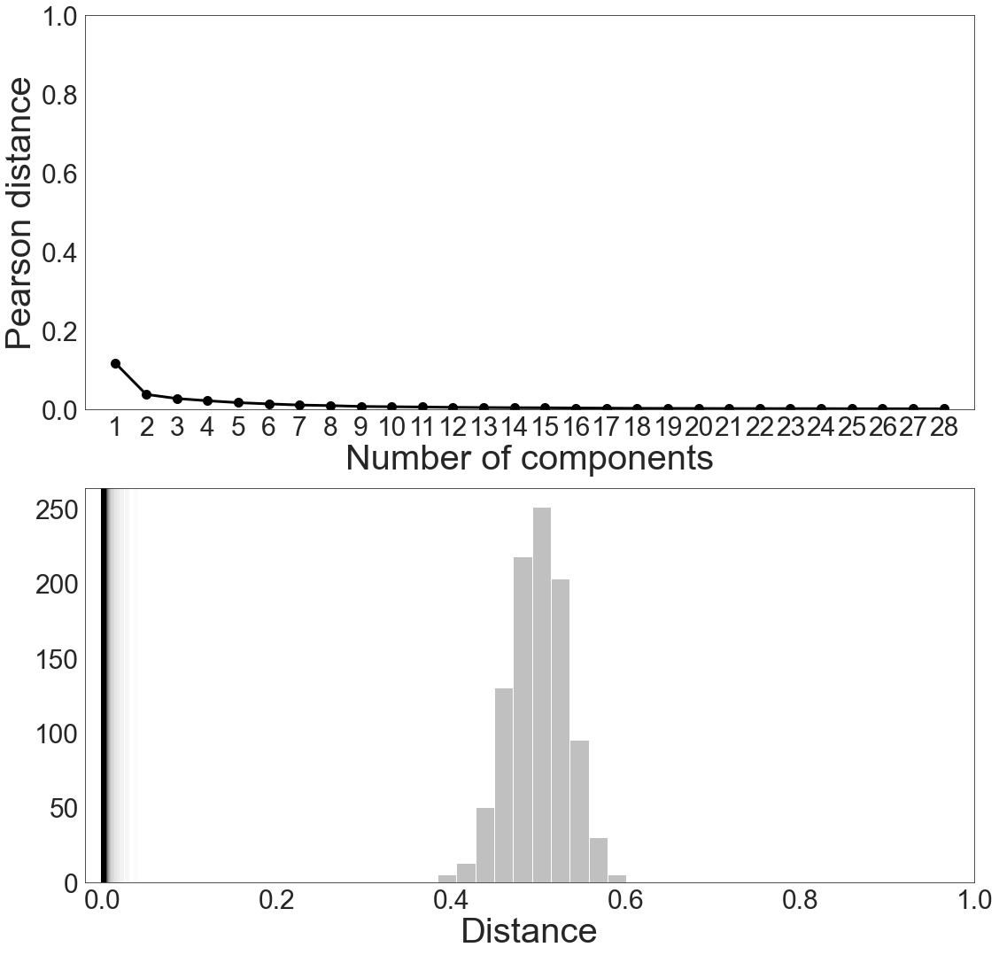

In [97]:
dist = np.ones(n_components)*np.nan

C = []
for c in np.arange(n_components):
    
    C.append(c+1)
    
    if (feature == 'color'):
        pca_partial = pickle.load(open(data_direc + 'color/pca/similarity_95_l2/' + str(c+1) + '_similarity_l2.pickle', "rb" ))
    elif (feature == 'shape'):
        pca_partial = pickle.load(open(data_direc + 'shape/pca/similarity_95_l2/' + str(c+1) + '_similarity_l2.pickle', "rb" ))
    elif (feature == 'vgg'):
        pca_partial = pickle.load(open(data_direc + 'vgg/pca/similarity_95_euclidean/' + layer + '_' + str(c+1) + '_similarity_euclidean.pickle', "rb" ))
    
    pca_partial = pca_partial['similarity_matrix'] + pca_partial['similarity_matrix'].T
    dist[c] = visual_search_rsa.pearson_distance(pca_full, pca_partial)
    
    print(dist[c])
    
## Plot. 
cm_subsection = np.linspace(0.0, 1.0, n_components)
colors = [cm.Greys(x) for x in cm_subsection]

fig, ax = plt.subplots(2, 1, figsize = (18,18))
# Spearman similarity matrix undefined for 1 component 
ax[0].plot(C[0:], dist[0:], 'o-', color='k', linewidth=3, markersize=10)
ax[0].set_xticks(C)
ax[0].set_xlabel('Number of components', fontsize=40)
ax[0].set_ylabel('Pearson distance', fontsize=40)
ax[0].set_xlim(0,C[-1]+1)
ax[0].set_ylim(0,1)
ax[0].tick_params(labelsize=30)

for i in np.arange(n_components):
    ax[1].axvline(x=dist[i], color=colors[i], linewidth=5)
ax[1].hist(pca_full_null, color='silver')
ax[1].set_xlim(-0.02,1)
ax[1].set_xlabel('Distance', fontsize=40)
ax[1].tick_params(labelsize=30)
plt.axvline(x=dist_to_self, color='k',linewidth=5);

vgg


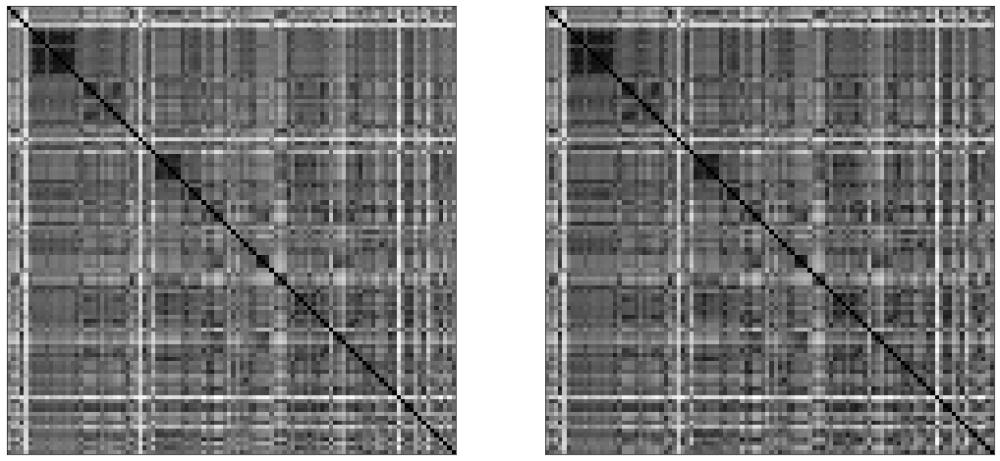

In [61]:
## Plot similarity matrix comparison, full vs. PCA based. 
print(feature)
target_comp = 19
if (feature == 'color'):
    pca_partial = pickle.load(open(data_direc + 'color/pca/similarity_95_l2/' + str(target_comp) + '_similarity_l2.pickle', "rb" ))
elif (feature == 'shape'):
    pca_partial = pickle.load(open(data_direc + 'shape/pca/similarity_95_l2/' + str(target_comp) + '_similarity_l2.pickle', "rb" ))
elif (feature == 'vgg'):
    pca_partial = pickle.load(open(data_direc + 'vgg/pca/similarity_95_euclidean/' + layer + '_' + str(target_comp) + '_similarity_euclidean.pickle', "rb" ))
    
pca_partial = pca_partial['similarity_matrix'] + pca_partial['similarity_matrix'].T
    
fig, ax = plt.subplots(1, 2, figsize=(18,18))
ax[0].imshow(pca_full, cmap='Greys_r')
ax[0].set_xticks([]); ax[0].set_yticks([])
ax[1].imshow(pca_partial, cmap='Greys_r')
ax[1].set_xticks([]); ax[1].set_yticks([])

plt.show();